### SO here is the situation -- the required weather data is very hard to find for many locations for various metrics. For example, I haven't been able to find 24 precipitation for large portions of Canada. This emphasizes the need for alternative "reduced data" methods to determine the FWI. I'd like to try to build a machine learning model that can predict FWI based on temperature and wind speed alone (or some other combination).

In [1]:
import keras
import pandas as pd

In [2]:
singleDay = pd.read_csv("single_day_climate_data.csv")

# THese missing flags are actually mostly incorrect
#simpleDF=singleDay.query("TOTAL_PRECIPITATION_FLAG != 'M' and MEAN_TEMPERATURE_FLAG !='M' and SPEED_MAX_GUST_FLAG !='M' and MAX_REL_HUMIDITY_FLAG !='M'")

# Let's get the data for the stations that aren't missing any of the data (at least for this day)
simpleDF = singleDay.query("TOTAL_PRECIPITATION > -1000 and MEAN_TEMPERATURE > -1000 and SPEED_MAX_GUST > -1000 and MAX_REL_HUMIDITY > -1000")[['x','y','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']]


In [3]:
import math
# “”” Define Class FWI Class first”””
class FWICLASS:
    def __init__(self,temp,rhum,wind,prcp):
        self.h = rhum
        self.t = temp
        self.w = wind
        self.p = prcp
    def FFMCcalc(self,ffmc0):
        mo = (147.2*(101.0 - ffmc0))/(59.5 + ffmc0) #*Eq. 1*#
        if (self.p > 0.5):
            rf = self.p - 0.5 #*Eq. 2*#%%!
            if(mo > 150.0):
                mo = (mo+42.5*rf*math.exp(-100.0/(251.0-mo))*(1.0 - math.exp(-6.93/rf))) + (.0015*(mo - 150.0)**2)*math.sqrt(rf) #*Eq. 3b*#
            elif mo <= 150.0:
                mo = mo+42.5*rf*math.exp(-100.0/(251.0-mo))*(1.0 - math.exp(-6.93/rf)) #*Eq. 3a*#
        if(mo > 250.0):
            mo = 250.0
        ed = .942*(self.h**.679) + (11.0*math.exp((self.h-100.0)/10.0))+0.18*(21.1-self.t)*(1.0 - 1.0/math.exp(.1150 * self.h)) #*Eq. 4*#
        if(mo < ed):
            ew = .618*(self.h**.753) + (10.0*math.exp((self.h-100.0)/10.0))+ .18*(21.1-self.t)*(1.0 - 1.0/math.exp(.115 * self.h)) #*Eq. 5*#
            if(mo <= ew):
                kl = .424*(1.0-((100.0-self.h)/100.0)**1.7)+(.0694*math.sqrt(self.w))*(1.0 - ((100.0 - self.h)/100.0)**8) #*Eq. 7a*#
                kw = kl * (.581 * math.exp(.0365 * self.t)) #*Eq. 7b*#
                m = ew - (ew - mo)/10.0**kw #*Eq. 9*#
            elif mo > ew:
                m = mo
        elif(mo == ed):
            m = mo
        elif mo > ed:
            kl =.424*(1.0-(self.h/100.0)**1.7)+(.0694*math.sqrt(self.w))* (1.0-(self.h/100.0)**8) #*Eq. 6a*#
            kw = kl * (.581*math.exp(.0365*self.t)) #*Eq. 6b*#
            m = ed + (mo-ed)/10.0 ** kw #*Eq. 8*#
        ffmc = (59.5 * (250.0 -m)) / (147.2 + m)
        if (ffmc > 101.0):
            ffmc = 101.0
        if (ffmc <= 0.0):
            ffmc = 0.0
        return ffmc
#*Eq. 10*#
    def DMCcalc(self,dmc0,mth):
        el = [6.5,7.5,9.0,12.8,13.9,13.9,12.4,10.9,9.4,8.0,7.0,6.0]
        t = self.t
        if (t < -1.1):
            t = -1.1
        rk = 1.894*(t+1.1) * (100.0-self.h) * (el[mth-1]*0.0001) #*Eqs. 16 and 17*#

        if self.p > 1.5:
            ra= self.p
            rw = 0.92*ra - 1.27
            wmi = 20.0 + 280.0/math.exp(0.023*dmc0)
            if dmc0 <= 33.0:
                b = 100.0 /(0.5 + 0.3*dmc0)
            elif dmc0 > 33.0:
                if dmc0 <= 65.0:
                    b = 14.0 - 1.3*math.log(dmc0)
            elif dmc0 > 65.0:
                b = 6.2 * math.log(dmc0) - 17.2
            wmr = wmi + (1000*rw) / (48.77+b*rw)
            pr = 43.43 * (5.6348 - math.log(wmr-20.0))
        elif self.p <= 1.5:
            pr = dmc0
        if (pr<0.0):
            pr = 0.0
        dmc = pr + rk
        if(dmc<= 1.0):
            dmc = 1.0
        return dmc


    def DCcalc(self,dc0,mth):
        fl = [-1.6, -1.6, -1.6, 0.9, 3.8, 5.8, 6.4, 5.0, 2.4, 0.4, -1.6, -1.6]
        t = self.t
        if(t < -2.8):
            t = -2.8
        pe = (0.36*(t+2.8) + fl[mth-1] )/2
        if pe <=0.0:
            pe = 0.0
        #*Eq. 22*#
        if (self.p > 2.8):
            ra = self.p
            rw = 0.83*ra - 1.27 #*Eq. 18*#
            smi = 800.0 * math.exp(-dc0/400.0) #*Eq. 19*#
            dr = dc0 - 400.0*math.log( 1.0+((3.937*rw)/smi) ) #*Eqs. 20 and 21*#
            if (dr > 0.0):
                dc = dr + pe
            else: dc = dc0
        #elif self.p <= 2.8:
        else:
            dc = dc0 + pe
        return dc


    def ISIcalc(self,ffmc):
        mo = 147.2*(101.0-ffmc) / (59.5+ffmc)
        ff = 19.115*math.exp(mo*-0.1386) * (1.0+(mo**5.31)/49300000.0)
        isi = ff * math.exp(0.05039*self.w)
        return isi


    def BUIcalc(self,dmc,dc):
        if dmc <= 0.4*dc:
            bui = (0.8*dc*dmc) / (dmc+0.4*dc)
        else:
            bui = dmc-(1.0-0.8*dc/(dmc+0.4*dc))*(0.92+(0.0114*dmc)**1.7)
        if bui <0.0:
            bui = 0.0
        return bui


    def FWIcalc(self,isi,bui):
        if bui <= 80.0:
            bb = 0.1 * isi * (0.626*bui**0.809 + 2.0)
        else:
            bb = 0.1*isi*(1000.0/(25. + 108.64/math.exp(0.023*bui)))
        if(bb <= 1.0):
            fwi = bb
        else:
            fwi = math.exp(2.72 * (0.434*math.log(bb))**0.647)

        return fwi


def main():
    ffmc0 = 85.0
    dmc0 = 6.0
    dc0 = 15.0
    infile = open('test_in_fwi.txt','r')
    outfile = open('fwioutput.txt','w')
    try:
        for line in infile:
            mth,day,temp,rhum,wind,prcp=[float(field) for field in line.strip().lstrip('[').rstrip(']').split()]
            if rhum>100.0:
                rhum = 100.0
            mth = int(mth)
            fwisystem = FWICLASS(temp,rhum,wind,prcp)
            ffmc = fwisystem.FFMCcalc(ffmc0)
            dmc = fwisystem.DMCcalc(dmc0,mth)
            dc = fwisystem.DCcalc(dc0,mth)
            isi = fwisystem.ISIcalc(ffmc)
            bui = fwisystem.BUIcalc(dmc,dc)
            fwi = fwisystem.FWIcalc(isi,bui)
            ffmc0 = ffmc
            dmc0 = dmc
            dc0 = dc
            print(str(ffmc),str(dmc),str(dc),str(isi),str(bui),str(fwi))
    finally:
        infile.close()
        outfile.close()
main()

def computeFWI(temp,rhum,prcp,wind,mth):
    ffmc0 = 85.0
    dmc0 = 6.0
    dc0 = 15.0

    if rhum>100.0:
        rhum = 100.0
    mth = int(mth)
    fwisystem = FWICLASS(temp,rhum,wind,prcp)
    ffmc = fwisystem.FFMCcalc(ffmc0)
    dmc = fwisystem.DMCcalc(dmc0,mth)
    dc = fwisystem.DCcalc(dc0,mth)
    isi = fwisystem.ISIcalc(ffmc)
    bui = fwisystem.BUIcalc(dmc,dc)
    fwi = fwisystem.FWIcalc(isi,bui)
    ffmc0 = ffmc
    dmc0 = dmc
    dc0 = dc
    return fwi

# FROM https://publications.gc.ca/collections/collection_2016/rncan-nrcan/Fo133-1-424-eng.pdf

87.12550153156418 7.811796612 19.204 9.516918108321766 7.8039278404027135 8.705700639590445
90.8244737324999 11.674698630000002 25.028 10.802241217606626 11.60163827115898 11.549865177133597
77.63471875369589 11.112184754829832 27.49489140897453 1.5914554957643685 11.107277643541376 1.1193002660344609
90.21988710465098 16.188479766829833 35.29889140897453 13.40597459113381 16.121817741412364 15.890875255293292
65.31710438957165 9.79111185128955 23.010025331964645 1.3910938250537408 9.761933065289 0.8283486511031101
55.41626480735404 6.059921033103912 10.184518341592803 1.1877201080809798 5.87752455287238 0.549121999201251
80.84398999216936 9.667191765103912 16.368518341592804 1.8641589805082597 9.485649709445626 1.3929517266332863
61.741292230592016 7.150708726042811 17.26749308437178 1.2412291865095855 7.1345147457447196 0.6291345862151786
64.4820361685994 7.735685778042811 21.29149308437178 1.7303567635065653 8.107380366269709 0.9349073503101377
77.63396316147791 9.201024334042812 25

In [4]:
#OK let's output the state as a .csv just so we have SOMETHING)


#First, we need to compute the fwi
#Lets turn the data into a numpy array and then loop over it
numpysimpleDF = simpleDF[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION','SPEED_MAX_GUST']].to_numpy()

fwis = []
for i in range(len(numpysimpleDF)):
    fwis.append(computeFWI(numpysimpleDF[i][0],numpysimpleDF[i][1],numpysimpleDF[i][2],numpysimpleDF[i][3],11))

simpleDF["fwi"] = fwis
    
simpleDF.set_index("STATION_NAME")[['x','y','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION','fwi']].to_csv("Initial_State.csv")

In [5]:
print(f"These are all the {len(simpleDF)} stations that have all 4 types of data (at least on november 2 2023)")

# There are 351 stations that have this data -- it actually feels like too  many for me to go through manually and select them.
# What if I just take ALL station data from the last like 10 years or something and just filter out all the ones that are missing data?

for i in range(len(simpleDF.STATION_NAME)):
    print(simpleDF.STATION_NAME.sort_values().values[i])

These are all the 351 stations that have all 4 types of data (at least on november 2 2023)
ABBOTSFORD A
AGASSIZ RCS
ARGENTIA (AUT)
ARMSTRONG A
ARVIAT A
ARVIAT CLIMATE
ATTAWAPISKAT A
BACCARO PT
BADGER (AUT)
BAGOTVILLE A
BAIE-COMEAU
BAIE-COMEAU A
BAKER LAKE A
BAKER LAKE CLIMATE
BALLENAS ISLAND
BARRIE-ORO
BAS CARAQUET
BATHURST A
BATHURST INLET
BEATRICE CLIMATE
BEAUPORT
BEAVER MINES
BELLA BELLA
BELLA COOLA AIRPORT
BIG TROUT LAKE
BIG TROUT LAKE A
BONAVISTA
BONILLA ISLAND (AUT)
BOW VALLEY
BRANDON A
BRANTFORD AIRPORT
BRIER ISLAND
BROCKVILLE CLIMATE
BUFFALO NARROWS (AUT)
BUFFALO NARROWS A
BURGEO NL
CALGARY INT'L CS
CALGARY INTL A
CALGARY SPRINGBANK A
CAMBRIDGE BAY GSN
CAP-CHAT
CAP-MADELEINE
CAP-TOURMENTE
CAPE LIVERPOOL
CAPE ST JAMES
CARBERRY CS
CARIBOU ISLAND (AUT)
CARIBOU POINT (AUT)
CARTWRIGHT A
CATHEDRAL POINT (AUT)
CHARLEVOIX (MRC)
CHARLO AUTO
CHARLOTTETOWN A
CHATHAM KENT
CHETICAMP HIGHLANDS NATIONAL PARK
CHEVERY
CHIBOUGAMAU CHAPAIS A
CHIBOUGAMAU-CHAPAIS
CHURCHILL A
CHURCHILL CLIMATE
CLARE

In [6]:
simpleDF_on = singleDay.query("TOTAL_PRECIPITATION > -1000 and MEAN_TEMPERATURE > -1000 and SPEED_MAX_GUST > -1000 and MAX_REL_HUMIDITY > -1000 and PROVINCE_CODE=='ON'")[['x','y','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']]
for i in range(len(simpleDF_on.STATION_NAME)):
    print(simpleDF_on.STATION_NAME.sort_values().values[i])

ARMSTRONG A
ATTAWAPISKAT A
BARRIE-ORO
BEATRICE CLIMATE
BIG TROUT LAKE
BIG TROUT LAKE A
BRANTFORD AIRPORT
BROCKVILLE CLIMATE
CARIBOU ISLAND (AUT)
CHATHAM KENT
COBOURG (AUT)
DELHI CS
DRYDEN REGIONAL
EARLTON A
EARLTON CLIMATE
EGBERT CS
ELORA RCS
FORT SEVERN A
GODERICH
GORE BAY CLIMATE
GORE BAY-MANITOULIN
HAMILTON A
HARROW CDA AUTO
KAPUSKASING A
KAPUSKASING CDA ON
KEMPTVILLE CS
KENORA A
KENORA RCS
KINGSTON CLIMATE
KITCHENER/WATERLOO
LANSDOWNE HOUSE (AUT)
LANSDOWNE HOUSE A
MONO CENTRE
MOOSE CREEK WELLS
MOOSONEE
MOUNT FOREST (AUT)
NORTH BAY A
NORTH BAY AIRPORT
OGOKI POST A
OSHAWA
OTTAWA CDA RCS
OTTAWA INTL A
PEAWANUCK (AUT)
PEAWANUCK A
PETERBOROUGH A
PICKLE LAKE (AUT)
PICKLE LAKE A
POINT PETRE (AUT)
PORT WELLER (AUT)
PUKASKWA (AUT)
RIDGETOWN RCS
SARNIA
SARNIA CLIMATE
SAULT STE MARIE A
SAULT STE. MARIE AIRPORT
SIOUX LOOKOUT A
SIOUX LOOKOUT AIRPORT
SUDBURY A
SUDBURY CLIMATE
TERRACE BAY AIRPORT
TIMMINS A
TIMMINS CLIMATE
TOBERMORY RCS
TORONTO CITY CENTRE
TORONTO INTL A
TRENTON A
UXBRIDGE WEST
VI

### A small subset of the data is included on the github, but the full dataset can be accessed here:
### https://climate-change.canada.ca/climate-data/#/daily-climate-data

In [7]:
# OK I downloaded all data from the above stations from 2000 - 2023; lets load it in 

import glob
climateData = sorted(glob.glob("climate_daily_ontario_since_2000-reduced/*.csv"))
all_csv = []

for i in range(len(climateData)):
    
    #I'm just going to dropna from all of the data because at this point I'm running out of time to try to process it more involvedly.
    all_csv.append(pd.read_csv(climateData[i])[['x','y','LOCAL_DATE','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']].dropna())

In [8]:
# Let's concat all of those to have one dataframe with everything.
full_df = pd.concat(all_csv).reset_index().drop("index",axis = 1)
full_df = full_df.dropna()
full_df = full_df.sort_values("STATION_NAME")
full_df = full_df.reset_index(drop = True)

# It is length 170,000.
# Honestly this is probably good enough to train a model of 4 parameters and one output.

In [9]:
full_df

,x,y,LOCAL_DATE,STATION_NAME,MEAN_TEMPERATURE,MAX_REL_HUMIDITY,SPEED_MAX_GUST,TOTAL_PRECIPITATION
0,-88.909722,50.290278,2022-04-29 00:00:00,ARMSTRONG A,1.1,73.0,37.0,0.0
1,-88.909722,50.290278,2022-02-01 00:00:00,ARMSTRONG A,-10.2,97.0,63.0,0.2
2,-88.909722,50.290278,2022-02-02 00:00:00,ARMSTRONG A,-23.3,75.0,42.0,0.0
3,-88.909722,50.290278,2022-02-08 00:00:00,ARMSTRONG A,-8.9,96.0,46.0,0.0
4,-88.909722,50.290278,2022-02-10 00:00:00,ARMSTRONG A,-16.8,90.0,35.0,0.0
...,...,...,...,...,...,...,...,...
170484,-81.108611,44.744167,2021-03-08 00:00:00,WIARTON A,-1.6,93.0,45.0,0.0
170485,-81.108611,44.744167,2021-03-10 00:00:00,WIARTON A,7.4,67.0,51.0,0.0
170486,-81.108611,44.744167,2021-03-12 00:00:00,WIARTON A,-0.9,92.0,82.0,0.0
170487,-81.108611,44.744167,2021-02-23 00:00:00,WIARTON A,1.0,98.0,46.0,2.6


In [10]:
#First, we need to compute the fwi
#Lets turn the data into a numpy array and then loop over it
numpysimple_fullDF = full_df[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION','SPEED_MAX_GUST']].to_numpy()

fwis_full = []
for i in range(len(numpysimple_fullDF)):
    fwis_full.append(computeFWI(numpysimple_fullDF[i][0],numpysimple_fullDF[i][1],numpysimple_fullDF[i][2],numpysimple_fullDF[i][3],11))

full_df["fwi"] = fwis_full

full_df.to_csv('ontariostations_2000_to_2023_t_s_p_fwi.csv')

In [11]:
full_df

,x,y,LOCAL_DATE,STATION_NAME,MEAN_TEMPERATURE,MAX_REL_HUMIDITY,SPEED_MAX_GUST,TOTAL_PRECIPITATION,fwi
0,-88.909722,50.290278,2022-04-29 00:00:00,ARMSTRONG A,1.1,73.0,37.0,0.0,8.415498
1,-88.909722,50.290278,2022-02-01 00:00:00,ARMSTRONG A,-10.2,97.0,63.0,0.2,14.899067
2,-88.909722,50.290278,2022-02-02 00:00:00,ARMSTRONG A,-23.3,75.0,42.0,0.0,9.671279
3,-88.909722,50.290278,2022-02-08 00:00:00,ARMSTRONG A,-8.9,96.0,46.0,0.0,7.684838
4,-88.909722,50.290278,2022-02-10 00:00:00,ARMSTRONG A,-16.8,90.0,35.0,0.0,5.695663
...,...,...,...,...,...,...,...,...,...
170484,-81.108611,44.744167,2021-03-08 00:00:00,WIARTON A,-1.6,93.0,45.0,0.0,7.780153
170485,-81.108611,44.744167,2021-03-10 00:00:00,WIARTON A,7.4,67.0,51.0,0.0,17.317508
170486,-81.108611,44.744167,2021-03-12 00:00:00,WIARTON A,-0.9,92.0,82.0,0.0,31.715704
170487,-81.108611,44.744167,2021-02-23 00:00:00,WIARTON A,1.0,98.0,46.0,2.6,0.724868


In [12]:
### Ok now we need to build a DNN that learns to predict FWI from 3 parameters

# let's first scramble the dataframe to make sure we get a nice random order
full_df_scramble = full_df.sample(frac=1).reset_index(drop=True)

features_numpy = full_df_scramble[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION']].to_numpy()
labels_numpy = full_df_scramble.fwi.values

In [13]:
train_features = features_numpy[:-int(len(features_numpy)/4)]
train_labels = labels_numpy[:-int(len(features_numpy)/4)]

test_features = features_numpy[-int(len(features_numpy)/4):]
test_labels = labels_numpy[-int(len(features_numpy)/4):]

In [43]:
import keras


model = keras.Sequential()
#we'll just flatten the one hot encoded sequence
model.add(keras.layers.Dense(3, input_shape=(3,), activation='leaky_relu'))
# Experimented with various hidden layers lead to this
model.add(keras.layers.Dense(25, activation='leaky_relu'))
model.add(keras.layers.Dense(25, activation='leaky_relu'))
model.add(keras.layers.Dense(25, activation='leaky_relu'))
model.add(keras.layers.Dense(25, activation='leaky_relu'))
model.add(keras.layers.Dense(25, activation='leaky_relu'))
model.add(keras.layers.Dense(25, activation='leaky_relu'))

model.add(keras.layers.Dense(1, activation='relu'))

model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])

history=model.fit(train_features.reshape(-1,3),train_labels, epochs=100000, batch_size=50000,verbose = 1,validation_data=(test_features.reshape(-1,3), test_labels))


Epoch 1/100000
3/3 [==============================] - 3s 260ms/step - loss: 54.6578 - mean_squared_error: 54.6578 - val_loss: 47.0092 - val_mean_squared_error: 47.0092
Epoch 2/100000
3/3 [==============================] - 0s 76ms/step - loss: 50.6437 - mean_squared_error: 50.6437 - val_loss: 42.8575 - val_mean_squared_error: 42.8575
Epoch 3/100000
3/3 [==============================] - 0s 77ms/step - loss: 46.3766 - mean_squared_error: 46.3766 - val_loss: 38.7062 - val_mean_squared_error: 38.7062
Epoch 4/100000
3/3 [==============================] - 0s 86ms/step - loss: 42.3004 - mean_squared_error: 42.3004 - val_loss: 35.3290 - val_mean_squared_error: 35.3290
Epoch 5/100000
3/3 [==============================] - 0s 105ms/step - loss: 39.2999 - mean_squared_error: 39.2999 - val_loss: 33.8099 - val_mean_squared_error: 33.8099
Epoch 6/100000
3/3 [==============================] - 0s 76ms/step - loss: 38.2675 - mean_squared_error: 38.2675 - val_loss: 34.2220 - val_mean_squared_error: 34.2

Epoch 50/100000
3/3 [==============================] - 0s 79ms/step - loss: 30.8158 - mean_squared_error: 30.8158 - val_loss: 26.2289 - val_mean_squared_error: 26.2289
Epoch 51/100000
3/3 [==============================] - 0s 74ms/step - loss: 30.6696 - mean_squared_error: 30.6696 - val_loss: 26.1116 - val_mean_squared_error: 26.1116
Epoch 52/100000
3/3 [==============================] - 0s 93ms/step - loss: 30.5979 - mean_squared_error: 30.5979 - val_loss: 26.0921 - val_mean_squared_error: 26.0921
Epoch 53/100000
3/3 [==============================] - 0s 70ms/step - loss: 30.5007 - mean_squared_error: 30.5007 - val_loss: 25.9531 - val_mean_squared_error: 25.9531
Epoch 54/100000
3/3 [==============================] - 0s 79ms/step - loss: 30.3809 - mean_squared_error: 30.3809 - val_loss: 25.8765 - val_mean_squared_error: 25.8765
Epoch 55/100000
3/3 [==============================] - 0s 75ms/step - loss: 30.3103 - mean_squared_error: 30.3103 - val_loss: 25.7402 - val_mean_squared_error: 

Epoch 99/100000
3/3 [==============================] - 0s 79ms/step - loss: 26.8681 - mean_squared_error: 26.8681 - val_loss: 22.2499 - val_mean_squared_error: 22.2499
Epoch 100/100000
3/3 [==============================] - 0s 68ms/step - loss: 26.7539 - mean_squared_error: 26.7539 - val_loss: 22.2121 - val_mean_squared_error: 22.2121
Epoch 101/100000
3/3 [==============================] - 0s 77ms/step - loss: 26.7079 - mean_squared_error: 26.7079 - val_loss: 22.2635 - val_mean_squared_error: 22.2635
Epoch 102/100000
3/3 [==============================] - 0s 68ms/step - loss: 26.7080 - mean_squared_error: 26.7080 - val_loss: 22.1523 - val_mean_squared_error: 22.1523
Epoch 103/100000
3/3 [==============================] - 0s 79ms/step - loss: 26.6279 - mean_squared_error: 26.6279 - val_loss: 22.1193 - val_mean_squared_error: 22.1193
Epoch 104/100000
3/3 [==============================] - 0s 68ms/step - loss: 26.6112 - mean_squared_error: 26.6112 - val_loss: 22.1985 - val_mean_squared_er

3/3 [==============================] - 0s 81ms/step - loss: 26.0335 - mean_squared_error: 26.0335 - val_loss: 21.5635 - val_mean_squared_error: 21.5635
Epoch 196/100000
3/3 [==============================] - 0s 82ms/step - loss: 26.0299 - mean_squared_error: 26.0299 - val_loss: 21.5409 - val_mean_squared_error: 21.5409
Epoch 197/100000
3/3 [==============================] - 0s 79ms/step - loss: 26.0203 - mean_squared_error: 26.0203 - val_loss: 21.5464 - val_mean_squared_error: 21.5464
Epoch 198/100000
3/3 [==============================] - 0s 81ms/step - loss: 26.0225 - mean_squared_error: 26.0225 - val_loss: 21.5352 - val_mean_squared_error: 21.5352
Epoch 199/100000
3/3 [==============================] - 0s 71ms/step - loss: 26.0197 - mean_squared_error: 26.0197 - val_loss: 21.5528 - val_mean_squared_error: 21.5528
Epoch 200/100000
3/3 [==============================] - 0s 79ms/step - loss: 26.0433 - mean_squared_error: 26.0433 - val_loss: 21.5373 - val_mean_squared_error: 21.5373
Epo

3/3 [==============================] - 0s 82ms/step - loss: 25.9528 - mean_squared_error: 25.9528 - val_loss: 21.4901 - val_mean_squared_error: 21.4901
Epoch 292/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.9726 - mean_squared_error: 25.9726 - val_loss: 21.4808 - val_mean_squared_error: 21.4808
Epoch 293/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.9578 - mean_squared_error: 25.9578 - val_loss: 21.4776 - val_mean_squared_error: 21.4776
Epoch 294/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.9479 - mean_squared_error: 25.9479 - val_loss: 21.4869 - val_mean_squared_error: 21.4869
Epoch 295/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.9518 - mean_squared_error: 25.9518 - val_loss: 21.5135 - val_mean_squared_error: 21.5135
Epoch 296/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.9711 - mean_squared_error: 25.9711 - val_loss: 21.6347 - val_mean_squared_error: 21.6347
Epo

3/3 [==============================] - 0s 73ms/step - loss: 25.9767 - mean_squared_error: 25.9767 - val_loss: 21.4514 - val_mean_squared_error: 21.4514
Epoch 388/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.9929 - mean_squared_error: 25.9929 - val_loss: 21.4480 - val_mean_squared_error: 21.4480
Epoch 389/100000
3/3 [==============================] - 0s 77ms/step - loss: 26.0269 - mean_squared_error: 26.0269 - val_loss: 21.4559 - val_mean_squared_error: 21.4559
Epoch 390/100000
3/3 [==============================] - 0s 83ms/step - loss: 26.0337 - mean_squared_error: 26.0337 - val_loss: 21.4457 - val_mean_squared_error: 21.4457
Epoch 391/100000
3/3 [==============================] - 0s 75ms/step - loss: 26.0340 - mean_squared_error: 26.0340 - val_loss: 21.4642 - val_mean_squared_error: 21.4642
Epoch 392/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.9853 - mean_squared_error: 25.9853 - val_loss: 21.4953 - val_mean_squared_error: 21.4953
Epo

3/3 [==============================] - 0s 69ms/step - loss: 25.9314 - mean_squared_error: 25.9314 - val_loss: 21.5008 - val_mean_squared_error: 21.5008
Epoch 484/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.9575 - mean_squared_error: 25.9575 - val_loss: 21.5834 - val_mean_squared_error: 21.5834
Epoch 485/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.9993 - mean_squared_error: 25.9993 - val_loss: 21.5921 - val_mean_squared_error: 21.5921
Epoch 486/100000
3/3 [==============================] - 0s 65ms/step - loss: 26.0005 - mean_squared_error: 26.0005 - val_loss: 21.5464 - val_mean_squared_error: 21.5464
Epoch 487/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.9824 - mean_squared_error: 25.9824 - val_loss: 21.6786 - val_mean_squared_error: 21.6786
Epoch 488/100000
3/3 [==============================] - 0s 88ms/step - loss: 26.0481 - mean_squared_error: 26.0481 - val_loss: 21.6143 - val_mean_squared_error: 21.6143
Epo

3/3 [==============================] - 0s 65ms/step - loss: 25.9056 - mean_squared_error: 25.9056 - val_loss: 21.4666 - val_mean_squared_error: 21.4666
Epoch 580/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.9041 - mean_squared_error: 25.9041 - val_loss: 21.4490 - val_mean_squared_error: 21.4490
Epoch 581/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.8903 - mean_squared_error: 25.8903 - val_loss: 21.4272 - val_mean_squared_error: 21.4272
Epoch 582/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.8829 - mean_squared_error: 25.8829 - val_loss: 21.4272 - val_mean_squared_error: 21.4272
Epoch 583/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.8869 - mean_squared_error: 25.8869 - val_loss: 21.4858 - val_mean_squared_error: 21.4858
Epoch 584/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.9051 - mean_squared_error: 25.9051 - val_loss: 21.4701 - val_mean_squared_error: 21.4701
Epo

3/3 [==============================] - 0s 61ms/step - loss: 25.8784 - mean_squared_error: 25.8784 - val_loss: 21.4127 - val_mean_squared_error: 21.4127
Epoch 676/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.8746 - mean_squared_error: 25.8746 - val_loss: 21.4089 - val_mean_squared_error: 21.4089
Epoch 677/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.8734 - mean_squared_error: 25.8734 - val_loss: 21.4086 - val_mean_squared_error: 21.4086
Epoch 678/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.8687 - mean_squared_error: 25.8687 - val_loss: 21.4268 - val_mean_squared_error: 21.4268
Epoch 679/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.8840 - mean_squared_error: 25.8840 - val_loss: 21.4302 - val_mean_squared_error: 21.4302
Epoch 680/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.8836 - mean_squared_error: 25.8836 - val_loss: 21.4543 - val_mean_squared_error: 21.4543
Epo

3/3 [==============================] - 0s 58ms/step - loss: 25.9182 - mean_squared_error: 25.9182 - val_loss: 21.5327 - val_mean_squared_error: 21.5327
Epoch 772/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.9242 - mean_squared_error: 25.9242 - val_loss: 21.4943 - val_mean_squared_error: 21.4943
Epoch 773/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.9156 - mean_squared_error: 25.9156 - val_loss: 21.4096 - val_mean_squared_error: 21.4096
Epoch 774/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.9229 - mean_squared_error: 25.9229 - val_loss: 21.4047 - val_mean_squared_error: 21.4047
Epoch 775/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.8824 - mean_squared_error: 25.8824 - val_loss: 21.5391 - val_mean_squared_error: 21.5391
Epoch 776/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.9313 - mean_squared_error: 25.9313 - val_loss: 21.4289 - val_mean_squared_error: 21.4289
Epo

3/3 [==============================] - 0s 55ms/step - loss: 25.8863 - mean_squared_error: 25.8863 - val_loss: 21.4140 - val_mean_squared_error: 21.4140
Epoch 868/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.9039 - mean_squared_error: 25.9039 - val_loss: 21.4680 - val_mean_squared_error: 21.4680
Epoch 869/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.9079 - mean_squared_error: 25.9079 - val_loss: 21.4025 - val_mean_squared_error: 21.4025
Epoch 870/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.8733 - mean_squared_error: 25.8733 - val_loss: 21.4298 - val_mean_squared_error: 21.4298
Epoch 871/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.8857 - mean_squared_error: 25.8857 - val_loss: 21.3947 - val_mean_squared_error: 21.3947
Epoch 872/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.9210 - mean_squared_error: 25.9210 - val_loss: 21.4052 - val_mean_squared_error: 21.4052
Epo

3/3 [==============================] - 0s 57ms/step - loss: 25.9619 - mean_squared_error: 25.9619 - val_loss: 21.5530 - val_mean_squared_error: 21.5530
Epoch 964/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.9586 - mean_squared_error: 25.9586 - val_loss: 21.4020 - val_mean_squared_error: 21.4020
Epoch 965/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.9470 - mean_squared_error: 25.9470 - val_loss: 21.4840 - val_mean_squared_error: 21.4840
Epoch 966/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.9607 - mean_squared_error: 25.9607 - val_loss: 21.5604 - val_mean_squared_error: 21.5604
Epoch 967/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.9367 - mean_squared_error: 25.9367 - val_loss: 21.5569 - val_mean_squared_error: 21.5569
Epoch 968/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.9717 - mean_squared_error: 25.9717 - val_loss: 21.4478 - val_mean_squared_error: 21.4478
Epo

3/3 [==============================] - 0s 65ms/step - loss: 25.9159 - mean_squared_error: 25.9159 - val_loss: 21.4650 - val_mean_squared_error: 21.4650
Epoch 1060/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.8772 - mean_squared_error: 25.8772 - val_loss: 21.3828 - val_mean_squared_error: 21.3828
Epoch 1061/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.9041 - mean_squared_error: 25.9041 - val_loss: 21.3867 - val_mean_squared_error: 21.3867
Epoch 1062/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.8682 - mean_squared_error: 25.8682 - val_loss: 21.4076 - val_mean_squared_error: 21.4076
Epoch 1063/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.8954 - mean_squared_error: 25.8954 - val_loss: 21.4258 - val_mean_squared_error: 21.4258
Epoch 1064/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.8835 - mean_squared_error: 25.8835 - val_loss: 21.4859 - val_mean_squared_error: 21.485

3/3 [==============================] - 0s 94ms/step - loss: 25.9089 - mean_squared_error: 25.9089 - val_loss: 21.4911 - val_mean_squared_error: 21.4911
Epoch 1156/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.8894 - mean_squared_error: 25.8894 - val_loss: 21.3936 - val_mean_squared_error: 21.3936
Epoch 1157/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.9467 - mean_squared_error: 25.9467 - val_loss: 21.4432 - val_mean_squared_error: 21.4432
Epoch 1158/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.9329 - mean_squared_error: 25.9329 - val_loss: 21.3892 - val_mean_squared_error: 21.3892
Epoch 1159/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8737 - mean_squared_error: 25.8737 - val_loss: 21.3897 - val_mean_squared_error: 21.3897
Epoch 1160/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.8460 - mean_squared_error: 25.8460 - val_loss: 21.3976 - val_mean_squared_error: 21.397

3/3 [==============================] - 0s 84ms/step - loss: 25.8396 - mean_squared_error: 25.8396 - val_loss: 21.3756 - val_mean_squared_error: 21.3756
Epoch 1252/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.8296 - mean_squared_error: 25.8296 - val_loss: 21.3841 - val_mean_squared_error: 21.3841
Epoch 1253/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.8379 - mean_squared_error: 25.8379 - val_loss: 21.3768 - val_mean_squared_error: 21.3768
Epoch 1254/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.8395 - mean_squared_error: 25.8395 - val_loss: 21.3790 - val_mean_squared_error: 21.3790
Epoch 1255/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.8304 - mean_squared_error: 25.8304 - val_loss: 21.3808 - val_mean_squared_error: 21.3808
Epoch 1256/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.8389 - mean_squared_error: 25.8389 - val_loss: 21.3895 - val_mean_squared_error: 21.389

3/3 [==============================] - 0s 86ms/step - loss: 25.8314 - mean_squared_error: 25.8314 - val_loss: 21.4008 - val_mean_squared_error: 21.4008
Epoch 1348/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.8564 - mean_squared_error: 25.8564 - val_loss: 21.4662 - val_mean_squared_error: 21.4662
Epoch 1349/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8870 - mean_squared_error: 25.8870 - val_loss: 21.4202 - val_mean_squared_error: 21.4202
Epoch 1350/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.8743 - mean_squared_error: 25.8743 - val_loss: 21.3796 - val_mean_squared_error: 21.3796
Epoch 1351/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.8783 - mean_squared_error: 25.8783 - val_loss: 21.3718 - val_mean_squared_error: 21.3718
Epoch 1352/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.8505 - mean_squared_error: 25.8505 - val_loss: 21.3732 - val_mean_squared_error: 21.373

3/3 [==============================] - 0s 79ms/step - loss: 25.8334 - mean_squared_error: 25.8334 - val_loss: 21.3863 - val_mean_squared_error: 21.3863
Epoch 1444/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8242 - mean_squared_error: 25.8242 - val_loss: 21.3604 - val_mean_squared_error: 21.3604
Epoch 1445/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.8367 - mean_squared_error: 25.8367 - val_loss: 21.3627 - val_mean_squared_error: 21.3627
Epoch 1446/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.8247 - mean_squared_error: 25.8247 - val_loss: 21.3744 - val_mean_squared_error: 21.3744
Epoch 1447/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.8299 - mean_squared_error: 25.8299 - val_loss: 21.3698 - val_mean_squared_error: 21.3698
Epoch 1448/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.8275 - mean_squared_error: 25.8275 - val_loss: 21.3620 - val_mean_squared_error: 21.362

3/3 [==============================] - 0s 76ms/step - loss: 25.8219 - mean_squared_error: 25.8219 - val_loss: 21.3582 - val_mean_squared_error: 21.3582
Epoch 1540/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.8177 - mean_squared_error: 25.8177 - val_loss: 21.3634 - val_mean_squared_error: 21.3634
Epoch 1541/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.8205 - mean_squared_error: 25.8205 - val_loss: 21.3605 - val_mean_squared_error: 21.3605
Epoch 1542/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.8151 - mean_squared_error: 25.8151 - val_loss: 21.3772 - val_mean_squared_error: 21.3772
Epoch 1543/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.8322 - mean_squared_error: 25.8322 - val_loss: 21.3706 - val_mean_squared_error: 21.3706
Epoch 1544/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.8182 - mean_squared_error: 25.8182 - val_loss: 21.3532 - val_mean_squared_error: 21.353

3/3 [==============================] - 0s 78ms/step - loss: 25.8325 - mean_squared_error: 25.8325 - val_loss: 21.4354 - val_mean_squared_error: 21.4354
Epoch 1636/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8483 - mean_squared_error: 25.8483 - val_loss: 21.4307 - val_mean_squared_error: 21.4307
Epoch 1637/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8501 - mean_squared_error: 25.8501 - val_loss: 21.4135 - val_mean_squared_error: 21.4135
Epoch 1638/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8382 - mean_squared_error: 25.8382 - val_loss: 21.3658 - val_mean_squared_error: 21.3658
Epoch 1639/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8205 - mean_squared_error: 25.8205 - val_loss: 21.3677 - val_mean_squared_error: 21.3677
Epoch 1640/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.8169 - mean_squared_error: 25.8169 - val_loss: 21.3665 - val_mean_squared_error: 21.366

3/3 [==============================] - 0s 78ms/step - loss: 25.8071 - mean_squared_error: 25.8071 - val_loss: 21.4180 - val_mean_squared_error: 21.4180
Epoch 1732/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.8221 - mean_squared_error: 25.8221 - val_loss: 21.3474 - val_mean_squared_error: 21.3474
Epoch 1733/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.8429 - mean_squared_error: 25.8429 - val_loss: 21.3437 - val_mean_squared_error: 21.3437
Epoch 1734/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.8141 - mean_squared_error: 25.8141 - val_loss: 21.3466 - val_mean_squared_error: 21.3466
Epoch 1735/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.8217 - mean_squared_error: 25.8217 - val_loss: 21.3433 - val_mean_squared_error: 21.3433
Epoch 1736/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.8131 - mean_squared_error: 25.8131 - val_loss: 21.3627 - val_mean_squared_error: 21.362

3/3 [==============================] - 0s 73ms/step - loss: 25.7815 - mean_squared_error: 25.7815 - val_loss: 21.3204 - val_mean_squared_error: 21.3204
Epoch 1828/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.7792 - mean_squared_error: 25.7792 - val_loss: 21.3267 - val_mean_squared_error: 21.3267
Epoch 1829/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.7880 - mean_squared_error: 25.7880 - val_loss: 21.3327 - val_mean_squared_error: 21.3327
Epoch 1830/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.7868 - mean_squared_error: 25.7868 - val_loss: 21.3448 - val_mean_squared_error: 21.3448
Epoch 1831/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.7936 - mean_squared_error: 25.7936 - val_loss: 21.3256 - val_mean_squared_error: 21.3256
Epoch 1832/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.7862 - mean_squared_error: 25.7862 - val_loss: 21.3433 - val_mean_squared_error: 21.343

3/3 [==============================] - 0s 84ms/step - loss: 25.7791 - mean_squared_error: 25.7791 - val_loss: 21.3373 - val_mean_squared_error: 21.3373
Epoch 1924/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.7845 - mean_squared_error: 25.7845 - val_loss: 21.3896 - val_mean_squared_error: 21.3896
Epoch 1925/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.8095 - mean_squared_error: 25.8095 - val_loss: 21.3706 - val_mean_squared_error: 21.3706
Epoch 1926/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.8013 - mean_squared_error: 25.8013 - val_loss: 21.3116 - val_mean_squared_error: 21.3116
Epoch 1927/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.7929 - mean_squared_error: 25.7929 - val_loss: 21.3175 - val_mean_squared_error: 21.3175
Epoch 1928/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.7845 - mean_squared_error: 25.7845 - val_loss: 21.3617 - val_mean_squared_error: 21.361

3/3 [==============================] - 0s 76ms/step - loss: 25.7772 - mean_squared_error: 25.7772 - val_loss: 21.4054 - val_mean_squared_error: 21.4054
Epoch 2020/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.8128 - mean_squared_error: 25.8128 - val_loss: 21.3783 - val_mean_squared_error: 21.3783
Epoch 2021/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.7953 - mean_squared_error: 25.7953 - val_loss: 21.2876 - val_mean_squared_error: 21.2876
Epoch 2022/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.7838 - mean_squared_error: 25.7838 - val_loss: 21.3031 - val_mean_squared_error: 21.3031
Epoch 2023/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.7814 - mean_squared_error: 25.7814 - val_loss: 21.2991 - val_mean_squared_error: 21.2991
Epoch 2024/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.7506 - mean_squared_error: 25.7506 - val_loss: 21.2942 - val_mean_squared_error: 21.294

3/3 [==============================] - 0s 74ms/step - loss: 25.7657 - mean_squared_error: 25.7657 - val_loss: 21.2849 - val_mean_squared_error: 21.2849
Epoch 2116/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.7425 - mean_squared_error: 25.7425 - val_loss: 21.2686 - val_mean_squared_error: 21.2686
Epoch 2117/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.7402 - mean_squared_error: 25.7402 - val_loss: 21.2753 - val_mean_squared_error: 21.2753
Epoch 2118/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.7405 - mean_squared_error: 25.7405 - val_loss: 21.2669 - val_mean_squared_error: 21.2669
Epoch 2119/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.7428 - mean_squared_error: 25.7428 - val_loss: 21.2825 - val_mean_squared_error: 21.2825
Epoch 2120/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.7499 - mean_squared_error: 25.7499 - val_loss: 21.3062 - val_mean_squared_error: 21.306

3/3 [==============================] - 0s 90ms/step - loss: 25.7393 - mean_squared_error: 25.7393 - val_loss: 21.2538 - val_mean_squared_error: 21.2538
Epoch 2212/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.7525 - mean_squared_error: 25.7525 - val_loss: 21.2514 - val_mean_squared_error: 21.2514
Epoch 2213/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.7329 - mean_squared_error: 25.7329 - val_loss: 21.2953 - val_mean_squared_error: 21.2953
Epoch 2214/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.7400 - mean_squared_error: 25.7400 - val_loss: 21.3267 - val_mean_squared_error: 21.3267
Epoch 2215/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.7579 - mean_squared_error: 25.7579 - val_loss: 21.2932 - val_mean_squared_error: 21.2932
Epoch 2216/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.7414 - mean_squared_error: 25.7414 - val_loss: 21.2502 - val_mean_squared_error: 21.250

3/3 [==============================] - 0s 82ms/step - loss: 25.7001 - mean_squared_error: 25.7001 - val_loss: 21.2290 - val_mean_squared_error: 21.2290
Epoch 2308/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.7187 - mean_squared_error: 25.7187 - val_loss: 21.2238 - val_mean_squared_error: 21.2238
Epoch 2309/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.7447 - mean_squared_error: 25.7447 - val_loss: 21.2286 - val_mean_squared_error: 21.2286
Epoch 2310/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.7432 - mean_squared_error: 25.7432 - val_loss: 21.2271 - val_mean_squared_error: 21.2271
Epoch 2311/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.7379 - mean_squared_error: 25.7379 - val_loss: 21.2713 - val_mean_squared_error: 21.2713
Epoch 2312/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.7592 - mean_squared_error: 25.7592 - val_loss: 21.3223 - val_mean_squared_error: 21.322

3/3 [==============================] - 0s 74ms/step - loss: 25.7062 - mean_squared_error: 25.7062 - val_loss: 21.2201 - val_mean_squared_error: 21.2201
Epoch 2404/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.7007 - mean_squared_error: 25.7007 - val_loss: 21.1968 - val_mean_squared_error: 21.1968
Epoch 2405/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.6908 - mean_squared_error: 25.6908 - val_loss: 21.2038 - val_mean_squared_error: 21.2038
Epoch 2406/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.6922 - mean_squared_error: 25.6922 - val_loss: 21.2107 - val_mean_squared_error: 21.2107
Epoch 2407/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.7074 - mean_squared_error: 25.7074 - val_loss: 21.2086 - val_mean_squared_error: 21.2086
Epoch 2408/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.6951 - mean_squared_error: 25.6951 - val_loss: 21.2134 - val_mean_squared_error: 21.213

3/3 [==============================] - 0s 72ms/step - loss: 25.7053 - mean_squared_error: 25.7053 - val_loss: 21.2895 - val_mean_squared_error: 21.2895
Epoch 2500/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.7573 - mean_squared_error: 25.7573 - val_loss: 21.1856 - val_mean_squared_error: 21.1856
Epoch 2501/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.7101 - mean_squared_error: 25.7101 - val_loss: 21.2281 - val_mean_squared_error: 21.2281
Epoch 2502/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.7091 - mean_squared_error: 25.7091 - val_loss: 21.2125 - val_mean_squared_error: 21.2125
Epoch 2503/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.6888 - mean_squared_error: 25.6888 - val_loss: 21.1829 - val_mean_squared_error: 21.1829
Epoch 2504/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.6888 - mean_squared_error: 25.6888 - val_loss: 21.2308 - val_mean_squared_error: 21.230

3/3 [==============================] - 0s 90ms/step - loss: 25.6776 - mean_squared_error: 25.6776 - val_loss: 21.1574 - val_mean_squared_error: 21.1574
Epoch 2596/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.6710 - mean_squared_error: 25.6710 - val_loss: 21.1644 - val_mean_squared_error: 21.1644
Epoch 2597/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.6635 - mean_squared_error: 25.6635 - val_loss: 21.1737 - val_mean_squared_error: 21.1737
Epoch 2598/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.6659 - mean_squared_error: 25.6659 - val_loss: 21.1583 - val_mean_squared_error: 21.1583
Epoch 2599/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.6523 - mean_squared_error: 25.6523 - val_loss: 21.1637 - val_mean_squared_error: 21.1637
Epoch 2600/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.6610 - mean_squared_error: 25.6610 - val_loss: 21.2049 - val_mean_squared_error: 21.204

3/3 [==============================] - 0s 92ms/step - loss: 25.6579 - mean_squared_error: 25.6579 - val_loss: 21.2674 - val_mean_squared_error: 21.2674
Epoch 2692/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.7064 - mean_squared_error: 25.7064 - val_loss: 21.2094 - val_mean_squared_error: 21.2094
Epoch 2693/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.6725 - mean_squared_error: 25.6725 - val_loss: 21.1409 - val_mean_squared_error: 21.1409
Epoch 2694/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.6637 - mean_squared_error: 25.6637 - val_loss: 21.1841 - val_mean_squared_error: 21.1841
Epoch 2695/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.6692 - mean_squared_error: 25.6692 - val_loss: 21.1761 - val_mean_squared_error: 21.1761
Epoch 2696/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.6658 - mean_squared_error: 25.6658 - val_loss: 21.1730 - val_mean_squared_error: 21.173

3/3 [==============================] - 0s 72ms/step - loss: 25.6236 - mean_squared_error: 25.6236 - val_loss: 21.1626 - val_mean_squared_error: 21.1626
Epoch 2788/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.6347 - mean_squared_error: 25.6347 - val_loss: 21.1487 - val_mean_squared_error: 21.1487
Epoch 2789/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.6396 - mean_squared_error: 25.6396 - val_loss: 21.1600 - val_mean_squared_error: 21.1600
Epoch 2790/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.6375 - mean_squared_error: 25.6375 - val_loss: 21.1428 - val_mean_squared_error: 21.1428
Epoch 2791/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.6271 - mean_squared_error: 25.6271 - val_loss: 21.1470 - val_mean_squared_error: 21.1470
Epoch 2792/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.6282 - mean_squared_error: 25.6282 - val_loss: 21.1234 - val_mean_squared_error: 21.123

3/3 [==============================] - 0s 66ms/step - loss: 25.6493 - mean_squared_error: 25.6493 - val_loss: 21.1602 - val_mean_squared_error: 21.1602
Epoch 2884/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.6635 - mean_squared_error: 25.6635 - val_loss: 21.2686 - val_mean_squared_error: 21.2686
Epoch 2885/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.6943 - mean_squared_error: 25.6943 - val_loss: 21.1182 - val_mean_squared_error: 21.1182
Epoch 2886/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.6331 - mean_squared_error: 25.6331 - val_loss: 21.1898 - val_mean_squared_error: 21.1898
Epoch 2887/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.6657 - mean_squared_error: 25.6657 - val_loss: 21.2272 - val_mean_squared_error: 21.2272
Epoch 2888/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.6575 - mean_squared_error: 25.6575 - val_loss: 21.1133 - val_mean_squared_error: 21.113

3/3 [==============================] - 0s 80ms/step - loss: 25.6160 - mean_squared_error: 25.6160 - val_loss: 21.0939 - val_mean_squared_error: 21.0939
Epoch 2980/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.5888 - mean_squared_error: 25.5888 - val_loss: 21.1008 - val_mean_squared_error: 21.1008
Epoch 2981/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.5952 - mean_squared_error: 25.5952 - val_loss: 21.1038 - val_mean_squared_error: 21.1038
Epoch 2982/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.5918 - mean_squared_error: 25.5918 - val_loss: 21.1095 - val_mean_squared_error: 21.1095
Epoch 2983/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.5924 - mean_squared_error: 25.5924 - val_loss: 21.1393 - val_mean_squared_error: 21.1393
Epoch 2984/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.6084 - mean_squared_error: 25.6084 - val_loss: 21.0990 - val_mean_squared_error: 21.099

3/3 [==============================] - 0s 74ms/step - loss: 25.5629 - mean_squared_error: 25.5629 - val_loss: 21.0737 - val_mean_squared_error: 21.0737
Epoch 3076/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.5663 - mean_squared_error: 25.5663 - val_loss: 21.0746 - val_mean_squared_error: 21.0746
Epoch 3077/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.5642 - mean_squared_error: 25.5642 - val_loss: 21.0687 - val_mean_squared_error: 21.0687
Epoch 3078/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.5589 - mean_squared_error: 25.5589 - val_loss: 21.0790 - val_mean_squared_error: 21.0790
Epoch 3079/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.5671 - mean_squared_error: 25.5671 - val_loss: 21.1179 - val_mean_squared_error: 21.1179
Epoch 3080/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.5771 - mean_squared_error: 25.5771 - val_loss: 21.0682 - val_mean_squared_error: 21.068

3/3 [==============================] - 0s 69ms/step - loss: 25.5665 - mean_squared_error: 25.5665 - val_loss: 21.0679 - val_mean_squared_error: 21.0679
Epoch 3172/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.5580 - mean_squared_error: 25.5580 - val_loss: 21.0550 - val_mean_squared_error: 21.0550
Epoch 3173/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.5521 - mean_squared_error: 25.5521 - val_loss: 21.0503 - val_mean_squared_error: 21.0503
Epoch 3174/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.5557 - mean_squared_error: 25.5557 - val_loss: 21.0521 - val_mean_squared_error: 21.0521
Epoch 3175/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.5425 - mean_squared_error: 25.5425 - val_loss: 21.0584 - val_mean_squared_error: 21.0584
Epoch 3176/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.5475 - mean_squared_error: 25.5475 - val_loss: 21.0587 - val_mean_squared_error: 21.058

3/3 [==============================] - 0s 69ms/step - loss: 25.5506 - mean_squared_error: 25.5506 - val_loss: 21.0346 - val_mean_squared_error: 21.0346
Epoch 3268/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.5376 - mean_squared_error: 25.5376 - val_loss: 21.0723 - val_mean_squared_error: 21.0723
Epoch 3269/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.5539 - mean_squared_error: 25.5539 - val_loss: 21.0768 - val_mean_squared_error: 21.0768
Epoch 3270/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.5532 - mean_squared_error: 25.5532 - val_loss: 21.0672 - val_mean_squared_error: 21.0672
Epoch 3271/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.5634 - mean_squared_error: 25.5634 - val_loss: 21.0376 - val_mean_squared_error: 21.0376
Epoch 3272/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.5387 - mean_squared_error: 25.5387 - val_loss: 21.0945 - val_mean_squared_error: 21.094

3/3 [==============================] - 0s 81ms/step - loss: 25.5179 - mean_squared_error: 25.5179 - val_loss: 21.0262 - val_mean_squared_error: 21.0262
Epoch 3364/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.5193 - mean_squared_error: 25.5193 - val_loss: 21.0811 - val_mean_squared_error: 21.0811
Epoch 3365/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.5506 - mean_squared_error: 25.5506 - val_loss: 21.0482 - val_mean_squared_error: 21.0482
Epoch 3366/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.5369 - mean_squared_error: 25.5369 - val_loss: 21.0396 - val_mean_squared_error: 21.0396
Epoch 3367/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.5224 - mean_squared_error: 25.5224 - val_loss: 21.0347 - val_mean_squared_error: 21.0347
Epoch 3368/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.5256 - mean_squared_error: 25.5256 - val_loss: 21.0615 - val_mean_squared_error: 21.061

3/3 [==============================] - 0s 75ms/step - loss: 25.5398 - mean_squared_error: 25.5398 - val_loss: 21.1679 - val_mean_squared_error: 21.1679
Epoch 3460/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.6026 - mean_squared_error: 25.6026 - val_loss: 21.0863 - val_mean_squared_error: 21.0863
Epoch 3461/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.5495 - mean_squared_error: 25.5495 - val_loss: 21.0274 - val_mean_squared_error: 21.0274
Epoch 3462/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.5393 - mean_squared_error: 25.5393 - val_loss: 21.0969 - val_mean_squared_error: 21.0969
Epoch 3463/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.5560 - mean_squared_error: 25.5560 - val_loss: 21.0227 - val_mean_squared_error: 21.0227
Epoch 3464/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.5202 - mean_squared_error: 25.5202 - val_loss: 21.0714 - val_mean_squared_error: 21.071

3/3 [==============================] - 0s 90ms/step - loss: 25.5619 - mean_squared_error: 25.5619 - val_loss: 21.1837 - val_mean_squared_error: 21.1837
Epoch 3556/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.6122 - mean_squared_error: 25.6122 - val_loss: 21.0860 - val_mean_squared_error: 21.0860
Epoch 3557/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.5763 - mean_squared_error: 25.5763 - val_loss: 21.1126 - val_mean_squared_error: 21.1126
Epoch 3558/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.6783 - mean_squared_error: 25.6783 - val_loss: 21.1396 - val_mean_squared_error: 21.1396
Epoch 3559/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.6052 - mean_squared_error: 25.6052 - val_loss: 21.1695 - val_mean_squared_error: 21.1695
Epoch 3560/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.6053 - mean_squared_error: 25.6053 - val_loss: 21.0250 - val_mean_squared_error: 21.025

3/3 [==============================] - 0s 68ms/step - loss: 25.5968 - mean_squared_error: 25.5968 - val_loss: 21.0795 - val_mean_squared_error: 21.0795
Epoch 3652/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.5898 - mean_squared_error: 25.5898 - val_loss: 21.0139 - val_mean_squared_error: 21.0139
Epoch 3653/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.5511 - mean_squared_error: 25.5511 - val_loss: 21.2613 - val_mean_squared_error: 21.2613
Epoch 3654/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.6566 - mean_squared_error: 25.6566 - val_loss: 21.1919 - val_mean_squared_error: 21.1919
Epoch 3655/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.5906 - mean_squared_error: 25.5906 - val_loss: 21.0205 - val_mean_squared_error: 21.0205
Epoch 3656/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.5915 - mean_squared_error: 25.5915 - val_loss: 21.0847 - val_mean_squared_error: 21.084

3/3 [==============================] - 0s 89ms/step - loss: 25.5176 - mean_squared_error: 25.5176 - val_loss: 21.0132 - val_mean_squared_error: 21.0132
Epoch 3748/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.5221 - mean_squared_error: 25.5221 - val_loss: 21.0166 - val_mean_squared_error: 21.0166
Epoch 3749/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.5322 - mean_squared_error: 25.5322 - val_loss: 21.0698 - val_mean_squared_error: 21.0698
Epoch 3750/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.5602 - mean_squared_error: 25.5602 - val_loss: 21.0991 - val_mean_squared_error: 21.0991
Epoch 3751/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.5403 - mean_squared_error: 25.5403 - val_loss: 21.0205 - val_mean_squared_error: 21.0205
Epoch 3752/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.5156 - mean_squared_error: 25.5156 - val_loss: 21.0195 - val_mean_squared_error: 21.019

3/3 [==============================] - 0s 76ms/step - loss: 25.5113 - mean_squared_error: 25.5113 - val_loss: 21.0649 - val_mean_squared_error: 21.0649
Epoch 3844/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.5240 - mean_squared_error: 25.5240 - val_loss: 21.0039 - val_mean_squared_error: 21.0039
Epoch 3845/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.5289 - mean_squared_error: 25.5289 - val_loss: 21.0055 - val_mean_squared_error: 21.0055
Epoch 3846/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.5125 - mean_squared_error: 25.5125 - val_loss: 21.0068 - val_mean_squared_error: 21.0068
Epoch 3847/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4971 - mean_squared_error: 25.4971 - val_loss: 21.0200 - val_mean_squared_error: 21.0200
Epoch 3848/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.5271 - mean_squared_error: 25.5271 - val_loss: 21.0398 - val_mean_squared_error: 21.039

3/3 [==============================] - 0s 76ms/step - loss: 25.5407 - mean_squared_error: 25.5407 - val_loss: 21.0765 - val_mean_squared_error: 21.0765
Epoch 3940/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.5385 - mean_squared_error: 25.5385 - val_loss: 21.0086 - val_mean_squared_error: 21.0086
Epoch 3941/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.5282 - mean_squared_error: 25.5282 - val_loss: 21.0476 - val_mean_squared_error: 21.0476
Epoch 3942/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.5372 - mean_squared_error: 25.5372 - val_loss: 21.0648 - val_mean_squared_error: 21.0648
Epoch 3943/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.5488 - mean_squared_error: 25.5488 - val_loss: 21.0870 - val_mean_squared_error: 21.0870
Epoch 3944/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.5640 - mean_squared_error: 25.5640 - val_loss: 21.0026 - val_mean_squared_error: 21.002

3/3 [==============================] - 0s 81ms/step - loss: 25.5097 - mean_squared_error: 25.5097 - val_loss: 21.0006 - val_mean_squared_error: 21.0006
Epoch 4036/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4957 - mean_squared_error: 25.4957 - val_loss: 21.0022 - val_mean_squared_error: 21.0022
Epoch 4037/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4947 - mean_squared_error: 25.4947 - val_loss: 20.9957 - val_mean_squared_error: 20.9957
Epoch 4038/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4889 - mean_squared_error: 25.4889 - val_loss: 21.0097 - val_mean_squared_error: 21.0097
Epoch 4039/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.5040 - mean_squared_error: 25.5040 - val_loss: 20.9982 - val_mean_squared_error: 20.9982
Epoch 4040/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4921 - mean_squared_error: 25.4921 - val_loss: 20.9979 - val_mean_squared_error: 20.997

3/3 [==============================] - 0s 82ms/step - loss: 25.5126 - mean_squared_error: 25.5126 - val_loss: 20.9931 - val_mean_squared_error: 20.9931
Epoch 4132/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4940 - mean_squared_error: 25.4940 - val_loss: 20.9875 - val_mean_squared_error: 20.9875
Epoch 4133/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4861 - mean_squared_error: 25.4861 - val_loss: 20.9971 - val_mean_squared_error: 20.9971
Epoch 4134/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4887 - mean_squared_error: 25.4887 - val_loss: 20.9863 - val_mean_squared_error: 20.9863
Epoch 4135/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4844 - mean_squared_error: 25.4844 - val_loss: 20.9876 - val_mean_squared_error: 20.9876
Epoch 4136/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4837 - mean_squared_error: 25.4837 - val_loss: 20.9872 - val_mean_squared_error: 20.987

3/3 [==============================] - 0s 79ms/step - loss: 25.4926 - mean_squared_error: 25.4926 - val_loss: 21.0300 - val_mean_squared_error: 21.0300
Epoch 4228/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.5105 - mean_squared_error: 25.5105 - val_loss: 21.0433 - val_mean_squared_error: 21.0433
Epoch 4229/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.5016 - mean_squared_error: 25.5016 - val_loss: 21.0035 - val_mean_squared_error: 21.0035
Epoch 4230/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.5296 - mean_squared_error: 25.5296 - val_loss: 21.0643 - val_mean_squared_error: 21.0643
Epoch 4231/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.5359 - mean_squared_error: 25.5359 - val_loss: 21.0475 - val_mean_squared_error: 21.0475
Epoch 4232/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.5519 - mean_squared_error: 25.5519 - val_loss: 21.0059 - val_mean_squared_error: 21.005

3/3 [==============================] - 0s 82ms/step - loss: 25.5116 - mean_squared_error: 25.5116 - val_loss: 20.9882 - val_mean_squared_error: 20.9882
Epoch 4324/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4979 - mean_squared_error: 25.4979 - val_loss: 21.0209 - val_mean_squared_error: 21.0209
Epoch 4325/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.5035 - mean_squared_error: 25.5035 - val_loss: 21.0038 - val_mean_squared_error: 21.0038
Epoch 4326/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.5124 - mean_squared_error: 25.5124 - val_loss: 20.9970 - val_mean_squared_error: 20.9970
Epoch 4327/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4993 - mean_squared_error: 25.4993 - val_loss: 21.0498 - val_mean_squared_error: 21.0498
Epoch 4328/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.5176 - mean_squared_error: 25.5176 - val_loss: 21.0195 - val_mean_squared_error: 21.019

3/3 [==============================] - 0s 76ms/step - loss: 25.5060 - mean_squared_error: 25.5060 - val_loss: 20.9951 - val_mean_squared_error: 20.9951
Epoch 4420/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4846 - mean_squared_error: 25.4846 - val_loss: 21.0194 - val_mean_squared_error: 21.0194
Epoch 4421/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.5179 - mean_squared_error: 25.5179 - val_loss: 21.0634 - val_mean_squared_error: 21.0634
Epoch 4422/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.5164 - mean_squared_error: 25.5164 - val_loss: 20.9932 - val_mean_squared_error: 20.9932
Epoch 4423/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4797 - mean_squared_error: 25.4797 - val_loss: 20.9934 - val_mean_squared_error: 20.9934
Epoch 4424/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4811 - mean_squared_error: 25.4811 - val_loss: 20.9820 - val_mean_squared_error: 20.982

3/3 [==============================] - 0s 83ms/step - loss: 25.5637 - mean_squared_error: 25.5637 - val_loss: 21.0313 - val_mean_squared_error: 21.0313
Epoch 4516/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.5500 - mean_squared_error: 25.5500 - val_loss: 21.0706 - val_mean_squared_error: 21.0706
Epoch 4517/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.5870 - mean_squared_error: 25.5870 - val_loss: 21.1830 - val_mean_squared_error: 21.1830
Epoch 4518/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.5800 - mean_squared_error: 25.5800 - val_loss: 21.0062 - val_mean_squared_error: 21.0062
Epoch 4519/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.5135 - mean_squared_error: 25.5135 - val_loss: 21.0378 - val_mean_squared_error: 21.0378
Epoch 4520/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.5482 - mean_squared_error: 25.5482 - val_loss: 21.0883 - val_mean_squared_error: 21.088

3/3 [==============================] - 0s 83ms/step - loss: 25.4810 - mean_squared_error: 25.4810 - val_loss: 21.0137 - val_mean_squared_error: 21.0137
Epoch 4612/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4885 - mean_squared_error: 25.4885 - val_loss: 20.9938 - val_mean_squared_error: 20.9938
Epoch 4613/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4880 - mean_squared_error: 25.4880 - val_loss: 20.9964 - val_mean_squared_error: 20.9964
Epoch 4614/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4883 - mean_squared_error: 25.4883 - val_loss: 21.0334 - val_mean_squared_error: 21.0334
Epoch 4615/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.5105 - mean_squared_error: 25.5105 - val_loss: 20.9904 - val_mean_squared_error: 20.9904
Epoch 4616/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4951 - mean_squared_error: 25.4951 - val_loss: 20.9923 - val_mean_squared_error: 20.992

3/3 [==============================] - 0s 86ms/step - loss: 25.4880 - mean_squared_error: 25.4880 - val_loss: 20.9895 - val_mean_squared_error: 20.9895
Epoch 4708/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4732 - mean_squared_error: 25.4732 - val_loss: 20.9852 - val_mean_squared_error: 20.9852
Epoch 4709/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4737 - mean_squared_error: 25.4737 - val_loss: 20.9828 - val_mean_squared_error: 20.9828
Epoch 4710/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4912 - mean_squared_error: 25.4912 - val_loss: 21.0025 - val_mean_squared_error: 21.0025
Epoch 4711/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.4908 - mean_squared_error: 25.4908 - val_loss: 21.0040 - val_mean_squared_error: 21.0040
Epoch 4712/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.4914 - mean_squared_error: 25.4914 - val_loss: 21.0333 - val_mean_squared_error: 21.033

3/3 [==============================] - 0s 74ms/step - loss: 25.4802 - mean_squared_error: 25.4802 - val_loss: 21.0033 - val_mean_squared_error: 21.0033
Epoch 4804/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4847 - mean_squared_error: 25.4847 - val_loss: 20.9926 - val_mean_squared_error: 20.9926
Epoch 4805/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4792 - mean_squared_error: 25.4792 - val_loss: 20.9802 - val_mean_squared_error: 20.9802
Epoch 4806/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4734 - mean_squared_error: 25.4734 - val_loss: 21.0264 - val_mean_squared_error: 21.0264
Epoch 4807/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4928 - mean_squared_error: 25.4928 - val_loss: 21.0222 - val_mean_squared_error: 21.0222
Epoch 4808/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.4898 - mean_squared_error: 25.4898 - val_loss: 20.9875 - val_mean_squared_error: 20.987

3/3 [==============================] - 0s 84ms/step - loss: 25.4678 - mean_squared_error: 25.4678 - val_loss: 20.9777 - val_mean_squared_error: 20.9777
Epoch 4900/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.4677 - mean_squared_error: 25.4677 - val_loss: 20.9940 - val_mean_squared_error: 20.9940
Epoch 4901/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4757 - mean_squared_error: 25.4757 - val_loss: 20.9794 - val_mean_squared_error: 20.9794
Epoch 4902/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.4725 - mean_squared_error: 25.4725 - val_loss: 20.9845 - val_mean_squared_error: 20.9845
Epoch 4903/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4712 - mean_squared_error: 25.4712 - val_loss: 20.9827 - val_mean_squared_error: 20.9827
Epoch 4904/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4869 - mean_squared_error: 25.4869 - val_loss: 21.0030 - val_mean_squared_error: 21.003

3/3 [==============================] - 0s 75ms/step - loss: 25.4723 - mean_squared_error: 25.4723 - val_loss: 20.9824 - val_mean_squared_error: 20.9824
Epoch 4996/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4738 - mean_squared_error: 25.4738 - val_loss: 20.9841 - val_mean_squared_error: 20.9841
Epoch 4997/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4709 - mean_squared_error: 25.4709 - val_loss: 20.9760 - val_mean_squared_error: 20.9760
Epoch 4998/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4734 - mean_squared_error: 25.4734 - val_loss: 20.9830 - val_mean_squared_error: 20.9830
Epoch 4999/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4669 - mean_squared_error: 25.4669 - val_loss: 20.9746 - val_mean_squared_error: 20.9746
Epoch 5000/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4664 - mean_squared_error: 25.4664 - val_loss: 20.9742 - val_mean_squared_error: 20.974

3/3 [==============================] - 0s 88ms/step - loss: 25.4976 - mean_squared_error: 25.4976 - val_loss: 21.0175 - val_mean_squared_error: 21.0175
Epoch 5092/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.5111 - mean_squared_error: 25.5111 - val_loss: 21.0035 - val_mean_squared_error: 21.0035
Epoch 5093/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4818 - mean_squared_error: 25.4818 - val_loss: 20.9872 - val_mean_squared_error: 20.9872
Epoch 5094/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4786 - mean_squared_error: 25.4786 - val_loss: 21.0059 - val_mean_squared_error: 21.0059
Epoch 5095/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4887 - mean_squared_error: 25.4887 - val_loss: 20.9892 - val_mean_squared_error: 20.9892
Epoch 5096/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4682 - mean_squared_error: 25.4682 - val_loss: 20.9738 - val_mean_squared_error: 20.973

3/3 [==============================] - 0s 83ms/step - loss: 25.4715 - mean_squared_error: 25.4715 - val_loss: 20.9875 - val_mean_squared_error: 20.9875
Epoch 5188/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.4797 - mean_squared_error: 25.4797 - val_loss: 21.0115 - val_mean_squared_error: 21.0115
Epoch 5189/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.4890 - mean_squared_error: 25.4890 - val_loss: 20.9924 - val_mean_squared_error: 20.9924
Epoch 5190/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4854 - mean_squared_error: 25.4854 - val_loss: 20.9707 - val_mean_squared_error: 20.9707
Epoch 5191/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.5016 - mean_squared_error: 25.5016 - val_loss: 20.9992 - val_mean_squared_error: 20.9992
Epoch 5192/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.5070 - mean_squared_error: 25.5070 - val_loss: 21.0859 - val_mean_squared_error: 21.085

3/3 [==============================] - 0s 87ms/step - loss: 25.5339 - mean_squared_error: 25.5339 - val_loss: 20.9859 - val_mean_squared_error: 20.9859
Epoch 5284/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4958 - mean_squared_error: 25.4958 - val_loss: 20.9729 - val_mean_squared_error: 20.9729
Epoch 5285/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4754 - mean_squared_error: 25.4754 - val_loss: 20.9721 - val_mean_squared_error: 20.9721
Epoch 5286/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4658 - mean_squared_error: 25.4658 - val_loss: 20.9822 - val_mean_squared_error: 20.9822
Epoch 5287/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.4672 - mean_squared_error: 25.4672 - val_loss: 20.9721 - val_mean_squared_error: 20.9721
Epoch 5288/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4644 - mean_squared_error: 25.4644 - val_loss: 20.9809 - val_mean_squared_error: 20.980

3/3 [==============================] - 0s 86ms/step - loss: 25.4761 - mean_squared_error: 25.4761 - val_loss: 20.9877 - val_mean_squared_error: 20.9877
Epoch 5380/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.4735 - mean_squared_error: 25.4735 - val_loss: 20.9843 - val_mean_squared_error: 20.9843
Epoch 5381/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4715 - mean_squared_error: 25.4715 - val_loss: 20.9808 - val_mean_squared_error: 20.9808
Epoch 5382/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4665 - mean_squared_error: 25.4665 - val_loss: 20.9920 - val_mean_squared_error: 20.9920
Epoch 5383/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.4804 - mean_squared_error: 25.4804 - val_loss: 21.0456 - val_mean_squared_error: 21.0456
Epoch 5384/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.5019 - mean_squared_error: 25.5019 - val_loss: 21.0044 - val_mean_squared_error: 21.004

3/3 [==============================] - 0s 63ms/step - loss: 25.4800 - mean_squared_error: 25.4800 - val_loss: 20.9711 - val_mean_squared_error: 20.9711
Epoch 5476/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4656 - mean_squared_error: 25.4656 - val_loss: 20.9723 - val_mean_squared_error: 20.9723
Epoch 5477/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4636 - mean_squared_error: 25.4636 - val_loss: 20.9787 - val_mean_squared_error: 20.9787
Epoch 5478/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4717 - mean_squared_error: 25.4717 - val_loss: 20.9717 - val_mean_squared_error: 20.9717
Epoch 5479/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4687 - mean_squared_error: 25.4687 - val_loss: 20.9863 - val_mean_squared_error: 20.9863
Epoch 5480/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4668 - mean_squared_error: 25.4668 - val_loss: 20.9873 - val_mean_squared_error: 20.987

3/3 [==============================] - 0s 64ms/step - loss: 25.4768 - mean_squared_error: 25.4768 - val_loss: 21.0106 - val_mean_squared_error: 21.0106
Epoch 5572/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4851 - mean_squared_error: 25.4851 - val_loss: 20.9913 - val_mean_squared_error: 20.9913
Epoch 5573/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4783 - mean_squared_error: 25.4783 - val_loss: 20.9801 - val_mean_squared_error: 20.9801
Epoch 5574/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4719 - mean_squared_error: 25.4719 - val_loss: 20.9789 - val_mean_squared_error: 20.9789
Epoch 5575/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4614 - mean_squared_error: 25.4614 - val_loss: 20.9783 - val_mean_squared_error: 20.9783
Epoch 5576/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4561 - mean_squared_error: 25.4561 - val_loss: 20.9749 - val_mean_squared_error: 20.974

3/3 [==============================] - 0s 80ms/step - loss: 25.4589 - mean_squared_error: 25.4589 - val_loss: 20.9723 - val_mean_squared_error: 20.9723
Epoch 5668/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4788 - mean_squared_error: 25.4788 - val_loss: 20.9978 - val_mean_squared_error: 20.9978
Epoch 5669/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4803 - mean_squared_error: 25.4803 - val_loss: 21.0436 - val_mean_squared_error: 21.0436
Epoch 5670/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.5128 - mean_squared_error: 25.5128 - val_loss: 20.9851 - val_mean_squared_error: 20.9851
Epoch 5671/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.5113 - mean_squared_error: 25.5113 - val_loss: 21.1358 - val_mean_squared_error: 21.1358
Epoch 5672/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.5455 - mean_squared_error: 25.5455 - val_loss: 20.9968 - val_mean_squared_error: 20.996

3/3 [==============================] - 0s 77ms/step - loss: 25.4751 - mean_squared_error: 25.4751 - val_loss: 20.9677 - val_mean_squared_error: 20.9677
Epoch 5764/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4822 - mean_squared_error: 25.4822 - val_loss: 21.0269 - val_mean_squared_error: 21.0269
Epoch 5765/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.5004 - mean_squared_error: 25.5004 - val_loss: 20.9884 - val_mean_squared_error: 20.9884
Epoch 5766/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4806 - mean_squared_error: 25.4806 - val_loss: 20.9750 - val_mean_squared_error: 20.9750
Epoch 5767/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4642 - mean_squared_error: 25.4642 - val_loss: 20.9989 - val_mean_squared_error: 20.9989
Epoch 5768/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4681 - mean_squared_error: 25.4681 - val_loss: 20.9721 - val_mean_squared_error: 20.972

3/3 [==============================] - 0s 83ms/step - loss: 25.4821 - mean_squared_error: 25.4821 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 5860/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4924 - mean_squared_error: 25.4924 - val_loss: 20.9683 - val_mean_squared_error: 20.9683
Epoch 5861/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4663 - mean_squared_error: 25.4663 - val_loss: 21.0049 - val_mean_squared_error: 21.0049
Epoch 5862/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4737 - mean_squared_error: 25.4737 - val_loss: 20.9832 - val_mean_squared_error: 20.9832
Epoch 5863/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4779 - mean_squared_error: 25.4779 - val_loss: 20.9763 - val_mean_squared_error: 20.9763
Epoch 5864/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4602 - mean_squared_error: 25.4602 - val_loss: 20.9888 - val_mean_squared_error: 20.988

3/3 [==============================] - 0s 75ms/step - loss: 25.4584 - mean_squared_error: 25.4584 - val_loss: 20.9799 - val_mean_squared_error: 20.9799
Epoch 5956/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4582 - mean_squared_error: 25.4582 - val_loss: 20.9749 - val_mean_squared_error: 20.9749
Epoch 5957/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4570 - mean_squared_error: 25.4570 - val_loss: 20.9669 - val_mean_squared_error: 20.9669
Epoch 5958/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4550 - mean_squared_error: 25.4550 - val_loss: 20.9642 - val_mean_squared_error: 20.9642
Epoch 5959/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4538 - mean_squared_error: 25.4538 - val_loss: 20.9736 - val_mean_squared_error: 20.9736
Epoch 5960/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4562 - mean_squared_error: 25.4562 - val_loss: 20.9761 - val_mean_squared_error: 20.976

3/3 [==============================] - 0s 82ms/step - loss: 25.4550 - mean_squared_error: 25.4550 - val_loss: 20.9868 - val_mean_squared_error: 20.9868
Epoch 6052/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4635 - mean_squared_error: 25.4635 - val_loss: 20.9712 - val_mean_squared_error: 20.9712
Epoch 6053/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4553 - mean_squared_error: 25.4553 - val_loss: 20.9754 - val_mean_squared_error: 20.9754
Epoch 6054/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4636 - mean_squared_error: 25.4636 - val_loss: 20.9793 - val_mean_squared_error: 20.9793
Epoch 6055/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4659 - mean_squared_error: 25.4659 - val_loss: 20.9961 - val_mean_squared_error: 20.9961
Epoch 6056/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4597 - mean_squared_error: 25.4597 - val_loss: 20.9756 - val_mean_squared_error: 20.975

3/3 [==============================] - 0s 75ms/step - loss: 25.4868 - mean_squared_error: 25.4868 - val_loss: 20.9732 - val_mean_squared_error: 20.9732
Epoch 6148/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4688 - mean_squared_error: 25.4688 - val_loss: 20.9929 - val_mean_squared_error: 20.9929
Epoch 6149/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4761 - mean_squared_error: 25.4761 - val_loss: 21.0050 - val_mean_squared_error: 21.0050
Epoch 6150/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.5054 - mean_squared_error: 25.5054 - val_loss: 20.9704 - val_mean_squared_error: 20.9704
Epoch 6151/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4721 - mean_squared_error: 25.4721 - val_loss: 21.0259 - val_mean_squared_error: 21.0259
Epoch 6152/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4856 - mean_squared_error: 25.4856 - val_loss: 20.9998 - val_mean_squared_error: 20.999

3/3 [==============================] - 0s 74ms/step - loss: 25.4549 - mean_squared_error: 25.4549 - val_loss: 20.9706 - val_mean_squared_error: 20.9706
Epoch 6244/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4612 - mean_squared_error: 25.4612 - val_loss: 20.9722 - val_mean_squared_error: 20.9722
Epoch 6245/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4592 - mean_squared_error: 25.4592 - val_loss: 20.9642 - val_mean_squared_error: 20.9642
Epoch 6246/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4652 - mean_squared_error: 25.4652 - val_loss: 20.9832 - val_mean_squared_error: 20.9832
Epoch 6247/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4875 - mean_squared_error: 25.4875 - val_loss: 21.0260 - val_mean_squared_error: 21.0260
Epoch 6248/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4807 - mean_squared_error: 25.4807 - val_loss: 20.9949 - val_mean_squared_error: 20.994

3/3 [==============================] - 0s 73ms/step - loss: 25.4595 - mean_squared_error: 25.4595 - val_loss: 20.9930 - val_mean_squared_error: 20.9930
Epoch 6340/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4618 - mean_squared_error: 25.4618 - val_loss: 20.9733 - val_mean_squared_error: 20.9733
Epoch 6341/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4588 - mean_squared_error: 25.4588 - val_loss: 20.9819 - val_mean_squared_error: 20.9819
Epoch 6342/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4518 - mean_squared_error: 25.4518 - val_loss: 20.9648 - val_mean_squared_error: 20.9648
Epoch 6343/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4494 - mean_squared_error: 25.4494 - val_loss: 20.9667 - val_mean_squared_error: 20.9667
Epoch 6344/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.4509 - mean_squared_error: 25.4509 - val_loss: 20.9824 - val_mean_squared_error: 20.982

3/3 [==============================] - 0s 87ms/step - loss: 25.4510 - mean_squared_error: 25.4510 - val_loss: 20.9845 - val_mean_squared_error: 20.9845
Epoch 6436/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4616 - mean_squared_error: 25.4616 - val_loss: 21.0093 - val_mean_squared_error: 21.0093
Epoch 6437/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.4859 - mean_squared_error: 25.4859 - val_loss: 20.9798 - val_mean_squared_error: 20.9798
Epoch 6438/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4707 - mean_squared_error: 25.4707 - val_loss: 21.0074 - val_mean_squared_error: 21.0074
Epoch 6439/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4694 - mean_squared_error: 25.4694 - val_loss: 21.0129 - val_mean_squared_error: 21.0129
Epoch 6440/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.4823 - mean_squared_error: 25.4823 - val_loss: 20.9683 - val_mean_squared_error: 20.968

3/3 [==============================] - 0s 81ms/step - loss: 25.4874 - mean_squared_error: 25.4874 - val_loss: 20.9650 - val_mean_squared_error: 20.9650
Epoch 6532/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4666 - mean_squared_error: 25.4666 - val_loss: 21.0077 - val_mean_squared_error: 21.0077
Epoch 6533/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4793 - mean_squared_error: 25.4793 - val_loss: 21.0694 - val_mean_squared_error: 21.0694
Epoch 6534/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4976 - mean_squared_error: 25.4976 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 6535/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4766 - mean_squared_error: 25.4766 - val_loss: 21.0496 - val_mean_squared_error: 21.0496
Epoch 6536/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.5093 - mean_squared_error: 25.5093 - val_loss: 20.9895 - val_mean_squared_error: 20.989

3/3 [==============================] - 0s 76ms/step - loss: 25.4432 - mean_squared_error: 25.4432 - val_loss: 20.9769 - val_mean_squared_error: 20.9769
Epoch 6628/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4605 - mean_squared_error: 25.4605 - val_loss: 20.9778 - val_mean_squared_error: 20.9778
Epoch 6629/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4563 - mean_squared_error: 25.4563 - val_loss: 20.9729 - val_mean_squared_error: 20.9729
Epoch 6630/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4662 - mean_squared_error: 25.4662 - val_loss: 20.9650 - val_mean_squared_error: 20.9650
Epoch 6631/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4529 - mean_squared_error: 25.4529 - val_loss: 20.9666 - val_mean_squared_error: 20.9666
Epoch 6632/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4486 - mean_squared_error: 25.4486 - val_loss: 21.0053 - val_mean_squared_error: 21.005

3/3 [==============================] - 0s 68ms/step - loss: 25.4575 - mean_squared_error: 25.4575 - val_loss: 20.9786 - val_mean_squared_error: 20.9786
Epoch 6724/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4498 - mean_squared_error: 25.4498 - val_loss: 20.9684 - val_mean_squared_error: 20.9684
Epoch 6725/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4485 - mean_squared_error: 25.4485 - val_loss: 20.9850 - val_mean_squared_error: 20.9850
Epoch 6726/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4523 - mean_squared_error: 25.4523 - val_loss: 20.9741 - val_mean_squared_error: 20.9741
Epoch 6727/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4515 - mean_squared_error: 25.4515 - val_loss: 20.9675 - val_mean_squared_error: 20.9675
Epoch 6728/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4506 - mean_squared_error: 25.4506 - val_loss: 20.9635 - val_mean_squared_error: 20.963

3/3 [==============================] - 0s 75ms/step - loss: 25.4471 - mean_squared_error: 25.4471 - val_loss: 20.9662 - val_mean_squared_error: 20.9662
Epoch 6820/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4532 - mean_squared_error: 25.4532 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 6821/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4465 - mean_squared_error: 25.4465 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 6822/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4489 - mean_squared_error: 25.4489 - val_loss: 20.9807 - val_mean_squared_error: 20.9807
Epoch 6823/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4508 - mean_squared_error: 25.4508 - val_loss: 20.9651 - val_mean_squared_error: 20.9651
Epoch 6824/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4465 - mean_squared_error: 25.4465 - val_loss: 20.9663 - val_mean_squared_error: 20.966

3/3 [==============================] - 0s 87ms/step - loss: 25.4410 - mean_squared_error: 25.4410 - val_loss: 20.9607 - val_mean_squared_error: 20.9607
Epoch 6916/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4420 - mean_squared_error: 25.4420 - val_loss: 20.9602 - val_mean_squared_error: 20.9602
Epoch 6917/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4424 - mean_squared_error: 25.4424 - val_loss: 20.9632 - val_mean_squared_error: 20.9632
Epoch 6918/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4429 - mean_squared_error: 25.4429 - val_loss: 20.9680 - val_mean_squared_error: 20.9680
Epoch 6919/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4442 - mean_squared_error: 25.4442 - val_loss: 20.9659 - val_mean_squared_error: 20.9659
Epoch 6920/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4500 - mean_squared_error: 25.4500 - val_loss: 20.9683 - val_mean_squared_error: 20.968

3/3 [==============================] - 0s 69ms/step - loss: 25.4433 - mean_squared_error: 25.4433 - val_loss: 20.9621 - val_mean_squared_error: 20.9621
Epoch 7012/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4497 - mean_squared_error: 25.4497 - val_loss: 20.9771 - val_mean_squared_error: 20.9771
Epoch 7013/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4667 - mean_squared_error: 25.4667 - val_loss: 21.0124 - val_mean_squared_error: 21.0124
Epoch 7014/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4863 - mean_squared_error: 25.4863 - val_loss: 20.9937 - val_mean_squared_error: 20.9937
Epoch 7015/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4776 - mean_squared_error: 25.4776 - val_loss: 21.0495 - val_mean_squared_error: 21.0495
Epoch 7016/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4943 - mean_squared_error: 25.4943 - val_loss: 20.9698 - val_mean_squared_error: 20.969

3/3 [==============================] - 0s 74ms/step - loss: 25.4491 - mean_squared_error: 25.4491 - val_loss: 20.9844 - val_mean_squared_error: 20.9844
Epoch 7108/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4453 - mean_squared_error: 25.4453 - val_loss: 20.9657 - val_mean_squared_error: 20.9657
Epoch 7109/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4420 - mean_squared_error: 25.4420 - val_loss: 20.9725 - val_mean_squared_error: 20.9725
Epoch 7110/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4456 - mean_squared_error: 25.4456 - val_loss: 20.9607 - val_mean_squared_error: 20.9607
Epoch 7111/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4439 - mean_squared_error: 25.4439 - val_loss: 20.9719 - val_mean_squared_error: 20.9719
Epoch 7112/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4450 - mean_squared_error: 25.4450 - val_loss: 20.9728 - val_mean_squared_error: 20.972

3/3 [==============================] - 0s 86ms/step - loss: 25.4450 - mean_squared_error: 25.4450 - val_loss: 20.9816 - val_mean_squared_error: 20.9816
Epoch 7204/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4556 - mean_squared_error: 25.4556 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 7205/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4467 - mean_squared_error: 25.4467 - val_loss: 20.9697 - val_mean_squared_error: 20.9697
Epoch 7206/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4447 - mean_squared_error: 25.4447 - val_loss: 20.9692 - val_mean_squared_error: 20.9692
Epoch 7207/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4443 - mean_squared_error: 25.4443 - val_loss: 20.9599 - val_mean_squared_error: 20.9599
Epoch 7208/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4418 - mean_squared_error: 25.4418 - val_loss: 20.9626 - val_mean_squared_error: 20.962

3/3 [==============================] - 0s 73ms/step - loss: 25.4514 - mean_squared_error: 25.4514 - val_loss: 20.9688 - val_mean_squared_error: 20.9688
Epoch 7300/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4509 - mean_squared_error: 25.4509 - val_loss: 21.0063 - val_mean_squared_error: 21.0063
Epoch 7301/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4603 - mean_squared_error: 25.4603 - val_loss: 20.9966 - val_mean_squared_error: 20.9966
Epoch 7302/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4587 - mean_squared_error: 25.4587 - val_loss: 20.9853 - val_mean_squared_error: 20.9853
Epoch 7303/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4656 - mean_squared_error: 25.4656 - val_loss: 21.0136 - val_mean_squared_error: 21.0136
Epoch 7304/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4807 - mean_squared_error: 25.4807 - val_loss: 20.9685 - val_mean_squared_error: 20.968

3/3 [==============================] - 0s 76ms/step - loss: 25.4497 - mean_squared_error: 25.4497 - val_loss: 20.9614 - val_mean_squared_error: 20.9614
Epoch 7396/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4371 - mean_squared_error: 25.4371 - val_loss: 20.9681 - val_mean_squared_error: 20.9681
Epoch 7397/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4442 - mean_squared_error: 25.4442 - val_loss: 20.9681 - val_mean_squared_error: 20.9681
Epoch 7398/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4446 - mean_squared_error: 25.4446 - val_loss: 20.9932 - val_mean_squared_error: 20.9932
Epoch 7399/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4527 - mean_squared_error: 25.4527 - val_loss: 20.9861 - val_mean_squared_error: 20.9861
Epoch 7400/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4497 - mean_squared_error: 25.4497 - val_loss: 20.9640 - val_mean_squared_error: 20.964

3/3 [==============================] - 0s 78ms/step - loss: 25.4682 - mean_squared_error: 25.4682 - val_loss: 21.0071 - val_mean_squared_error: 21.0071
Epoch 7492/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4664 - mean_squared_error: 25.4664 - val_loss: 20.9653 - val_mean_squared_error: 20.9653
Epoch 7493/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4421 - mean_squared_error: 25.4421 - val_loss: 20.9692 - val_mean_squared_error: 20.9692
Epoch 7494/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4400 - mean_squared_error: 25.4400 - val_loss: 20.9689 - val_mean_squared_error: 20.9689
Epoch 7495/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4394 - mean_squared_error: 25.4394 - val_loss: 20.9602 - val_mean_squared_error: 20.9602
Epoch 7496/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4353 - mean_squared_error: 25.4353 - val_loss: 20.9731 - val_mean_squared_error: 20.973

3/3 [==============================] - 0s 71ms/step - loss: 25.4465 - mean_squared_error: 25.4465 - val_loss: 20.9624 - val_mean_squared_error: 20.9624
Epoch 7588/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4453 - mean_squared_error: 25.4453 - val_loss: 20.9551 - val_mean_squared_error: 20.9551
Epoch 7589/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4466 - mean_squared_error: 25.4466 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 7590/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4572 - mean_squared_error: 25.4572 - val_loss: 20.9889 - val_mean_squared_error: 20.9889
Epoch 7591/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4476 - mean_squared_error: 25.4476 - val_loss: 20.9648 - val_mean_squared_error: 20.9648
Epoch 7592/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4418 - mean_squared_error: 25.4418 - val_loss: 20.9618 - val_mean_squared_error: 20.961

3/3 [==============================] - 0s 77ms/step - loss: 25.4672 - mean_squared_error: 25.4672 - val_loss: 21.0219 - val_mean_squared_error: 21.0219
Epoch 7684/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4799 - mean_squared_error: 25.4799 - val_loss: 20.9656 - val_mean_squared_error: 20.9656
Epoch 7685/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4599 - mean_squared_error: 25.4599 - val_loss: 20.9876 - val_mean_squared_error: 20.9876
Epoch 7686/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4532 - mean_squared_error: 25.4532 - val_loss: 20.9929 - val_mean_squared_error: 20.9929
Epoch 7687/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4483 - mean_squared_error: 25.4483 - val_loss: 20.9653 - val_mean_squared_error: 20.9653
Epoch 7688/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4533 - mean_squared_error: 25.4533 - val_loss: 20.9584 - val_mean_squared_error: 20.958

3/3 [==============================] - 0s 90ms/step - loss: 25.4437 - mean_squared_error: 25.4437 - val_loss: 20.9589 - val_mean_squared_error: 20.9589
Epoch 7780/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4363 - mean_squared_error: 25.4363 - val_loss: 20.9606 - val_mean_squared_error: 20.9606
Epoch 7781/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4375 - mean_squared_error: 25.4375 - val_loss: 20.9665 - val_mean_squared_error: 20.9665
Epoch 7782/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4365 - mean_squared_error: 25.4365 - val_loss: 20.9595 - val_mean_squared_error: 20.9595
Epoch 7783/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4337 - mean_squared_error: 25.4337 - val_loss: 20.9660 - val_mean_squared_error: 20.9660
Epoch 7784/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4410 - mean_squared_error: 25.4410 - val_loss: 20.9698 - val_mean_squared_error: 20.969

3/3 [==============================] - 0s 70ms/step - loss: 25.4569 - mean_squared_error: 25.4569 - val_loss: 20.9839 - val_mean_squared_error: 20.9839
Epoch 7876/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4538 - mean_squared_error: 25.4538 - val_loss: 20.9726 - val_mean_squared_error: 20.9726
Epoch 7877/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4525 - mean_squared_error: 25.4525 - val_loss: 20.9678 - val_mean_squared_error: 20.9678
Epoch 7878/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4349 - mean_squared_error: 25.4349 - val_loss: 20.9884 - val_mean_squared_error: 20.9884
Epoch 7879/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4518 - mean_squared_error: 25.4518 - val_loss: 20.9727 - val_mean_squared_error: 20.9727
Epoch 7880/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4412 - mean_squared_error: 25.4412 - val_loss: 20.9673 - val_mean_squared_error: 20.967

3/3 [==============================] - 0s 76ms/step - loss: 25.4361 - mean_squared_error: 25.4361 - val_loss: 20.9644 - val_mean_squared_error: 20.9644
Epoch 7972/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4439 - mean_squared_error: 25.4439 - val_loss: 20.9611 - val_mean_squared_error: 20.9611
Epoch 7973/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4485 - mean_squared_error: 25.4485 - val_loss: 20.9817 - val_mean_squared_error: 20.9817
Epoch 7974/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4564 - mean_squared_error: 25.4564 - val_loss: 20.9872 - val_mean_squared_error: 20.9872
Epoch 7975/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4409 - mean_squared_error: 25.4409 - val_loss: 20.9782 - val_mean_squared_error: 20.9782
Epoch 7976/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4430 - mean_squared_error: 25.4430 - val_loss: 20.9612 - val_mean_squared_error: 20.961

3/3 [==============================] - 0s 69ms/step - loss: 25.4455 - mean_squared_error: 25.4455 - val_loss: 20.9623 - val_mean_squared_error: 20.9623
Epoch 8068/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4348 - mean_squared_error: 25.4348 - val_loss: 20.9609 - val_mean_squared_error: 20.9609
Epoch 8069/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4347 - mean_squared_error: 25.4347 - val_loss: 20.9923 - val_mean_squared_error: 20.9923
Epoch 8070/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4606 - mean_squared_error: 25.4606 - val_loss: 20.9899 - val_mean_squared_error: 20.9899
Epoch 8071/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4416 - mean_squared_error: 25.4416 - val_loss: 20.9680 - val_mean_squared_error: 20.9680
Epoch 8072/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4399 - mean_squared_error: 25.4399 - val_loss: 20.9860 - val_mean_squared_error: 20.986

3/3 [==============================] - 0s 73ms/step - loss: 25.4417 - mean_squared_error: 25.4417 - val_loss: 20.9809 - val_mean_squared_error: 20.9809
Epoch 8248/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.4503 - mean_squared_error: 25.4503 - val_loss: 20.9684 - val_mean_squared_error: 20.9684
Epoch 8249/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4548 - mean_squared_error: 25.4548 - val_loss: 20.9931 - val_mean_squared_error: 20.9931
Epoch 8250/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4534 - mean_squared_error: 25.4534 - val_loss: 21.0446 - val_mean_squared_error: 21.0446
Epoch 8251/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4835 - mean_squared_error: 25.4835 - val_loss: 20.9651 - val_mean_squared_error: 20.9651
Epoch 8252/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4880 - mean_squared_error: 25.4880 - val_loss: 20.9872 - val_mean_squared_error: 20.987

3/3 [==============================] - 0s 73ms/step - loss: 25.4363 - mean_squared_error: 25.4363 - val_loss: 20.9946 - val_mean_squared_error: 20.9946
Epoch 8344/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4548 - mean_squared_error: 25.4548 - val_loss: 20.9758 - val_mean_squared_error: 20.9758
Epoch 8345/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4581 - mean_squared_error: 25.4581 - val_loss: 20.9674 - val_mean_squared_error: 20.9674
Epoch 8346/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4410 - mean_squared_error: 25.4410 - val_loss: 21.0010 - val_mean_squared_error: 21.0010
Epoch 8347/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4576 - mean_squared_error: 25.4576 - val_loss: 20.9931 - val_mean_squared_error: 20.9931
Epoch 8348/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.4397 - mean_squared_error: 25.4397 - val_loss: 20.9644 - val_mean_squared_error: 20.964

3/3 [==============================] - 0s 82ms/step - loss: 25.4320 - mean_squared_error: 25.4320 - val_loss: 20.9592 - val_mean_squared_error: 20.9592
Epoch 8440/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4256 - mean_squared_error: 25.4256 - val_loss: 20.9652 - val_mean_squared_error: 20.9652
Epoch 8441/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4259 - mean_squared_error: 25.4259 - val_loss: 20.9587 - val_mean_squared_error: 20.9587
Epoch 8442/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4259 - mean_squared_error: 25.4259 - val_loss: 20.9615 - val_mean_squared_error: 20.9615
Epoch 8443/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4328 - mean_squared_error: 25.4328 - val_loss: 20.9797 - val_mean_squared_error: 20.9797
Epoch 8444/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4383 - mean_squared_error: 25.4383 - val_loss: 20.9660 - val_mean_squared_error: 20.966

3/3 [==============================] - 0s 79ms/step - loss: 25.4343 - mean_squared_error: 25.4343 - val_loss: 20.9571 - val_mean_squared_error: 20.9571
Epoch 8536/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4278 - mean_squared_error: 25.4278 - val_loss: 20.9606 - val_mean_squared_error: 20.9606
Epoch 8537/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4276 - mean_squared_error: 25.4276 - val_loss: 20.9634 - val_mean_squared_error: 20.9634
Epoch 8538/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4299 - mean_squared_error: 25.4299 - val_loss: 20.9576 - val_mean_squared_error: 20.9576
Epoch 8539/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4259 - mean_squared_error: 25.4259 - val_loss: 20.9717 - val_mean_squared_error: 20.9717
Epoch 8540/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4363 - mean_squared_error: 25.4363 - val_loss: 20.9581 - val_mean_squared_error: 20.958

3/3 [==============================] - 0s 76ms/step - loss: 25.4290 - mean_squared_error: 25.4290 - val_loss: 21.0024 - val_mean_squared_error: 21.0024
Epoch 8632/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4475 - mean_squared_error: 25.4475 - val_loss: 20.9804 - val_mean_squared_error: 20.9804
Epoch 8633/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4393 - mean_squared_error: 25.4393 - val_loss: 21.0020 - val_mean_squared_error: 21.0020
Epoch 8634/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4414 - mean_squared_error: 25.4414 - val_loss: 20.9703 - val_mean_squared_error: 20.9703
Epoch 8635/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4400 - mean_squared_error: 25.4400 - val_loss: 21.0071 - val_mean_squared_error: 21.0071
Epoch 8636/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4712 - mean_squared_error: 25.4712 - val_loss: 21.0326 - val_mean_squared_error: 21.032

3/3 [==============================] - 0s 67ms/step - loss: 25.4323 - mean_squared_error: 25.4323 - val_loss: 20.9662 - val_mean_squared_error: 20.9662
Epoch 8728/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4267 - mean_squared_error: 25.4267 - val_loss: 20.9535 - val_mean_squared_error: 20.9535
Epoch 8729/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4239 - mean_squared_error: 25.4239 - val_loss: 20.9548 - val_mean_squared_error: 20.9548
Epoch 8730/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4240 - mean_squared_error: 25.4240 - val_loss: 20.9573 - val_mean_squared_error: 20.9573
Epoch 8731/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4365 - mean_squared_error: 25.4365 - val_loss: 20.9888 - val_mean_squared_error: 20.9888
Epoch 8732/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4518 - mean_squared_error: 25.4518 - val_loss: 20.9913 - val_mean_squared_error: 20.991

3/3 [==============================] - 0s 73ms/step - loss: 25.4510 - mean_squared_error: 25.4510 - val_loss: 20.9741 - val_mean_squared_error: 20.9741
Epoch 8824/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4365 - mean_squared_error: 25.4365 - val_loss: 20.9703 - val_mean_squared_error: 20.9703
Epoch 8825/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4305 - mean_squared_error: 25.4305 - val_loss: 20.9740 - val_mean_squared_error: 20.9740
Epoch 8826/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4344 - mean_squared_error: 25.4344 - val_loss: 20.9592 - val_mean_squared_error: 20.9592
Epoch 8827/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4432 - mean_squared_error: 25.4432 - val_loss: 20.9696 - val_mean_squared_error: 20.9696
Epoch 8828/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4582 - mean_squared_error: 25.4582 - val_loss: 20.9775 - val_mean_squared_error: 20.977

3/3 [==============================] - 0s 73ms/step - loss: 25.4476 - mean_squared_error: 25.4476 - val_loss: 20.9600 - val_mean_squared_error: 20.9600
Epoch 8920/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4343 - mean_squared_error: 25.4343 - val_loss: 20.9831 - val_mean_squared_error: 20.9831
Epoch 8921/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4399 - mean_squared_error: 25.4399 - val_loss: 20.9750 - val_mean_squared_error: 20.9750
Epoch 8922/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4262 - mean_squared_error: 25.4262 - val_loss: 20.9551 - val_mean_squared_error: 20.9551
Epoch 8923/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4264 - mean_squared_error: 25.4264 - val_loss: 20.9651 - val_mean_squared_error: 20.9651
Epoch 8924/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4240 - mean_squared_error: 25.4240 - val_loss: 20.9533 - val_mean_squared_error: 20.953

3/3 [==============================] - 0s 69ms/step - loss: 25.4213 - mean_squared_error: 25.4213 - val_loss: 20.9600 - val_mean_squared_error: 20.9600
Epoch 9016/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4196 - mean_squared_error: 25.4196 - val_loss: 20.9536 - val_mean_squared_error: 20.9536
Epoch 9017/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4207 - mean_squared_error: 25.4207 - val_loss: 20.9641 - val_mean_squared_error: 20.9641
Epoch 9018/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4242 - mean_squared_error: 25.4242 - val_loss: 20.9594 - val_mean_squared_error: 20.9594
Epoch 9019/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4245 - mean_squared_error: 25.4245 - val_loss: 20.9602 - val_mean_squared_error: 20.9602
Epoch 9020/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4236 - mean_squared_error: 25.4236 - val_loss: 20.9599 - val_mean_squared_error: 20.959

3/3 [==============================] - 0s 78ms/step - loss: 25.4225 - mean_squared_error: 25.4225 - val_loss: 20.9584 - val_mean_squared_error: 20.9584
Epoch 9112/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4217 - mean_squared_error: 25.4217 - val_loss: 20.9600 - val_mean_squared_error: 20.9600
Epoch 9113/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4189 - mean_squared_error: 25.4189 - val_loss: 20.9672 - val_mean_squared_error: 20.9672
Epoch 9114/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4297 - mean_squared_error: 25.4297 - val_loss: 20.9553 - val_mean_squared_error: 20.9553
Epoch 9115/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4238 - mean_squared_error: 25.4238 - val_loss: 20.9616 - val_mean_squared_error: 20.9616
Epoch 9116/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4246 - mean_squared_error: 25.4246 - val_loss: 20.9869 - val_mean_squared_error: 20.986

3/3 [==============================] - 0s 70ms/step - loss: 25.4305 - mean_squared_error: 25.4305 - val_loss: 20.9668 - val_mean_squared_error: 20.9668
Epoch 9208/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4288 - mean_squared_error: 25.4288 - val_loss: 20.9543 - val_mean_squared_error: 20.9543
Epoch 9209/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4217 - mean_squared_error: 25.4217 - val_loss: 20.9646 - val_mean_squared_error: 20.9646
Epoch 9210/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4215 - mean_squared_error: 25.4215 - val_loss: 20.9594 - val_mean_squared_error: 20.9594
Epoch 9211/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4196 - mean_squared_error: 25.4196 - val_loss: 20.9816 - val_mean_squared_error: 20.9816
Epoch 9212/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4370 - mean_squared_error: 25.4370 - val_loss: 21.0102 - val_mean_squared_error: 21.010

3/3 [==============================] - 0s 79ms/step - loss: 25.4289 - mean_squared_error: 25.4289 - val_loss: 20.9667 - val_mean_squared_error: 20.9667
Epoch 9304/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4380 - mean_squared_error: 25.4380 - val_loss: 20.9841 - val_mean_squared_error: 20.9841
Epoch 9305/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4536 - mean_squared_error: 25.4536 - val_loss: 21.0472 - val_mean_squared_error: 21.0472
Epoch 9306/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4611 - mean_squared_error: 25.4611 - val_loss: 20.9831 - val_mean_squared_error: 20.9831
Epoch 9307/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4360 - mean_squared_error: 25.4360 - val_loss: 20.9569 - val_mean_squared_error: 20.9569
Epoch 9308/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4219 - mean_squared_error: 25.4219 - val_loss: 20.9625 - val_mean_squared_error: 20.962

3/3 [==============================] - 0s 67ms/step - loss: 25.4194 - mean_squared_error: 25.4194 - val_loss: 20.9667 - val_mean_squared_error: 20.9667
Epoch 9400/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4245 - mean_squared_error: 25.4245 - val_loss: 20.9612 - val_mean_squared_error: 20.9612
Epoch 9401/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4259 - mean_squared_error: 25.4259 - val_loss: 20.9715 - val_mean_squared_error: 20.9715
Epoch 9402/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4306 - mean_squared_error: 25.4306 - val_loss: 20.9553 - val_mean_squared_error: 20.9553
Epoch 9403/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4267 - mean_squared_error: 25.4267 - val_loss: 20.9996 - val_mean_squared_error: 20.9996
Epoch 9404/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4488 - mean_squared_error: 25.4488 - val_loss: 21.0041 - val_mean_squared_error: 21.004

3/3 [==============================] - 0s 82ms/step - loss: 25.4496 - mean_squared_error: 25.4496 - val_loss: 21.0598 - val_mean_squared_error: 21.0598
Epoch 9496/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4698 - mean_squared_error: 25.4698 - val_loss: 20.9805 - val_mean_squared_error: 20.9805
Epoch 9497/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4405 - mean_squared_error: 25.4405 - val_loss: 20.9783 - val_mean_squared_error: 20.9783
Epoch 9498/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4619 - mean_squared_error: 25.4619 - val_loss: 20.9968 - val_mean_squared_error: 20.9968
Epoch 9499/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4569 - mean_squared_error: 25.4569 - val_loss: 21.0188 - val_mean_squared_error: 21.0188
Epoch 9500/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4603 - mean_squared_error: 25.4603 - val_loss: 20.9606 - val_mean_squared_error: 20.960

3/3 [==============================] - 0s 71ms/step - loss: 25.4280 - mean_squared_error: 25.4280 - val_loss: 20.9744 - val_mean_squared_error: 20.9744
Epoch 9592/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4283 - mean_squared_error: 25.4283 - val_loss: 20.9568 - val_mean_squared_error: 20.9568
Epoch 9593/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4168 - mean_squared_error: 25.4168 - val_loss: 20.9707 - val_mean_squared_error: 20.9707
Epoch 9594/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4228 - mean_squared_error: 25.4228 - val_loss: 20.9778 - val_mean_squared_error: 20.9778
Epoch 9595/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4239 - mean_squared_error: 25.4239 - val_loss: 20.9632 - val_mean_squared_error: 20.9632
Epoch 9596/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4305 - mean_squared_error: 25.4305 - val_loss: 20.9978 - val_mean_squared_error: 20.997

3/3 [==============================] - 0s 81ms/step - loss: 25.4235 - mean_squared_error: 25.4235 - val_loss: 20.9733 - val_mean_squared_error: 20.9733
Epoch 9688/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4192 - mean_squared_error: 25.4192 - val_loss: 20.9594 - val_mean_squared_error: 20.9594
Epoch 9689/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4187 - mean_squared_error: 25.4187 - val_loss: 20.9704 - val_mean_squared_error: 20.9704
Epoch 9690/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4207 - mean_squared_error: 25.4207 - val_loss: 20.9581 - val_mean_squared_error: 20.9581
Epoch 9691/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4144 - mean_squared_error: 25.4144 - val_loss: 20.9570 - val_mean_squared_error: 20.9570
Epoch 9692/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4139 - mean_squared_error: 25.4139 - val_loss: 20.9532 - val_mean_squared_error: 20.953

3/3 [==============================] - 0s 78ms/step - loss: 25.4278 - mean_squared_error: 25.4278 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 9784/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4337 - mean_squared_error: 25.4337 - val_loss: 21.0190 - val_mean_squared_error: 21.0190
Epoch 9785/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4593 - mean_squared_error: 25.4593 - val_loss: 21.0001 - val_mean_squared_error: 21.0001
Epoch 9786/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4364 - mean_squared_error: 25.4364 - val_loss: 20.9600 - val_mean_squared_error: 20.9600
Epoch 9787/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4361 - mean_squared_error: 25.4361 - val_loss: 20.9649 - val_mean_squared_error: 20.9649
Epoch 9788/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4302 - mean_squared_error: 25.4302 - val_loss: 20.9985 - val_mean_squared_error: 20.998

3/3 [==============================] - 0s 70ms/step - loss: 25.4197 - mean_squared_error: 25.4197 - val_loss: 20.9582 - val_mean_squared_error: 20.9582
Epoch 9880/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4293 - mean_squared_error: 25.4293 - val_loss: 21.0137 - val_mean_squared_error: 21.0137
Epoch 9881/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4459 - mean_squared_error: 25.4459 - val_loss: 20.9593 - val_mean_squared_error: 20.9593
Epoch 9882/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4290 - mean_squared_error: 25.4290 - val_loss: 20.9511 - val_mean_squared_error: 20.9511
Epoch 9883/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4252 - mean_squared_error: 25.4252 - val_loss: 20.9906 - val_mean_squared_error: 20.9906
Epoch 9884/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4387 - mean_squared_error: 25.4387 - val_loss: 21.0056 - val_mean_squared_error: 21.005

3/3 [==============================] - 0s 74ms/step - loss: 25.4373 - mean_squared_error: 25.4373 - val_loss: 20.9617 - val_mean_squared_error: 20.9617
Epoch 9976/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4176 - mean_squared_error: 25.4176 - val_loss: 20.9617 - val_mean_squared_error: 20.9617
Epoch 9977/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4228 - mean_squared_error: 25.4228 - val_loss: 20.9615 - val_mean_squared_error: 20.9615
Epoch 9978/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4180 - mean_squared_error: 25.4180 - val_loss: 20.9550 - val_mean_squared_error: 20.9550
Epoch 9979/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4163 - mean_squared_error: 25.4163 - val_loss: 21.0136 - val_mean_squared_error: 21.0136
Epoch 9980/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4516 - mean_squared_error: 25.4516 - val_loss: 21.0434 - val_mean_squared_error: 21.043

3/3 [==============================] - 0s 82ms/step - loss: 25.4325 - mean_squared_error: 25.4325 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 10072/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4399 - mean_squared_error: 25.4399 - val_loss: 20.9694 - val_mean_squared_error: 20.9694
Epoch 10073/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4392 - mean_squared_error: 25.4392 - val_loss: 20.9682 - val_mean_squared_error: 20.9682
Epoch 10074/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4331 - mean_squared_error: 25.4331 - val_loss: 20.9657 - val_mean_squared_error: 20.9657
Epoch 10075/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4209 - mean_squared_error: 25.4209 - val_loss: 20.9657 - val_mean_squared_error: 20.9657
Epoch 10076/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4289 - mean_squared_error: 25.4289 - val_loss: 20.9576 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.4168 - mean_squared_error: 25.4168 - val_loss: 20.9561 - val_mean_squared_error: 20.9561
Epoch 10120/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4117 - mean_squared_error: 25.4117 - val_loss: 20.9550 - val_mean_squared_error: 20.9550
Epoch 10121/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4092 - mean_squared_error: 25.4092 - val_loss: 20.9671 - val_mean_squared_error: 20.9671
Epoch 10122/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4129 - mean_squared_error: 25.4129 - val_loss: 20.9530 - val_mean_squared_error: 20.9530
Epoch 10123/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4162 - mean_squared_error: 25.4162 - val_loss: 20.9622 - val_mean_squared_error: 20.9622
Epoch 10124/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4166 - mean_squared_error: 25.4166 - val_loss: 20.9648 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.4168 - mean_squared_error: 25.4168 - val_loss: 20.9623 - val_mean_squared_error: 20.9623
Epoch 10168/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4190 - mean_squared_error: 25.4190 - val_loss: 20.9646 - val_mean_squared_error: 20.9646
Epoch 10169/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4204 - mean_squared_error: 25.4204 - val_loss: 20.9795 - val_mean_squared_error: 20.9795
Epoch 10170/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4209 - mean_squared_error: 25.4209 - val_loss: 20.9680 - val_mean_squared_error: 20.9680
Epoch 10171/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4227 - mean_squared_error: 25.4227 - val_loss: 20.9644 - val_mean_squared_error: 20.9644
Epoch 10172/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4248 - mean_squared_error: 25.4248 - val_loss: 20.9962 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.4538 - mean_squared_error: 25.4538 - val_loss: 20.9621 - val_mean_squared_error: 20.9621
Epoch 10216/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4453 - mean_squared_error: 25.4453 - val_loss: 21.0350 - val_mean_squared_error: 21.0350
Epoch 10217/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4805 - mean_squared_error: 25.4805 - val_loss: 21.0237 - val_mean_squared_error: 21.0237
Epoch 10218/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4629 - mean_squared_error: 25.4629 - val_loss: 20.9847 - val_mean_squared_error: 20.9847
Epoch 10219/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4459 - mean_squared_error: 25.4459 - val_loss: 21.0427 - val_mean_squared_error: 21.0427
Epoch 10220/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4547 - mean_squared_error: 25.4547 - val_loss: 20.9573 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.4240 - mean_squared_error: 25.4240 - val_loss: 20.9619 - val_mean_squared_error: 20.9619
Epoch 10264/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4106 - mean_squared_error: 25.4106 - val_loss: 20.9782 - val_mean_squared_error: 20.9782
Epoch 10265/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4157 - mean_squared_error: 25.4157 - val_loss: 20.9519 - val_mean_squared_error: 20.9519
Epoch 10266/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4147 - mean_squared_error: 25.4147 - val_loss: 20.9542 - val_mean_squared_error: 20.9542
Epoch 10267/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4095 - mean_squared_error: 25.4095 - val_loss: 20.9608 - val_mean_squared_error: 20.9608
Epoch 10268/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4090 - mean_squared_error: 25.4090 - val_loss: 20.9799 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.4366 - mean_squared_error: 25.4366 - val_loss: 20.9989 - val_mean_squared_error: 20.9989
Epoch 10312/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4424 - mean_squared_error: 25.4424 - val_loss: 20.9986 - val_mean_squared_error: 20.9986
Epoch 10313/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4255 - mean_squared_error: 25.4255 - val_loss: 20.9837 - val_mean_squared_error: 20.9837
Epoch 10314/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4344 - mean_squared_error: 25.4344 - val_loss: 20.9609 - val_mean_squared_error: 20.9609
Epoch 10315/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4117 - mean_squared_error: 25.4117 - val_loss: 20.9584 - val_mean_squared_error: 20.9584
Epoch 10316/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4152 - mean_squared_error: 25.4152 - val_loss: 20.9612 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.4078 - mean_squared_error: 25.4078 - val_loss: 20.9572 - val_mean_squared_error: 20.9572
Epoch 10360/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4064 - mean_squared_error: 25.4064 - val_loss: 21.0058 - val_mean_squared_error: 21.0058
Epoch 10361/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4378 - mean_squared_error: 25.4378 - val_loss: 20.9989 - val_mean_squared_error: 20.9989
Epoch 10362/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4304 - mean_squared_error: 25.4304 - val_loss: 20.9622 - val_mean_squared_error: 20.9622
Epoch 10363/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4240 - mean_squared_error: 25.4240 - val_loss: 20.9871 - val_mean_squared_error: 20.9871
Epoch 10364/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4365 - mean_squared_error: 25.4365 - val_loss: 20.9799 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.4107 - mean_squared_error: 25.4107 - val_loss: 20.9551 - val_mean_squared_error: 20.9551
Epoch 10408/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4075 - mean_squared_error: 25.4075 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 10409/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4112 - mean_squared_error: 25.4112 - val_loss: 20.9583 - val_mean_squared_error: 20.9583
Epoch 10410/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4123 - mean_squared_error: 25.4123 - val_loss: 20.9620 - val_mean_squared_error: 20.9620
Epoch 10411/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4121 - mean_squared_error: 25.4121 - val_loss: 20.9628 - val_mean_squared_error: 20.9628
Epoch 10412/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4208 - mean_squared_error: 25.4208 - val_loss: 20.9772 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.4182 - mean_squared_error: 25.4182 - val_loss: 20.9559 - val_mean_squared_error: 20.9559
Epoch 10456/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4298 - mean_squared_error: 25.4298 - val_loss: 20.9803 - val_mean_squared_error: 20.9803
Epoch 10457/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4206 - mean_squared_error: 25.4206 - val_loss: 20.9842 - val_mean_squared_error: 20.9842
Epoch 10458/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4387 - mean_squared_error: 25.4387 - val_loss: 20.9701 - val_mean_squared_error: 20.9701
Epoch 10459/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4368 - mean_squared_error: 25.4368 - val_loss: 21.0039 - val_mean_squared_error: 21.0039
Epoch 10460/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4430 - mean_squared_error: 25.4430 - val_loss: 20.9925 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.4094 - mean_squared_error: 25.4094 - val_loss: 20.9662 - val_mean_squared_error: 20.9662
Epoch 10504/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4129 - mean_squared_error: 25.4129 - val_loss: 20.9702 - val_mean_squared_error: 20.9702
Epoch 10505/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4108 - mean_squared_error: 25.4108 - val_loss: 20.9653 - val_mean_squared_error: 20.9653
Epoch 10506/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4337 - mean_squared_error: 25.4337 - val_loss: 20.9646 - val_mean_squared_error: 20.9646
Epoch 10507/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4171 - mean_squared_error: 25.4171 - val_loss: 20.9578 - val_mean_squared_error: 20.9578
Epoch 10508/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4089 - mean_squared_error: 25.4089 - val_loss: 20.9536 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.4180 - mean_squared_error: 25.4180 - val_loss: 20.9575 - val_mean_squared_error: 20.9575
Epoch 10552/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4131 - mean_squared_error: 25.4131 - val_loss: 20.9620 - val_mean_squared_error: 20.9620
Epoch 10553/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4125 - mean_squared_error: 25.4125 - val_loss: 20.9629 - val_mean_squared_error: 20.9629
Epoch 10554/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4135 - mean_squared_error: 25.4135 - val_loss: 20.9974 - val_mean_squared_error: 20.9974
Epoch 10555/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4288 - mean_squared_error: 25.4288 - val_loss: 20.9619 - val_mean_squared_error: 20.9619
Epoch 10556/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4056 - mean_squared_error: 25.4056 - val_loss: 20.9814 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.4104 - mean_squared_error: 25.4104 - val_loss: 20.9751 - val_mean_squared_error: 20.9751
Epoch 10600/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4207 - mean_squared_error: 25.4207 - val_loss: 21.0540 - val_mean_squared_error: 21.0540
Epoch 10601/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4441 - mean_squared_error: 25.4441 - val_loss: 20.9662 - val_mean_squared_error: 20.9662
Epoch 10602/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4712 - mean_squared_error: 25.4712 - val_loss: 21.0339 - val_mean_squared_error: 21.0339
Epoch 10603/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4536 - mean_squared_error: 25.4536 - val_loss: 20.9801 - val_mean_squared_error: 20.9801
Epoch 10604/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4441 - mean_squared_error: 25.4441 - val_loss: 20.9634 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.4490 - mean_squared_error: 25.4490 - val_loss: 20.9917 - val_mean_squared_error: 20.9917
Epoch 10648/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4272 - mean_squared_error: 25.4272 - val_loss: 20.9605 - val_mean_squared_error: 20.9605
Epoch 10649/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4256 - mean_squared_error: 25.4256 - val_loss: 20.9726 - val_mean_squared_error: 20.9726
Epoch 10650/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4155 - mean_squared_error: 25.4155 - val_loss: 20.9823 - val_mean_squared_error: 20.9823
Epoch 10651/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4492 - mean_squared_error: 25.4492 - val_loss: 20.9623 - val_mean_squared_error: 20.9623
Epoch 10652/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4436 - mean_squared_error: 25.4436 - val_loss: 21.0125 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.4121 - mean_squared_error: 25.4121 - val_loss: 20.9783 - val_mean_squared_error: 20.9783
Epoch 10696/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4164 - mean_squared_error: 25.4164 - val_loss: 20.9603 - val_mean_squared_error: 20.9603
Epoch 10697/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4254 - mean_squared_error: 25.4254 - val_loss: 20.9779 - val_mean_squared_error: 20.9779
Epoch 10698/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4119 - mean_squared_error: 25.4119 - val_loss: 20.9699 - val_mean_squared_error: 20.9699
Epoch 10699/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4157 - mean_squared_error: 25.4157 - val_loss: 20.9592 - val_mean_squared_error: 20.9592
Epoch 10700/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4114 - mean_squared_error: 25.4114 - val_loss: 20.9823 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.4322 - mean_squared_error: 25.4322 - val_loss: 21.0186 - val_mean_squared_error: 21.0186
Epoch 10744/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4530 - mean_squared_error: 25.4530 - val_loss: 20.9750 - val_mean_squared_error: 20.9750
Epoch 10745/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4306 - mean_squared_error: 25.4306 - val_loss: 20.9589 - val_mean_squared_error: 20.9589
Epoch 10746/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4150 - mean_squared_error: 25.4150 - val_loss: 20.9855 - val_mean_squared_error: 20.9855
Epoch 10747/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.4179 - mean_squared_error: 25.4179 - val_loss: 20.9582 - val_mean_squared_error: 20.9582
Epoch 10748/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4131 - mean_squared_error: 25.4131 - val_loss: 20.9735 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.4148 - mean_squared_error: 25.4148 - val_loss: 20.9631 - val_mean_squared_error: 20.9631
Epoch 10792/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4147 - mean_squared_error: 25.4147 - val_loss: 20.9631 - val_mean_squared_error: 20.9631
Epoch 10793/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4096 - mean_squared_error: 25.4096 - val_loss: 20.9544 - val_mean_squared_error: 20.9544
Epoch 10794/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4389 - mean_squared_error: 25.4389 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 10795/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4269 - mean_squared_error: 25.4269 - val_loss: 21.0074 - val_mean_squared_error: 21.0074
Epoch 10796/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4259 - mean_squared_error: 25.4259 - val_loss: 20.9555 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.4058 - mean_squared_error: 25.4058 - val_loss: 20.9622 - val_mean_squared_error: 20.9622
Epoch 10840/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4085 - mean_squared_error: 25.4085 - val_loss: 20.9682 - val_mean_squared_error: 20.9682
Epoch 10841/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4091 - mean_squared_error: 25.4091 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 10842/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4079 - mean_squared_error: 25.4079 - val_loss: 20.9720 - val_mean_squared_error: 20.9720
Epoch 10843/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4136 - mean_squared_error: 25.4136 - val_loss: 20.9605 - val_mean_squared_error: 20.9605
Epoch 10844/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4110 - mean_squared_error: 25.4110 - val_loss: 20.9593 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.4124 - mean_squared_error: 25.4124 - val_loss: 20.9582 - val_mean_squared_error: 20.9582
Epoch 10888/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4161 - mean_squared_error: 25.4161 - val_loss: 20.9650 - val_mean_squared_error: 20.9650
Epoch 10889/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4135 - mean_squared_error: 25.4135 - val_loss: 21.0487 - val_mean_squared_error: 21.0487
Epoch 10890/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4399 - mean_squared_error: 25.4399 - val_loss: 20.9612 - val_mean_squared_error: 20.9612
Epoch 10891/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4223 - mean_squared_error: 25.4223 - val_loss: 20.9733 - val_mean_squared_error: 20.9733
Epoch 10892/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4235 - mean_squared_error: 25.4235 - val_loss: 21.0017 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.4307 - mean_squared_error: 25.4307 - val_loss: 20.9729 - val_mean_squared_error: 20.9729
Epoch 10936/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4250 - mean_squared_error: 25.4250 - val_loss: 20.9697 - val_mean_squared_error: 20.9697
Epoch 10937/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4260 - mean_squared_error: 25.4260 - val_loss: 21.0012 - val_mean_squared_error: 21.0012
Epoch 10938/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4321 - mean_squared_error: 25.4321 - val_loss: 21.0214 - val_mean_squared_error: 21.0214
Epoch 10939/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4398 - mean_squared_error: 25.4398 - val_loss: 20.9875 - val_mean_squared_error: 20.9875
Epoch 10940/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4278 - mean_squared_error: 25.4278 - val_loss: 20.9825 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.4310 - mean_squared_error: 25.4310 - val_loss: 20.9756 - val_mean_squared_error: 20.9756
Epoch 10984/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4173 - mean_squared_error: 25.4173 - val_loss: 20.9584 - val_mean_squared_error: 20.9584
Epoch 10985/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4065 - mean_squared_error: 25.4065 - val_loss: 20.9668 - val_mean_squared_error: 20.9668
Epoch 10986/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4069 - mean_squared_error: 25.4069 - val_loss: 20.9615 - val_mean_squared_error: 20.9615
Epoch 10987/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4073 - mean_squared_error: 25.4073 - val_loss: 20.9596 - val_mean_squared_error: 20.9596
Epoch 10988/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4205 - mean_squared_error: 25.4205 - val_loss: 20.9682 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.4039 - mean_squared_error: 25.4039 - val_loss: 20.9632 - val_mean_squared_error: 20.9632
Epoch 11032/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4285 - mean_squared_error: 25.4285 - val_loss: 20.9566 - val_mean_squared_error: 20.9566
Epoch 11033/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4063 - mean_squared_error: 25.4063 - val_loss: 20.9625 - val_mean_squared_error: 20.9625
Epoch 11034/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4100 - mean_squared_error: 25.4100 - val_loss: 20.9761 - val_mean_squared_error: 20.9761
Epoch 11035/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4110 - mean_squared_error: 25.4110 - val_loss: 20.9568 - val_mean_squared_error: 20.9568
Epoch 11036/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4111 - mean_squared_error: 25.4111 - val_loss: 20.9639 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.4072 - mean_squared_error: 25.4072 - val_loss: 20.9625 - val_mean_squared_error: 20.9625
Epoch 11080/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4082 - mean_squared_error: 25.4082 - val_loss: 20.9592 - val_mean_squared_error: 20.9592
Epoch 11081/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4022 - mean_squared_error: 25.4022 - val_loss: 20.9718 - val_mean_squared_error: 20.9718
Epoch 11082/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4033 - mean_squared_error: 25.4033 - val_loss: 20.9708 - val_mean_squared_error: 20.9708
Epoch 11083/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4217 - mean_squared_error: 25.4217 - val_loss: 21.0029 - val_mean_squared_error: 21.0029
Epoch 11084/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4371 - mean_squared_error: 25.4371 - val_loss: 20.9632 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.4111 - mean_squared_error: 25.4111 - val_loss: 20.9587 - val_mean_squared_error: 20.9587
Epoch 11128/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4004 - mean_squared_error: 25.4004 - val_loss: 20.9639 - val_mean_squared_error: 20.9639
Epoch 11129/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4032 - mean_squared_error: 25.4032 - val_loss: 20.9825 - val_mean_squared_error: 20.9825
Epoch 11130/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4138 - mean_squared_error: 25.4138 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 11131/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4107 - mean_squared_error: 25.4107 - val_loss: 20.9602 - val_mean_squared_error: 20.9602
Epoch 11132/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4003 - mean_squared_error: 25.4003 - val_loss: 20.9688 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.4213 - mean_squared_error: 25.4213 - val_loss: 20.9682 - val_mean_squared_error: 20.9682
Epoch 11176/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4258 - mean_squared_error: 25.4258 - val_loss: 20.9708 - val_mean_squared_error: 20.9708
Epoch 11177/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4246 - mean_squared_error: 25.4246 - val_loss: 20.9628 - val_mean_squared_error: 20.9628
Epoch 11178/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4026 - mean_squared_error: 25.4026 - val_loss: 20.9562 - val_mean_squared_error: 20.9562
Epoch 11179/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.4075 - mean_squared_error: 25.4075 - val_loss: 20.9717 - val_mean_squared_error: 20.9717
Epoch 11180/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4211 - mean_squared_error: 25.4211 - val_loss: 20.9691 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.4112 - mean_squared_error: 25.4112 - val_loss: 20.9630 - val_mean_squared_error: 20.9630
Epoch 11224/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4139 - mean_squared_error: 25.4139 - val_loss: 20.9787 - val_mean_squared_error: 20.9787
Epoch 11225/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4118 - mean_squared_error: 25.4118 - val_loss: 20.9947 - val_mean_squared_error: 20.9947
Epoch 11226/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4203 - mean_squared_error: 25.4203 - val_loss: 20.9554 - val_mean_squared_error: 20.9554
Epoch 11227/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4192 - mean_squared_error: 25.4192 - val_loss: 21.0103 - val_mean_squared_error: 21.0103
Epoch 11228/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4335 - mean_squared_error: 25.4335 - val_loss: 20.9588 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3990 - mean_squared_error: 25.3990 - val_loss: 20.9615 - val_mean_squared_error: 20.9615
Epoch 11272/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4108 - mean_squared_error: 25.4108 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 11273/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4189 - mean_squared_error: 25.4189 - val_loss: 20.9843 - val_mean_squared_error: 20.9843
Epoch 11274/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4162 - mean_squared_error: 25.4162 - val_loss: 20.9521 - val_mean_squared_error: 20.9521
Epoch 11275/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4019 - mean_squared_error: 25.4019 - val_loss: 20.9629 - val_mean_squared_error: 20.9629
Epoch 11276/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4041 - mean_squared_error: 25.4041 - val_loss: 20.9625 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.4032 - mean_squared_error: 25.4032 - val_loss: 20.9844 - val_mean_squared_error: 20.9844
Epoch 11320/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4099 - mean_squared_error: 25.4099 - val_loss: 20.9584 - val_mean_squared_error: 20.9584
Epoch 11321/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4028 - mean_squared_error: 25.4028 - val_loss: 20.9705 - val_mean_squared_error: 20.9705
Epoch 11322/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4109 - mean_squared_error: 25.4109 - val_loss: 20.9566 - val_mean_squared_error: 20.9566
Epoch 11323/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4023 - mean_squared_error: 25.4023 - val_loss: 20.9604 - val_mean_squared_error: 20.9604
Epoch 11324/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4055 - mean_squared_error: 25.4055 - val_loss: 20.9617 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.4514 - mean_squared_error: 25.4514 - val_loss: 20.9978 - val_mean_squared_error: 20.9978
Epoch 11368/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4236 - mean_squared_error: 25.4236 - val_loss: 20.9710 - val_mean_squared_error: 20.9710
Epoch 11369/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4074 - mean_squared_error: 25.4074 - val_loss: 20.9634 - val_mean_squared_error: 20.9634
Epoch 11370/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4077 - mean_squared_error: 25.4077 - val_loss: 20.9727 - val_mean_squared_error: 20.9727
Epoch 11371/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4131 - mean_squared_error: 25.4131 - val_loss: 20.9892 - val_mean_squared_error: 20.9892
Epoch 11372/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4256 - mean_squared_error: 25.4256 - val_loss: 20.9784 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.4211 - mean_squared_error: 25.4211 - val_loss: 20.9572 - val_mean_squared_error: 20.9572
Epoch 11416/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4118 - mean_squared_error: 25.4118 - val_loss: 21.0057 - val_mean_squared_error: 21.0057
Epoch 11417/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4656 - mean_squared_error: 25.4656 - val_loss: 20.9806 - val_mean_squared_error: 20.9806
Epoch 11418/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4164 - mean_squared_error: 25.4164 - val_loss: 21.0632 - val_mean_squared_error: 21.0632
Epoch 11419/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4750 - mean_squared_error: 25.4750 - val_loss: 20.9942 - val_mean_squared_error: 20.9942
Epoch 11420/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4388 - mean_squared_error: 25.4388 - val_loss: 20.9928 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.4037 - mean_squared_error: 25.4037 - val_loss: 20.9572 - val_mean_squared_error: 20.9572
Epoch 11464/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4022 - mean_squared_error: 25.4022 - val_loss: 20.9726 - val_mean_squared_error: 20.9726
Epoch 11465/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4020 - mean_squared_error: 25.4020 - val_loss: 20.9560 - val_mean_squared_error: 20.9560
Epoch 11466/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4178 - mean_squared_error: 25.4178 - val_loss: 20.9868 - val_mean_squared_error: 20.9868
Epoch 11467/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4182 - mean_squared_error: 25.4182 - val_loss: 20.9594 - val_mean_squared_error: 20.9594
Epoch 11468/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4055 - mean_squared_error: 25.4055 - val_loss: 20.9612 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.4021 - mean_squared_error: 25.4021 - val_loss: 20.9737 - val_mean_squared_error: 20.9737
Epoch 11512/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4239 - mean_squared_error: 25.4239 - val_loss: 20.9771 - val_mean_squared_error: 20.9771
Epoch 11513/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4080 - mean_squared_error: 25.4080 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 11514/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4055 - mean_squared_error: 25.4055 - val_loss: 20.9654 - val_mean_squared_error: 20.9654
Epoch 11515/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4033 - mean_squared_error: 25.4033 - val_loss: 20.9650 - val_mean_squared_error: 20.9650
Epoch 11516/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4059 - mean_squared_error: 25.4059 - val_loss: 20.9611 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.4417 - mean_squared_error: 25.4417 - val_loss: 20.9659 - val_mean_squared_error: 20.9659
Epoch 11560/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.4504 - mean_squared_error: 25.4504 - val_loss: 20.9912 - val_mean_squared_error: 20.9912
Epoch 11561/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4612 - mean_squared_error: 25.4612 - val_loss: 20.9975 - val_mean_squared_error: 20.9975
Epoch 11562/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4310 - mean_squared_error: 25.4310 - val_loss: 20.9637 - val_mean_squared_error: 20.9637
Epoch 11563/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4160 - mean_squared_error: 25.4160 - val_loss: 20.9715 - val_mean_squared_error: 20.9715
Epoch 11564/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4149 - mean_squared_error: 25.4149 - val_loss: 21.0622 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.4343 - mean_squared_error: 25.4343 - val_loss: 20.9586 - val_mean_squared_error: 20.9586
Epoch 11608/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4172 - mean_squared_error: 25.4172 - val_loss: 20.9899 - val_mean_squared_error: 20.9899
Epoch 11609/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4157 - mean_squared_error: 25.4157 - val_loss: 20.9594 - val_mean_squared_error: 20.9594
Epoch 11610/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4026 - mean_squared_error: 25.4026 - val_loss: 20.9662 - val_mean_squared_error: 20.9662
Epoch 11611/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3994 - mean_squared_error: 25.3994 - val_loss: 20.9558 - val_mean_squared_error: 20.9558
Epoch 11612/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3970 - mean_squared_error: 25.3970 - val_loss: 20.9565 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.4025 - mean_squared_error: 25.4025 - val_loss: 20.9569 - val_mean_squared_error: 20.9569
Epoch 11656/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3992 - mean_squared_error: 25.3992 - val_loss: 20.9604 - val_mean_squared_error: 20.9604
Epoch 11657/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3953 - mean_squared_error: 25.3953 - val_loss: 20.9546 - val_mean_squared_error: 20.9546
Epoch 11658/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4013 - mean_squared_error: 25.4013 - val_loss: 20.9664 - val_mean_squared_error: 20.9664
Epoch 11659/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4010 - mean_squared_error: 25.4010 - val_loss: 20.9599 - val_mean_squared_error: 20.9599
Epoch 11660/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3977 - mean_squared_error: 25.3977 - val_loss: 20.9629 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.4144 - mean_squared_error: 25.4144 - val_loss: 20.9520 - val_mean_squared_error: 20.9520
Epoch 11704/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3989 - mean_squared_error: 25.3989 - val_loss: 20.9567 - val_mean_squared_error: 20.9567
Epoch 11705/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4023 - mean_squared_error: 25.4023 - val_loss: 20.9588 - val_mean_squared_error: 20.9588
Epoch 11706/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3991 - mean_squared_error: 25.3991 - val_loss: 20.9596 - val_mean_squared_error: 20.9596
Epoch 11707/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4031 - mean_squared_error: 25.4031 - val_loss: 20.9790 - val_mean_squared_error: 20.9790
Epoch 11708/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4346 - mean_squared_error: 25.4346 - val_loss: 20.9774 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.3995 - mean_squared_error: 25.3995 - val_loss: 20.9593 - val_mean_squared_error: 20.9593
Epoch 11752/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4112 - mean_squared_error: 25.4112 - val_loss: 20.9968 - val_mean_squared_error: 20.9968
Epoch 11753/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4261 - mean_squared_error: 25.4261 - val_loss: 20.9726 - val_mean_squared_error: 20.9726
Epoch 11754/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4049 - mean_squared_error: 25.4049 - val_loss: 20.9559 - val_mean_squared_error: 20.9559
Epoch 11755/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3980 - mean_squared_error: 25.3980 - val_loss: 20.9596 - val_mean_squared_error: 20.9596
Epoch 11756/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4004 - mean_squared_error: 25.4004 - val_loss: 20.9573 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3982 - mean_squared_error: 25.3982 - val_loss: 20.9885 - val_mean_squared_error: 20.9885
Epoch 11800/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4240 - mean_squared_error: 25.4240 - val_loss: 20.9770 - val_mean_squared_error: 20.9770
Epoch 11801/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4132 - mean_squared_error: 25.4132 - val_loss: 20.9624 - val_mean_squared_error: 20.9624
Epoch 11802/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4032 - mean_squared_error: 25.4032 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 11803/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4151 - mean_squared_error: 25.4151 - val_loss: 20.9943 - val_mean_squared_error: 20.9943
Epoch 11804/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4202 - mean_squared_error: 25.4202 - val_loss: 20.9545 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.4031 - mean_squared_error: 25.4031 - val_loss: 20.9632 - val_mean_squared_error: 20.9632
Epoch 11848/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4222 - mean_squared_error: 25.4222 - val_loss: 20.9755 - val_mean_squared_error: 20.9755
Epoch 11849/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4295 - mean_squared_error: 25.4295 - val_loss: 20.9914 - val_mean_squared_error: 20.9914
Epoch 11850/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4145 - mean_squared_error: 25.4145 - val_loss: 20.9736 - val_mean_squared_error: 20.9736
Epoch 11851/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4147 - mean_squared_error: 25.4147 - val_loss: 20.9864 - val_mean_squared_error: 20.9864
Epoch 11852/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4114 - mean_squared_error: 25.4114 - val_loss: 20.9725 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.4060 - mean_squared_error: 25.4060 - val_loss: 20.9635 - val_mean_squared_error: 20.9635
Epoch 11896/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3987 - mean_squared_error: 25.3987 - val_loss: 20.9868 - val_mean_squared_error: 20.9868
Epoch 11897/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4210 - mean_squared_error: 25.4210 - val_loss: 20.9592 - val_mean_squared_error: 20.9592
Epoch 11898/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4069 - mean_squared_error: 25.4069 - val_loss: 20.9940 - val_mean_squared_error: 20.9940
Epoch 11899/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4338 - mean_squared_error: 25.4338 - val_loss: 21.0290 - val_mean_squared_error: 21.0290
Epoch 11900/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4406 - mean_squared_error: 25.4406 - val_loss: 21.0268 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.4391 - mean_squared_error: 25.4391 - val_loss: 20.9652 - val_mean_squared_error: 20.9652
Epoch 11944/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4245 - mean_squared_error: 25.4245 - val_loss: 21.0473 - val_mean_squared_error: 21.0473
Epoch 11945/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4385 - mean_squared_error: 25.4385 - val_loss: 20.9655 - val_mean_squared_error: 20.9655
Epoch 11946/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4189 - mean_squared_error: 25.4189 - val_loss: 20.9833 - val_mean_squared_error: 20.9833
Epoch 11947/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4108 - mean_squared_error: 25.4108 - val_loss: 20.9685 - val_mean_squared_error: 20.9685
Epoch 11948/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4187 - mean_squared_error: 25.4187 - val_loss: 20.9651 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.4008 - mean_squared_error: 25.4008 - val_loss: 20.9640 - val_mean_squared_error: 20.9640
Epoch 11992/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4173 - mean_squared_error: 25.4173 - val_loss: 20.9629 - val_mean_squared_error: 20.9629
Epoch 11993/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4019 - mean_squared_error: 25.4019 - val_loss: 20.9670 - val_mean_squared_error: 20.9670
Epoch 11994/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3994 - mean_squared_error: 25.3994 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 11995/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.4002 - mean_squared_error: 25.4002 - val_loss: 20.9559 - val_mean_squared_error: 20.9559
Epoch 11996/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4038 - mean_squared_error: 25.4038 - val_loss: 20.9887 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.4278 - mean_squared_error: 25.4278 - val_loss: 20.9694 - val_mean_squared_error: 20.9694
Epoch 12040/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4117 - mean_squared_error: 25.4117 - val_loss: 20.9998 - val_mean_squared_error: 20.9998
Epoch 12041/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4142 - mean_squared_error: 25.4142 - val_loss: 20.9725 - val_mean_squared_error: 20.9725
Epoch 12042/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4029 - mean_squared_error: 25.4029 - val_loss: 20.9875 - val_mean_squared_error: 20.9875
Epoch 12043/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4097 - mean_squared_error: 25.4097 - val_loss: 20.9563 - val_mean_squared_error: 20.9563
Epoch 12044/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4001 - mean_squared_error: 25.4001 - val_loss: 20.9612 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.4092 - mean_squared_error: 25.4092 - val_loss: 20.9702 - val_mean_squared_error: 20.9702
Epoch 12088/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4076 - mean_squared_error: 25.4076 - val_loss: 20.9973 - val_mean_squared_error: 20.9973
Epoch 12089/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4245 - mean_squared_error: 25.4245 - val_loss: 20.9633 - val_mean_squared_error: 20.9633
Epoch 12090/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4245 - mean_squared_error: 25.4245 - val_loss: 21.0177 - val_mean_squared_error: 21.0177
Epoch 12091/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.4490 - mean_squared_error: 25.4490 - val_loss: 20.9811 - val_mean_squared_error: 20.9811
Epoch 12092/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4153 - mean_squared_error: 25.4153 - val_loss: 20.9864 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.4167 - mean_squared_error: 25.4167 - val_loss: 20.9641 - val_mean_squared_error: 20.9641
Epoch 12136/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4015 - mean_squared_error: 25.4015 - val_loss: 20.9666 - val_mean_squared_error: 20.9666
Epoch 12137/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4119 - mean_squared_error: 25.4119 - val_loss: 20.9689 - val_mean_squared_error: 20.9689
Epoch 12138/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4055 - mean_squared_error: 25.4055 - val_loss: 20.9590 - val_mean_squared_error: 20.9590
Epoch 12139/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3944 - mean_squared_error: 25.3944 - val_loss: 20.9596 - val_mean_squared_error: 20.9596
Epoch 12140/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3979 - mean_squared_error: 25.3979 - val_loss: 20.9541 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.4037 - mean_squared_error: 25.4037 - val_loss: 20.9932 - val_mean_squared_error: 20.9932
Epoch 12184/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4198 - mean_squared_error: 25.4198 - val_loss: 20.9595 - val_mean_squared_error: 20.9595
Epoch 12185/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4259 - mean_squared_error: 25.4259 - val_loss: 20.9590 - val_mean_squared_error: 20.9590
Epoch 12186/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4263 - mean_squared_error: 25.4263 - val_loss: 21.0075 - val_mean_squared_error: 21.0075
Epoch 12187/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4162 - mean_squared_error: 25.4162 - val_loss: 20.9619 - val_mean_squared_error: 20.9619
Epoch 12188/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3962 - mean_squared_error: 25.3962 - val_loss: 20.9612 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.4033 - mean_squared_error: 25.4033 - val_loss: 20.9614 - val_mean_squared_error: 20.9614
Epoch 12232/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4062 - mean_squared_error: 25.4062 - val_loss: 20.9713 - val_mean_squared_error: 20.9713
Epoch 12233/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4019 - mean_squared_error: 25.4019 - val_loss: 21.0334 - val_mean_squared_error: 21.0334
Epoch 12234/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4324 - mean_squared_error: 25.4324 - val_loss: 20.9633 - val_mean_squared_error: 20.9633
Epoch 12235/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4117 - mean_squared_error: 25.4117 - val_loss: 20.9827 - val_mean_squared_error: 20.9827
Epoch 12236/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4136 - mean_squared_error: 25.4136 - val_loss: 20.9749 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.4019 - mean_squared_error: 25.4019 - val_loss: 20.9886 - val_mean_squared_error: 20.9886
Epoch 12280/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4096 - mean_squared_error: 25.4096 - val_loss: 20.9686 - val_mean_squared_error: 20.9686
Epoch 12281/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4004 - mean_squared_error: 25.4004 - val_loss: 20.9577 - val_mean_squared_error: 20.9577
Epoch 12282/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3935 - mean_squared_error: 25.3935 - val_loss: 20.9623 - val_mean_squared_error: 20.9623
Epoch 12283/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3983 - mean_squared_error: 25.3983 - val_loss: 20.9751 - val_mean_squared_error: 20.9751
Epoch 12284/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4019 - mean_squared_error: 25.4019 - val_loss: 20.9637 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.3991 - mean_squared_error: 25.3991 - val_loss: 20.9805 - val_mean_squared_error: 20.9805
Epoch 12328/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4036 - mean_squared_error: 25.4036 - val_loss: 20.9800 - val_mean_squared_error: 20.9800
Epoch 12329/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4105 - mean_squared_error: 25.4105 - val_loss: 21.0012 - val_mean_squared_error: 21.0012
Epoch 12330/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4095 - mean_squared_error: 25.4095 - val_loss: 20.9854 - val_mean_squared_error: 20.9854
Epoch 12331/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4108 - mean_squared_error: 25.4108 - val_loss: 20.9792 - val_mean_squared_error: 20.9792
Epoch 12332/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4255 - mean_squared_error: 25.4255 - val_loss: 21.0151 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.3946 - mean_squared_error: 25.3946 - val_loss: 20.9578 - val_mean_squared_error: 20.9578
Epoch 12376/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3915 - mean_squared_error: 25.3915 - val_loss: 20.9649 - val_mean_squared_error: 20.9649
Epoch 12377/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4007 - mean_squared_error: 25.4007 - val_loss: 20.9710 - val_mean_squared_error: 20.9710
Epoch 12378/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4128 - mean_squared_error: 25.4128 - val_loss: 21.0347 - val_mean_squared_error: 21.0347
Epoch 12379/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4323 - mean_squared_error: 25.4323 - val_loss: 20.9772 - val_mean_squared_error: 20.9772
Epoch 12380/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4188 - mean_squared_error: 25.4188 - val_loss: 20.9545 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.3963 - mean_squared_error: 25.3963 - val_loss: 20.9698 - val_mean_squared_error: 20.9698
Epoch 12424/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3946 - mean_squared_error: 25.3946 - val_loss: 20.9561 - val_mean_squared_error: 20.9561
Epoch 12425/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3921 - mean_squared_error: 25.3921 - val_loss: 20.9657 - val_mean_squared_error: 20.9657
Epoch 12426/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3915 - mean_squared_error: 25.3915 - val_loss: 20.9672 - val_mean_squared_error: 20.9672
Epoch 12427/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3944 - mean_squared_error: 25.3944 - val_loss: 20.9570 - val_mean_squared_error: 20.9570
Epoch 12428/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4003 - mean_squared_error: 25.4003 - val_loss: 20.9706 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3868 - mean_squared_error: 25.3868 - val_loss: 20.9630 - val_mean_squared_error: 20.9630
Epoch 12472/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3923 - mean_squared_error: 25.3923 - val_loss: 21.0007 - val_mean_squared_error: 21.0007
Epoch 12473/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4106 - mean_squared_error: 25.4106 - val_loss: 20.9595 - val_mean_squared_error: 20.9595
Epoch 12474/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4159 - mean_squared_error: 25.4159 - val_loss: 20.9589 - val_mean_squared_error: 20.9589
Epoch 12475/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3992 - mean_squared_error: 25.3992 - val_loss: 20.9693 - val_mean_squared_error: 20.9693
Epoch 12476/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3891 - mean_squared_error: 25.3891 - val_loss: 20.9654 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.4121 - mean_squared_error: 25.4121 - val_loss: 20.9631 - val_mean_squared_error: 20.9631
Epoch 12520/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4244 - mean_squared_error: 25.4244 - val_loss: 21.0183 - val_mean_squared_error: 21.0183
Epoch 12521/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4403 - mean_squared_error: 25.4403 - val_loss: 21.0558 - val_mean_squared_error: 21.0558
Epoch 12522/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4816 - mean_squared_error: 25.4816 - val_loss: 20.9803 - val_mean_squared_error: 20.9803
Epoch 12523/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4646 - mean_squared_error: 25.4646 - val_loss: 21.0092 - val_mean_squared_error: 21.0092
Epoch 12524/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4431 - mean_squared_error: 25.4431 - val_loss: 21.0932 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.3944 - mean_squared_error: 25.3944 - val_loss: 20.9581 - val_mean_squared_error: 20.9581
Epoch 12568/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.3931 - mean_squared_error: 25.3931 - val_loss: 20.9756 - val_mean_squared_error: 20.9756
Epoch 12569/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4074 - mean_squared_error: 25.4074 - val_loss: 21.0231 - val_mean_squared_error: 21.0231
Epoch 12570/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.4167 - mean_squared_error: 25.4167 - val_loss: 20.9573 - val_mean_squared_error: 20.9573
Epoch 12571/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4122 - mean_squared_error: 25.4122 - val_loss: 20.9886 - val_mean_squared_error: 20.9886
Epoch 12572/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4105 - mean_squared_error: 25.4105 - val_loss: 20.9652 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3883 - mean_squared_error: 25.3883 - val_loss: 20.9593 - val_mean_squared_error: 20.9593
Epoch 12616/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3896 - mean_squared_error: 25.3896 - val_loss: 20.9607 - val_mean_squared_error: 20.9607
Epoch 12617/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3977 - mean_squared_error: 25.3977 - val_loss: 20.9753 - val_mean_squared_error: 20.9753
Epoch 12618/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4071 - mean_squared_error: 25.4071 - val_loss: 20.9757 - val_mean_squared_error: 20.9757
Epoch 12619/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.4286 - mean_squared_error: 25.4286 - val_loss: 20.9591 - val_mean_squared_error: 20.9591
Epoch 12620/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4276 - mean_squared_error: 25.4276 - val_loss: 21.0016 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3931 - mean_squared_error: 25.3931 - val_loss: 20.9652 - val_mean_squared_error: 20.9652
Epoch 12664/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3917 - mean_squared_error: 25.3917 - val_loss: 20.9619 - val_mean_squared_error: 20.9619
Epoch 12665/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3896 - mean_squared_error: 25.3896 - val_loss: 20.9745 - val_mean_squared_error: 20.9745
Epoch 12666/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3904 - mean_squared_error: 25.3904 - val_loss: 20.9628 - val_mean_squared_error: 20.9628
Epoch 12667/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3897 - mean_squared_error: 25.3897 - val_loss: 20.9734 - val_mean_squared_error: 20.9734
Epoch 12668/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4019 - mean_squared_error: 25.4019 - val_loss: 20.9694 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.4410 - mean_squared_error: 25.4410 - val_loss: 21.1663 - val_mean_squared_error: 21.1663
Epoch 12712/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.5119 - mean_squared_error: 25.5119 - val_loss: 20.9719 - val_mean_squared_error: 20.9719
Epoch 12713/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.5078 - mean_squared_error: 25.5078 - val_loss: 21.1349 - val_mean_squared_error: 21.1349
Epoch 12714/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.5158 - mean_squared_error: 25.5158 - val_loss: 21.0660 - val_mean_squared_error: 21.0660
Epoch 12715/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4761 - mean_squared_error: 25.4761 - val_loss: 20.9644 - val_mean_squared_error: 20.9644
Epoch 12716/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4080 - mean_squared_error: 25.4080 - val_loss: 21.0488 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.4118 - mean_squared_error: 25.4118 - val_loss: 21.0057 - val_mean_squared_error: 21.0057
Epoch 12760/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4141 - mean_squared_error: 25.4141 - val_loss: 20.9656 - val_mean_squared_error: 20.9656
Epoch 12761/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3937 - mean_squared_error: 25.3937 - val_loss: 20.9698 - val_mean_squared_error: 20.9698
Epoch 12762/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.4123 - mean_squared_error: 25.4123 - val_loss: 21.0311 - val_mean_squared_error: 21.0311
Epoch 12763/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4346 - mean_squared_error: 25.4346 - val_loss: 20.9641 - val_mean_squared_error: 20.9641
Epoch 12764/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4242 - mean_squared_error: 25.4242 - val_loss: 21.0138 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3874 - mean_squared_error: 25.3874 - val_loss: 20.9652 - val_mean_squared_error: 20.9652
Epoch 12808/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3892 - mean_squared_error: 25.3892 - val_loss: 20.9603 - val_mean_squared_error: 20.9603
Epoch 12809/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3895 - mean_squared_error: 25.3895 - val_loss: 20.9565 - val_mean_squared_error: 20.9565
Epoch 12810/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3865 - mean_squared_error: 25.3865 - val_loss: 20.9596 - val_mean_squared_error: 20.9596
Epoch 12811/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3972 - mean_squared_error: 25.3972 - val_loss: 20.9548 - val_mean_squared_error: 20.9548
Epoch 12812/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3973 - mean_squared_error: 25.3973 - val_loss: 20.9842 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.4068 - mean_squared_error: 25.4068 - val_loss: 20.9727 - val_mean_squared_error: 20.9727
Epoch 12856/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3972 - mean_squared_error: 25.3972 - val_loss: 20.9723 - val_mean_squared_error: 20.9723
Epoch 12857/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3972 - mean_squared_error: 25.3972 - val_loss: 20.9869 - val_mean_squared_error: 20.9869
Epoch 12858/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3988 - mean_squared_error: 25.3988 - val_loss: 20.9816 - val_mean_squared_error: 20.9816
Epoch 12859/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4008 - mean_squared_error: 25.4008 - val_loss: 20.9576 - val_mean_squared_error: 20.9576
Epoch 12860/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3924 - mean_squared_error: 25.3924 - val_loss: 20.9653 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.4552 - mean_squared_error: 25.4552 - val_loss: 21.0005 - val_mean_squared_error: 21.0005
Epoch 12904/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4289 - mean_squared_error: 25.4289 - val_loss: 20.9725 - val_mean_squared_error: 20.9725
Epoch 12905/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4243 - mean_squared_error: 25.4243 - val_loss: 21.0185 - val_mean_squared_error: 21.0185
Epoch 12906/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4108 - mean_squared_error: 25.4108 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 12907/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4029 - mean_squared_error: 25.4029 - val_loss: 21.0102 - val_mean_squared_error: 21.0102
Epoch 12908/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4214 - mean_squared_error: 25.4214 - val_loss: 20.9682 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.4186 - mean_squared_error: 25.4186 - val_loss: 21.0088 - val_mean_squared_error: 21.0088
Epoch 12952/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4204 - mean_squared_error: 25.4204 - val_loss: 20.9684 - val_mean_squared_error: 20.9684
Epoch 12953/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4087 - mean_squared_error: 25.4087 - val_loss: 20.9676 - val_mean_squared_error: 20.9676
Epoch 12954/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4064 - mean_squared_error: 25.4064 - val_loss: 20.9989 - val_mean_squared_error: 20.9989
Epoch 12955/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4073 - mean_squared_error: 25.4073 - val_loss: 20.9957 - val_mean_squared_error: 20.9957
Epoch 12956/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4096 - mean_squared_error: 25.4096 - val_loss: 20.9594 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.3895 - mean_squared_error: 25.3895 - val_loss: 20.9635 - val_mean_squared_error: 20.9635
Epoch 13000/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3896 - mean_squared_error: 25.3896 - val_loss: 20.9677 - val_mean_squared_error: 20.9677
Epoch 13001/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4023 - mean_squared_error: 25.4023 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 13002/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4041 - mean_squared_error: 25.4041 - val_loss: 20.9643 - val_mean_squared_error: 20.9643
Epoch 13003/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3963 - mean_squared_error: 25.3963 - val_loss: 20.9805 - val_mean_squared_error: 20.9805
Epoch 13004/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4032 - mean_squared_error: 25.4032 - val_loss: 21.0040 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.4281 - mean_squared_error: 25.4281 - val_loss: 20.9905 - val_mean_squared_error: 20.9905
Epoch 13048/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4353 - mean_squared_error: 25.4353 - val_loss: 20.9830 - val_mean_squared_error: 20.9830
Epoch 13049/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4303 - mean_squared_error: 25.4303 - val_loss: 20.9953 - val_mean_squared_error: 20.9953
Epoch 13050/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4362 - mean_squared_error: 25.4362 - val_loss: 21.0402 - val_mean_squared_error: 21.0402
Epoch 13051/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4435 - mean_squared_error: 25.4435 - val_loss: 20.9578 - val_mean_squared_error: 20.9578
Epoch 13052/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4160 - mean_squared_error: 25.4160 - val_loss: 20.9943 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3862 - mean_squared_error: 25.3862 - val_loss: 20.9628 - val_mean_squared_error: 20.9628
Epoch 13096/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3903 - mean_squared_error: 25.3903 - val_loss: 20.9624 - val_mean_squared_error: 20.9624
Epoch 13097/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3974 - mean_squared_error: 25.3974 - val_loss: 21.0082 - val_mean_squared_error: 21.0082
Epoch 13098/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4183 - mean_squared_error: 25.4183 - val_loss: 20.9617 - val_mean_squared_error: 20.9617
Epoch 13099/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3868 - mean_squared_error: 25.3868 - val_loss: 20.9766 - val_mean_squared_error: 20.9766
Epoch 13100/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3998 - mean_squared_error: 25.3998 - val_loss: 20.9716 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.4049 - mean_squared_error: 25.4049 - val_loss: 20.9730 - val_mean_squared_error: 20.9730
Epoch 13144/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3964 - mean_squared_error: 25.3964 - val_loss: 20.9803 - val_mean_squared_error: 20.9803
Epoch 13145/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3996 - mean_squared_error: 25.3996 - val_loss: 20.9632 - val_mean_squared_error: 20.9632
Epoch 13146/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4005 - mean_squared_error: 25.4005 - val_loss: 20.9760 - val_mean_squared_error: 20.9760
Epoch 13147/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4173 - mean_squared_error: 25.4173 - val_loss: 20.9955 - val_mean_squared_error: 20.9955
Epoch 13148/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.4170 - mean_squared_error: 25.4170 - val_loss: 21.0083 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.3910 - mean_squared_error: 25.3910 - val_loss: 20.9638 - val_mean_squared_error: 20.9638
Epoch 13192/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4015 - mean_squared_error: 25.4015 - val_loss: 20.9839 - val_mean_squared_error: 20.9839
Epoch 13193/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4086 - mean_squared_error: 25.4086 - val_loss: 20.9929 - val_mean_squared_error: 20.9929
Epoch 13194/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4288 - mean_squared_error: 25.4288 - val_loss: 21.0030 - val_mean_squared_error: 21.0030
Epoch 13195/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4146 - mean_squared_error: 25.4146 - val_loss: 20.9601 - val_mean_squared_error: 20.9601
Epoch 13196/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4185 - mean_squared_error: 25.4185 - val_loss: 20.9773 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.4013 - mean_squared_error: 25.4013 - val_loss: 20.9717 - val_mean_squared_error: 20.9717
Epoch 13240/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4046 - mean_squared_error: 25.4046 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 13241/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3886 - mean_squared_error: 25.3886 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 13242/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3928 - mean_squared_error: 25.3928 - val_loss: 20.9959 - val_mean_squared_error: 20.9959
Epoch 13243/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.4079 - mean_squared_error: 25.4079 - val_loss: 20.9747 - val_mean_squared_error: 20.9747
Epoch 13244/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3909 - mean_squared_error: 25.3909 - val_loss: 20.9611 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.3921 - mean_squared_error: 25.3921 - val_loss: 20.9701 - val_mean_squared_error: 20.9701
Epoch 13288/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3962 - mean_squared_error: 25.3962 - val_loss: 20.9752 - val_mean_squared_error: 20.9752
Epoch 13289/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3958 - mean_squared_error: 25.3958 - val_loss: 20.9570 - val_mean_squared_error: 20.9570
Epoch 13290/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 20.9929 - val_mean_squared_error: 20.9929
Epoch 13291/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4106 - mean_squared_error: 25.4106 - val_loss: 20.9579 - val_mean_squared_error: 20.9579
Epoch 13292/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3982 - mean_squared_error: 25.3982 - val_loss: 20.9682 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.3867 - mean_squared_error: 25.3867 - val_loss: 20.9698 - val_mean_squared_error: 20.9698
Epoch 13336/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3857 - mean_squared_error: 25.3857 - val_loss: 20.9602 - val_mean_squared_error: 20.9602
Epoch 13337/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3869 - mean_squared_error: 25.3869 - val_loss: 20.9663 - val_mean_squared_error: 20.9663
Epoch 13338/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3883 - mean_squared_error: 25.3883 - val_loss: 20.9849 - val_mean_squared_error: 20.9849
Epoch 13339/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4002 - mean_squared_error: 25.4002 - val_loss: 20.9929 - val_mean_squared_error: 20.9929
Epoch 13340/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4071 - mean_squared_error: 25.4071 - val_loss: 20.9601 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.4376 - mean_squared_error: 25.4376 - val_loss: 21.0201 - val_mean_squared_error: 21.0201
Epoch 13384/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4426 - mean_squared_error: 25.4426 - val_loss: 20.9733 - val_mean_squared_error: 20.9733
Epoch 13385/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4349 - mean_squared_error: 25.4349 - val_loss: 21.0770 - val_mean_squared_error: 21.0770
Epoch 13386/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4421 - mean_squared_error: 25.4421 - val_loss: 20.9795 - val_mean_squared_error: 20.9795
Epoch 13387/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4214 - mean_squared_error: 25.4214 - val_loss: 20.9591 - val_mean_squared_error: 20.9591
Epoch 13388/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4027 - mean_squared_error: 25.4027 - val_loss: 20.9600 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.4021 - mean_squared_error: 25.4021 - val_loss: 21.0862 - val_mean_squared_error: 21.0862
Epoch 13432/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4538 - mean_squared_error: 25.4538 - val_loss: 20.9902 - val_mean_squared_error: 20.9902
Epoch 13433/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4195 - mean_squared_error: 25.4195 - val_loss: 21.0307 - val_mean_squared_error: 21.0307
Epoch 13434/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4477 - mean_squared_error: 25.4477 - val_loss: 20.9953 - val_mean_squared_error: 20.9953
Epoch 13435/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4251 - mean_squared_error: 25.4251 - val_loss: 20.9805 - val_mean_squared_error: 20.9805
Epoch 13436/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4158 - mean_squared_error: 25.4158 - val_loss: 21.0479 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3976 - mean_squared_error: 25.3976 - val_loss: 21.0269 - val_mean_squared_error: 21.0269
Epoch 13480/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4340 - mean_squared_error: 25.4340 - val_loss: 20.9824 - val_mean_squared_error: 20.9824
Epoch 13481/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4108 - mean_squared_error: 25.4108 - val_loss: 20.9582 - val_mean_squared_error: 20.9582
Epoch 13482/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3917 - mean_squared_error: 25.3917 - val_loss: 20.9900 - val_mean_squared_error: 20.9900
Epoch 13483/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3992 - mean_squared_error: 25.3992 - val_loss: 20.9790 - val_mean_squared_error: 20.9790
Epoch 13484/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4038 - mean_squared_error: 25.4038 - val_loss: 20.9755 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.3886 - mean_squared_error: 25.3886 - val_loss: 20.9626 - val_mean_squared_error: 20.9626
Epoch 13528/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3872 - mean_squared_error: 25.3872 - val_loss: 20.9712 - val_mean_squared_error: 20.9712
Epoch 13529/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3873 - mean_squared_error: 25.3873 - val_loss: 20.9663 - val_mean_squared_error: 20.9663
Epoch 13530/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3863 - mean_squared_error: 25.3863 - val_loss: 20.9608 - val_mean_squared_error: 20.9608
Epoch 13531/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3849 - mean_squared_error: 25.3849 - val_loss: 20.9861 - val_mean_squared_error: 20.9861
Epoch 13532/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3994 - mean_squared_error: 25.3994 - val_loss: 20.9634 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.4181 - mean_squared_error: 25.4181 - val_loss: 20.9756 - val_mean_squared_error: 20.9756
Epoch 13576/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4100 - mean_squared_error: 25.4100 - val_loss: 21.0273 - val_mean_squared_error: 21.0273
Epoch 13577/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4092 - mean_squared_error: 25.4092 - val_loss: 20.9607 - val_mean_squared_error: 20.9607
Epoch 13578/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3878 - mean_squared_error: 25.3878 - val_loss: 20.9834 - val_mean_squared_error: 20.9834
Epoch 13579/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3954 - mean_squared_error: 25.3954 - val_loss: 20.9940 - val_mean_squared_error: 20.9940
Epoch 13580/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4016 - mean_squared_error: 25.4016 - val_loss: 20.9940 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3903 - mean_squared_error: 25.3903 - val_loss: 20.9712 - val_mean_squared_error: 20.9712
Epoch 13624/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3883 - mean_squared_error: 25.3883 - val_loss: 20.9898 - val_mean_squared_error: 20.9898
Epoch 13625/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3972 - mean_squared_error: 25.3972 - val_loss: 20.9694 - val_mean_squared_error: 20.9694
Epoch 13626/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3861 - mean_squared_error: 25.3861 - val_loss: 20.9613 - val_mean_squared_error: 20.9613
Epoch 13627/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3909 - mean_squared_error: 25.3909 - val_loss: 20.9618 - val_mean_squared_error: 20.9618
Epoch 13628/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3789 - mean_squared_error: 25.3789 - val_loss: 20.9888 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 20.9651 - val_mean_squared_error: 20.9651
Epoch 13672/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 20.9600 - val_mean_squared_error: 20.9600
Epoch 13673/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3825 - mean_squared_error: 25.3825 - val_loss: 20.9640 - val_mean_squared_error: 20.9640
Epoch 13674/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.3854 - mean_squared_error: 25.3854 - val_loss: 20.9639 - val_mean_squared_error: 20.9639
Epoch 13675/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3847 - mean_squared_error: 25.3847 - val_loss: 21.0082 - val_mean_squared_error: 21.0082
Epoch 13676/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4052 - mean_squared_error: 25.4052 - val_loss: 20.9782 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.4102 - mean_squared_error: 25.4102 - val_loss: 20.9920 - val_mean_squared_error: 20.9920
Epoch 13720/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4035 - mean_squared_error: 25.4035 - val_loss: 20.9699 - val_mean_squared_error: 20.9699
Epoch 13721/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3883 - mean_squared_error: 25.3883 - val_loss: 20.9757 - val_mean_squared_error: 20.9757
Epoch 13722/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3995 - mean_squared_error: 25.3995 - val_loss: 21.0326 - val_mean_squared_error: 21.0326
Epoch 13723/100000
3/3 [==============================] - 0s 97ms/step - loss: 25.4107 - mean_squared_error: 25.4107 - val_loss: 20.9790 - val_mean_squared_error: 20.9790
Epoch 13724/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3946 - mean_squared_error: 25.3946 - val_loss: 20.9757 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3832 - mean_squared_error: 25.3832 - val_loss: 20.9653 - val_mean_squared_error: 20.9653
Epoch 13768/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3864 - mean_squared_error: 25.3864 - val_loss: 20.9852 - val_mean_squared_error: 20.9852
Epoch 13769/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4034 - mean_squared_error: 25.4034 - val_loss: 20.9815 - val_mean_squared_error: 20.9815
Epoch 13770/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4018 - mean_squared_error: 25.4018 - val_loss: 20.9683 - val_mean_squared_error: 20.9683
Epoch 13771/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3938 - mean_squared_error: 25.3938 - val_loss: 20.9809 - val_mean_squared_error: 20.9809
Epoch 13772/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3862 - mean_squared_error: 25.3862 - val_loss: 20.9576 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.4010 - mean_squared_error: 25.4010 - val_loss: 20.9836 - val_mean_squared_error: 20.9836
Epoch 13816/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3951 - mean_squared_error: 25.3951 - val_loss: 20.9659 - val_mean_squared_error: 20.9659
Epoch 13817/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3980 - mean_squared_error: 25.3980 - val_loss: 20.9996 - val_mean_squared_error: 20.9996
Epoch 13818/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4179 - mean_squared_error: 25.4179 - val_loss: 21.0243 - val_mean_squared_error: 21.0243
Epoch 13819/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4151 - mean_squared_error: 25.4151 - val_loss: 20.9706 - val_mean_squared_error: 20.9706
Epoch 13820/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3902 - mean_squared_error: 25.3902 - val_loss: 20.9647 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.4040 - mean_squared_error: 25.4040 - val_loss: 20.9654 - val_mean_squared_error: 20.9654
Epoch 13864/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4092 - mean_squared_error: 25.4092 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 13865/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4056 - mean_squared_error: 25.4056 - val_loss: 21.0431 - val_mean_squared_error: 21.0431
Epoch 13866/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4329 - mean_squared_error: 25.4329 - val_loss: 20.9648 - val_mean_squared_error: 20.9648
Epoch 13867/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3894 - mean_squared_error: 25.3894 - val_loss: 20.9672 - val_mean_squared_error: 20.9672
Epoch 13868/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3807 - mean_squared_error: 25.3807 - val_loss: 20.9937 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3895 - mean_squared_error: 25.3895 - val_loss: 20.9596 - val_mean_squared_error: 20.9596
Epoch 13912/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3884 - mean_squared_error: 25.3884 - val_loss: 20.9805 - val_mean_squared_error: 20.9805
Epoch 13913/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3866 - mean_squared_error: 25.3866 - val_loss: 20.9677 - val_mean_squared_error: 20.9677
Epoch 13914/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3805 - mean_squared_error: 25.3805 - val_loss: 20.9990 - val_mean_squared_error: 20.9990
Epoch 13915/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4174 - mean_squared_error: 25.4174 - val_loss: 20.9775 - val_mean_squared_error: 20.9775
Epoch 13916/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3982 - mean_squared_error: 25.3982 - val_loss: 20.9630 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.3825 - mean_squared_error: 25.3825 - val_loss: 20.9635 - val_mean_squared_error: 20.9635
Epoch 13960/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3826 - mean_squared_error: 25.3826 - val_loss: 20.9700 - val_mean_squared_error: 20.9700
Epoch 13961/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 20.9597 - val_mean_squared_error: 20.9597
Epoch 13962/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3859 - mean_squared_error: 25.3859 - val_loss: 21.0080 - val_mean_squared_error: 21.0080
Epoch 13963/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.4396 - mean_squared_error: 25.4396 - val_loss: 21.0745 - val_mean_squared_error: 21.0745
Epoch 13964/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4683 - mean_squared_error: 25.4683 - val_loss: 20.9625 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.4256 - mean_squared_error: 25.4256 - val_loss: 20.9696 - val_mean_squared_error: 20.9696
Epoch 14008/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3973 - mean_squared_error: 25.3973 - val_loss: 20.9728 - val_mean_squared_error: 20.9728
Epoch 14009/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3839 - mean_squared_error: 25.3839 - val_loss: 20.9924 - val_mean_squared_error: 20.9924
Epoch 14010/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.4009 - mean_squared_error: 25.4009 - val_loss: 20.9689 - val_mean_squared_error: 20.9689
Epoch 14011/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.4085 - mean_squared_error: 25.4085 - val_loss: 20.9815 - val_mean_squared_error: 20.9815
Epoch 14012/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4160 - mean_squared_error: 25.4160 - val_loss: 21.0173 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3978 - mean_squared_error: 25.3978 - val_loss: 20.9560 - val_mean_squared_error: 20.9560
Epoch 14056/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3988 - mean_squared_error: 25.3988 - val_loss: 20.9639 - val_mean_squared_error: 20.9639
Epoch 14057/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3856 - mean_squared_error: 25.3856 - val_loss: 20.9832 - val_mean_squared_error: 20.9832
Epoch 14058/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3890 - mean_squared_error: 25.3890 - val_loss: 20.9607 - val_mean_squared_error: 20.9607
Epoch 14059/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3799 - mean_squared_error: 25.3799 - val_loss: 20.9909 - val_mean_squared_error: 20.9909
Epoch 14060/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3968 - mean_squared_error: 25.3968 - val_loss: 20.9621 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.3815 - mean_squared_error: 25.3815 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 14104/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3843 - mean_squared_error: 25.3843 - val_loss: 20.9674 - val_mean_squared_error: 20.9674
Epoch 14105/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3844 - mean_squared_error: 25.3844 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 14106/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3785 - mean_squared_error: 25.3785 - val_loss: 20.9803 - val_mean_squared_error: 20.9803
Epoch 14107/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3875 - mean_squared_error: 25.3875 - val_loss: 20.9682 - val_mean_squared_error: 20.9682
Epoch 14108/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3915 - mean_squared_error: 25.3915 - val_loss: 20.9603 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.4039 - mean_squared_error: 25.4039 - val_loss: 20.9857 - val_mean_squared_error: 20.9857
Epoch 14152/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.4016 - mean_squared_error: 25.4016 - val_loss: 20.9650 - val_mean_squared_error: 20.9650
Epoch 14153/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3979 - mean_squared_error: 25.3979 - val_loss: 20.9996 - val_mean_squared_error: 20.9996
Epoch 14154/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4011 - mean_squared_error: 25.4011 - val_loss: 20.9611 - val_mean_squared_error: 20.9611
Epoch 14155/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4015 - mean_squared_error: 25.4015 - val_loss: 21.0139 - val_mean_squared_error: 21.0139
Epoch 14156/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4091 - mean_squared_error: 25.4091 - val_loss: 20.9657 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.3760 - mean_squared_error: 25.3760 - val_loss: 20.9600 - val_mean_squared_error: 20.9600
Epoch 14200/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3811 - mean_squared_error: 25.3811 - val_loss: 20.9674 - val_mean_squared_error: 20.9674
Epoch 14201/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3795 - mean_squared_error: 25.3795 - val_loss: 20.9597 - val_mean_squared_error: 20.9597
Epoch 14202/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3790 - mean_squared_error: 25.3790 - val_loss: 20.9825 - val_mean_squared_error: 20.9825
Epoch 14203/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3836 - mean_squared_error: 25.3836 - val_loss: 20.9657 - val_mean_squared_error: 20.9657
Epoch 14204/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3849 - mean_squared_error: 25.3849 - val_loss: 20.9611 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.4009 - mean_squared_error: 25.4009 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 14248/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4272 - mean_squared_error: 25.4272 - val_loss: 21.0589 - val_mean_squared_error: 21.0589
Epoch 14249/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4202 - mean_squared_error: 25.4202 - val_loss: 21.0000 - val_mean_squared_error: 21.0000
Epoch 14250/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4237 - mean_squared_error: 25.4237 - val_loss: 21.0470 - val_mean_squared_error: 21.0470
Epoch 14251/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4468 - mean_squared_error: 25.4468 - val_loss: 20.9709 - val_mean_squared_error: 20.9709
Epoch 14252/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4076 - mean_squared_error: 25.4076 - val_loss: 21.0909 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3830 - mean_squared_error: 25.3830 - val_loss: 20.9655 - val_mean_squared_error: 20.9655
Epoch 14296/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3852 - mean_squared_error: 25.3852 - val_loss: 20.9827 - val_mean_squared_error: 20.9827
Epoch 14297/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3960 - mean_squared_error: 25.3960 - val_loss: 20.9843 - val_mean_squared_error: 20.9843
Epoch 14298/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4096 - mean_squared_error: 25.4096 - val_loss: 21.0328 - val_mean_squared_error: 21.0328
Epoch 14299/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4135 - mean_squared_error: 25.4135 - val_loss: 20.9886 - val_mean_squared_error: 20.9886
Epoch 14300/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4027 - mean_squared_error: 25.4027 - val_loss: 21.0114 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.4072 - mean_squared_error: 25.4072 - val_loss: 20.9918 - val_mean_squared_error: 20.9918
Epoch 14344/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3841 - mean_squared_error: 25.3841 - val_loss: 20.9555 - val_mean_squared_error: 20.9555
Epoch 14345/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3771 - mean_squared_error: 25.3771 - val_loss: 20.9612 - val_mean_squared_error: 20.9612
Epoch 14346/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3777 - mean_squared_error: 25.3777 - val_loss: 20.9912 - val_mean_squared_error: 20.9912
Epoch 14347/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3889 - mean_squared_error: 25.3889 - val_loss: 20.9627 - val_mean_squared_error: 20.9627
Epoch 14348/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3924 - mean_squared_error: 25.3924 - val_loss: 20.9626 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.4024 - mean_squared_error: 25.4024 - val_loss: 21.0674 - val_mean_squared_error: 21.0674
Epoch 14392/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4250 - mean_squared_error: 25.4250 - val_loss: 20.9647 - val_mean_squared_error: 20.9647
Epoch 14393/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3885 - mean_squared_error: 25.3885 - val_loss: 20.9876 - val_mean_squared_error: 20.9876
Epoch 14394/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3948 - mean_squared_error: 25.3948 - val_loss: 20.9714 - val_mean_squared_error: 20.9714
Epoch 14395/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3897 - mean_squared_error: 25.3897 - val_loss: 20.9604 - val_mean_squared_error: 20.9604
Epoch 14396/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3810 - mean_squared_error: 25.3810 - val_loss: 20.9907 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3899 - mean_squared_error: 25.3899 - val_loss: 20.9710 - val_mean_squared_error: 20.9710
Epoch 14440/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3880 - mean_squared_error: 25.3880 - val_loss: 20.9971 - val_mean_squared_error: 20.9971
Epoch 14441/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4031 - mean_squared_error: 25.4031 - val_loss: 20.9865 - val_mean_squared_error: 20.9865
Epoch 14442/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3874 - mean_squared_error: 25.3874 - val_loss: 20.9836 - val_mean_squared_error: 20.9836
Epoch 14443/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3926 - mean_squared_error: 25.3926 - val_loss: 20.9793 - val_mean_squared_error: 20.9793
Epoch 14444/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3844 - mean_squared_error: 25.3844 - val_loss: 20.9561 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.4071 - mean_squared_error: 25.4071 - val_loss: 20.9870 - val_mean_squared_error: 20.9870
Epoch 14488/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4061 - mean_squared_error: 25.4061 - val_loss: 20.9705 - val_mean_squared_error: 20.9705
Epoch 14489/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4012 - mean_squared_error: 25.4012 - val_loss: 20.9838 - val_mean_squared_error: 20.9838
Epoch 14490/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3917 - mean_squared_error: 25.3917 - val_loss: 20.9590 - val_mean_squared_error: 20.9590
Epoch 14491/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3777 - mean_squared_error: 25.3777 - val_loss: 20.9597 - val_mean_squared_error: 20.9597
Epoch 14492/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3752 - mean_squared_error: 25.3752 - val_loss: 20.9648 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.3823 - mean_squared_error: 25.3823 - val_loss: 20.9879 - val_mean_squared_error: 20.9879
Epoch 14536/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3921 - mean_squared_error: 25.3921 - val_loss: 20.9635 - val_mean_squared_error: 20.9635
Epoch 14537/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3767 - mean_squared_error: 25.3767 - val_loss: 20.9648 - val_mean_squared_error: 20.9648
Epoch 14538/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3802 - mean_squared_error: 25.3802 - val_loss: 20.9602 - val_mean_squared_error: 20.9602
Epoch 14539/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3731 - mean_squared_error: 25.3731 - val_loss: 20.9634 - val_mean_squared_error: 20.9634
Epoch 14540/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3825 - mean_squared_error: 25.3825 - val_loss: 20.9765 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.3837 - mean_squared_error: 25.3837 - val_loss: 20.9716 - val_mean_squared_error: 20.9716
Epoch 14584/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3761 - mean_squared_error: 25.3761 - val_loss: 20.9702 - val_mean_squared_error: 20.9702
Epoch 14585/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3823 - mean_squared_error: 25.3823 - val_loss: 20.9600 - val_mean_squared_error: 20.9600
Epoch 14586/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3784 - mean_squared_error: 25.3784 - val_loss: 20.9839 - val_mean_squared_error: 20.9839
Epoch 14587/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4041 - mean_squared_error: 25.4041 - val_loss: 20.9731 - val_mean_squared_error: 20.9731
Epoch 14588/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3865 - mean_squared_error: 25.3865 - val_loss: 20.9601 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3866 - mean_squared_error: 25.3866 - val_loss: 20.9629 - val_mean_squared_error: 20.9629
Epoch 14632/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3790 - mean_squared_error: 25.3790 - val_loss: 20.9954 - val_mean_squared_error: 20.9954
Epoch 14633/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3958 - mean_squared_error: 25.3958 - val_loss: 20.9762 - val_mean_squared_error: 20.9762
Epoch 14634/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3957 - mean_squared_error: 25.3957 - val_loss: 20.9712 - val_mean_squared_error: 20.9712
Epoch 14635/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.4038 - mean_squared_error: 25.4038 - val_loss: 20.9890 - val_mean_squared_error: 20.9890
Epoch 14636/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4016 - mean_squared_error: 25.4016 - val_loss: 20.9632 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3912 - mean_squared_error: 25.3912 - val_loss: 20.9742 - val_mean_squared_error: 20.9742
Epoch 14680/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3968 - mean_squared_error: 25.3968 - val_loss: 20.9577 - val_mean_squared_error: 20.9577
Epoch 14681/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3748 - mean_squared_error: 25.3748 - val_loss: 20.9604 - val_mean_squared_error: 20.9604
Epoch 14682/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3725 - mean_squared_error: 25.3725 - val_loss: 20.9812 - val_mean_squared_error: 20.9812
Epoch 14683/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3771 - mean_squared_error: 25.3771 - val_loss: 20.9635 - val_mean_squared_error: 20.9635
Epoch 14684/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4031 - mean_squared_error: 25.4031 - val_loss: 20.9836 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.4125 - mean_squared_error: 25.4125 - val_loss: 21.0252 - val_mean_squared_error: 21.0252
Epoch 14728/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4302 - mean_squared_error: 25.4302 - val_loss: 20.9720 - val_mean_squared_error: 20.9720
Epoch 14729/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4115 - mean_squared_error: 25.4115 - val_loss: 20.9758 - val_mean_squared_error: 20.9758
Epoch 14730/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3938 - mean_squared_error: 25.3938 - val_loss: 21.0042 - val_mean_squared_error: 21.0042
Epoch 14731/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4031 - mean_squared_error: 25.4031 - val_loss: 20.9754 - val_mean_squared_error: 20.9754
Epoch 14732/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4075 - mean_squared_error: 25.4075 - val_loss: 20.9989 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3912 - mean_squared_error: 25.3912 - val_loss: 20.9661 - val_mean_squared_error: 20.9661
Epoch 14776/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3818 - mean_squared_error: 25.3818 - val_loss: 20.9997 - val_mean_squared_error: 20.9997
Epoch 14777/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4011 - mean_squared_error: 25.4011 - val_loss: 20.9712 - val_mean_squared_error: 20.9712
Epoch 14778/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3873 - mean_squared_error: 25.3873 - val_loss: 20.9649 - val_mean_squared_error: 20.9649
Epoch 14779/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3752 - mean_squared_error: 25.3752 - val_loss: 20.9596 - val_mean_squared_error: 20.9596
Epoch 14780/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3802 - mean_squared_error: 25.3802 - val_loss: 20.9874 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3774 - mean_squared_error: 25.3774 - val_loss: 20.9570 - val_mean_squared_error: 20.9570
Epoch 14824/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3824 - mean_squared_error: 25.3824 - val_loss: 20.9615 - val_mean_squared_error: 20.9615
Epoch 14825/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3772 - mean_squared_error: 25.3772 - val_loss: 20.9607 - val_mean_squared_error: 20.9607
Epoch 14826/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3710 - mean_squared_error: 25.3710 - val_loss: 20.9709 - val_mean_squared_error: 20.9709
Epoch 14827/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3752 - mean_squared_error: 25.3752 - val_loss: 20.9609 - val_mean_squared_error: 20.9609
Epoch 14828/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3710 - mean_squared_error: 25.3710 - val_loss: 20.9659 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.3714 - mean_squared_error: 25.3714 - val_loss: 20.9762 - val_mean_squared_error: 20.9762
Epoch 14872/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3754 - mean_squared_error: 25.3754 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 14873/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3741 - mean_squared_error: 25.3741 - val_loss: 20.9715 - val_mean_squared_error: 20.9715
Epoch 14874/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3740 - mean_squared_error: 25.3740 - val_loss: 20.9639 - val_mean_squared_error: 20.9639
Epoch 14875/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3865 - mean_squared_error: 25.3865 - val_loss: 20.9817 - val_mean_squared_error: 20.9817
Epoch 14876/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3785 - mean_squared_error: 25.3785 - val_loss: 20.9706 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.3893 - mean_squared_error: 25.3893 - val_loss: 20.9688 - val_mean_squared_error: 20.9688
Epoch 14920/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3809 - mean_squared_error: 25.3809 - val_loss: 20.9578 - val_mean_squared_error: 20.9578
Epoch 14921/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3690 - mean_squared_error: 25.3690 - val_loss: 20.9680 - val_mean_squared_error: 20.9680
Epoch 14922/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3803 - mean_squared_error: 25.3803 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 14923/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3822 - mean_squared_error: 25.3822 - val_loss: 20.9578 - val_mean_squared_error: 20.9578
Epoch 14924/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3705 - mean_squared_error: 25.3705 - val_loss: 20.9681 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.3840 - mean_squared_error: 25.3840 - val_loss: 20.9950 - val_mean_squared_error: 20.9950
Epoch 14968/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3977 - mean_squared_error: 25.3977 - val_loss: 20.9676 - val_mean_squared_error: 20.9676
Epoch 14969/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3743 - mean_squared_error: 25.3743 - val_loss: 20.9651 - val_mean_squared_error: 20.9651
Epoch 14970/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3731 - mean_squared_error: 25.3730 - val_loss: 20.9731 - val_mean_squared_error: 20.9731
Epoch 14971/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3775 - mean_squared_error: 25.3775 - val_loss: 20.9771 - val_mean_squared_error: 20.9771
Epoch 14972/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3855 - mean_squared_error: 25.3855 - val_loss: 20.9823 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.3698 - mean_squared_error: 25.3698 - val_loss: 20.9636 - val_mean_squared_error: 20.9636
Epoch 15016/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3742 - mean_squared_error: 25.3742 - val_loss: 20.9699 - val_mean_squared_error: 20.9699
Epoch 15017/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3830 - mean_squared_error: 25.3830 - val_loss: 20.9745 - val_mean_squared_error: 20.9745
Epoch 15018/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3839 - mean_squared_error: 25.3839 - val_loss: 20.9706 - val_mean_squared_error: 20.9706
Epoch 15019/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3819 - mean_squared_error: 25.3819 - val_loss: 20.9923 - val_mean_squared_error: 20.9923
Epoch 15020/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3830 - mean_squared_error: 25.3830 - val_loss: 20.9674 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.3866 - mean_squared_error: 25.3866 - val_loss: 20.9685 - val_mean_squared_error: 20.9685
Epoch 15174/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.3730 - mean_squared_error: 25.3730 - val_loss: 20.9675 - val_mean_squared_error: 20.9675
Epoch 15175/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3735 - mean_squared_error: 25.3735 - val_loss: 20.9621 - val_mean_squared_error: 20.9621
Epoch 15176/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3704 - mean_squared_error: 25.3704 - val_loss: 20.9698 - val_mean_squared_error: 20.9698
Epoch 15177/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3700 - mean_squared_error: 25.3700 - val_loss: 20.9656 - val_mean_squared_error: 20.9656
Epoch 15178/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3837 - mean_squared_error: 25.3837 - val_loss: 21.0737 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.3943 - mean_squared_error: 25.3943 - val_loss: 21.0408 - val_mean_squared_error: 21.0408
Epoch 15222/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4362 - mean_squared_error: 25.4362 - val_loss: 20.9910 - val_mean_squared_error: 20.9910
Epoch 15223/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4169 - mean_squared_error: 25.4169 - val_loss: 20.9836 - val_mean_squared_error: 20.9836
Epoch 15224/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3904 - mean_squared_error: 25.3904 - val_loss: 21.0111 - val_mean_squared_error: 21.0111
Epoch 15225/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3956 - mean_squared_error: 25.3956 - val_loss: 20.9918 - val_mean_squared_error: 20.9918
Epoch 15226/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3903 - mean_squared_error: 25.3903 - val_loss: 20.9795 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.4220 - mean_squared_error: 25.4220 - val_loss: 20.9715 - val_mean_squared_error: 20.9715
Epoch 15270/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3957 - mean_squared_error: 25.3957 - val_loss: 21.0341 - val_mean_squared_error: 21.0341
Epoch 15271/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.4099 - mean_squared_error: 25.4099 - val_loss: 20.9817 - val_mean_squared_error: 20.9817
Epoch 15272/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3889 - mean_squared_error: 25.3889 - val_loss: 20.9636 - val_mean_squared_error: 20.9636
Epoch 15273/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3810 - mean_squared_error: 25.3810 - val_loss: 20.9645 - val_mean_squared_error: 20.9645
Epoch 15274/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3796 - mean_squared_error: 25.3796 - val_loss: 20.9618 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.3908 - mean_squared_error: 25.3908 - val_loss: 20.9965 - val_mean_squared_error: 20.9965
Epoch 15318/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3845 - mean_squared_error: 25.3845 - val_loss: 20.9943 - val_mean_squared_error: 20.9943
Epoch 15319/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3914 - mean_squared_error: 25.3914 - val_loss: 20.9710 - val_mean_squared_error: 20.9710
Epoch 15320/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3845 - mean_squared_error: 25.3845 - val_loss: 20.9649 - val_mean_squared_error: 20.9649
Epoch 15321/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3867 - mean_squared_error: 25.3867 - val_loss: 20.9711 - val_mean_squared_error: 20.9711
Epoch 15322/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3719 - mean_squared_error: 25.3719 - val_loss: 20.9723 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.4033 - mean_squared_error: 25.4033 - val_loss: 21.0396 - val_mean_squared_error: 21.0396
Epoch 15366/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.4110 - mean_squared_error: 25.4110 - val_loss: 21.0086 - val_mean_squared_error: 21.0086
Epoch 15367/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4006 - mean_squared_error: 25.4006 - val_loss: 20.9898 - val_mean_squared_error: 20.9898
Epoch 15368/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4093 - mean_squared_error: 25.4093 - val_loss: 20.9765 - val_mean_squared_error: 20.9765
Epoch 15369/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3761 - mean_squared_error: 25.3761 - val_loss: 20.9685 - val_mean_squared_error: 20.9685
Epoch 15370/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3683 - mean_squared_error: 25.3683 - val_loss: 20.9696 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 21.0005 - val_mean_squared_error: 21.0005
Epoch 15414/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3847 - mean_squared_error: 25.3847 - val_loss: 20.9592 - val_mean_squared_error: 20.9592
Epoch 15415/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3712 - mean_squared_error: 25.3712 - val_loss: 20.9590 - val_mean_squared_error: 20.9590
Epoch 15416/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3687 - mean_squared_error: 25.3687 - val_loss: 20.9711 - val_mean_squared_error: 20.9711
Epoch 15417/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3777 - mean_squared_error: 25.3777 - val_loss: 20.9757 - val_mean_squared_error: 20.9757
Epoch 15418/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3730 - mean_squared_error: 25.3730 - val_loss: 20.9644 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3923 - mean_squared_error: 25.3923 - val_loss: 20.9623 - val_mean_squared_error: 20.9623
Epoch 15462/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3764 - mean_squared_error: 25.3764 - val_loss: 20.9686 - val_mean_squared_error: 20.9686
Epoch 15463/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3699 - mean_squared_error: 25.3699 - val_loss: 20.9652 - val_mean_squared_error: 20.9652
Epoch 15464/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3720 - mean_squared_error: 25.3720 - val_loss: 20.9653 - val_mean_squared_error: 20.9653
Epoch 15465/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3683 - mean_squared_error: 25.3683 - val_loss: 20.9615 - val_mean_squared_error: 20.9615
Epoch 15466/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3669 - mean_squared_error: 25.3669 - val_loss: 20.9616 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3781 - mean_squared_error: 25.3781 - val_loss: 20.9590 - val_mean_squared_error: 20.9590
Epoch 15510/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3696 - mean_squared_error: 25.3696 - val_loss: 20.9654 - val_mean_squared_error: 20.9654
Epoch 15511/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3670 - mean_squared_error: 25.3670 - val_loss: 20.9624 - val_mean_squared_error: 20.9624
Epoch 15512/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3855 - mean_squared_error: 25.3855 - val_loss: 20.9641 - val_mean_squared_error: 20.9641
Epoch 15513/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3671 - mean_squared_error: 25.3671 - val_loss: 20.9802 - val_mean_squared_error: 20.9802
Epoch 15514/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 20.9743 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.3960 - mean_squared_error: 25.3960 - val_loss: 20.9942 - val_mean_squared_error: 20.9942
Epoch 15558/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3822 - mean_squared_error: 25.3822 - val_loss: 21.0186 - val_mean_squared_error: 21.0186
Epoch 15559/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4269 - mean_squared_error: 25.4269 - val_loss: 21.0985 - val_mean_squared_error: 21.0985
Epoch 15560/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.4505 - mean_squared_error: 25.4505 - val_loss: 20.9748 - val_mean_squared_error: 20.9748
Epoch 15561/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3934 - mean_squared_error: 25.3934 - val_loss: 20.9942 - val_mean_squared_error: 20.9942
Epoch 15562/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4085 - mean_squared_error: 25.4085 - val_loss: 20.9883 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.3710 - mean_squared_error: 25.3710 - val_loss: 20.9825 - val_mean_squared_error: 20.9825
Epoch 15606/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3792 - mean_squared_error: 25.3792 - val_loss: 20.9986 - val_mean_squared_error: 20.9986
Epoch 15607/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3978 - mean_squared_error: 25.3978 - val_loss: 20.9688 - val_mean_squared_error: 20.9688
Epoch 15608/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3753 - mean_squared_error: 25.3753 - val_loss: 20.9563 - val_mean_squared_error: 20.9563
Epoch 15609/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3684 - mean_squared_error: 25.3684 - val_loss: 20.9800 - val_mean_squared_error: 20.9800
Epoch 15610/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3841 - mean_squared_error: 25.3841 - val_loss: 20.9688 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3763 - mean_squared_error: 25.3763 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 15654/100000
3/3 [==============================] - 0s 100ms/step - loss: 25.3752 - mean_squared_error: 25.3752 - val_loss: 20.9636 - val_mean_squared_error: 20.9636
Epoch 15655/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3680 - mean_squared_error: 25.3680 - val_loss: 20.9690 - val_mean_squared_error: 20.9690
Epoch 15656/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3682 - mean_squared_error: 25.3682 - val_loss: 20.9558 - val_mean_squared_error: 20.9558
Epoch 15657/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3717 - mean_squared_error: 25.3717 - val_loss: 20.9978 - val_mean_squared_error: 20.9978
Epoch 15658/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3989 - mean_squared_error: 25.3989 - val_loss: 20.9622 - val_mean_squared_error: 

3/3 [==============================] - 0s 90ms/step - loss: 25.3721 - mean_squared_error: 25.3721 - val_loss: 20.9603 - val_mean_squared_error: 20.9603
Epoch 15702/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3657 - mean_squared_error: 25.3657 - val_loss: 20.9717 - val_mean_squared_error: 20.9717
Epoch 15703/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3745 - mean_squared_error: 25.3745 - val_loss: 20.9659 - val_mean_squared_error: 20.9659
Epoch 15704/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3745 - mean_squared_error: 25.3745 - val_loss: 21.0346 - val_mean_squared_error: 21.0346
Epoch 15705/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3976 - mean_squared_error: 25.3976 - val_loss: 20.9644 - val_mean_squared_error: 20.9644
Epoch 15706/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3775 - mean_squared_error: 25.3775 - val_loss: 21.0118 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3825 - mean_squared_error: 25.3825 - val_loss: 21.0392 - val_mean_squared_error: 21.0392
Epoch 15750/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4083 - mean_squared_error: 25.4083 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 15751/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3791 - mean_squared_error: 25.3791 - val_loss: 20.9669 - val_mean_squared_error: 20.9669
Epoch 15752/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3861 - mean_squared_error: 25.3861 - val_loss: 21.0001 - val_mean_squared_error: 21.0001
Epoch 15753/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3917 - mean_squared_error: 25.3917 - val_loss: 20.9750 - val_mean_squared_error: 20.9750
Epoch 15754/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3989 - mean_squared_error: 25.3989 - val_loss: 21.0029 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.3762 - mean_squared_error: 25.3762 - val_loss: 20.9851 - val_mean_squared_error: 20.9851
Epoch 15798/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3916 - mean_squared_error: 25.3916 - val_loss: 21.0568 - val_mean_squared_error: 21.0568
Epoch 15799/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4233 - mean_squared_error: 25.4233 - val_loss: 20.9740 - val_mean_squared_error: 20.9740
Epoch 15800/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4031 - mean_squared_error: 25.4031 - val_loss: 20.9793 - val_mean_squared_error: 20.9793
Epoch 15801/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3949 - mean_squared_error: 25.3949 - val_loss: 21.0032 - val_mean_squared_error: 21.0032
Epoch 15802/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3973 - mean_squared_error: 25.3973 - val_loss: 20.9571 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.3861 - mean_squared_error: 25.3861 - val_loss: 20.9725 - val_mean_squared_error: 20.9725
Epoch 15846/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3766 - mean_squared_error: 25.3766 - val_loss: 20.9639 - val_mean_squared_error: 20.9639
Epoch 15847/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3755 - mean_squared_error: 25.3755 - val_loss: 20.9755 - val_mean_squared_error: 20.9755
Epoch 15848/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3724 - mean_squared_error: 25.3724 - val_loss: 20.9815 - val_mean_squared_error: 20.9815
Epoch 15849/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3793 - mean_squared_error: 25.3793 - val_loss: 20.9817 - val_mean_squared_error: 20.9817
Epoch 15850/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3749 - mean_squared_error: 25.3749 - val_loss: 20.9740 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.3693 - mean_squared_error: 25.3693 - val_loss: 20.9674 - val_mean_squared_error: 20.9674
Epoch 15894/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3863 - mean_squared_error: 25.3863 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 15895/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3687 - mean_squared_error: 25.3687 - val_loss: 20.9686 - val_mean_squared_error: 20.9686
Epoch 15896/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3684 - mean_squared_error: 25.3684 - val_loss: 20.9683 - val_mean_squared_error: 20.9683
Epoch 15897/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3697 - mean_squared_error: 25.3697 - val_loss: 20.9654 - val_mean_squared_error: 20.9654
Epoch 15898/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3748 - mean_squared_error: 25.3748 - val_loss: 20.9648 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3939 - mean_squared_error: 25.3939 - val_loss: 20.9964 - val_mean_squared_error: 20.9964
Epoch 15942/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3984 - mean_squared_error: 25.3984 - val_loss: 20.9776 - val_mean_squared_error: 20.9776
Epoch 15943/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3871 - mean_squared_error: 25.3871 - val_loss: 20.9781 - val_mean_squared_error: 20.9781
Epoch 15944/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3693 - mean_squared_error: 25.3693 - val_loss: 20.9685 - val_mean_squared_error: 20.9685
Epoch 15945/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3667 - mean_squared_error: 25.3667 - val_loss: 20.9665 - val_mean_squared_error: 20.9665
Epoch 15946/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3685 - mean_squared_error: 25.3685 - val_loss: 20.9687 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.4469 - mean_squared_error: 25.4469 - val_loss: 20.9818 - val_mean_squared_error: 20.9818
Epoch 15990/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.4048 - mean_squared_error: 25.4048 - val_loss: 21.0109 - val_mean_squared_error: 21.0109
Epoch 15991/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4180 - mean_squared_error: 25.4180 - val_loss: 21.0036 - val_mean_squared_error: 21.0036
Epoch 15992/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.4004 - mean_squared_error: 25.4004 - val_loss: 20.9773 - val_mean_squared_error: 20.9773
Epoch 15993/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3823 - mean_squared_error: 25.3823 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 15994/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3788 - mean_squared_error: 25.3788 - val_loss: 20.9674 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3637 - mean_squared_error: 25.3637 - val_loss: 20.9776 - val_mean_squared_error: 20.9776
Epoch 16502/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3655 - mean_squared_error: 25.3655 - val_loss: 20.9649 - val_mean_squared_error: 20.9649
Epoch 16503/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3596 - mean_squared_error: 25.3596 - val_loss: 20.9661 - val_mean_squared_error: 20.9661
Epoch 16504/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3665 - mean_squared_error: 25.3665 - val_loss: 20.9655 - val_mean_squared_error: 20.9655
Epoch 16505/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3616 - mean_squared_error: 25.3616 - val_loss: 20.9678 - val_mean_squared_error: 20.9678
Epoch 16506/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3667 - mean_squared_error: 25.3667 - val_loss: 20.9609 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3716 - mean_squared_error: 25.3716 - val_loss: 20.9572 - val_mean_squared_error: 20.9572
Epoch 16550/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3641 - mean_squared_error: 25.3641 - val_loss: 20.9749 - val_mean_squared_error: 20.9749
Epoch 16551/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3693 - mean_squared_error: 25.3693 - val_loss: 20.9730 - val_mean_squared_error: 20.9730
Epoch 16552/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3772 - mean_squared_error: 25.3772 - val_loss: 20.9973 - val_mean_squared_error: 20.9973
Epoch 16553/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3791 - mean_squared_error: 25.3791 - val_loss: 20.9719 - val_mean_squared_error: 20.9719
Epoch 16554/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3788 - mean_squared_error: 25.3788 - val_loss: 20.9804 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3796 - mean_squared_error: 25.3796 - val_loss: 20.9830 - val_mean_squared_error: 20.9830
Epoch 16598/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3715 - mean_squared_error: 25.3715 - val_loss: 20.9677 - val_mean_squared_error: 20.9677
Epoch 16599/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3670 - mean_squared_error: 25.3670 - val_loss: 20.9676 - val_mean_squared_error: 20.9676
Epoch 16600/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3677 - mean_squared_error: 25.3677 - val_loss: 20.9636 - val_mean_squared_error: 20.9636
Epoch 16601/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3690 - mean_squared_error: 25.3690 - val_loss: 20.9755 - val_mean_squared_error: 20.9755
Epoch 16602/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3755 - mean_squared_error: 25.3755 - val_loss: 20.9683 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3690 - mean_squared_error: 25.3690 - val_loss: 20.9587 - val_mean_squared_error: 20.9587
Epoch 16646/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3596 - mean_squared_error: 25.3596 - val_loss: 20.9681 - val_mean_squared_error: 20.9681
Epoch 16647/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3625 - mean_squared_error: 25.3625 - val_loss: 20.9766 - val_mean_squared_error: 20.9766
Epoch 16648/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3679 - mean_squared_error: 25.3679 - val_loss: 20.9749 - val_mean_squared_error: 20.9749
Epoch 16649/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3623 - mean_squared_error: 25.3623 - val_loss: 20.9663 - val_mean_squared_error: 20.9663
Epoch 16650/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3662 - mean_squared_error: 25.3662 - val_loss: 20.9594 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.3634 - mean_squared_error: 25.3634 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 16694/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3617 - mean_squared_error: 25.3617 - val_loss: 20.9672 - val_mean_squared_error: 20.9672
Epoch 16695/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3671 - mean_squared_error: 25.3671 - val_loss: 20.9696 - val_mean_squared_error: 20.9696
Epoch 16696/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3608 - mean_squared_error: 25.3608 - val_loss: 20.9863 - val_mean_squared_error: 20.9863
Epoch 16697/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3660 - mean_squared_error: 25.3660 - val_loss: 20.9658 - val_mean_squared_error: 20.9658
Epoch 16698/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3609 - mean_squared_error: 25.3609 - val_loss: 20.9843 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.3705 - mean_squared_error: 25.3705 - val_loss: 20.9679 - val_mean_squared_error: 20.9679
Epoch 16742/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3644 - mean_squared_error: 25.3644 - val_loss: 20.9710 - val_mean_squared_error: 20.9710
Epoch 16743/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3656 - mean_squared_error: 25.3656 - val_loss: 20.9636 - val_mean_squared_error: 20.9636
Epoch 16744/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3647 - mean_squared_error: 25.3647 - val_loss: 20.9731 - val_mean_squared_error: 20.9731
Epoch 16745/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3725 - mean_squared_error: 25.3725 - val_loss: 20.9811 - val_mean_squared_error: 20.9811
Epoch 16746/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3868 - mean_squared_error: 25.3868 - val_loss: 21.0482 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.3662 - mean_squared_error: 25.3662 - val_loss: 20.9711 - val_mean_squared_error: 20.9711
Epoch 16790/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3626 - mean_squared_error: 25.3626 - val_loss: 20.9790 - val_mean_squared_error: 20.9790
Epoch 16791/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3639 - mean_squared_error: 25.3639 - val_loss: 20.9686 - val_mean_squared_error: 20.9686
Epoch 16792/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3693 - mean_squared_error: 25.3693 - val_loss: 20.9751 - val_mean_squared_error: 20.9751
Epoch 16793/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3621 - mean_squared_error: 25.3621 - val_loss: 20.9761 - val_mean_squared_error: 20.9761
Epoch 16794/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3681 - mean_squared_error: 25.3681 - val_loss: 20.9691 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.3587 - mean_squared_error: 25.3587 - val_loss: 20.9602 - val_mean_squared_error: 20.9602
Epoch 16838/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3615 - mean_squared_error: 25.3615 - val_loss: 20.9775 - val_mean_squared_error: 20.9775
Epoch 16839/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3694 - mean_squared_error: 25.3694 - val_loss: 20.9743 - val_mean_squared_error: 20.9743
Epoch 16840/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3714 - mean_squared_error: 25.3714 - val_loss: 20.9682 - val_mean_squared_error: 20.9682
Epoch 16841/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3613 - mean_squared_error: 25.3613 - val_loss: 20.9690 - val_mean_squared_error: 20.9690
Epoch 16842/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3602 - mean_squared_error: 25.3602 - val_loss: 20.9656 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3839 - mean_squared_error: 25.3839 - val_loss: 21.0146 - val_mean_squared_error: 21.0146
Epoch 16886/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3940 - mean_squared_error: 25.3940 - val_loss: 20.9748 - val_mean_squared_error: 20.9748
Epoch 16887/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3671 - mean_squared_error: 25.3671 - val_loss: 21.0149 - val_mean_squared_error: 21.0149
Epoch 16888/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3966 - mean_squared_error: 25.3966 - val_loss: 20.9750 - val_mean_squared_error: 20.9750
Epoch 16889/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3741 - mean_squared_error: 25.3741 - val_loss: 20.9790 - val_mean_squared_error: 20.9790
Epoch 16890/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3752 - mean_squared_error: 25.3752 - val_loss: 20.9645 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3769 - mean_squared_error: 25.3769 - val_loss: 20.9747 - val_mean_squared_error: 20.9747
Epoch 16934/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3769 - mean_squared_error: 25.3769 - val_loss: 20.9723 - val_mean_squared_error: 20.9723
Epoch 16935/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3621 - mean_squared_error: 25.3621 - val_loss: 20.9647 - val_mean_squared_error: 20.9647
Epoch 16936/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3649 - mean_squared_error: 25.3649 - val_loss: 20.9722 - val_mean_squared_error: 20.9722
Epoch 16937/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3626 - mean_squared_error: 25.3626 - val_loss: 20.9714 - val_mean_squared_error: 20.9714
Epoch 16938/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3688 - mean_squared_error: 25.3688 - val_loss: 20.9986 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.3603 - mean_squared_error: 25.3603 - val_loss: 20.9865 - val_mean_squared_error: 20.9865
Epoch 16982/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3729 - mean_squared_error: 25.3729 - val_loss: 20.9650 - val_mean_squared_error: 20.9650
Epoch 16983/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3581 - mean_squared_error: 25.3581 - val_loss: 20.9610 - val_mean_squared_error: 20.9610
Epoch 16984/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3544 - mean_squared_error: 25.3544 - val_loss: 20.9777 - val_mean_squared_error: 20.9777
Epoch 16985/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3597 - mean_squared_error: 25.3597 - val_loss: 20.9678 - val_mean_squared_error: 20.9678
Epoch 16986/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3625 - mean_squared_error: 25.3625 - val_loss: 20.9767 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3819 - mean_squared_error: 25.3819 - val_loss: 21.0015 - val_mean_squared_error: 21.0015
Epoch 17030/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3852 - mean_squared_error: 25.3852 - val_loss: 21.0035 - val_mean_squared_error: 21.0035
Epoch 17031/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3860 - mean_squared_error: 25.3860 - val_loss: 21.0292 - val_mean_squared_error: 21.0292
Epoch 17032/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 20.9674 - val_mean_squared_error: 20.9674
Epoch 17033/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3865 - mean_squared_error: 25.3865 - val_loss: 20.9792 - val_mean_squared_error: 20.9792
Epoch 17034/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3914 - mean_squared_error: 25.3914 - val_loss: 21.0073 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.3597 - mean_squared_error: 25.3597 - val_loss: 20.9625 - val_mean_squared_error: 20.9625
Epoch 17078/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3585 - mean_squared_error: 25.3585 - val_loss: 20.9615 - val_mean_squared_error: 20.9615
Epoch 17079/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3563 - mean_squared_error: 25.3563 - val_loss: 21.0347 - val_mean_squared_error: 21.0347
Epoch 17080/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3804 - mean_squared_error: 25.3804 - val_loss: 20.9655 - val_mean_squared_error: 20.9655
Epoch 17081/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3691 - mean_squared_error: 25.3691 - val_loss: 20.9878 - val_mean_squared_error: 20.9878
Epoch 17082/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3715 - mean_squared_error: 25.3715 - val_loss: 20.9777 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.3787 - mean_squared_error: 25.3787 - val_loss: 20.9990 - val_mean_squared_error: 20.9990
Epoch 17126/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3766 - mean_squared_error: 25.3766 - val_loss: 20.9912 - val_mean_squared_error: 20.9912
Epoch 17127/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3806 - mean_squared_error: 25.3806 - val_loss: 21.0255 - val_mean_squared_error: 21.0255
Epoch 17128/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3907 - mean_squared_error: 25.3907 - val_loss: 20.9909 - val_mean_squared_error: 20.9909
Epoch 17129/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3774 - mean_squared_error: 25.3774 - val_loss: 20.9611 - val_mean_squared_error: 20.9611
Epoch 17130/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3692 - mean_squared_error: 25.3692 - val_loss: 20.9863 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3727 - mean_squared_error: 25.3727 - val_loss: 20.9872 - val_mean_squared_error: 20.9872
Epoch 17174/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.3720 - mean_squared_error: 25.3720 - val_loss: 21.0018 - val_mean_squared_error: 21.0018
Epoch 17175/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3791 - mean_squared_error: 25.3791 - val_loss: 21.0321 - val_mean_squared_error: 21.0321
Epoch 17176/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3887 - mean_squared_error: 25.3887 - val_loss: 20.9744 - val_mean_squared_error: 20.9744
Epoch 17177/100000
3/3 [==============================] - 0s 97ms/step - loss: 25.3859 - mean_squared_error: 25.3859 - val_loss: 21.0223 - val_mean_squared_error: 21.0223
Epoch 17178/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4030 - mean_squared_error: 25.4030 - val_loss: 21.0115 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3927 - mean_squared_error: 25.3927 - val_loss: 20.9974 - val_mean_squared_error: 20.9974
Epoch 17222/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3907 - mean_squared_error: 25.3907 - val_loss: 20.9793 - val_mean_squared_error: 20.9793
Epoch 17223/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3775 - mean_squared_error: 25.3775 - val_loss: 21.0163 - val_mean_squared_error: 21.0163
Epoch 17224/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3699 - mean_squared_error: 25.3699 - val_loss: 20.9687 - val_mean_squared_error: 20.9687
Epoch 17225/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3849 - mean_squared_error: 25.3849 - val_loss: 20.9778 - val_mean_squared_error: 20.9778
Epoch 17226/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3789 - mean_squared_error: 25.3789 - val_loss: 21.0237 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3761 - mean_squared_error: 25.3761 - val_loss: 20.9776 - val_mean_squared_error: 20.9776
Epoch 17270/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3727 - mean_squared_error: 25.3727 - val_loss: 20.9735 - val_mean_squared_error: 20.9735
Epoch 17271/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3672 - mean_squared_error: 25.3672 - val_loss: 20.9698 - val_mean_squared_error: 20.9698
Epoch 17272/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3569 - mean_squared_error: 25.3569 - val_loss: 20.9650 - val_mean_squared_error: 20.9650
Epoch 17273/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3554 - mean_squared_error: 25.3554 - val_loss: 20.9766 - val_mean_squared_error: 20.9766
Epoch 17274/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3695 - mean_squared_error: 25.3695 - val_loss: 20.9982 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3958 - mean_squared_error: 25.3958 - val_loss: 21.0815 - val_mean_squared_error: 21.0815
Epoch 17318/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4061 - mean_squared_error: 25.4061 - val_loss: 20.9765 - val_mean_squared_error: 20.9765
Epoch 17319/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3850 - mean_squared_error: 25.3850 - val_loss: 21.0122 - val_mean_squared_error: 21.0122
Epoch 17320/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4062 - mean_squared_error: 25.4062 - val_loss: 20.9996 - val_mean_squared_error: 20.9996
Epoch 17321/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3733 - mean_squared_error: 25.3733 - val_loss: 20.9779 - val_mean_squared_error: 20.9779
Epoch 17322/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3792 - mean_squared_error: 25.3792 - val_loss: 21.0397 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.3657 - mean_squared_error: 25.3657 - val_loss: 21.0310 - val_mean_squared_error: 21.0310
Epoch 17366/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3764 - mean_squared_error: 25.3764 - val_loss: 20.9695 - val_mean_squared_error: 20.9695
Epoch 17367/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3595 - mean_squared_error: 25.3595 - val_loss: 20.9714 - val_mean_squared_error: 20.9714
Epoch 17368/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3615 - mean_squared_error: 25.3615 - val_loss: 20.9623 - val_mean_squared_error: 20.9623
Epoch 17369/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3563 - mean_squared_error: 25.3563 - val_loss: 20.9626 - val_mean_squared_error: 20.9626
Epoch 17370/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3507 - mean_squared_error: 25.3507 - val_loss: 20.9664 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3887 - mean_squared_error: 25.3887 - val_loss: 21.0146 - val_mean_squared_error: 21.0146
Epoch 17650/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3945 - mean_squared_error: 25.3945 - val_loss: 20.9726 - val_mean_squared_error: 20.9726
Epoch 17651/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3612 - mean_squared_error: 25.3612 - val_loss: 20.9885 - val_mean_squared_error: 20.9885
Epoch 17652/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3713 - mean_squared_error: 25.3713 - val_loss: 20.9718 - val_mean_squared_error: 20.9718
Epoch 17653/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3522 - mean_squared_error: 25.3522 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 17654/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3534 - mean_squared_error: 25.3534 - val_loss: 20.9882 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3507 - mean_squared_error: 25.3507 - val_loss: 20.9700 - val_mean_squared_error: 20.9700
Epoch 17698/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3484 - mean_squared_error: 25.3484 - val_loss: 20.9672 - val_mean_squared_error: 20.9672
Epoch 17699/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3581 - mean_squared_error: 25.3581 - val_loss: 20.9762 - val_mean_squared_error: 20.9762
Epoch 17700/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3575 - mean_squared_error: 25.3575 - val_loss: 20.9715 - val_mean_squared_error: 20.9715
Epoch 17701/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3616 - mean_squared_error: 25.3616 - val_loss: 20.9715 - val_mean_squared_error: 20.9715
Epoch 17702/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3580 - mean_squared_error: 25.3580 - val_loss: 20.9737 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3638 - mean_squared_error: 25.3638 - val_loss: 20.9858 - val_mean_squared_error: 20.9858
Epoch 17746/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3617 - mean_squared_error: 25.3617 - val_loss: 20.9792 - val_mean_squared_error: 20.9792
Epoch 17747/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3640 - mean_squared_error: 25.3640 - val_loss: 20.9699 - val_mean_squared_error: 20.9699
Epoch 17748/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3573 - mean_squared_error: 25.3573 - val_loss: 20.9764 - val_mean_squared_error: 20.9764
Epoch 17749/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3554 - mean_squared_error: 25.3554 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 17750/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3570 - mean_squared_error: 25.3570 - val_loss: 20.9689 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.3647 - mean_squared_error: 25.3647 - val_loss: 20.9897 - val_mean_squared_error: 20.9897
Epoch 17794/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3966 - mean_squared_error: 25.3966 - val_loss: 21.0078 - val_mean_squared_error: 21.0078
Epoch 17795/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4007 - mean_squared_error: 25.4007 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 17796/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3994 - mean_squared_error: 25.3994 - val_loss: 21.1194 - val_mean_squared_error: 21.1194
Epoch 17797/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4479 - mean_squared_error: 25.4479 - val_loss: 21.0207 - val_mean_squared_error: 21.0207
Epoch 17798/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4037 - mean_squared_error: 25.4037 - val_loss: 21.0302 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3581 - mean_squared_error: 25.3581 - val_loss: 20.9910 - val_mean_squared_error: 20.9910
Epoch 17842/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3691 - mean_squared_error: 25.3691 - val_loss: 20.9742 - val_mean_squared_error: 20.9742
Epoch 17843/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3648 - mean_squared_error: 25.3648 - val_loss: 20.9773 - val_mean_squared_error: 20.9773
Epoch 17844/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3562 - mean_squared_error: 25.3562 - val_loss: 20.9832 - val_mean_squared_error: 20.9832
Epoch 17845/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3550 - mean_squared_error: 25.3550 - val_loss: 20.9783 - val_mean_squared_error: 20.9783
Epoch 17846/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3582 - mean_squared_error: 25.3582 - val_loss: 20.9837 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3968 - mean_squared_error: 25.3968 - val_loss: 21.0456 - val_mean_squared_error: 21.0456
Epoch 17890/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3912 - mean_squared_error: 25.3912 - val_loss: 20.9693 - val_mean_squared_error: 20.9693
Epoch 17891/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3759 - mean_squared_error: 25.3759 - val_loss: 20.9797 - val_mean_squared_error: 20.9797
Epoch 17892/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3652 - mean_squared_error: 25.3652 - val_loss: 20.9735 - val_mean_squared_error: 20.9735
Epoch 17893/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3672 - mean_squared_error: 25.3672 - val_loss: 21.0897 - val_mean_squared_error: 21.0897
Epoch 17894/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4227 - mean_squared_error: 25.4227 - val_loss: 20.9950 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3708 - mean_squared_error: 25.3708 - val_loss: 20.9820 - val_mean_squared_error: 20.9820
Epoch 17938/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3632 - mean_squared_error: 25.3632 - val_loss: 20.9811 - val_mean_squared_error: 20.9811
Epoch 17939/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3615 - mean_squared_error: 25.3615 - val_loss: 20.9719 - val_mean_squared_error: 20.9719
Epoch 17940/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3667 - mean_squared_error: 25.3667 - val_loss: 21.0363 - val_mean_squared_error: 21.0363
Epoch 17941/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3754 - mean_squared_error: 25.3754 - val_loss: 20.9834 - val_mean_squared_error: 20.9834
Epoch 17942/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3648 - mean_squared_error: 25.3648 - val_loss: 20.9911 - val_mean_squared_error: 2

3/3 [==============================] - 0s 92ms/step - loss: 25.3552 - mean_squared_error: 25.3552 - val_loss: 20.9907 - val_mean_squared_error: 20.9907
Epoch 17986/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3500 - mean_squared_error: 25.3500 - val_loss: 20.9697 - val_mean_squared_error: 20.9697
Epoch 17987/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3490 - mean_squared_error: 25.3490 - val_loss: 20.9664 - val_mean_squared_error: 20.9664
Epoch 17988/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3486 - mean_squared_error: 25.3486 - val_loss: 20.9669 - val_mean_squared_error: 20.9669
Epoch 17989/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3491 - mean_squared_error: 25.3491 - val_loss: 20.9740 - val_mean_squared_error: 20.9740
Epoch 17990/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3552 - mean_squared_error: 25.3552 - val_loss: 20.9875 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.3685 - mean_squared_error: 25.3685 - val_loss: 21.0377 - val_mean_squared_error: 21.0377
Epoch 18034/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3957 - mean_squared_error: 25.3957 - val_loss: 21.0510 - val_mean_squared_error: 21.0510
Epoch 18035/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4106 - mean_squared_error: 25.4106 - val_loss: 20.9746 - val_mean_squared_error: 20.9746
Epoch 18036/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3894 - mean_squared_error: 25.3894 - val_loss: 21.0540 - val_mean_squared_error: 21.0540
Epoch 18037/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.4185 - mean_squared_error: 25.4185 - val_loss: 20.9610 - val_mean_squared_error: 20.9610
Epoch 18038/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3930 - mean_squared_error: 25.3930 - val_loss: 21.0410 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.3684 - mean_squared_error: 25.3684 - val_loss: 20.9881 - val_mean_squared_error: 20.9881
Epoch 18082/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3568 - mean_squared_error: 25.3568 - val_loss: 20.9718 - val_mean_squared_error: 20.9718
Epoch 18083/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3467 - mean_squared_error: 25.3467 - val_loss: 20.9814 - val_mean_squared_error: 20.9814
Epoch 18084/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3500 - mean_squared_error: 25.3500 - val_loss: 20.9661 - val_mean_squared_error: 20.9661
Epoch 18085/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3425 - mean_squared_error: 25.3425 - val_loss: 20.9716 - val_mean_squared_error: 20.9716
Epoch 18086/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3549 - mean_squared_error: 25.3549 - val_loss: 20.9648 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.3607 - mean_squared_error: 25.3607 - val_loss: 20.9844 - val_mean_squared_error: 20.9844
Epoch 18130/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3556 - mean_squared_error: 25.3556 - val_loss: 21.0314 - val_mean_squared_error: 21.0314
Epoch 18131/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3952 - mean_squared_error: 25.3952 - val_loss: 20.9790 - val_mean_squared_error: 20.9790
Epoch 18132/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3789 - mean_squared_error: 25.3789 - val_loss: 20.9828 - val_mean_squared_error: 20.9828
Epoch 18133/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3888 - mean_squared_error: 25.3888 - val_loss: 21.1071 - val_mean_squared_error: 21.1071
Epoch 18134/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.4262 - mean_squared_error: 25.4262 - val_loss: 20.9801 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3616 - mean_squared_error: 25.3616 - val_loss: 20.9742 - val_mean_squared_error: 20.9742
Epoch 18178/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3686 - mean_squared_error: 25.3686 - val_loss: 20.9822 - val_mean_squared_error: 20.9822
Epoch 18179/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3535 - mean_squared_error: 25.3535 - val_loss: 20.9734 - val_mean_squared_error: 20.9734
Epoch 18180/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3543 - mean_squared_error: 25.3543 - val_loss: 21.0368 - val_mean_squared_error: 21.0368
Epoch 18181/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3727 - mean_squared_error: 25.3727 - val_loss: 20.9785 - val_mean_squared_error: 20.9785
Epoch 18182/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3707 - mean_squared_error: 25.3707 - val_loss: 20.9912 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3510 - mean_squared_error: 25.3510 - val_loss: 20.9854 - val_mean_squared_error: 20.9854
Epoch 18226/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3532 - mean_squared_error: 25.3532 - val_loss: 20.9751 - val_mean_squared_error: 20.9751
Epoch 18227/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3485 - mean_squared_error: 25.3485 - val_loss: 20.9647 - val_mean_squared_error: 20.9647
Epoch 18228/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3497 - mean_squared_error: 25.3497 - val_loss: 20.9676 - val_mean_squared_error: 20.9676
Epoch 18229/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3474 - mean_squared_error: 25.3474 - val_loss: 20.9701 - val_mean_squared_error: 20.9701
Epoch 18230/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3498 - mean_squared_error: 25.3498 - val_loss: 20.9800 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3465 - mean_squared_error: 25.3465 - val_loss: 20.9791 - val_mean_squared_error: 20.9791
Epoch 18274/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3453 - mean_squared_error: 25.3453 - val_loss: 20.9778 - val_mean_squared_error: 20.9778
Epoch 18275/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3616 - mean_squared_error: 25.3616 - val_loss: 20.9646 - val_mean_squared_error: 20.9646
Epoch 18276/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3599 - mean_squared_error: 25.3599 - val_loss: 20.9918 - val_mean_squared_error: 20.9918
Epoch 18277/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3600 - mean_squared_error: 25.3600 - val_loss: 20.9757 - val_mean_squared_error: 20.9757
Epoch 18278/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3489 - mean_squared_error: 25.3489 - val_loss: 21.0042 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3783 - mean_squared_error: 25.3783 - val_loss: 21.0323 - val_mean_squared_error: 21.0323
Epoch 18322/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3861 - mean_squared_error: 25.3861 - val_loss: 20.9899 - val_mean_squared_error: 20.9899
Epoch 18323/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3523 - mean_squared_error: 25.3523 - val_loss: 20.9772 - val_mean_squared_error: 20.9772
Epoch 18324/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3552 - mean_squared_error: 25.3552 - val_loss: 20.9727 - val_mean_squared_error: 20.9727
Epoch 18325/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3548 - mean_squared_error: 25.3548 - val_loss: 20.9745 - val_mean_squared_error: 20.9745
Epoch 18326/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3579 - mean_squared_error: 25.3579 - val_loss: 20.9701 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.3654 - mean_squared_error: 25.3654 - val_loss: 20.9880 - val_mean_squared_error: 20.9880
Epoch 18370/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3592 - mean_squared_error: 25.3592 - val_loss: 20.9689 - val_mean_squared_error: 20.9689
Epoch 18371/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3489 - mean_squared_error: 25.3489 - val_loss: 20.9723 - val_mean_squared_error: 20.9723
Epoch 18372/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3431 - mean_squared_error: 25.3431 - val_loss: 20.9683 - val_mean_squared_error: 20.9683
Epoch 18373/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3462 - mean_squared_error: 25.3463 - val_loss: 20.9689 - val_mean_squared_error: 20.9689
Epoch 18374/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3478 - mean_squared_error: 25.3478 - val_loss: 20.9707 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.3652 - mean_squared_error: 25.3652 - val_loss: 20.9885 - val_mean_squared_error: 20.9885
Epoch 18418/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3551 - mean_squared_error: 25.3551 - val_loss: 20.9824 - val_mean_squared_error: 20.9824
Epoch 18419/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3883 - mean_squared_error: 25.3883 - val_loss: 20.9773 - val_mean_squared_error: 20.9773
Epoch 18420/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3554 - mean_squared_error: 25.3554 - val_loss: 20.9656 - val_mean_squared_error: 20.9656
Epoch 18421/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3512 - mean_squared_error: 25.3512 - val_loss: 20.9653 - val_mean_squared_error: 20.9653
Epoch 18422/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3414 - mean_squared_error: 25.3414 - val_loss: 20.9825 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.3596 - mean_squared_error: 25.3596 - val_loss: 20.9862 - val_mean_squared_error: 20.9862
Epoch 18932/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3514 - mean_squared_error: 25.3514 - val_loss: 20.9882 - val_mean_squared_error: 20.9882
Epoch 18933/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3544 - mean_squared_error: 25.3544 - val_loss: 20.9986 - val_mean_squared_error: 20.9986
Epoch 18934/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3665 - mean_squared_error: 25.3665 - val_loss: 21.0111 - val_mean_squared_error: 21.0111
Epoch 18935/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3705 - mean_squared_error: 25.3705 - val_loss: 20.9754 - val_mean_squared_error: 20.9754
Epoch 18936/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3584 - mean_squared_error: 25.3584 - val_loss: 21.0191 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3693 - mean_squared_error: 25.3693 - val_loss: 20.9803 - val_mean_squared_error: 20.9803
Epoch 18980/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3494 - mean_squared_error: 25.3494 - val_loss: 20.9681 - val_mean_squared_error: 20.9681
Epoch 18981/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3441 - mean_squared_error: 25.3441 - val_loss: 20.9734 - val_mean_squared_error: 20.9734
Epoch 18982/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3444 - mean_squared_error: 25.3444 - val_loss: 20.9900 - val_mean_squared_error: 20.9900
Epoch 18983/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3470 - mean_squared_error: 25.3470 - val_loss: 20.9840 - val_mean_squared_error: 20.9840
Epoch 18984/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3438 - mean_squared_error: 25.3438 - val_loss: 20.9811 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3499 - mean_squared_error: 25.3499 - val_loss: 20.9862 - val_mean_squared_error: 20.9862
Epoch 19028/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3498 - mean_squared_error: 25.3498 - val_loss: 20.9766 - val_mean_squared_error: 20.9766
Epoch 19029/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3468 - mean_squared_error: 25.3468 - val_loss: 20.9783 - val_mean_squared_error: 20.9783
Epoch 19030/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3449 - mean_squared_error: 25.3449 - val_loss: 20.9852 - val_mean_squared_error: 20.9852
Epoch 19031/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3518 - mean_squared_error: 25.3518 - val_loss: 21.0253 - val_mean_squared_error: 21.0253
Epoch 19032/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3654 - mean_squared_error: 25.3654 - val_loss: 20.9923 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.3620 - mean_squared_error: 25.3620 - val_loss: 21.0029 - val_mean_squared_error: 21.0029
Epoch 19076/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3492 - mean_squared_error: 25.3492 - val_loss: 20.9788 - val_mean_squared_error: 20.9788
Epoch 19077/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3537 - mean_squared_error: 25.3537 - val_loss: 20.9940 - val_mean_squared_error: 20.9940
Epoch 19078/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3786 - mean_squared_error: 25.3786 - val_loss: 20.9735 - val_mean_squared_error: 20.9735
Epoch 19079/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3622 - mean_squared_error: 25.3622 - val_loss: 21.0581 - val_mean_squared_error: 21.0581
Epoch 19080/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3905 - mean_squared_error: 25.3905 - val_loss: 21.0252 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3584 - mean_squared_error: 25.3584 - val_loss: 20.9825 - val_mean_squared_error: 20.9825
Epoch 19124/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3523 - mean_squared_error: 25.3523 - val_loss: 20.9805 - val_mean_squared_error: 20.9805
Epoch 19125/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3637 - mean_squared_error: 25.3637 - val_loss: 21.0336 - val_mean_squared_error: 21.0336
Epoch 19126/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3874 - mean_squared_error: 25.3874 - val_loss: 20.9760 - val_mean_squared_error: 20.9760
Epoch 19127/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3527 - mean_squared_error: 25.3527 - val_loss: 21.0150 - val_mean_squared_error: 21.0150
Epoch 19128/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3591 - mean_squared_error: 25.3591 - val_loss: 20.9893 - val_mean_squared_error: 2

3/3 [==============================] - 0s 103ms/step - loss: 25.3688 - mean_squared_error: 25.3688 - val_loss: 21.0358 - val_mean_squared_error: 21.0358
Epoch 19172/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3768 - mean_squared_error: 25.3768 - val_loss: 20.9980 - val_mean_squared_error: 20.9980
Epoch 19173/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3619 - mean_squared_error: 25.3619 - val_loss: 21.0221 - val_mean_squared_error: 21.0221
Epoch 19174/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3816 - mean_squared_error: 25.3816 - val_loss: 20.9766 - val_mean_squared_error: 20.9766
Epoch 19175/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3589 - mean_squared_error: 25.3589 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 19176/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3743 - mean_squared_error: 25.3743 - val_loss: 21.0484 - val_mean_squared_error: 

3/3 [==============================] - 0s 79ms/step - loss: 25.3746 - mean_squared_error: 25.3746 - val_loss: 21.0151 - val_mean_squared_error: 21.0151
Epoch 19220/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3773 - mean_squared_error: 25.3773 - val_loss: 20.9677 - val_mean_squared_error: 20.9677
Epoch 19221/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3601 - mean_squared_error: 25.3601 - val_loss: 20.9741 - val_mean_squared_error: 20.9741
Epoch 19222/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3438 - mean_squared_error: 25.3438 - val_loss: 21.0145 - val_mean_squared_error: 21.0145
Epoch 19223/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3596 - mean_squared_error: 25.3596 - val_loss: 21.0128 - val_mean_squared_error: 21.0128
Epoch 19224/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3716 - mean_squared_error: 25.3716 - val_loss: 20.9842 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3444 - mean_squared_error: 25.3444 - val_loss: 21.0002 - val_mean_squared_error: 21.0002
Epoch 19268/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3614 - mean_squared_error: 25.3614 - val_loss: 20.9855 - val_mean_squared_error: 20.9855
Epoch 19269/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3544 - mean_squared_error: 25.3544 - val_loss: 21.0432 - val_mean_squared_error: 21.0432
Epoch 19270/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3694 - mean_squared_error: 25.3694 - val_loss: 20.9878 - val_mean_squared_error: 20.9878
Epoch 19271/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3735 - mean_squared_error: 25.3735 - val_loss: 20.9712 - val_mean_squared_error: 20.9712
Epoch 19272/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3683 - mean_squared_error: 25.3683 - val_loss: 21.0141 - val_mean_squared_error: 2

3/3 [==============================] - 0s 95ms/step - loss: 25.3563 - mean_squared_error: 25.3563 - val_loss: 20.9946 - val_mean_squared_error: 20.9946
Epoch 19316/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.3536 - mean_squared_error: 25.3536 - val_loss: 20.9726 - val_mean_squared_error: 20.9726
Epoch 19317/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3440 - mean_squared_error: 25.3440 - val_loss: 20.9864 - val_mean_squared_error: 20.9864
Epoch 19318/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3437 - mean_squared_error: 25.3437 - val_loss: 20.9848 - val_mean_squared_error: 20.9848
Epoch 19319/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3494 - mean_squared_error: 25.3494 - val_loss: 20.9853 - val_mean_squared_error: 20.9853
Epoch 19320/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3651 - mean_squared_error: 25.3651 - val_loss: 20.9871 - val_mean_squared_error: 2

3/3 [==============================] - 0s 101ms/step - loss: 25.3374 - mean_squared_error: 25.3374 - val_loss: 21.0001 - val_mean_squared_error: 21.0001
Epoch 19364/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3573 - mean_squared_error: 25.3573 - val_loss: 20.9810 - val_mean_squared_error: 20.9810
Epoch 19365/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3537 - mean_squared_error: 25.3537 - val_loss: 20.9785 - val_mean_squared_error: 20.9785
Epoch 19366/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3580 - mean_squared_error: 25.3580 - val_loss: 20.9945 - val_mean_squared_error: 20.9945
Epoch 19367/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3456 - mean_squared_error: 25.3456 - val_loss: 21.0020 - val_mean_squared_error: 21.0020
Epoch 19368/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3558 - mean_squared_error: 25.3558 - val_loss: 20.9728 - val_mean_squared_error: 

3/3 [==============================] - 0s 80ms/step - loss: 25.3501 - mean_squared_error: 25.3500 - val_loss: 20.9754 - val_mean_squared_error: 20.9754
Epoch 19412/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3414 - mean_squared_error: 25.3414 - val_loss: 20.9769 - val_mean_squared_error: 20.9769
Epoch 19413/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3411 - mean_squared_error: 25.3411 - val_loss: 20.9739 - val_mean_squared_error: 20.9739
Epoch 19414/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3455 - mean_squared_error: 25.3455 - val_loss: 20.9699 - val_mean_squared_error: 20.9699
Epoch 19415/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3403 - mean_squared_error: 25.3404 - val_loss: 20.9881 - val_mean_squared_error: 20.9881
Epoch 19416/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3444 - mean_squared_error: 25.3444 - val_loss: 20.9966 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.3462 - mean_squared_error: 25.3462 - val_loss: 20.9693 - val_mean_squared_error: 20.9693
Epoch 19460/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3347 - mean_squared_error: 25.3347 - val_loss: 20.9720 - val_mean_squared_error: 20.9720
Epoch 19461/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3413 - mean_squared_error: 25.3413 - val_loss: 20.9724 - val_mean_squared_error: 20.9724
Epoch 19462/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3323 - mean_squared_error: 25.3323 - val_loss: 20.9675 - val_mean_squared_error: 20.9675
Epoch 19463/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3332 - mean_squared_error: 25.3332 - val_loss: 20.9853 - val_mean_squared_error: 20.9853
Epoch 19464/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3387 - mean_squared_error: 25.3387 - val_loss: 20.9810 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.3595 - mean_squared_error: 25.3595 - val_loss: 20.9953 - val_mean_squared_error: 20.9953
Epoch 19508/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3701 - mean_squared_error: 25.3701 - val_loss: 20.9812 - val_mean_squared_error: 20.9812
Epoch 19509/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3477 - mean_squared_error: 25.3477 - val_loss: 20.9874 - val_mean_squared_error: 20.9874
Epoch 19510/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3398 - mean_squared_error: 25.3398 - val_loss: 20.9901 - val_mean_squared_error: 20.9901
Epoch 19511/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3579 - mean_squared_error: 25.3579 - val_loss: 20.9731 - val_mean_squared_error: 20.9731
Epoch 19512/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3375 - mean_squared_error: 25.3375 - val_loss: 20.9868 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3743 - mean_squared_error: 25.3743 - val_loss: 21.0906 - val_mean_squared_error: 21.0906
Epoch 19556/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3920 - mean_squared_error: 25.3920 - val_loss: 20.9679 - val_mean_squared_error: 20.9679
Epoch 19557/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3452 - mean_squared_error: 25.3452 - val_loss: 21.0040 - val_mean_squared_error: 21.0040
Epoch 19558/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3584 - mean_squared_error: 25.3584 - val_loss: 20.9816 - val_mean_squared_error: 20.9816
Epoch 19559/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3528 - mean_squared_error: 25.3528 - val_loss: 20.9799 - val_mean_squared_error: 20.9799
Epoch 19560/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3423 - mean_squared_error: 25.3423 - val_loss: 20.9884 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.3508 - mean_squared_error: 25.3508 - val_loss: 20.9882 - val_mean_squared_error: 20.9882
Epoch 19604/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3605 - mean_squared_error: 25.3605 - val_loss: 20.9696 - val_mean_squared_error: 20.9696
Epoch 19605/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3501 - mean_squared_error: 25.3501 - val_loss: 21.0921 - val_mean_squared_error: 21.0921
Epoch 19606/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3934 - mean_squared_error: 25.3934 - val_loss: 21.0052 - val_mean_squared_error: 21.0052
Epoch 19607/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3812 - mean_squared_error: 25.3812 - val_loss: 20.9968 - val_mean_squared_error: 20.9968
Epoch 19608/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3567 - mean_squared_error: 25.3567 - val_loss: 20.9848 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.3337 - mean_squared_error: 25.3337 - val_loss: 20.9847 - val_mean_squared_error: 20.9847
Epoch 19652/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3383 - mean_squared_error: 25.3383 - val_loss: 20.9945 - val_mean_squared_error: 20.9945
Epoch 19653/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3388 - mean_squared_error: 25.3388 - val_loss: 20.9747 - val_mean_squared_error: 20.9747
Epoch 19654/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3390 - mean_squared_error: 25.3390 - val_loss: 20.9723 - val_mean_squared_error: 20.9723
Epoch 19655/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3347 - mean_squared_error: 25.3347 - val_loss: 20.9710 - val_mean_squared_error: 20.9710
Epoch 19656/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3334 - mean_squared_error: 25.3334 - val_loss: 20.9898 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.3355 - mean_squared_error: 25.3355 - val_loss: 20.9849 - val_mean_squared_error: 20.9849
Epoch 19700/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3333 - mean_squared_error: 25.3333 - val_loss: 20.9844 - val_mean_squared_error: 20.9844
Epoch 19701/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3427 - mean_squared_error: 25.3427 - val_loss: 20.9685 - val_mean_squared_error: 20.9685
Epoch 19702/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3312 - mean_squared_error: 25.3312 - val_loss: 20.9784 - val_mean_squared_error: 20.9784
Epoch 19703/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3292 - mean_squared_error: 25.3292 - val_loss: 20.9745 - val_mean_squared_error: 20.9745
Epoch 19704/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3336 - mean_squared_error: 25.3336 - val_loss: 20.9837 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3460 - mean_squared_error: 25.3460 - val_loss: 21.0071 - val_mean_squared_error: 21.0071
Epoch 19748/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3488 - mean_squared_error: 25.3488 - val_loss: 20.9829 - val_mean_squared_error: 20.9829
Epoch 19749/100000
3/3 [==============================] - 0s 102ms/step - loss: 25.3399 - mean_squared_error: 25.3399 - val_loss: 20.9773 - val_mean_squared_error: 20.9773
Epoch 20025/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3353 - mean_squared_error: 25.3353 - val_loss: 21.0026 - val_mean_squared_error: 21.0026
Epoch 20026/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3426 - mean_squared_error: 25.3426 - val_loss: 20.9922 - val_mean_squared_error: 20.9922
Epoch 20027/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3390 - mean_squared_error: 25.3390 - val_loss: 20.9754 - val_mean_squared_error: 

3/3 [==============================] - 0s 83ms/step - loss: 25.3535 - mean_squared_error: 25.3535 - val_loss: 20.9780 - val_mean_squared_error: 20.9780
Epoch 20118/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3480 - mean_squared_error: 25.3480 - val_loss: 20.9761 - val_mean_squared_error: 20.9761
Epoch 20119/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.3464 - mean_squared_error: 25.3464 - val_loss: 21.0524 - val_mean_squared_error: 21.0524
Epoch 20120/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3881 - mean_squared_error: 25.3881 - val_loss: 20.9809 - val_mean_squared_error: 20.9809
Epoch 20121/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3721 - mean_squared_error: 25.3721 - val_loss: 21.0904 - val_mean_squared_error: 21.0904
Epoch 20122/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3998 - mean_squared_error: 25.3998 - val_loss: 21.0039 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.3551 - mean_squared_error: 25.3551 - val_loss: 20.9949 - val_mean_squared_error: 20.9949
Epoch 20166/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3385 - mean_squared_error: 25.3385 - val_loss: 20.9721 - val_mean_squared_error: 20.9721
Epoch 20167/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3345 - mean_squared_error: 25.3345 - val_loss: 20.9828 - val_mean_squared_error: 20.9828
Epoch 20168/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3406 - mean_squared_error: 25.3406 - val_loss: 20.9998 - val_mean_squared_error: 20.9998
Epoch 20169/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3413 - mean_squared_error: 25.3413 - val_loss: 20.9712 - val_mean_squared_error: 20.9712
Epoch 20170/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3272 - mean_squared_error: 25.3272 - val_loss: 20.9755 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.3319 - mean_squared_error: 25.3319 - val_loss: 20.9783 - val_mean_squared_error: 20.9783
Epoch 20214/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3283 - mean_squared_error: 25.3283 - val_loss: 20.9966 - val_mean_squared_error: 20.9966
Epoch 20215/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3378 - mean_squared_error: 25.3378 - val_loss: 20.9816 - val_mean_squared_error: 20.9816
Epoch 20216/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3311 - mean_squared_error: 25.3311 - val_loss: 20.9821 - val_mean_squared_error: 20.9821
Epoch 20217/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3305 - mean_squared_error: 25.3305 - val_loss: 20.9797 - val_mean_squared_error: 20.9797
Epoch 20218/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3325 - mean_squared_error: 25.3325 - val_loss: 20.9762 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3404 - mean_squared_error: 25.3404 - val_loss: 20.9735 - val_mean_squared_error: 20.9735
Epoch 20262/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3343 - mean_squared_error: 25.3343 - val_loss: 20.9821 - val_mean_squared_error: 20.9821
Epoch 20263/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3331 - mean_squared_error: 25.3331 - val_loss: 20.9930 - val_mean_squared_error: 20.9930
Epoch 20264/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3380 - mean_squared_error: 25.3380 - val_loss: 20.9902 - val_mean_squared_error: 20.9902
Epoch 20265/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3445 - mean_squared_error: 25.3445 - val_loss: 20.9895 - val_mean_squared_error: 20.9895
Epoch 20266/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3378 - mean_squared_error: 25.3378 - val_loss: 21.0016 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.3525 - mean_squared_error: 25.3525 - val_loss: 21.0053 - val_mean_squared_error: 21.0053
Epoch 20310/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3555 - mean_squared_error: 25.3555 - val_loss: 21.0097 - val_mean_squared_error: 21.0097
Epoch 20311/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3771 - mean_squared_error: 25.3771 - val_loss: 21.0399 - val_mean_squared_error: 21.0399
Epoch 20312/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3780 - mean_squared_error: 25.3780 - val_loss: 20.9798 - val_mean_squared_error: 20.9798
Epoch 20313/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3594 - mean_squared_error: 25.3594 - val_loss: 20.9919 - val_mean_squared_error: 20.9919
Epoch 20314/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3502 - mean_squared_error: 25.3502 - val_loss: 20.9840 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3335 - mean_squared_error: 25.3335 - val_loss: 21.0091 - val_mean_squared_error: 21.0091
Epoch 20358/100000
3/3 [==============================] - 0s 97ms/step - loss: 25.3370 - mean_squared_error: 25.3370 - val_loss: 20.9878 - val_mean_squared_error: 20.9878
Epoch 20359/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3411 - mean_squared_error: 25.3411 - val_loss: 20.9839 - val_mean_squared_error: 20.9839
Epoch 20360/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3585 - mean_squared_error: 25.3585 - val_loss: 20.9865 - val_mean_squared_error: 20.9865
Epoch 20361/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3466 - mean_squared_error: 25.3466 - val_loss: 20.9840 - val_mean_squared_error: 20.9840
Epoch 20362/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3402 - mean_squared_error: 25.3402 - val_loss: 20.9915 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.3428 - mean_squared_error: 25.3428 - val_loss: 20.9853 - val_mean_squared_error: 20.9853
Epoch 20406/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3404 - mean_squared_error: 25.3404 - val_loss: 20.9857 - val_mean_squared_error: 20.9857
Epoch 20407/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3341 - mean_squared_error: 25.3341 - val_loss: 20.9940 - val_mean_squared_error: 20.9940
Epoch 20408/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3350 - mean_squared_error: 25.3350 - val_loss: 20.9816 - val_mean_squared_error: 20.9816
Epoch 20409/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3403 - mean_squared_error: 25.3403 - val_loss: 20.9775 - val_mean_squared_error: 20.9775
Epoch 20410/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3315 - mean_squared_error: 25.3315 - val_loss: 20.9832 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.3360 - mean_squared_error: 25.3360 - val_loss: 20.9738 - val_mean_squared_error: 20.9738
Epoch 20454/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.3305 - mean_squared_error: 25.3305 - val_loss: 20.9972 - val_mean_squared_error: 20.9972
Epoch 20455/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3396 - mean_squared_error: 25.3396 - val_loss: 20.9873 - val_mean_squared_error: 20.9873
Epoch 20456/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3405 - mean_squared_error: 25.3405 - val_loss: 20.9766 - val_mean_squared_error: 20.9766
Epoch 20457/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3367 - mean_squared_error: 25.3367 - val_loss: 21.0519 - val_mean_squared_error: 21.0519
Epoch 20458/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3769 - mean_squared_error: 25.3769 - val_loss: 21.0194 - val_mean_squared_error: 2

3/3 [==============================] - 0s 89ms/step - loss: 25.3657 - mean_squared_error: 25.3657 - val_loss: 20.9749 - val_mean_squared_error: 20.9749
Epoch 20502/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3346 - mean_squared_error: 25.3346 - val_loss: 20.9818 - val_mean_squared_error: 20.9818
Epoch 20503/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3336 - mean_squared_error: 25.3336 - val_loss: 20.9852 - val_mean_squared_error: 20.9852
Epoch 20504/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3326 - mean_squared_error: 25.3326 - val_loss: 20.9812 - val_mean_squared_error: 20.9812
Epoch 20505/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3383 - mean_squared_error: 25.3383 - val_loss: 20.9939 - val_mean_squared_error: 20.9939
Epoch 20506/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3361 - mean_squared_error: 25.3361 - val_loss: 20.9838 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.3598 - mean_squared_error: 25.3598 - val_loss: 21.0315 - val_mean_squared_error: 21.0315
Epoch 20550/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3718 - mean_squared_error: 25.3718 - val_loss: 20.9856 - val_mean_squared_error: 20.9856
Epoch 20551/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3734 - mean_squared_error: 25.3734 - val_loss: 21.0200 - val_mean_squared_error: 21.0200
Epoch 20552/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3651 - mean_squared_error: 25.3651 - val_loss: 20.9913 - val_mean_squared_error: 20.9913
Epoch 20553/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3445 - mean_squared_error: 25.3445 - val_loss: 20.9998 - val_mean_squared_error: 20.9998
Epoch 20554/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3526 - mean_squared_error: 25.3526 - val_loss: 21.0223 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.4046 - mean_squared_error: 25.4046 - val_loss: 21.0264 - val_mean_squared_error: 21.0264
Epoch 20598/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3647 - mean_squared_error: 25.3647 - val_loss: 21.0299 - val_mean_squared_error: 21.0299
Epoch 20599/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3501 - mean_squared_error: 25.3501 - val_loss: 21.1239 - val_mean_squared_error: 21.1239
Epoch 20600/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4436 - mean_squared_error: 25.4436 - val_loss: 21.0242 - val_mean_squared_error: 21.0242
Epoch 20601/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3874 - mean_squared_error: 25.3874 - val_loss: 21.0385 - val_mean_squared_error: 21.0385
Epoch 20602/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3829 - mean_squared_error: 25.3829 - val_loss: 21.0332 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.3876 - mean_squared_error: 25.3876 - val_loss: 20.9834 - val_mean_squared_error: 20.9834
Epoch 20646/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3505 - mean_squared_error: 25.3505 - val_loss: 21.0663 - val_mean_squared_error: 21.0663
Epoch 20647/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3679 - mean_squared_error: 25.3679 - val_loss: 20.9824 - val_mean_squared_error: 20.9824
Epoch 20648/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3480 - mean_squared_error: 25.3480 - val_loss: 20.9922 - val_mean_squared_error: 20.9922
Epoch 20649/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3507 - mean_squared_error: 25.3507 - val_loss: 20.9759 - val_mean_squared_error: 20.9759
Epoch 20650/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3380 - mean_squared_error: 25.3380 - val_loss: 21.0132 - val_mean_squared_error: 2

3/3 [==============================] - 0s 97ms/step - loss: 25.3454 - mean_squared_error: 25.3454 - val_loss: 20.9775 - val_mean_squared_error: 20.9775
Epoch 20694/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3282 - mean_squared_error: 25.3282 - val_loss: 20.9943 - val_mean_squared_error: 20.9943
Epoch 20695/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3319 - mean_squared_error: 25.3319 - val_loss: 20.9950 - val_mean_squared_error: 20.9950
Epoch 20696/100000
3/3 [==============================] - 0s 98ms/step - loss: 25.3384 - mean_squared_error: 25.3384 - val_loss: 20.9787 - val_mean_squared_error: 20.9787
Epoch 20697/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3304 - mean_squared_error: 25.3304 - val_loss: 20.9770 - val_mean_squared_error: 20.9770
Epoch 20698/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3231 - mean_squared_error: 25.3231 - val_loss: 20.9827 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3335 - mean_squared_error: 25.3335 - val_loss: 20.9932 - val_mean_squared_error: 20.9932
Epoch 20742/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3468 - mean_squared_error: 25.3468 - val_loss: 21.0035 - val_mean_squared_error: 21.0035
Epoch 20743/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3475 - mean_squared_error: 25.3475 - val_loss: 20.9765 - val_mean_squared_error: 20.9765
Epoch 20744/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3292 - mean_squared_error: 25.3292 - val_loss: 21.0039 - val_mean_squared_error: 21.0039
Epoch 20745/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3415 - mean_squared_error: 25.3415 - val_loss: 20.9725 - val_mean_squared_error: 20.9725
Epoch 20746/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3372 - mean_squared_error: 25.3372 - val_loss: 21.0019 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.3311 - mean_squared_error: 25.3311 - val_loss: 20.9814 - val_mean_squared_error: 20.9814
Epoch 20790/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3284 - mean_squared_error: 25.3284 - val_loss: 20.9799 - val_mean_squared_error: 20.9799
Epoch 20791/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3341 - mean_squared_error: 25.3341 - val_loss: 20.9726 - val_mean_squared_error: 20.9726
Epoch 20792/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3260 - mean_squared_error: 25.3260 - val_loss: 20.9849 - val_mean_squared_error: 20.9849
Epoch 20793/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3276 - mean_squared_error: 25.3276 - val_loss: 20.9903 - val_mean_squared_error: 20.9903
Epoch 20794/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3318 - mean_squared_error: 25.3318 - val_loss: 20.9765 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.3430 - mean_squared_error: 25.3430 - val_loss: 20.9969 - val_mean_squared_error: 20.9969
Epoch 20838/100000
3/3 [==============================] - 0s 103ms/step - loss: 25.3447 - mean_squared_error: 25.3447 - val_loss: 20.9990 - val_mean_squared_error: 20.9990
Epoch 20839/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3264 - mean_squared_error: 25.3264 - val_loss: 20.9855 - val_mean_squared_error: 20.9855
Epoch 20840/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3324 - mean_squared_error: 25.3324 - val_loss: 21.0033 - val_mean_squared_error: 21.0033
Epoch 20841/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3604 - mean_squared_error: 25.3604 - val_loss: 21.0024 - val_mean_squared_error: 21.0024
Epoch 20842/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3599 - mean_squared_error: 25.3599 - val_loss: 21.0412 - val_mean_squared_error: 

3/3 [==============================] - 0s 76ms/step - loss: 25.3357 - mean_squared_error: 25.3357 - val_loss: 20.9861 - val_mean_squared_error: 20.9861
Epoch 20886/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3267 - mean_squared_error: 25.3267 - val_loss: 20.9855 - val_mean_squared_error: 20.9855
Epoch 20887/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3293 - mean_squared_error: 25.3293 - val_loss: 20.9912 - val_mean_squared_error: 20.9912
Epoch 20888/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3387 - mean_squared_error: 25.3387 - val_loss: 20.9966 - val_mean_squared_error: 20.9966
Epoch 20889/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3409 - mean_squared_error: 25.3409 - val_loss: 21.0420 - val_mean_squared_error: 21.0420
Epoch 20890/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3722 - mean_squared_error: 25.3722 - val_loss: 20.9846 - val_mean_squared_error: 2

3/3 [==============================] - 0s 101ms/step - loss: 25.3226 - mean_squared_error: 25.3226 - val_loss: 20.9957 - val_mean_squared_error: 20.9957
Epoch 20934/100000
3/3 [==============================] - 0s 100ms/step - loss: 25.3299 - mean_squared_error: 25.3299 - val_loss: 21.0085 - val_mean_squared_error: 21.0085
Epoch 20935/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3345 - mean_squared_error: 25.3345 - val_loss: 21.0027 - val_mean_squared_error: 21.0027
Epoch 20936/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3415 - mean_squared_error: 25.3415 - val_loss: 20.9734 - val_mean_squared_error: 20.9734
Epoch 20937/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3305 - mean_squared_error: 25.3305 - val_loss: 21.0003 - val_mean_squared_error: 21.0003
Epoch 20938/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3413 - mean_squared_error: 25.3413 - val_loss: 20.9803 - val_mean_squared_error:

3/3 [==============================] - 0s 82ms/step - loss: 25.3257 - mean_squared_error: 25.3257 - val_loss: 20.9822 - val_mean_squared_error: 20.9822
Epoch 20982/100000
3/3 [==============================] - 0s 99ms/step - loss: 25.3353 - mean_squared_error: 25.3353 - val_loss: 21.0086 - val_mean_squared_error: 21.0086
Epoch 20983/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3354 - mean_squared_error: 25.3354 - val_loss: 20.9914 - val_mean_squared_error: 20.9914
Epoch 20984/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3327 - mean_squared_error: 25.3327 - val_loss: 20.9945 - val_mean_squared_error: 20.9945
Epoch 20985/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3444 - mean_squared_error: 25.3444 - val_loss: 21.0236 - val_mean_squared_error: 21.0236
Epoch 20986/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3825 - mean_squared_error: 25.3825 - val_loss: 21.0167 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.3292 - mean_squared_error: 25.3292 - val_loss: 20.9779 - val_mean_squared_error: 20.9779
Epoch 21301/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3225 - mean_squared_error: 25.3225 - val_loss: 20.9789 - val_mean_squared_error: 20.9789
Epoch 21302/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3225 - mean_squared_error: 25.3225 - val_loss: 20.9915 - val_mean_squared_error: 20.9915
Epoch 21303/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3207 - mean_squared_error: 25.3207 - val_loss: 20.9795 - val_mean_squared_error: 20.9795
Epoch 21304/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3202 - mean_squared_error: 25.3202 - val_loss: 20.9826 - val_mean_squared_error: 20.9826
Epoch 21305/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3177 - mean_squared_error: 25.3177 - val_loss: 20.9857 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.3282 - mean_squared_error: 25.3282 - val_loss: 20.9741 - val_mean_squared_error: 20.9741
Epoch 21349/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3183 - mean_squared_error: 25.3183 - val_loss: 20.9924 - val_mean_squared_error: 20.9924
Epoch 21350/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3251 - mean_squared_error: 25.3251 - val_loss: 20.9882 - val_mean_squared_error: 20.9882
Epoch 21351/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3253 - mean_squared_error: 25.3253 - val_loss: 20.9868 - val_mean_squared_error: 20.9868
Epoch 21352/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3353 - mean_squared_error: 25.3353 - val_loss: 20.9856 - val_mean_squared_error: 20.9856
Epoch 21353/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3404 - mean_squared_error: 25.3404 - val_loss: 20.9876 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3396 - mean_squared_error: 25.3396 - val_loss: 20.9899 - val_mean_squared_error: 20.9899
Epoch 21397/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3333 - mean_squared_error: 25.3333 - val_loss: 20.9835 - val_mean_squared_error: 20.9835
Epoch 21398/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3248 - mean_squared_error: 25.3248 - val_loss: 20.9889 - val_mean_squared_error: 20.9889
Epoch 21399/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3303 - mean_squared_error: 25.3303 - val_loss: 21.0089 - val_mean_squared_error: 21.0089
Epoch 21400/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3373 - mean_squared_error: 25.3373 - val_loss: 20.9935 - val_mean_squared_error: 20.9935
Epoch 21401/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3330 - mean_squared_error: 25.3330 - val_loss: 21.0423 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3471 - mean_squared_error: 25.3471 - val_loss: 21.0305 - val_mean_squared_error: 21.0305
Epoch 21445/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3362 - mean_squared_error: 25.3362 - val_loss: 20.9769 - val_mean_squared_error: 20.9769
Epoch 21446/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3260 - mean_squared_error: 25.3260 - val_loss: 20.9890 - val_mean_squared_error: 20.9890
Epoch 21447/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3235 - mean_squared_error: 25.3235 - val_loss: 20.9797 - val_mean_squared_error: 20.9797
Epoch 21448/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3212 - mean_squared_error: 25.3212 - val_loss: 20.9978 - val_mean_squared_error: 20.9978
Epoch 21449/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3219 - mean_squared_error: 25.3219 - val_loss: 20.9838 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.3342 - mean_squared_error: 25.3342 - val_loss: 20.9888 - val_mean_squared_error: 20.9888
Epoch 21493/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3250 - mean_squared_error: 25.3250 - val_loss: 20.9976 - val_mean_squared_error: 20.9976
Epoch 21494/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3253 - mean_squared_error: 25.3253 - val_loss: 20.9875 - val_mean_squared_error: 20.9875
Epoch 21495/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3258 - mean_squared_error: 25.3258 - val_loss: 20.9858 - val_mean_squared_error: 20.9858
Epoch 21496/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3181 - mean_squared_error: 25.3181 - val_loss: 20.9796 - val_mean_squared_error: 20.9796
Epoch 21497/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3306 - mean_squared_error: 25.3306 - val_loss: 21.0106 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.3197 - mean_squared_error: 25.3197 - val_loss: 20.9869 - val_mean_squared_error: 20.9869
Epoch 21541/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3185 - mean_squared_error: 25.3185 - val_loss: 20.9869 - val_mean_squared_error: 20.9869
Epoch 21542/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3211 - mean_squared_error: 25.3211 - val_loss: 20.9825 - val_mean_squared_error: 20.9825
Epoch 21543/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3167 - mean_squared_error: 25.3167 - val_loss: 20.9924 - val_mean_squared_error: 20.9924
Epoch 21544/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3257 - mean_squared_error: 25.3257 - val_loss: 20.9806 - val_mean_squared_error: 20.9806
Epoch 21545/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3327 - mean_squared_error: 25.3327 - val_loss: 21.0024 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.3427 - mean_squared_error: 25.3427 - val_loss: 20.9969 - val_mean_squared_error: 20.9969
Epoch 21589/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3561 - mean_squared_error: 25.3561 - val_loss: 21.0522 - val_mean_squared_error: 21.0522
Epoch 21590/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3523 - mean_squared_error: 25.3523 - val_loss: 20.9914 - val_mean_squared_error: 20.9914
Epoch 21591/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3307 - mean_squared_error: 25.3307 - val_loss: 20.9814 - val_mean_squared_error: 20.9814
Epoch 21592/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3223 - mean_squared_error: 25.3223 - val_loss: 21.0017 - val_mean_squared_error: 21.0017
Epoch 21593/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3253 - mean_squared_error: 25.3253 - val_loss: 20.9865 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3317 - mean_squared_error: 25.3317 - val_loss: 20.9941 - val_mean_squared_error: 20.9941
Epoch 21637/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3408 - mean_squared_error: 25.3408 - val_loss: 21.0023 - val_mean_squared_error: 21.0023
Epoch 21638/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3427 - mean_squared_error: 25.3427 - val_loss: 20.9828 - val_mean_squared_error: 20.9828
Epoch 21639/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3427 - mean_squared_error: 25.3427 - val_loss: 21.0432 - val_mean_squared_error: 21.0432
Epoch 21640/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3423 - mean_squared_error: 25.3423 - val_loss: 21.0066 - val_mean_squared_error: 21.0066
Epoch 21641/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.3473 - mean_squared_error: 25.3473 - val_loss: 20.9936 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.4475 - mean_squared_error: 25.4475 - val_loss: 21.2025 - val_mean_squared_error: 21.2025
Epoch 21685/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.5178 - mean_squared_error: 25.5178 - val_loss: 21.0894 - val_mean_squared_error: 21.0894
Epoch 21686/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.4435 - mean_squared_error: 25.4435 - val_loss: 21.2757 - val_mean_squared_error: 21.2757
Epoch 21687/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.4862 - mean_squared_error: 25.4862 - val_loss: 21.0169 - val_mean_squared_error: 21.0169
Epoch 21688/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.4541 - mean_squared_error: 25.4541 - val_loss: 21.0955 - val_mean_squared_error: 21.0955
Epoch 21689/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4139 - mean_squared_error: 25.4139 - val_loss: 20.9970 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3158 - mean_squared_error: 25.3158 - val_loss: 20.9850 - val_mean_squared_error: 20.9850
Epoch 21733/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3123 - mean_squared_error: 25.3123 - val_loss: 20.9968 - val_mean_squared_error: 20.9968
Epoch 21734/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3311 - mean_squared_error: 25.3311 - val_loss: 20.9851 - val_mean_squared_error: 20.9851
Epoch 21735/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3292 - mean_squared_error: 25.3292 - val_loss: 20.9810 - val_mean_squared_error: 20.9810
Epoch 21736/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3260 - mean_squared_error: 25.3260 - val_loss: 20.9936 - val_mean_squared_error: 20.9936
Epoch 21737/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3200 - mean_squared_error: 25.3200 - val_loss: 20.9967 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.3221 - mean_squared_error: 25.3221 - val_loss: 20.9826 - val_mean_squared_error: 20.9826
Epoch 21781/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3128 - mean_squared_error: 25.3128 - val_loss: 20.9856 - val_mean_squared_error: 20.9856
Epoch 21782/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3234 - mean_squared_error: 25.3234 - val_loss: 20.9915 - val_mean_squared_error: 20.9915
Epoch 21783/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3271 - mean_squared_error: 25.3271 - val_loss: 20.9977 - val_mean_squared_error: 20.9977
Epoch 21784/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3285 - mean_squared_error: 25.3285 - val_loss: 20.9920 - val_mean_squared_error: 20.9920
Epoch 21785/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3281 - mean_squared_error: 25.3281 - val_loss: 20.9904 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.3382 - mean_squared_error: 25.3382 - val_loss: 20.9966 - val_mean_squared_error: 20.9966
Epoch 21829/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3265 - mean_squared_error: 25.3265 - val_loss: 20.9811 - val_mean_squared_error: 20.9811
Epoch 21830/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3241 - mean_squared_error: 25.3241 - val_loss: 20.9919 - val_mean_squared_error: 20.9919
Epoch 21831/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3259 - mean_squared_error: 25.3259 - val_loss: 21.0069 - val_mean_squared_error: 21.0069
Epoch 21832/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3306 - mean_squared_error: 25.3306 - val_loss: 21.0076 - val_mean_squared_error: 21.0076
Epoch 21833/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3194 - mean_squared_error: 25.3194 - val_loss: 20.9800 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.3430 - mean_squared_error: 25.3430 - val_loss: 21.0268 - val_mean_squared_error: 21.0268
Epoch 21877/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3449 - mean_squared_error: 25.3449 - val_loss: 21.0117 - val_mean_squared_error: 21.0117
Epoch 21878/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3443 - mean_squared_error: 25.3443 - val_loss: 21.0122 - val_mean_squared_error: 21.0122
Epoch 21879/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3402 - mean_squared_error: 25.3402 - val_loss: 20.9903 - val_mean_squared_error: 20.9903
Epoch 21880/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3311 - mean_squared_error: 25.3311 - val_loss: 21.0776 - val_mean_squared_error: 21.0776
Epoch 21881/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3577 - mean_squared_error: 25.3577 - val_loss: 20.9916 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.3339 - mean_squared_error: 25.3339 - val_loss: 21.0149 - val_mean_squared_error: 21.0149
Epoch 21925/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3381 - mean_squared_error: 25.3381 - val_loss: 20.9867 - val_mean_squared_error: 20.9867
Epoch 21926/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3208 - mean_squared_error: 25.3208 - val_loss: 21.0115 - val_mean_squared_error: 21.0115
Epoch 21927/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3304 - mean_squared_error: 25.3304 - val_loss: 20.9895 - val_mean_squared_error: 20.9895
Epoch 21928/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3329 - mean_squared_error: 25.3329 - val_loss: 21.0020 - val_mean_squared_error: 21.0020
Epoch 21929/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3265 - mean_squared_error: 25.3265 - val_loss: 20.9928 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.3223 - mean_squared_error: 25.3223 - val_loss: 21.0018 - val_mean_squared_error: 21.0018
Epoch 21973/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3371 - mean_squared_error: 25.3371 - val_loss: 21.0161 - val_mean_squared_error: 21.0161
Epoch 21974/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3443 - mean_squared_error: 25.3443 - val_loss: 20.9807 - val_mean_squared_error: 20.9807
Epoch 21975/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3224 - mean_squared_error: 25.3224 - val_loss: 21.0044 - val_mean_squared_error: 21.0044
Epoch 21976/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3210 - mean_squared_error: 25.3210 - val_loss: 20.9988 - val_mean_squared_error: 20.9988
Epoch 21977/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3350 - mean_squared_error: 25.3350 - val_loss: 20.9901 - val_mean_squared_error: 2

3/3 [==============================] - 0s 88ms/step - loss: 25.3132 - mean_squared_error: 25.3132 - val_loss: 21.0027 - val_mean_squared_error: 21.0027
Epoch 22021/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3299 - mean_squared_error: 25.3299 - val_loss: 20.9929 - val_mean_squared_error: 20.9929
Epoch 22022/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.3258 - mean_squared_error: 25.3258 - val_loss: 20.9926 - val_mean_squared_error: 20.9926
Epoch 22023/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3294 - mean_squared_error: 25.3294 - val_loss: 21.0072 - val_mean_squared_error: 21.0072
Epoch 22024/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3303 - mean_squared_error: 25.3303 - val_loss: 20.9856 - val_mean_squared_error: 20.9856
Epoch 22025/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3178 - mean_squared_error: 25.3178 - val_loss: 20.9960 - val_mean_squared_error: 2

Epoch 22172/100000
3/3 [==============================] - 0s 111ms/step - loss: 25.3356 - mean_squared_error: 25.3356 - val_loss: 20.9973 - val_mean_squared_error: 20.9973
Epoch 22173/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3385 - mean_squared_error: 25.3385 - val_loss: 20.9786 - val_mean_squared_error: 20.9786
Epoch 22174/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.3252 - mean_squared_error: 25.3252 - val_loss: 21.0016 - val_mean_squared_error: 21.0016
Epoch 22175/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3362 - mean_squared_error: 25.3362 - val_loss: 20.9974 - val_mean_squared_error: 20.9974
Epoch 22176/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3341 - mean_squared_error: 25.3341 - val_loss: 20.9888 - val_mean_squared_error: 20.9888
Epoch 22177/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3161 - mean_squared_error: 25.3161 - val_loss: 20.9895 - val_m

Epoch 22220/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3328 - mean_squared_error: 25.3328 - val_loss: 20.9868 - val_mean_squared_error: 20.9868
Epoch 22221/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3228 - mean_squared_error: 25.3228 - val_loss: 21.0080 - val_mean_squared_error: 21.0080
Epoch 22222/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3269 - mean_squared_error: 25.3269 - val_loss: 21.0449 - val_mean_squared_error: 21.0449
Epoch 22223/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3442 - mean_squared_error: 25.3442 - val_loss: 20.9966 - val_mean_squared_error: 20.9966
Epoch 22224/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3305 - mean_squared_error: 25.3305 - val_loss: 21.1051 - val_mean_squared_error: 21.1051
Epoch 22225/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3956 - mean_squared_error: 25.3956 - val_loss: 20.9930 - val_me

Epoch 22268/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3117 - mean_squared_error: 25.3117 - val_loss: 20.9844 - val_mean_squared_error: 20.9844
Epoch 22269/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3297 - mean_squared_error: 25.3297 - val_loss: 20.9928 - val_mean_squared_error: 20.9928
Epoch 22270/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3173 - mean_squared_error: 25.3173 - val_loss: 21.0034 - val_mean_squared_error: 21.0034
Epoch 22271/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3287 - mean_squared_error: 25.3287 - val_loss: 20.9839 - val_mean_squared_error: 20.9839
Epoch 22272/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3136 - mean_squared_error: 25.3136 - val_loss: 20.9799 - val_mean_squared_error: 20.9799
Epoch 22273/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3106 - mean_squared_error: 25.3106 - val_loss: 21.0057 - val_me

Epoch 22316/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3344 - mean_squared_error: 25.3344 - val_loss: 21.0339 - val_mean_squared_error: 21.0339
Epoch 22317/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3345 - mean_squared_error: 25.3345 - val_loss: 21.0058 - val_mean_squared_error: 21.0058
Epoch 22318/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3155 - mean_squared_error: 25.3155 - val_loss: 20.9883 - val_mean_squared_error: 20.9883
Epoch 22319/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3140 - mean_squared_error: 25.3140 - val_loss: 20.9805 - val_mean_squared_error: 20.9805
Epoch 22320/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3080 - mean_squared_error: 25.3080 - val_loss: 20.9888 - val_mean_squared_error: 20.9888
Epoch 22321/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.3202 - mean_squared_error: 25.3202 - val_loss: 20.9936 - val_me

Epoch 22364/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3198 - mean_squared_error: 25.3198 - val_loss: 21.0067 - val_mean_squared_error: 21.0067
Epoch 22365/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.3445 - mean_squared_error: 25.3445 - val_loss: 21.0380 - val_mean_squared_error: 21.0380
Epoch 22366/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3561 - mean_squared_error: 25.3561 - val_loss: 20.9984 - val_mean_squared_error: 20.9984
Epoch 22367/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3379 - mean_squared_error: 25.3379 - val_loss: 21.0230 - val_mean_squared_error: 21.0230
Epoch 22368/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3451 - mean_squared_error: 25.3451 - val_loss: 21.0251 - val_mean_squared_error: 21.0251
Epoch 22369/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3324 - mean_squared_error: 25.3324 - val_loss: 20.9941 - val_me

Epoch 22412/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3565 - mean_squared_error: 25.3565 - val_loss: 21.0155 - val_mean_squared_error: 21.0155
Epoch 22413/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3467 - mean_squared_error: 25.3467 - val_loss: 21.0221 - val_mean_squared_error: 21.0221
Epoch 22414/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.3446 - mean_squared_error: 25.3446 - val_loss: 20.9938 - val_mean_squared_error: 20.9938
Epoch 22415/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3316 - mean_squared_error: 25.3316 - val_loss: 20.9905 - val_mean_squared_error: 20.9905
Epoch 22416/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3171 - mean_squared_error: 25.3171 - val_loss: 20.9974 - val_mean_squared_error: 20.9974
Epoch 22417/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3374 - mean_squared_error: 25.3374 - val_loss: 21.0058 - val_me

Epoch 22460/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3310 - mean_squared_error: 25.3310 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 22461/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3456 - mean_squared_error: 25.3456 - val_loss: 21.0128 - val_mean_squared_error: 21.0128
Epoch 22462/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3321 - mean_squared_error: 25.3321 - val_loss: 21.0033 - val_mean_squared_error: 21.0033
Epoch 22463/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3368 - mean_squared_error: 25.3368 - val_loss: 20.9897 - val_mean_squared_error: 20.9897
Epoch 22464/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3210 - mean_squared_error: 25.3210 - val_loss: 20.9969 - val_mean_squared_error: 20.9969
Epoch 22465/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3229 - mean_squared_error: 25.3229 - val_loss: 20.9967 - val_me

Epoch 22508/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3180 - mean_squared_error: 25.3180 - val_loss: 20.9971 - val_mean_squared_error: 20.9971
Epoch 22509/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3229 - mean_squared_error: 25.3229 - val_loss: 21.0263 - val_mean_squared_error: 21.0263
Epoch 22510/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3244 - mean_squared_error: 25.3244 - val_loss: 20.9840 - val_mean_squared_error: 20.9840
Epoch 22511/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3382 - mean_squared_error: 25.3382 - val_loss: 21.0041 - val_mean_squared_error: 21.0041
Epoch 22512/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3324 - mean_squared_error: 25.3324 - val_loss: 20.9902 - val_mean_squared_error: 20.9902
Epoch 22513/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3173 - mean_squared_error: 25.3173 - val_loss: 20.9801 - val_me

Epoch 22556/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3299 - mean_squared_error: 25.3299 - val_loss: 21.0388 - val_mean_squared_error: 21.0388
Epoch 22557/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3449 - mean_squared_error: 25.3449 - val_loss: 21.0036 - val_mean_squared_error: 21.0036
Epoch 22558/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3159 - mean_squared_error: 25.3159 - val_loss: 20.9931 - val_mean_squared_error: 20.9931
Epoch 22559/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3101 - mean_squared_error: 25.3101 - val_loss: 20.9982 - val_mean_squared_error: 20.9982
Epoch 22560/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3127 - mean_squared_error: 25.3127 - val_loss: 21.0002 - val_mean_squared_error: 21.0002
Epoch 22561/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3176 - mean_squared_error: 25.3176 - val_loss: 21.0204 - val_me

Epoch 22604/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3152 - mean_squared_error: 25.3152 - val_loss: 20.9950 - val_mean_squared_error: 20.9950
Epoch 22605/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3177 - mean_squared_error: 25.3177 - val_loss: 21.0090 - val_mean_squared_error: 21.0090
Epoch 22606/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3307 - mean_squared_error: 25.3307 - val_loss: 20.9799 - val_mean_squared_error: 20.9799
Epoch 22607/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3113 - mean_squared_error: 25.3113 - val_loss: 21.0058 - val_mean_squared_error: 21.0058
Epoch 22608/100000
3/3 [==============================] - 0s 100ms/step - loss: 25.3194 - mean_squared_error: 25.3194 - val_loss: 20.9947 - val_mean_squared_error: 20.9947
Epoch 22609/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3128 - mean_squared_error: 25.3128 - val_loss: 21.0106 - val_m

Epoch 22652/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3379 - mean_squared_error: 25.3379 - val_loss: 21.0252 - val_mean_squared_error: 21.0252
Epoch 22653/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3420 - mean_squared_error: 25.3420 - val_loss: 20.9882 - val_mean_squared_error: 20.9882
Epoch 22654/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3450 - mean_squared_error: 25.3450 - val_loss: 20.9939 - val_mean_squared_error: 20.9939
Epoch 22655/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3335 - mean_squared_error: 25.3335 - val_loss: 21.0000 - val_mean_squared_error: 21.0000
Epoch 22656/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3340 - mean_squared_error: 25.3340 - val_loss: 21.0009 - val_mean_squared_error: 21.0009
Epoch 22657/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3344 - mean_squared_error: 25.3344 - val_loss: 21.0082 - val_me

Epoch 22700/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3157 - mean_squared_error: 25.3157 - val_loss: 20.9892 - val_mean_squared_error: 20.9892
Epoch 22701/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3059 - mean_squared_error: 25.3059 - val_loss: 20.9858 - val_mean_squared_error: 20.9858
Epoch 22702/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3091 - mean_squared_error: 25.3091 - val_loss: 21.0052 - val_mean_squared_error: 21.0052
Epoch 22703/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3208 - mean_squared_error: 25.3208 - val_loss: 20.9960 - val_mean_squared_error: 20.9960
Epoch 22704/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3146 - mean_squared_error: 25.3146 - val_loss: 21.0077 - val_mean_squared_error: 21.0077
Epoch 22705/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3241 - mean_squared_error: 25.3241 - val_loss: 20.9900 - val_me

Epoch 22748/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3193 - mean_squared_error: 25.3193 - val_loss: 20.9895 - val_mean_squared_error: 20.9895
Epoch 22749/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3258 - mean_squared_error: 25.3258 - val_loss: 20.9953 - val_mean_squared_error: 20.9953
Epoch 22750/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3215 - mean_squared_error: 25.3215 - val_loss: 21.0097 - val_mean_squared_error: 21.0097
Epoch 22751/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3315 - mean_squared_error: 25.3315 - val_loss: 20.9949 - val_mean_squared_error: 20.9949
Epoch 22752/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3076 - mean_squared_error: 25.3076 - val_loss: 20.9955 - val_mean_squared_error: 20.9955
Epoch 22753/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3144 - mean_squared_error: 25.3144 - val_loss: 21.0198 - val_me

Epoch 22796/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3305 - mean_squared_error: 25.3305 - val_loss: 21.0925 - val_mean_squared_error: 21.0925
Epoch 22797/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3627 - mean_squared_error: 25.3627 - val_loss: 21.0109 - val_mean_squared_error: 21.0109
Epoch 22798/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3576 - mean_squared_error: 25.3576 - val_loss: 21.0387 - val_mean_squared_error: 21.0387
Epoch 22799/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3593 - mean_squared_error: 25.3593 - val_loss: 21.0175 - val_mean_squared_error: 21.0175
Epoch 22800/100000
3/3 [==============================] - 0s 106ms/step - loss: 25.3587 - mean_squared_error: 25.3587 - val_loss: 21.0225 - val_mean_squared_error: 21.0225
Epoch 22801/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3463 - mean_squared_error: 25.3463 - val_loss: 21.0770 - val_m

Epoch 22844/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3350 - mean_squared_error: 25.3350 - val_loss: 21.0051 - val_mean_squared_error: 21.0051
Epoch 22845/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3243 - mean_squared_error: 25.3243 - val_loss: 21.0086 - val_mean_squared_error: 21.0086
Epoch 22846/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3225 - mean_squared_error: 25.3225 - val_loss: 21.0091 - val_mean_squared_error: 21.0091
Epoch 22847/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3251 - mean_squared_error: 25.3251 - val_loss: 21.0029 - val_mean_squared_error: 21.0029
Epoch 22848/100000
3/3 [==============================] - 0s 97ms/step - loss: 25.3223 - mean_squared_error: 25.3223 - val_loss: 20.9974 - val_mean_squared_error: 20.9974
Epoch 22849/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3182 - mean_squared_error: 25.3182 - val_loss: 21.0051 - val_me

Epoch 22892/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3345 - mean_squared_error: 25.3345 - val_loss: 21.0406 - val_mean_squared_error: 21.0406
Epoch 22893/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3579 - mean_squared_error: 25.3579 - val_loss: 20.9876 - val_mean_squared_error: 20.9876
Epoch 22894/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.3297 - mean_squared_error: 25.3297 - val_loss: 21.0898 - val_mean_squared_error: 21.0898
Epoch 22895/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.3629 - mean_squared_error: 25.3629 - val_loss: 20.9952 - val_mean_squared_error: 20.9952
Epoch 22896/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3234 - mean_squared_error: 25.3234 - val_loss: 21.0439 - val_mean_squared_error: 21.0439
Epoch 22897/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3512 - mean_squared_error: 25.3512 - val_loss: 21.0057 - val_me

Epoch 22940/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3220 - mean_squared_error: 25.3220 - val_loss: 20.9954 - val_mean_squared_error: 20.9954
Epoch 22941/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3265 - mean_squared_error: 25.3265 - val_loss: 21.0129 - val_mean_squared_error: 21.0129
Epoch 22942/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3237 - mean_squared_error: 25.3237 - val_loss: 21.0173 - val_mean_squared_error: 21.0173
Epoch 22943/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3197 - mean_squared_error: 25.3197 - val_loss: 20.9956 - val_mean_squared_error: 20.9956
Epoch 22944/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3210 - mean_squared_error: 25.3210 - val_loss: 21.0016 - val_mean_squared_error: 21.0016
Epoch 22945/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3218 - mean_squared_error: 25.3218 - val_loss: 21.0122 - val_me

Epoch 22988/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3514 - mean_squared_error: 25.3514 - val_loss: 21.0047 - val_mean_squared_error: 21.0047
Epoch 22989/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3230 - mean_squared_error: 25.3230 - val_loss: 21.0004 - val_mean_squared_error: 21.0004
Epoch 22990/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3186 - mean_squared_error: 25.3186 - val_loss: 20.9915 - val_mean_squared_error: 20.9915
Epoch 22991/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3212 - mean_squared_error: 25.3212 - val_loss: 21.0090 - val_mean_squared_error: 21.0090
Epoch 22992/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3339 - mean_squared_error: 25.3339 - val_loss: 21.0381 - val_mean_squared_error: 21.0381
Epoch 22993/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3641 - mean_squared_error: 25.3641 - val_loss: 21.0231 - val_me

Epoch 23036/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3226 - mean_squared_error: 25.3226 - val_loss: 21.0010 - val_mean_squared_error: 21.0010
Epoch 23037/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3267 - mean_squared_error: 25.3267 - val_loss: 21.1130 - val_mean_squared_error: 21.1130
Epoch 23038/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3925 - mean_squared_error: 25.3925 - val_loss: 21.0883 - val_mean_squared_error: 21.0883
Epoch 23039/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3815 - mean_squared_error: 25.3815 - val_loss: 21.0183 - val_mean_squared_error: 21.0183
Epoch 23040/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3817 - mean_squared_error: 25.3817 - val_loss: 21.1062 - val_mean_squared_error: 21.1062
Epoch 23041/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.4215 - mean_squared_error: 25.4215 - val_loss: 21.0146 - val_me

Epoch 23084/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3082 - mean_squared_error: 25.3082 - val_loss: 20.9924 - val_mean_squared_error: 20.9924
Epoch 23085/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3157 - mean_squared_error: 25.3157 - val_loss: 21.0159 - val_mean_squared_error: 21.0159
Epoch 23086/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3234 - mean_squared_error: 25.3234 - val_loss: 21.0247 - val_mean_squared_error: 21.0247
Epoch 23087/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3251 - mean_squared_error: 25.3251 - val_loss: 20.9939 - val_mean_squared_error: 20.9939
Epoch 23088/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3404 - mean_squared_error: 25.3404 - val_loss: 20.9892 - val_mean_squared_error: 20.9892
Epoch 23111/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3308 - mean_squared_error: 25.3308 - val_loss: 20.9885 - val_me

Epoch 23154/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3283 - mean_squared_error: 25.3283 - val_loss: 21.0856 - val_mean_squared_error: 21.0856
Epoch 23155/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3830 - mean_squared_error: 25.3830 - val_loss: 21.0009 - val_mean_squared_error: 21.0009
Epoch 23156/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3186 - mean_squared_error: 25.3186 - val_loss: 21.0429 - val_mean_squared_error: 21.0429
Epoch 23157/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3449 - mean_squared_error: 25.3449 - val_loss: 21.0840 - val_mean_squared_error: 21.0840
Epoch 23158/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3580 - mean_squared_error: 25.3580 - val_loss: 20.9980 - val_mean_squared_error: 20.9980
Epoch 23159/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3187 - mean_squared_error: 25.3187 - val_loss: 21.0066 - val_me

Epoch 23202/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3172 - mean_squared_error: 25.3172 - val_loss: 21.0113 - val_mean_squared_error: 21.0113
Epoch 23203/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3227 - mean_squared_error: 25.3227 - val_loss: 20.9995 - val_mean_squared_error: 20.9995
Epoch 23204/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3220 - mean_squared_error: 25.3220 - val_loss: 20.9968 - val_mean_squared_error: 20.9968
Epoch 23205/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3226 - mean_squared_error: 25.3226 - val_loss: 20.9920 - val_mean_squared_error: 20.9920
Epoch 23206/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3265 - mean_squared_error: 25.3265 - val_loss: 21.0023 - val_mean_squared_error: 21.0023
Epoch 23207/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3280 - mean_squared_error: 25.3280 - val_loss: 21.0461 - val_me

Epoch 23250/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3171 - mean_squared_error: 25.3171 - val_loss: 21.0075 - val_mean_squared_error: 21.0075
Epoch 23251/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3254 - mean_squared_error: 25.3254 - val_loss: 20.9888 - val_mean_squared_error: 20.9888
Epoch 23252/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3123 - mean_squared_error: 25.3123 - val_loss: 20.9857 - val_mean_squared_error: 20.9857
Epoch 23253/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3157 - mean_squared_error: 25.3157 - val_loss: 21.0676 - val_mean_squared_error: 21.0676
Epoch 23254/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3616 - mean_squared_error: 25.3616 - val_loss: 20.9879 - val_mean_squared_error: 20.9879
Epoch 23255/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3560 - mean_squared_error: 25.3560 - val_loss: 21.1823 - val_me

Epoch 23298/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3216 - mean_squared_error: 25.3216 - val_loss: 20.9828 - val_mean_squared_error: 20.9828
Epoch 23299/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3259 - mean_squared_error: 25.3259 - val_loss: 20.9874 - val_mean_squared_error: 20.9874
Epoch 23300/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3040 - mean_squared_error: 25.3040 - val_loss: 21.0128 - val_mean_squared_error: 21.0128
Epoch 23301/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3202 - mean_squared_error: 25.3202 - val_loss: 20.9932 - val_mean_squared_error: 20.9932
Epoch 23302/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3071 - mean_squared_error: 25.3071 - val_loss: 20.9801 - val_mean_squared_error: 20.9801
Epoch 23303/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3163 - mean_squared_error: 25.3163 - val_loss: 20.9948 - val_me

Epoch 23346/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3136 - mean_squared_error: 25.3136 - val_loss: 20.9837 - val_mean_squared_error: 20.9837
Epoch 23347/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3105 - mean_squared_error: 25.3105 - val_loss: 20.9978 - val_mean_squared_error: 20.9978
Epoch 23348/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3050 - mean_squared_error: 25.3050 - val_loss: 21.0446 - val_mean_squared_error: 21.0446
Epoch 23349/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3564 - mean_squared_error: 25.3564 - val_loss: 20.9969 - val_mean_squared_error: 20.9969
Epoch 23350/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3402 - mean_squared_error: 25.3402 - val_loss: 21.0305 - val_mean_squared_error: 21.0305
Epoch 23351/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3373 - mean_squared_error: 25.3373 - val_loss: 21.0183 - val_me

Epoch 23394/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3127 - mean_squared_error: 25.3127 - val_loss: 21.0103 - val_mean_squared_error: 21.0103
Epoch 23395/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3146 - mean_squared_error: 25.3146 - val_loss: 21.0181 - val_mean_squared_error: 21.0181
Epoch 23396/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3253 - mean_squared_error: 25.3253 - val_loss: 20.9987 - val_mean_squared_error: 20.9987
Epoch 23397/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3175 - mean_squared_error: 25.3175 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 23398/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3159 - mean_squared_error: 25.3159 - val_loss: 20.9954 - val_mean_squared_error: 20.9954
Epoch 23399/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3048 - mean_squared_error: 25.3048 - val_loss: 20.9976 - val_me

Epoch 23442/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3242 - mean_squared_error: 25.3242 - val_loss: 20.9831 - val_mean_squared_error: 20.9831
Epoch 23443/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3149 - mean_squared_error: 25.3149 - val_loss: 21.0186 - val_mean_squared_error: 21.0186
Epoch 23444/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3227 - mean_squared_error: 25.3227 - val_loss: 20.9833 - val_mean_squared_error: 20.9833
Epoch 23445/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3061 - mean_squared_error: 25.3061 - val_loss: 20.9983 - val_mean_squared_error: 20.9983
Epoch 23446/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3043 - mean_squared_error: 25.3043 - val_loss: 20.9906 - val_mean_squared_error: 20.9906
Epoch 23447/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3029 - mean_squared_error: 25.3029 - val_loss: 20.9880 - val_me

Epoch 23490/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3177 - mean_squared_error: 25.3177 - val_loss: 21.0107 - val_mean_squared_error: 21.0107
Epoch 23491/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3292 - mean_squared_error: 25.3292 - val_loss: 21.0041 - val_mean_squared_error: 21.0041
Epoch 23492/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3206 - mean_squared_error: 25.3206 - val_loss: 20.9976 - val_mean_squared_error: 20.9976
Epoch 23493/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3115 - mean_squared_error: 25.3115 - val_loss: 21.0041 - val_mean_squared_error: 21.0041
Epoch 23494/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3077 - mean_squared_error: 25.3077 - val_loss: 20.9862 - val_mean_squared_error: 20.9862
Epoch 23495/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3154 - mean_squared_error: 25.3154 - val_loss: 20.9947 - val_me

Epoch 23538/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4211 - mean_squared_error: 25.4211 - val_loss: 21.1096 - val_mean_squared_error: 21.1096
Epoch 23539/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3791 - mean_squared_error: 25.3791 - val_loss: 20.9978 - val_mean_squared_error: 20.9978
Epoch 23540/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3435 - mean_squared_error: 25.3435 - val_loss: 21.0920 - val_mean_squared_error: 21.0920
Epoch 23541/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3843 - mean_squared_error: 25.3843 - val_loss: 20.9947 - val_mean_squared_error: 20.9947
Epoch 23542/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3395 - mean_squared_error: 25.3395 - val_loss: 21.0744 - val_mean_squared_error: 21.0744
Epoch 23543/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3466 - mean_squared_error: 25.3466 - val_loss: 21.0132 - val_me

Epoch 23586/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3382 - mean_squared_error: 25.3382 - val_loss: 21.1616 - val_mean_squared_error: 21.1616
Epoch 23587/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.4059 - mean_squared_error: 25.4059 - val_loss: 20.9946 - val_mean_squared_error: 20.9946
Epoch 23588/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3830 - mean_squared_error: 25.3830 - val_loss: 21.0857 - val_mean_squared_error: 21.0857
Epoch 23589/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3674 - mean_squared_error: 25.3674 - val_loss: 21.0158 - val_mean_squared_error: 21.0158
Epoch 23590/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3601 - mean_squared_error: 25.3601 - val_loss: 21.0935 - val_mean_squared_error: 21.0935
Epoch 23591/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3523 - mean_squared_error: 25.3523 - val_loss: 21.0035 - val_me

Epoch 23634/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3241 - mean_squared_error: 25.3241 - val_loss: 21.0055 - val_mean_squared_error: 21.0055
Epoch 23635/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3281 - mean_squared_error: 25.3281 - val_loss: 21.0449 - val_mean_squared_error: 21.0449
Epoch 23636/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3663 - mean_squared_error: 25.3663 - val_loss: 21.0241 - val_mean_squared_error: 21.0241
Epoch 23637/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3582 - mean_squared_error: 25.3582 - val_loss: 21.0215 - val_mean_squared_error: 21.0215
Epoch 23638/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3427 - mean_squared_error: 25.3427 - val_loss: 21.0845 - val_mean_squared_error: 21.0845
Epoch 23639/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3822 - mean_squared_error: 25.3822 - val_loss: 21.0165 - val_me

Epoch 23682/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3098 - mean_squared_error: 25.3098 - val_loss: 21.0253 - val_mean_squared_error: 21.0253
Epoch 23683/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3366 - mean_squared_error: 25.3366 - val_loss: 21.0082 - val_mean_squared_error: 21.0082
Epoch 23684/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3108 - mean_squared_error: 25.3108 - val_loss: 21.0333 - val_mean_squared_error: 21.0333
Epoch 23685/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3335 - mean_squared_error: 25.3335 - val_loss: 21.0243 - val_mean_squared_error: 21.0243
Epoch 23686/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3295 - mean_squared_error: 25.3295 - val_loss: 21.0175 - val_mean_squared_error: 21.0175
Epoch 23687/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3379 - mean_squared_error: 25.3379 - val_loss: 21.0291 - val_me

Epoch 23730/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3189 - mean_squared_error: 25.3189 - val_loss: 20.9856 - val_mean_squared_error: 20.9856
Epoch 23731/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3164 - mean_squared_error: 25.3164 - val_loss: 21.0238 - val_mean_squared_error: 21.0238
Epoch 23732/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3135 - mean_squared_error: 25.3135 - val_loss: 20.9987 - val_mean_squared_error: 20.9987
Epoch 23733/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3099 - mean_squared_error: 25.3099 - val_loss: 21.0108 - val_mean_squared_error: 21.0108
Epoch 23734/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3117 - mean_squared_error: 25.3117 - val_loss: 20.9993 - val_mean_squared_error: 20.9993
Epoch 23735/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3327 - mean_squared_error: 25.3327 - val_loss: 21.0293 - val_me

Epoch 23778/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3551 - mean_squared_error: 25.3551 - val_loss: 21.0101 - val_mean_squared_error: 21.0101
Epoch 23779/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3315 - mean_squared_error: 25.3315 - val_loss: 21.0080 - val_mean_squared_error: 21.0080
Epoch 23780/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3209 - mean_squared_error: 25.3209 - val_loss: 21.0407 - val_mean_squared_error: 21.0407
Epoch 23781/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3281 - mean_squared_error: 25.3281 - val_loss: 20.9975 - val_mean_squared_error: 20.9975
Epoch 23782/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3140 - mean_squared_error: 25.3140 - val_loss: 20.9994 - val_mean_squared_error: 20.9994
Epoch 23783/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3040 - mean_squared_error: 25.3040 - val_loss: 20.9923 - val_me

Epoch 23826/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3151 - mean_squared_error: 25.3151 - val_loss: 21.0109 - val_mean_squared_error: 21.0109
Epoch 23827/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3157 - mean_squared_error: 25.3157 - val_loss: 20.9929 - val_mean_squared_error: 20.9929
Epoch 23828/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3094 - mean_squared_error: 25.3094 - val_loss: 20.9963 - val_mean_squared_error: 20.9963
Epoch 23829/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3044 - mean_squared_error: 25.3044 - val_loss: 20.9937 - val_mean_squared_error: 20.9937
Epoch 23830/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3189 - mean_squared_error: 25.3189 - val_loss: 21.0563 - val_mean_squared_error: 21.0563
Epoch 23831/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3463 - mean_squared_error: 25.3463 - val_loss: 20.9977 - val_me

Epoch 23874/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3409 - mean_squared_error: 25.3409 - val_loss: 21.0436 - val_mean_squared_error: 21.0436
Epoch 23875/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3576 - mean_squared_error: 25.3576 - val_loss: 21.0194 - val_mean_squared_error: 21.0194
Epoch 23876/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3525 - mean_squared_error: 25.3525 - val_loss: 20.9987 - val_mean_squared_error: 20.9987
Epoch 23877/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3268 - mean_squared_error: 25.3268 - val_loss: 21.0496 - val_mean_squared_error: 21.0496
Epoch 23878/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3209 - mean_squared_error: 25.3209 - val_loss: 21.0030 - val_mean_squared_error: 21.0030
Epoch 23879/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3345 - mean_squared_error: 25.3345 - val_loss: 21.0222 - val_me

Epoch 23922/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3119 - mean_squared_error: 25.3119 - val_loss: 21.0002 - val_mean_squared_error: 21.0002
Epoch 23923/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3104 - mean_squared_error: 25.3104 - val_loss: 20.9855 - val_mean_squared_error: 20.9855
Epoch 23924/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3069 - mean_squared_error: 25.3069 - val_loss: 20.9876 - val_mean_squared_error: 20.9876
Epoch 23925/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3093 - mean_squared_error: 25.3093 - val_loss: 20.9925 - val_mean_squared_error: 20.9925
Epoch 23926/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3049 - mean_squared_error: 25.3049 - val_loss: 21.0112 - val_mean_squared_error: 21.0112
Epoch 23927/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.3144 - mean_squared_error: 25.3144 - val_loss: 21.0009 - val_me

Epoch 24309/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3076 - mean_squared_error: 25.3076 - val_loss: 21.0126 - val_mean_squared_error: 21.0126
Epoch 24310/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3169 - mean_squared_error: 25.3169 - val_loss: 20.9881 - val_mean_squared_error: 20.9881
Epoch 24311/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3223 - mean_squared_error: 25.3223 - val_loss: 21.0741 - val_mean_squared_error: 21.0741
Epoch 24312/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3520 - mean_squared_error: 25.3520 - val_loss: 21.0347 - val_mean_squared_error: 21.0347
Epoch 24313/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3425 - mean_squared_error: 25.3425 - val_loss: 21.0377 - val_mean_squared_error: 21.0377
Epoch 24314/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3342 - mean_squared_error: 25.3342 - val_loss: 21.0004 - val_me

Epoch 24357/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3067 - mean_squared_error: 25.3067 - val_loss: 21.0249 - val_mean_squared_error: 21.0249
Epoch 24358/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3188 - mean_squared_error: 25.3188 - val_loss: 21.0163 - val_mean_squared_error: 21.0163
Epoch 24359/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3066 - mean_squared_error: 25.3066 - val_loss: 21.0025 - val_mean_squared_error: 21.0025
Epoch 24360/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3028 - mean_squared_error: 25.3028 - val_loss: 20.9975 - val_mean_squared_error: 20.9975
Epoch 24361/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3110 - mean_squared_error: 25.3110 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 24362/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3211 - mean_squared_error: 25.3211 - val_loss: 20.9989 - val_me

Epoch 24405/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3049 - mean_squared_error: 25.3049 - val_loss: 21.0101 - val_mean_squared_error: 21.0101
Epoch 24406/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3255 - mean_squared_error: 25.3255 - val_loss: 21.0235 - val_mean_squared_error: 21.0235
Epoch 24407/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3154 - mean_squared_error: 25.3154 - val_loss: 21.0180 - val_mean_squared_error: 21.0180
Epoch 24408/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3137 - mean_squared_error: 25.3137 - val_loss: 21.0298 - val_mean_squared_error: 21.0298
Epoch 24409/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3077 - mean_squared_error: 25.3077 - val_loss: 20.9960 - val_mean_squared_error: 20.9960
Epoch 24410/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3024 - mean_squared_error: 25.3024 - val_loss: 21.0207 - val_me

Epoch 24453/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3176 - mean_squared_error: 25.3176 - val_loss: 21.0111 - val_mean_squared_error: 21.0111
Epoch 24454/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3172 - mean_squared_error: 25.3172 - val_loss: 21.0207 - val_mean_squared_error: 21.0207
Epoch 24455/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3180 - mean_squared_error: 25.3180 - val_loss: 21.0550 - val_mean_squared_error: 21.0550
Epoch 24456/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3293 - mean_squared_error: 25.3293 - val_loss: 20.9876 - val_mean_squared_error: 20.9876
Epoch 24457/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.3086 - mean_squared_error: 25.3086 - val_loss: 21.0090 - val_mean_squared_error: 21.0090
Epoch 24458/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3346 - mean_squared_error: 25.3346 - val_loss: 21.0145 - val_me

Epoch 24501/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3048 - mean_squared_error: 25.3048 - val_loss: 20.9979 - val_mean_squared_error: 20.9979
Epoch 24502/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2979 - mean_squared_error: 25.2979 - val_loss: 21.0169 - val_mean_squared_error: 21.0169
Epoch 24503/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3210 - mean_squared_error: 25.3210 - val_loss: 21.0050 - val_mean_squared_error: 21.0050
Epoch 24504/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3281 - mean_squared_error: 25.3281 - val_loss: 21.0270 - val_mean_squared_error: 21.0270
Epoch 24505/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3372 - mean_squared_error: 25.3372 - val_loss: 21.0105 - val_mean_squared_error: 21.0105
Epoch 24506/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3298 - mean_squared_error: 25.3298 - val_loss: 21.0642 - val_me

Epoch 24549/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3079 - mean_squared_error: 25.3079 - val_loss: 21.0181 - val_mean_squared_error: 21.0181
Epoch 24550/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3141 - mean_squared_error: 25.3141 - val_loss: 20.9901 - val_mean_squared_error: 20.9901
Epoch 24551/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3176 - mean_squared_error: 25.3176 - val_loss: 21.0104 - val_mean_squared_error: 21.0104
Epoch 24552/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3068 - mean_squared_error: 25.3068 - val_loss: 20.9974 - val_mean_squared_error: 20.9974
Epoch 24553/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2919 - mean_squared_error: 25.2919 - val_loss: 20.9901 - val_mean_squared_error: 20.9901
Epoch 24554/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3014 - mean_squared_error: 25.3014 - val_loss: 20.9943 - val_me

Epoch 24597/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3032 - mean_squared_error: 25.3032 - val_loss: 21.0058 - val_mean_squared_error: 21.0058
Epoch 24598/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3061 - mean_squared_error: 25.3061 - val_loss: 20.9961 - val_mean_squared_error: 20.9961
Epoch 24599/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3073 - mean_squared_error: 25.3073 - val_loss: 20.9982 - val_mean_squared_error: 20.9982
Epoch 24600/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3175 - mean_squared_error: 25.3175 - val_loss: 20.9960 - val_mean_squared_error: 20.9960
Epoch 24601/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3232 - mean_squared_error: 25.3232 - val_loss: 21.0063 - val_mean_squared_error: 21.0063
Epoch 24602/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3252 - mean_squared_error: 25.3252 - val_loss: 21.0041 - val_me

Epoch 24645/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3222 - mean_squared_error: 25.3222 - val_loss: 21.0025 - val_mean_squared_error: 21.0025
Epoch 24646/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3111 - mean_squared_error: 25.3111 - val_loss: 21.0167 - val_mean_squared_error: 21.0167
Epoch 24647/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3087 - mean_squared_error: 25.3087 - val_loss: 21.0141 - val_mean_squared_error: 21.0141
Epoch 24648/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3095 - mean_squared_error: 25.3095 - val_loss: 21.0054 - val_mean_squared_error: 21.0054
Epoch 24649/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3182 - mean_squared_error: 25.3182 - val_loss: 21.0364 - val_mean_squared_error: 21.0364
Epoch 24650/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3119 - mean_squared_error: 25.3119 - val_loss: 20.9998 - val_me

Epoch 24693/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3264 - mean_squared_error: 25.3264 - val_loss: 21.0209 - val_mean_squared_error: 21.0209
Epoch 24694/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3284 - mean_squared_error: 25.3284 - val_loss: 21.0072 - val_mean_squared_error: 21.0072
Epoch 24695/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3244 - mean_squared_error: 25.3244 - val_loss: 21.0709 - val_mean_squared_error: 21.0709
Epoch 24696/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3283 - mean_squared_error: 25.3283 - val_loss: 21.0002 - val_mean_squared_error: 21.0002
Epoch 24697/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3114 - mean_squared_error: 25.3114 - val_loss: 20.9933 - val_mean_squared_error: 20.9933
Epoch 24698/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3177 - mean_squared_error: 25.3177 - val_loss: 21.0326 - val_me

Epoch 24741/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3325 - mean_squared_error: 25.3325 - val_loss: 21.0021 - val_mean_squared_error: 21.0021
Epoch 24742/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3119 - mean_squared_error: 25.3119 - val_loss: 21.0414 - val_mean_squared_error: 21.0414
Epoch 24743/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3022 - mean_squared_error: 25.3022 - val_loss: 21.0051 - val_mean_squared_error: 21.0051
Epoch 24744/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3130 - mean_squared_error: 25.3130 - val_loss: 21.0101 - val_mean_squared_error: 21.0101
Epoch 24745/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3144 - mean_squared_error: 25.3144 - val_loss: 20.9947 - val_mean_squared_error: 20.9947
Epoch 24746/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2900 - mean_squared_error: 25.2900 - val_loss: 20.9960 - val_me

Epoch 24789/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3042 - mean_squared_error: 25.3042 - val_loss: 21.0088 - val_mean_squared_error: 21.0088
Epoch 24790/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3064 - mean_squared_error: 25.3064 - val_loss: 21.0006 - val_mean_squared_error: 21.0006
Epoch 24791/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3085 - mean_squared_error: 25.3085 - val_loss: 21.0032 - val_mean_squared_error: 21.0032
Epoch 24792/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2965 - mean_squared_error: 25.2965 - val_loss: 20.9999 - val_mean_squared_error: 20.9999
Epoch 24793/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2932 - mean_squared_error: 25.2932 - val_loss: 21.0009 - val_mean_squared_error: 21.0009
Epoch 24794/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3079 - mean_squared_error: 25.3079 - val_loss: 20.9995 - val_me

Epoch 24837/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3134 - mean_squared_error: 25.3134 - val_loss: 21.0540 - val_mean_squared_error: 21.0540
Epoch 24838/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3341 - mean_squared_error: 25.3341 - val_loss: 21.0042 - val_mean_squared_error: 21.0042
Epoch 24839/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3275 - mean_squared_error: 25.3275 - val_loss: 21.0065 - val_mean_squared_error: 21.0065
Epoch 24840/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3222 - mean_squared_error: 25.3222 - val_loss: 20.9989 - val_mean_squared_error: 20.9989
Epoch 24841/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3096 - mean_squared_error: 25.3096 - val_loss: 21.0280 - val_mean_squared_error: 21.0280
Epoch 24842/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3105 - mean_squared_error: 25.3105 - val_loss: 21.0160 - val_me

Epoch 24885/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3300 - mean_squared_error: 25.3300 - val_loss: 21.0308 - val_mean_squared_error: 21.0308
Epoch 24886/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3241 - mean_squared_error: 25.3241 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 24887/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3118 - mean_squared_error: 25.3118 - val_loss: 20.9949 - val_mean_squared_error: 20.9949
Epoch 24888/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3065 - mean_squared_error: 25.3065 - val_loss: 21.0042 - val_mean_squared_error: 21.0042
Epoch 24889/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3128 - mean_squared_error: 25.3128 - val_loss: 21.0108 - val_mean_squared_error: 21.0108
Epoch 24890/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3168 - mean_squared_error: 25.3168 - val_loss: 20.9889 - val_me

Epoch 24933/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3124 - mean_squared_error: 25.3124 - val_loss: 21.0060 - val_mean_squared_error: 21.0060
Epoch 24934/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3379 - mean_squared_error: 25.3379 - val_loss: 21.0228 - val_mean_squared_error: 21.0228
Epoch 24935/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3284 - mean_squared_error: 25.3284 - val_loss: 21.0805 - val_mean_squared_error: 21.0805
Epoch 24936/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3395 - mean_squared_error: 25.3395 - val_loss: 21.0269 - val_mean_squared_error: 21.0269
Epoch 24937/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3189 - mean_squared_error: 25.3189 - val_loss: 20.9994 - val_mean_squared_error: 20.9994
Epoch 24938/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3209 - mean_squared_error: 25.3209 - val_loss: 21.0172 - val_me

Epoch 24981/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3087 - mean_squared_error: 25.3087 - val_loss: 21.0078 - val_mean_squared_error: 21.0078
Epoch 24982/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3105 - mean_squared_error: 25.3105 - val_loss: 21.0027 - val_mean_squared_error: 21.0027
Epoch 24983/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3042 - mean_squared_error: 25.3042 - val_loss: 21.0078 - val_mean_squared_error: 21.0078
Epoch 24984/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3063 - mean_squared_error: 25.3063 - val_loss: 21.0695 - val_mean_squared_error: 21.0695
Epoch 24985/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3414 - mean_squared_error: 25.3414 - val_loss: 21.0086 - val_mean_squared_error: 21.0086
Epoch 24986/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3078 - mean_squared_error: 25.3078 - val_loss: 20.9922 - val_me

Epoch 25029/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3326 - mean_squared_error: 25.3326 - val_loss: 20.9931 - val_mean_squared_error: 20.9931
Epoch 25030/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3139 - mean_squared_error: 25.3139 - val_loss: 21.0032 - val_mean_squared_error: 21.0032
Epoch 25031/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3046 - mean_squared_error: 25.3046 - val_loss: 20.9950 - val_mean_squared_error: 20.9950
Epoch 25032/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2932 - mean_squared_error: 25.2932 - val_loss: 21.0041 - val_mean_squared_error: 21.0041
Epoch 25033/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2915 - mean_squared_error: 25.2915 - val_loss: 21.0025 - val_mean_squared_error: 21.0025
Epoch 25034/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2950 - mean_squared_error: 25.2950 - val_loss: 20.9979 - val_me

Epoch 25077/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3193 - mean_squared_error: 25.3193 - val_loss: 21.0575 - val_mean_squared_error: 21.0575
Epoch 25078/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3482 - mean_squared_error: 25.3482 - val_loss: 21.0317 - val_mean_squared_error: 21.0317
Epoch 25079/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3390 - mean_squared_error: 25.3390 - val_loss: 21.0131 - val_mean_squared_error: 21.0131
Epoch 25080/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3203 - mean_squared_error: 25.3203 - val_loss: 21.0932 - val_mean_squared_error: 21.0932
Epoch 25081/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3333 - mean_squared_error: 25.3333 - val_loss: 21.0101 - val_mean_squared_error: 21.0101
Epoch 25082/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3241 - mean_squared_error: 25.3241 - val_loss: 21.0277 - val_me

Epoch 25125/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3034 - mean_squared_error: 25.3034 - val_loss: 21.0095 - val_mean_squared_error: 21.0095
Epoch 25126/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3038 - mean_squared_error: 25.3038 - val_loss: 21.1116 - val_mean_squared_error: 21.1116
Epoch 25127/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3696 - mean_squared_error: 25.3696 - val_loss: 21.0293 - val_mean_squared_error: 21.0293
Epoch 25128/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3468 - mean_squared_error: 25.3468 - val_loss: 21.0209 - val_mean_squared_error: 21.0209
Epoch 25129/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3184 - mean_squared_error: 25.3184 - val_loss: 21.0165 - val_mean_squared_error: 21.0165
Epoch 25130/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3258 - mean_squared_error: 25.3258 - val_loss: 21.0152 - val_me

Epoch 25173/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2967 - mean_squared_error: 25.2967 - val_loss: 20.9961 - val_mean_squared_error: 20.9961
Epoch 25174/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2934 - mean_squared_error: 25.2934 - val_loss: 20.9998 - val_mean_squared_error: 20.9998
Epoch 25175/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2893 - mean_squared_error: 25.2893 - val_loss: 20.9967 - val_mean_squared_error: 20.9967
Epoch 25176/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2958 - mean_squared_error: 25.2958 - val_loss: 20.9918 - val_mean_squared_error: 20.9918
Epoch 25177/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3020 - mean_squared_error: 25.3020 - val_loss: 21.0030 - val_mean_squared_error: 21.0030
Epoch 25178/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3153 - mean_squared_error: 25.3153 - val_loss: 21.0254 - val_me

Epoch 25221/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3111 - mean_squared_error: 25.3111 - val_loss: 21.0150 - val_mean_squared_error: 21.0150
Epoch 25222/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3071 - mean_squared_error: 25.3071 - val_loss: 21.0329 - val_mean_squared_error: 21.0329
Epoch 25223/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3081 - mean_squared_error: 25.3081 - val_loss: 21.0074 - val_mean_squared_error: 21.0074
Epoch 25224/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2903 - mean_squared_error: 25.2903 - val_loss: 20.9987 - val_mean_squared_error: 20.9987
Epoch 25225/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3015 - mean_squared_error: 25.3015 - val_loss: 21.0103 - val_mean_squared_error: 21.0103
Epoch 25226/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3024 - mean_squared_error: 25.3024 - val_loss: 21.0550 - val_me

Epoch 25269/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3272 - mean_squared_error: 25.3272 - val_loss: 21.0363 - val_mean_squared_error: 21.0363
Epoch 25270/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3123 - mean_squared_error: 25.3123 - val_loss: 21.0117 - val_mean_squared_error: 21.0117
Epoch 25271/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3214 - mean_squared_error: 25.3214 - val_loss: 21.0786 - val_mean_squared_error: 21.0786
Epoch 25272/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3443 - mean_squared_error: 25.3443 - val_loss: 21.0141 - val_mean_squared_error: 21.0141
Epoch 25273/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3295 - mean_squared_error: 25.3295 - val_loss: 21.0120 - val_mean_squared_error: 21.0120
Epoch 25274/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3072 - mean_squared_error: 25.3072 - val_loss: 21.0276 - val_me

Epoch 25426/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3565 - mean_squared_error: 25.3565 - val_loss: 21.0280 - val_mean_squared_error: 21.0280
Epoch 25427/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3259 - mean_squared_error: 25.3259 - val_loss: 21.0285 - val_mean_squared_error: 21.0285
Epoch 25428/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3312 - mean_squared_error: 25.3312 - val_loss: 21.0555 - val_mean_squared_error: 21.0555
Epoch 25429/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3138 - mean_squared_error: 25.3138 - val_loss: 21.0120 - val_mean_squared_error: 21.0120
Epoch 25430/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3155 - mean_squared_error: 25.3155 - val_loss: 21.0279 - val_mean_squared_error: 21.0279
Epoch 25431/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3114 - mean_squared_error: 25.3114 - val_loss: 21.0121 - val_me

Epoch 25474/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2936 - mean_squared_error: 25.2936 - val_loss: 21.0026 - val_mean_squared_error: 21.0026
Epoch 25475/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3004 - mean_squared_error: 25.3004 - val_loss: 20.9943 - val_mean_squared_error: 20.9943
Epoch 25476/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2893 - mean_squared_error: 25.2893 - val_loss: 20.9984 - val_mean_squared_error: 20.9984
Epoch 25477/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2876 - mean_squared_error: 25.2876 - val_loss: 20.9965 - val_mean_squared_error: 20.9965
Epoch 25478/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2925 - mean_squared_error: 25.2925 - val_loss: 21.0079 - val_mean_squared_error: 21.0079
Epoch 25479/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3030 - mean_squared_error: 25.3030 - val_loss: 21.0000 - val_me

Epoch 25522/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3206 - mean_squared_error: 25.3206 - val_loss: 21.0262 - val_mean_squared_error: 21.0262
Epoch 25523/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3177 - mean_squared_error: 25.3177 - val_loss: 21.0004 - val_mean_squared_error: 21.0004
Epoch 25524/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3070 - mean_squared_error: 25.3070 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 25525/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2992 - mean_squared_error: 25.2992 - val_loss: 20.9987 - val_mean_squared_error: 20.9987
Epoch 25526/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2905 - mean_squared_error: 25.2905 - val_loss: 21.0029 - val_mean_squared_error: 21.0029
Epoch 25527/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2908 - mean_squared_error: 25.2908 - val_loss: 21.0118 - val_me

Epoch 25570/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3075 - mean_squared_error: 25.3075 - val_loss: 21.0131 - val_mean_squared_error: 21.0131
Epoch 25571/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3043 - mean_squared_error: 25.3043 - val_loss: 21.0148 - val_mean_squared_error: 21.0148
Epoch 25572/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2974 - mean_squared_error: 25.2974 - val_loss: 21.0211 - val_mean_squared_error: 21.0211
Epoch 25573/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2995 - mean_squared_error: 25.2995 - val_loss: 21.0135 - val_mean_squared_error: 21.0135
Epoch 25574/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2931 - mean_squared_error: 25.2931 - val_loss: 21.0201 - val_mean_squared_error: 21.0201
Epoch 25575/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2941 - mean_squared_error: 25.2941 - val_loss: 20.9930 - val_me

Epoch 25618/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3078 - mean_squared_error: 25.3078 - val_loss: 21.0266 - val_mean_squared_error: 21.0266
Epoch 25619/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3128 - mean_squared_error: 25.3128 - val_loss: 21.0544 - val_mean_squared_error: 21.0544
Epoch 25620/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3191 - mean_squared_error: 25.3191 - val_loss: 21.0146 - val_mean_squared_error: 21.0146
Epoch 25621/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3082 - mean_squared_error: 25.3082 - val_loss: 21.0139 - val_mean_squared_error: 21.0139
Epoch 25622/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2992 - mean_squared_error: 25.2992 - val_loss: 21.0413 - val_mean_squared_error: 21.0413
Epoch 25623/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3250 - mean_squared_error: 25.3250 - val_loss: 20.9945 - val_me

Epoch 25666/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2887 - mean_squared_error: 25.2887 - val_loss: 20.9982 - val_mean_squared_error: 20.9982
Epoch 25667/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2947 - mean_squared_error: 25.2947 - val_loss: 21.0064 - val_mean_squared_error: 21.0064
Epoch 25668/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2964 - mean_squared_error: 25.2964 - val_loss: 21.0245 - val_mean_squared_error: 21.0245
Epoch 25669/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2997 - mean_squared_error: 25.2997 - val_loss: 21.0012 - val_mean_squared_error: 21.0012
Epoch 25670/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2845 - mean_squared_error: 25.2845 - val_loss: 21.0034 - val_mean_squared_error: 21.0034
Epoch 25671/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2899 - mean_squared_error: 25.2899 - val_loss: 20.9977 - val_me

Epoch 25714/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3174 - mean_squared_error: 25.3174 - val_loss: 21.0387 - val_mean_squared_error: 21.0387
Epoch 25715/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3168 - mean_squared_error: 25.3168 - val_loss: 21.0104 - val_mean_squared_error: 21.0104
Epoch 25716/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3145 - mean_squared_error: 25.3145 - val_loss: 21.0055 - val_mean_squared_error: 21.0055
Epoch 25717/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3159 - mean_squared_error: 25.3159 - val_loss: 21.0644 - val_mean_squared_error: 21.0644
Epoch 25718/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3163 - mean_squared_error: 25.3163 - val_loss: 21.0342 - val_mean_squared_error: 21.0342
Epoch 25719/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3145 - mean_squared_error: 25.3145 - val_loss: 21.0064 - val_me

Epoch 25762/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2900 - mean_squared_error: 25.2900 - val_loss: 21.0158 - val_mean_squared_error: 21.0158
Epoch 25763/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2896 - mean_squared_error: 25.2896 - val_loss: 20.9984 - val_mean_squared_error: 20.9984
Epoch 25764/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2923 - mean_squared_error: 25.2923 - val_loss: 21.0065 - val_mean_squared_error: 21.0065
Epoch 25765/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2908 - mean_squared_error: 25.2908 - val_loss: 21.0301 - val_mean_squared_error: 21.0301
Epoch 25766/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2969 - mean_squared_error: 25.2969 - val_loss: 21.0397 - val_mean_squared_error: 21.0397
Epoch 25767/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3283 - mean_squared_error: 25.3283 - val_loss: 21.0179 - val_me

Epoch 25810/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3509 - mean_squared_error: 25.3509 - val_loss: 21.0337 - val_mean_squared_error: 21.0337
Epoch 25811/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3389 - mean_squared_error: 25.3389 - val_loss: 21.0473 - val_mean_squared_error: 21.0473
Epoch 25812/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3484 - mean_squared_error: 25.3484 - val_loss: 21.0761 - val_mean_squared_error: 21.0761
Epoch 25813/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3661 - mean_squared_error: 25.3661 - val_loss: 21.0051 - val_mean_squared_error: 21.0051
Epoch 25814/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3148 - mean_squared_error: 25.3148 - val_loss: 21.0685 - val_mean_squared_error: 21.0685
Epoch 25815/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3299 - mean_squared_error: 25.3299 - val_loss: 21.0336 - val_me

Epoch 25858/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3407 - mean_squared_error: 25.3407 - val_loss: 21.0341 - val_mean_squared_error: 21.0341
Epoch 25859/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3379 - mean_squared_error: 25.3379 - val_loss: 21.0289 - val_mean_squared_error: 21.0289
Epoch 25860/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3260 - mean_squared_error: 25.3260 - val_loss: 21.0869 - val_mean_squared_error: 21.0869
Epoch 25861/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3351 - mean_squared_error: 25.3351 - val_loss: 21.0001 - val_mean_squared_error: 21.0001
Epoch 25862/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3197 - mean_squared_error: 25.3197 - val_loss: 21.0785 - val_mean_squared_error: 21.0785
Epoch 25863/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3452 - mean_squared_error: 25.3452 - val_loss: 21.0356 - val_me

Epoch 25906/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3020 - mean_squared_error: 25.3020 - val_loss: 21.0001 - val_mean_squared_error: 21.0001
Epoch 25907/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2915 - mean_squared_error: 25.2915 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 25908/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2886 - mean_squared_error: 25.2886 - val_loss: 21.0040 - val_mean_squared_error: 21.0040
Epoch 25909/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2888 - mean_squared_error: 25.2888 - val_loss: 21.0016 - val_mean_squared_error: 21.0016
Epoch 25910/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2871 - mean_squared_error: 25.2871 - val_loss: 21.0006 - val_mean_squared_error: 21.0006
Epoch 25911/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2889 - mean_squared_error: 25.2889 - val_loss: 21.0011 - val_me

Epoch 25954/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3174 - mean_squared_error: 25.3174 - val_loss: 21.0059 - val_mean_squared_error: 21.0059
Epoch 25955/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3131 - mean_squared_error: 25.3131 - val_loss: 21.0251 - val_mean_squared_error: 21.0251
Epoch 25956/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3139 - mean_squared_error: 25.3139 - val_loss: 21.0158 - val_mean_squared_error: 21.0158
Epoch 25957/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3116 - mean_squared_error: 25.3116 - val_loss: 21.0079 - val_mean_squared_error: 21.0079
Epoch 25958/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2942 - mean_squared_error: 25.2942 - val_loss: 21.0441 - val_mean_squared_error: 21.0441
Epoch 25959/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3015 - mean_squared_error: 25.3015 - val_loss: 21.0067 - val_me

Epoch 26002/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2992 - mean_squared_error: 25.2992 - val_loss: 21.0657 - val_mean_squared_error: 21.0657
Epoch 26003/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3191 - mean_squared_error: 25.3191 - val_loss: 21.0035 - val_mean_squared_error: 21.0035
Epoch 26004/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2939 - mean_squared_error: 25.2939 - val_loss: 21.0112 - val_mean_squared_error: 21.0112
Epoch 26005/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3064 - mean_squared_error: 25.3064 - val_loss: 21.0161 - val_mean_squared_error: 21.0161
Epoch 26006/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2994 - mean_squared_error: 25.2994 - val_loss: 21.0022 - val_mean_squared_error: 21.0022
Epoch 26007/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2923 - mean_squared_error: 25.2923 - val_loss: 21.0201 - val_me

Epoch 26050/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2962 - mean_squared_error: 25.2962 - val_loss: 21.0041 - val_mean_squared_error: 21.0041
Epoch 26051/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2912 - mean_squared_error: 25.2912 - val_loss: 20.9975 - val_mean_squared_error: 20.9975
Epoch 26052/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2909 - mean_squared_error: 25.2909 - val_loss: 21.0118 - val_mean_squared_error: 21.0118
Epoch 26053/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3002 - mean_squared_error: 25.3002 - val_loss: 21.0513 - val_mean_squared_error: 21.0513
Epoch 26054/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3245 - mean_squared_error: 25.3245 - val_loss: 21.0169 - val_mean_squared_error: 21.0169
Epoch 26055/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3160 - mean_squared_error: 25.3160 - val_loss: 21.0294 - val_me

Epoch 26098/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2876 - mean_squared_error: 25.2876 - val_loss: 21.0102 - val_mean_squared_error: 21.0102
Epoch 26099/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2933 - mean_squared_error: 25.2933 - val_loss: 21.0090 - val_mean_squared_error: 21.0090
Epoch 26100/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2966 - mean_squared_error: 25.2966 - val_loss: 21.0236 - val_mean_squared_error: 21.0236
Epoch 26101/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2998 - mean_squared_error: 25.2998 - val_loss: 21.0046 - val_mean_squared_error: 21.0046
Epoch 26102/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3069 - mean_squared_error: 25.3069 - val_loss: 21.0494 - val_mean_squared_error: 21.0494
Epoch 26103/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3385 - mean_squared_error: 25.3385 - val_loss: 21.0183 - val_me

Epoch 26146/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3094 - mean_squared_error: 25.3094 - val_loss: 21.0213 - val_mean_squared_error: 21.0213
Epoch 26147/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3020 - mean_squared_error: 25.3020 - val_loss: 21.0100 - val_mean_squared_error: 21.0100
Epoch 26148/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2932 - mean_squared_error: 25.2932 - val_loss: 21.0095 - val_mean_squared_error: 21.0095
Epoch 26149/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2943 - mean_squared_error: 25.2943 - val_loss: 20.9968 - val_mean_squared_error: 20.9968
Epoch 26150/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2895 - mean_squared_error: 25.2895 - val_loss: 21.0088 - val_mean_squared_error: 21.0088
Epoch 26151/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2938 - mean_squared_error: 25.2938 - val_loss: 20.9979 - val_me

Epoch 26194/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2897 - mean_squared_error: 25.2897 - val_loss: 21.0262 - val_mean_squared_error: 21.0262
Epoch 26195/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3029 - mean_squared_error: 25.3029 - val_loss: 21.0122 - val_mean_squared_error: 21.0122
Epoch 26196/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3094 - mean_squared_error: 25.3094 - val_loss: 21.0331 - val_mean_squared_error: 21.0331
Epoch 26197/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3053 - mean_squared_error: 25.3053 - val_loss: 21.0259 - val_mean_squared_error: 21.0259
Epoch 26198/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3013 - mean_squared_error: 25.3013 - val_loss: 21.0214 - val_mean_squared_error: 21.0214
Epoch 26199/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3107 - mean_squared_error: 25.3107 - val_loss: 21.0044 - val_me

Epoch 26658/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2947 - mean_squared_error: 25.2947 - val_loss: 21.0020 - val_mean_squared_error: 21.0020
Epoch 26659/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2852 - mean_squared_error: 25.2852 - val_loss: 21.0019 - val_mean_squared_error: 21.0019
Epoch 26660/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2833 - mean_squared_error: 25.2833 - val_loss: 21.0071 - val_mean_squared_error: 21.0071
Epoch 26661/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3027 - mean_squared_error: 25.3027 - val_loss: 21.0551 - val_mean_squared_error: 21.0551
Epoch 26662/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3100 - mean_squared_error: 25.3100 - val_loss: 21.0093 - val_mean_squared_error: 21.0093
Epoch 26663/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2916 - mean_squared_error: 25.2916 - val_loss: 21.0189 - val_me

Epoch 26706/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2873 - mean_squared_error: 25.2873 - val_loss: 21.0071 - val_mean_squared_error: 21.0071
Epoch 26707/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.2885 - mean_squared_error: 25.2885 - val_loss: 21.0071 - val_mean_squared_error: 21.0071
Epoch 26708/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2898 - mean_squared_error: 25.2898 - val_loss: 21.0036 - val_mean_squared_error: 21.0036
Epoch 26709/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2860 - mean_squared_error: 25.2860 - val_loss: 20.9983 - val_mean_squared_error: 20.9983
Epoch 26710/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2871 - mean_squared_error: 25.2871 - val_loss: 21.0083 - val_mean_squared_error: 21.0083
Epoch 26711/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2800 - mean_squared_error: 25.2800 - val_loss: 21.0163 - val_me

Epoch 26754/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2922 - mean_squared_error: 25.2922 - val_loss: 21.0407 - val_mean_squared_error: 21.0407
Epoch 26755/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3162 - mean_squared_error: 25.3162 - val_loss: 21.0214 - val_mean_squared_error: 21.0214
Epoch 26756/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3100 - mean_squared_error: 25.3100 - val_loss: 21.0400 - val_mean_squared_error: 21.0400
Epoch 26757/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3274 - mean_squared_error: 25.3274 - val_loss: 21.0549 - val_mean_squared_error: 21.0549
Epoch 26758/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3221 - mean_squared_error: 25.3221 - val_loss: 21.0171 - val_mean_squared_error: 21.0171
Epoch 26759/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3004 - mean_squared_error: 25.3004 - val_loss: 21.0135 - val_me

Epoch 26802/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3126 - mean_squared_error: 25.3126 - val_loss: 21.0043 - val_mean_squared_error: 21.0043
Epoch 26803/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2840 - mean_squared_error: 25.2840 - val_loss: 21.0068 - val_mean_squared_error: 21.0068
Epoch 26804/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3068 - mean_squared_error: 25.3068 - val_loss: 21.0052 - val_mean_squared_error: 21.0052
Epoch 26805/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2915 - mean_squared_error: 25.2915 - val_loss: 21.0128 - val_mean_squared_error: 21.0128
Epoch 26806/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2943 - mean_squared_error: 25.2943 - val_loss: 21.0073 - val_mean_squared_error: 21.0073
Epoch 26807/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2888 - mean_squared_error: 25.2888 - val_loss: 21.0021 - val_me

Epoch 26850/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3175 - mean_squared_error: 25.3175 - val_loss: 20.9971 - val_mean_squared_error: 20.9971
Epoch 26851/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.2879 - mean_squared_error: 25.2879 - val_loss: 21.0003 - val_mean_squared_error: 21.0003
Epoch 26852/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2892 - mean_squared_error: 25.2892 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 26853/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2892 - mean_squared_error: 25.2892 - val_loss: 21.0406 - val_mean_squared_error: 21.0406
Epoch 26854/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3159 - mean_squared_error: 25.3159 - val_loss: 21.0398 - val_mean_squared_error: 21.0398
Epoch 26855/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3224 - mean_squared_error: 25.3224 - val_loss: 21.0315 - val_me

Epoch 26898/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2870 - mean_squared_error: 25.2870 - val_loss: 21.0014 - val_mean_squared_error: 21.0014
Epoch 26899/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2810 - mean_squared_error: 25.2810 - val_loss: 21.0016 - val_mean_squared_error: 21.0016
Epoch 26900/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2823 - mean_squared_error: 25.2823 - val_loss: 20.9992 - val_mean_squared_error: 20.9992
Epoch 26901/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2852 - mean_squared_error: 25.2852 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 26902/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2875 - mean_squared_error: 25.2875 - val_loss: 21.0607 - val_mean_squared_error: 21.0607
Epoch 26903/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3151 - mean_squared_error: 25.3151 - val_loss: 21.0243 - val_me

Epoch 26946/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2862 - mean_squared_error: 25.2862 - val_loss: 21.0067 - val_mean_squared_error: 21.0067
Epoch 26947/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3038 - mean_squared_error: 25.3038 - val_loss: 21.0556 - val_mean_squared_error: 21.0556
Epoch 26948/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3316 - mean_squared_error: 25.3316 - val_loss: 21.0252 - val_mean_squared_error: 21.0252
Epoch 26949/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3055 - mean_squared_error: 25.3055 - val_loss: 21.0350 - val_mean_squared_error: 21.0350
Epoch 26950/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3108 - mean_squared_error: 25.3108 - val_loss: 21.0032 - val_mean_squared_error: 21.0032
Epoch 26951/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2868 - mean_squared_error: 25.2868 - val_loss: 21.0080 - val_me

Epoch 26994/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2897 - mean_squared_error: 25.2897 - val_loss: 21.0069 - val_mean_squared_error: 21.0069
Epoch 26995/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2793 - mean_squared_error: 25.2793 - val_loss: 21.0036 - val_mean_squared_error: 21.0036
Epoch 26996/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2833 - mean_squared_error: 25.2833 - val_loss: 21.0018 - val_mean_squared_error: 21.0018
Epoch 26997/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2821 - mean_squared_error: 25.2821 - val_loss: 20.9993 - val_mean_squared_error: 20.9993
Epoch 26998/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2855 - mean_squared_error: 25.2855 - val_loss: 21.0201 - val_mean_squared_error: 21.0201
Epoch 26999/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2955 - mean_squared_error: 25.2955 - val_loss: 21.0323 - val_me

Epoch 27042/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3141 - mean_squared_error: 25.3141 - val_loss: 21.0285 - val_mean_squared_error: 21.0285
Epoch 27043/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3104 - mean_squared_error: 25.3104 - val_loss: 21.0331 - val_mean_squared_error: 21.0331
Epoch 27044/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3087 - mean_squared_error: 25.3087 - val_loss: 21.0236 - val_mean_squared_error: 21.0236
Epoch 27045/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3117 - mean_squared_error: 25.3117 - val_loss: 21.0782 - val_mean_squared_error: 21.0782
Epoch 27046/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.3368 - mean_squared_error: 25.3368 - val_loss: 21.0338 - val_mean_squared_error: 21.0338
Epoch 27047/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3148 - mean_squared_error: 25.3148 - val_loss: 21.0129 - val_me

Epoch 27090/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2988 - mean_squared_error: 25.2988 - val_loss: 21.0077 - val_mean_squared_error: 21.0077
Epoch 27091/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2794 - mean_squared_error: 25.2794 - val_loss: 21.0132 - val_mean_squared_error: 21.0132
Epoch 27092/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2805 - mean_squared_error: 25.2806 - val_loss: 21.0200 - val_mean_squared_error: 21.0200
Epoch 27093/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2899 - mean_squared_error: 25.2899 - val_loss: 21.0196 - val_mean_squared_error: 21.0196
Epoch 27094/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2866 - mean_squared_error: 25.2866 - val_loss: 20.9956 - val_mean_squared_error: 20.9956
Epoch 27095/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2809 - mean_squared_error: 25.2809 - val_loss: 21.0129 - val_me

Epoch 27138/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2920 - mean_squared_error: 25.2920 - val_loss: 21.0639 - val_mean_squared_error: 21.0639
Epoch 27139/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3155 - mean_squared_error: 25.3155 - val_loss: 21.0095 - val_mean_squared_error: 21.0095
Epoch 27140/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2910 - mean_squared_error: 25.2910 - val_loss: 21.0157 - val_mean_squared_error: 21.0157
Epoch 27141/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2888 - mean_squared_error: 25.2888 - val_loss: 20.9975 - val_mean_squared_error: 20.9975
Epoch 27142/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2885 - mean_squared_error: 25.2885 - val_loss: 21.0050 - val_mean_squared_error: 21.0050
Epoch 27143/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2849 - mean_squared_error: 25.2849 - val_loss: 20.9987 - val_me

Epoch 27186/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2816 - mean_squared_error: 25.2816 - val_loss: 21.0212 - val_mean_squared_error: 21.0212
Epoch 27187/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3123 - mean_squared_error: 25.3123 - val_loss: 21.0110 - val_mean_squared_error: 21.0110
Epoch 27188/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3142 - mean_squared_error: 25.3142 - val_loss: 21.0094 - val_mean_squared_error: 21.0094
Epoch 27189/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2985 - mean_squared_error: 25.2985 - val_loss: 21.0201 - val_mean_squared_error: 21.0201
Epoch 27190/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.3107 - mean_squared_error: 25.3107 - val_loss: 21.0299 - val_mean_squared_error: 21.0299
Epoch 27191/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3289 - mean_squared_error: 25.3289 - val_loss: 21.1460 - val_me

Epoch 27234/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2983 - mean_squared_error: 25.2983 - val_loss: 21.0188 - val_mean_squared_error: 21.0188
Epoch 27235/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2878 - mean_squared_error: 25.2878 - val_loss: 21.0165 - val_mean_squared_error: 21.0165
Epoch 27236/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2902 - mean_squared_error: 25.2902 - val_loss: 21.0042 - val_mean_squared_error: 21.0042
Epoch 27237/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2911 - mean_squared_error: 25.2911 - val_loss: 21.0087 - val_mean_squared_error: 21.0087
Epoch 27238/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2914 - mean_squared_error: 25.2914 - val_loss: 21.0015 - val_mean_squared_error: 21.0015
Epoch 27239/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2860 - mean_squared_error: 25.2860 - val_loss: 21.0073 - val_me

Epoch 27282/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2910 - mean_squared_error: 25.2910 - val_loss: 21.0202 - val_mean_squared_error: 21.0202
Epoch 27283/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3020 - mean_squared_error: 25.3020 - val_loss: 20.9989 - val_mean_squared_error: 20.9989
Epoch 27284/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2786 - mean_squared_error: 25.2786 - val_loss: 21.0072 - val_mean_squared_error: 21.0072
Epoch 27285/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2806 - mean_squared_error: 25.2806 - val_loss: 21.0192 - val_mean_squared_error: 21.0192
Epoch 27286/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2977 - mean_squared_error: 25.2977 - val_loss: 21.0435 - val_mean_squared_error: 21.0435
Epoch 27287/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3033 - mean_squared_error: 25.3033 - val_loss: 21.0470 - val_me

Epoch 27330/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2980 - mean_squared_error: 25.2980 - val_loss: 21.0336 - val_mean_squared_error: 21.0336
Epoch 27331/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2970 - mean_squared_error: 25.2970 - val_loss: 21.0240 - val_mean_squared_error: 21.0240
Epoch 27332/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3066 - mean_squared_error: 25.3066 - val_loss: 21.0726 - val_mean_squared_error: 21.0726
Epoch 27333/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3172 - mean_squared_error: 25.3172 - val_loss: 21.0015 - val_mean_squared_error: 21.0015
Epoch 27334/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3013 - mean_squared_error: 25.3013 - val_loss: 21.0114 - val_mean_squared_error: 21.0114
Epoch 27335/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2990 - mean_squared_error: 25.2990 - val_loss: 21.0300 - val_me

Epoch 27378/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3018 - mean_squared_error: 25.3018 - val_loss: 21.0763 - val_mean_squared_error: 21.0763
Epoch 27379/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3240 - mean_squared_error: 25.3240 - val_loss: 20.9981 - val_mean_squared_error: 20.9981
Epoch 27380/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3090 - mean_squared_error: 25.3090 - val_loss: 21.0121 - val_mean_squared_error: 21.0121
Epoch 27381/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2979 - mean_squared_error: 25.2979 - val_loss: 21.0264 - val_mean_squared_error: 21.0264
Epoch 27382/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3055 - mean_squared_error: 25.3055 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 27383/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2928 - mean_squared_error: 25.2928 - val_loss: 20.9975 - val_me

Epoch 27426/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2862 - mean_squared_error: 25.2862 - val_loss: 21.0079 - val_mean_squared_error: 21.0079
Epoch 27427/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2897 - mean_squared_error: 25.2897 - val_loss: 21.0225 - val_mean_squared_error: 21.0225
Epoch 27428/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2963 - mean_squared_error: 25.2963 - val_loss: 21.0059 - val_mean_squared_error: 21.0059
Epoch 27429/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2899 - mean_squared_error: 25.2899 - val_loss: 21.0038 - val_mean_squared_error: 21.0038
Epoch 27430/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2876 - mean_squared_error: 25.2876 - val_loss: 21.0096 - val_mean_squared_error: 21.0096
Epoch 27431/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2982 - mean_squared_error: 25.2982 - val_loss: 21.0055 - val_me

Epoch 27474/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2869 - mean_squared_error: 25.2869 - val_loss: 20.9997 - val_mean_squared_error: 20.9997
Epoch 27475/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2801 - mean_squared_error: 25.2801 - val_loss: 21.0024 - val_mean_squared_error: 21.0024
Epoch 27476/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2795 - mean_squared_error: 25.2795 - val_loss: 21.0127 - val_mean_squared_error: 21.0127
Epoch 27477/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2838 - mean_squared_error: 25.2838 - val_loss: 21.0036 - val_mean_squared_error: 21.0036
Epoch 27478/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2889 - mean_squared_error: 25.2889 - val_loss: 21.0206 - val_mean_squared_error: 21.0206
Epoch 27479/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2917 - mean_squared_error: 25.2917 - val_loss: 21.0228 - val_me

Epoch 27761/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3137 - mean_squared_error: 25.3137 - val_loss: 21.0228 - val_mean_squared_error: 21.0228
Epoch 27762/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3098 - mean_squared_error: 25.3098 - val_loss: 21.0233 - val_mean_squared_error: 21.0233
Epoch 27763/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2983 - mean_squared_error: 25.2983 - val_loss: 21.0458 - val_mean_squared_error: 21.0458
Epoch 27764/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3034 - mean_squared_error: 25.3034 - val_loss: 21.0199 - val_mean_squared_error: 21.0199
Epoch 27765/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2974 - mean_squared_error: 25.2974 - val_loss: 21.0089 - val_mean_squared_error: 21.0089
Epoch 27766/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2826 - mean_squared_error: 25.2826 - val_loss: 21.0363 - val_me

Epoch 27809/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3100 - mean_squared_error: 25.3100 - val_loss: 21.0199 - val_mean_squared_error: 21.0199
Epoch 27810/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2928 - mean_squared_error: 25.2928 - val_loss: 21.0108 - val_mean_squared_error: 21.0108
Epoch 27811/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2899 - mean_squared_error: 25.2899 - val_loss: 21.0108 - val_mean_squared_error: 21.0108
Epoch 27812/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2822 - mean_squared_error: 25.2822 - val_loss: 21.0096 - val_mean_squared_error: 21.0096
Epoch 27813/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2835 - mean_squared_error: 25.2835 - val_loss: 21.0012 - val_mean_squared_error: 21.0012
Epoch 27814/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2815 - mean_squared_error: 25.2815 - val_loss: 21.0427 - val_me

Epoch 27857/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3363 - mean_squared_error: 25.3363 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 27858/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3106 - mean_squared_error: 25.3106 - val_loss: 21.0584 - val_mean_squared_error: 21.0584
Epoch 27859/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3033 - mean_squared_error: 25.3033 - val_loss: 21.0124 - val_mean_squared_error: 21.0124
Epoch 27860/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2991 - mean_squared_error: 25.2991 - val_loss: 21.0271 - val_mean_squared_error: 21.0271
Epoch 27861/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2975 - mean_squared_error: 25.2975 - val_loss: 21.0033 - val_mean_squared_error: 21.0033
Epoch 27862/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2794 - mean_squared_error: 25.2794 - val_loss: 21.0276 - val_me

Epoch 27905/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2922 - mean_squared_error: 25.2922 - val_loss: 21.0062 - val_mean_squared_error: 21.0062
Epoch 27906/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2899 - mean_squared_error: 25.2899 - val_loss: 21.0159 - val_mean_squared_error: 21.0159
Epoch 27907/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2867 - mean_squared_error: 25.2867 - val_loss: 21.0112 - val_mean_squared_error: 21.0112
Epoch 27908/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2815 - mean_squared_error: 25.2815 - val_loss: 21.0263 - val_mean_squared_error: 21.0263
Epoch 27909/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2883 - mean_squared_error: 25.2883 - val_loss: 21.0094 - val_mean_squared_error: 21.0094
Epoch 27910/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2844 - mean_squared_error: 25.2844 - val_loss: 21.0368 - val_me

Epoch 27953/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2808 - mean_squared_error: 25.2808 - val_loss: 21.0076 - val_mean_squared_error: 21.0076
Epoch 27954/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3016 - mean_squared_error: 25.3016 - val_loss: 21.0558 - val_mean_squared_error: 21.0558
Epoch 27955/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3165 - mean_squared_error: 25.3165 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 27956/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.3068 - mean_squared_error: 25.3068 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 27957/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3213 - mean_squared_error: 25.3213 - val_loss: 21.0929 - val_mean_squared_error: 21.0929
Epoch 27958/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3332 - mean_squared_error: 25.3332 - val_loss: 21.0091 - val_me

Epoch 28001/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3109 - mean_squared_error: 25.3109 - val_loss: 21.0131 - val_mean_squared_error: 21.0131
Epoch 28002/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2988 - mean_squared_error: 25.2988 - val_loss: 21.1190 - val_mean_squared_error: 21.1190
Epoch 28003/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3418 - mean_squared_error: 25.3418 - val_loss: 21.0298 - val_mean_squared_error: 21.0298
Epoch 28004/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3052 - mean_squared_error: 25.3052 - val_loss: 21.0232 - val_mean_squared_error: 21.0232
Epoch 28005/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3077 - mean_squared_error: 25.3077 - val_loss: 21.0450 - val_mean_squared_error: 21.0450
Epoch 28006/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3042 - mean_squared_error: 25.3042 - val_loss: 21.0464 - val_me

Epoch 28049/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3069 - mean_squared_error: 25.3069 - val_loss: 21.0394 - val_mean_squared_error: 21.0394
Epoch 28050/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2869 - mean_squared_error: 25.2869 - val_loss: 21.0132 - val_mean_squared_error: 21.0132
Epoch 28051/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2896 - mean_squared_error: 25.2896 - val_loss: 21.0339 - val_mean_squared_error: 21.0339
Epoch 28052/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2926 - mean_squared_error: 25.2926 - val_loss: 21.0616 - val_mean_squared_error: 21.0616
Epoch 28053/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3371 - mean_squared_error: 25.3371 - val_loss: 21.0463 - val_mean_squared_error: 21.0463
Epoch 28054/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3080 - mean_squared_error: 25.3080 - val_loss: 21.0363 - val_me

Epoch 28097/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3177 - mean_squared_error: 25.3177 - val_loss: 21.0344 - val_mean_squared_error: 21.0344
Epoch 28098/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2951 - mean_squared_error: 25.2951 - val_loss: 21.0609 - val_mean_squared_error: 21.0609
Epoch 28099/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3089 - mean_squared_error: 25.3089 - val_loss: 21.0164 - val_mean_squared_error: 21.0164
Epoch 28100/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2879 - mean_squared_error: 25.2879 - val_loss: 21.0285 - val_mean_squared_error: 21.0285
Epoch 28101/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2909 - mean_squared_error: 25.2909 - val_loss: 21.0023 - val_mean_squared_error: 21.0023
Epoch 28102/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2886 - mean_squared_error: 25.2886 - val_loss: 21.0173 - val_me

Epoch 28145/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2815 - mean_squared_error: 25.2815 - val_loss: 21.0108 - val_mean_squared_error: 21.0108
Epoch 28146/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2838 - mean_squared_error: 25.2838 - val_loss: 21.0096 - val_mean_squared_error: 21.0096
Epoch 28147/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2840 - mean_squared_error: 25.2840 - val_loss: 21.0428 - val_mean_squared_error: 21.0428
Epoch 28148/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3112 - mean_squared_error: 25.3112 - val_loss: 21.0100 - val_mean_squared_error: 21.0100
Epoch 28149/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3112 - mean_squared_error: 25.3112 - val_loss: 21.0887 - val_mean_squared_error: 21.0887
Epoch 28150/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3595 - mean_squared_error: 25.3595 - val_loss: 21.1570 - val_me

Epoch 28193/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2842 - mean_squared_error: 25.2842 - val_loss: 20.9993 - val_mean_squared_error: 20.9993
Epoch 28194/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2804 - mean_squared_error: 25.2804 - val_loss: 21.0231 - val_mean_squared_error: 21.0231
Epoch 28195/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2812 - mean_squared_error: 25.2812 - val_loss: 21.0120 - val_mean_squared_error: 21.0120
Epoch 28196/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2822 - mean_squared_error: 25.2822 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 28197/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2801 - mean_squared_error: 25.2801 - val_loss: 21.0069 - val_mean_squared_error: 21.0069
Epoch 28198/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2845 - mean_squared_error: 25.2845 - val_loss: 21.0178 - val_me

Epoch 28241/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2900 - mean_squared_error: 25.2900 - val_loss: 21.0250 - val_mean_squared_error: 21.0250
Epoch 28242/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2833 - mean_squared_error: 25.2833 - val_loss: 21.0049 - val_mean_squared_error: 21.0049
Epoch 28243/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2756 - mean_squared_error: 25.2756 - val_loss: 21.0022 - val_mean_squared_error: 21.0022
Epoch 28244/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2821 - mean_squared_error: 25.2821 - val_loss: 21.0061 - val_mean_squared_error: 21.0061
Epoch 28245/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2800 - mean_squared_error: 25.2800 - val_loss: 21.0098 - val_mean_squared_error: 21.0098
Epoch 28246/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2837 - mean_squared_error: 25.2837 - val_loss: 21.0022 - val_me

Epoch 28289/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2998 - mean_squared_error: 25.2998 - val_loss: 21.0035 - val_mean_squared_error: 21.0035
Epoch 28290/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2775 - mean_squared_error: 25.2775 - val_loss: 21.0374 - val_mean_squared_error: 21.0374
Epoch 28291/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2751 - mean_squared_error: 25.2751 - val_loss: 21.0067 - val_mean_squared_error: 21.0067
Epoch 28292/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3111 - mean_squared_error: 25.3111 - val_loss: 21.0715 - val_mean_squared_error: 21.0715
Epoch 28293/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3218 - mean_squared_error: 25.3218 - val_loss: 21.0266 - val_mean_squared_error: 21.0266
Epoch 28294/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2917 - mean_squared_error: 25.2917 - val_loss: 21.0343 - val_me

Epoch 28337/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2716 - mean_squared_error: 25.2716 - val_loss: 21.0045 - val_mean_squared_error: 21.0045
Epoch 28338/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2751 - mean_squared_error: 25.2751 - val_loss: 21.0363 - val_mean_squared_error: 21.0363
Epoch 28339/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2874 - mean_squared_error: 25.2874 - val_loss: 21.0173 - val_mean_squared_error: 21.0173
Epoch 28340/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2882 - mean_squared_error: 25.2882 - val_loss: 21.0050 - val_mean_squared_error: 21.0050
Epoch 28341/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2732 - mean_squared_error: 25.2732 - val_loss: 21.0079 - val_mean_squared_error: 21.0079
Epoch 28342/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2796 - mean_squared_error: 25.2796 - val_loss: 21.0073 - val_me

Epoch 28385/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2900 - mean_squared_error: 25.2900 - val_loss: 21.0295 - val_mean_squared_error: 21.0295
Epoch 28386/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3037 - mean_squared_error: 25.3037 - val_loss: 21.0109 - val_mean_squared_error: 21.0109
Epoch 28387/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2831 - mean_squared_error: 25.2831 - val_loss: 21.0263 - val_mean_squared_error: 21.0263
Epoch 28388/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2795 - mean_squared_error: 25.2795 - val_loss: 21.0036 - val_mean_squared_error: 21.0036
Epoch 28389/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2905 - mean_squared_error: 25.2905 - val_loss: 21.0024 - val_mean_squared_error: 21.0024
Epoch 28390/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2811 - mean_squared_error: 25.2811 - val_loss: 21.0290 - val_me

Epoch 28433/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2802 - mean_squared_error: 25.2802 - val_loss: 21.0060 - val_mean_squared_error: 21.0060
Epoch 28434/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2842 - mean_squared_error: 25.2842 - val_loss: 21.0130 - val_mean_squared_error: 21.0130
Epoch 28435/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2971 - mean_squared_error: 25.2971 - val_loss: 21.0382 - val_mean_squared_error: 21.0382
Epoch 28436/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3002 - mean_squared_error: 25.3002 - val_loss: 21.0399 - val_mean_squared_error: 21.0399
Epoch 28437/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2957 - mean_squared_error: 25.2957 - val_loss: 21.0329 - val_mean_squared_error: 21.0329
Epoch 28438/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2780 - mean_squared_error: 25.2780 - val_loss: 21.0010 - val_me

Epoch 28481/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3103 - mean_squared_error: 25.3103 - val_loss: 21.0208 - val_mean_squared_error: 21.0208
Epoch 28482/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3124 - mean_squared_error: 25.3124 - val_loss: 21.0343 - val_mean_squared_error: 21.0343
Epoch 28483/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2977 - mean_squared_error: 25.2977 - val_loss: 21.0092 - val_mean_squared_error: 21.0092
Epoch 28484/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2951 - mean_squared_error: 25.2951 - val_loss: 21.0617 - val_mean_squared_error: 21.0617
Epoch 28485/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3160 - mean_squared_error: 25.3160 - val_loss: 21.0521 - val_mean_squared_error: 21.0521
Epoch 28486/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3080 - mean_squared_error: 25.3080 - val_loss: 21.0317 - val_me

Epoch 28529/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2953 - mean_squared_error: 25.2953 - val_loss: 21.0299 - val_mean_squared_error: 21.0299
Epoch 28530/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2838 - mean_squared_error: 25.2838 - val_loss: 21.0511 - val_mean_squared_error: 21.0511
Epoch 28531/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3018 - mean_squared_error: 25.3018 - val_loss: 21.0235 - val_mean_squared_error: 21.0235
Epoch 28532/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2961 - mean_squared_error: 25.2961 - val_loss: 21.0121 - val_mean_squared_error: 21.0121
Epoch 28533/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2769 - mean_squared_error: 25.2769 - val_loss: 21.0176 - val_mean_squared_error: 21.0176
Epoch 28534/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2902 - mean_squared_error: 25.2902 - val_loss: 21.0193 - val_me

Epoch 28577/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3555 - mean_squared_error: 25.3555 - val_loss: 21.0257 - val_mean_squared_error: 21.0257
Epoch 28578/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3192 - mean_squared_error: 25.3192 - val_loss: 21.0831 - val_mean_squared_error: 21.0831
Epoch 28579/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3168 - mean_squared_error: 25.3168 - val_loss: 21.0244 - val_mean_squared_error: 21.0244
Epoch 28580/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3016 - mean_squared_error: 25.3016 - val_loss: 21.0225 - val_mean_squared_error: 21.0225
Epoch 28581/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2841 - mean_squared_error: 25.2841 - val_loss: 21.0288 - val_mean_squared_error: 21.0288
Epoch 28582/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2849 - mean_squared_error: 25.2849 - val_loss: 21.0074 - val_me

Epoch 28625/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2979 - mean_squared_error: 25.2979 - val_loss: 21.0513 - val_mean_squared_error: 21.0513
Epoch 28626/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2998 - mean_squared_error: 25.2998 - val_loss: 21.0104 - val_mean_squared_error: 21.0104
Epoch 28627/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2888 - mean_squared_error: 25.2888 - val_loss: 21.0131 - val_mean_squared_error: 21.0131
Epoch 28628/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2747 - mean_squared_error: 25.2747 - val_loss: 21.0120 - val_mean_squared_error: 21.0120
Epoch 28629/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2684 - mean_squared_error: 25.2684 - val_loss: 21.0075 - val_mean_squared_error: 21.0075
Epoch 28630/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2788 - mean_squared_error: 25.2788 - val_loss: 21.0071 - val_me

Epoch 28673/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2771 - mean_squared_error: 25.2771 - val_loss: 21.0251 - val_mean_squared_error: 21.0251
Epoch 28674/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2864 - mean_squared_error: 25.2864 - val_loss: 21.0228 - val_mean_squared_error: 21.0228
Epoch 28675/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2900 - mean_squared_error: 25.2900 - val_loss: 21.0376 - val_mean_squared_error: 21.0376
Epoch 28676/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2985 - mean_squared_error: 25.2985 - val_loss: 21.0732 - val_mean_squared_error: 21.0732
Epoch 28677/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3161 - mean_squared_error: 25.3161 - val_loss: 21.0315 - val_mean_squared_error: 21.0315
Epoch 28678/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.3322 - mean_squared_error: 25.3322 - val_loss: 21.0340 - val_me

Epoch 29039/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3047 - mean_squared_error: 25.3047 - val_loss: 21.0443 - val_mean_squared_error: 21.0443
Epoch 29040/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2873 - mean_squared_error: 25.2873 - val_loss: 21.0234 - val_mean_squared_error: 21.0234
Epoch 29041/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2937 - mean_squared_error: 25.2937 - val_loss: 21.0344 - val_mean_squared_error: 21.0344
Epoch 29042/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2915 - mean_squared_error: 25.2915 - val_loss: 21.0363 - val_mean_squared_error: 21.0363
Epoch 29043/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2981 - mean_squared_error: 25.2981 - val_loss: 21.0227 - val_mean_squared_error: 21.0227
Epoch 29044/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2865 - mean_squared_error: 25.2865 - val_loss: 21.0644 - val_me

Epoch 29087/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2705 - mean_squared_error: 25.2705 - val_loss: 21.0101 - val_mean_squared_error: 21.0101
Epoch 29088/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2769 - mean_squared_error: 25.2769 - val_loss: 21.0287 - val_mean_squared_error: 21.0287
Epoch 29089/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2755 - mean_squared_error: 25.2755 - val_loss: 21.0309 - val_mean_squared_error: 21.0309
Epoch 29090/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2929 - mean_squared_error: 25.2929 - val_loss: 21.0013 - val_mean_squared_error: 21.0013
Epoch 29091/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2795 - mean_squared_error: 25.2795 - val_loss: 21.0409 - val_mean_squared_error: 21.0409
Epoch 29092/100000
3/3 [==============================] - 0s 100ms/step - loss: 25.2896 - mean_squared_error: 25.2896 - val_loss: 21.0164 - val_m

Epoch 29135/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2755 - mean_squared_error: 25.2755 - val_loss: 21.0274 - val_mean_squared_error: 21.0274
Epoch 29136/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2776 - mean_squared_error: 25.2776 - val_loss: 21.0030 - val_mean_squared_error: 21.0030
Epoch 29137/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2678 - mean_squared_error: 25.2678 - val_loss: 21.0154 - val_mean_squared_error: 21.0154
Epoch 29138/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2741 - mean_squared_error: 25.2741 - val_loss: 21.0208 - val_mean_squared_error: 21.0208
Epoch 29139/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2742 - mean_squared_error: 25.2742 - val_loss: 21.0228 - val_mean_squared_error: 21.0228
Epoch 29140/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2705 - mean_squared_error: 25.2705 - val_loss: 21.0153 - val_me

Epoch 29183/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2794 - mean_squared_error: 25.2794 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 29184/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2746 - mean_squared_error: 25.2746 - val_loss: 21.0057 - val_mean_squared_error: 21.0057
Epoch 29185/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2683 - mean_squared_error: 25.2683 - val_loss: 21.0212 - val_mean_squared_error: 21.0212
Epoch 29186/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2725 - mean_squared_error: 25.2725 - val_loss: 21.0208 - val_mean_squared_error: 21.0208
Epoch 29187/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2785 - mean_squared_error: 25.2785 - val_loss: 21.0471 - val_mean_squared_error: 21.0471
Epoch 29188/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2753 - mean_squared_error: 25.2753 - val_loss: 20.9977 - val_me

Epoch 29231/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2778 - mean_squared_error: 25.2778 - val_loss: 21.0466 - val_mean_squared_error: 21.0466
Epoch 29232/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2820 - mean_squared_error: 25.2820 - val_loss: 21.0212 - val_mean_squared_error: 21.0212
Epoch 29233/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2675 - mean_squared_error: 25.2675 - val_loss: 21.0081 - val_mean_squared_error: 21.0081
Epoch 29234/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2792 - mean_squared_error: 25.2792 - val_loss: 21.0154 - val_mean_squared_error: 21.0154
Epoch 29235/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2597 - mean_squared_error: 25.2597 - val_loss: 21.0032 - val_mean_squared_error: 21.0032
Epoch 29236/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2709 - mean_squared_error: 25.2709 - val_loss: 21.0098 - val_me

Epoch 29279/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3107 - mean_squared_error: 25.3107 - val_loss: 21.0727 - val_mean_squared_error: 21.0727
Epoch 29280/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3257 - mean_squared_error: 25.3257 - val_loss: 21.0498 - val_mean_squared_error: 21.0498
Epoch 29281/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3379 - mean_squared_error: 25.3379 - val_loss: 21.0489 - val_mean_squared_error: 21.0489
Epoch 29282/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3076 - mean_squared_error: 25.3076 - val_loss: 21.1575 - val_mean_squared_error: 21.1575
Epoch 29283/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3446 - mean_squared_error: 25.3446 - val_loss: 21.0295 - val_mean_squared_error: 21.0295
Epoch 29284/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3137 - mean_squared_error: 25.3137 - val_loss: 21.0293 - val_me

Epoch 29327/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2996 - mean_squared_error: 25.2996 - val_loss: 21.0185 - val_mean_squared_error: 21.0185
Epoch 29328/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2755 - mean_squared_error: 25.2755 - val_loss: 21.0104 - val_mean_squared_error: 21.0104
Epoch 29329/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2777 - mean_squared_error: 25.2777 - val_loss: 21.0286 - val_mean_squared_error: 21.0286
Epoch 29330/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2738 - mean_squared_error: 25.2738 - val_loss: 21.0048 - val_mean_squared_error: 21.0048
Epoch 29331/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2723 - mean_squared_error: 25.2723 - val_loss: 21.0003 - val_mean_squared_error: 21.0003
Epoch 29332/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2862 - mean_squared_error: 25.2862 - val_loss: 21.0071 - val_me

Epoch 29375/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2798 - mean_squared_error: 25.2798 - val_loss: 21.0378 - val_mean_squared_error: 21.0378
Epoch 29376/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2847 - mean_squared_error: 25.2847 - val_loss: 21.0305 - val_mean_squared_error: 21.0305
Epoch 29377/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2920 - mean_squared_error: 25.2920 - val_loss: 21.0189 - val_mean_squared_error: 21.0189
Epoch 29378/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2798 - mean_squared_error: 25.2798 - val_loss: 21.0130 - val_mean_squared_error: 21.0130
Epoch 29379/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2832 - mean_squared_error: 25.2832 - val_loss: 21.0409 - val_mean_squared_error: 21.0409
Epoch 29380/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2859 - mean_squared_error: 25.2859 - val_loss: 21.0448 - val_me

Epoch 29423/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2820 - mean_squared_error: 25.2820 - val_loss: 21.0665 - val_mean_squared_error: 21.0665
Epoch 29424/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2987 - mean_squared_error: 25.2987 - val_loss: 21.0086 - val_mean_squared_error: 21.0086
Epoch 29425/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2987 - mean_squared_error: 25.2987 - val_loss: 21.0340 - val_mean_squared_error: 21.0340
Epoch 29426/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2905 - mean_squared_error: 25.2905 - val_loss: 21.0293 - val_mean_squared_error: 21.0293
Epoch 29427/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2969 - mean_squared_error: 25.2969 - val_loss: 21.0181 - val_mean_squared_error: 21.0181
Epoch 29428/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2785 - mean_squared_error: 25.2785 - val_loss: 21.0036 - val_me

Epoch 29471/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3384 - mean_squared_error: 25.3384 - val_loss: 21.0266 - val_mean_squared_error: 21.0266
Epoch 29472/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3025 - mean_squared_error: 25.3025 - val_loss: 21.0380 - val_mean_squared_error: 21.0380
Epoch 29473/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3041 - mean_squared_error: 25.3041 - val_loss: 21.0367 - val_mean_squared_error: 21.0367
Epoch 29474/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3063 - mean_squared_error: 25.3063 - val_loss: 21.0609 - val_mean_squared_error: 21.0609
Epoch 29475/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3149 - mean_squared_error: 25.3149 - val_loss: 21.0692 - val_mean_squared_error: 21.0692
Epoch 29476/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3181 - mean_squared_error: 25.3181 - val_loss: 21.0224 - val_me

Epoch 29519/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2951 - mean_squared_error: 25.2951 - val_loss: 21.0257 - val_mean_squared_error: 21.0257
Epoch 29520/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2844 - mean_squared_error: 25.2844 - val_loss: 21.0330 - val_mean_squared_error: 21.0330
Epoch 29521/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2827 - mean_squared_error: 25.2827 - val_loss: 21.0825 - val_mean_squared_error: 21.0825
Epoch 29522/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3115 - mean_squared_error: 25.3115 - val_loss: 21.0181 - val_mean_squared_error: 21.0181
Epoch 29523/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2778 - mean_squared_error: 25.2778 - val_loss: 21.0441 - val_mean_squared_error: 21.0441
Epoch 29524/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2926 - mean_squared_error: 25.2926 - val_loss: 21.0028 - val_me

Epoch 29567/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2842 - mean_squared_error: 25.2842 - val_loss: 21.0102 - val_mean_squared_error: 21.0102
Epoch 29568/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2933 - mean_squared_error: 25.2933 - val_loss: 21.0360 - val_mean_squared_error: 21.0360
Epoch 29569/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2891 - mean_squared_error: 25.2891 - val_loss: 21.0308 - val_mean_squared_error: 21.0308
Epoch 29570/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2710 - mean_squared_error: 25.2710 - val_loss: 21.0058 - val_mean_squared_error: 21.0058
Epoch 29571/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2700 - mean_squared_error: 25.2701 - val_loss: 21.0447 - val_mean_squared_error: 21.0447
Epoch 29572/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2844 - mean_squared_error: 25.2844 - val_loss: 21.0359 - val_me

Epoch 29615/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2719 - mean_squared_error: 25.2719 - val_loss: 21.0138 - val_mean_squared_error: 21.0138
Epoch 29616/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2677 - mean_squared_error: 25.2677 - val_loss: 21.0058 - val_mean_squared_error: 21.0058
Epoch 29617/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2664 - mean_squared_error: 25.2664 - val_loss: 21.0079 - val_mean_squared_error: 21.0079
Epoch 29618/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2842 - mean_squared_error: 25.2842 - val_loss: 21.0658 - val_mean_squared_error: 21.0658
Epoch 29619/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2936 - mean_squared_error: 25.2936 - val_loss: 21.0404 - val_mean_squared_error: 21.0404
Epoch 29620/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2892 - mean_squared_error: 25.2892 - val_loss: 21.0039 - val_me

Epoch 29663/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2755 - mean_squared_error: 25.2755 - val_loss: 21.0143 - val_mean_squared_error: 21.0143
Epoch 29664/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2766 - mean_squared_error: 25.2766 - val_loss: 21.0142 - val_mean_squared_error: 21.0142
Epoch 29665/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2644 - mean_squared_error: 25.2644 - val_loss: 21.0452 - val_mean_squared_error: 21.0452
Epoch 29666/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2787 - mean_squared_error: 25.2787 - val_loss: 21.0037 - val_mean_squared_error: 21.0037
Epoch 29667/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2792 - mean_squared_error: 25.2792 - val_loss: 21.0431 - val_mean_squared_error: 21.0431
Epoch 29668/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2825 - mean_squared_error: 25.2825 - val_loss: 21.0089 - val_me

Epoch 29711/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3408 - mean_squared_error: 25.3408 - val_loss: 21.0169 - val_mean_squared_error: 21.0169
Epoch 29712/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3119 - mean_squared_error: 25.3119 - val_loss: 21.1022 - val_mean_squared_error: 21.1022
Epoch 29713/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3537 - mean_squared_error: 25.3537 - val_loss: 21.0121 - val_mean_squared_error: 21.0121
Epoch 29714/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3016 - mean_squared_error: 25.3015 - val_loss: 21.0193 - val_mean_squared_error: 21.0193
Epoch 29715/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2807 - mean_squared_error: 25.2807 - val_loss: 21.0543 - val_mean_squared_error: 21.0543
Epoch 29716/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2845 - mean_squared_error: 25.2845 - val_loss: 21.0068 - val_me

Epoch 29759/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3157 - mean_squared_error: 25.3157 - val_loss: 21.0081 - val_mean_squared_error: 21.0081
Epoch 29760/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3083 - mean_squared_error: 25.3083 - val_loss: 21.0813 - val_mean_squared_error: 21.0813
Epoch 29761/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3208 - mean_squared_error: 25.3208 - val_loss: 21.0194 - val_mean_squared_error: 21.0194
Epoch 29762/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2837 - mean_squared_error: 25.2837 - val_loss: 21.0226 - val_mean_squared_error: 21.0226
Epoch 29763/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2672 - mean_squared_error: 25.2672 - val_loss: 20.9990 - val_mean_squared_error: 20.9990
Epoch 29764/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2715 - mean_squared_error: 25.2715 - val_loss: 21.0268 - val_me

Epoch 29807/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2965 - mean_squared_error: 25.2965 - val_loss: 21.0315 - val_mean_squared_error: 21.0315
Epoch 29808/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2902 - mean_squared_error: 25.2902 - val_loss: 21.0351 - val_mean_squared_error: 21.0351
Epoch 29809/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2849 - mean_squared_error: 25.2849 - val_loss: 21.0661 - val_mean_squared_error: 21.0661
Epoch 29810/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2966 - mean_squared_error: 25.2966 - val_loss: 21.0400 - val_mean_squared_error: 21.0400
Epoch 29811/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2804 - mean_squared_error: 25.2804 - val_loss: 21.0169 - val_mean_squared_error: 21.0169
Epoch 29812/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2785 - mean_squared_error: 25.2785 - val_loss: 21.0320 - val_me

Epoch 29855/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2999 - mean_squared_error: 25.2999 - val_loss: 21.0227 - val_mean_squared_error: 21.0227
Epoch 29856/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2787 - mean_squared_error: 25.2787 - val_loss: 21.0243 - val_mean_squared_error: 21.0243
Epoch 29857/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2854 - mean_squared_error: 25.2854 - val_loss: 21.0108 - val_mean_squared_error: 21.0108
Epoch 29858/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2714 - mean_squared_error: 25.2714 - val_loss: 21.1097 - val_mean_squared_error: 21.1097
Epoch 29859/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3170 - mean_squared_error: 25.3170 - val_loss: 21.0311 - val_mean_squared_error: 21.0311
Epoch 29860/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3286 - mean_squared_error: 25.3286 - val_loss: 21.0275 - val_me

Epoch 30128/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2627 - mean_squared_error: 25.2627 - val_loss: 21.0044 - val_mean_squared_error: 21.0044
Epoch 30129/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2700 - mean_squared_error: 25.2700 - val_loss: 21.0394 - val_mean_squared_error: 21.0394
Epoch 30130/100000
3/3 [==============================] - 0s 121ms/step - loss: 25.2666 - mean_squared_error: 25.2666 - val_loss: 21.0074 - val_mean_squared_error: 21.0074
Epoch 30131/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2662 - mean_squared_error: 25.2662 - val_loss: 21.0183 - val_mean_squared_error: 21.0183
Epoch 30132/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2673 - mean_squared_error: 25.2673 - val_loss: 21.0051 - val_mean_squared_error: 21.0051
Epoch 30133/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2680 - mean_squared_error: 25.2680 - val_loss: 21.0454 - val_m

Epoch 30176/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2802 - mean_squared_error: 25.2802 - val_loss: 21.0082 - val_mean_squared_error: 21.0082
Epoch 30177/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2722 - mean_squared_error: 25.2722 - val_loss: 21.0221 - val_mean_squared_error: 21.0221
Epoch 30178/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2815 - mean_squared_error: 25.2815 - val_loss: 21.0128 - val_mean_squared_error: 21.0128
Epoch 30179/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2750 - mean_squared_error: 25.2750 - val_loss: 21.0231 - val_mean_squared_error: 21.0231
Epoch 30180/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2728 - mean_squared_error: 25.2728 - val_loss: 21.0556 - val_mean_squared_error: 21.0556
Epoch 30181/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2732 - mean_squared_error: 25.2732 - val_loss: 21.0098 - val_me

Epoch 30224/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2861 - mean_squared_error: 25.2861 - val_loss: 21.0372 - val_mean_squared_error: 21.0372
Epoch 30225/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3066 - mean_squared_error: 25.3066 - val_loss: 21.0338 - val_mean_squared_error: 21.0338
Epoch 30226/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2834 - mean_squared_error: 25.2834 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 30227/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2853 - mean_squared_error: 25.2853 - val_loss: 21.0621 - val_mean_squared_error: 21.0621
Epoch 30228/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2864 - mean_squared_error: 25.2864 - val_loss: 21.0144 - val_mean_squared_error: 21.0144
Epoch 30229/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2921 - mean_squared_error: 25.2921 - val_loss: 21.0425 - val_me

Epoch 30272/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3026 - mean_squared_error: 25.3026 - val_loss: 21.1230 - val_mean_squared_error: 21.1230
Epoch 30273/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3273 - mean_squared_error: 25.3273 - val_loss: 21.0101 - val_mean_squared_error: 21.0101
Epoch 30274/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2961 - mean_squared_error: 25.2961 - val_loss: 21.0894 - val_mean_squared_error: 21.0894
Epoch 30275/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3241 - mean_squared_error: 25.3241 - val_loss: 21.0231 - val_mean_squared_error: 21.0231
Epoch 30276/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3055 - mean_squared_error: 25.3055 - val_loss: 21.0393 - val_mean_squared_error: 21.0393
Epoch 30277/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2844 - mean_squared_error: 25.2844 - val_loss: 21.0633 - val_me

Epoch 30320/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2681 - mean_squared_error: 25.2681 - val_loss: 21.0323 - val_mean_squared_error: 21.0323
Epoch 30321/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2839 - mean_squared_error: 25.2839 - val_loss: 21.0478 - val_mean_squared_error: 21.0478
Epoch 30322/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2892 - mean_squared_error: 25.2892 - val_loss: 21.0210 - val_mean_squared_error: 21.0210
Epoch 30323/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2803 - mean_squared_error: 25.2803 - val_loss: 21.0321 - val_mean_squared_error: 21.0321
Epoch 30324/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2792 - mean_squared_error: 25.2792 - val_loss: 21.0011 - val_mean_squared_error: 21.0011
Epoch 30325/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2756 - mean_squared_error: 25.2756 - val_loss: 21.0829 - val_me

Epoch 30368/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2649 - mean_squared_error: 25.2649 - val_loss: 21.0283 - val_mean_squared_error: 21.0283
Epoch 30369/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2855 - mean_squared_error: 25.2855 - val_loss: 21.0258 - val_mean_squared_error: 21.0258
Epoch 30370/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3042 - mean_squared_error: 25.3042 - val_loss: 21.0502 - val_mean_squared_error: 21.0502
Epoch 30371/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2968 - mean_squared_error: 25.2968 - val_loss: 21.0301 - val_mean_squared_error: 21.0301
Epoch 30372/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3000 - mean_squared_error: 25.3000 - val_loss: 21.0684 - val_mean_squared_error: 21.0684
Epoch 30373/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3036 - mean_squared_error: 25.3036 - val_loss: 21.0244 - val_me

Epoch 30416/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3201 - mean_squared_error: 25.3201 - val_loss: 21.0892 - val_mean_squared_error: 21.0892
Epoch 30417/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3358 - mean_squared_error: 25.3358 - val_loss: 21.0563 - val_mean_squared_error: 21.0563
Epoch 30418/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3214 - mean_squared_error: 25.3214 - val_loss: 21.0536 - val_mean_squared_error: 21.0536
Epoch 30419/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2835 - mean_squared_error: 25.2835 - val_loss: 21.0207 - val_mean_squared_error: 21.0207
Epoch 30420/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2856 - mean_squared_error: 25.2856 - val_loss: 21.0120 - val_mean_squared_error: 21.0120
Epoch 30421/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2691 - mean_squared_error: 25.2691 - val_loss: 21.0223 - val_me

Epoch 30464/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.2985 - mean_squared_error: 25.2985 - val_loss: 21.0112 - val_mean_squared_error: 21.0112
Epoch 30465/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2768 - mean_squared_error: 25.2768 - val_loss: 21.0344 - val_mean_squared_error: 21.0344
Epoch 30466/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2748 - mean_squared_error: 25.2748 - val_loss: 21.0305 - val_mean_squared_error: 21.0305
Epoch 30467/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2596 - mean_squared_error: 25.2596 - val_loss: 21.0275 - val_mean_squared_error: 21.0275
Epoch 30468/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2762 - mean_squared_error: 25.2762 - val_loss: 21.0245 - val_mean_squared_error: 21.0245
Epoch 30469/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2831 - mean_squared_error: 25.2831 - val_loss: 21.0184 - val_me

Epoch 30512/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2875 - mean_squared_error: 25.2875 - val_loss: 21.0600 - val_mean_squared_error: 21.0600
Epoch 30513/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2948 - mean_squared_error: 25.2948 - val_loss: 21.0297 - val_mean_squared_error: 21.0297
Epoch 30514/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2922 - mean_squared_error: 25.2922 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 30515/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2823 - mean_squared_error: 25.2823 - val_loss: 21.0749 - val_mean_squared_error: 21.0749
Epoch 30516/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3232 - mean_squared_error: 25.3231 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 30517/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2896 - mean_squared_error: 25.2896 - val_loss: 21.0101 - val_me

Epoch 30560/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2826 - mean_squared_error: 25.2826 - val_loss: 21.0200 - val_mean_squared_error: 21.0200
Epoch 30561/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2941 - mean_squared_error: 25.2941 - val_loss: 21.0132 - val_mean_squared_error: 21.0132
Epoch 30562/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2752 - mean_squared_error: 25.2752 - val_loss: 21.0178 - val_mean_squared_error: 21.0178
Epoch 30563/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2732 - mean_squared_error: 25.2732 - val_loss: 21.0163 - val_mean_squared_error: 21.0163
Epoch 30564/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2627 - mean_squared_error: 25.2627 - val_loss: 21.0094 - val_mean_squared_error: 21.0094
Epoch 30565/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2640 - mean_squared_error: 25.2640 - val_loss: 21.0222 - val_me

Epoch 30608/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2733 - mean_squared_error: 25.2733 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 30609/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2788 - mean_squared_error: 25.2788 - val_loss: 21.0175 - val_mean_squared_error: 21.0175
Epoch 30610/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2787 - mean_squared_error: 25.2787 - val_loss: 21.0229 - val_mean_squared_error: 21.0229
Epoch 30611/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2853 - mean_squared_error: 25.2853 - val_loss: 21.0493 - val_mean_squared_error: 21.0493
Epoch 30612/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2924 - mean_squared_error: 25.2924 - val_loss: 21.0548 - val_mean_squared_error: 21.0548
Epoch 30613/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3083 - mean_squared_error: 25.3083 - val_loss: 21.1763 - val_me

Epoch 30656/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2693 - mean_squared_error: 25.2693 - val_loss: 21.0326 - val_mean_squared_error: 21.0326
Epoch 30657/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2743 - mean_squared_error: 25.2743 - val_loss: 21.0057 - val_mean_squared_error: 21.0057
Epoch 30658/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2595 - mean_squared_error: 25.2595 - val_loss: 21.0413 - val_mean_squared_error: 21.0413
Epoch 30659/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2683 - mean_squared_error: 25.2683 - val_loss: 21.0206 - val_mean_squared_error: 21.0206
Epoch 30660/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2667 - mean_squared_error: 25.2667 - val_loss: 21.0068 - val_mean_squared_error: 21.0068
Epoch 30661/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2714 - mean_squared_error: 25.2714 - val_loss: 21.0473 - val_me

Epoch 30704/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2752 - mean_squared_error: 25.2752 - val_loss: 21.0385 - val_mean_squared_error: 21.0385
Epoch 30705/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2880 - mean_squared_error: 25.2880 - val_loss: 21.0256 - val_mean_squared_error: 21.0256
Epoch 30706/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2719 - mean_squared_error: 25.2719 - val_loss: 21.0213 - val_mean_squared_error: 21.0213
Epoch 30707/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2832 - mean_squared_error: 25.2832 - val_loss: 21.0684 - val_mean_squared_error: 21.0684
Epoch 30708/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3054 - mean_squared_error: 25.3054 - val_loss: 21.1266 - val_mean_squared_error: 21.1266
Epoch 30709/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3300 - mean_squared_error: 25.3300 - val_loss: 21.0134 - val_me

Epoch 30752/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2608 - mean_squared_error: 25.2608 - val_loss: 21.0494 - val_mean_squared_error: 21.0494
Epoch 30753/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2675 - mean_squared_error: 25.2675 - val_loss: 21.0214 - val_mean_squared_error: 21.0214
Epoch 30754/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2734 - mean_squared_error: 25.2734 - val_loss: 21.0416 - val_mean_squared_error: 21.0416
Epoch 30755/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2938 - mean_squared_error: 25.2938 - val_loss: 21.0491 - val_mean_squared_error: 21.0491
Epoch 30756/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2783 - mean_squared_error: 25.2783 - val_loss: 21.0792 - val_mean_squared_error: 21.0792
Epoch 30757/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2897 - mean_squared_error: 25.2897 - val_loss: 21.0337 - val_me

Epoch 30800/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2786 - mean_squared_error: 25.2786 - val_loss: 21.0640 - val_mean_squared_error: 21.0640
Epoch 30801/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2950 - mean_squared_error: 25.2950 - val_loss: 21.0442 - val_mean_squared_error: 21.0442
Epoch 30802/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3077 - mean_squared_error: 25.3077 - val_loss: 21.0389 - val_mean_squared_error: 21.0389
Epoch 30803/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2806 - mean_squared_error: 25.2806 - val_loss: 21.0273 - val_mean_squared_error: 21.0273
Epoch 30804/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2938 - mean_squared_error: 25.2938 - val_loss: 21.0293 - val_mean_squared_error: 21.0293
Epoch 30805/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2812 - mean_squared_error: 25.2812 - val_loss: 21.0331 - val_me

Epoch 30848/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2716 - mean_squared_error: 25.2716 - val_loss: 21.0082 - val_mean_squared_error: 21.0082
Epoch 30849/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2681 - mean_squared_error: 25.2681 - val_loss: 21.0647 - val_mean_squared_error: 21.0647
Epoch 30850/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2945 - mean_squared_error: 25.2945 - val_loss: 21.0304 - val_mean_squared_error: 21.0304
Epoch 30851/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2792 - mean_squared_error: 25.2792 - val_loss: 21.0105 - val_mean_squared_error: 21.0105
Epoch 30852/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2618 - mean_squared_error: 25.2618 - val_loss: 21.0320 - val_mean_squared_error: 21.0320
Epoch 30853/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2768 - mean_squared_error: 25.2768 - val_loss: 20.9974 - val_me

Epoch 30896/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2609 - mean_squared_error: 25.2609 - val_loss: 21.0234 - val_mean_squared_error: 21.0234
Epoch 30897/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2844 - mean_squared_error: 25.2844 - val_loss: 21.0187 - val_mean_squared_error: 21.0187
Epoch 30898/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3098 - mean_squared_error: 25.3098 - val_loss: 21.0175 - val_mean_squared_error: 21.0175
Epoch 30899/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2835 - mean_squared_error: 25.2835 - val_loss: 21.0418 - val_mean_squared_error: 21.0418
Epoch 30900/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2664 - mean_squared_error: 25.2664 - val_loss: 21.0199 - val_mean_squared_error: 21.0199
Epoch 30901/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2783 - mean_squared_error: 25.2783 - val_loss: 21.0198 - val_me

Epoch 30944/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2803 - mean_squared_error: 25.2803 - val_loss: 21.0243 - val_mean_squared_error: 21.0243
Epoch 30945/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2772 - mean_squared_error: 25.2772 - val_loss: 21.0235 - val_mean_squared_error: 21.0235
Epoch 30946/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2745 - mean_squared_error: 25.2745 - val_loss: 21.0608 - val_mean_squared_error: 21.0608
Epoch 30947/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3057 - mean_squared_error: 25.3057 - val_loss: 21.1177 - val_mean_squared_error: 21.1177
Epoch 30948/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3250 - mean_squared_error: 25.3250 - val_loss: 21.0212 - val_mean_squared_error: 21.0212
Epoch 30949/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2929 - mean_squared_error: 25.2929 - val_loss: 21.0743 - val_me

Epoch 30992/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2594 - mean_squared_error: 25.2594 - val_loss: 21.0145 - val_mean_squared_error: 21.0145
Epoch 30993/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2763 - mean_squared_error: 25.2763 - val_loss: 21.0050 - val_mean_squared_error: 21.0050
Epoch 30994/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2591 - mean_squared_error: 25.2591 - val_loss: 21.0076 - val_mean_squared_error: 21.0076
Epoch 30995/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.2502 - mean_squared_error: 25.2502 - val_loss: 21.0057 - val_mean_squared_error: 21.0057
Epoch 30996/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2562 - mean_squared_error: 25.2562 - val_loss: 21.0127 - val_mean_squared_error: 21.0127
Epoch 30997/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2663 - mean_squared_error: 25.2663 - val_loss: 21.0146 - val_me

Epoch 31040/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2786 - mean_squared_error: 25.2786 - val_loss: 21.0173 - val_mean_squared_error: 21.0173
Epoch 31041/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2639 - mean_squared_error: 25.2639 - val_loss: 21.0296 - val_mean_squared_error: 21.0296
Epoch 31042/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2910 - mean_squared_error: 25.2910 - val_loss: 21.0120 - val_mean_squared_error: 21.0120
Epoch 31043/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2838 - mean_squared_error: 25.2838 - val_loss: 21.0267 - val_mean_squared_error: 21.0267
Epoch 31044/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2766 - mean_squared_error: 25.2766 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 31045/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2675 - mean_squared_error: 25.2675 - val_loss: 21.0253 - val_me

Epoch 31282/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3168 - mean_squared_error: 25.3168 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 31283/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2789 - mean_squared_error: 25.2789 - val_loss: 21.0192 - val_mean_squared_error: 21.0192
Epoch 31284/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2628 - mean_squared_error: 25.2628 - val_loss: 21.0331 - val_mean_squared_error: 21.0331
Epoch 31285/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2658 - mean_squared_error: 25.2658 - val_loss: 21.0155 - val_mean_squared_error: 21.0155
Epoch 31286/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2552 - mean_squared_error: 25.2552 - val_loss: 21.0354 - val_mean_squared_error: 21.0354
Epoch 31287/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2641 - mean_squared_error: 25.2641 - val_loss: 21.0132 - val_me

Epoch 31330/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2781 - mean_squared_error: 25.2781 - val_loss: 21.0019 - val_mean_squared_error: 21.0019
Epoch 31331/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2641 - mean_squared_error: 25.2641 - val_loss: 21.0677 - val_mean_squared_error: 21.0677
Epoch 31332/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3103 - mean_squared_error: 25.3103 - val_loss: 21.0106 - val_mean_squared_error: 21.0106
Epoch 31333/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2807 - mean_squared_error: 25.2807 - val_loss: 21.0593 - val_mean_squared_error: 21.0593
Epoch 31334/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2610 - mean_squared_error: 25.2610 - val_loss: 21.0194 - val_mean_squared_error: 21.0194
Epoch 31335/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2617 - mean_squared_error: 25.2617 - val_loss: 21.0279 - val_me

Epoch 31378/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2571 - mean_squared_error: 25.2571 - val_loss: 21.0091 - val_mean_squared_error: 21.0091
Epoch 31379/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2589 - mean_squared_error: 25.2589 - val_loss: 21.0155 - val_mean_squared_error: 21.0155
Epoch 31380/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2576 - mean_squared_error: 25.2576 - val_loss: 21.0226 - val_mean_squared_error: 21.0226
Epoch 31381/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2610 - mean_squared_error: 25.2610 - val_loss: 21.0173 - val_mean_squared_error: 21.0173
Epoch 31382/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2571 - mean_squared_error: 25.2571 - val_loss: 21.0152 - val_mean_squared_error: 21.0152
Epoch 31383/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2634 - mean_squared_error: 25.2634 - val_loss: 21.0275 - val_me

Epoch 31426/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2699 - mean_squared_error: 25.2699 - val_loss: 21.0688 - val_mean_squared_error: 21.0688
Epoch 31427/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2751 - mean_squared_error: 25.2751 - val_loss: 21.0190 - val_mean_squared_error: 21.0190
Epoch 31428/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2663 - mean_squared_error: 25.2663 - val_loss: 21.0050 - val_mean_squared_error: 21.0050
Epoch 31429/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2534 - mean_squared_error: 25.2534 - val_loss: 21.0127 - val_mean_squared_error: 21.0127
Epoch 31430/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2550 - mean_squared_error: 25.2550 - val_loss: 21.0105 - val_mean_squared_error: 21.0105
Epoch 31431/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2630 - mean_squared_error: 25.2630 - val_loss: 21.0064 - val_me

Epoch 31474/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2725 - mean_squared_error: 25.2725 - val_loss: 21.0523 - val_mean_squared_error: 21.0523
Epoch 31475/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2630 - mean_squared_error: 25.2630 - val_loss: 21.0247 - val_mean_squared_error: 21.0247
Epoch 31476/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2540 - mean_squared_error: 25.2540 - val_loss: 21.0234 - val_mean_squared_error: 21.0234
Epoch 31477/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2597 - mean_squared_error: 25.2597 - val_loss: 21.0172 - val_mean_squared_error: 21.0172
Epoch 31478/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2581 - mean_squared_error: 25.2581 - val_loss: 21.0400 - val_mean_squared_error: 21.0400
Epoch 31479/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2805 - mean_squared_error: 25.2805 - val_loss: 21.0242 - val_me

Epoch 31522/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2824 - mean_squared_error: 25.2824 - val_loss: 21.0245 - val_mean_squared_error: 21.0245
Epoch 31523/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2857 - mean_squared_error: 25.2857 - val_loss: 21.0167 - val_mean_squared_error: 21.0167
Epoch 31524/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2701 - mean_squared_error: 25.2701 - val_loss: 21.0318 - val_mean_squared_error: 21.0318
Epoch 31525/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2819 - mean_squared_error: 25.2819 - val_loss: 21.0409 - val_mean_squared_error: 21.0409
Epoch 31526/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2731 - mean_squared_error: 25.2731 - val_loss: 21.0136 - val_mean_squared_error: 21.0136
Epoch 31527/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2608 - mean_squared_error: 25.2608 - val_loss: 21.0252 - val_me

Epoch 31570/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2608 - mean_squared_error: 25.2608 - val_loss: 21.0384 - val_mean_squared_error: 21.0384
Epoch 31571/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2600 - mean_squared_error: 25.2600 - val_loss: 21.0160 - val_mean_squared_error: 21.0160
Epoch 31572/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2594 - mean_squared_error: 25.2594 - val_loss: 21.0422 - val_mean_squared_error: 21.0422
Epoch 31573/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2691 - mean_squared_error: 25.2691 - val_loss: 21.0163 - val_mean_squared_error: 21.0163
Epoch 31574/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2522 - mean_squared_error: 25.2522 - val_loss: 21.0321 - val_mean_squared_error: 21.0321
Epoch 31575/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2599 - mean_squared_error: 25.2599 - val_loss: 21.0168 - val_me

Epoch 31618/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.3033 - mean_squared_error: 25.3033 - val_loss: 21.0362 - val_mean_squared_error: 21.0362
Epoch 31619/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2909 - mean_squared_error: 25.2909 - val_loss: 21.0593 - val_mean_squared_error: 21.0593
Epoch 31620/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.2984 - mean_squared_error: 25.2984 - val_loss: 21.0636 - val_mean_squared_error: 21.0636
Epoch 31621/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2818 - mean_squared_error: 25.2818 - val_loss: 21.0522 - val_mean_squared_error: 21.0522
Epoch 31622/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3024 - mean_squared_error: 25.3024 - val_loss: 21.0110 - val_mean_squared_error: 21.0110
Epoch 31623/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2655 - mean_squared_error: 25.2655 - val_loss: 21.0342 - val_me

Epoch 31666/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2613 - mean_squared_error: 25.2613 - val_loss: 21.0257 - val_mean_squared_error: 21.0257
Epoch 31667/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2614 - mean_squared_error: 25.2614 - val_loss: 21.0099 - val_mean_squared_error: 21.0099
Epoch 31668/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2621 - mean_squared_error: 25.2621 - val_loss: 21.0875 - val_mean_squared_error: 21.0875
Epoch 31669/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2921 - mean_squared_error: 25.2921 - val_loss: 21.0314 - val_mean_squared_error: 21.0314
Epoch 31670/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2725 - mean_squared_error: 25.2725 - val_loss: 21.0249 - val_mean_squared_error: 21.0249
Epoch 31671/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2672 - mean_squared_error: 25.2672 - val_loss: 21.0459 - val_me

Epoch 31714/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2602 - mean_squared_error: 25.2602 - val_loss: 21.0158 - val_mean_squared_error: 21.0158
Epoch 31715/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2623 - mean_squared_error: 25.2623 - val_loss: 21.0710 - val_mean_squared_error: 21.0710
Epoch 31716/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2717 - mean_squared_error: 25.2717 - val_loss: 21.0080 - val_mean_squared_error: 21.0080
Epoch 31717/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2708 - mean_squared_error: 25.2708 - val_loss: 21.0231 - val_mean_squared_error: 21.0231
Epoch 31718/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.2513 - mean_squared_error: 25.2513 - val_loss: 21.0266 - val_mean_squared_error: 21.0266
Epoch 31719/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2537 - mean_squared_error: 25.2537 - val_loss: 21.0296 - val_me

Epoch 31762/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2523 - mean_squared_error: 25.2523 - val_loss: 21.0166 - val_mean_squared_error: 21.0166
Epoch 31763/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2628 - mean_squared_error: 25.2628 - val_loss: 21.0275 - val_mean_squared_error: 21.0275
Epoch 31764/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2661 - mean_squared_error: 25.2661 - val_loss: 21.0123 - val_mean_squared_error: 21.0123
Epoch 31765/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2548 - mean_squared_error: 25.2548 - val_loss: 21.0114 - val_mean_squared_error: 21.0114
Epoch 31766/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2663 - mean_squared_error: 25.2663 - val_loss: 21.0192 - val_mean_squared_error: 21.0192
Epoch 31767/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2635 - mean_squared_error: 25.2635 - val_loss: 21.0517 - val_me

Epoch 31810/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2801 - mean_squared_error: 25.2801 - val_loss: 21.0335 - val_mean_squared_error: 21.0335
Epoch 31811/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2868 - mean_squared_error: 25.2868 - val_loss: 21.0364 - val_mean_squared_error: 21.0364
Epoch 31812/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2774 - mean_squared_error: 25.2774 - val_loss: 21.0445 - val_mean_squared_error: 21.0445
Epoch 31813/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2916 - mean_squared_error: 25.2916 - val_loss: 21.0370 - val_mean_squared_error: 21.0370
Epoch 31814/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2965 - mean_squared_error: 25.2965 - val_loss: 21.0355 - val_mean_squared_error: 21.0355
Epoch 31815/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2686 - mean_squared_error: 25.2686 - val_loss: 21.0335 - val_me

Epoch 31858/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2813 - mean_squared_error: 25.2813 - val_loss: 21.0187 - val_mean_squared_error: 21.0187
Epoch 31859/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2710 - mean_squared_error: 25.2710 - val_loss: 21.0165 - val_mean_squared_error: 21.0165
Epoch 31860/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2570 - mean_squared_error: 25.2570 - val_loss: 21.0110 - val_mean_squared_error: 21.0110
Epoch 31861/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2532 - mean_squared_error: 25.2532 - val_loss: 21.0375 - val_mean_squared_error: 21.0375
Epoch 31862/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2791 - mean_squared_error: 25.2791 - val_loss: 21.0732 - val_mean_squared_error: 21.0732
Epoch 31863/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2914 - mean_squared_error: 25.2914 - val_loss: 21.0396 - val_me

Epoch 31906/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2777 - mean_squared_error: 25.2777 - val_loss: 21.0186 - val_mean_squared_error: 21.0186
Epoch 31907/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2728 - mean_squared_error: 25.2728 - val_loss: 21.0322 - val_mean_squared_error: 21.0322
Epoch 31908/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2773 - mean_squared_error: 25.2773 - val_loss: 21.0574 - val_mean_squared_error: 21.0574
Epoch 31909/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2867 - mean_squared_error: 25.2867 - val_loss: 21.0091 - val_mean_squared_error: 21.0091
Epoch 31910/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2704 - mean_squared_error: 25.2704 - val_loss: 21.0616 - val_mean_squared_error: 21.0616
Epoch 31911/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2772 - mean_squared_error: 25.2772 - val_loss: 21.0515 - val_me

Epoch 31954/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2639 - mean_squared_error: 25.2639 - val_loss: 21.0363 - val_mean_squared_error: 21.0363
Epoch 31955/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2759 - mean_squared_error: 25.2759 - val_loss: 21.0221 - val_mean_squared_error: 21.0221
Epoch 31956/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2632 - mean_squared_error: 25.2632 - val_loss: 21.0214 - val_mean_squared_error: 21.0214
Epoch 31957/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2585 - mean_squared_error: 25.2585 - val_loss: 21.0826 - val_mean_squared_error: 21.0826
Epoch 31958/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2741 - mean_squared_error: 25.2741 - val_loss: 21.0167 - val_mean_squared_error: 21.0167
Epoch 31959/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2614 - mean_squared_error: 25.2614 - val_loss: 21.0355 - val_me

Epoch 32002/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2725 - mean_squared_error: 25.2725 - val_loss: 21.0089 - val_mean_squared_error: 21.0089
Epoch 32003/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2603 - mean_squared_error: 25.2603 - val_loss: 21.0216 - val_mean_squared_error: 21.0216
Epoch 32004/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2680 - mean_squared_error: 25.2680 - val_loss: 21.0378 - val_mean_squared_error: 21.0378
Epoch 32005/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2752 - mean_squared_error: 25.2752 - val_loss: 21.0320 - val_mean_squared_error: 21.0320
Epoch 32006/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2643 - mean_squared_error: 25.2643 - val_loss: 21.0852 - val_mean_squared_error: 21.0852
Epoch 32007/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3225 - mean_squared_error: 25.3225 - val_loss: 21.2333 - val_me

Epoch 32050/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2583 - mean_squared_error: 25.2583 - val_loss: 21.0260 - val_mean_squared_error: 21.0260
Epoch 32051/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2686 - mean_squared_error: 25.2686 - val_loss: 21.0241 - val_mean_squared_error: 21.0241
Epoch 32052/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2692 - mean_squared_error: 25.2692 - val_loss: 21.0234 - val_mean_squared_error: 21.0234
Epoch 32053/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2743 - mean_squared_error: 25.2743 - val_loss: 21.0052 - val_mean_squared_error: 21.0052
Epoch 32054/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2790 - mean_squared_error: 25.2790 - val_loss: 21.0684 - val_mean_squared_error: 21.0684
Epoch 32055/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2912 - mean_squared_error: 25.2912 - val_loss: 21.1163 - val_me

Epoch 32098/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2668 - mean_squared_error: 25.2668 - val_loss: 21.0214 - val_mean_squared_error: 21.0214
Epoch 32099/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2717 - mean_squared_error: 25.2717 - val_loss: 21.0309 - val_mean_squared_error: 21.0309
Epoch 32100/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2530 - mean_squared_error: 25.2530 - val_loss: 21.0299 - val_mean_squared_error: 21.0299
Epoch 32101/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2560 - mean_squared_error: 25.2560 - val_loss: 21.0165 - val_mean_squared_error: 21.0165
Epoch 32102/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2466 - mean_squared_error: 25.2466 - val_loss: 21.0215 - val_mean_squared_error: 21.0215
Epoch 32103/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2543 - mean_squared_error: 25.2543 - val_loss: 21.0245 - val_me

3/3 [==============================] - 0s 81ms/step - loss: 25.2780 - mean_squared_error: 25.2780 - val_loss: 21.0178 - val_mean_squared_error: 21.0178
Epoch 32562/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2599 - mean_squared_error: 25.2599 - val_loss: 21.0489 - val_mean_squared_error: 21.0489
Epoch 32563/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2783 - mean_squared_error: 25.2783 - val_loss: 21.0430 - val_mean_squared_error: 21.0430
Epoch 32564/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2570 - mean_squared_error: 25.2570 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 32565/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2556 - mean_squared_error: 25.2556 - val_loss: 21.0126 - val_mean_squared_error: 21.0126
Epoch 32566/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.2428 - mean_squared_error: 25.2428 - val_loss: 21.0298 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.2542 - mean_squared_error: 25.2542 - val_loss: 21.0344 - val_mean_squared_error: 21.0344
Epoch 32610/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2590 - mean_squared_error: 25.2590 - val_loss: 21.0431 - val_mean_squared_error: 21.0431
Epoch 32611/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2588 - mean_squared_error: 25.2588 - val_loss: 21.0450 - val_mean_squared_error: 21.0450
Epoch 32612/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2686 - mean_squared_error: 25.2686 - val_loss: 21.0388 - val_mean_squared_error: 21.0388
Epoch 32613/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2663 - mean_squared_error: 25.2663 - val_loss: 21.0123 - val_mean_squared_error: 21.0123
Epoch 32614/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2545 - mean_squared_error: 25.2545 - val_loss: 21.0146 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2853 - mean_squared_error: 25.2853 - val_loss: 21.0268 - val_mean_squared_error: 21.0268
Epoch 32658/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2639 - mean_squared_error: 25.2639 - val_loss: 21.0324 - val_mean_squared_error: 21.0324
Epoch 32659/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2637 - mean_squared_error: 25.2637 - val_loss: 21.0714 - val_mean_squared_error: 21.0714
Epoch 32660/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2764 - mean_squared_error: 25.2764 - val_loss: 21.0188 - val_mean_squared_error: 21.0188
Epoch 32661/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2930 - mean_squared_error: 25.2930 - val_loss: 21.0593 - val_mean_squared_error: 21.0593
Epoch 32662/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2811 - mean_squared_error: 25.2811 - val_loss: 21.0207 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.2512 - mean_squared_error: 25.2512 - val_loss: 21.0155 - val_mean_squared_error: 21.0155
Epoch 32706/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2531 - mean_squared_error: 25.2531 - val_loss: 21.0148 - val_mean_squared_error: 21.0148
Epoch 32707/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2442 - mean_squared_error: 25.2442 - val_loss: 21.0276 - val_mean_squared_error: 21.0276
Epoch 32708/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2469 - mean_squared_error: 25.2469 - val_loss: 21.0253 - val_mean_squared_error: 21.0253
Epoch 32709/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2606 - mean_squared_error: 25.2606 - val_loss: 21.0126 - val_mean_squared_error: 21.0126
Epoch 32710/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2475 - mean_squared_error: 25.2475 - val_loss: 21.0198 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2798 - mean_squared_error: 25.2798 - val_loss: 21.1755 - val_mean_squared_error: 21.1755
Epoch 32754/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3544 - mean_squared_error: 25.3544 - val_loss: 21.0514 - val_mean_squared_error: 21.0514
Epoch 32755/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3306 - mean_squared_error: 25.3306 - val_loss: 21.1670 - val_mean_squared_error: 21.1670
Epoch 32756/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3776 - mean_squared_error: 25.3776 - val_loss: 21.1091 - val_mean_squared_error: 21.1091
Epoch 32757/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3728 - mean_squared_error: 25.3728 - val_loss: 21.0610 - val_mean_squared_error: 21.0610
Epoch 32758/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3162 - mean_squared_error: 25.3162 - val_loss: 21.1371 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2503 - mean_squared_error: 25.2503 - val_loss: 21.0204 - val_mean_squared_error: 21.0204
Epoch 32802/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2521 - mean_squared_error: 25.2521 - val_loss: 21.0201 - val_mean_squared_error: 21.0201
Epoch 32803/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2517 - mean_squared_error: 25.2517 - val_loss: 21.0223 - val_mean_squared_error: 21.0223
Epoch 32804/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2569 - mean_squared_error: 25.2569 - val_loss: 21.0249 - val_mean_squared_error: 21.0249
Epoch 32805/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2531 - mean_squared_error: 25.2531 - val_loss: 21.0375 - val_mean_squared_error: 21.0375
Epoch 32806/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2577 - mean_squared_error: 25.2577 - val_loss: 21.0592 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2591 - mean_squared_error: 25.2591 - val_loss: 21.0999 - val_mean_squared_error: 21.0999
Epoch 32850/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3111 - mean_squared_error: 25.3111 - val_loss: 21.0555 - val_mean_squared_error: 21.0555
Epoch 32851/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3019 - mean_squared_error: 25.3019 - val_loss: 21.1383 - val_mean_squared_error: 21.1383
Epoch 32852/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.3332 - mean_squared_error: 25.3332 - val_loss: 21.1195 - val_mean_squared_error: 21.1195
Epoch 32853/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3318 - mean_squared_error: 25.3318 - val_loss: 21.0459 - val_mean_squared_error: 21.0459
Epoch 32854/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3338 - mean_squared_error: 25.3338 - val_loss: 21.1067 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.2746 - mean_squared_error: 25.2746 - val_loss: 21.0313 - val_mean_squared_error: 21.0313
Epoch 32898/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2607 - mean_squared_error: 25.2607 - val_loss: 21.0404 - val_mean_squared_error: 21.0404
Epoch 32899/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2768 - mean_squared_error: 25.2768 - val_loss: 21.0284 - val_mean_squared_error: 21.0284
Epoch 32900/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2638 - mean_squared_error: 25.2638 - val_loss: 21.0136 - val_mean_squared_error: 21.0136
Epoch 32901/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2555 - mean_squared_error: 25.2555 - val_loss: 21.0204 - val_mean_squared_error: 21.0204
Epoch 32902/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2560 - mean_squared_error: 25.2560 - val_loss: 21.0218 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2713 - mean_squared_error: 25.2713 - val_loss: 21.0749 - val_mean_squared_error: 21.0749
Epoch 32946/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2878 - mean_squared_error: 25.2878 - val_loss: 21.1279 - val_mean_squared_error: 21.1279
Epoch 32947/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3152 - mean_squared_error: 25.3152 - val_loss: 21.0069 - val_mean_squared_error: 21.0069
Epoch 32948/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2558 - mean_squared_error: 25.2558 - val_loss: 21.0874 - val_mean_squared_error: 21.0874
Epoch 32949/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3306 - mean_squared_error: 25.3306 - val_loss: 21.0345 - val_mean_squared_error: 21.0345
Epoch 32950/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3055 - mean_squared_error: 25.3055 - val_loss: 21.0561 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2474 - mean_squared_error: 25.2474 - val_loss: 21.0171 - val_mean_squared_error: 21.0171
Epoch 32994/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2460 - mean_squared_error: 25.2460 - val_loss: 21.0579 - val_mean_squared_error: 21.0579
Epoch 32995/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2617 - mean_squared_error: 25.2617 - val_loss: 21.0558 - val_mean_squared_error: 21.0558
Epoch 32996/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2643 - mean_squared_error: 25.2643 - val_loss: 21.0335 - val_mean_squared_error: 21.0335
Epoch 32997/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2706 - mean_squared_error: 25.2706 - val_loss: 21.0257 - val_mean_squared_error: 21.0257
Epoch 32998/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2578 - mean_squared_error: 25.2578 - val_loss: 21.0574 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2843 - mean_squared_error: 25.2843 - val_loss: 21.0459 - val_mean_squared_error: 21.0459
Epoch 33042/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2704 - mean_squared_error: 25.2704 - val_loss: 21.0074 - val_mean_squared_error: 21.0074
Epoch 33043/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2616 - mean_squared_error: 25.2616 - val_loss: 21.0301 - val_mean_squared_error: 21.0301
Epoch 33044/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2644 - mean_squared_error: 25.2644 - val_loss: 21.0436 - val_mean_squared_error: 21.0436
Epoch 33045/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2592 - mean_squared_error: 25.2592 - val_loss: 21.0244 - val_mean_squared_error: 21.0244
Epoch 33046/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2526 - mean_squared_error: 25.2526 - val_loss: 21.0208 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2747 - mean_squared_error: 25.2747 - val_loss: 21.0369 - val_mean_squared_error: 21.0369
Epoch 33090/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2872 - mean_squared_error: 25.2872 - val_loss: 21.0436 - val_mean_squared_error: 21.0436
Epoch 33091/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2541 - mean_squared_error: 25.2541 - val_loss: 21.0370 - val_mean_squared_error: 21.0370
Epoch 33092/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2540 - mean_squared_error: 25.2540 - val_loss: 21.0297 - val_mean_squared_error: 21.0297
Epoch 33093/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2457 - mean_squared_error: 25.2457 - val_loss: 21.0654 - val_mean_squared_error: 21.0654
Epoch 33094/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2669 - mean_squared_error: 25.2669 - val_loss: 21.0315 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.2772 - mean_squared_error: 25.2772 - val_loss: 21.0924 - val_mean_squared_error: 21.0924
Epoch 33138/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2777 - mean_squared_error: 25.2777 - val_loss: 21.0127 - val_mean_squared_error: 21.0127
Epoch 33139/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2512 - mean_squared_error: 25.2512 - val_loss: 21.0267 - val_mean_squared_error: 21.0267
Epoch 33140/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.2488 - mean_squared_error: 25.2488 - val_loss: 21.0162 - val_mean_squared_error: 21.0162
Epoch 33141/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2606 - mean_squared_error: 25.2606 - val_loss: 21.0385 - val_mean_squared_error: 21.0385
Epoch 33142/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2727 - mean_squared_error: 25.2727 - val_loss: 21.0501 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.2633 - mean_squared_error: 25.2633 - val_loss: 21.0578 - val_mean_squared_error: 21.0578
Epoch 33186/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2624 - mean_squared_error: 25.2624 - val_loss: 21.0341 - val_mean_squared_error: 21.0341
Epoch 33187/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2673 - mean_squared_error: 25.2673 - val_loss: 21.1036 - val_mean_squared_error: 21.1036
Epoch 33188/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2795 - mean_squared_error: 25.2795 - val_loss: 21.0125 - val_mean_squared_error: 21.0125
Epoch 33189/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2518 - mean_squared_error: 25.2518 - val_loss: 21.0167 - val_mean_squared_error: 21.0167
Epoch 33190/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2446 - mean_squared_error: 25.2446 - val_loss: 21.0116 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2410 - mean_squared_error: 25.2410 - val_loss: 21.0234 - val_mean_squared_error: 21.0234
Epoch 33234/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2500 - mean_squared_error: 25.2500 - val_loss: 21.0087 - val_mean_squared_error: 21.0087
Epoch 33235/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2637 - mean_squared_error: 25.2637 - val_loss: 21.0614 - val_mean_squared_error: 21.0614
Epoch 33236/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2751 - mean_squared_error: 25.2751 - val_loss: 21.0822 - val_mean_squared_error: 21.0822
Epoch 33237/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2911 - mean_squared_error: 25.2911 - val_loss: 21.0073 - val_mean_squared_error: 21.0073
Epoch 33238/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2659 - mean_squared_error: 25.2659 - val_loss: 21.0229 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.2496 - mean_squared_error: 25.2496 - val_loss: 21.0142 - val_mean_squared_error: 21.0142
Epoch 33282/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2469 - mean_squared_error: 25.2469 - val_loss: 21.0473 - val_mean_squared_error: 21.0473
Epoch 33283/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2626 - mean_squared_error: 25.2626 - val_loss: 21.0225 - val_mean_squared_error: 21.0225
Epoch 33284/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2596 - mean_squared_error: 25.2596 - val_loss: 21.1347 - val_mean_squared_error: 21.1347
Epoch 33285/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2901 - mean_squared_error: 25.2901 - val_loss: 21.0231 - val_mean_squared_error: 21.0231
Epoch 33286/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2808 - mean_squared_error: 25.2808 - val_loss: 21.0685 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2443 - mean_squared_error: 25.2443 - val_loss: 21.0398 - val_mean_squared_error: 21.0398
Epoch 33330/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2569 - mean_squared_error: 25.2569 - val_loss: 21.0438 - val_mean_squared_error: 21.0438
Epoch 33331/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2553 - mean_squared_error: 25.2553 - val_loss: 21.0134 - val_mean_squared_error: 21.0134
Epoch 33332/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2644 - mean_squared_error: 25.2644 - val_loss: 21.0384 - val_mean_squared_error: 21.0384
Epoch 33333/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2601 - mean_squared_error: 25.2601 - val_loss: 21.0222 - val_mean_squared_error: 21.0222
Epoch 33334/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2601 - mean_squared_error: 25.2601 - val_loss: 21.0497 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.2390 - mean_squared_error: 25.2390 - val_loss: 21.0326 - val_mean_squared_error: 21.0326
Epoch 33378/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2476 - mean_squared_error: 25.2476 - val_loss: 21.0257 - val_mean_squared_error: 21.0257
Epoch 33379/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2489 - mean_squared_error: 25.2489 - val_loss: 21.0174 - val_mean_squared_error: 21.0174
Epoch 33380/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2560 - mean_squared_error: 25.2560 - val_loss: 21.0611 - val_mean_squared_error: 21.0611
Epoch 33381/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2767 - mean_squared_error: 25.2767 - val_loss: 21.0496 - val_mean_squared_error: 21.0496
Epoch 33382/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2703 - mean_squared_error: 25.2703 - val_loss: 21.0373 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2490 - mean_squared_error: 25.2490 - val_loss: 21.0147 - val_mean_squared_error: 21.0147
Epoch 33736/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2328 - mean_squared_error: 25.2328 - val_loss: 21.0376 - val_mean_squared_error: 21.0376
Epoch 33737/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2603 - mean_squared_error: 25.2603 - val_loss: 21.0853 - val_mean_squared_error: 21.0853
Epoch 33738/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2754 - mean_squared_error: 25.2754 - val_loss: 21.0287 - val_mean_squared_error: 21.0287
Epoch 33739/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2598 - mean_squared_error: 25.2598 - val_loss: 21.0329 - val_mean_squared_error: 21.0329
Epoch 33740/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2429 - mean_squared_error: 25.2429 - val_loss: 21.0374 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.3187 - mean_squared_error: 25.3187 - val_loss: 21.0617 - val_mean_squared_error: 21.0617
Epoch 33784/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2893 - mean_squared_error: 25.2893 - val_loss: 21.1300 - val_mean_squared_error: 21.1300
Epoch 33785/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3181 - mean_squared_error: 25.3181 - val_loss: 21.0171 - val_mean_squared_error: 21.0171
Epoch 33786/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2784 - mean_squared_error: 25.2784 - val_loss: 21.1308 - val_mean_squared_error: 21.1308
Epoch 33787/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3359 - mean_squared_error: 25.3359 - val_loss: 21.0617 - val_mean_squared_error: 21.0617
Epoch 33788/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2941 - mean_squared_error: 25.2941 - val_loss: 21.1088 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2559 - mean_squared_error: 25.2559 - val_loss: 21.0420 - val_mean_squared_error: 21.0420
Epoch 33832/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2614 - mean_squared_error: 25.2614 - val_loss: 21.0412 - val_mean_squared_error: 21.0412
Epoch 33833/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2686 - mean_squared_error: 25.2686 - val_loss: 21.0536 - val_mean_squared_error: 21.0536
Epoch 33834/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2580 - mean_squared_error: 25.2580 - val_loss: 21.0338 - val_mean_squared_error: 21.0338
Epoch 33835/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2533 - mean_squared_error: 25.2533 - val_loss: 21.1096 - val_mean_squared_error: 21.1096
Epoch 33836/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2925 - mean_squared_error: 25.2925 - val_loss: 21.0400 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2421 - mean_squared_error: 25.2421 - val_loss: 21.0143 - val_mean_squared_error: 21.0143
Epoch 33880/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2736 - mean_squared_error: 25.2736 - val_loss: 21.0996 - val_mean_squared_error: 21.0996
Epoch 33881/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2972 - mean_squared_error: 25.2972 - val_loss: 21.0285 - val_mean_squared_error: 21.0285
Epoch 33882/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2598 - mean_squared_error: 25.2598 - val_loss: 21.0798 - val_mean_squared_error: 21.0798
Epoch 33883/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2836 - mean_squared_error: 25.2836 - val_loss: 21.0185 - val_mean_squared_error: 21.0185
Epoch 33884/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2866 - mean_squared_error: 25.2866 - val_loss: 21.1029 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.3276 - mean_squared_error: 25.3276 - val_loss: 21.1480 - val_mean_squared_error: 21.1480
Epoch 33928/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3394 - mean_squared_error: 25.3394 - val_loss: 21.0356 - val_mean_squared_error: 21.0356
Epoch 33929/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2683 - mean_squared_error: 25.2683 - val_loss: 21.0577 - val_mean_squared_error: 21.0577
Epoch 33930/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2856 - mean_squared_error: 25.2856 - val_loss: 21.0685 - val_mean_squared_error: 21.0685
Epoch 33931/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2938 - mean_squared_error: 25.2938 - val_loss: 21.0286 - val_mean_squared_error: 21.0286
Epoch 33932/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2731 - mean_squared_error: 25.2731 - val_loss: 21.0502 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2669 - mean_squared_error: 25.2669 - val_loss: 21.0181 - val_mean_squared_error: 21.0181
Epoch 33976/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2683 - mean_squared_error: 25.2683 - val_loss: 21.0277 - val_mean_squared_error: 21.0277
Epoch 33977/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2782 - mean_squared_error: 25.2782 - val_loss: 21.2122 - val_mean_squared_error: 21.2122
Epoch 33978/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.3212 - mean_squared_error: 25.3212 - val_loss: 21.0359 - val_mean_squared_error: 21.0359
Epoch 33979/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2972 - mean_squared_error: 25.2972 - val_loss: 21.1184 - val_mean_squared_error: 21.1184
Epoch 33980/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3272 - mean_squared_error: 25.3272 - val_loss: 21.0308 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2414 - mean_squared_error: 25.2414 - val_loss: 21.0232 - val_mean_squared_error: 21.0232
Epoch 34024/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2440 - mean_squared_error: 25.2440 - val_loss: 21.0326 - val_mean_squared_error: 21.0326
Epoch 34025/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2392 - mean_squared_error: 25.2392 - val_loss: 21.0245 - val_mean_squared_error: 21.0245
Epoch 34026/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2388 - mean_squared_error: 25.2388 - val_loss: 21.0792 - val_mean_squared_error: 21.0792
Epoch 34027/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2644 - mean_squared_error: 25.2644 - val_loss: 21.0256 - val_mean_squared_error: 21.0256
Epoch 34028/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2777 - mean_squared_error: 25.2777 - val_loss: 21.0318 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2626 - mean_squared_error: 25.2626 - val_loss: 21.0535 - val_mean_squared_error: 21.0535
Epoch 34072/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2851 - mean_squared_error: 25.2851 - val_loss: 21.1082 - val_mean_squared_error: 21.1082
Epoch 34073/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3150 - mean_squared_error: 25.3150 - val_loss: 21.0250 - val_mean_squared_error: 21.0250
Epoch 34074/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2852 - mean_squared_error: 25.2852 - val_loss: 21.1108 - val_mean_squared_error: 21.1108
Epoch 34075/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3025 - mean_squared_error: 25.3025 - val_loss: 21.0686 - val_mean_squared_error: 21.0686
Epoch 34076/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2896 - mean_squared_error: 25.2896 - val_loss: 21.0285 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2596 - mean_squared_error: 25.2596 - val_loss: 21.0189 - val_mean_squared_error: 21.0189
Epoch 34120/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2525 - mean_squared_error: 25.2525 - val_loss: 21.0413 - val_mean_squared_error: 21.0413
Epoch 34121/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2462 - mean_squared_error: 25.2462 - val_loss: 21.0209 - val_mean_squared_error: 21.0209
Epoch 34122/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2375 - mean_squared_error: 25.2375 - val_loss: 21.0170 - val_mean_squared_error: 21.0170
Epoch 34123/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2549 - mean_squared_error: 25.2549 - val_loss: 21.0480 - val_mean_squared_error: 21.0480
Epoch 34124/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2509 - mean_squared_error: 25.2509 - val_loss: 21.0605 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2398 - mean_squared_error: 25.2398 - val_loss: 21.0318 - val_mean_squared_error: 21.0318
Epoch 34168/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2375 - mean_squared_error: 25.2375 - val_loss: 21.0273 - val_mean_squared_error: 21.0273
Epoch 34169/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2369 - mean_squared_error: 25.2369 - val_loss: 21.0196 - val_mean_squared_error: 21.0196
Epoch 34170/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2443 - mean_squared_error: 25.2443 - val_loss: 21.0164 - val_mean_squared_error: 21.0164
Epoch 34171/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2453 - mean_squared_error: 25.2453 - val_loss: 21.0212 - val_mean_squared_error: 21.0212
Epoch 34172/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2455 - mean_squared_error: 25.2455 - val_loss: 21.0205 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2561 - mean_squared_error: 25.2561 - val_loss: 21.0334 - val_mean_squared_error: 21.0334
Epoch 34216/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2406 - mean_squared_error: 25.2406 - val_loss: 21.0198 - val_mean_squared_error: 21.0198
Epoch 34217/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2451 - mean_squared_error: 25.2451 - val_loss: 21.0868 - val_mean_squared_error: 21.0868
Epoch 34218/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2690 - mean_squared_error: 25.2690 - val_loss: 21.0300 - val_mean_squared_error: 21.0300
Epoch 34219/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2977 - mean_squared_error: 25.2977 - val_loss: 21.1331 - val_mean_squared_error: 21.1331
Epoch 34220/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3324 - mean_squared_error: 25.3324 - val_loss: 21.0358 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3029 - mean_squared_error: 25.3029 - val_loss: 21.0424 - val_mean_squared_error: 21.0424
Epoch 34264/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2556 - mean_squared_error: 25.2556 - val_loss: 21.0174 - val_mean_squared_error: 21.0174
Epoch 34265/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2564 - mean_squared_error: 25.2564 - val_loss: 21.0420 - val_mean_squared_error: 21.0420
Epoch 34266/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2638 - mean_squared_error: 25.2638 - val_loss: 21.0249 - val_mean_squared_error: 21.0249
Epoch 34267/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2476 - mean_squared_error: 25.2476 - val_loss: 21.1209 - val_mean_squared_error: 21.1209
Epoch 34268/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2904 - mean_squared_error: 25.2904 - val_loss: 21.0436 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2391 - mean_squared_error: 25.2391 - val_loss: 21.0808 - val_mean_squared_error: 21.0808
Epoch 34312/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2692 - mean_squared_error: 25.2692 - val_loss: 21.0659 - val_mean_squared_error: 21.0659
Epoch 34313/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2611 - mean_squared_error: 25.2611 - val_loss: 21.0697 - val_mean_squared_error: 21.0697
Epoch 34314/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2773 - mean_squared_error: 25.2773 - val_loss: 21.0399 - val_mean_squared_error: 21.0399
Epoch 34315/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2744 - mean_squared_error: 25.2744 - val_loss: 21.0223 - val_mean_squared_error: 21.0223
Epoch 34316/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2562 - mean_squared_error: 25.2562 - val_loss: 21.0379 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.2496 - mean_squared_error: 25.2496 - val_loss: 21.0309 - val_mean_squared_error: 21.0309
Epoch 34360/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2368 - mean_squared_error: 25.2368 - val_loss: 21.0550 - val_mean_squared_error: 21.0550
Epoch 34361/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2724 - mean_squared_error: 25.2724 - val_loss: 21.0291 - val_mean_squared_error: 21.0291
Epoch 34362/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2510 - mean_squared_error: 25.2510 - val_loss: 21.0517 - val_mean_squared_error: 21.0517
Epoch 34363/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2444 - mean_squared_error: 25.2444 - val_loss: 21.0364 - val_mean_squared_error: 21.0364
Epoch 34364/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2526 - mean_squared_error: 25.2526 - val_loss: 21.0643 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.2457 - mean_squared_error: 25.2457 - val_loss: 21.0488 - val_mean_squared_error: 21.0488
Epoch 34408/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2596 - mean_squared_error: 25.2596 - val_loss: 21.0305 - val_mean_squared_error: 21.0305
Epoch 34409/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2438 - mean_squared_error: 25.2438 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 34410/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2422 - mean_squared_error: 25.2422 - val_loss: 21.0192 - val_mean_squared_error: 21.0192
Epoch 34411/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2702 - mean_squared_error: 25.2702 - val_loss: 21.0270 - val_mean_squared_error: 21.0270
Epoch 34412/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2493 - mean_squared_error: 25.2493 - val_loss: 21.0621 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2332 - mean_squared_error: 25.2332 - val_loss: 21.0220 - val_mean_squared_error: 21.0220
Epoch 34456/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2486 - mean_squared_error: 25.2486 - val_loss: 21.0257 - val_mean_squared_error: 21.0257
Epoch 34457/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2557 - mean_squared_error: 25.2557 - val_loss: 21.0923 - val_mean_squared_error: 21.0923
Epoch 34458/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2909 - mean_squared_error: 25.2909 - val_loss: 21.0384 - val_mean_squared_error: 21.0384
Epoch 34459/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2754 - mean_squared_error: 25.2754 - val_loss: 21.0567 - val_mean_squared_error: 21.0567
Epoch 34460/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2725 - mean_squared_error: 25.2725 - val_loss: 21.0353 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2564 - mean_squared_error: 25.2564 - val_loss: 21.1250 - val_mean_squared_error: 21.1250
Epoch 34504/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2940 - mean_squared_error: 25.2940 - val_loss: 21.0219 - val_mean_squared_error: 21.0219
Epoch 34505/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2794 - mean_squared_error: 25.2794 - val_loss: 21.0226 - val_mean_squared_error: 21.0226
Epoch 34506/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2600 - mean_squared_error: 25.2600 - val_loss: 21.0497 - val_mean_squared_error: 21.0497
Epoch 34507/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2810 - mean_squared_error: 25.2810 - val_loss: 21.0288 - val_mean_squared_error: 21.0288
Epoch 34508/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2698 - mean_squared_error: 25.2698 - val_loss: 21.1276 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2391 - mean_squared_error: 25.2391 - val_loss: 21.0543 - val_mean_squared_error: 21.0543
Epoch 34552/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2494 - mean_squared_error: 25.2494 - val_loss: 21.0216 - val_mean_squared_error: 21.0216
Epoch 34553/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2423 - mean_squared_error: 25.2423 - val_loss: 21.0658 - val_mean_squared_error: 21.0658
Epoch 34554/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2765 - mean_squared_error: 25.2765 - val_loss: 21.0293 - val_mean_squared_error: 21.0293
Epoch 34555/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2434 - mean_squared_error: 25.2434 - val_loss: 21.0281 - val_mean_squared_error: 21.0281
Epoch 34556/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2506 - mean_squared_error: 25.2506 - val_loss: 21.0169 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2566 - mean_squared_error: 25.2566 - val_loss: 21.0326 - val_mean_squared_error: 21.0326
Epoch 34600/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2334 - mean_squared_error: 25.2334 - val_loss: 21.0210 - val_mean_squared_error: 21.0210
Epoch 34601/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2381 - mean_squared_error: 25.2381 - val_loss: 21.0171 - val_mean_squared_error: 21.0171
Epoch 34602/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2362 - mean_squared_error: 25.2362 - val_loss: 21.0281 - val_mean_squared_error: 21.0281
Epoch 34603/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2324 - mean_squared_error: 25.2324 - val_loss: 21.0335 - val_mean_squared_error: 21.0335
Epoch 34604/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2427 - mean_squared_error: 25.2427 - val_loss: 21.0325 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2738 - mean_squared_error: 25.2738 - val_loss: 21.0601 - val_mean_squared_error: 21.0601
Epoch 34648/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2702 - mean_squared_error: 25.2702 - val_loss: 21.0320 - val_mean_squared_error: 21.0320
Epoch 34649/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2635 - mean_squared_error: 25.2635 - val_loss: 21.0645 - val_mean_squared_error: 21.0645
Epoch 34650/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2556 - mean_squared_error: 25.2556 - val_loss: 21.0681 - val_mean_squared_error: 21.0681
Epoch 34651/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2484 - mean_squared_error: 25.2484 - val_loss: 21.0175 - val_mean_squared_error: 21.0175
Epoch 34652/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2793 - mean_squared_error: 25.2793 - val_loss: 21.0849 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2287 - mean_squared_error: 25.2287 - val_loss: 21.0314 - val_mean_squared_error: 21.0314
Epoch 35069/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2380 - mean_squared_error: 25.2380 - val_loss: 21.0358 - val_mean_squared_error: 21.0358
Epoch 35070/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2564 - mean_squared_error: 25.2564 - val_loss: 21.0748 - val_mean_squared_error: 21.0748
Epoch 35071/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2545 - mean_squared_error: 25.2545 - val_loss: 21.0396 - val_mean_squared_error: 21.0396
Epoch 35072/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2450 - mean_squared_error: 25.2450 - val_loss: 21.0324 - val_mean_squared_error: 21.0324
Epoch 35073/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2287 - mean_squared_error: 25.2287 - val_loss: 21.0430 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2680 - mean_squared_error: 25.2680 - val_loss: 21.0242 - val_mean_squared_error: 21.0242
Epoch 35117/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2728 - mean_squared_error: 25.2728 - val_loss: 21.0287 - val_mean_squared_error: 21.0287
Epoch 35118/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2867 - mean_squared_error: 25.2867 - val_loss: 21.0492 - val_mean_squared_error: 21.0492
Epoch 35119/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2635 - mean_squared_error: 25.2635 - val_loss: 21.0504 - val_mean_squared_error: 21.0504
Epoch 35120/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2490 - mean_squared_error: 25.2490 - val_loss: 21.0684 - val_mean_squared_error: 21.0684
Epoch 35121/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2812 - mean_squared_error: 25.2812 - val_loss: 21.0373 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2481 - mean_squared_error: 25.2481 - val_loss: 21.1282 - val_mean_squared_error: 21.1282
Epoch 35165/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2726 - mean_squared_error: 25.2726 - val_loss: 21.0175 - val_mean_squared_error: 21.0175
Epoch 35166/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2763 - mean_squared_error: 25.2763 - val_loss: 21.0717 - val_mean_squared_error: 21.0717
Epoch 35167/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2796 - mean_squared_error: 25.2796 - val_loss: 21.0575 - val_mean_squared_error: 21.0575
Epoch 35168/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2668 - mean_squared_error: 25.2668 - val_loss: 21.0287 - val_mean_squared_error: 21.0287
Epoch 35169/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2331 - mean_squared_error: 25.2331 - val_loss: 21.0192 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2419 - mean_squared_error: 25.2419 - val_loss: 21.0713 - val_mean_squared_error: 21.0713
Epoch 35213/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2573 - mean_squared_error: 25.2573 - val_loss: 21.0665 - val_mean_squared_error: 21.0665
Epoch 35214/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2820 - mean_squared_error: 25.2820 - val_loss: 21.0453 - val_mean_squared_error: 21.0453
Epoch 35215/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2630 - mean_squared_error: 25.2630 - val_loss: 21.0399 - val_mean_squared_error: 21.0399
Epoch 35216/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2549 - mean_squared_error: 25.2549 - val_loss: 21.0210 - val_mean_squared_error: 21.0210
Epoch 35217/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2433 - mean_squared_error: 25.2433 - val_loss: 21.0312 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2328 - mean_squared_error: 25.2328 - val_loss: 21.0217 - val_mean_squared_error: 21.0217
Epoch 35261/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2315 - mean_squared_error: 25.2315 - val_loss: 21.0162 - val_mean_squared_error: 21.0162
Epoch 35262/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2342 - mean_squared_error: 25.2342 - val_loss: 21.0216 - val_mean_squared_error: 21.0216
Epoch 35263/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2293 - mean_squared_error: 25.2293 - val_loss: 21.0298 - val_mean_squared_error: 21.0298
Epoch 35264/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2346 - mean_squared_error: 25.2346 - val_loss: 21.0138 - val_mean_squared_error: 21.0138
Epoch 35265/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2230 - mean_squared_error: 25.2230 - val_loss: 21.0367 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2310 - mean_squared_error: 25.2310 - val_loss: 21.0197 - val_mean_squared_error: 21.0197
Epoch 35309/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2177 - mean_squared_error: 25.2177 - val_loss: 21.0617 - val_mean_squared_error: 21.0617
Epoch 35310/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2493 - mean_squared_error: 25.2493 - val_loss: 21.0575 - val_mean_squared_error: 21.0575
Epoch 35311/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2411 - mean_squared_error: 25.2411 - val_loss: 21.0346 - val_mean_squared_error: 21.0346
Epoch 35312/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2441 - mean_squared_error: 25.2441 - val_loss: 21.0315 - val_mean_squared_error: 21.0315
Epoch 35313/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2345 - mean_squared_error: 25.2345 - val_loss: 21.0312 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2658 - mean_squared_error: 25.2658 - val_loss: 21.0172 - val_mean_squared_error: 21.0172
Epoch 35357/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2334 - mean_squared_error: 25.2334 - val_loss: 21.0242 - val_mean_squared_error: 21.0242
Epoch 35358/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2323 - mean_squared_error: 25.2323 - val_loss: 21.0135 - val_mean_squared_error: 21.0135
Epoch 35359/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2297 - mean_squared_error: 25.2297 - val_loss: 21.0320 - val_mean_squared_error: 21.0320
Epoch 35360/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2316 - mean_squared_error: 25.2316 - val_loss: 21.0260 - val_mean_squared_error: 21.0260
Epoch 35361/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2451 - mean_squared_error: 25.2451 - val_loss: 21.0385 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2394 - mean_squared_error: 25.2394 - val_loss: 21.0630 - val_mean_squared_error: 21.0630
Epoch 35405/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2484 - mean_squared_error: 25.2484 - val_loss: 21.0458 - val_mean_squared_error: 21.0458
Epoch 35406/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2477 - mean_squared_error: 25.2477 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 35407/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2441 - mean_squared_error: 25.2441 - val_loss: 21.0227 - val_mean_squared_error: 21.0227
Epoch 35408/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2383 - mean_squared_error: 25.2383 - val_loss: 21.0440 - val_mean_squared_error: 21.0440
Epoch 35409/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2403 - mean_squared_error: 25.2403 - val_loss: 21.0724 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2492 - mean_squared_error: 25.2492 - val_loss: 21.0516 - val_mean_squared_error: 21.0516
Epoch 35453/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2434 - mean_squared_error: 25.2434 - val_loss: 21.0232 - val_mean_squared_error: 21.0232
Epoch 35454/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2452 - mean_squared_error: 25.2452 - val_loss: 21.0196 - val_mean_squared_error: 21.0196
Epoch 35455/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2366 - mean_squared_error: 25.2366 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 35456/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2392 - mean_squared_error: 25.2392 - val_loss: 21.0278 - val_mean_squared_error: 21.0278
Epoch 35457/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2370 - mean_squared_error: 25.2370 - val_loss: 21.0406 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2501 - mean_squared_error: 25.2501 - val_loss: 21.0570 - val_mean_squared_error: 21.0570
Epoch 35501/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2563 - mean_squared_error: 25.2563 - val_loss: 21.0341 - val_mean_squared_error: 21.0341
Epoch 35502/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2321 - mean_squared_error: 25.2321 - val_loss: 21.0297 - val_mean_squared_error: 21.0297
Epoch 35503/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2508 - mean_squared_error: 25.2508 - val_loss: 21.0429 - val_mean_squared_error: 21.0429
Epoch 35504/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2448 - mean_squared_error: 25.2448 - val_loss: 21.0485 - val_mean_squared_error: 21.0485
Epoch 35505/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2503 - mean_squared_error: 25.2503 - val_loss: 21.0317 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.2383 - mean_squared_error: 25.2383 - val_loss: 21.0291 - val_mean_squared_error: 21.0291
Epoch 35549/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2309 - mean_squared_error: 25.2309 - val_loss: 21.0284 - val_mean_squared_error: 21.0284
Epoch 35550/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2323 - mean_squared_error: 25.2323 - val_loss: 21.0342 - val_mean_squared_error: 21.0342
Epoch 35551/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2430 - mean_squared_error: 25.2430 - val_loss: 21.0484 - val_mean_squared_error: 21.0484
Epoch 35552/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2507 - mean_squared_error: 25.2507 - val_loss: 21.0276 - val_mean_squared_error: 21.0276
Epoch 35553/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2467 - mean_squared_error: 25.2467 - val_loss: 21.1192 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2321 - mean_squared_error: 25.2321 - val_loss: 21.0298 - val_mean_squared_error: 21.0298
Epoch 35597/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2404 - mean_squared_error: 25.2404 - val_loss: 21.0223 - val_mean_squared_error: 21.0223
Epoch 35598/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2397 - mean_squared_error: 25.2397 - val_loss: 21.0420 - val_mean_squared_error: 21.0420
Epoch 35599/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2329 - mean_squared_error: 25.2329 - val_loss: 21.0308 - val_mean_squared_error: 21.0308
Epoch 35600/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2429 - mean_squared_error: 25.2429 - val_loss: 21.0734 - val_mean_squared_error: 21.0734
Epoch 35601/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2670 - mean_squared_error: 25.2670 - val_loss: 21.0567 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2491 - mean_squared_error: 25.2491 - val_loss: 21.0374 - val_mean_squared_error: 21.0374
Epoch 35645/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2540 - mean_squared_error: 25.2540 - val_loss: 21.0198 - val_mean_squared_error: 21.0198
Epoch 35646/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2572 - mean_squared_error: 25.2572 - val_loss: 21.0455 - val_mean_squared_error: 21.0455
Epoch 35647/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2419 - mean_squared_error: 25.2419 - val_loss: 21.0392 - val_mean_squared_error: 21.0392
Epoch 35648/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2444 - mean_squared_error: 25.2444 - val_loss: 21.0618 - val_mean_squared_error: 21.0618
Epoch 35649/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2445 - mean_squared_error: 25.2445 - val_loss: 21.0397 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2397 - mean_squared_error: 25.2397 - val_loss: 21.0374 - val_mean_squared_error: 21.0374
Epoch 35693/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2463 - mean_squared_error: 25.2463 - val_loss: 21.0855 - val_mean_squared_error: 21.0855
Epoch 35694/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2628 - mean_squared_error: 25.2628 - val_loss: 21.0247 - val_mean_squared_error: 21.0247
Epoch 35695/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2730 - mean_squared_error: 25.2730 - val_loss: 21.0710 - val_mean_squared_error: 21.0710
Epoch 35696/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2586 - mean_squared_error: 25.2586 - val_loss: 21.0553 - val_mean_squared_error: 21.0553
Epoch 35697/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2491 - mean_squared_error: 25.2491 - val_loss: 21.0760 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2477 - mean_squared_error: 25.2477 - val_loss: 21.0240 - val_mean_squared_error: 21.0240
Epoch 35741/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2220 - mean_squared_error: 25.2220 - val_loss: 21.0491 - val_mean_squared_error: 21.0491
Epoch 35742/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2421 - mean_squared_error: 25.2421 - val_loss: 21.0337 - val_mean_squared_error: 21.0337
Epoch 35743/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2307 - mean_squared_error: 25.2307 - val_loss: 21.0391 - val_mean_squared_error: 21.0391
Epoch 35744/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2467 - mean_squared_error: 25.2467 - val_loss: 21.0180 - val_mean_squared_error: 21.0180
Epoch 35745/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2461 - mean_squared_error: 25.2461 - val_loss: 21.0354 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2654 - mean_squared_error: 25.2654 - val_loss: 21.0405 - val_mean_squared_error: 21.0405
Epoch 35789/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2432 - mean_squared_error: 25.2432 - val_loss: 21.0584 - val_mean_squared_error: 21.0584
Epoch 35790/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3118 - mean_squared_error: 25.3118 - val_loss: 21.0622 - val_mean_squared_error: 21.0622
Epoch 35791/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2997 - mean_squared_error: 25.2997 - val_loss: 21.1478 - val_mean_squared_error: 21.1478
Epoch 35792/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3156 - mean_squared_error: 25.3156 - val_loss: 21.0406 - val_mean_squared_error: 21.0406
Epoch 35793/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2495 - mean_squared_error: 25.2495 - val_loss: 21.0464 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2273 - mean_squared_error: 25.2273 - val_loss: 21.0480 - val_mean_squared_error: 21.0480
Epoch 35837/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2392 - mean_squared_error: 25.2392 - val_loss: 21.0404 - val_mean_squared_error: 21.0404
Epoch 35838/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2309 - mean_squared_error: 25.2309 - val_loss: 21.0344 - val_mean_squared_error: 21.0344
Epoch 35839/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2476 - mean_squared_error: 25.2476 - val_loss: 21.0396 - val_mean_squared_error: 21.0396
Epoch 35840/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2430 - mean_squared_error: 25.2430 - val_loss: 21.0317 - val_mean_squared_error: 21.0317
Epoch 35841/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2184 - mean_squared_error: 25.2184 - val_loss: 21.0282 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.2371 - mean_squared_error: 25.2371 - val_loss: 21.0711 - val_mean_squared_error: 21.0711
Epoch 35885/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2486 - mean_squared_error: 25.2486 - val_loss: 21.0615 - val_mean_squared_error: 21.0615
Epoch 35886/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2546 - mean_squared_error: 25.2546 - val_loss: 21.0347 - val_mean_squared_error: 21.0347
Epoch 35887/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2515 - mean_squared_error: 25.2515 - val_loss: 21.0281 - val_mean_squared_error: 21.0281
Epoch 35888/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2309 - mean_squared_error: 25.2310 - val_loss: 21.0337 - val_mean_squared_error: 21.0337
Epoch 35889/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2426 - mean_squared_error: 25.2426 - val_loss: 21.0292 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2423 - mean_squared_error: 25.2423 - val_loss: 21.0258 - val_mean_squared_error: 21.0258
Epoch 36220/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2411 - mean_squared_error: 25.2411 - val_loss: 21.0317 - val_mean_squared_error: 21.0317
Epoch 36221/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2431 - mean_squared_error: 25.2431 - val_loss: 21.0358 - val_mean_squared_error: 21.0358
Epoch 36222/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2369 - mean_squared_error: 25.2369 - val_loss: 21.0389 - val_mean_squared_error: 21.0389
Epoch 36223/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2545 - mean_squared_error: 25.2545 - val_loss: 21.1424 - val_mean_squared_error: 21.1424
Epoch 36224/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3174 - mean_squared_error: 25.3174 - val_loss: 21.0316 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2769 - mean_squared_error: 25.2769 - val_loss: 21.0364 - val_mean_squared_error: 21.0364
Epoch 36268/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2611 - mean_squared_error: 25.2611 - val_loss: 21.0839 - val_mean_squared_error: 21.0839
Epoch 36269/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2646 - mean_squared_error: 25.2646 - val_loss: 21.0189 - val_mean_squared_error: 21.0189
Epoch 36270/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2274 - mean_squared_error: 25.2274 - val_loss: 21.0322 - val_mean_squared_error: 21.0322
Epoch 36271/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2207 - mean_squared_error: 25.2207 - val_loss: 21.0355 - val_mean_squared_error: 21.0355
Epoch 36272/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2215 - mean_squared_error: 25.2215 - val_loss: 21.0268 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2548 - mean_squared_error: 25.2548 - val_loss: 21.0427 - val_mean_squared_error: 21.0427
Epoch 36316/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2627 - mean_squared_error: 25.2627 - val_loss: 21.0370 - val_mean_squared_error: 21.0370
Epoch 36317/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2622 - mean_squared_error: 25.2622 - val_loss: 21.0824 - val_mean_squared_error: 21.0824
Epoch 36318/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2482 - mean_squared_error: 25.2482 - val_loss: 21.0729 - val_mean_squared_error: 21.0729
Epoch 36319/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2737 - mean_squared_error: 25.2737 - val_loss: 21.0395 - val_mean_squared_error: 21.0395
Epoch 36320/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3086 - mean_squared_error: 25.3086 - val_loss: 21.0428 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2229 - mean_squared_error: 25.2229 - val_loss: 21.0342 - val_mean_squared_error: 21.0342
Epoch 36364/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2348 - mean_squared_error: 25.2348 - val_loss: 21.0779 - val_mean_squared_error: 21.0779
Epoch 36365/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2685 - mean_squared_error: 25.2685 - val_loss: 21.0234 - val_mean_squared_error: 21.0234
Epoch 36366/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2468 - mean_squared_error: 25.2468 - val_loss: 21.0493 - val_mean_squared_error: 21.0493
Epoch 36367/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2341 - mean_squared_error: 25.2341 - val_loss: 21.0328 - val_mean_squared_error: 21.0328
Epoch 36368/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2356 - mean_squared_error: 25.2356 - val_loss: 21.0755 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2447 - mean_squared_error: 25.2447 - val_loss: 21.0504 - val_mean_squared_error: 21.0504
Epoch 36412/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2270 - mean_squared_error: 25.2270 - val_loss: 21.0381 - val_mean_squared_error: 21.0381
Epoch 36413/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2354 - mean_squared_error: 25.2354 - val_loss: 21.0424 - val_mean_squared_error: 21.0424
Epoch 36414/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2693 - mean_squared_error: 25.2693 - val_loss: 21.0293 - val_mean_squared_error: 21.0293
Epoch 36415/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2453 - mean_squared_error: 25.2453 - val_loss: 21.0853 - val_mean_squared_error: 21.0853
Epoch 36416/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2460 - mean_squared_error: 25.2460 - val_loss: 21.0611 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2273 - mean_squared_error: 25.2273 - val_loss: 21.0244 - val_mean_squared_error: 21.0244
Epoch 36460/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2193 - mean_squared_error: 25.2193 - val_loss: 21.0448 - val_mean_squared_error: 21.0448
Epoch 36461/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2308 - mean_squared_error: 25.2308 - val_loss: 21.0265 - val_mean_squared_error: 21.0265
Epoch 36462/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2359 - mean_squared_error: 25.2359 - val_loss: 21.0773 - val_mean_squared_error: 21.0773
Epoch 36463/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2371 - mean_squared_error: 25.2371 - val_loss: 21.0321 - val_mean_squared_error: 21.0321
Epoch 36464/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2318 - mean_squared_error: 25.2318 - val_loss: 21.0540 - val_mean_squared_error: 2

3/3 [==============================] - 0s 88ms/step - loss: 25.2278 - mean_squared_error: 25.2278 - val_loss: 21.0271 - val_mean_squared_error: 21.0271
Epoch 36508/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2401 - mean_squared_error: 25.2401 - val_loss: 21.0706 - val_mean_squared_error: 21.0706
Epoch 36509/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2583 - mean_squared_error: 25.2583 - val_loss: 21.0848 - val_mean_squared_error: 21.0848
Epoch 36510/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2494 - mean_squared_error: 25.2494 - val_loss: 21.1073 - val_mean_squared_error: 21.1073
Epoch 36511/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2621 - mean_squared_error: 25.2621 - val_loss: 21.0988 - val_mean_squared_error: 21.0988
Epoch 36512/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2797 - mean_squared_error: 25.2797 - val_loss: 21.0763 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2604 - mean_squared_error: 25.2604 - val_loss: 21.0507 - val_mean_squared_error: 21.0507
Epoch 36556/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2571 - mean_squared_error: 25.2571 - val_loss: 21.0886 - val_mean_squared_error: 21.0886
Epoch 36557/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2674 - mean_squared_error: 25.2674 - val_loss: 21.0822 - val_mean_squared_error: 21.0822
Epoch 36558/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2382 - mean_squared_error: 25.2382 - val_loss: 21.0242 - val_mean_squared_error: 21.0242
Epoch 36559/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2283 - mean_squared_error: 25.2283 - val_loss: 21.0422 - val_mean_squared_error: 21.0422
Epoch 36560/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2342 - mean_squared_error: 25.2342 - val_loss: 21.0381 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2596 - mean_squared_error: 25.2596 - val_loss: 21.0636 - val_mean_squared_error: 21.0636
Epoch 36604/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2647 - mean_squared_error: 25.2647 - val_loss: 21.0285 - val_mean_squared_error: 21.0285
Epoch 36605/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2389 - mean_squared_error: 25.2389 - val_loss: 21.0569 - val_mean_squared_error: 21.0569
Epoch 36606/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2405 - mean_squared_error: 25.2405 - val_loss: 21.0405 - val_mean_squared_error: 21.0405
Epoch 36607/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2214 - mean_squared_error: 25.2214 - val_loss: 21.0548 - val_mean_squared_error: 21.0548
Epoch 36608/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2323 - mean_squared_error: 25.2323 - val_loss: 21.0518 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2403 - mean_squared_error: 25.2403 - val_loss: 21.0375 - val_mean_squared_error: 21.0375
Epoch 36652/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2318 - mean_squared_error: 25.2318 - val_loss: 21.0503 - val_mean_squared_error: 21.0503
Epoch 36653/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2486 - mean_squared_error: 25.2486 - val_loss: 21.0521 - val_mean_squared_error: 21.0521
Epoch 36654/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2324 - mean_squared_error: 25.2324 - val_loss: 21.0431 - val_mean_squared_error: 21.0431
Epoch 36655/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2540 - mean_squared_error: 25.2540 - val_loss: 21.0437 - val_mean_squared_error: 21.0437
Epoch 36656/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2579 - mean_squared_error: 25.2579 - val_loss: 21.0487 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2662 - mean_squared_error: 25.2662 - val_loss: 21.0443 - val_mean_squared_error: 21.0443
Epoch 36700/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2532 - mean_squared_error: 25.2532 - val_loss: 21.0449 - val_mean_squared_error: 21.0449
Epoch 36701/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2541 - mean_squared_error: 25.2541 - val_loss: 21.0375 - val_mean_squared_error: 21.0375
Epoch 36702/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2575 - mean_squared_error: 25.2575 - val_loss: 21.0468 - val_mean_squared_error: 21.0468
Epoch 36703/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2285 - mean_squared_error: 25.2285 - val_loss: 21.0537 - val_mean_squared_error: 21.0537
Epoch 36704/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2349 - mean_squared_error: 25.2349 - val_loss: 21.0480 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2241 - mean_squared_error: 25.2241 - val_loss: 21.0299 - val_mean_squared_error: 21.0299
Epoch 36748/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2232 - mean_squared_error: 25.2232 - val_loss: 21.0898 - val_mean_squared_error: 21.0898
Epoch 36749/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2555 - mean_squared_error: 25.2555 - val_loss: 21.0461 - val_mean_squared_error: 21.0461
Epoch 36750/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2501 - mean_squared_error: 25.2501 - val_loss: 21.1116 - val_mean_squared_error: 21.1116
Epoch 36751/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2773 - mean_squared_error: 25.2773 - val_loss: 21.0387 - val_mean_squared_error: 21.0387
Epoch 36752/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2878 - mean_squared_error: 25.2878 - val_loss: 21.0908 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2287 - mean_squared_error: 25.2287 - val_loss: 21.0466 - val_mean_squared_error: 21.0466
Epoch 36796/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2425 - mean_squared_error: 25.2425 - val_loss: 21.0700 - val_mean_squared_error: 21.0700
Epoch 36797/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2517 - mean_squared_error: 25.2517 - val_loss: 21.0337 - val_mean_squared_error: 21.0337
Epoch 36798/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2407 - mean_squared_error: 25.2407 - val_loss: 21.0654 - val_mean_squared_error: 21.0654
Epoch 36799/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2364 - mean_squared_error: 25.2364 - val_loss: 21.0288 - val_mean_squared_error: 21.0288
Epoch 36800/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2451 - mean_squared_error: 25.2451 - val_loss: 21.0380 - val_mean_squared_error: 2

3/3 [==============================] - 0s 97ms/step - loss: 25.2203 - mean_squared_error: 25.2203 - val_loss: 21.0341 - val_mean_squared_error: 21.0341
Epoch 36844/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2115 - mean_squared_error: 25.2115 - val_loss: 21.0238 - val_mean_squared_error: 21.0238
Epoch 36845/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2106 - mean_squared_error: 25.2106 - val_loss: 21.0191 - val_mean_squared_error: 21.0191
Epoch 36846/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2179 - mean_squared_error: 25.2179 - val_loss: 21.0251 - val_mean_squared_error: 21.0251
Epoch 36847/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2234 - mean_squared_error: 25.2234 - val_loss: 21.0404 - val_mean_squared_error: 21.0404
Epoch 36848/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2388 - mean_squared_error: 25.2388 - val_loss: 21.0309 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2267 - mean_squared_error: 25.2267 - val_loss: 21.0271 - val_mean_squared_error: 21.0271
Epoch 36892/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2188 - mean_squared_error: 25.2188 - val_loss: 21.0682 - val_mean_squared_error: 21.0682
Epoch 36893/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2334 - mean_squared_error: 25.2334 - val_loss: 21.0381 - val_mean_squared_error: 21.0381
Epoch 36894/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2212 - mean_squared_error: 25.2212 - val_loss: 21.0277 - val_mean_squared_error: 21.0277
Epoch 36895/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2235 - mean_squared_error: 25.2235 - val_loss: 21.0287 - val_mean_squared_error: 21.0287
Epoch 36896/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2221 - mean_squared_error: 25.2221 - val_loss: 21.0332 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.2543 - mean_squared_error: 25.2543 - val_loss: 21.0895 - val_mean_squared_error: 21.0895
Epoch 36940/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2474 - mean_squared_error: 25.2474 - val_loss: 21.0373 - val_mean_squared_error: 21.0373
Epoch 36941/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2378 - mean_squared_error: 25.2378 - val_loss: 21.0399 - val_mean_squared_error: 21.0399
Epoch 36942/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2374 - mean_squared_error: 25.2374 - val_loss: 21.0457 - val_mean_squared_error: 21.0457
Epoch 36943/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2434 - mean_squared_error: 25.2434 - val_loss: 21.1081 - val_mean_squared_error: 21.1081
Epoch 36944/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2698 - mean_squared_error: 25.2698 - val_loss: 21.0469 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2858 - mean_squared_error: 25.2858 - val_loss: 21.0191 - val_mean_squared_error: 21.0191
Epoch 36988/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2470 - mean_squared_error: 25.2470 - val_loss: 21.0328 - val_mean_squared_error: 21.0328
Epoch 36989/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2604 - mean_squared_error: 25.2604 - val_loss: 21.0677 - val_mean_squared_error: 21.0677
Epoch 36990/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2744 - mean_squared_error: 25.2744 - val_loss: 21.0418 - val_mean_squared_error: 21.0418
Epoch 36991/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2583 - mean_squared_error: 25.2583 - val_loss: 21.1189 - val_mean_squared_error: 21.1189
Epoch 36992/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2687 - mean_squared_error: 25.2687 - val_loss: 21.0641 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2692 - mean_squared_error: 25.2692 - val_loss: 21.0475 - val_mean_squared_error: 21.0475
Epoch 37036/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2401 - mean_squared_error: 25.2401 - val_loss: 21.0599 - val_mean_squared_error: 21.0599
Epoch 37037/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2428 - mean_squared_error: 25.2428 - val_loss: 21.0886 - val_mean_squared_error: 21.0886
Epoch 37038/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2530 - mean_squared_error: 25.2530 - val_loss: 21.0182 - val_mean_squared_error: 21.0182
Epoch 37039/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2328 - mean_squared_error: 25.2328 - val_loss: 21.0358 - val_mean_squared_error: 21.0358
Epoch 37040/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2310 - mean_squared_error: 25.2310 - val_loss: 21.0377 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2916 - mean_squared_error: 25.2916 - val_loss: 21.0546 - val_mean_squared_error: 21.0546
Epoch 37084/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2411 - mean_squared_error: 25.2411 - val_loss: 21.0532 - val_mean_squared_error: 21.0532
Epoch 37085/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2394 - mean_squared_error: 25.2394 - val_loss: 21.0486 - val_mean_squared_error: 21.0486
Epoch 37086/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2298 - mean_squared_error: 25.2298 - val_loss: 21.0370 - val_mean_squared_error: 21.0370
Epoch 37087/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2331 - mean_squared_error: 25.2331 - val_loss: 21.0261 - val_mean_squared_error: 21.0261
Epoch 37088/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2134 - mean_squared_error: 25.2134 - val_loss: 21.0297 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2442 - mean_squared_error: 25.2442 - val_loss: 21.0368 - val_mean_squared_error: 21.0368
Epoch 37277/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2270 - mean_squared_error: 25.2270 - val_loss: 21.0287 - val_mean_squared_error: 21.0287
Epoch 37278/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2182 - mean_squared_error: 25.2182 - val_loss: 21.0372 - val_mean_squared_error: 21.0372
Epoch 37279/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2228 - mean_squared_error: 25.2228 - val_loss: 21.0354 - val_mean_squared_error: 21.0354
Epoch 37280/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2087 - mean_squared_error: 25.2087 - val_loss: 21.0256 - val_mean_squared_error: 21.0256
Epoch 37281/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2171 - mean_squared_error: 25.2171 - val_loss: 21.0274 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2243 - mean_squared_error: 25.2243 - val_loss: 21.0391 - val_mean_squared_error: 21.0391
Epoch 37325/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2357 - mean_squared_error: 25.2357 - val_loss: 21.0450 - val_mean_squared_error: 21.0450
Epoch 37326/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2236 - mean_squared_error: 25.2236 - val_loss: 21.0338 - val_mean_squared_error: 21.0338
Epoch 37327/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2258 - mean_squared_error: 25.2258 - val_loss: 21.0387 - val_mean_squared_error: 21.0387
Epoch 37328/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2300 - mean_squared_error: 25.2300 - val_loss: 21.0564 - val_mean_squared_error: 21.0564
Epoch 37329/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2387 - mean_squared_error: 25.2387 - val_loss: 21.0328 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2470 - mean_squared_error: 25.2470 - val_loss: 21.0407 - val_mean_squared_error: 21.0407
Epoch 37373/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2399 - mean_squared_error: 25.2399 - val_loss: 21.0556 - val_mean_squared_error: 21.0556
Epoch 37374/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2240 - mean_squared_error: 25.2240 - val_loss: 21.0980 - val_mean_squared_error: 21.0980
Epoch 37375/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2511 - mean_squared_error: 25.2511 - val_loss: 21.0316 - val_mean_squared_error: 21.0316
Epoch 37376/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2382 - mean_squared_error: 25.2382 - val_loss: 21.0610 - val_mean_squared_error: 21.0610
Epoch 37377/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2380 - mean_squared_error: 25.2380 - val_loss: 21.0405 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2743 - mean_squared_error: 25.2743 - val_loss: 21.1561 - val_mean_squared_error: 21.1561
Epoch 37421/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2959 - mean_squared_error: 25.2959 - val_loss: 21.0718 - val_mean_squared_error: 21.0718
Epoch 37422/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2684 - mean_squared_error: 25.2684 - val_loss: 21.0607 - val_mean_squared_error: 21.0607
Epoch 37423/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2602 - mean_squared_error: 25.2602 - val_loss: 21.1169 - val_mean_squared_error: 21.1169
Epoch 37424/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2547 - mean_squared_error: 25.2547 - val_loss: 21.0304 - val_mean_squared_error: 21.0304
Epoch 37425/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2434 - mean_squared_error: 25.2434 - val_loss: 21.0390 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2390 - mean_squared_error: 25.2390 - val_loss: 21.0901 - val_mean_squared_error: 21.0901
Epoch 37469/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2742 - mean_squared_error: 25.2742 - val_loss: 21.0497 - val_mean_squared_error: 21.0497
Epoch 37470/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2477 - mean_squared_error: 25.2477 - val_loss: 21.0441 - val_mean_squared_error: 21.0441
Epoch 37471/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2523 - mean_squared_error: 25.2523 - val_loss: 21.0537 - val_mean_squared_error: 21.0537
Epoch 37472/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2706 - mean_squared_error: 25.2706 - val_loss: 21.0717 - val_mean_squared_error: 21.0717
Epoch 37473/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2526 - mean_squared_error: 25.2526 - val_loss: 21.0702 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2186 - mean_squared_error: 25.2186 - val_loss: 21.0418 - val_mean_squared_error: 21.0418
Epoch 37517/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2191 - mean_squared_error: 25.2191 - val_loss: 21.0321 - val_mean_squared_error: 21.0321
Epoch 37518/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2200 - mean_squared_error: 25.2200 - val_loss: 21.0359 - val_mean_squared_error: 21.0359
Epoch 37519/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2045 - mean_squared_error: 25.2045 - val_loss: 21.0176 - val_mean_squared_error: 21.0176
Epoch 37520/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2118 - mean_squared_error: 25.2118 - val_loss: 21.0269 - val_mean_squared_error: 21.0269
Epoch 37521/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2250 - mean_squared_error: 25.2250 - val_loss: 21.0493 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2518 - mean_squared_error: 25.2518 - val_loss: 21.0354 - val_mean_squared_error: 21.0354
Epoch 37565/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2399 - mean_squared_error: 25.2399 - val_loss: 21.0502 - val_mean_squared_error: 21.0502
Epoch 37566/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2305 - mean_squared_error: 25.2305 - val_loss: 21.0310 - val_mean_squared_error: 21.0310
Epoch 37567/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2220 - mean_squared_error: 25.2220 - val_loss: 21.0285 - val_mean_squared_error: 21.0285
Epoch 37568/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2200 - mean_squared_error: 25.2200 - val_loss: 21.0718 - val_mean_squared_error: 21.0718
Epoch 37569/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.2196 - mean_squared_error: 25.2196 - val_loss: 21.0249 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2440 - mean_squared_error: 25.2440 - val_loss: 21.0567 - val_mean_squared_error: 21.0567
Epoch 37613/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2367 - mean_squared_error: 25.2367 - val_loss: 21.0505 - val_mean_squared_error: 21.0505
Epoch 37614/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2349 - mean_squared_error: 25.2349 - val_loss: 21.0338 - val_mean_squared_error: 21.0338
Epoch 37615/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2178 - mean_squared_error: 25.2178 - val_loss: 21.0453 - val_mean_squared_error: 21.0453
Epoch 37616/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2417 - mean_squared_error: 25.2417 - val_loss: 21.0429 - val_mean_squared_error: 21.0429
Epoch 37617/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2172 - mean_squared_error: 25.2172 - val_loss: 21.0306 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.2142 - mean_squared_error: 25.2142 - val_loss: 21.0439 - val_mean_squared_error: 21.0439
Epoch 37661/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2281 - mean_squared_error: 25.2281 - val_loss: 21.0294 - val_mean_squared_error: 21.0294
Epoch 37662/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2011 - mean_squared_error: 25.2011 - val_loss: 21.0205 - val_mean_squared_error: 21.0205
Epoch 37663/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2350 - mean_squared_error: 25.2350 - val_loss: 21.0364 - val_mean_squared_error: 21.0364
Epoch 37664/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2139 - mean_squared_error: 25.2139 - val_loss: 21.0309 - val_mean_squared_error: 21.0309
Epoch 37665/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2118 - mean_squared_error: 25.2118 - val_loss: 21.0578 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2388 - mean_squared_error: 25.2388 - val_loss: 21.0862 - val_mean_squared_error: 21.0862
Epoch 37709/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2541 - mean_squared_error: 25.2541 - val_loss: 21.0328 - val_mean_squared_error: 21.0328
Epoch 37710/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2321 - mean_squared_error: 25.2321 - val_loss: 21.0793 - val_mean_squared_error: 21.0793
Epoch 37711/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2592 - mean_squared_error: 25.2592 - val_loss: 21.0769 - val_mean_squared_error: 21.0769
Epoch 37712/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2650 - mean_squared_error: 25.2650 - val_loss: 21.0528 - val_mean_squared_error: 21.0528
Epoch 37713/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2526 - mean_squared_error: 25.2526 - val_loss: 21.1057 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2412 - mean_squared_error: 25.2412 - val_loss: 21.0288 - val_mean_squared_error: 21.0288
Epoch 37757/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2231 - mean_squared_error: 25.2231 - val_loss: 21.0527 - val_mean_squared_error: 21.0527
Epoch 37758/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2330 - mean_squared_error: 25.2330 - val_loss: 21.0463 - val_mean_squared_error: 21.0463
Epoch 37759/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2438 - mean_squared_error: 25.2438 - val_loss: 21.0499 - val_mean_squared_error: 21.0499
Epoch 37760/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2562 - mean_squared_error: 25.2562 - val_loss: 21.1730 - val_mean_squared_error: 21.1730
Epoch 37761/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2713 - mean_squared_error: 25.2713 - val_loss: 21.0379 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2353 - mean_squared_error: 25.2353 - val_loss: 21.0864 - val_mean_squared_error: 21.0864
Epoch 37805/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2433 - mean_squared_error: 25.2433 - val_loss: 21.0444 - val_mean_squared_error: 21.0444
Epoch 37806/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2304 - mean_squared_error: 25.2304 - val_loss: 21.0314 - val_mean_squared_error: 21.0314
Epoch 37807/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2343 - mean_squared_error: 25.2343 - val_loss: 21.0325 - val_mean_squared_error: 21.0325
Epoch 37808/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2424 - mean_squared_error: 25.2424 - val_loss: 21.0972 - val_mean_squared_error: 21.0972
Epoch 37809/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2497 - mean_squared_error: 25.2497 - val_loss: 21.0238 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.2247 - mean_squared_error: 25.2247 - val_loss: 21.0278 - val_mean_squared_error: 21.0278
Epoch 37853/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2483 - mean_squared_error: 25.2483 - val_loss: 21.0699 - val_mean_squared_error: 21.0699
Epoch 37854/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2460 - mean_squared_error: 25.2460 - val_loss: 21.0839 - val_mean_squared_error: 21.0839
Epoch 37855/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2527 - mean_squared_error: 25.2527 - val_loss: 21.0390 - val_mean_squared_error: 21.0390
Epoch 37856/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2086 - mean_squared_error: 25.2086 - val_loss: 21.0369 - val_mean_squared_error: 21.0369
Epoch 37857/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2176 - mean_squared_error: 25.2176 - val_loss: 21.0345 - val_mean_squared_error: 2

3/3 [==============================] - 0s 93ms/step - loss: 25.2795 - mean_squared_error: 25.2795 - val_loss: 21.0941 - val_mean_squared_error: 21.0941
Epoch 37901/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2609 - mean_squared_error: 25.2609 - val_loss: 21.0319 - val_mean_squared_error: 21.0319
Epoch 37902/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2431 - mean_squared_error: 25.2431 - val_loss: 21.1159 - val_mean_squared_error: 21.1159
Epoch 37903/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2549 - mean_squared_error: 25.2549 - val_loss: 21.0421 - val_mean_squared_error: 21.0421
Epoch 37904/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2319 - mean_squared_error: 25.2319 - val_loss: 21.0497 - val_mean_squared_error: 21.0497
Epoch 37905/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2317 - mean_squared_error: 25.2317 - val_loss: 21.0586 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2967 - mean_squared_error: 25.2967 - val_loss: 21.0624 - val_mean_squared_error: 21.0624
Epoch 37949/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3011 - mean_squared_error: 25.3011 - val_loss: 21.0880 - val_mean_squared_error: 21.0880
Epoch 37950/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2645 - mean_squared_error: 25.2645 - val_loss: 21.0336 - val_mean_squared_error: 21.0336
Epoch 37951/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2528 - mean_squared_error: 25.2528 - val_loss: 21.0518 - val_mean_squared_error: 21.0518
Epoch 37952/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2782 - mean_squared_error: 25.2782 - val_loss: 21.0849 - val_mean_squared_error: 21.0849
Epoch 37953/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2582 - mean_squared_error: 25.2582 - val_loss: 21.0525 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2276 - mean_squared_error: 25.2276 - val_loss: 21.1154 - val_mean_squared_error: 21.1154
Epoch 37997/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2509 - mean_squared_error: 25.2509 - val_loss: 21.0647 - val_mean_squared_error: 21.0647
Epoch 37998/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2355 - mean_squared_error: 25.2355 - val_loss: 21.0378 - val_mean_squared_error: 21.0378
Epoch 37999/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2286 - mean_squared_error: 25.2286 - val_loss: 21.0358 - val_mean_squared_error: 21.0358
Epoch 38000/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2335 - mean_squared_error: 25.2335 - val_loss: 21.0531 - val_mean_squared_error: 21.0531
Epoch 38001/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2277 - mean_squared_error: 25.2277 - val_loss: 21.0482 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2457 - mean_squared_error: 25.2457 - val_loss: 21.0399 - val_mean_squared_error: 21.0399
Epoch 38045/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2347 - mean_squared_error: 25.2347 - val_loss: 21.0579 - val_mean_squared_error: 21.0579
Epoch 38046/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2389 - mean_squared_error: 25.2389 - val_loss: 21.0552 - val_mean_squared_error: 21.0552
Epoch 38047/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2385 - mean_squared_error: 25.2385 - val_loss: 21.0476 - val_mean_squared_error: 21.0476
Epoch 38048/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.2344 - mean_squared_error: 25.2344 - val_loss: 21.0623 - val_mean_squared_error: 21.0623
Epoch 38049/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2315 - mean_squared_error: 25.2315 - val_loss: 21.0393 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2117 - mean_squared_error: 25.2117 - val_loss: 21.0351 - val_mean_squared_error: 21.0351
Epoch 38093/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2160 - mean_squared_error: 25.2160 - val_loss: 21.0404 - val_mean_squared_error: 21.0404
Epoch 38094/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2024 - mean_squared_error: 25.2024 - val_loss: 21.0337 - val_mean_squared_error: 21.0337
Epoch 38095/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2163 - mean_squared_error: 25.2163 - val_loss: 21.0714 - val_mean_squared_error: 21.0714
Epoch 38096/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2434 - mean_squared_error: 25.2434 - val_loss: 21.0393 - val_mean_squared_error: 21.0393
Epoch 38097/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2549 - mean_squared_error: 25.2549 - val_loss: 21.0685 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.2314 - mean_squared_error: 25.2314 - val_loss: 21.0633 - val_mean_squared_error: 21.0633
Epoch 38563/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2365 - mean_squared_error: 25.2365 - val_loss: 21.0440 - val_mean_squared_error: 21.0440
Epoch 38564/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2107 - mean_squared_error: 25.2107 - val_loss: 21.0689 - val_mean_squared_error: 21.0689
Epoch 38565/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2345 - mean_squared_error: 25.2345 - val_loss: 21.0570 - val_mean_squared_error: 21.0570
Epoch 38566/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2239 - mean_squared_error: 25.2239 - val_loss: 21.0403 - val_mean_squared_error: 21.0403
Epoch 38567/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2367 - mean_squared_error: 25.2367 - val_loss: 21.0467 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2538 - mean_squared_error: 25.2538 - val_loss: 21.0824 - val_mean_squared_error: 21.0824
Epoch 38611/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2230 - mean_squared_error: 25.2230 - val_loss: 21.0557 - val_mean_squared_error: 21.0557
Epoch 38612/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2611 - mean_squared_error: 25.2611 - val_loss: 21.0536 - val_mean_squared_error: 21.0536
Epoch 38613/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2156 - mean_squared_error: 25.2156 - val_loss: 21.0560 - val_mean_squared_error: 21.0560
Epoch 38614/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2318 - mean_squared_error: 25.2318 - val_loss: 21.0479 - val_mean_squared_error: 21.0479
Epoch 38615/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2248 - mean_squared_error: 25.2248 - val_loss: 21.0506 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2069 - mean_squared_error: 25.2069 - val_loss: 21.0445 - val_mean_squared_error: 21.0445
Epoch 38659/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2061 - mean_squared_error: 25.2061 - val_loss: 21.0339 - val_mean_squared_error: 21.0339
Epoch 38660/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2107 - mean_squared_error: 25.2107 - val_loss: 21.0482 - val_mean_squared_error: 21.0482
Epoch 38661/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2104 - mean_squared_error: 25.2104 - val_loss: 21.0443 - val_mean_squared_error: 21.0443
Epoch 38662/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.2003 - mean_squared_error: 25.2003 - val_loss: 21.0297 - val_mean_squared_error: 21.0297
Epoch 38663/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1998 - mean_squared_error: 25.1998 - val_loss: 21.0421 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2222 - mean_squared_error: 25.2222 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 38707/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2152 - mean_squared_error: 25.2152 - val_loss: 21.0536 - val_mean_squared_error: 21.0536
Epoch 38708/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2300 - mean_squared_error: 25.2300 - val_loss: 21.0407 - val_mean_squared_error: 21.0407
Epoch 38709/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2259 - mean_squared_error: 25.2259 - val_loss: 21.0502 - val_mean_squared_error: 21.0502
Epoch 38710/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.2334 - mean_squared_error: 25.2334 - val_loss: 21.0498 - val_mean_squared_error: 21.0498
Epoch 38711/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2240 - mean_squared_error: 25.2240 - val_loss: 21.1075 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1949 - mean_squared_error: 25.1949 - val_loss: 21.0318 - val_mean_squared_error: 21.0318
Epoch 38755/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1988 - mean_squared_error: 25.1988 - val_loss: 21.0580 - val_mean_squared_error: 21.0580
Epoch 38756/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2122 - mean_squared_error: 25.2122 - val_loss: 21.0422 - val_mean_squared_error: 21.0422
Epoch 38757/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2019 - mean_squared_error: 25.2019 - val_loss: 21.0276 - val_mean_squared_error: 21.0276
Epoch 38758/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2117 - mean_squared_error: 25.2117 - val_loss: 21.0716 - val_mean_squared_error: 21.0716
Epoch 38759/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.2203 - mean_squared_error: 25.2203 - val_loss: 21.0565 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.2165 - mean_squared_error: 25.2165 - val_loss: 21.0699 - val_mean_squared_error: 21.0699
Epoch 38803/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2335 - mean_squared_error: 25.2335 - val_loss: 21.0880 - val_mean_squared_error: 21.0880
Epoch 38804/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2452 - mean_squared_error: 25.2452 - val_loss: 21.0887 - val_mean_squared_error: 21.0887
Epoch 38805/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2665 - mean_squared_error: 25.2665 - val_loss: 21.0622 - val_mean_squared_error: 21.0622
Epoch 38806/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2496 - mean_squared_error: 25.2496 - val_loss: 21.1020 - val_mean_squared_error: 21.1020
Epoch 38807/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2895 - mean_squared_error: 25.2895 - val_loss: 21.0632 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2050 - mean_squared_error: 25.2050 - val_loss: 21.0497 - val_mean_squared_error: 21.0497
Epoch 38851/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1985 - mean_squared_error: 25.1985 - val_loss: 21.0393 - val_mean_squared_error: 21.0393
Epoch 38852/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2019 - mean_squared_error: 25.2019 - val_loss: 21.0438 - val_mean_squared_error: 21.0438
Epoch 38853/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2193 - mean_squared_error: 25.2193 - val_loss: 21.0386 - val_mean_squared_error: 21.0386
Epoch 38854/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2134 - mean_squared_error: 25.2134 - val_loss: 21.0487 - val_mean_squared_error: 21.0487
Epoch 38855/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2022 - mean_squared_error: 25.2022 - val_loss: 21.0359 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2209 - mean_squared_error: 25.2209 - val_loss: 21.0316 - val_mean_squared_error: 21.0316
Epoch 38899/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1978 - mean_squared_error: 25.1978 - val_loss: 21.0709 - val_mean_squared_error: 21.0709
Epoch 38900/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2248 - mean_squared_error: 25.2248 - val_loss: 21.0514 - val_mean_squared_error: 21.0514
Epoch 38901/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2662 - mean_squared_error: 25.2662 - val_loss: 21.0965 - val_mean_squared_error: 21.0965
Epoch 38902/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2943 - mean_squared_error: 25.2943 - val_loss: 21.1398 - val_mean_squared_error: 21.1398
Epoch 38903/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3038 - mean_squared_error: 25.3038 - val_loss: 21.0502 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2083 - mean_squared_error: 25.2083 - val_loss: 21.0347 - val_mean_squared_error: 21.0347
Epoch 38947/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2286 - mean_squared_error: 25.2286 - val_loss: 21.0438 - val_mean_squared_error: 21.0438
Epoch 38948/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2054 - mean_squared_error: 25.2054 - val_loss: 21.0546 - val_mean_squared_error: 21.0546
Epoch 38949/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2257 - mean_squared_error: 25.2257 - val_loss: 21.0350 - val_mean_squared_error: 21.0350
Epoch 38950/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2245 - mean_squared_error: 25.2245 - val_loss: 21.0528 - val_mean_squared_error: 21.0528
Epoch 38951/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2155 - mean_squared_error: 25.2155 - val_loss: 21.0624 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2107 - mean_squared_error: 25.2107 - val_loss: 21.0348 - val_mean_squared_error: 21.0348
Epoch 38995/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2153 - mean_squared_error: 25.2153 - val_loss: 21.0477 - val_mean_squared_error: 21.0477
Epoch 38996/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2244 - mean_squared_error: 25.2244 - val_loss: 21.0586 - val_mean_squared_error: 21.0586
Epoch 38997/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2215 - mean_squared_error: 25.2215 - val_loss: 21.0420 - val_mean_squared_error: 21.0420
Epoch 38998/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2149 - mean_squared_error: 25.2149 - val_loss: 21.0308 - val_mean_squared_error: 21.0308
Epoch 38999/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2145 - mean_squared_error: 25.2145 - val_loss: 21.0373 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2030 - mean_squared_error: 25.2030 - val_loss: 21.0355 - val_mean_squared_error: 21.0355
Epoch 39043/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2129 - mean_squared_error: 25.2129 - val_loss: 21.0567 - val_mean_squared_error: 21.0567
Epoch 39044/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2107 - mean_squared_error: 25.2107 - val_loss: 21.0448 - val_mean_squared_error: 21.0448
Epoch 39045/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1902 - mean_squared_error: 25.1902 - val_loss: 21.0427 - val_mean_squared_error: 21.0427
Epoch 39046/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2042 - mean_squared_error: 25.2042 - val_loss: 21.0467 - val_mean_squared_error: 21.0467
Epoch 39047/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2178 - mean_squared_error: 25.2178 - val_loss: 21.0253 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2477 - mean_squared_error: 25.2477 - val_loss: 21.0731 - val_mean_squared_error: 21.0731
Epoch 39091/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2410 - mean_squared_error: 25.2410 - val_loss: 21.0427 - val_mean_squared_error: 21.0427
Epoch 39092/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2303 - mean_squared_error: 25.2303 - val_loss: 21.1868 - val_mean_squared_error: 21.1868
Epoch 39093/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2952 - mean_squared_error: 25.2952 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 39094/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2659 - mean_squared_error: 25.2659 - val_loss: 21.1028 - val_mean_squared_error: 21.1028
Epoch 39095/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2648 - mean_squared_error: 25.2648 - val_loss: 21.0548 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.2257 - mean_squared_error: 25.2257 - val_loss: 21.0828 - val_mean_squared_error: 21.0828
Epoch 39139/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2236 - mean_squared_error: 25.2236 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 39140/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2196 - mean_squared_error: 25.2196 - val_loss: 21.0643 - val_mean_squared_error: 21.0643
Epoch 39141/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2467 - mean_squared_error: 25.2467 - val_loss: 21.0960 - val_mean_squared_error: 21.0960
Epoch 39142/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2777 - mean_squared_error: 25.2777 - val_loss: 21.2287 - val_mean_squared_error: 21.2287
Epoch 39143/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3240 - mean_squared_error: 25.3240 - val_loss: 21.0837 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2236 - mean_squared_error: 25.2236 - val_loss: 21.0550 - val_mean_squared_error: 21.0550
Epoch 39187/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2403 - mean_squared_error: 25.2403 - val_loss: 21.0702 - val_mean_squared_error: 21.0702
Epoch 39188/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2722 - mean_squared_error: 25.2722 - val_loss: 21.1587 - val_mean_squared_error: 21.1587
Epoch 39189/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2810 - mean_squared_error: 25.2810 - val_loss: 21.0269 - val_mean_squared_error: 21.0269
Epoch 39190/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2290 - mean_squared_error: 25.2290 - val_loss: 21.0491 - val_mean_squared_error: 21.0491
Epoch 39191/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2041 - mean_squared_error: 25.2041 - val_loss: 21.0430 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2684 - mean_squared_error: 25.2684 - val_loss: 21.0984 - val_mean_squared_error: 21.0984
Epoch 39235/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2940 - mean_squared_error: 25.2940 - val_loss: 21.1376 - val_mean_squared_error: 21.1376
Epoch 39236/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3206 - mean_squared_error: 25.3206 - val_loss: 21.0245 - val_mean_squared_error: 21.0245
Epoch 39237/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2769 - mean_squared_error: 25.2769 - val_loss: 21.1506 - val_mean_squared_error: 21.1506
Epoch 39238/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3117 - mean_squared_error: 25.3117 - val_loss: 21.0847 - val_mean_squared_error: 21.0847
Epoch 39239/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2843 - mean_squared_error: 25.2843 - val_loss: 21.1339 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.2212 - mean_squared_error: 25.2212 - val_loss: 21.1228 - val_mean_squared_error: 21.1228
Epoch 39283/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2508 - mean_squared_error: 25.2508 - val_loss: 21.0272 - val_mean_squared_error: 21.0272
Epoch 39284/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2674 - mean_squared_error: 25.2674 - val_loss: 21.1164 - val_mean_squared_error: 21.1164
Epoch 39285/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2412 - mean_squared_error: 25.2412 - val_loss: 21.0757 - val_mean_squared_error: 21.0757
Epoch 39286/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2259 - mean_squared_error: 25.2259 - val_loss: 21.0515 - val_mean_squared_error: 21.0515
Epoch 39287/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2169 - mean_squared_error: 25.2169 - val_loss: 21.0316 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2315 - mean_squared_error: 25.2315 - val_loss: 21.1137 - val_mean_squared_error: 21.1137
Epoch 39331/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2420 - mean_squared_error: 25.2420 - val_loss: 21.0491 - val_mean_squared_error: 21.0491
Epoch 39332/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2402 - mean_squared_error: 25.2402 - val_loss: 21.0584 - val_mean_squared_error: 21.0584
Epoch 39333/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2117 - mean_squared_error: 25.2117 - val_loss: 21.0375 - val_mean_squared_error: 21.0375
Epoch 39334/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2162 - mean_squared_error: 25.2162 - val_loss: 21.0621 - val_mean_squared_error: 21.0621
Epoch 39335/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2192 - mean_squared_error: 25.2192 - val_loss: 21.0331 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2113 - mean_squared_error: 25.2113 - val_loss: 21.1147 - val_mean_squared_error: 21.1147
Epoch 39379/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2560 - mean_squared_error: 25.2560 - val_loss: 21.0590 - val_mean_squared_error: 21.0590
Epoch 39380/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2319 - mean_squared_error: 25.2319 - val_loss: 21.0519 - val_mean_squared_error: 21.0519
Epoch 39381/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2187 - mean_squared_error: 25.2187 - val_loss: 21.0503 - val_mean_squared_error: 21.0503
Epoch 39382/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.2237 - mean_squared_error: 25.2237 - val_loss: 21.0471 - val_mean_squared_error: 21.0471
Epoch 39383/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2239 - mean_squared_error: 25.2239 - val_loss: 21.0449 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2000 - mean_squared_error: 25.2000 - val_loss: 21.0564 - val_mean_squared_error: 21.0564
Epoch 39427/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2000 - mean_squared_error: 25.2000 - val_loss: 21.0240 - val_mean_squared_error: 21.0240
Epoch 39428/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2088 - mean_squared_error: 25.2088 - val_loss: 21.0512 - val_mean_squared_error: 21.0512
Epoch 39429/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2146 - mean_squared_error: 25.2146 - val_loss: 21.0635 - val_mean_squared_error: 21.0635
Epoch 39430/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2479 - mean_squared_error: 25.2479 - val_loss: 21.0772 - val_mean_squared_error: 21.0772
Epoch 39431/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2286 - mean_squared_error: 25.2286 - val_loss: 21.0684 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2128 - mean_squared_error: 25.2128 - val_loss: 21.0479 - val_mean_squared_error: 21.0479
Epoch 39475/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2078 - mean_squared_error: 25.2078 - val_loss: 21.0533 - val_mean_squared_error: 21.0533
Epoch 39476/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2257 - mean_squared_error: 25.2257 - val_loss: 21.0572 - val_mean_squared_error: 21.0572
Epoch 39477/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2516 - mean_squared_error: 25.2516 - val_loss: 21.0926 - val_mean_squared_error: 21.0926
Epoch 39478/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2392 - mean_squared_error: 25.2392 - val_loss: 21.0978 - val_mean_squared_error: 21.0978
Epoch 39479/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2248 - mean_squared_error: 25.2248 - val_loss: 21.0595 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2260 - mean_squared_error: 25.2260 - val_loss: 21.0917 - val_mean_squared_error: 21.0917
Epoch 39734/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2452 - mean_squared_error: 25.2452 - val_loss: 21.0478 - val_mean_squared_error: 21.0478
Epoch 39735/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2462 - mean_squared_error: 25.2462 - val_loss: 21.1212 - val_mean_squared_error: 21.1212
Epoch 39736/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2586 - mean_squared_error: 25.2586 - val_loss: 21.0698 - val_mean_squared_error: 21.0698
Epoch 39737/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2354 - mean_squared_error: 25.2354 - val_loss: 21.0705 - val_mean_squared_error: 21.0705
Epoch 39738/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2210 - mean_squared_error: 25.2210 - val_loss: 21.0621 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2202 - mean_squared_error: 25.2202 - val_loss: 21.0582 - val_mean_squared_error: 21.0582
Epoch 39782/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2229 - mean_squared_error: 25.2229 - val_loss: 21.0731 - val_mean_squared_error: 21.0731
Epoch 39783/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2174 - mean_squared_error: 25.2174 - val_loss: 21.0744 - val_mean_squared_error: 21.0744
Epoch 39784/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2083 - mean_squared_error: 25.2083 - val_loss: 21.0290 - val_mean_squared_error: 21.0290
Epoch 39785/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2015 - mean_squared_error: 25.2015 - val_loss: 21.0429 - val_mean_squared_error: 21.0429
Epoch 39786/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1961 - mean_squared_error: 25.1961 - val_loss: 21.0464 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2587 - mean_squared_error: 25.2587 - val_loss: 21.0645 - val_mean_squared_error: 21.0645
Epoch 39830/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2154 - mean_squared_error: 25.2154 - val_loss: 21.0531 - val_mean_squared_error: 21.0531
Epoch 39831/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2450 - mean_squared_error: 25.2450 - val_loss: 21.2106 - val_mean_squared_error: 21.2106
Epoch 39832/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2920 - mean_squared_error: 25.2920 - val_loss: 21.1006 - val_mean_squared_error: 21.1006
Epoch 39833/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2666 - mean_squared_error: 25.2666 - val_loss: 21.1259 - val_mean_squared_error: 21.1259
Epoch 39834/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2769 - mean_squared_error: 25.2769 - val_loss: 21.0719 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2069 - mean_squared_error: 25.2069 - val_loss: 21.0718 - val_mean_squared_error: 21.0718
Epoch 39878/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2149 - mean_squared_error: 25.2149 - val_loss: 21.0803 - val_mean_squared_error: 21.0803
Epoch 39879/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2193 - mean_squared_error: 25.2193 - val_loss: 21.0523 - val_mean_squared_error: 21.0523
Epoch 39880/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2122 - mean_squared_error: 25.2122 - val_loss: 21.0534 - val_mean_squared_error: 21.0534
Epoch 39881/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2221 - mean_squared_error: 25.2221 - val_loss: 21.0468 - val_mean_squared_error: 21.0468
Epoch 39882/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2012 - mean_squared_error: 25.2012 - val_loss: 21.0392 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2298 - mean_squared_error: 25.2298 - val_loss: 21.0623 - val_mean_squared_error: 21.0623
Epoch 39926/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2267 - mean_squared_error: 25.2267 - val_loss: 21.1060 - val_mean_squared_error: 21.1060
Epoch 39927/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2653 - mean_squared_error: 25.2653 - val_loss: 21.0595 - val_mean_squared_error: 21.0595
Epoch 39928/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2408 - mean_squared_error: 25.2408 - val_loss: 21.0993 - val_mean_squared_error: 21.0993
Epoch 39929/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2338 - mean_squared_error: 25.2338 - val_loss: 21.0519 - val_mean_squared_error: 21.0519
Epoch 39930/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2132 - mean_squared_error: 25.2132 - val_loss: 21.0341 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.1865 - mean_squared_error: 25.1865 - val_loss: 21.0459 - val_mean_squared_error: 21.0459
Epoch 39974/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1866 - mean_squared_error: 25.1866 - val_loss: 21.0293 - val_mean_squared_error: 21.0293
Epoch 39975/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1879 - mean_squared_error: 25.1879 - val_loss: 21.0411 - val_mean_squared_error: 21.0411
Epoch 39976/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1848 - mean_squared_error: 25.1848 - val_loss: 21.0387 - val_mean_squared_error: 21.0387
Epoch 39977/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1766 - mean_squared_error: 25.1766 - val_loss: 21.0360 - val_mean_squared_error: 21.0360
Epoch 39978/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1960 - mean_squared_error: 25.1960 - val_loss: 21.0621 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.2141 - mean_squared_error: 25.2141 - val_loss: 21.0645 - val_mean_squared_error: 21.0645
Epoch 40022/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2354 - mean_squared_error: 25.2354 - val_loss: 21.0779 - val_mean_squared_error: 21.0779
Epoch 40023/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2108 - mean_squared_error: 25.2108 - val_loss: 21.0484 - val_mean_squared_error: 21.0484
Epoch 40024/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2077 - mean_squared_error: 25.2077 - val_loss: 21.0530 - val_mean_squared_error: 21.0530
Epoch 40025/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2281 - mean_squared_error: 25.2281 - val_loss: 21.0515 - val_mean_squared_error: 21.0515
Epoch 40026/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2190 - mean_squared_error: 25.2190 - val_loss: 21.1269 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2444 - mean_squared_error: 25.2444 - val_loss: 21.0750 - val_mean_squared_error: 21.0750
Epoch 40070/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2241 - mean_squared_error: 25.2241 - val_loss: 21.0926 - val_mean_squared_error: 21.0926
Epoch 40071/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2543 - mean_squared_error: 25.2543 - val_loss: 21.0303 - val_mean_squared_error: 21.0303
Epoch 40072/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2223 - mean_squared_error: 25.2223 - val_loss: 21.0837 - val_mean_squared_error: 21.0837
Epoch 40073/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2128 - mean_squared_error: 25.2128 - val_loss: 21.0742 - val_mean_squared_error: 21.0742
Epoch 40074/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2111 - mean_squared_error: 25.2111 - val_loss: 21.1045 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2835 - mean_squared_error: 25.2835 - val_loss: 21.0559 - val_mean_squared_error: 21.0559
Epoch 40118/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2263 - mean_squared_error: 25.2263 - val_loss: 21.1349 - val_mean_squared_error: 21.1349
Epoch 40119/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2696 - mean_squared_error: 25.2696 - val_loss: 21.0236 - val_mean_squared_error: 21.0236
Epoch 40120/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2451 - mean_squared_error: 25.2451 - val_loss: 21.1746 - val_mean_squared_error: 21.1746
Epoch 40121/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2633 - mean_squared_error: 25.2633 - val_loss: 21.0561 - val_mean_squared_error: 21.0561
Epoch 40122/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2349 - mean_squared_error: 25.2349 - val_loss: 21.0972 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2337 - mean_squared_error: 25.2337 - val_loss: 21.1106 - val_mean_squared_error: 21.1106
Epoch 40166/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2230 - mean_squared_error: 25.2230 - val_loss: 21.0655 - val_mean_squared_error: 21.0655
Epoch 40167/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1886 - mean_squared_error: 25.1886 - val_loss: 21.0567 - val_mean_squared_error: 21.0567
Epoch 40168/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2100 - mean_squared_error: 25.2100 - val_loss: 21.0388 - val_mean_squared_error: 21.0388
Epoch 40169/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2139 - mean_squared_error: 25.2139 - val_loss: 21.0475 - val_mean_squared_error: 21.0475
Epoch 40170/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1855 - mean_squared_error: 25.1855 - val_loss: 21.0479 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2031 - mean_squared_error: 25.2031 - val_loss: 21.0628 - val_mean_squared_error: 21.0628
Epoch 40214/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1999 - mean_squared_error: 25.1999 - val_loss: 21.1066 - val_mean_squared_error: 21.1066
Epoch 40215/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2041 - mean_squared_error: 25.2041 - val_loss: 21.0673 - val_mean_squared_error: 21.0673
Epoch 40216/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2116 - mean_squared_error: 25.2116 - val_loss: 21.0465 - val_mean_squared_error: 21.0465
Epoch 40217/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1988 - mean_squared_error: 25.1988 - val_loss: 21.0408 - val_mean_squared_error: 21.0408
Epoch 40218/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2127 - mean_squared_error: 25.2127 - val_loss: 21.0944 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.2221 - mean_squared_error: 25.2221 - val_loss: 21.0626 - val_mean_squared_error: 21.0626
Epoch 40262/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2152 - mean_squared_error: 25.2152 - val_loss: 21.0603 - val_mean_squared_error: 21.0603
Epoch 40263/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1932 - mean_squared_error: 25.1932 - val_loss: 21.0501 - val_mean_squared_error: 21.0501
Epoch 40264/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2028 - mean_squared_error: 25.2028 - val_loss: 21.0458 - val_mean_squared_error: 21.0458
Epoch 40265/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2276 - mean_squared_error: 25.2276 - val_loss: 21.1097 - val_mean_squared_error: 21.1097
Epoch 40266/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2367 - mean_squared_error: 25.2367 - val_loss: 21.0692 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1966 - mean_squared_error: 25.1966 - val_loss: 21.0698 - val_mean_squared_error: 21.0698
Epoch 40310/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1955 - mean_squared_error: 25.1955 - val_loss: 21.0549 - val_mean_squared_error: 21.0549
Epoch 40311/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1999 - mean_squared_error: 25.1999 - val_loss: 21.0937 - val_mean_squared_error: 21.0937
Epoch 40312/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2432 - mean_squared_error: 25.2432 - val_loss: 21.0488 - val_mean_squared_error: 21.0488
Epoch 40313/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2163 - mean_squared_error: 25.2163 - val_loss: 21.0822 - val_mean_squared_error: 21.0822
Epoch 40314/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2219 - mean_squared_error: 25.2219 - val_loss: 21.0636 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.2026 - mean_squared_error: 25.2026 - val_loss: 21.1044 - val_mean_squared_error: 21.1044
Epoch 40358/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2485 - mean_squared_error: 25.2485 - val_loss: 21.0324 - val_mean_squared_error: 21.0324
Epoch 40359/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2062 - mean_squared_error: 25.2062 - val_loss: 21.1182 - val_mean_squared_error: 21.1182
Epoch 40360/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2273 - mean_squared_error: 25.2273 - val_loss: 21.0648 - val_mean_squared_error: 21.0648
Epoch 40361/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2169 - mean_squared_error: 25.2169 - val_loss: 21.1051 - val_mean_squared_error: 21.1051
Epoch 40362/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2632 - mean_squared_error: 25.2632 - val_loss: 21.0476 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2054 - mean_squared_error: 25.2054 - val_loss: 21.0366 - val_mean_squared_error: 21.0366
Epoch 40406/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1941 - mean_squared_error: 25.1941 - val_loss: 21.0541 - val_mean_squared_error: 21.0541
Epoch 40407/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1937 - mean_squared_error: 25.1937 - val_loss: 21.0553 - val_mean_squared_error: 21.0553
Epoch 40408/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1986 - mean_squared_error: 25.1986 - val_loss: 21.0515 - val_mean_squared_error: 21.0515
Epoch 40409/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1991 - mean_squared_error: 25.1991 - val_loss: 21.0335 - val_mean_squared_error: 21.0335
Epoch 40410/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1976 - mean_squared_error: 25.1976 - val_loss: 21.0633 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.1958 - mean_squared_error: 25.1958 - val_loss: 21.0728 - val_mean_squared_error: 21.0728
Epoch 40454/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2133 - mean_squared_error: 25.2133 - val_loss: 21.0573 - val_mean_squared_error: 21.0573
Epoch 40455/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1937 - mean_squared_error: 25.1937 - val_loss: 21.0442 - val_mean_squared_error: 21.0442
Epoch 40456/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1917 - mean_squared_error: 25.1917 - val_loss: 21.0697 - val_mean_squared_error: 21.0697
Epoch 40457/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1952 - mean_squared_error: 25.1952 - val_loss: 21.0525 - val_mean_squared_error: 21.0525
Epoch 40458/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1946 - mean_squared_error: 25.1946 - val_loss: 21.0461 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2201 - mean_squared_error: 25.2201 - val_loss: 21.0732 - val_mean_squared_error: 21.0732
Epoch 40502/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2309 - mean_squared_error: 25.2309 - val_loss: 21.0510 - val_mean_squared_error: 21.0510
Epoch 40503/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2181 - mean_squared_error: 25.2181 - val_loss: 21.0476 - val_mean_squared_error: 21.0476
Epoch 40504/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2164 - mean_squared_error: 25.2164 - val_loss: 21.1869 - val_mean_squared_error: 21.1869
Epoch 40505/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2896 - mean_squared_error: 25.2896 - val_loss: 21.0901 - val_mean_squared_error: 21.0901
Epoch 40506/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2305 - mean_squared_error: 25.2305 - val_loss: 21.0452 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1964 - mean_squared_error: 25.1964 - val_loss: 21.0333 - val_mean_squared_error: 21.0333
Epoch 40550/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2054 - mean_squared_error: 25.2054 - val_loss: 21.0863 - val_mean_squared_error: 21.0863
Epoch 40551/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2215 - mean_squared_error: 25.2215 - val_loss: 21.0631 - val_mean_squared_error: 21.0631
Epoch 40552/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2210 - mean_squared_error: 25.2210 - val_loss: 21.0789 - val_mean_squared_error: 21.0789
Epoch 40553/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2453 - mean_squared_error: 25.2453 - val_loss: 21.0689 - val_mean_squared_error: 21.0689
Epoch 40554/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2183 - mean_squared_error: 25.2183 - val_loss: 21.0615 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2092 - mean_squared_error: 25.2092 - val_loss: 21.0364 - val_mean_squared_error: 21.0364
Epoch 41070/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2009 - mean_squared_error: 25.2009 - val_loss: 21.0629 - val_mean_squared_error: 21.0629
Epoch 41071/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2016 - mean_squared_error: 25.2016 - val_loss: 21.0541 - val_mean_squared_error: 21.0541
Epoch 41072/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1920 - mean_squared_error: 25.1920 - val_loss: 21.0696 - val_mean_squared_error: 21.0696
Epoch 41073/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2117 - mean_squared_error: 25.2117 - val_loss: 21.0756 - val_mean_squared_error: 21.0756
Epoch 41074/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2064 - mean_squared_error: 25.2064 - val_loss: 21.0865 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.1863 - mean_squared_error: 25.1863 - val_loss: 21.1052 - val_mean_squared_error: 21.1052
Epoch 41118/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2213 - mean_squared_error: 25.2213 - val_loss: 21.0924 - val_mean_squared_error: 21.0924
Epoch 41119/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2190 - mean_squared_error: 25.2190 - val_loss: 21.0890 - val_mean_squared_error: 21.0890
Epoch 41120/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2178 - mean_squared_error: 25.2178 - val_loss: 21.0568 - val_mean_squared_error: 21.0568
Epoch 41121/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2101 - mean_squared_error: 25.2101 - val_loss: 21.1197 - val_mean_squared_error: 21.1197
Epoch 41122/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2367 - mean_squared_error: 25.2367 - val_loss: 21.0654 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.2284 - mean_squared_error: 25.2284 - val_loss: 21.0755 - val_mean_squared_error: 21.0755
Epoch 41166/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1965 - mean_squared_error: 25.1965 - val_loss: 21.0991 - val_mean_squared_error: 21.0991
Epoch 41167/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1966 - mean_squared_error: 25.1966 - val_loss: 21.0521 - val_mean_squared_error: 21.0521
Epoch 41168/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1853 - mean_squared_error: 25.1853 - val_loss: 21.0469 - val_mean_squared_error: 21.0469
Epoch 41169/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1854 - mean_squared_error: 25.1854 - val_loss: 21.0610 - val_mean_squared_error: 21.0610
Epoch 41170/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1736 - mean_squared_error: 25.1736 - val_loss: 21.0863 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.1917 - mean_squared_error: 25.1917 - val_loss: 21.0504 - val_mean_squared_error: 21.0504
Epoch 41214/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1633 - mean_squared_error: 25.1633 - val_loss: 21.0693 - val_mean_squared_error: 21.0693
Epoch 41215/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1810 - mean_squared_error: 25.1810 - val_loss: 21.0536 - val_mean_squared_error: 21.0536
Epoch 41216/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1782 - mean_squared_error: 25.1782 - val_loss: 21.0511 - val_mean_squared_error: 21.0511
Epoch 41217/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1897 - mean_squared_error: 25.1897 - val_loss: 21.0505 - val_mean_squared_error: 21.0505
Epoch 41218/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2158 - mean_squared_error: 25.2158 - val_loss: 21.0710 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.2200 - mean_squared_error: 25.2200 - val_loss: 21.1356 - val_mean_squared_error: 21.1356
Epoch 41262/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2542 - mean_squared_error: 25.2542 - val_loss: 21.0977 - val_mean_squared_error: 21.0977
Epoch 41263/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2503 - mean_squared_error: 25.2503 - val_loss: 21.0876 - val_mean_squared_error: 21.0876
Epoch 41264/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2373 - mean_squared_error: 25.2373 - val_loss: 21.0925 - val_mean_squared_error: 21.0925
Epoch 41265/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2677 - mean_squared_error: 25.2677 - val_loss: 21.0754 - val_mean_squared_error: 21.0754
Epoch 41266/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2244 - mean_squared_error: 25.2244 - val_loss: 21.0706 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2176 - mean_squared_error: 25.2176 - val_loss: 21.0367 - val_mean_squared_error: 21.0367
Epoch 41310/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1762 - mean_squared_error: 25.1762 - val_loss: 21.0415 - val_mean_squared_error: 21.0415
Epoch 41311/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2191 - mean_squared_error: 25.2191 - val_loss: 21.0980 - val_mean_squared_error: 21.0980
Epoch 41312/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2234 - mean_squared_error: 25.2234 - val_loss: 21.0842 - val_mean_squared_error: 21.0842
Epoch 41313/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1969 - mean_squared_error: 25.1969 - val_loss: 21.0586 - val_mean_squared_error: 21.0586
Epoch 41314/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2189 - mean_squared_error: 25.2189 - val_loss: 21.0390 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2692 - mean_squared_error: 25.2692 - val_loss: 21.0677 - val_mean_squared_error: 21.0677
Epoch 41358/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2225 - mean_squared_error: 25.2225 - val_loss: 21.0788 - val_mean_squared_error: 21.0788
Epoch 41359/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1957 - mean_squared_error: 25.1957 - val_loss: 21.0969 - val_mean_squared_error: 21.0969
Epoch 41360/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2039 - mean_squared_error: 25.2039 - val_loss: 21.0554 - val_mean_squared_error: 21.0554
Epoch 41361/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1907 - mean_squared_error: 25.1907 - val_loss: 21.0802 - val_mean_squared_error: 21.0802
Epoch 41362/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2289 - mean_squared_error: 25.2289 - val_loss: 21.0864 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1678 - mean_squared_error: 25.1678 - val_loss: 21.0620 - val_mean_squared_error: 21.0620
Epoch 41406/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1735 - mean_squared_error: 25.1735 - val_loss: 21.0465 - val_mean_squared_error: 21.0465
Epoch 41407/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1760 - mean_squared_error: 25.1760 - val_loss: 21.0571 - val_mean_squared_error: 21.0571
Epoch 41408/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1858 - mean_squared_error: 25.1858 - val_loss: 21.0978 - val_mean_squared_error: 21.0978
Epoch 41409/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2121 - mean_squared_error: 25.2121 - val_loss: 21.0877 - val_mean_squared_error: 21.0877
Epoch 41410/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2153 - mean_squared_error: 25.2153 - val_loss: 21.1110 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2101 - mean_squared_error: 25.2101 - val_loss: 21.0762 - val_mean_squared_error: 21.0762
Epoch 41454/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2180 - mean_squared_error: 25.2180 - val_loss: 21.0655 - val_mean_squared_error: 21.0655
Epoch 41455/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1962 - mean_squared_error: 25.1962 - val_loss: 21.0588 - val_mean_squared_error: 21.0588
Epoch 41456/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2107 - mean_squared_error: 25.2107 - val_loss: 21.0528 - val_mean_squared_error: 21.0528
Epoch 41457/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2134 - mean_squared_error: 25.2134 - val_loss: 21.0555 - val_mean_squared_error: 21.0555
Epoch 41458/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1830 - mean_squared_error: 25.1830 - val_loss: 21.0661 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.1768 - mean_squared_error: 25.1768 - val_loss: 21.0611 - val_mean_squared_error: 21.0611
Epoch 41502/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2065 - mean_squared_error: 25.2065 - val_loss: 21.0325 - val_mean_squared_error: 21.0325
Epoch 41503/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1729 - mean_squared_error: 25.1729 - val_loss: 21.0558 - val_mean_squared_error: 21.0558
Epoch 41504/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1955 - mean_squared_error: 25.1955 - val_loss: 21.0840 - val_mean_squared_error: 21.0840
Epoch 41505/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2142 - mean_squared_error: 25.2142 - val_loss: 21.1206 - val_mean_squared_error: 21.1206
Epoch 41506/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2303 - mean_squared_error: 25.2303 - val_loss: 21.1352 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2137 - mean_squared_error: 25.2137 - val_loss: 21.0791 - val_mean_squared_error: 21.0791
Epoch 41550/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2080 - mean_squared_error: 25.2080 - val_loss: 21.0709 - val_mean_squared_error: 21.0709
Epoch 41551/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1971 - mean_squared_error: 25.1971 - val_loss: 21.1756 - val_mean_squared_error: 21.1756
Epoch 41552/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2690 - mean_squared_error: 25.2690 - val_loss: 21.1059 - val_mean_squared_error: 21.1059
Epoch 41553/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2376 - mean_squared_error: 25.2376 - val_loss: 21.1058 - val_mean_squared_error: 21.1058
Epoch 41554/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2169 - mean_squared_error: 25.2169 - val_loss: 21.0600 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1703 - mean_squared_error: 25.1703 - val_loss: 21.0389 - val_mean_squared_error: 21.0389
Epoch 41598/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1985 - mean_squared_error: 25.1985 - val_loss: 21.0689 - val_mean_squared_error: 21.0689
Epoch 41599/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2078 - mean_squared_error: 25.2078 - val_loss: 21.0724 - val_mean_squared_error: 21.0724
Epoch 41600/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2367 - mean_squared_error: 25.2367 - val_loss: 21.0948 - val_mean_squared_error: 21.0948
Epoch 41601/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2034 - mean_squared_error: 25.2034 - val_loss: 21.0603 - val_mean_squared_error: 21.0603
Epoch 41602/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1954 - mean_squared_error: 25.1954 - val_loss: 21.0875 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1965 - mean_squared_error: 25.1965 - val_loss: 21.0754 - val_mean_squared_error: 21.0754
Epoch 41646/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2067 - mean_squared_error: 25.2067 - val_loss: 21.1349 - val_mean_squared_error: 21.1349
Epoch 41647/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2379 - mean_squared_error: 25.2379 - val_loss: 21.0638 - val_mean_squared_error: 21.0638
Epoch 41648/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1954 - mean_squared_error: 25.1954 - val_loss: 21.0490 - val_mean_squared_error: 21.0490
Epoch 41649/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1822 - mean_squared_error: 25.1822 - val_loss: 21.0639 - val_mean_squared_error: 21.0639
Epoch 41650/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1858 - mean_squared_error: 25.1858 - val_loss: 21.1115 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1973 - mean_squared_error: 25.1973 - val_loss: 21.0635 - val_mean_squared_error: 21.0635
Epoch 41694/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2048 - mean_squared_error: 25.2048 - val_loss: 21.0467 - val_mean_squared_error: 21.0467
Epoch 41695/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2226 - mean_squared_error: 25.2226 - val_loss: 21.2040 - val_mean_squared_error: 21.2040
Epoch 41696/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2812 - mean_squared_error: 25.2812 - val_loss: 21.0742 - val_mean_squared_error: 21.0742
Epoch 41697/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2617 - mean_squared_error: 25.2617 - val_loss: 21.2053 - val_mean_squared_error: 21.2053
Epoch 41698/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2995 - mean_squared_error: 25.2995 - val_loss: 21.0790 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.1814 - mean_squared_error: 25.1814 - val_loss: 21.0495 - val_mean_squared_error: 21.0495
Epoch 41742/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.1803 - mean_squared_error: 25.1803 - val_loss: 21.0852 - val_mean_squared_error: 21.0852
Epoch 41743/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1909 - mean_squared_error: 25.1909 - val_loss: 21.0505 - val_mean_squared_error: 21.0505
Epoch 41744/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1817 - mean_squared_error: 25.1817 - val_loss: 21.0635 - val_mean_squared_error: 21.0635
Epoch 41745/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2282 - mean_squared_error: 25.2282 - val_loss: 21.0676 - val_mean_squared_error: 21.0676
Epoch 41746/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.1881 - mean_squared_error: 25.1881 - val_loss: 21.0684 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1984 - mean_squared_error: 25.1984 - val_loss: 21.0595 - val_mean_squared_error: 21.0595
Epoch 41790/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2115 - mean_squared_error: 25.2115 - val_loss: 21.0733 - val_mean_squared_error: 21.0733
Epoch 41791/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2009 - mean_squared_error: 25.2009 - val_loss: 21.0654 - val_mean_squared_error: 21.0654
Epoch 41792/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2037 - mean_squared_error: 25.2037 - val_loss: 21.0630 - val_mean_squared_error: 21.0630
Epoch 41793/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1739 - mean_squared_error: 25.1739 - val_loss: 21.0673 - val_mean_squared_error: 21.0673
Epoch 41794/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1909 - mean_squared_error: 25.1909 - val_loss: 21.0545 - val_mean_squared_error: 2

3/3 [==============================] - 0s 88ms/step - loss: 25.1836 - mean_squared_error: 25.1836 - val_loss: 21.0866 - val_mean_squared_error: 21.0866
Epoch 41838/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2024 - mean_squared_error: 25.2024 - val_loss: 21.1363 - val_mean_squared_error: 21.1363
Epoch 41839/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2330 - mean_squared_error: 25.2330 - val_loss: 21.0797 - val_mean_squared_error: 21.0797
Epoch 41840/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2083 - mean_squared_error: 25.2083 - val_loss: 21.1262 - val_mean_squared_error: 21.1262
Epoch 41841/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2166 - mean_squared_error: 25.2166 - val_loss: 21.0481 - val_mean_squared_error: 21.0481
Epoch 41842/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2260 - mean_squared_error: 25.2260 - val_loss: 21.0719 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1919 - mean_squared_error: 25.1919 - val_loss: 21.0548 - val_mean_squared_error: 21.0548
Epoch 42217/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1848 - mean_squared_error: 25.1848 - val_loss: 21.0709 - val_mean_squared_error: 21.0709
Epoch 42218/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1733 - mean_squared_error: 25.1733 - val_loss: 21.0877 - val_mean_squared_error: 21.0877
Epoch 42219/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1814 - mean_squared_error: 25.1814 - val_loss: 21.0527 - val_mean_squared_error: 21.0527
Epoch 42220/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1579 - mean_squared_error: 25.1579 - val_loss: 21.0890 - val_mean_squared_error: 21.0890
Epoch 42221/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2055 - mean_squared_error: 25.2055 - val_loss: 21.0470 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1831 - mean_squared_error: 25.1831 - val_loss: 21.0596 - val_mean_squared_error: 21.0596
Epoch 42265/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1687 - mean_squared_error: 25.1687 - val_loss: 21.0785 - val_mean_squared_error: 21.0785
Epoch 42266/100000
3/3 [==============================] - 0s 98ms/step - loss: 25.1836 - mean_squared_error: 25.1836 - val_loss: 21.0455 - val_mean_squared_error: 21.0455
Epoch 42267/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1746 - mean_squared_error: 25.1746 - val_loss: 21.1114 - val_mean_squared_error: 21.1114
Epoch 42268/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2090 - mean_squared_error: 25.2090 - val_loss: 21.0479 - val_mean_squared_error: 21.0479
Epoch 42269/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1751 - mean_squared_error: 25.1751 - val_loss: 21.0536 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1942 - mean_squared_error: 25.1942 - val_loss: 21.1111 - val_mean_squared_error: 21.1111
Epoch 42313/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1853 - mean_squared_error: 25.1853 - val_loss: 21.0913 - val_mean_squared_error: 21.0913
Epoch 42314/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2078 - mean_squared_error: 25.2078 - val_loss: 21.1090 - val_mean_squared_error: 21.1090
Epoch 42315/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2069 - mean_squared_error: 25.2069 - val_loss: 21.0842 - val_mean_squared_error: 21.0842
Epoch 42316/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2152 - mean_squared_error: 25.2152 - val_loss: 21.1213 - val_mean_squared_error: 21.1213
Epoch 42317/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2102 - mean_squared_error: 25.2102 - val_loss: 21.0783 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.1927 - mean_squared_error: 25.1927 - val_loss: 21.0662 - val_mean_squared_error: 21.0662
Epoch 42361/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1808 - mean_squared_error: 25.1808 - val_loss: 21.0712 - val_mean_squared_error: 21.0712
Epoch 42362/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1628 - mean_squared_error: 25.1628 - val_loss: 21.0627 - val_mean_squared_error: 21.0627
Epoch 42363/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2035 - mean_squared_error: 25.2035 - val_loss: 21.0868 - val_mean_squared_error: 21.0868
Epoch 42364/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2084 - mean_squared_error: 25.2084 - val_loss: 21.0866 - val_mean_squared_error: 21.0866
Epoch 42365/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2097 - mean_squared_error: 25.2097 - val_loss: 21.0828 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.1660 - mean_squared_error: 25.1660 - val_loss: 21.0543 - val_mean_squared_error: 21.0543
Epoch 42409/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1869 - mean_squared_error: 25.1869 - val_loss: 21.0835 - val_mean_squared_error: 21.0835
Epoch 42410/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1913 - mean_squared_error: 25.1913 - val_loss: 21.0655 - val_mean_squared_error: 21.0655
Epoch 42411/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2050 - mean_squared_error: 25.2050 - val_loss: 21.0559 - val_mean_squared_error: 21.0559
Epoch 42412/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1851 - mean_squared_error: 25.1851 - val_loss: 21.0416 - val_mean_squared_error: 21.0416
Epoch 42413/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2056 - mean_squared_error: 25.2056 - val_loss: 21.1067 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2109 - mean_squared_error: 25.2109 - val_loss: 21.1148 - val_mean_squared_error: 21.1148
Epoch 42457/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2255 - mean_squared_error: 25.2255 - val_loss: 21.0938 - val_mean_squared_error: 21.0938
Epoch 42458/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1792 - mean_squared_error: 25.1792 - val_loss: 21.0798 - val_mean_squared_error: 21.0798
Epoch 42459/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1912 - mean_squared_error: 25.1912 - val_loss: 21.0715 - val_mean_squared_error: 21.0715
Epoch 42460/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2160 - mean_squared_error: 25.2160 - val_loss: 21.0777 - val_mean_squared_error: 21.0777
Epoch 42461/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2025 - mean_squared_error: 25.2025 - val_loss: 21.0737 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2065 - mean_squared_error: 25.2065 - val_loss: 21.0773 - val_mean_squared_error: 21.0773
Epoch 42505/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1762 - mean_squared_error: 25.1762 - val_loss: 21.0929 - val_mean_squared_error: 21.0929
Epoch 42506/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1835 - mean_squared_error: 25.1835 - val_loss: 21.0950 - val_mean_squared_error: 21.0950
Epoch 42507/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2203 - mean_squared_error: 25.2203 - val_loss: 21.0945 - val_mean_squared_error: 21.0945
Epoch 42508/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1970 - mean_squared_error: 25.1970 - val_loss: 21.0904 - val_mean_squared_error: 21.0904
Epoch 42509/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2063 - mean_squared_error: 25.2063 - val_loss: 21.1101 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2092 - mean_squared_error: 25.2092 - val_loss: 21.0937 - val_mean_squared_error: 21.0937
Epoch 42553/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1968 - mean_squared_error: 25.1968 - val_loss: 21.0776 - val_mean_squared_error: 21.0776
Epoch 42554/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1857 - mean_squared_error: 25.1857 - val_loss: 21.0913 - val_mean_squared_error: 21.0913
Epoch 42555/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1873 - mean_squared_error: 25.1873 - val_loss: 21.0707 - val_mean_squared_error: 21.0707
Epoch 42556/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1793 - mean_squared_error: 25.1793 - val_loss: 21.0583 - val_mean_squared_error: 21.0583
Epoch 42557/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1902 - mean_squared_error: 25.1902 - val_loss: 21.0757 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.1747 - mean_squared_error: 25.1747 - val_loss: 21.0455 - val_mean_squared_error: 21.0455
Epoch 42601/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1671 - mean_squared_error: 25.1671 - val_loss: 21.0339 - val_mean_squared_error: 21.0339
Epoch 42602/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1770 - mean_squared_error: 25.1770 - val_loss: 21.0723 - val_mean_squared_error: 21.0723
Epoch 42603/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2079 - mean_squared_error: 25.2079 - val_loss: 21.0931 - val_mean_squared_error: 21.0931
Epoch 42604/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2078 - mean_squared_error: 25.2078 - val_loss: 21.0895 - val_mean_squared_error: 21.0895
Epoch 42605/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2004 - mean_squared_error: 25.2004 - val_loss: 21.0557 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2033 - mean_squared_error: 25.2033 - val_loss: 21.0568 - val_mean_squared_error: 21.0568
Epoch 42649/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1890 - mean_squared_error: 25.1890 - val_loss: 21.1273 - val_mean_squared_error: 21.1273
Epoch 42650/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2055 - mean_squared_error: 25.2055 - val_loss: 21.0699 - val_mean_squared_error: 21.0699
Epoch 42651/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1760 - mean_squared_error: 25.1760 - val_loss: 21.0746 - val_mean_squared_error: 21.0746
Epoch 42652/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2073 - mean_squared_error: 25.2073 - val_loss: 21.0885 - val_mean_squared_error: 21.0885
Epoch 42653/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2076 - mean_squared_error: 25.2076 - val_loss: 21.0888 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.2146 - mean_squared_error: 25.2145 - val_loss: 21.0435 - val_mean_squared_error: 21.0435
Epoch 42697/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2490 - mean_squared_error: 25.2490 - val_loss: 21.0979 - val_mean_squared_error: 21.0979
Epoch 42698/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2194 - mean_squared_error: 25.2194 - val_loss: 21.0723 - val_mean_squared_error: 21.0723
Epoch 42699/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1880 - mean_squared_error: 25.1880 - val_loss: 21.1033 - val_mean_squared_error: 21.1033
Epoch 42700/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1998 - mean_squared_error: 25.1998 - val_loss: 21.0675 - val_mean_squared_error: 21.0675
Epoch 42701/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2120 - mean_squared_error: 25.2120 - val_loss: 21.0653 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.1703 - mean_squared_error: 25.1703 - val_loss: 21.0694 - val_mean_squared_error: 21.0694
Epoch 42745/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1647 - mean_squared_error: 25.1647 - val_loss: 21.0599 - val_mean_squared_error: 21.0599
Epoch 42746/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1789 - mean_squared_error: 25.1789 - val_loss: 21.0761 - val_mean_squared_error: 21.0761
Epoch 42747/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1678 - mean_squared_error: 25.1678 - val_loss: 21.0529 - val_mean_squared_error: 21.0529
Epoch 42748/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1512 - mean_squared_error: 25.1512 - val_loss: 21.0466 - val_mean_squared_error: 21.0466
Epoch 42749/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1668 - mean_squared_error: 25.1668 - val_loss: 21.0509 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.1827 - mean_squared_error: 25.1827 - val_loss: 21.0667 - val_mean_squared_error: 21.0667
Epoch 42793/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1845 - mean_squared_error: 25.1845 - val_loss: 21.1364 - val_mean_squared_error: 21.1364
Epoch 42794/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2236 - mean_squared_error: 25.2236 - val_loss: 21.0789 - val_mean_squared_error: 21.0789
Epoch 42795/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2314 - mean_squared_error: 25.2314 - val_loss: 21.0871 - val_mean_squared_error: 21.0871
Epoch 42796/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.2130 - mean_squared_error: 25.2130 - val_loss: 21.0737 - val_mean_squared_error: 21.0737
Epoch 42797/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2123 - mean_squared_error: 25.2123 - val_loss: 21.0836 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1920 - mean_squared_error: 25.1920 - val_loss: 21.1036 - val_mean_squared_error: 21.1036
Epoch 42841/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1955 - mean_squared_error: 25.1955 - val_loss: 21.0525 - val_mean_squared_error: 21.0525
Epoch 42842/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1819 - mean_squared_error: 25.1819 - val_loss: 21.0814 - val_mean_squared_error: 21.0814
Epoch 42843/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1716 - mean_squared_error: 25.1716 - val_loss: 21.0469 - val_mean_squared_error: 21.0469
Epoch 42844/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2001 - mean_squared_error: 25.2001 - val_loss: 21.1927 - val_mean_squared_error: 21.1927
Epoch 42845/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2374 - mean_squared_error: 25.2374 - val_loss: 21.0968 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1689 - mean_squared_error: 25.1689 - val_loss: 21.0658 - val_mean_squared_error: 21.0658
Epoch 42889/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1876 - mean_squared_error: 25.1876 - val_loss: 21.0407 - val_mean_squared_error: 21.0407
Epoch 42890/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1603 - mean_squared_error: 25.1603 - val_loss: 21.0549 - val_mean_squared_error: 21.0549
Epoch 42891/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1763 - mean_squared_error: 25.1763 - val_loss: 21.0719 - val_mean_squared_error: 21.0719
Epoch 42892/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1891 - mean_squared_error: 25.1891 - val_loss: 21.0994 - val_mean_squared_error: 21.0994
Epoch 42893/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2000 - mean_squared_error: 25.2000 - val_loss: 21.1005 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.1888 - mean_squared_error: 25.1888 - val_loss: 21.0548 - val_mean_squared_error: 21.0548
Epoch 42937/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1880 - mean_squared_error: 25.1880 - val_loss: 21.0826 - val_mean_squared_error: 21.0826
Epoch 42938/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1614 - mean_squared_error: 25.1614 - val_loss: 21.0610 - val_mean_squared_error: 21.0610
Epoch 42939/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1695 - mean_squared_error: 25.1695 - val_loss: 21.0749 - val_mean_squared_error: 21.0749
Epoch 42940/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1710 - mean_squared_error: 25.1710 - val_loss: 21.0660 - val_mean_squared_error: 21.0660
Epoch 42941/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1614 - mean_squared_error: 25.1614 - val_loss: 21.0662 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.2399 - mean_squared_error: 25.2399 - val_loss: 21.1078 - val_mean_squared_error: 21.1078
Epoch 42985/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2285 - mean_squared_error: 25.2285 - val_loss: 21.0838 - val_mean_squared_error: 21.0838
Epoch 42986/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1920 - mean_squared_error: 25.1920 - val_loss: 21.0788 - val_mean_squared_error: 21.0788
Epoch 42987/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1901 - mean_squared_error: 25.1901 - val_loss: 21.1009 - val_mean_squared_error: 21.1009
Epoch 42988/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2101 - mean_squared_error: 25.2101 - val_loss: 21.0796 - val_mean_squared_error: 21.0796
Epoch 42989/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1917 - mean_squared_error: 25.1917 - val_loss: 21.0922 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1833 - mean_squared_error: 25.1833 - val_loss: 21.0735 - val_mean_squared_error: 21.0735
Epoch 43033/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1803 - mean_squared_error: 25.1803 - val_loss: 21.0440 - val_mean_squared_error: 21.0440
Epoch 43034/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1849 - mean_squared_error: 25.1849 - val_loss: 21.0812 - val_mean_squared_error: 21.0812
Epoch 43035/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1878 - mean_squared_error: 25.1878 - val_loss: 21.0674 - val_mean_squared_error: 21.0674
Epoch 43036/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1841 - mean_squared_error: 25.1841 - val_loss: 21.1947 - val_mean_squared_error: 21.1947
Epoch 43037/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2559 - mean_squared_error: 25.2559 - val_loss: 21.0870 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2172 - mean_squared_error: 25.2172 - val_loss: 21.1395 - val_mean_squared_error: 21.1395
Epoch 43081/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2240 - mean_squared_error: 25.2240 - val_loss: 21.1014 - val_mean_squared_error: 21.1014
Epoch 43082/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2558 - mean_squared_error: 25.2558 - val_loss: 21.1586 - val_mean_squared_error: 21.1586
Epoch 43083/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2656 - mean_squared_error: 25.2656 - val_loss: 21.1560 - val_mean_squared_error: 21.1560
Epoch 43084/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3216 - mean_squared_error: 25.3216 - val_loss: 21.2805 - val_mean_squared_error: 21.2805
Epoch 43085/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3186 - mean_squared_error: 25.3186 - val_loss: 21.1726 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.1880 - mean_squared_error: 25.1880 - val_loss: 21.0938 - val_mean_squared_error: 21.0938
Epoch 43129/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1790 - mean_squared_error: 25.1790 - val_loss: 21.0645 - val_mean_squared_error: 21.0645
Epoch 43130/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1942 - mean_squared_error: 25.1942 - val_loss: 21.0756 - val_mean_squared_error: 21.0756
Epoch 43131/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1573 - mean_squared_error: 25.1573 - val_loss: 21.0759 - val_mean_squared_error: 21.0759
Epoch 43132/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1941 - mean_squared_error: 25.1941 - val_loss: 21.0754 - val_mean_squared_error: 21.0754
Epoch 43133/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1626 - mean_squared_error: 25.1626 - val_loss: 21.0625 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1752 - mean_squared_error: 25.1752 - val_loss: 21.1125 - val_mean_squared_error: 21.1125
Epoch 43519/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2061 - mean_squared_error: 25.2061 - val_loss: 21.0818 - val_mean_squared_error: 21.0818
Epoch 43520/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1783 - mean_squared_error: 25.1783 - val_loss: 21.1011 - val_mean_squared_error: 21.1011
Epoch 43521/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1863 - mean_squared_error: 25.1863 - val_loss: 21.0646 - val_mean_squared_error: 21.0646
Epoch 43522/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1704 - mean_squared_error: 25.1704 - val_loss: 21.0515 - val_mean_squared_error: 21.0515
Epoch 43523/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1789 - mean_squared_error: 25.1789 - val_loss: 21.1165 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2185 - mean_squared_error: 25.2185 - val_loss: 21.0903 - val_mean_squared_error: 21.0903
Epoch 43567/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1774 - mean_squared_error: 25.1774 - val_loss: 21.0699 - val_mean_squared_error: 21.0699
Epoch 43568/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1913 - mean_squared_error: 25.1913 - val_loss: 21.1687 - val_mean_squared_error: 21.1687
Epoch 43569/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2420 - mean_squared_error: 25.2420 - val_loss: 21.0920 - val_mean_squared_error: 21.0920
Epoch 43570/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2377 - mean_squared_error: 25.2377 - val_loss: 21.1298 - val_mean_squared_error: 21.1298
Epoch 43571/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1988 - mean_squared_error: 25.1988 - val_loss: 21.0959 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.1782 - mean_squared_error: 25.1782 - val_loss: 21.0912 - val_mean_squared_error: 21.0912
Epoch 43615/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1843 - mean_squared_error: 25.1843 - val_loss: 21.1256 - val_mean_squared_error: 21.1256
Epoch 43616/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1609 - mean_squared_error: 25.1609 - val_loss: 21.0783 - val_mean_squared_error: 21.0783
Epoch 43617/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1667 - mean_squared_error: 25.1667 - val_loss: 21.0498 - val_mean_squared_error: 21.0498
Epoch 43618/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1531 - mean_squared_error: 25.1531 - val_loss: 21.0630 - val_mean_squared_error: 21.0630
Epoch 43619/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1685 - mean_squared_error: 25.1685 - val_loss: 21.0798 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.2082 - mean_squared_error: 25.2082 - val_loss: 21.1777 - val_mean_squared_error: 21.1777
Epoch 43663/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2155 - mean_squared_error: 25.2155 - val_loss: 21.0859 - val_mean_squared_error: 21.0859
Epoch 43664/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1986 - mean_squared_error: 25.1986 - val_loss: 21.1210 - val_mean_squared_error: 21.1210
Epoch 43665/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2106 - mean_squared_error: 25.2106 - val_loss: 21.0670 - val_mean_squared_error: 21.0670
Epoch 43666/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1691 - mean_squared_error: 25.1691 - val_loss: 21.1092 - val_mean_squared_error: 21.1092
Epoch 43667/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1912 - mean_squared_error: 25.1912 - val_loss: 21.0825 - val_mean_squared_error: 2

3/3 [==============================] - 0s 96ms/step - loss: 25.2248 - mean_squared_error: 25.2248 - val_loss: 21.0888 - val_mean_squared_error: 21.0888
Epoch 43711/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2029 - mean_squared_error: 25.2029 - val_loss: 21.1028 - val_mean_squared_error: 21.1028
Epoch 43712/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2080 - mean_squared_error: 25.2080 - val_loss: 21.0838 - val_mean_squared_error: 21.0838
Epoch 43713/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1735 - mean_squared_error: 25.1735 - val_loss: 21.0743 - val_mean_squared_error: 21.0743
Epoch 43714/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1835 - mean_squared_error: 25.1835 - val_loss: 21.1280 - val_mean_squared_error: 21.1280
Epoch 43715/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2148 - mean_squared_error: 25.2148 - val_loss: 21.1007 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.1849 - mean_squared_error: 25.1849 - val_loss: 21.0865 - val_mean_squared_error: 21.0865
Epoch 43759/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1769 - mean_squared_error: 25.1769 - val_loss: 21.0829 - val_mean_squared_error: 21.0829
Epoch 43760/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1618 - mean_squared_error: 25.1618 - val_loss: 21.0653 - val_mean_squared_error: 21.0653
Epoch 43761/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1660 - mean_squared_error: 25.1660 - val_loss: 21.0916 - val_mean_squared_error: 21.0916
Epoch 43762/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1534 - mean_squared_error: 25.1534 - val_loss: 21.1371 - val_mean_squared_error: 21.1371
Epoch 43763/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1886 - mean_squared_error: 25.1886 - val_loss: 21.0783 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.1710 - mean_squared_error: 25.1710 - val_loss: 21.0614 - val_mean_squared_error: 21.0614
Epoch 43807/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1664 - mean_squared_error: 25.1664 - val_loss: 21.0704 - val_mean_squared_error: 21.0704
Epoch 43808/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1621 - mean_squared_error: 25.1621 - val_loss: 21.0640 - val_mean_squared_error: 21.0640
Epoch 43809/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1705 - mean_squared_error: 25.1705 - val_loss: 21.1177 - val_mean_squared_error: 21.1177
Epoch 43810/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1948 - mean_squared_error: 25.1948 - val_loss: 21.0831 - val_mean_squared_error: 21.0831
Epoch 43811/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1781 - mean_squared_error: 25.1781 - val_loss: 21.1398 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1779 - mean_squared_error: 25.1779 - val_loss: 21.0817 - val_mean_squared_error: 21.0817
Epoch 43855/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1551 - mean_squared_error: 25.1551 - val_loss: 21.0839 - val_mean_squared_error: 21.0839
Epoch 43856/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1714 - mean_squared_error: 25.1714 - val_loss: 21.0796 - val_mean_squared_error: 21.0796
Epoch 43857/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1683 - mean_squared_error: 25.1683 - val_loss: 21.0516 - val_mean_squared_error: 21.0516
Epoch 43858/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1738 - mean_squared_error: 25.1738 - val_loss: 21.0951 - val_mean_squared_error: 21.0951
Epoch 43859/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1763 - mean_squared_error: 25.1763 - val_loss: 21.0843 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.2103 - mean_squared_error: 25.2103 - val_loss: 21.1510 - val_mean_squared_error: 21.1510
Epoch 43903/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2172 - mean_squared_error: 25.2172 - val_loss: 21.0592 - val_mean_squared_error: 21.0592
Epoch 43904/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1935 - mean_squared_error: 25.1935 - val_loss: 21.0859 - val_mean_squared_error: 21.0859
Epoch 43905/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1959 - mean_squared_error: 25.1959 - val_loss: 21.0631 - val_mean_squared_error: 21.0631
Epoch 43906/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1915 - mean_squared_error: 25.1915 - val_loss: 21.1209 - val_mean_squared_error: 21.1209
Epoch 43907/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2036 - mean_squared_error: 25.2036 - val_loss: 21.1097 - val_mean_squared_error: 2

3/3 [==============================] - 0s 93ms/step - loss: 25.2367 - mean_squared_error: 25.2367 - val_loss: 21.1022 - val_mean_squared_error: 21.1022
Epoch 43951/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.1998 - mean_squared_error: 25.1998 - val_loss: 21.0888 - val_mean_squared_error: 21.0888
Epoch 43952/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1796 - mean_squared_error: 25.1796 - val_loss: 21.0751 - val_mean_squared_error: 21.0751
Epoch 43953/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1867 - mean_squared_error: 25.1867 - val_loss: 21.0625 - val_mean_squared_error: 21.0625
Epoch 43954/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1686 - mean_squared_error: 25.1686 - val_loss: 21.0732 - val_mean_squared_error: 21.0732
Epoch 43955/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1403 - mean_squared_error: 25.1403 - val_loss: 21.0516 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1692 - mean_squared_error: 25.1692 - val_loss: 21.0633 - val_mean_squared_error: 21.0633
Epoch 43999/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1797 - mean_squared_error: 25.1797 - val_loss: 21.0861 - val_mean_squared_error: 21.0861
Epoch 44000/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1607 - mean_squared_error: 25.1607 - val_loss: 21.0972 - val_mean_squared_error: 21.0972
Epoch 44001/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1667 - mean_squared_error: 25.1667 - val_loss: 21.1386 - val_mean_squared_error: 21.1386
Epoch 44002/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1785 - mean_squared_error: 25.1785 - val_loss: 21.1139 - val_mean_squared_error: 21.1139
Epoch 44003/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2140 - mean_squared_error: 25.2140 - val_loss: 21.1058 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1658 - mean_squared_error: 25.1658 - val_loss: 21.1138 - val_mean_squared_error: 21.1138
Epoch 44047/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1873 - mean_squared_error: 25.1873 - val_loss: 21.0766 - val_mean_squared_error: 21.0766
Epoch 44048/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1689 - mean_squared_error: 25.1689 - val_loss: 21.1057 - val_mean_squared_error: 21.1057
Epoch 44049/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1827 - mean_squared_error: 25.1827 - val_loss: 21.0850 - val_mean_squared_error: 21.0850
Epoch 44050/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2149 - mean_squared_error: 25.2149 - val_loss: 21.0950 - val_mean_squared_error: 21.0950
Epoch 44051/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1956 - mean_squared_error: 25.1956 - val_loss: 21.0902 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1665 - mean_squared_error: 25.1665 - val_loss: 21.0598 - val_mean_squared_error: 21.0598
Epoch 44095/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1651 - mean_squared_error: 25.1651 - val_loss: 21.1037 - val_mean_squared_error: 21.1037
Epoch 44096/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2262 - mean_squared_error: 25.2262 - val_loss: 21.0932 - val_mean_squared_error: 21.0932
Epoch 44097/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1944 - mean_squared_error: 25.1944 - val_loss: 21.1186 - val_mean_squared_error: 21.1186
Epoch 44098/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1835 - mean_squared_error: 25.1835 - val_loss: 21.0750 - val_mean_squared_error: 21.0750
Epoch 44099/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2089 - mean_squared_error: 25.2089 - val_loss: 21.1035 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.2024 - mean_squared_error: 25.2024 - val_loss: 21.1224 - val_mean_squared_error: 21.1224
Epoch 44143/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2265 - mean_squared_error: 25.2265 - val_loss: 21.2217 - val_mean_squared_error: 21.2217
Epoch 44144/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2512 - mean_squared_error: 25.2512 - val_loss: 21.1735 - val_mean_squared_error: 21.1735
Epoch 44145/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2497 - mean_squared_error: 25.2497 - val_loss: 21.1238 - val_mean_squared_error: 21.1238
Epoch 44146/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2106 - mean_squared_error: 25.2106 - val_loss: 21.0704 - val_mean_squared_error: 21.0704
Epoch 44147/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1870 - mean_squared_error: 25.1870 - val_loss: 21.1297 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.1487 - mean_squared_error: 25.1487 - val_loss: 21.0636 - val_mean_squared_error: 21.0636
Epoch 44191/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1532 - mean_squared_error: 25.1532 - val_loss: 21.0938 - val_mean_squared_error: 21.0938
Epoch 44192/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1543 - mean_squared_error: 25.1543 - val_loss: 21.0713 - val_mean_squared_error: 21.0713
Epoch 44193/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1564 - mean_squared_error: 25.1564 - val_loss: 21.1069 - val_mean_squared_error: 21.1069
Epoch 44194/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1642 - mean_squared_error: 25.1642 - val_loss: 21.0797 - val_mean_squared_error: 21.0797
Epoch 44195/100000
3/3 [==============================] - 0s 100ms/step - loss: 25.1758 - mean_squared_error: 25.1758 - val_loss: 21.0868 - val_mean_squared_error: 

3/3 [==============================] - 0s 68ms/step - loss: 25.2180 - mean_squared_error: 25.2180 - val_loss: 21.0966 - val_mean_squared_error: 21.0966
Epoch 44239/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1883 - mean_squared_error: 25.1883 - val_loss: 21.0857 - val_mean_squared_error: 21.0857
Epoch 44240/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2119 - mean_squared_error: 25.2119 - val_loss: 21.0772 - val_mean_squared_error: 21.0772
Epoch 44241/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2045 - mean_squared_error: 25.2045 - val_loss: 21.1112 - val_mean_squared_error: 21.1112
Epoch 44242/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2180 - mean_squared_error: 25.2180 - val_loss: 21.1254 - val_mean_squared_error: 21.1254
Epoch 44243/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2181 - mean_squared_error: 25.2181 - val_loss: 21.1293 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2044 - mean_squared_error: 25.2044 - val_loss: 21.1228 - val_mean_squared_error: 21.1228
Epoch 44602/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1915 - mean_squared_error: 25.1915 - val_loss: 21.1627 - val_mean_squared_error: 21.1627
Epoch 44603/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.1962 - mean_squared_error: 25.1963 - val_loss: 21.1221 - val_mean_squared_error: 21.1221
Epoch 44604/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2119 - mean_squared_error: 25.2119 - val_loss: 21.1388 - val_mean_squared_error: 21.1388
Epoch 44605/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2073 - mean_squared_error: 25.2073 - val_loss: 21.1061 - val_mean_squared_error: 21.1061
Epoch 44606/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1848 - mean_squared_error: 25.1848 - val_loss: 21.0656 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1939 - mean_squared_error: 25.1939 - val_loss: 21.1380 - val_mean_squared_error: 21.1380
Epoch 44650/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2217 - mean_squared_error: 25.2217 - val_loss: 21.1020 - val_mean_squared_error: 21.1020
Epoch 44651/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2163 - mean_squared_error: 25.2163 - val_loss: 21.1712 - val_mean_squared_error: 21.1712
Epoch 44652/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2781 - mean_squared_error: 25.2781 - val_loss: 21.0756 - val_mean_squared_error: 21.0756
Epoch 44653/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1855 - mean_squared_error: 25.1855 - val_loss: 21.0868 - val_mean_squared_error: 21.0868
Epoch 44654/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1581 - mean_squared_error: 25.1581 - val_loss: 21.0732 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2074 - mean_squared_error: 25.2074 - val_loss: 21.0727 - val_mean_squared_error: 21.0727
Epoch 44698/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1672 - mean_squared_error: 25.1672 - val_loss: 21.0742 - val_mean_squared_error: 21.0742
Epoch 44699/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2069 - mean_squared_error: 25.2069 - val_loss: 21.1131 - val_mean_squared_error: 21.1131
Epoch 44700/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2057 - mean_squared_error: 25.2057 - val_loss: 21.0917 - val_mean_squared_error: 21.0917
Epoch 44701/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1876 - mean_squared_error: 25.1876 - val_loss: 21.0962 - val_mean_squared_error: 21.0962
Epoch 44702/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1843 - mean_squared_error: 25.1843 - val_loss: 21.1099 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.1375 - mean_squared_error: 25.1375 - val_loss: 21.0685 - val_mean_squared_error: 21.0685
Epoch 44746/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1690 - mean_squared_error: 25.1690 - val_loss: 21.0527 - val_mean_squared_error: 21.0527
Epoch 44747/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1271 - mean_squared_error: 25.1271 - val_loss: 21.0858 - val_mean_squared_error: 21.0858
Epoch 44748/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1551 - mean_squared_error: 25.1551 - val_loss: 21.1160 - val_mean_squared_error: 21.1160
Epoch 44749/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1922 - mean_squared_error: 25.1922 - val_loss: 21.0853 - val_mean_squared_error: 21.0853
Epoch 44750/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1372 - mean_squared_error: 25.1372 - val_loss: 21.0727 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1694 - mean_squared_error: 25.1694 - val_loss: 21.0849 - val_mean_squared_error: 21.0849
Epoch 44794/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1843 - mean_squared_error: 25.1843 - val_loss: 21.1085 - val_mean_squared_error: 21.1085
Epoch 44795/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1843 - mean_squared_error: 25.1843 - val_loss: 21.1420 - val_mean_squared_error: 21.1420
Epoch 44796/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1869 - mean_squared_error: 25.1869 - val_loss: 21.0876 - val_mean_squared_error: 21.0876
Epoch 44797/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1658 - mean_squared_error: 25.1658 - val_loss: 21.1185 - val_mean_squared_error: 21.1185
Epoch 44798/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1882 - mean_squared_error: 25.1882 - val_loss: 21.0939 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1681 - mean_squared_error: 25.1681 - val_loss: 21.0964 - val_mean_squared_error: 21.0964
Epoch 44842/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1599 - mean_squared_error: 25.1599 - val_loss: 21.0915 - val_mean_squared_error: 21.0915
Epoch 44843/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1586 - mean_squared_error: 25.1586 - val_loss: 21.0885 - val_mean_squared_error: 21.0885
Epoch 44844/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1518 - mean_squared_error: 25.1518 - val_loss: 21.0702 - val_mean_squared_error: 21.0702
Epoch 44845/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1602 - mean_squared_error: 25.1602 - val_loss: 21.0912 - val_mean_squared_error: 21.0912
Epoch 44846/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1703 - mean_squared_error: 25.1703 - val_loss: 21.1114 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1583 - mean_squared_error: 25.1583 - val_loss: 21.0739 - val_mean_squared_error: 21.0739
Epoch 44890/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1853 - mean_squared_error: 25.1853 - val_loss: 21.0881 - val_mean_squared_error: 21.0881
Epoch 44891/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2064 - mean_squared_error: 25.2064 - val_loss: 21.0920 - val_mean_squared_error: 21.0920
Epoch 44892/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1505 - mean_squared_error: 25.1505 - val_loss: 21.0748 - val_mean_squared_error: 21.0748
Epoch 44893/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1735 - mean_squared_error: 25.1735 - val_loss: 21.0647 - val_mean_squared_error: 21.0647
Epoch 44894/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1628 - mean_squared_error: 25.1628 - val_loss: 21.1131 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1819 - mean_squared_error: 25.1819 - val_loss: 21.0831 - val_mean_squared_error: 21.0831
Epoch 44938/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1608 - mean_squared_error: 25.1608 - val_loss: 21.0876 - val_mean_squared_error: 21.0876
Epoch 44939/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1618 - mean_squared_error: 25.1618 - val_loss: 21.0590 - val_mean_squared_error: 21.0590
Epoch 44940/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2152 - mean_squared_error: 25.2152 - val_loss: 21.2462 - val_mean_squared_error: 21.2462
Epoch 44941/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2615 - mean_squared_error: 25.2615 - val_loss: 21.1387 - val_mean_squared_error: 21.1387
Epoch 44942/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2515 - mean_squared_error: 25.2515 - val_loss: 21.1722 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1377 - mean_squared_error: 25.1377 - val_loss: 21.0733 - val_mean_squared_error: 21.0733
Epoch 44986/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1656 - mean_squared_error: 25.1656 - val_loss: 21.0850 - val_mean_squared_error: 21.0850
Epoch 44987/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1636 - mean_squared_error: 25.1636 - val_loss: 21.0885 - val_mean_squared_error: 21.0885
Epoch 44988/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1420 - mean_squared_error: 25.1420 - val_loss: 21.1270 - val_mean_squared_error: 21.1270
Epoch 44989/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1738 - mean_squared_error: 25.1738 - val_loss: 21.1073 - val_mean_squared_error: 21.1073
Epoch 44990/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1572 - mean_squared_error: 25.1572 - val_loss: 21.1240 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1590 - mean_squared_error: 25.1590 - val_loss: 21.1250 - val_mean_squared_error: 21.1250
Epoch 45034/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2174 - mean_squared_error: 25.2174 - val_loss: 21.1304 - val_mean_squared_error: 21.1304
Epoch 45035/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1871 - mean_squared_error: 25.1871 - val_loss: 21.0715 - val_mean_squared_error: 21.0715
Epoch 45036/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2174 - mean_squared_error: 25.2174 - val_loss: 21.1716 - val_mean_squared_error: 21.1716
Epoch 45037/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2191 - mean_squared_error: 25.2191 - val_loss: 21.0794 - val_mean_squared_error: 21.0794
Epoch 45038/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1675 - mean_squared_error: 25.1675 - val_loss: 21.1067 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1560 - mean_squared_error: 25.1560 - val_loss: 21.0674 - val_mean_squared_error: 21.0674
Epoch 45082/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1462 - mean_squared_error: 25.1462 - val_loss: 21.0701 - val_mean_squared_error: 21.0701
Epoch 45083/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1411 - mean_squared_error: 25.1411 - val_loss: 21.0662 - val_mean_squared_error: 21.0662
Epoch 45084/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1237 - mean_squared_error: 25.1237 - val_loss: 21.0868 - val_mean_squared_error: 21.0868
Epoch 45085/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1553 - mean_squared_error: 25.1553 - val_loss: 21.0602 - val_mean_squared_error: 21.0602
Epoch 45086/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1830 - mean_squared_error: 25.1830 - val_loss: 21.0800 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1714 - mean_squared_error: 25.1714 - val_loss: 21.0936 - val_mean_squared_error: 21.0936
Epoch 45130/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1522 - mean_squared_error: 25.1522 - val_loss: 21.1217 - val_mean_squared_error: 21.1217
Epoch 45131/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1814 - mean_squared_error: 25.1814 - val_loss: 21.1044 - val_mean_squared_error: 21.1044
Epoch 45132/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2136 - mean_squared_error: 25.2136 - val_loss: 21.1084 - val_mean_squared_error: 21.1084
Epoch 45133/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2054 - mean_squared_error: 25.2054 - val_loss: 21.1182 - val_mean_squared_error: 21.1182
Epoch 45134/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1695 - mean_squared_error: 25.1695 - val_loss: 21.0828 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.1766 - mean_squared_error: 25.1766 - val_loss: 21.0808 - val_mean_squared_error: 21.0808
Epoch 45178/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1687 - mean_squared_error: 25.1687 - val_loss: 21.0751 - val_mean_squared_error: 21.0751
Epoch 45179/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2063 - mean_squared_error: 25.2063 - val_loss: 21.1047 - val_mean_squared_error: 21.1047
Epoch 45180/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1735 - mean_squared_error: 25.1735 - val_loss: 21.0916 - val_mean_squared_error: 21.0916
Epoch 45181/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1443 - mean_squared_error: 25.1443 - val_loss: 21.1075 - val_mean_squared_error: 21.1075
Epoch 45182/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1440 - mean_squared_error: 25.1440 - val_loss: 21.0664 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1458 - mean_squared_error: 25.1458 - val_loss: 21.1142 - val_mean_squared_error: 21.1142
Epoch 45226/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1649 - mean_squared_error: 25.1649 - val_loss: 21.0632 - val_mean_squared_error: 21.0632
Epoch 45227/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1630 - mean_squared_error: 25.1630 - val_loss: 21.1593 - val_mean_squared_error: 21.1593
Epoch 45228/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2191 - mean_squared_error: 25.2191 - val_loss: 21.1854 - val_mean_squared_error: 21.1854
Epoch 45229/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2182 - mean_squared_error: 25.2182 - val_loss: 21.1747 - val_mean_squared_error: 21.1747
Epoch 45230/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2115 - mean_squared_error: 25.2115 - val_loss: 21.0569 - val_mean_squared_error: 2

3/3 [==============================] - 0s 89ms/step - loss: 25.1637 - mean_squared_error: 25.1637 - val_loss: 21.0758 - val_mean_squared_error: 21.0758
Epoch 45274/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1713 - mean_squared_error: 25.1713 - val_loss: 21.1063 - val_mean_squared_error: 21.1063
Epoch 45275/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1817 - mean_squared_error: 25.1817 - val_loss: 21.1004 - val_mean_squared_error: 21.1004
Epoch 45276/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1502 - mean_squared_error: 25.1502 - val_loss: 21.1437 - val_mean_squared_error: 21.1437
Epoch 45277/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1970 - mean_squared_error: 25.1970 - val_loss: 21.1185 - val_mean_squared_error: 21.1185
Epoch 45278/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1735 - mean_squared_error: 25.1735 - val_loss: 21.0818 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.1367 - mean_squared_error: 25.1367 - val_loss: 21.0759 - val_mean_squared_error: 21.0759
Epoch 45322/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1496 - mean_squared_error: 25.1496 - val_loss: 21.0910 - val_mean_squared_error: 21.0910
Epoch 45323/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1543 - mean_squared_error: 25.1543 - val_loss: 21.0802 - val_mean_squared_error: 21.0802
Epoch 45324/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1533 - mean_squared_error: 25.1533 - val_loss: 21.1550 - val_mean_squared_error: 21.1550
Epoch 45325/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1825 - mean_squared_error: 25.1825 - val_loss: 21.1453 - val_mean_squared_error: 21.1453
Epoch 45326/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2307 - mean_squared_error: 25.2307 - val_loss: 21.1928 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2171 - mean_squared_error: 25.2171 - val_loss: 21.0995 - val_mean_squared_error: 21.0995
Epoch 45370/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1593 - mean_squared_error: 25.1594 - val_loss: 21.0899 - val_mean_squared_error: 21.0899
Epoch 45371/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1669 - mean_squared_error: 25.1669 - val_loss: 21.0978 - val_mean_squared_error: 21.0978
Epoch 45372/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1682 - mean_squared_error: 25.1682 - val_loss: 21.1232 - val_mean_squared_error: 21.1232
Epoch 45373/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1756 - mean_squared_error: 25.1756 - val_loss: 21.0703 - val_mean_squared_error: 21.0703
Epoch 45374/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1494 - mean_squared_error: 25.1494 - val_loss: 21.1131 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2174 - mean_squared_error: 25.2174 - val_loss: 21.0597 - val_mean_squared_error: 21.0597
Epoch 45418/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1527 - mean_squared_error: 25.1527 - val_loss: 21.0745 - val_mean_squared_error: 21.0745
Epoch 45419/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1507 - mean_squared_error: 25.1507 - val_loss: 21.0783 - val_mean_squared_error: 21.0783
Epoch 45420/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1326 - mean_squared_error: 25.1326 - val_loss: 21.0569 - val_mean_squared_error: 21.0569
Epoch 45421/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1333 - mean_squared_error: 25.1333 - val_loss: 21.0577 - val_mean_squared_error: 21.0577
Epoch 45422/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1254 - mean_squared_error: 25.1254 - val_loss: 21.0785 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2003 - mean_squared_error: 25.2003 - val_loss: 21.1712 - val_mean_squared_error: 21.1712
Epoch 45466/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2211 - mean_squared_error: 25.2211 - val_loss: 21.1356 - val_mean_squared_error: 21.1356
Epoch 45467/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2063 - mean_squared_error: 25.2063 - val_loss: 21.0796 - val_mean_squared_error: 21.0796
Epoch 45468/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1644 - mean_squared_error: 25.1644 - val_loss: 21.0792 - val_mean_squared_error: 21.0792
Epoch 45469/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1627 - mean_squared_error: 25.1627 - val_loss: 21.0910 - val_mean_squared_error: 21.0910
Epoch 45470/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1595 - mean_squared_error: 25.1595 - val_loss: 21.0907 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.1915 - mean_squared_error: 25.1915 - val_loss: 21.1260 - val_mean_squared_error: 21.1260
Epoch 45514/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1857 - mean_squared_error: 25.1857 - val_loss: 21.0880 - val_mean_squared_error: 21.0880
Epoch 45515/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1615 - mean_squared_error: 25.1615 - val_loss: 21.1581 - val_mean_squared_error: 21.1581
Epoch 45516/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1992 - mean_squared_error: 25.1992 - val_loss: 21.0914 - val_mean_squared_error: 21.0914
Epoch 45517/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1811 - mean_squared_error: 25.1811 - val_loss: 21.1866 - val_mean_squared_error: 21.1866
Epoch 45518/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1840 - mean_squared_error: 25.1840 - val_loss: 21.0961 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.1525 - mean_squared_error: 25.1525 - val_loss: 21.0887 - val_mean_squared_error: 21.0887
Epoch 45562/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1473 - mean_squared_error: 25.1473 - val_loss: 21.0855 - val_mean_squared_error: 21.0855
Epoch 45563/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1607 - mean_squared_error: 25.1607 - val_loss: 21.0724 - val_mean_squared_error: 21.0724
Epoch 45564/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1523 - mean_squared_error: 25.1523 - val_loss: 21.0584 - val_mean_squared_error: 21.0584
Epoch 45565/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1446 - mean_squared_error: 25.1446 - val_loss: 21.1556 - val_mean_squared_error: 21.1556
Epoch 45566/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1451 - mean_squared_error: 25.1451 - val_loss: 21.0823 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.1537 - mean_squared_error: 25.1537 - val_loss: 21.0549 - val_mean_squared_error: 21.0549
Epoch 45832/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1273 - mean_squared_error: 25.1273 - val_loss: 21.0849 - val_mean_squared_error: 21.0849
Epoch 45833/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1408 - mean_squared_error: 25.1408 - val_loss: 21.1097 - val_mean_squared_error: 21.1097
Epoch 45834/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1302 - mean_squared_error: 25.1302 - val_loss: 21.0844 - val_mean_squared_error: 21.0844
Epoch 45835/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1718 - mean_squared_error: 25.1718 - val_loss: 21.0671 - val_mean_squared_error: 21.0671
Epoch 45836/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1423 - mean_squared_error: 25.1423 - val_loss: 21.0814 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.1608 - mean_squared_error: 25.1608 - val_loss: 21.0777 - val_mean_squared_error: 21.0777
Epoch 45880/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1693 - mean_squared_error: 25.1693 - val_loss: 21.1040 - val_mean_squared_error: 21.1040
Epoch 45881/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1371 - mean_squared_error: 25.1371 - val_loss: 21.0943 - val_mean_squared_error: 21.0943
Epoch 45882/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1708 - mean_squared_error: 25.1708 - val_loss: 21.1534 - val_mean_squared_error: 21.1534
Epoch 45883/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1980 - mean_squared_error: 25.1980 - val_loss: 21.1354 - val_mean_squared_error: 21.1354
Epoch 45884/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1990 - mean_squared_error: 25.1990 - val_loss: 21.1403 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1504 - mean_squared_error: 25.1504 - val_loss: 21.0857 - val_mean_squared_error: 21.0857
Epoch 45928/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1182 - mean_squared_error: 25.1182 - val_loss: 21.0645 - val_mean_squared_error: 21.0645
Epoch 45929/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1443 - mean_squared_error: 25.1443 - val_loss: 21.1481 - val_mean_squared_error: 21.1481
Epoch 45930/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1669 - mean_squared_error: 25.1669 - val_loss: 21.1114 - val_mean_squared_error: 21.1114
Epoch 45931/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1756 - mean_squared_error: 25.1756 - val_loss: 21.1067 - val_mean_squared_error: 21.1067
Epoch 45932/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1495 - mean_squared_error: 25.1495 - val_loss: 21.1381 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1728 - mean_squared_error: 25.1728 - val_loss: 21.0911 - val_mean_squared_error: 21.0911
Epoch 45976/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1674 - mean_squared_error: 25.1674 - val_loss: 21.1116 - val_mean_squared_error: 21.1116
Epoch 45977/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2220 - mean_squared_error: 25.2220 - val_loss: 21.0850 - val_mean_squared_error: 21.0850
Epoch 45978/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1674 - mean_squared_error: 25.1674 - val_loss: 21.1019 - val_mean_squared_error: 21.1019
Epoch 45979/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2160 - mean_squared_error: 25.2160 - val_loss: 21.1697 - val_mean_squared_error: 21.1697
Epoch 45980/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2376 - mean_squared_error: 25.2376 - val_loss: 21.1232 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.1555 - mean_squared_error: 25.1555 - val_loss: 21.0968 - val_mean_squared_error: 21.0968
Epoch 46024/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1625 - mean_squared_error: 25.1625 - val_loss: 21.0780 - val_mean_squared_error: 21.0780
Epoch 46025/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1655 - mean_squared_error: 25.1655 - val_loss: 21.1139 - val_mean_squared_error: 21.1139
Epoch 46026/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1440 - mean_squared_error: 25.1440 - val_loss: 21.1257 - val_mean_squared_error: 21.1257
Epoch 46027/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1695 - mean_squared_error: 25.1695 - val_loss: 21.1070 - val_mean_squared_error: 21.1070
Epoch 46028/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1469 - mean_squared_error: 25.1469 - val_loss: 21.0958 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1759 - mean_squared_error: 25.1759 - val_loss: 21.1609 - val_mean_squared_error: 21.1609
Epoch 46072/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1771 - mean_squared_error: 25.1771 - val_loss: 21.1160 - val_mean_squared_error: 21.1160
Epoch 46073/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1743 - mean_squared_error: 25.1743 - val_loss: 21.0955 - val_mean_squared_error: 21.0955
Epoch 46074/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1714 - mean_squared_error: 25.1714 - val_loss: 21.0893 - val_mean_squared_error: 21.0893
Epoch 46075/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1864 - mean_squared_error: 25.1864 - val_loss: 21.0890 - val_mean_squared_error: 21.0890
Epoch 46076/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1317 - mean_squared_error: 25.1317 - val_loss: 21.2494 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2402 - mean_squared_error: 25.2402 - val_loss: 21.1230 - val_mean_squared_error: 21.1230
Epoch 46120/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2633 - mean_squared_error: 25.2633 - val_loss: 21.2045 - val_mean_squared_error: 21.2045
Epoch 46121/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2482 - mean_squared_error: 25.2482 - val_loss: 21.0974 - val_mean_squared_error: 21.0974
Epoch 46122/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2239 - mean_squared_error: 25.2239 - val_loss: 21.2198 - val_mean_squared_error: 21.2198
Epoch 46123/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2501 - mean_squared_error: 25.2501 - val_loss: 21.1246 - val_mean_squared_error: 21.1246
Epoch 46124/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2198 - mean_squared_error: 25.2198 - val_loss: 21.1284 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2002 - mean_squared_error: 25.2002 - val_loss: 21.1107 - val_mean_squared_error: 21.1107
Epoch 46168/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1487 - mean_squared_error: 25.1487 - val_loss: 21.0571 - val_mean_squared_error: 21.0571
Epoch 46169/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1560 - mean_squared_error: 25.1560 - val_loss: 21.1650 - val_mean_squared_error: 21.1650
Epoch 46170/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1897 - mean_squared_error: 25.1897 - val_loss: 21.1019 - val_mean_squared_error: 21.1019
Epoch 46171/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1672 - mean_squared_error: 25.1672 - val_loss: 21.1217 - val_mean_squared_error: 21.1217
Epoch 46172/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1826 - mean_squared_error: 25.1826 - val_loss: 21.0649 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.1522 - mean_squared_error: 25.1522 - val_loss: 21.1130 - val_mean_squared_error: 21.1130
Epoch 46216/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1738 - mean_squared_error: 25.1738 - val_loss: 21.1343 - val_mean_squared_error: 21.1343
Epoch 46217/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1724 - mean_squared_error: 25.1724 - val_loss: 21.1357 - val_mean_squared_error: 21.1357
Epoch 46218/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1472 - mean_squared_error: 25.1472 - val_loss: 21.0857 - val_mean_squared_error: 21.0857
Epoch 46219/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1556 - mean_squared_error: 25.1556 - val_loss: 21.0954 - val_mean_squared_error: 21.0954
Epoch 46220/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1405 - mean_squared_error: 25.1405 - val_loss: 21.0934 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.1710 - mean_squared_error: 25.1710 - val_loss: 21.1409 - val_mean_squared_error: 21.1409
Epoch 46264/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2213 - mean_squared_error: 25.2213 - val_loss: 21.1901 - val_mean_squared_error: 21.1901
Epoch 46265/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2229 - mean_squared_error: 25.2229 - val_loss: 21.1448 - val_mean_squared_error: 21.1448
Epoch 46266/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1998 - mean_squared_error: 25.1998 - val_loss: 21.0869 - val_mean_squared_error: 21.0869
Epoch 46267/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1612 - mean_squared_error: 25.1612 - val_loss: 21.1042 - val_mean_squared_error: 21.1042
Epoch 46268/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1945 - mean_squared_error: 25.1945 - val_loss: 21.1563 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1478 - mean_squared_error: 25.1478 - val_loss: 21.1674 - val_mean_squared_error: 21.1674
Epoch 46312/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1910 - mean_squared_error: 25.1910 - val_loss: 21.0978 - val_mean_squared_error: 21.0978
Epoch 46313/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1354 - mean_squared_error: 25.1354 - val_loss: 21.0813 - val_mean_squared_error: 21.0813
Epoch 46314/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1681 - mean_squared_error: 25.1681 - val_loss: 21.0796 - val_mean_squared_error: 21.0796
Epoch 46315/100000
3/3 [==============================] - 0s 98ms/step - loss: 25.1084 - mean_squared_error: 25.1084 - val_loss: 21.0821 - val_mean_squared_error: 21.0821
Epoch 46316/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1441 - mean_squared_error: 25.1441 - val_loss: 21.1039 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1589 - mean_squared_error: 25.1589 - val_loss: 21.0705 - val_mean_squared_error: 21.0705
Epoch 46360/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1812 - mean_squared_error: 25.1812 - val_loss: 21.0551 - val_mean_squared_error: 21.0551
Epoch 46361/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1313 - mean_squared_error: 25.1313 - val_loss: 21.0950 - val_mean_squared_error: 21.0950
Epoch 46362/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1179 - mean_squared_error: 25.1179 - val_loss: 21.0809 - val_mean_squared_error: 21.0809
Epoch 46363/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1060 - mean_squared_error: 25.1060 - val_loss: 21.0632 - val_mean_squared_error: 21.0632
Epoch 46364/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1473 - mean_squared_error: 25.1473 - val_loss: 21.0805 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1529 - mean_squared_error: 25.1529 - val_loss: 21.0853 - val_mean_squared_error: 21.0853
Epoch 46408/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1108 - mean_squared_error: 25.1108 - val_loss: 21.1595 - val_mean_squared_error: 21.1595
Epoch 46409/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2174 - mean_squared_error: 25.2174 - val_loss: 21.1468 - val_mean_squared_error: 21.1468
Epoch 46410/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2156 - mean_squared_error: 25.2156 - val_loss: 21.1984 - val_mean_squared_error: 21.1984
Epoch 46411/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2320 - mean_squared_error: 25.2320 - val_loss: 21.1239 - val_mean_squared_error: 21.1239
Epoch 46412/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1938 - mean_squared_error: 25.1938 - val_loss: 21.1007 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.1892 - mean_squared_error: 25.1892 - val_loss: 21.1416 - val_mean_squared_error: 21.1416
Epoch 46456/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2119 - mean_squared_error: 25.2119 - val_loss: 21.1160 - val_mean_squared_error: 21.1160
Epoch 46457/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1712 - mean_squared_error: 25.1712 - val_loss: 21.1206 - val_mean_squared_error: 21.1206
Epoch 46458/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1895 - mean_squared_error: 25.1895 - val_loss: 21.1595 - val_mean_squared_error: 21.1595
Epoch 46459/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1763 - mean_squared_error: 25.1763 - val_loss: 21.1181 - val_mean_squared_error: 21.1181
Epoch 46460/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1642 - mean_squared_error: 25.1642 - val_loss: 21.1152 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1375 - mean_squared_error: 25.1375 - val_loss: 21.1086 - val_mean_squared_error: 21.1086
Epoch 46504/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1673 - mean_squared_error: 25.1673 - val_loss: 21.1038 - val_mean_squared_error: 21.1038
Epoch 46505/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1801 - mean_squared_error: 25.1801 - val_loss: 21.0701 - val_mean_squared_error: 21.0701
Epoch 46506/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1624 - mean_squared_error: 25.1624 - val_loss: 21.1060 - val_mean_squared_error: 21.1060
Epoch 46507/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1337 - mean_squared_error: 25.1337 - val_loss: 21.1092 - val_mean_squared_error: 21.1092
Epoch 46508/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1180 - mean_squared_error: 25.1180 - val_loss: 21.0976 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1612 - mean_squared_error: 25.1612 - val_loss: 21.0808 - val_mean_squared_error: 21.0808
Epoch 46552/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1652 - mean_squared_error: 25.1652 - val_loss: 21.1153 - val_mean_squared_error: 21.1153
Epoch 46553/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1809 - mean_squared_error: 25.1809 - val_loss: 21.1196 - val_mean_squared_error: 21.1196
Epoch 46554/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1437 - mean_squared_error: 25.1437 - val_loss: 21.0979 - val_mean_squared_error: 21.0979
Epoch 46555/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1698 - mean_squared_error: 25.1698 - val_loss: 21.1350 - val_mean_squared_error: 21.1350
Epoch 46556/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1834 - mean_squared_error: 25.1834 - val_loss: 21.1156 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1973 - mean_squared_error: 25.1973 - val_loss: 21.1730 - val_mean_squared_error: 21.1730
Epoch 46600/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2113 - mean_squared_error: 25.2113 - val_loss: 21.1903 - val_mean_squared_error: 21.1903
Epoch 46601/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2509 - mean_squared_error: 25.2509 - val_loss: 21.1655 - val_mean_squared_error: 21.1655
Epoch 46602/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2083 - mean_squared_error: 25.2083 - val_loss: 21.0789 - val_mean_squared_error: 21.0789
Epoch 46603/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1898 - mean_squared_error: 25.1898 - val_loss: 21.1741 - val_mean_squared_error: 21.1741
Epoch 46604/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1889 - mean_squared_error: 25.1889 - val_loss: 21.1057 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1251 - mean_squared_error: 25.1251 - val_loss: 21.0784 - val_mean_squared_error: 21.0784
Epoch 47133/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1147 - mean_squared_error: 25.1147 - val_loss: 21.1035 - val_mean_squared_error: 21.1035
Epoch 47134/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1215 - mean_squared_error: 25.1215 - val_loss: 21.0769 - val_mean_squared_error: 21.0769
Epoch 47135/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1281 - mean_squared_error: 25.1281 - val_loss: 21.1399 - val_mean_squared_error: 21.1399
Epoch 47136/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1546 - mean_squared_error: 25.1546 - val_loss: 21.1719 - val_mean_squared_error: 21.1719
Epoch 47137/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1761 - mean_squared_error: 25.1761 - val_loss: 21.1039 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2463 - mean_squared_error: 25.2463 - val_loss: 21.1781 - val_mean_squared_error: 21.1781
Epoch 47181/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2520 - mean_squared_error: 25.2520 - val_loss: 21.1502 - val_mean_squared_error: 21.1502
Epoch 47182/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1878 - mean_squared_error: 25.1878 - val_loss: 21.1523 - val_mean_squared_error: 21.1523
Epoch 47183/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1456 - mean_squared_error: 25.1456 - val_loss: 21.0927 - val_mean_squared_error: 21.0927
Epoch 47184/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1454 - mean_squared_error: 25.1454 - val_loss: 21.1301 - val_mean_squared_error: 21.1301
Epoch 47185/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1821 - mean_squared_error: 25.1821 - val_loss: 21.0949 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1567 - mean_squared_error: 25.1567 - val_loss: 21.1166 - val_mean_squared_error: 21.1166
Epoch 47229/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1407 - mean_squared_error: 25.1407 - val_loss: 21.1414 - val_mean_squared_error: 21.1414
Epoch 47230/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1407 - mean_squared_error: 25.1407 - val_loss: 21.1157 - val_mean_squared_error: 21.1157
Epoch 47231/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1506 - mean_squared_error: 25.1506 - val_loss: 21.1731 - val_mean_squared_error: 21.1731
Epoch 47232/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1755 - mean_squared_error: 25.1755 - val_loss: 21.1820 - val_mean_squared_error: 21.1820
Epoch 47233/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2039 - mean_squared_error: 25.2039 - val_loss: 21.1367 - val_mean_squared_error: 2

3/3 [==============================] - 0s 91ms/step - loss: 25.1903 - mean_squared_error: 25.1903 - val_loss: 21.2108 - val_mean_squared_error: 21.2108
Epoch 47277/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2014 - mean_squared_error: 25.2014 - val_loss: 21.1486 - val_mean_squared_error: 21.1486
Epoch 47278/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1817 - mean_squared_error: 25.1817 - val_loss: 21.0833 - val_mean_squared_error: 21.0833
Epoch 47279/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1532 - mean_squared_error: 25.1532 - val_loss: 21.0770 - val_mean_squared_error: 21.0770
Epoch 47280/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1699 - mean_squared_error: 25.1699 - val_loss: 21.0891 - val_mean_squared_error: 21.0891
Epoch 47281/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1258 - mean_squared_error: 25.1258 - val_loss: 21.1275 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1616 - mean_squared_error: 25.1616 - val_loss: 21.1761 - val_mean_squared_error: 21.1761
Epoch 47325/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1419 - mean_squared_error: 25.1419 - val_loss: 21.0979 - val_mean_squared_error: 21.0979
Epoch 47326/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0963 - mean_squared_error: 25.0963 - val_loss: 21.1123 - val_mean_squared_error: 21.1123
Epoch 47327/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1358 - mean_squared_error: 25.1358 - val_loss: 21.0849 - val_mean_squared_error: 21.0849
Epoch 47328/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1365 - mean_squared_error: 25.1365 - val_loss: 21.1296 - val_mean_squared_error: 21.1296
Epoch 47329/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1198 - mean_squared_error: 25.1198 - val_loss: 21.0896 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2116 - mean_squared_error: 25.2116 - val_loss: 21.1438 - val_mean_squared_error: 21.1438
Epoch 47373/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1427 - mean_squared_error: 25.1427 - val_loss: 21.1537 - val_mean_squared_error: 21.1537
Epoch 47374/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1470 - mean_squared_error: 25.1470 - val_loss: 21.1002 - val_mean_squared_error: 21.1002
Epoch 47375/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1217 - mean_squared_error: 25.1217 - val_loss: 21.1131 - val_mean_squared_error: 21.1131
Epoch 47376/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1563 - mean_squared_error: 25.1563 - val_loss: 21.1787 - val_mean_squared_error: 21.1787
Epoch 47377/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1890 - mean_squared_error: 25.1890 - val_loss: 21.1265 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.1907 - mean_squared_error: 25.1907 - val_loss: 21.1082 - val_mean_squared_error: 21.1082
Epoch 47421/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1473 - mean_squared_error: 25.1473 - val_loss: 21.1461 - val_mean_squared_error: 21.1461
Epoch 47422/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1644 - mean_squared_error: 25.1644 - val_loss: 21.0914 - val_mean_squared_error: 21.0914
Epoch 47423/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1889 - mean_squared_error: 25.1889 - val_loss: 21.1527 - val_mean_squared_error: 21.1527
Epoch 47424/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1562 - mean_squared_error: 25.1562 - val_loss: 21.1167 - val_mean_squared_error: 21.1167
Epoch 47425/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1017 - mean_squared_error: 25.1017 - val_loss: 21.0879 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.1347 - mean_squared_error: 25.1347 - val_loss: 21.1462 - val_mean_squared_error: 21.1462
Epoch 47469/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1459 - mean_squared_error: 25.1459 - val_loss: 21.0602 - val_mean_squared_error: 21.0602
Epoch 47470/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1226 - mean_squared_error: 25.1226 - val_loss: 21.1109 - val_mean_squared_error: 21.1109
Epoch 47471/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1184 - mean_squared_error: 25.1184 - val_loss: 21.1120 - val_mean_squared_error: 21.1120
Epoch 47472/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1295 - mean_squared_error: 25.1295 - val_loss: 21.0709 - val_mean_squared_error: 21.0709
Epoch 47473/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1065 - mean_squared_error: 25.1065 - val_loss: 21.0988 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.2154 - mean_squared_error: 25.2154 - val_loss: 21.1320 - val_mean_squared_error: 21.1320
Epoch 47517/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2079 - mean_squared_error: 25.2079 - val_loss: 21.1704 - val_mean_squared_error: 21.1704
Epoch 47518/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1908 - mean_squared_error: 25.1908 - val_loss: 21.1459 - val_mean_squared_error: 21.1459
Epoch 47519/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2150 - mean_squared_error: 25.2150 - val_loss: 21.1428 - val_mean_squared_error: 21.1428
Epoch 47520/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1741 - mean_squared_error: 25.1741 - val_loss: 21.2203 - val_mean_squared_error: 21.2203
Epoch 47521/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2327 - mean_squared_error: 25.2327 - val_loss: 21.1147 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1089 - mean_squared_error: 25.1089 - val_loss: 21.0729 - val_mean_squared_error: 21.0729
Epoch 47565/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1424 - mean_squared_error: 25.1424 - val_loss: 21.1756 - val_mean_squared_error: 21.1756
Epoch 47566/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1641 - mean_squared_error: 25.1641 - val_loss: 21.1493 - val_mean_squared_error: 21.1493
Epoch 47567/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1624 - mean_squared_error: 25.1624 - val_loss: 21.0995 - val_mean_squared_error: 21.0995
Epoch 47568/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1293 - mean_squared_error: 25.1293 - val_loss: 21.0575 - val_mean_squared_error: 21.0575
Epoch 47569/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1359 - mean_squared_error: 25.1359 - val_loss: 21.0732 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1290 - mean_squared_error: 25.1290 - val_loss: 21.0912 - val_mean_squared_error: 21.0912
Epoch 47613/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1013 - mean_squared_error: 25.1013 - val_loss: 21.0853 - val_mean_squared_error: 21.0853
Epoch 47614/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1158 - mean_squared_error: 25.1158 - val_loss: 21.1117 - val_mean_squared_error: 21.1117
Epoch 47615/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1112 - mean_squared_error: 25.1112 - val_loss: 21.1344 - val_mean_squared_error: 21.1344
Epoch 47616/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1088 - mean_squared_error: 25.1088 - val_loss: 21.0964 - val_mean_squared_error: 21.0964
Epoch 47617/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1226 - mean_squared_error: 25.1226 - val_loss: 21.1065 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.1197 - mean_squared_error: 25.1197 - val_loss: 21.0866 - val_mean_squared_error: 21.0866
Epoch 47661/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1244 - mean_squared_error: 25.1244 - val_loss: 21.0984 - val_mean_squared_error: 21.0984
Epoch 47662/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1002 - mean_squared_error: 25.1002 - val_loss: 21.1187 - val_mean_squared_error: 21.1187
Epoch 47663/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1426 - mean_squared_error: 25.1426 - val_loss: 21.0950 - val_mean_squared_error: 21.0950
Epoch 47664/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2139 - mean_squared_error: 25.2139 - val_loss: 21.0891 - val_mean_squared_error: 21.0891
Epoch 47665/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1465 - mean_squared_error: 25.1465 - val_loss: 21.1470 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2189 - mean_squared_error: 25.2189 - val_loss: 21.1786 - val_mean_squared_error: 21.1786
Epoch 47709/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1796 - mean_squared_error: 25.1796 - val_loss: 21.1280 - val_mean_squared_error: 21.1280
Epoch 47710/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1910 - mean_squared_error: 25.1910 - val_loss: 21.1588 - val_mean_squared_error: 21.1588
Epoch 47711/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1845 - mean_squared_error: 25.1845 - val_loss: 21.0825 - val_mean_squared_error: 21.0825
Epoch 47712/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1264 - mean_squared_error: 25.1264 - val_loss: 21.0872 - val_mean_squared_error: 21.0872
Epoch 47713/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0988 - mean_squared_error: 25.0988 - val_loss: 21.1336 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.2042 - mean_squared_error: 25.2042 - val_loss: 21.0996 - val_mean_squared_error: 21.0996
Epoch 47757/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1682 - mean_squared_error: 25.1682 - val_loss: 21.0971 - val_mean_squared_error: 21.0971
Epoch 47758/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1912 - mean_squared_error: 25.1912 - val_loss: 21.1584 - val_mean_squared_error: 21.1584
Epoch 47759/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1806 - mean_squared_error: 25.1806 - val_loss: 21.1539 - val_mean_squared_error: 21.1539
Epoch 47760/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1714 - mean_squared_error: 25.1714 - val_loss: 21.1403 - val_mean_squared_error: 21.1403
Epoch 47761/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1992 - mean_squared_error: 25.1992 - val_loss: 21.1536 - val_mean_squared_error: 2

3/3 [==============================] - 0s 89ms/step - loss: 25.0804 - mean_squared_error: 25.0804 - val_loss: 21.0716 - val_mean_squared_error: 21.0716
Epoch 47805/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1024 - mean_squared_error: 25.1024 - val_loss: 21.0638 - val_mean_squared_error: 21.0638
Epoch 47806/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1209 - mean_squared_error: 25.1209 - val_loss: 21.0929 - val_mean_squared_error: 21.0929
Epoch 47807/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1203 - mean_squared_error: 25.1203 - val_loss: 21.0868 - val_mean_squared_error: 21.0868
Epoch 47808/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1168 - mean_squared_error: 25.1168 - val_loss: 21.0724 - val_mean_squared_error: 21.0724
Epoch 47809/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1033 - mean_squared_error: 25.1033 - val_loss: 21.0804 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1736 - mean_squared_error: 25.1736 - val_loss: 21.1250 - val_mean_squared_error: 21.1250
Epoch 47853/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1621 - mean_squared_error: 25.1621 - val_loss: 21.1140 - val_mean_squared_error: 21.1140
Epoch 47854/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1239 - mean_squared_error: 25.1239 - val_loss: 21.1034 - val_mean_squared_error: 21.1034
Epoch 47855/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1611 - mean_squared_error: 25.1611 - val_loss: 21.1193 - val_mean_squared_error: 21.1193
Epoch 47856/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1217 - mean_squared_error: 25.1217 - val_loss: 21.0843 - val_mean_squared_error: 21.0843
Epoch 47857/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1475 - mean_squared_error: 25.1475 - val_loss: 21.1445 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.1158 - mean_squared_error: 25.1158 - val_loss: 21.1042 - val_mean_squared_error: 21.1042
Epoch 47901/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1350 - mean_squared_error: 25.1350 - val_loss: 21.1012 - val_mean_squared_error: 21.1012
Epoch 47902/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1360 - mean_squared_error: 25.1360 - val_loss: 21.1046 - val_mean_squared_error: 21.1046
Epoch 47903/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0859 - mean_squared_error: 25.0859 - val_loss: 21.0771 - val_mean_squared_error: 21.0771
Epoch 47904/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1179 - mean_squared_error: 25.1179 - val_loss: 21.0838 - val_mean_squared_error: 21.0838
Epoch 47905/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0955 - mean_squared_error: 25.0955 - val_loss: 21.0792 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.1745 - mean_squared_error: 25.1745 - val_loss: 21.0891 - val_mean_squared_error: 21.0891
Epoch 47949/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1671 - mean_squared_error: 25.1671 - val_loss: 21.1526 - val_mean_squared_error: 21.1526
Epoch 47950/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1516 - mean_squared_error: 25.1516 - val_loss: 21.1383 - val_mean_squared_error: 21.1383
Epoch 47951/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1654 - mean_squared_error: 25.1654 - val_loss: 21.1081 - val_mean_squared_error: 21.1081
Epoch 47952/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1837 - mean_squared_error: 25.1837 - val_loss: 21.1384 - val_mean_squared_error: 21.1384
Epoch 47953/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1836 - mean_squared_error: 25.1836 - val_loss: 21.1248 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.0976 - mean_squared_error: 25.0976 - val_loss: 21.0797 - val_mean_squared_error: 21.0797
Epoch 47997/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1050 - mean_squared_error: 25.1050 - val_loss: 21.0824 - val_mean_squared_error: 21.0824
Epoch 47998/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0888 - mean_squared_error: 25.0888 - val_loss: 21.0941 - val_mean_squared_error: 21.0941
Epoch 47999/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1308 - mean_squared_error: 25.1308 - val_loss: 21.0923 - val_mean_squared_error: 21.0923
Epoch 48000/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1029 - mean_squared_error: 25.1029 - val_loss: 21.0939 - val_mean_squared_error: 21.0939
Epoch 48001/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0838 - mean_squared_error: 25.0838 - val_loss: 21.1023 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2023 - mean_squared_error: 25.2023 - val_loss: 21.1132 - val_mean_squared_error: 21.1132
Epoch 48215/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2211 - mean_squared_error: 25.2211 - val_loss: 21.1101 - val_mean_squared_error: 21.1101
Epoch 48216/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1805 - mean_squared_error: 25.1805 - val_loss: 21.0780 - val_mean_squared_error: 21.0780
Epoch 48217/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1505 - mean_squared_error: 25.1505 - val_loss: 21.1506 - val_mean_squared_error: 21.1506
Epoch 48218/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2052 - mean_squared_error: 25.2052 - val_loss: 21.1838 - val_mean_squared_error: 21.1838
Epoch 48219/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1376 - mean_squared_error: 25.1376 - val_loss: 21.1456 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1638 - mean_squared_error: 25.1638 - val_loss: 21.1745 - val_mean_squared_error: 21.1745
Epoch 48263/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1592 - mean_squared_error: 25.1592 - val_loss: 21.1591 - val_mean_squared_error: 21.1591
Epoch 48264/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1823 - mean_squared_error: 25.1823 - val_loss: 21.1152 - val_mean_squared_error: 21.1152
Epoch 48265/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2071 - mean_squared_error: 25.2071 - val_loss: 21.0814 - val_mean_squared_error: 21.0814
Epoch 48266/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1694 - mean_squared_error: 25.1694 - val_loss: 21.1234 - val_mean_squared_error: 21.1234
Epoch 48267/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1879 - mean_squared_error: 25.1879 - val_loss: 21.0963 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1858 - mean_squared_error: 25.1858 - val_loss: 21.1097 - val_mean_squared_error: 21.1097
Epoch 48311/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1639 - mean_squared_error: 25.1639 - val_loss: 21.2097 - val_mean_squared_error: 21.2097
Epoch 48312/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2236 - mean_squared_error: 25.2236 - val_loss: 21.2467 - val_mean_squared_error: 21.2467
Epoch 48313/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1980 - mean_squared_error: 25.1980 - val_loss: 21.1087 - val_mean_squared_error: 21.1087
Epoch 48314/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1673 - mean_squared_error: 25.1673 - val_loss: 21.0705 - val_mean_squared_error: 21.0705
Epoch 48315/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1575 - mean_squared_error: 25.1575 - val_loss: 21.0669 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1069 - mean_squared_error: 25.1069 - val_loss: 21.1116 - val_mean_squared_error: 21.1116
Epoch 48359/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1177 - mean_squared_error: 25.1177 - val_loss: 21.1189 - val_mean_squared_error: 21.1189
Epoch 48360/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1115 - mean_squared_error: 25.1115 - val_loss: 21.1268 - val_mean_squared_error: 21.1268
Epoch 48361/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1169 - mean_squared_error: 25.1169 - val_loss: 21.1696 - val_mean_squared_error: 21.1696
Epoch 48362/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2049 - mean_squared_error: 25.2049 - val_loss: 21.1427 - val_mean_squared_error: 21.1427
Epoch 48363/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1634 - mean_squared_error: 25.1634 - val_loss: 21.1833 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1397 - mean_squared_error: 25.1397 - val_loss: 21.1322 - val_mean_squared_error: 21.1322
Epoch 48407/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1678 - mean_squared_error: 25.1678 - val_loss: 21.1806 - val_mean_squared_error: 21.1806
Epoch 48408/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1124 - mean_squared_error: 25.1124 - val_loss: 21.0863 - val_mean_squared_error: 21.0863
Epoch 48409/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1663 - mean_squared_error: 25.1663 - val_loss: 21.0929 - val_mean_squared_error: 21.0929
Epoch 48410/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1278 - mean_squared_error: 25.1278 - val_loss: 21.1083 - val_mean_squared_error: 21.1083
Epoch 48411/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1244 - mean_squared_error: 25.1244 - val_loss: 21.1060 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.1066 - mean_squared_error: 25.1066 - val_loss: 21.1149 - val_mean_squared_error: 21.1149
Epoch 48455/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1253 - mean_squared_error: 25.1253 - val_loss: 21.0705 - val_mean_squared_error: 21.0705
Epoch 48456/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0775 - mean_squared_error: 25.0775 - val_loss: 21.0739 - val_mean_squared_error: 21.0739
Epoch 48457/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0911 - mean_squared_error: 25.0911 - val_loss: 21.1007 - val_mean_squared_error: 21.1007
Epoch 48458/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0950 - mean_squared_error: 25.0950 - val_loss: 21.1176 - val_mean_squared_error: 21.1176
Epoch 48459/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1046 - mean_squared_error: 25.1046 - val_loss: 21.1224 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1590 - mean_squared_error: 25.1590 - val_loss: 21.1496 - val_mean_squared_error: 21.1496
Epoch 48503/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1447 - mean_squared_error: 25.1446 - val_loss: 21.1713 - val_mean_squared_error: 21.1713
Epoch 48504/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1828 - mean_squared_error: 25.1828 - val_loss: 21.1698 - val_mean_squared_error: 21.1698
Epoch 48505/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1496 - mean_squared_error: 25.1496 - val_loss: 21.1401 - val_mean_squared_error: 21.1401
Epoch 48506/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2521 - mean_squared_error: 25.2521 - val_loss: 21.0952 - val_mean_squared_error: 21.0952
Epoch 48507/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1693 - mean_squared_error: 25.1693 - val_loss: 21.1340 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.2220 - mean_squared_error: 25.2220 - val_loss: 21.2689 - val_mean_squared_error: 21.2689
Epoch 48551/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2702 - mean_squared_error: 25.2702 - val_loss: 21.1732 - val_mean_squared_error: 21.1732
Epoch 48552/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2121 - mean_squared_error: 25.2121 - val_loss: 21.2253 - val_mean_squared_error: 21.2253
Epoch 48553/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2159 - mean_squared_error: 25.2159 - val_loss: 21.1155 - val_mean_squared_error: 21.1155
Epoch 48554/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1706 - mean_squared_error: 25.1706 - val_loss: 21.0892 - val_mean_squared_error: 21.0892
Epoch 48555/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1357 - mean_squared_error: 25.1357 - val_loss: 21.1240 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.0945 - mean_squared_error: 25.0945 - val_loss: 21.1004 - val_mean_squared_error: 21.1004
Epoch 48599/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0816 - mean_squared_error: 25.0816 - val_loss: 21.0857 - val_mean_squared_error: 21.0857
Epoch 48600/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1685 - mean_squared_error: 25.1685 - val_loss: 21.0820 - val_mean_squared_error: 21.0820
Epoch 48601/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1507 - mean_squared_error: 25.1507 - val_loss: 21.1261 - val_mean_squared_error: 21.1261
Epoch 48602/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1598 - mean_squared_error: 25.1598 - val_loss: 21.1354 - val_mean_squared_error: 21.1354
Epoch 48603/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1310 - mean_squared_error: 25.1310 - val_loss: 21.1591 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0744 - mean_squared_error: 25.0744 - val_loss: 21.0839 - val_mean_squared_error: 21.0839
Epoch 48647/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1533 - mean_squared_error: 25.1533 - val_loss: 21.1079 - val_mean_squared_error: 21.1079
Epoch 48648/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1313 - mean_squared_error: 25.1313 - val_loss: 21.1361 - val_mean_squared_error: 21.1361
Epoch 48649/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1361 - mean_squared_error: 25.1361 - val_loss: 21.1023 - val_mean_squared_error: 21.1023
Epoch 48650/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0908 - mean_squared_error: 25.0908 - val_loss: 21.1038 - val_mean_squared_error: 21.1038
Epoch 48651/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1671 - mean_squared_error: 25.1671 - val_loss: 21.2102 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1653 - mean_squared_error: 25.1653 - val_loss: 21.1265 - val_mean_squared_error: 21.1265
Epoch 48695/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1413 - mean_squared_error: 25.1413 - val_loss: 21.1529 - val_mean_squared_error: 21.1529
Epoch 48696/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2032 - mean_squared_error: 25.2032 - val_loss: 21.1535 - val_mean_squared_error: 21.1535
Epoch 48697/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1424 - mean_squared_error: 25.1424 - val_loss: 21.1798 - val_mean_squared_error: 21.1798
Epoch 48698/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1710 - mean_squared_error: 25.1710 - val_loss: 21.1363 - val_mean_squared_error: 21.1363
Epoch 48699/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1277 - mean_squared_error: 25.1277 - val_loss: 21.1007 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.1786 - mean_squared_error: 25.1786 - val_loss: 21.2118 - val_mean_squared_error: 21.2118
Epoch 48743/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2560 - mean_squared_error: 25.2560 - val_loss: 21.0892 - val_mean_squared_error: 21.0892
Epoch 48744/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2640 - mean_squared_error: 25.2640 - val_loss: 21.1952 - val_mean_squared_error: 21.1952
Epoch 48745/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2536 - mean_squared_error: 25.2536 - val_loss: 21.1056 - val_mean_squared_error: 21.1056
Epoch 48746/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1925 - mean_squared_error: 25.1925 - val_loss: 21.1376 - val_mean_squared_error: 21.1376
Epoch 48747/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1640 - mean_squared_error: 25.1640 - val_loss: 21.1161 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1366 - mean_squared_error: 25.1366 - val_loss: 21.0998 - val_mean_squared_error: 21.0998
Epoch 48791/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1463 - mean_squared_error: 25.1463 - val_loss: 21.0942 - val_mean_squared_error: 21.0942
Epoch 48792/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2003 - mean_squared_error: 25.2003 - val_loss: 21.0917 - val_mean_squared_error: 21.0917
Epoch 48793/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1324 - mean_squared_error: 25.1324 - val_loss: 21.1455 - val_mean_squared_error: 21.1455
Epoch 48794/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1341 - mean_squared_error: 25.1341 - val_loss: 21.1646 - val_mean_squared_error: 21.1646
Epoch 48795/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1671 - mean_squared_error: 25.1671 - val_loss: 21.1211 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1647 - mean_squared_error: 25.1647 - val_loss: 21.0972 - val_mean_squared_error: 21.0972
Epoch 48839/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1388 - mean_squared_error: 25.1388 - val_loss: 21.0969 - val_mean_squared_error: 21.0969
Epoch 48840/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1412 - mean_squared_error: 25.1412 - val_loss: 21.1343 - val_mean_squared_error: 21.1343
Epoch 48841/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1737 - mean_squared_error: 25.1737 - val_loss: 21.1355 - val_mean_squared_error: 21.1355
Epoch 48842/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1423 - mean_squared_error: 25.1423 - val_loss: 21.1289 - val_mean_squared_error: 21.1289
Epoch 48843/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1051 - mean_squared_error: 25.1051 - val_loss: 21.1371 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1411 - mean_squared_error: 25.1411 - val_loss: 21.1419 - val_mean_squared_error: 21.1419
Epoch 48887/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1335 - mean_squared_error: 25.1335 - val_loss: 21.1283 - val_mean_squared_error: 21.1283
Epoch 48888/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1542 - mean_squared_error: 25.1542 - val_loss: 21.1453 - val_mean_squared_error: 21.1453
Epoch 48889/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1893 - mean_squared_error: 25.1893 - val_loss: 21.1485 - val_mean_squared_error: 21.1485
Epoch 48890/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2388 - mean_squared_error: 25.2388 - val_loss: 21.1511 - val_mean_squared_error: 21.1511
Epoch 48891/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2028 - mean_squared_error: 25.2028 - val_loss: 21.1564 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.1523 - mean_squared_error: 25.1523 - val_loss: 21.1464 - val_mean_squared_error: 21.1464
Epoch 48935/100000
3/3 [==============================] - 0s 98ms/step - loss: 25.1383 - mean_squared_error: 25.1383 - val_loss: 21.1188 - val_mean_squared_error: 21.1188
Epoch 48936/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1031 - mean_squared_error: 25.1031 - val_loss: 21.1694 - val_mean_squared_error: 21.1694
Epoch 48937/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1161 - mean_squared_error: 25.1161 - val_loss: 21.1322 - val_mean_squared_error: 21.1322
Epoch 48938/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0684 - mean_squared_error: 25.0684 - val_loss: 21.1135 - val_mean_squared_error: 21.1135
Epoch 48939/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0908 - mean_squared_error: 25.0908 - val_loss: 21.1098 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.1476 - mean_squared_error: 25.1476 - val_loss: 21.0958 - val_mean_squared_error: 21.0958
Epoch 48983/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1151 - mean_squared_error: 25.1151 - val_loss: 21.0907 - val_mean_squared_error: 21.0907
Epoch 48984/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0922 - mean_squared_error: 25.0922 - val_loss: 21.1505 - val_mean_squared_error: 21.1505
Epoch 48985/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1271 - mean_squared_error: 25.1271 - val_loss: 21.1606 - val_mean_squared_error: 21.1606
Epoch 48986/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1281 - mean_squared_error: 25.1281 - val_loss: 21.1093 - val_mean_squared_error: 21.1093
Epoch 48987/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1093 - mean_squared_error: 25.1093 - val_loss: 21.1047 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1819 - mean_squared_error: 25.1819 - val_loss: 21.1852 - val_mean_squared_error: 21.1852
Epoch 49031/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2504 - mean_squared_error: 25.2504 - val_loss: 21.1963 - val_mean_squared_error: 21.1963
Epoch 49032/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2295 - mean_squared_error: 25.2295 - val_loss: 21.1866 - val_mean_squared_error: 21.1866
Epoch 49033/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1628 - mean_squared_error: 25.1628 - val_loss: 21.0985 - val_mean_squared_error: 21.0985
Epoch 49034/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1722 - mean_squared_error: 25.1722 - val_loss: 21.1563 - val_mean_squared_error: 21.1563
Epoch 49035/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2106 - mean_squared_error: 25.2106 - val_loss: 21.0891 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1177 - mean_squared_error: 25.1177 - val_loss: 21.1439 - val_mean_squared_error: 21.1439
Epoch 49526/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0814 - mean_squared_error: 25.0814 - val_loss: 21.1197 - val_mean_squared_error: 21.1197
Epoch 49527/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1693 - mean_squared_error: 25.1693 - val_loss: 21.1104 - val_mean_squared_error: 21.1104
Epoch 49528/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1308 - mean_squared_error: 25.1308 - val_loss: 21.2235 - val_mean_squared_error: 21.2235
Epoch 49529/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1599 - mean_squared_error: 25.1599 - val_loss: 21.0968 - val_mean_squared_error: 21.0968
Epoch 49530/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1316 - mean_squared_error: 25.1316 - val_loss: 21.0895 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2055 - mean_squared_error: 25.2055 - val_loss: 21.1025 - val_mean_squared_error: 21.1025
Epoch 49574/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1408 - mean_squared_error: 25.1408 - val_loss: 21.0614 - val_mean_squared_error: 21.0614
Epoch 49575/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1800 - mean_squared_error: 25.1800 - val_loss: 21.1165 - val_mean_squared_error: 21.1165
Epoch 49576/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1314 - mean_squared_error: 25.1314 - val_loss: 21.1097 - val_mean_squared_error: 21.1097
Epoch 49577/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0991 - mean_squared_error: 25.0991 - val_loss: 21.1383 - val_mean_squared_error: 21.1383
Epoch 49578/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0656 - mean_squared_error: 25.0656 - val_loss: 21.1015 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1227 - mean_squared_error: 25.1227 - val_loss: 21.1850 - val_mean_squared_error: 21.1850
Epoch 49622/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1272 - mean_squared_error: 25.1272 - val_loss: 21.1381 - val_mean_squared_error: 21.1381
Epoch 49623/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1388 - mean_squared_error: 25.1388 - val_loss: 21.1395 - val_mean_squared_error: 21.1395
Epoch 49624/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1381 - mean_squared_error: 25.1381 - val_loss: 21.1721 - val_mean_squared_error: 21.1721
Epoch 49625/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1461 - mean_squared_error: 25.1461 - val_loss: 21.1197 - val_mean_squared_error: 21.1197
Epoch 49626/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1309 - mean_squared_error: 25.1309 - val_loss: 21.1083 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0848 - mean_squared_error: 25.0848 - val_loss: 21.1726 - val_mean_squared_error: 21.1726
Epoch 49670/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1092 - mean_squared_error: 25.1092 - val_loss: 21.1066 - val_mean_squared_error: 21.1066
Epoch 49671/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0736 - mean_squared_error: 25.0736 - val_loss: 21.1172 - val_mean_squared_error: 21.1172
Epoch 49672/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1112 - mean_squared_error: 25.1112 - val_loss: 21.0921 - val_mean_squared_error: 21.0921
Epoch 49673/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1086 - mean_squared_error: 25.1086 - val_loss: 21.1875 - val_mean_squared_error: 21.1875
Epoch 49674/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1338 - mean_squared_error: 25.1338 - val_loss: 21.1662 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1536 - mean_squared_error: 25.1536 - val_loss: 21.1211 - val_mean_squared_error: 21.1211
Epoch 49718/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0808 - mean_squared_error: 25.0808 - val_loss: 21.1702 - val_mean_squared_error: 21.1702
Epoch 49719/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1550 - mean_squared_error: 25.1550 - val_loss: 21.1025 - val_mean_squared_error: 21.1025
Epoch 49720/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0983 - mean_squared_error: 25.0983 - val_loss: 21.0830 - val_mean_squared_error: 21.0830
Epoch 49721/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0755 - mean_squared_error: 25.0755 - val_loss: 21.2062 - val_mean_squared_error: 21.2062
Epoch 49722/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1228 - mean_squared_error: 25.1228 - val_loss: 21.1581 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.2094 - mean_squared_error: 25.2094 - val_loss: 21.1190 - val_mean_squared_error: 21.1190
Epoch 49766/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1559 - mean_squared_error: 25.1559 - val_loss: 21.1511 - val_mean_squared_error: 21.1511
Epoch 49767/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1883 - mean_squared_error: 25.1883 - val_loss: 21.1398 - val_mean_squared_error: 21.1398
Epoch 49768/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1718 - mean_squared_error: 25.1718 - val_loss: 21.2105 - val_mean_squared_error: 21.2105
Epoch 49769/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2064 - mean_squared_error: 25.2064 - val_loss: 21.1509 - val_mean_squared_error: 21.1509
Epoch 49770/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1559 - mean_squared_error: 25.1559 - val_loss: 21.1788 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.1303 - mean_squared_error: 25.1303 - val_loss: 21.1539 - val_mean_squared_error: 21.1539
Epoch 49814/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1348 - mean_squared_error: 25.1348 - val_loss: 21.1178 - val_mean_squared_error: 21.1178
Epoch 49815/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1138 - mean_squared_error: 25.1138 - val_loss: 21.1218 - val_mean_squared_error: 21.1218
Epoch 49816/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0896 - mean_squared_error: 25.0896 - val_loss: 21.1002 - val_mean_squared_error: 21.1002
Epoch 49817/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1044 - mean_squared_error: 25.1044 - val_loss: 21.1637 - val_mean_squared_error: 21.1637
Epoch 49818/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0762 - mean_squared_error: 25.0762 - val_loss: 21.1269 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1558 - mean_squared_error: 25.1558 - val_loss: 21.1470 - val_mean_squared_error: 21.1470
Epoch 49862/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1720 - mean_squared_error: 25.1720 - val_loss: 21.0938 - val_mean_squared_error: 21.0938
Epoch 49863/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0801 - mean_squared_error: 25.0801 - val_loss: 21.1335 - val_mean_squared_error: 21.1335
Epoch 49864/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1405 - mean_squared_error: 25.1405 - val_loss: 21.2315 - val_mean_squared_error: 21.2315
Epoch 49865/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1869 - mean_squared_error: 25.1869 - val_loss: 21.1660 - val_mean_squared_error: 21.1660
Epoch 49866/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3235 - mean_squared_error: 25.3235 - val_loss: 21.1022 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0895 - mean_squared_error: 25.0895 - val_loss: 21.1609 - val_mean_squared_error: 21.1609
Epoch 49910/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1438 - mean_squared_error: 25.1438 - val_loss: 21.1929 - val_mean_squared_error: 21.1929
Epoch 49911/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1962 - mean_squared_error: 25.1962 - val_loss: 21.2021 - val_mean_squared_error: 21.2021
Epoch 49912/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2420 - mean_squared_error: 25.2420 - val_loss: 21.1103 - val_mean_squared_error: 21.1103
Epoch 49913/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1445 - mean_squared_error: 25.1445 - val_loss: 21.1058 - val_mean_squared_error: 21.1058
Epoch 49914/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1460 - mean_squared_error: 25.1460 - val_loss: 21.1388 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.2357 - mean_squared_error: 25.2357 - val_loss: 21.2893 - val_mean_squared_error: 21.2893
Epoch 49958/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2372 - mean_squared_error: 25.2372 - val_loss: 21.1665 - val_mean_squared_error: 21.1665
Epoch 49959/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1784 - mean_squared_error: 25.1784 - val_loss: 21.1522 - val_mean_squared_error: 21.1522
Epoch 49960/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1942 - mean_squared_error: 25.1942 - val_loss: 21.2204 - val_mean_squared_error: 21.2204
Epoch 49961/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1341 - mean_squared_error: 25.1341 - val_loss: 21.1859 - val_mean_squared_error: 21.1859
Epoch 49962/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2803 - mean_squared_error: 25.2803 - val_loss: 21.2123 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1283 - mean_squared_error: 25.1283 - val_loss: 21.1002 - val_mean_squared_error: 21.1002
Epoch 50006/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2224 - mean_squared_error: 25.2224 - val_loss: 21.1815 - val_mean_squared_error: 21.1815
Epoch 50007/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2689 - mean_squared_error: 25.2689 - val_loss: 21.0863 - val_mean_squared_error: 21.0863
Epoch 50008/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2177 - mean_squared_error: 25.2177 - val_loss: 21.0931 - val_mean_squared_error: 21.0931
Epoch 50009/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1042 - mean_squared_error: 25.1042 - val_loss: 21.1448 - val_mean_squared_error: 21.1448
Epoch 50010/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0950 - mean_squared_error: 25.0950 - val_loss: 21.0984 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1740 - mean_squared_error: 25.1740 - val_loss: 21.1128 - val_mean_squared_error: 21.1128
Epoch 50054/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1588 - mean_squared_error: 25.1588 - val_loss: 21.2656 - val_mean_squared_error: 21.2656
Epoch 50055/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1835 - mean_squared_error: 25.1835 - val_loss: 21.1511 - val_mean_squared_error: 21.1511
Epoch 50056/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1261 - mean_squared_error: 25.1261 - val_loss: 21.1060 - val_mean_squared_error: 21.1060
Epoch 50057/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1933 - mean_squared_error: 25.1933 - val_loss: 21.3520 - val_mean_squared_error: 21.3520
Epoch 50058/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2191 - mean_squared_error: 25.2191 - val_loss: 21.2068 - val_mean_squared_error: 2

3/3 [==============================] - 0s 92ms/step - loss: 25.1266 - mean_squared_error: 25.1266 - val_loss: 21.1578 - val_mean_squared_error: 21.1578
Epoch 50102/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0816 - mean_squared_error: 25.0816 - val_loss: 21.1280 - val_mean_squared_error: 21.1280
Epoch 50103/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1171 - mean_squared_error: 25.1171 - val_loss: 21.0993 - val_mean_squared_error: 21.0993
Epoch 50104/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1237 - mean_squared_error: 25.1237 - val_loss: 21.1187 - val_mean_squared_error: 21.1187
Epoch 50105/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0942 - mean_squared_error: 25.0942 - val_loss: 21.2107 - val_mean_squared_error: 21.2107
Epoch 50106/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1611 - mean_squared_error: 25.1611 - val_loss: 21.1741 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1890 - mean_squared_error: 25.1890 - val_loss: 21.1373 - val_mean_squared_error: 21.1373
Epoch 50150/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0985 - mean_squared_error: 25.0985 - val_loss: 21.1402 - val_mean_squared_error: 21.1402
Epoch 50151/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1766 - mean_squared_error: 25.1766 - val_loss: 21.1052 - val_mean_squared_error: 21.1052
Epoch 50152/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1961 - mean_squared_error: 25.1961 - val_loss: 21.1125 - val_mean_squared_error: 21.1125
Epoch 50153/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1370 - mean_squared_error: 25.1370 - val_loss: 21.1422 - val_mean_squared_error: 21.1422
Epoch 50154/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1129 - mean_squared_error: 25.1129 - val_loss: 21.1150 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1706 - mean_squared_error: 25.1706 - val_loss: 21.0998 - val_mean_squared_error: 21.0998
Epoch 50198/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1693 - mean_squared_error: 25.1693 - val_loss: 21.1053 - val_mean_squared_error: 21.1053
Epoch 50199/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1230 - mean_squared_error: 25.1230 - val_loss: 21.0871 - val_mean_squared_error: 21.0871
Epoch 50200/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0989 - mean_squared_error: 25.0989 - val_loss: 21.1516 - val_mean_squared_error: 21.1516
Epoch 50201/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1233 - mean_squared_error: 25.1233 - val_loss: 21.1090 - val_mean_squared_error: 21.1090
Epoch 50202/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0909 - mean_squared_error: 25.0909 - val_loss: 21.1138 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.1790 - mean_squared_error: 25.1790 - val_loss: 21.1314 - val_mean_squared_error: 21.1314
Epoch 50246/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1279 - mean_squared_error: 25.1279 - val_loss: 21.0998 - val_mean_squared_error: 21.0998
Epoch 50247/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.1049 - mean_squared_error: 25.1049 - val_loss: 21.1423 - val_mean_squared_error: 21.1423
Epoch 50248/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0860 - mean_squared_error: 25.0860 - val_loss: 21.1143 - val_mean_squared_error: 21.1143
Epoch 50249/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1277 - mean_squared_error: 25.1277 - val_loss: 21.1183 - val_mean_squared_error: 21.1183
Epoch 50250/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1446 - mean_squared_error: 25.1446 - val_loss: 21.1117 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0884 - mean_squared_error: 25.0884 - val_loss: 21.1242 - val_mean_squared_error: 21.1242
Epoch 50294/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0829 - mean_squared_error: 25.0829 - val_loss: 21.0784 - val_mean_squared_error: 21.0784
Epoch 50295/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1025 - mean_squared_error: 25.1025 - val_loss: 21.1160 - val_mean_squared_error: 21.1160
Epoch 50296/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0790 - mean_squared_error: 25.0790 - val_loss: 21.1165 - val_mean_squared_error: 21.1165
Epoch 50297/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1720 - mean_squared_error: 25.1720 - val_loss: 21.1052 - val_mean_squared_error: 21.1052
Epoch 50298/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0842 - mean_squared_error: 25.0842 - val_loss: 21.1301 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.1937 - mean_squared_error: 25.1937 - val_loss: 21.1120 - val_mean_squared_error: 21.1120
Epoch 50342/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2398 - mean_squared_error: 25.2398 - val_loss: 21.2778 - val_mean_squared_error: 21.2778
Epoch 50343/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3407 - mean_squared_error: 25.3407 - val_loss: 21.2073 - val_mean_squared_error: 21.2073
Epoch 50344/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2698 - mean_squared_error: 25.2698 - val_loss: 21.2028 - val_mean_squared_error: 21.2028
Epoch 50345/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2775 - mean_squared_error: 25.2775 - val_loss: 21.0799 - val_mean_squared_error: 21.0799
Epoch 50346/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2077 - mean_squared_error: 25.2077 - val_loss: 21.1275 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.0518 - mean_squared_error: 25.0518 - val_loss: 21.1216 - val_mean_squared_error: 21.1216
Epoch 50722/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1235 - mean_squared_error: 25.1235 - val_loss: 21.1155 - val_mean_squared_error: 21.1155
Epoch 50723/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1050 - mean_squared_error: 25.1050 - val_loss: 21.1944 - val_mean_squared_error: 21.1944
Epoch 50724/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1167 - mean_squared_error: 25.1167 - val_loss: 21.1409 - val_mean_squared_error: 21.1409
Epoch 50725/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1029 - mean_squared_error: 25.1029 - val_loss: 21.1383 - val_mean_squared_error: 21.1383
Epoch 50726/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1016 - mean_squared_error: 25.1016 - val_loss: 21.0967 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.0701 - mean_squared_error: 25.0701 - val_loss: 21.1088 - val_mean_squared_error: 21.1088
Epoch 50770/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0868 - mean_squared_error: 25.0868 - val_loss: 21.1266 - val_mean_squared_error: 21.1266
Epoch 50771/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0413 - mean_squared_error: 25.0413 - val_loss: 21.1133 - val_mean_squared_error: 21.1133
Epoch 50772/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1032 - mean_squared_error: 25.1032 - val_loss: 21.1395 - val_mean_squared_error: 21.1395
Epoch 50773/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1142 - mean_squared_error: 25.1142 - val_loss: 21.1898 - val_mean_squared_error: 21.1898
Epoch 50774/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1389 - mean_squared_error: 25.1389 - val_loss: 21.1414 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2007 - mean_squared_error: 25.2007 - val_loss: 21.1596 - val_mean_squared_error: 21.1596
Epoch 50818/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1345 - mean_squared_error: 25.1345 - val_loss: 21.1172 - val_mean_squared_error: 21.1172
Epoch 50819/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1367 - mean_squared_error: 25.1367 - val_loss: 21.0787 - val_mean_squared_error: 21.0787
Epoch 50820/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1175 - mean_squared_error: 25.1175 - val_loss: 21.0882 - val_mean_squared_error: 21.0882
Epoch 50821/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0872 - mean_squared_error: 25.0872 - val_loss: 21.1402 - val_mean_squared_error: 21.1402
Epoch 50822/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0727 - mean_squared_error: 25.0727 - val_loss: 21.1314 - val_mean_squared_error: 2

3/3 [==============================] - 0s 95ms/step - loss: 25.1347 - mean_squared_error: 25.1347 - val_loss: 21.1641 - val_mean_squared_error: 21.1641
Epoch 50866/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0530 - mean_squared_error: 25.0530 - val_loss: 21.1036 - val_mean_squared_error: 21.1036
Epoch 50867/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0968 - mean_squared_error: 25.0968 - val_loss: 21.0958 - val_mean_squared_error: 21.0958
Epoch 50868/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1166 - mean_squared_error: 25.1166 - val_loss: 21.0935 - val_mean_squared_error: 21.0935
Epoch 50869/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0845 - mean_squared_error: 25.0845 - val_loss: 21.1003 - val_mean_squared_error: 21.1003
Epoch 50870/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0507 - mean_squared_error: 25.0507 - val_loss: 21.0888 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2048 - mean_squared_error: 25.2048 - val_loss: 21.2061 - val_mean_squared_error: 21.2061
Epoch 50914/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1682 - mean_squared_error: 25.1682 - val_loss: 21.1595 - val_mean_squared_error: 21.1595
Epoch 50915/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1257 - mean_squared_error: 25.1257 - val_loss: 21.1396 - val_mean_squared_error: 21.1396
Epoch 50916/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1588 - mean_squared_error: 25.1588 - val_loss: 21.1511 - val_mean_squared_error: 21.1511
Epoch 50917/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1084 - mean_squared_error: 25.1084 - val_loss: 21.1704 - val_mean_squared_error: 21.1704
Epoch 50918/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1657 - mean_squared_error: 25.1657 - val_loss: 21.2658 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1102 - mean_squared_error: 25.1102 - val_loss: 21.2230 - val_mean_squared_error: 21.2230
Epoch 50962/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1891 - mean_squared_error: 25.1891 - val_loss: 21.1773 - val_mean_squared_error: 21.1773
Epoch 50963/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1725 - mean_squared_error: 25.1725 - val_loss: 21.1922 - val_mean_squared_error: 21.1922
Epoch 50964/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1790 - mean_squared_error: 25.1790 - val_loss: 21.1263 - val_mean_squared_error: 21.1263
Epoch 50965/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1146 - mean_squared_error: 25.1146 - val_loss: 21.1890 - val_mean_squared_error: 21.1890
Epoch 50966/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.1029 - mean_squared_error: 25.1029 - val_loss: 21.1570 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.2192 - mean_squared_error: 25.2192 - val_loss: 21.1956 - val_mean_squared_error: 21.1956
Epoch 51010/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1311 - mean_squared_error: 25.1311 - val_loss: 21.2566 - val_mean_squared_error: 21.2566
Epoch 51011/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1533 - mean_squared_error: 25.1533 - val_loss: 21.1266 - val_mean_squared_error: 21.1266
Epoch 51012/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1066 - mean_squared_error: 25.1066 - val_loss: 21.1323 - val_mean_squared_error: 21.1323
Epoch 51013/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0924 - mean_squared_error: 25.0924 - val_loss: 21.1123 - val_mean_squared_error: 21.1123
Epoch 51014/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0978 - mean_squared_error: 25.0978 - val_loss: 21.0932 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.0930 - mean_squared_error: 25.0930 - val_loss: 21.1490 - val_mean_squared_error: 21.1490
Epoch 51058/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0956 - mean_squared_error: 25.0956 - val_loss: 21.1271 - val_mean_squared_error: 21.1271
Epoch 51059/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1161 - mean_squared_error: 25.1161 - val_loss: 21.2004 - val_mean_squared_error: 21.2004
Epoch 51060/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1147 - mean_squared_error: 25.1147 - val_loss: 21.0952 - val_mean_squared_error: 21.0952
Epoch 51061/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0851 - mean_squared_error: 25.0851 - val_loss: 21.1422 - val_mean_squared_error: 21.1422
Epoch 51062/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0739 - mean_squared_error: 25.0739 - val_loss: 21.1479 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1165 - mean_squared_error: 25.1165 - val_loss: 21.1123 - val_mean_squared_error: 21.1123
Epoch 51106/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0966 - mean_squared_error: 25.0966 - val_loss: 21.1145 - val_mean_squared_error: 21.1145
Epoch 51107/100000
3/3 [==============================] - 0s 99ms/step - loss: 25.0608 - mean_squared_error: 25.0608 - val_loss: 21.1115 - val_mean_squared_error: 21.1115
Epoch 51108/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0643 - mean_squared_error: 25.0643 - val_loss: 21.1140 - val_mean_squared_error: 21.1140
Epoch 51109/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0467 - mean_squared_error: 25.0467 - val_loss: 21.1122 - val_mean_squared_error: 21.1122
Epoch 51110/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0934 - mean_squared_error: 25.0934 - val_loss: 21.1960 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1421 - mean_squared_error: 25.1421 - val_loss: 21.1730 - val_mean_squared_error: 21.1730
Epoch 51154/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1107 - mean_squared_error: 25.1107 - val_loss: 21.1427 - val_mean_squared_error: 21.1427
Epoch 51155/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1404 - mean_squared_error: 25.1404 - val_loss: 21.1793 - val_mean_squared_error: 21.1793
Epoch 51156/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1363 - mean_squared_error: 25.1363 - val_loss: 21.1266 - val_mean_squared_error: 21.1266
Epoch 51157/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0957 - mean_squared_error: 25.0957 - val_loss: 21.1542 - val_mean_squared_error: 21.1542
Epoch 51158/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1026 - mean_squared_error: 25.1026 - val_loss: 21.1375 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0876 - mean_squared_error: 25.0876 - val_loss: 21.2037 - val_mean_squared_error: 21.2037
Epoch 51202/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1280 - mean_squared_error: 25.1280 - val_loss: 21.1474 - val_mean_squared_error: 21.1474
Epoch 51203/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0862 - mean_squared_error: 25.0862 - val_loss: 21.1630 - val_mean_squared_error: 21.1630
Epoch 51204/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1612 - mean_squared_error: 25.1612 - val_loss: 21.1364 - val_mean_squared_error: 21.1364
Epoch 51205/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1347 - mean_squared_error: 25.1347 - val_loss: 21.1341 - val_mean_squared_error: 21.1341
Epoch 51206/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1837 - mean_squared_error: 25.1837 - val_loss: 21.1535 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.0931 - mean_squared_error: 25.0931 - val_loss: 21.1602 - val_mean_squared_error: 21.1602
Epoch 51250/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0881 - mean_squared_error: 25.0881 - val_loss: 21.1987 - val_mean_squared_error: 21.1987
Epoch 51251/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1662 - mean_squared_error: 25.1662 - val_loss: 21.1910 - val_mean_squared_error: 21.1910
Epoch 51252/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0970 - mean_squared_error: 25.0970 - val_loss: 21.1414 - val_mean_squared_error: 21.1414
Epoch 51253/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1310 - mean_squared_error: 25.1310 - val_loss: 21.1739 - val_mean_squared_error: 21.1739
Epoch 51254/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1347 - mean_squared_error: 25.1347 - val_loss: 21.1973 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.3518 - mean_squared_error: 25.3518 - val_loss: 21.3175 - val_mean_squared_error: 21.3175
Epoch 51298/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3465 - mean_squared_error: 25.3465 - val_loss: 21.0972 - val_mean_squared_error: 21.0972
Epoch 51299/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2761 - mean_squared_error: 25.2761 - val_loss: 21.2638 - val_mean_squared_error: 21.2638
Epoch 51300/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2675 - mean_squared_error: 25.2675 - val_loss: 21.2252 - val_mean_squared_error: 21.2252
Epoch 51301/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2479 - mean_squared_error: 25.2479 - val_loss: 21.1719 - val_mean_squared_error: 21.1719
Epoch 51302/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2128 - mean_squared_error: 25.2128 - val_loss: 21.1572 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.0766 - mean_squared_error: 25.0766 - val_loss: 21.2504 - val_mean_squared_error: 21.2504
Epoch 51346/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1760 - mean_squared_error: 25.1760 - val_loss: 21.1686 - val_mean_squared_error: 21.1686
Epoch 51347/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0917 - mean_squared_error: 25.0917 - val_loss: 21.1522 - val_mean_squared_error: 21.1522
Epoch 51348/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1985 - mean_squared_error: 25.1985 - val_loss: 21.1307 - val_mean_squared_error: 21.1307
Epoch 51349/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1569 - mean_squared_error: 25.1569 - val_loss: 21.2819 - val_mean_squared_error: 21.2819
Epoch 51350/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2579 - mean_squared_error: 25.2579 - val_loss: 21.2322 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.3157 - mean_squared_error: 25.3157 - val_loss: 21.1133 - val_mean_squared_error: 21.1133
Epoch 51394/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2003 - mean_squared_error: 25.2003 - val_loss: 21.2147 - val_mean_squared_error: 21.2147
Epoch 51395/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2307 - mean_squared_error: 25.2307 - val_loss: 21.0972 - val_mean_squared_error: 21.0972
Epoch 51396/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1901 - mean_squared_error: 25.1901 - val_loss: 21.3173 - val_mean_squared_error: 21.3173
Epoch 51397/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2563 - mean_squared_error: 25.2563 - val_loss: 21.2368 - val_mean_squared_error: 21.2368
Epoch 51398/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1473 - mean_squared_error: 25.1473 - val_loss: 21.1355 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0888 - mean_squared_error: 25.0888 - val_loss: 21.1077 - val_mean_squared_error: 21.1077
Epoch 51442/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0247 - mean_squared_error: 25.0247 - val_loss: 21.1509 - val_mean_squared_error: 21.1509
Epoch 51443/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1306 - mean_squared_error: 25.1306 - val_loss: 21.3588 - val_mean_squared_error: 21.3588
Epoch 51444/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2403 - mean_squared_error: 25.2403 - val_loss: 21.2484 - val_mean_squared_error: 21.2484
Epoch 51445/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1848 - mean_squared_error: 25.1848 - val_loss: 21.1279 - val_mean_squared_error: 21.1279
Epoch 51446/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2956 - mean_squared_error: 25.2956 - val_loss: 21.2099 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1184 - mean_squared_error: 25.1184 - val_loss: 21.0974 - val_mean_squared_error: 21.0974
Epoch 51490/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1230 - mean_squared_error: 25.1230 - val_loss: 21.1410 - val_mean_squared_error: 21.1410
Epoch 51491/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1475 - mean_squared_error: 25.1475 - val_loss: 21.2607 - val_mean_squared_error: 21.2607
Epoch 51492/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2189 - mean_squared_error: 25.2189 - val_loss: 21.1834 - val_mean_squared_error: 21.1834
Epoch 51493/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0734 - mean_squared_error: 25.0734 - val_loss: 21.1155 - val_mean_squared_error: 21.1155
Epoch 51494/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2280 - mean_squared_error: 25.2280 - val_loss: 21.0838 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.2568 - mean_squared_error: 25.2568 - val_loss: 21.1034 - val_mean_squared_error: 21.1034
Epoch 51538/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2443 - mean_squared_error: 25.2443 - val_loss: 21.0974 - val_mean_squared_error: 21.0974
Epoch 51539/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2373 - mean_squared_error: 25.2373 - val_loss: 21.1030 - val_mean_squared_error: 21.1030
Epoch 51540/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2343 - mean_squared_error: 25.2343 - val_loss: 21.0990 - val_mean_squared_error: 21.0990
Epoch 51541/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2114 - mean_squared_error: 25.2114 - val_loss: 21.0823 - val_mean_squared_error: 21.0823
Epoch 51542/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2057 - mean_squared_error: 25.2057 - val_loss: 21.0980 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1746 - mean_squared_error: 25.1746 - val_loss: 21.2876 - val_mean_squared_error: 21.2876
Epoch 51586/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2899 - mean_squared_error: 25.2899 - val_loss: 21.1978 - val_mean_squared_error: 21.1978
Epoch 51587/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2783 - mean_squared_error: 25.2783 - val_loss: 21.2109 - val_mean_squared_error: 21.2109
Epoch 51588/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2505 - mean_squared_error: 25.2505 - val_loss: 21.3026 - val_mean_squared_error: 21.3026
Epoch 51589/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3172 - mean_squared_error: 25.3172 - val_loss: 21.2139 - val_mean_squared_error: 21.2139
Epoch 51590/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2406 - mean_squared_error: 25.2406 - val_loss: 21.2509 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2123 - mean_squared_error: 25.2123 - val_loss: 21.1373 - val_mean_squared_error: 21.1373
Epoch 51634/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1490 - mean_squared_error: 25.1490 - val_loss: 21.1167 - val_mean_squared_error: 21.1167
Epoch 51635/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1150 - mean_squared_error: 25.1150 - val_loss: 21.0995 - val_mean_squared_error: 21.0995
Epoch 51636/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1387 - mean_squared_error: 25.1387 - val_loss: 21.1379 - val_mean_squared_error: 21.1379
Epoch 51637/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0878 - mean_squared_error: 25.0878 - val_loss: 21.1700 - val_mean_squared_error: 21.1700
Epoch 51638/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0651 - mean_squared_error: 25.0651 - val_loss: 21.1720 - val_mean_squared_error: 2

3/3 [==============================] - 0s 91ms/step - loss: 25.1819 - mean_squared_error: 25.1819 - val_loss: 21.3330 - val_mean_squared_error: 21.3330
Epoch 51789/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2956 - mean_squared_error: 25.2956 - val_loss: 21.2714 - val_mean_squared_error: 21.2714
Epoch 51790/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2849 - mean_squared_error: 25.2849 - val_loss: 21.1828 - val_mean_squared_error: 21.1828
Epoch 51791/100000
3/3 [==============================] - 0s 99ms/step - loss: 25.1871 - mean_squared_error: 25.1871 - val_loss: 21.1056 - val_mean_squared_error: 21.1056
Epoch 51792/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1905 - mean_squared_error: 25.1905 - val_loss: 21.1361 - val_mean_squared_error: 21.1361
Epoch 51793/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1512 - mean_squared_error: 25.1512 - val_loss: 21.1595 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1340 - mean_squared_error: 25.1340 - val_loss: 21.0833 - val_mean_squared_error: 21.0833
Epoch 51837/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0701 - mean_squared_error: 25.0701 - val_loss: 21.1266 - val_mean_squared_error: 21.1266
Epoch 51838/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0947 - mean_squared_error: 25.0947 - val_loss: 21.2407 - val_mean_squared_error: 21.2407
Epoch 51839/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2900 - mean_squared_error: 25.2900 - val_loss: 21.2080 - val_mean_squared_error: 21.2080
Epoch 51840/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2042 - mean_squared_error: 25.2042 - val_loss: 21.2315 - val_mean_squared_error: 21.2315
Epoch 51841/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2982 - mean_squared_error: 25.2982 - val_loss: 21.1408 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.0456 - mean_squared_error: 25.0456 - val_loss: 21.1186 - val_mean_squared_error: 21.1186
Epoch 51885/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0946 - mean_squared_error: 25.0946 - val_loss: 21.2493 - val_mean_squared_error: 21.2493
Epoch 51886/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1627 - mean_squared_error: 25.1627 - val_loss: 21.1545 - val_mean_squared_error: 21.1545
Epoch 51887/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2583 - mean_squared_error: 25.2583 - val_loss: 21.1483 - val_mean_squared_error: 21.1483
Epoch 51888/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1013 - mean_squared_error: 25.1013 - val_loss: 21.2803 - val_mean_squared_error: 21.2803
Epoch 51889/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1099 - mean_squared_error: 25.1099 - val_loss: 21.1884 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.2011 - mean_squared_error: 25.2011 - val_loss: 21.0995 - val_mean_squared_error: 21.0995
Epoch 51933/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1440 - mean_squared_error: 25.1440 - val_loss: 21.1771 - val_mean_squared_error: 21.1771
Epoch 51934/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2435 - mean_squared_error: 25.2435 - val_loss: 21.1613 - val_mean_squared_error: 21.1613
Epoch 51935/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2561 - mean_squared_error: 25.2561 - val_loss: 21.1674 - val_mean_squared_error: 21.1674
Epoch 51936/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2187 - mean_squared_error: 25.2187 - val_loss: 21.1113 - val_mean_squared_error: 21.1113
Epoch 51937/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1674 - mean_squared_error: 25.1674 - val_loss: 21.1228 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1971 - mean_squared_error: 25.1971 - val_loss: 21.1867 - val_mean_squared_error: 21.1867
Epoch 51981/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1026 - mean_squared_error: 25.1026 - val_loss: 21.2483 - val_mean_squared_error: 21.2483
Epoch 51982/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1280 - mean_squared_error: 25.1280 - val_loss: 21.1977 - val_mean_squared_error: 21.1977
Epoch 51983/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1362 - mean_squared_error: 25.1362 - val_loss: 21.2375 - val_mean_squared_error: 21.2375
Epoch 51984/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1486 - mean_squared_error: 25.1486 - val_loss: 21.2050 - val_mean_squared_error: 21.2050
Epoch 51985/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1115 - mean_squared_error: 25.1115 - val_loss: 21.1288 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2209 - mean_squared_error: 25.2209 - val_loss: 21.0842 - val_mean_squared_error: 21.0842
Epoch 52029/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1810 - mean_squared_error: 25.1810 - val_loss: 21.1688 - val_mean_squared_error: 21.1688
Epoch 52030/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1613 - mean_squared_error: 25.1613 - val_loss: 21.1875 - val_mean_squared_error: 21.1875
Epoch 52031/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1467 - mean_squared_error: 25.1467 - val_loss: 21.1522 - val_mean_squared_error: 21.1522
Epoch 52032/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0965 - mean_squared_error: 25.0965 - val_loss: 21.1787 - val_mean_squared_error: 21.1787
Epoch 52033/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0765 - mean_squared_error: 25.0765 - val_loss: 21.1148 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.0923 - mean_squared_error: 25.0923 - val_loss: 21.1963 - val_mean_squared_error: 21.1963
Epoch 52077/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1467 - mean_squared_error: 25.1467 - val_loss: 21.1969 - val_mean_squared_error: 21.1969
Epoch 52078/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0844 - mean_squared_error: 25.0844 - val_loss: 21.1924 - val_mean_squared_error: 21.1924
Epoch 52079/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1397 - mean_squared_error: 25.1397 - val_loss: 21.1175 - val_mean_squared_error: 21.1175
Epoch 52080/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0995 - mean_squared_error: 25.0995 - val_loss: 21.1292 - val_mean_squared_error: 21.1292
Epoch 52081/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1143 - mean_squared_error: 25.1143 - val_loss: 21.2376 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1059 - mean_squared_error: 25.1059 - val_loss: 21.1594 - val_mean_squared_error: 21.1594
Epoch 52125/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1064 - mean_squared_error: 25.1064 - val_loss: 21.1439 - val_mean_squared_error: 21.1439
Epoch 52126/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0868 - mean_squared_error: 25.0868 - val_loss: 21.1197 - val_mean_squared_error: 21.1197
Epoch 52127/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1220 - mean_squared_error: 25.1220 - val_loss: 21.1571 - val_mean_squared_error: 21.1571
Epoch 52128/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0652 - mean_squared_error: 25.0652 - val_loss: 21.1483 - val_mean_squared_error: 21.1483
Epoch 52129/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0891 - mean_squared_error: 25.0891 - val_loss: 21.2094 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1136 - mean_squared_error: 25.1136 - val_loss: 21.1082 - val_mean_squared_error: 21.1082
Epoch 52173/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1411 - mean_squared_error: 25.1411 - val_loss: 21.2338 - val_mean_squared_error: 21.2338
Epoch 52174/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1297 - mean_squared_error: 25.1297 - val_loss: 21.1766 - val_mean_squared_error: 21.1766
Epoch 52175/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1242 - mean_squared_error: 25.1242 - val_loss: 21.1310 - val_mean_squared_error: 21.1310
Epoch 52176/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1465 - mean_squared_error: 25.1465 - val_loss: 21.0733 - val_mean_squared_error: 21.0733
Epoch 52177/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0941 - mean_squared_error: 25.0941 - val_loss: 21.1455 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.1393 - mean_squared_error: 25.1393 - val_loss: 21.0926 - val_mean_squared_error: 21.0926
Epoch 52221/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1397 - mean_squared_error: 25.1397 - val_loss: 21.1516 - val_mean_squared_error: 21.1516
Epoch 52222/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1426 - mean_squared_error: 25.1426 - val_loss: 21.2148 - val_mean_squared_error: 21.2148
Epoch 52223/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1223 - mean_squared_error: 25.1223 - val_loss: 21.1441 - val_mean_squared_error: 21.1441
Epoch 52224/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2009 - mean_squared_error: 25.2009 - val_loss: 21.1830 - val_mean_squared_error: 21.1830
Epoch 52225/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1840 - mean_squared_error: 25.1840 - val_loss: 21.2182 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0507 - mean_squared_error: 25.0507 - val_loss: 21.1818 - val_mean_squared_error: 21.1818
Epoch 52269/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0536 - mean_squared_error: 25.0536 - val_loss: 21.1582 - val_mean_squared_error: 21.1582
Epoch 52270/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1644 - mean_squared_error: 25.1644 - val_loss: 21.1853 - val_mean_squared_error: 21.1853
Epoch 52271/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1339 - mean_squared_error: 25.1339 - val_loss: 21.1882 - val_mean_squared_error: 21.1882
Epoch 52272/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1598 - mean_squared_error: 25.1598 - val_loss: 21.1741 - val_mean_squared_error: 21.1741
Epoch 52273/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2105 - mean_squared_error: 25.2105 - val_loss: 21.2867 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1563 - mean_squared_error: 25.1563 - val_loss: 21.1224 - val_mean_squared_error: 21.1224
Epoch 52317/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0968 - mean_squared_error: 25.0968 - val_loss: 21.2155 - val_mean_squared_error: 21.2155
Epoch 52318/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1577 - mean_squared_error: 25.1577 - val_loss: 21.1632 - val_mean_squared_error: 21.1632
Epoch 52319/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0892 - mean_squared_error: 25.0892 - val_loss: 21.1267 - val_mean_squared_error: 21.1267
Epoch 52320/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1051 - mean_squared_error: 25.1051 - val_loss: 21.1276 - val_mean_squared_error: 21.1276
Epoch 52321/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0317 - mean_squared_error: 25.0317 - val_loss: 21.1466 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.0762 - mean_squared_error: 25.0762 - val_loss: 21.1677 - val_mean_squared_error: 21.1677
Epoch 52365/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0622 - mean_squared_error: 25.0622 - val_loss: 21.1284 - val_mean_squared_error: 21.1284
Epoch 52366/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1476 - mean_squared_error: 25.1476 - val_loss: 21.2479 - val_mean_squared_error: 21.2479
Epoch 52367/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1620 - mean_squared_error: 25.1620 - val_loss: 21.2439 - val_mean_squared_error: 21.2439
Epoch 52368/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2816 - mean_squared_error: 25.2816 - val_loss: 21.1361 - val_mean_squared_error: 21.1361
Epoch 52369/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2652 - mean_squared_error: 25.2652 - val_loss: 21.2044 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0521 - mean_squared_error: 25.0521 - val_loss: 21.1238 - val_mean_squared_error: 21.1238
Epoch 52413/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0122 - mean_squared_error: 25.0122 - val_loss: 21.0992 - val_mean_squared_error: 21.0992
Epoch 52414/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0213 - mean_squared_error: 25.0213 - val_loss: 21.1295 - val_mean_squared_error: 21.1295
Epoch 52415/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0853 - mean_squared_error: 25.0853 - val_loss: 21.1648 - val_mean_squared_error: 21.1648
Epoch 52416/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1755 - mean_squared_error: 25.1755 - val_loss: 21.1223 - val_mean_squared_error: 21.1223
Epoch 52417/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1262 - mean_squared_error: 25.1262 - val_loss: 21.1472 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.0796 - mean_squared_error: 25.0796 - val_loss: 21.1347 - val_mean_squared_error: 21.1347
Epoch 52461/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1198 - mean_squared_error: 25.1198 - val_loss: 21.1370 - val_mean_squared_error: 21.1370
Epoch 52462/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0755 - mean_squared_error: 25.0755 - val_loss: 21.1752 - val_mean_squared_error: 21.1752
Epoch 52463/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.0926 - mean_squared_error: 25.0926 - val_loss: 21.1661 - val_mean_squared_error: 21.1661
Epoch 52464/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1101 - mean_squared_error: 25.1101 - val_loss: 21.2751 - val_mean_squared_error: 21.2751
Epoch 52465/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1762 - mean_squared_error: 25.1762 - val_loss: 21.1987 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0527 - mean_squared_error: 25.0527 - val_loss: 21.2314 - val_mean_squared_error: 21.2314
Epoch 52509/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1279 - mean_squared_error: 25.1279 - val_loss: 21.1048 - val_mean_squared_error: 21.1048
Epoch 52510/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0643 - mean_squared_error: 25.0643 - val_loss: 21.1590 - val_mean_squared_error: 21.1590
Epoch 52511/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0966 - mean_squared_error: 25.0966 - val_loss: 21.1797 - val_mean_squared_error: 21.1797
Epoch 52512/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0971 - mean_squared_error: 25.0971 - val_loss: 21.1093 - val_mean_squared_error: 21.1093
Epoch 52513/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1149 - mean_squared_error: 25.1149 - val_loss: 21.1737 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1470 - mean_squared_error: 25.1470 - val_loss: 21.2012 - val_mean_squared_error: 21.2012
Epoch 52557/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0588 - mean_squared_error: 25.0588 - val_loss: 21.1948 - val_mean_squared_error: 21.1948
Epoch 52558/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0914 - mean_squared_error: 25.0914 - val_loss: 21.2316 - val_mean_squared_error: 21.2316
Epoch 52559/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1246 - mean_squared_error: 25.1246 - val_loss: 21.1847 - val_mean_squared_error: 21.1847
Epoch 52560/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0596 - mean_squared_error: 25.0596 - val_loss: 21.1485 - val_mean_squared_error: 21.1485
Epoch 52561/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0582 - mean_squared_error: 25.0582 - val_loss: 21.1355 - val_mean_squared_error: 2

3/3 [==============================] - 0s 96ms/step - loss: 25.2221 - mean_squared_error: 25.2221 - val_loss: 21.2765 - val_mean_squared_error: 21.2765
Epoch 52605/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2031 - mean_squared_error: 25.2031 - val_loss: 21.2245 - val_mean_squared_error: 21.2245
Epoch 52606/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1037 - mean_squared_error: 25.1037 - val_loss: 21.1778 - val_mean_squared_error: 21.1778
Epoch 52607/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1097 - mean_squared_error: 25.1097 - val_loss: 21.0841 - val_mean_squared_error: 21.0841
Epoch 52608/100000
3/3 [==============================] - 0s 100ms/step - loss: 25.1710 - mean_squared_error: 25.1710 - val_loss: 21.2125 - val_mean_squared_error: 21.2125
Epoch 52609/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1540 - mean_squared_error: 25.1540 - val_loss: 21.2278 - val_mean_squared_error: 

3/3 [==============================] - 0s 87ms/step - loss: 25.3112 - mean_squared_error: 25.3112 - val_loss: 21.1394 - val_mean_squared_error: 21.1394
Epoch 53174/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2599 - mean_squared_error: 25.2599 - val_loss: 21.1405 - val_mean_squared_error: 21.1405
Epoch 53175/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2053 - mean_squared_error: 25.2053 - val_loss: 21.1559 - val_mean_squared_error: 21.1559
Epoch 53176/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1323 - mean_squared_error: 25.1323 - val_loss: 21.3083 - val_mean_squared_error: 21.3083
Epoch 53177/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.2147 - mean_squared_error: 25.2147 - val_loss: 21.2908 - val_mean_squared_error: 21.2908
Epoch 53178/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1917 - mean_squared_error: 25.1917 - val_loss: 21.2729 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0708 - mean_squared_error: 25.0708 - val_loss: 21.1234 - val_mean_squared_error: 21.1234
Epoch 53222/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0497 - mean_squared_error: 25.0497 - val_loss: 21.1541 - val_mean_squared_error: 21.1541
Epoch 53223/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0362 - mean_squared_error: 25.0362 - val_loss: 21.1764 - val_mean_squared_error: 21.1764
Epoch 53224/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0666 - mean_squared_error: 25.0666 - val_loss: 21.1156 - val_mean_squared_error: 21.1156
Epoch 53225/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0536 - mean_squared_error: 25.0536 - val_loss: 21.1383 - val_mean_squared_error: 21.1383
Epoch 53226/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0336 - mean_squared_error: 25.0336 - val_loss: 21.1513 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0421 - mean_squared_error: 25.0421 - val_loss: 21.2056 - val_mean_squared_error: 21.2056
Epoch 53270/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0379 - mean_squared_error: 25.0379 - val_loss: 21.1969 - val_mean_squared_error: 21.1969
Epoch 53271/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0620 - mean_squared_error: 25.0620 - val_loss: 21.1621 - val_mean_squared_error: 21.1621
Epoch 53272/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0957 - mean_squared_error: 25.0957 - val_loss: 21.1824 - val_mean_squared_error: 21.1824
Epoch 53273/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0848 - mean_squared_error: 25.0848 - val_loss: 21.1619 - val_mean_squared_error: 21.1619
Epoch 53274/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0773 - mean_squared_error: 25.0773 - val_loss: 21.1766 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.0996 - mean_squared_error: 25.0996 - val_loss: 21.1326 - val_mean_squared_error: 21.1326
Epoch 53318/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0513 - mean_squared_error: 25.0513 - val_loss: 21.1254 - val_mean_squared_error: 21.1254
Epoch 53319/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0247 - mean_squared_error: 25.0247 - val_loss: 21.1647 - val_mean_squared_error: 21.1647
Epoch 53320/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0426 - mean_squared_error: 25.0426 - val_loss: 21.1971 - val_mean_squared_error: 21.1971
Epoch 53321/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0222 - mean_squared_error: 25.0222 - val_loss: 21.1992 - val_mean_squared_error: 21.1992
Epoch 53322/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2116 - mean_squared_error: 25.2116 - val_loss: 21.1762 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1423 - mean_squared_error: 25.1423 - val_loss: 21.2207 - val_mean_squared_error: 21.2207
Epoch 53366/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0969 - mean_squared_error: 25.0969 - val_loss: 21.1765 - val_mean_squared_error: 21.1765
Epoch 53367/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0812 - mean_squared_error: 25.0812 - val_loss: 21.1292 - val_mean_squared_error: 21.1292
Epoch 53368/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0710 - mean_squared_error: 25.0710 - val_loss: 21.1250 - val_mean_squared_error: 21.1250
Epoch 53369/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1794 - mean_squared_error: 25.1794 - val_loss: 21.1901 - val_mean_squared_error: 21.1901
Epoch 53370/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0801 - mean_squared_error: 25.0801 - val_loss: 21.2419 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0871 - mean_squared_error: 25.0871 - val_loss: 21.1465 - val_mean_squared_error: 21.1465
Epoch 53414/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0791 - mean_squared_error: 25.0791 - val_loss: 21.1323 - val_mean_squared_error: 21.1323
Epoch 53415/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0749 - mean_squared_error: 25.0749 - val_loss: 21.1113 - val_mean_squared_error: 21.1113
Epoch 53416/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0422 - mean_squared_error: 25.0422 - val_loss: 21.1439 - val_mean_squared_error: 21.1439
Epoch 53417/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0655 - mean_squared_error: 25.0655 - val_loss: 21.1720 - val_mean_squared_error: 21.1720
Epoch 53418/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0560 - mean_squared_error: 25.0560 - val_loss: 21.1720 - val_mean_squared_error: 2

3/3 [==============================] - 0s 94ms/step - loss: 25.2512 - mean_squared_error: 25.2512 - val_loss: 21.1065 - val_mean_squared_error: 21.1065
Epoch 53462/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2308 - mean_squared_error: 25.2308 - val_loss: 21.0617 - val_mean_squared_error: 21.0617
Epoch 53463/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2246 - mean_squared_error: 25.2246 - val_loss: 21.1068 - val_mean_squared_error: 21.1068
Epoch 53464/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2118 - mean_squared_error: 25.2118 - val_loss: 21.0725 - val_mean_squared_error: 21.0725
Epoch 53465/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1867 - mean_squared_error: 25.1867 - val_loss: 21.0706 - val_mean_squared_error: 21.0706
Epoch 53466/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1798 - mean_squared_error: 25.1798 - val_loss: 21.0921 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0411 - mean_squared_error: 25.0411 - val_loss: 21.1187 - val_mean_squared_error: 21.1187
Epoch 53510/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0764 - mean_squared_error: 25.0764 - val_loss: 21.1241 - val_mean_squared_error: 21.1241
Epoch 53511/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0725 - mean_squared_error: 25.0725 - val_loss: 21.1509 - val_mean_squared_error: 21.1509
Epoch 53512/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0233 - mean_squared_error: 25.0233 - val_loss: 21.1749 - val_mean_squared_error: 21.1749
Epoch 53513/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1063 - mean_squared_error: 25.1063 - val_loss: 21.2185 - val_mean_squared_error: 21.2185
Epoch 53514/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0919 - mean_squared_error: 25.0919 - val_loss: 21.1626 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0791 - mean_squared_error: 25.0791 - val_loss: 21.1342 - val_mean_squared_error: 21.1342
Epoch 53558/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0177 - mean_squared_error: 25.0177 - val_loss: 21.1485 - val_mean_squared_error: 21.1485
Epoch 53559/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0291 - mean_squared_error: 25.0291 - val_loss: 21.1470 - val_mean_squared_error: 21.1470
Epoch 53560/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9748 - mean_squared_error: 24.9748 - val_loss: 21.1065 - val_mean_squared_error: 21.1065
Epoch 53561/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1532 - mean_squared_error: 25.1532 - val_loss: 21.2075 - val_mean_squared_error: 21.2075
Epoch 53562/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1212 - mean_squared_error: 25.1212 - val_loss: 21.2745 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0846 - mean_squared_error: 25.0846 - val_loss: 21.1078 - val_mean_squared_error: 21.1078
Epoch 53606/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1194 - mean_squared_error: 25.1194 - val_loss: 21.2416 - val_mean_squared_error: 21.2416
Epoch 53607/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1115 - mean_squared_error: 25.1115 - val_loss: 21.3537 - val_mean_squared_error: 21.3537
Epoch 53608/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1534 - mean_squared_error: 25.1534 - val_loss: 21.2658 - val_mean_squared_error: 21.2658
Epoch 53609/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0305 - mean_squared_error: 25.0305 - val_loss: 21.1303 - val_mean_squared_error: 21.1303
Epoch 53610/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2574 - mean_squared_error: 25.2574 - val_loss: 21.0804 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1411 - mean_squared_error: 25.1411 - val_loss: 21.0832 - val_mean_squared_error: 21.0832
Epoch 53654/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0500 - mean_squared_error: 25.0500 - val_loss: 21.1698 - val_mean_squared_error: 21.1698
Epoch 53655/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0371 - mean_squared_error: 25.0371 - val_loss: 21.2784 - val_mean_squared_error: 21.2784
Epoch 53656/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3509 - mean_squared_error: 25.3509 - val_loss: 21.1133 - val_mean_squared_error: 21.1133
Epoch 53657/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2867 - mean_squared_error: 25.2867 - val_loss: 21.1480 - val_mean_squared_error: 21.1480
Epoch 53658/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2301 - mean_squared_error: 25.2301 - val_loss: 21.1279 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1263 - mean_squared_error: 25.1263 - val_loss: 21.1479 - val_mean_squared_error: 21.1479
Epoch 53702/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1169 - mean_squared_error: 25.1169 - val_loss: 21.1046 - val_mean_squared_error: 21.1046
Epoch 53703/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0599 - mean_squared_error: 25.0599 - val_loss: 21.1075 - val_mean_squared_error: 21.1075
Epoch 53704/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1016 - mean_squared_error: 25.1016 - val_loss: 21.1912 - val_mean_squared_error: 21.1912
Epoch 53705/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1186 - mean_squared_error: 25.1186 - val_loss: 21.2087 - val_mean_squared_error: 21.2087
Epoch 53706/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0804 - mean_squared_error: 25.0804 - val_loss: 21.2336 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2683 - mean_squared_error: 25.2683 - val_loss: 21.2000 - val_mean_squared_error: 21.2000
Epoch 53750/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1395 - mean_squared_error: 25.1395 - val_loss: 21.1618 - val_mean_squared_error: 21.1618
Epoch 53751/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1120 - mean_squared_error: 25.1120 - val_loss: 21.1456 - val_mean_squared_error: 21.1456
Epoch 53752/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0821 - mean_squared_error: 25.0821 - val_loss: 21.1315 - val_mean_squared_error: 21.1315
Epoch 53753/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1275 - mean_squared_error: 25.1275 - val_loss: 21.1473 - val_mean_squared_error: 21.1473
Epoch 53754/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0852 - mean_squared_error: 25.0852 - val_loss: 21.1968 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0102 - mean_squared_error: 25.0102 - val_loss: 21.1707 - val_mean_squared_error: 21.1707
Epoch 53798/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0206 - mean_squared_error: 25.0206 - val_loss: 21.1896 - val_mean_squared_error: 21.1896
Epoch 53799/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0935 - mean_squared_error: 25.0935 - val_loss: 21.1575 - val_mean_squared_error: 21.1575
Epoch 53800/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0957 - mean_squared_error: 25.0957 - val_loss: 21.2541 - val_mean_squared_error: 21.2541
Epoch 53801/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1436 - mean_squared_error: 25.1436 - val_loss: 21.1949 - val_mean_squared_error: 21.1949
Epoch 53802/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0726 - mean_squared_error: 25.0726 - val_loss: 21.1732 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.1387 - mean_squared_error: 25.1387 - val_loss: 21.1411 - val_mean_squared_error: 21.1411
Epoch 53846/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2239 - mean_squared_error: 25.2239 - val_loss: 21.1754 - val_mean_squared_error: 21.1754
Epoch 53847/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1053 - mean_squared_error: 25.1053 - val_loss: 21.1160 - val_mean_squared_error: 21.1160
Epoch 53848/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0171 - mean_squared_error: 25.0171 - val_loss: 21.2659 - val_mean_squared_error: 21.2659
Epoch 53849/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0705 - mean_squared_error: 25.0705 - val_loss: 21.2379 - val_mean_squared_error: 21.2379
Epoch 53850/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0750 - mean_squared_error: 25.0750 - val_loss: 21.1590 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0153 - mean_squared_error: 25.0153 - val_loss: 21.1661 - val_mean_squared_error: 21.1661
Epoch 53894/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1423 - mean_squared_error: 25.1423 - val_loss: 21.3132 - val_mean_squared_error: 21.3132
Epoch 53895/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2416 - mean_squared_error: 25.2416 - val_loss: 21.2757 - val_mean_squared_error: 21.2757
Epoch 53896/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2295 - mean_squared_error: 25.2295 - val_loss: 21.1548 - val_mean_squared_error: 21.1548
Epoch 53897/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2242 - mean_squared_error: 25.2242 - val_loss: 21.1736 - val_mean_squared_error: 21.1736
Epoch 53898/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2561 - mean_squared_error: 25.2561 - val_loss: 21.0884 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2167 - mean_squared_error: 25.2167 - val_loss: 21.1155 - val_mean_squared_error: 21.1155
Epoch 53942/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2249 - mean_squared_error: 25.2249 - val_loss: 21.0771 - val_mean_squared_error: 21.0771
Epoch 53943/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1916 - mean_squared_error: 25.1916 - val_loss: 21.1190 - val_mean_squared_error: 21.1190
Epoch 53944/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1961 - mean_squared_error: 25.1961 - val_loss: 21.1031 - val_mean_squared_error: 21.1031
Epoch 53945/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1989 - mean_squared_error: 25.1989 - val_loss: 21.0851 - val_mean_squared_error: 21.0851
Epoch 53946/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1428 - mean_squared_error: 25.1428 - val_loss: 21.2952 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1364 - mean_squared_error: 25.1364 - val_loss: 21.1384 - val_mean_squared_error: 21.1384
Epoch 53990/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0509 - mean_squared_error: 25.0509 - val_loss: 21.2868 - val_mean_squared_error: 21.2868
Epoch 53991/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1389 - mean_squared_error: 25.1389 - val_loss: 21.2862 - val_mean_squared_error: 21.2862
Epoch 53992/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1028 - mean_squared_error: 25.1028 - val_loss: 21.2359 - val_mean_squared_error: 21.2359
Epoch 53993/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0684 - mean_squared_error: 25.0684 - val_loss: 21.2215 - val_mean_squared_error: 21.2215
Epoch 53994/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0394 - mean_squared_error: 25.0394 - val_loss: 21.1149 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.0316 - mean_squared_error: 25.0316 - val_loss: 21.1503 - val_mean_squared_error: 21.1503
Epoch 54038/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1231 - mean_squared_error: 25.1231 - val_loss: 21.2753 - val_mean_squared_error: 21.2753
Epoch 54039/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0634 - mean_squared_error: 25.0634 - val_loss: 21.1839 - val_mean_squared_error: 21.1839
Epoch 54040/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1247 - mean_squared_error: 25.1247 - val_loss: 21.2570 - val_mean_squared_error: 21.2570
Epoch 54041/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1017 - mean_squared_error: 25.1017 - val_loss: 21.2484 - val_mean_squared_error: 21.2484
Epoch 54042/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0597 - mean_squared_error: 25.0597 - val_loss: 21.1393 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.2179 - mean_squared_error: 25.2179 - val_loss: 21.1804 - val_mean_squared_error: 21.1804
Epoch 54086/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1132 - mean_squared_error: 25.1132 - val_loss: 21.2234 - val_mean_squared_error: 21.2234
Epoch 54087/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1250 - mean_squared_error: 25.1250 - val_loss: 21.2616 - val_mean_squared_error: 21.2616
Epoch 54088/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0696 - mean_squared_error: 25.0696 - val_loss: 21.1835 - val_mean_squared_error: 21.1835
Epoch 54089/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0729 - mean_squared_error: 25.0729 - val_loss: 21.2141 - val_mean_squared_error: 21.2141
Epoch 54090/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0584 - mean_squared_error: 25.0584 - val_loss: 21.1589 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.0390 - mean_squared_error: 25.0390 - val_loss: 21.1437 - val_mean_squared_error: 21.1437
Epoch 54335/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0344 - mean_squared_error: 25.0344 - val_loss: 21.1321 - val_mean_squared_error: 21.1321
Epoch 54336/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9931 - mean_squared_error: 24.9931 - val_loss: 21.1761 - val_mean_squared_error: 21.1761
Epoch 54337/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0172 - mean_squared_error: 25.0172 - val_loss: 21.1696 - val_mean_squared_error: 21.1696
Epoch 54338/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9764 - mean_squared_error: 24.9764 - val_loss: 21.1137 - val_mean_squared_error: 21.1137
Epoch 54339/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0414 - mean_squared_error: 25.0414 - val_loss: 21.1839 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1297 - mean_squared_error: 25.1297 - val_loss: 21.1665 - val_mean_squared_error: 21.1665
Epoch 54383/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0788 - mean_squared_error: 25.0788 - val_loss: 21.2019 - val_mean_squared_error: 21.2019
Epoch 54384/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1111 - mean_squared_error: 25.1111 - val_loss: 21.2402 - val_mean_squared_error: 21.2402
Epoch 54385/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1061 - mean_squared_error: 25.1061 - val_loss: 21.1653 - val_mean_squared_error: 21.1653
Epoch 54386/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1018 - mean_squared_error: 25.1018 - val_loss: 21.1347 - val_mean_squared_error: 21.1347
Epoch 54387/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1509 - mean_squared_error: 25.1509 - val_loss: 21.1410 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.1764 - mean_squared_error: 25.1764 - val_loss: 21.0728 - val_mean_squared_error: 21.0728
Epoch 54431/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1688 - mean_squared_error: 25.1688 - val_loss: 21.0838 - val_mean_squared_error: 21.0838
Epoch 54432/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1671 - mean_squared_error: 25.1671 - val_loss: 21.0837 - val_mean_squared_error: 21.0837
Epoch 54433/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1738 - mean_squared_error: 25.1738 - val_loss: 21.0934 - val_mean_squared_error: 21.0934
Epoch 54434/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1641 - mean_squared_error: 25.1641 - val_loss: 21.1246 - val_mean_squared_error: 21.1246
Epoch 54435/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1496 - mean_squared_error: 25.1496 - val_loss: 21.0819 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1261 - mean_squared_error: 25.1261 - val_loss: 21.1057 - val_mean_squared_error: 21.1057
Epoch 54479/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2474 - mean_squared_error: 25.2474 - val_loss: 21.2025 - val_mean_squared_error: 21.2025
Epoch 54480/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1610 - mean_squared_error: 25.1610 - val_loss: 21.2951 - val_mean_squared_error: 21.2951
Epoch 54481/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3970 - mean_squared_error: 25.3970 - val_loss: 21.2649 - val_mean_squared_error: 21.2649
Epoch 54482/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2132 - mean_squared_error: 25.2132 - val_loss: 21.1547 - val_mean_squared_error: 21.1547
Epoch 54483/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2717 - mean_squared_error: 25.2717 - val_loss: 21.1024 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0343 - mean_squared_error: 25.0343 - val_loss: 21.3112 - val_mean_squared_error: 21.3112
Epoch 54527/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1659 - mean_squared_error: 25.1659 - val_loss: 21.2241 - val_mean_squared_error: 21.2241
Epoch 54528/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1005 - mean_squared_error: 25.1005 - val_loss: 21.1558 - val_mean_squared_error: 21.1558
Epoch 54529/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0679 - mean_squared_error: 25.0679 - val_loss: 21.1740 - val_mean_squared_error: 21.1740
Epoch 54530/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0628 - mean_squared_error: 25.0628 - val_loss: 21.1733 - val_mean_squared_error: 21.1733
Epoch 54531/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0405 - mean_squared_error: 25.0405 - val_loss: 21.1992 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1395 - mean_squared_error: 25.1395 - val_loss: 21.1162 - val_mean_squared_error: 21.1162
Epoch 54575/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0769 - mean_squared_error: 25.0769 - val_loss: 21.3043 - val_mean_squared_error: 21.3043
Epoch 54576/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0983 - mean_squared_error: 25.0983 - val_loss: 21.2237 - val_mean_squared_error: 21.2237
Epoch 54577/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1338 - mean_squared_error: 25.1338 - val_loss: 21.1320 - val_mean_squared_error: 21.1320
Epoch 54578/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1507 - mean_squared_error: 25.1507 - val_loss: 21.2214 - val_mean_squared_error: 21.2214
Epoch 54579/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0619 - mean_squared_error: 25.0619 - val_loss: 21.1918 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.9653 - mean_squared_error: 24.9653 - val_loss: 21.1739 - val_mean_squared_error: 21.1739
Epoch 54623/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9927 - mean_squared_error: 24.9927 - val_loss: 21.1680 - val_mean_squared_error: 21.1680
Epoch 54624/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0291 - mean_squared_error: 25.0291 - val_loss: 21.1668 - val_mean_squared_error: 21.1668
Epoch 54625/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0303 - mean_squared_error: 25.0303 - val_loss: 21.1694 - val_mean_squared_error: 21.1694
Epoch 54626/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0217 - mean_squared_error: 25.0217 - val_loss: 21.2038 - val_mean_squared_error: 21.2038
Epoch 54627/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1480 - mean_squared_error: 25.1480 - val_loss: 21.2944 - val_mean_squared_error: 2

3/3 [==============================] - 0s 89ms/step - loss: 25.0365 - mean_squared_error: 25.0365 - val_loss: 21.1507 - val_mean_squared_error: 21.1507
Epoch 54671/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0405 - mean_squared_error: 25.0405 - val_loss: 21.1529 - val_mean_squared_error: 21.1529
Epoch 54672/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0721 - mean_squared_error: 25.0721 - val_loss: 21.1699 - val_mean_squared_error: 21.1699
Epoch 54673/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1139 - mean_squared_error: 25.1139 - val_loss: 21.2461 - val_mean_squared_error: 21.2461
Epoch 54674/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1489 - mean_squared_error: 25.1489 - val_loss: 21.1310 - val_mean_squared_error: 21.1310
Epoch 54675/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1619 - mean_squared_error: 25.1619 - val_loss: 21.0936 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.1026 - mean_squared_error: 25.1026 - val_loss: 21.2401 - val_mean_squared_error: 21.2401
Epoch 54719/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0379 - mean_squared_error: 25.0379 - val_loss: 21.1231 - val_mean_squared_error: 21.1231
Epoch 54720/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1240 - mean_squared_error: 25.1240 - val_loss: 21.2814 - val_mean_squared_error: 21.2814
Epoch 54721/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.1070 - mean_squared_error: 25.1070 - val_loss: 21.2607 - val_mean_squared_error: 21.2607
Epoch 54722/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1775 - mean_squared_error: 25.1775 - val_loss: 21.1835 - val_mean_squared_error: 21.1835
Epoch 54723/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1105 - mean_squared_error: 25.1105 - val_loss: 21.1999 - val_mean_squared_error: 2

Epoch 54766/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0897 - mean_squared_error: 25.0897 - val_loss: 21.2137 - val_mean_squared_error: 21.2137
Epoch 54767/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0806 - mean_squared_error: 25.0806 - val_loss: 21.3120 - val_mean_squared_error: 21.3120
Epoch 54768/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2404 - mean_squared_error: 25.2404 - val_loss: 21.3319 - val_mean_squared_error: 21.3319
Epoch 54769/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.1702 - mean_squared_error: 25.1702 - val_loss: 21.3264 - val_mean_squared_error: 21.3264
Epoch 54770/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1673 - mean_squared_error: 25.1673 - val_loss: 21.2955 - val_mean_squared_error: 21.2955
Epoch 54771/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1673 - mean_squared_error: 25.1673 - val_loss: 21.1646 - val_me

Epoch 54814/100000
3/3 [==============================] - 0s 103ms/step - loss: 25.0819 - mean_squared_error: 25.0819 - val_loss: 21.2566 - val_mean_squared_error: 21.2566
Epoch 54815/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1817 - mean_squared_error: 25.1817 - val_loss: 21.3724 - val_mean_squared_error: 21.3724
Epoch 54816/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2449 - mean_squared_error: 25.2449 - val_loss: 21.1847 - val_mean_squared_error: 21.1847
Epoch 54817/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1221 - mean_squared_error: 25.1221 - val_loss: 21.1319 - val_mean_squared_error: 21.1319
Epoch 54818/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0790 - mean_squared_error: 25.0790 - val_loss: 21.1134 - val_mean_squared_error: 21.1134
Epoch 54819/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0455 - mean_squared_error: 25.0455 - val_loss: 21.1742 - val_m

Epoch 54862/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1233 - mean_squared_error: 25.1233 - val_loss: 21.2491 - val_mean_squared_error: 21.2491
Epoch 54863/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1251 - mean_squared_error: 25.1251 - val_loss: 21.1301 - val_mean_squared_error: 21.1301
Epoch 54864/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1154 - mean_squared_error: 25.1154 - val_loss: 21.2235 - val_mean_squared_error: 21.2235
Epoch 54865/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0990 - mean_squared_error: 25.0990 - val_loss: 21.3220 - val_mean_squared_error: 21.3220
Epoch 54866/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1259 - mean_squared_error: 25.1259 - val_loss: 21.1696 - val_mean_squared_error: 21.1696
Epoch 54867/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0080 - mean_squared_error: 25.0080 - val_loss: 21.1258 - val_me

Epoch 54910/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0653 - mean_squared_error: 25.0653 - val_loss: 21.2024 - val_mean_squared_error: 21.2024
Epoch 54911/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1124 - mean_squared_error: 25.1124 - val_loss: 21.1366 - val_mean_squared_error: 21.1366
Epoch 54912/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0806 - mean_squared_error: 25.0806 - val_loss: 21.1821 - val_mean_squared_error: 21.1821
Epoch 54913/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0720 - mean_squared_error: 25.0720 - val_loss: 21.1445 - val_mean_squared_error: 21.1445
Epoch 54914/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0186 - mean_squared_error: 25.0186 - val_loss: 21.2324 - val_mean_squared_error: 21.2324
Epoch 54915/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1161 - mean_squared_error: 25.1161 - val_loss: 21.2825 - val_me

Epoch 54958/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1369 - mean_squared_error: 25.1369 - val_loss: 21.2161 - val_mean_squared_error: 21.2161
Epoch 54959/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2015 - mean_squared_error: 25.2015 - val_loss: 21.2076 - val_mean_squared_error: 21.2076
Epoch 54960/100000
3/3 [==============================] - 0s 113ms/step - loss: 25.3473 - mean_squared_error: 25.3473 - val_loss: 21.2862 - val_mean_squared_error: 21.2862
Epoch 54961/100000
3/3 [==============================] - 0s 102ms/step - loss: 25.3976 - mean_squared_error: 25.3976 - val_loss: 21.2753 - val_mean_squared_error: 21.2753
Epoch 54962/100000
3/3 [==============================] - 0s 100ms/step - loss: 25.2471 - mean_squared_error: 25.2471 - val_loss: 21.3066 - val_mean_squared_error: 21.3066
Epoch 54963/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.2050 - mean_squared_error: 25.2050 - val_loss: 21.2114 - val

Epoch 55006/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9931 - mean_squared_error: 24.9931 - val_loss: 21.1366 - val_mean_squared_error: 21.1366
Epoch 55007/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9826 - mean_squared_error: 24.9826 - val_loss: 21.1603 - val_mean_squared_error: 21.1603
Epoch 55008/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0280 - mean_squared_error: 25.0280 - val_loss: 21.1362 - val_mean_squared_error: 21.1362
Epoch 55009/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9688 - mean_squared_error: 24.9688 - val_loss: 21.1793 - val_mean_squared_error: 21.1793
Epoch 55010/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0008 - mean_squared_error: 25.0008 - val_loss: 21.1867 - val_mean_squared_error: 21.1867
Epoch 55011/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0003 - mean_squared_error: 25.0003 - val_loss: 21.2628 - val_me

Epoch 55054/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1635 - mean_squared_error: 25.1635 - val_loss: 21.1795 - val_mean_squared_error: 21.1795
Epoch 55055/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0730 - mean_squared_error: 25.0730 - val_loss: 21.1999 - val_mean_squared_error: 21.1999
Epoch 55056/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.0292 - mean_squared_error: 25.0292 - val_loss: 21.0914 - val_mean_squared_error: 21.0914
Epoch 55057/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0877 - mean_squared_error: 25.0877 - val_loss: 21.1348 - val_mean_squared_error: 21.1348
Epoch 55058/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0683 - mean_squared_error: 25.0683 - val_loss: 21.1882 - val_mean_squared_error: 21.1882
Epoch 55059/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0350 - mean_squared_error: 25.0350 - val_loss: 21.1843 - val_me

Epoch 55102/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9873 - mean_squared_error: 24.9873 - val_loss: 21.1570 - val_mean_squared_error: 21.1570
Epoch 55103/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0965 - mean_squared_error: 25.0965 - val_loss: 21.2896 - val_mean_squared_error: 21.2896
Epoch 55104/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1138 - mean_squared_error: 25.1138 - val_loss: 21.3080 - val_mean_squared_error: 21.3080
Epoch 55105/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.1268 - mean_squared_error: 25.1268 - val_loss: 21.2101 - val_mean_squared_error: 21.2101
Epoch 55106/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1786 - mean_squared_error: 25.1786 - val_loss: 21.3161 - val_mean_squared_error: 21.3161
Epoch 55107/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1913 - mean_squared_error: 25.1913 - val_loss: 21.3317 - val_me

Epoch 55457/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1130 - mean_squared_error: 25.1130 - val_loss: 21.2135 - val_mean_squared_error: 21.2135
Epoch 55458/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0700 - mean_squared_error: 25.0700 - val_loss: 21.2911 - val_mean_squared_error: 21.2911
Epoch 55459/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0193 - mean_squared_error: 25.0193 - val_loss: 21.1405 - val_mean_squared_error: 21.1405
Epoch 55460/100000
3/3 [==============================] - 0s 93ms/step - loss: 24.9849 - mean_squared_error: 24.9849 - val_loss: 21.1088 - val_mean_squared_error: 21.1088
Epoch 55461/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1653 - mean_squared_error: 25.1653 - val_loss: 21.1255 - val_mean_squared_error: 21.1255
Epoch 55462/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0524 - mean_squared_error: 25.0524 - val_loss: 21.1242 - val_me

Epoch 55505/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3210 - mean_squared_error: 25.3210 - val_loss: 21.1409 - val_mean_squared_error: 21.1409
Epoch 55506/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2322 - mean_squared_error: 25.2322 - val_loss: 21.1901 - val_mean_squared_error: 21.1901
Epoch 55507/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1882 - mean_squared_error: 25.1882 - val_loss: 21.1409 - val_mean_squared_error: 21.1409
Epoch 55508/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1099 - mean_squared_error: 25.1099 - val_loss: 21.2630 - val_mean_squared_error: 21.2630
Epoch 55509/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0803 - mean_squared_error: 25.0803 - val_loss: 21.2129 - val_mean_squared_error: 21.2129
Epoch 55510/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0394 - mean_squared_error: 25.0394 - val_loss: 21.1252 - val_me

Epoch 55553/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1462 - mean_squared_error: 25.1462 - val_loss: 21.1663 - val_mean_squared_error: 21.1663
Epoch 55554/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0971 - mean_squared_error: 25.0971 - val_loss: 21.1507 - val_mean_squared_error: 21.1507
Epoch 55555/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0847 - mean_squared_error: 25.0847 - val_loss: 21.1460 - val_mean_squared_error: 21.1460
Epoch 55556/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9895 - mean_squared_error: 24.9895 - val_loss: 21.2177 - val_mean_squared_error: 21.2177
Epoch 55557/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0338 - mean_squared_error: 25.0338 - val_loss: 21.3222 - val_mean_squared_error: 21.3222
Epoch 55558/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1010 - mean_squared_error: 25.1010 - val_loss: 21.2785 - val_me

Epoch 55601/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0738 - mean_squared_error: 25.0738 - val_loss: 21.1845 - val_mean_squared_error: 21.1845
Epoch 55602/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0822 - mean_squared_error: 25.0822 - val_loss: 21.3112 - val_mean_squared_error: 21.3112
Epoch 55603/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0786 - mean_squared_error: 25.0786 - val_loss: 21.3730 - val_mean_squared_error: 21.3730
Epoch 55604/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1634 - mean_squared_error: 25.1634 - val_loss: 21.2304 - val_mean_squared_error: 21.2304
Epoch 55605/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2555 - mean_squared_error: 25.2555 - val_loss: 21.1849 - val_mean_squared_error: 21.1849
Epoch 55606/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1526 - mean_squared_error: 25.1526 - val_loss: 21.3285 - val_me

Epoch 55649/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1577 - mean_squared_error: 25.1577 - val_loss: 21.2603 - val_mean_squared_error: 21.2603
Epoch 55650/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.1402 - mean_squared_error: 25.1402 - val_loss: 21.1237 - val_mean_squared_error: 21.1237
Epoch 55651/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0903 - mean_squared_error: 25.0903 - val_loss: 21.1553 - val_mean_squared_error: 21.1553
Epoch 55652/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1752 - mean_squared_error: 25.1752 - val_loss: 21.2360 - val_mean_squared_error: 21.2360
Epoch 55653/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1003 - mean_squared_error: 25.1003 - val_loss: 21.1684 - val_mean_squared_error: 21.1684
Epoch 55654/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.1054 - mean_squared_error: 25.1054 - val_loss: 21.1726 - val_me

Epoch 55697/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0380 - mean_squared_error: 25.0380 - val_loss: 21.1314 - val_mean_squared_error: 21.1314
Epoch 55698/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9874 - mean_squared_error: 24.9874 - val_loss: 21.1208 - val_mean_squared_error: 21.1208
Epoch 55699/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.0900 - mean_squared_error: 25.0900 - val_loss: 21.1663 - val_mean_squared_error: 21.1663
Epoch 55700/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0387 - mean_squared_error: 25.0387 - val_loss: 21.3060 - val_mean_squared_error: 21.3060
Epoch 55701/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0763 - mean_squared_error: 25.0763 - val_loss: 21.1482 - val_mean_squared_error: 21.1482
Epoch 55702/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1354 - mean_squared_error: 25.1354 - val_loss: 21.1895 - val_me

Epoch 55745/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1505 - mean_squared_error: 25.1505 - val_loss: 21.3433 - val_mean_squared_error: 21.3433
Epoch 55746/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2460 - mean_squared_error: 25.2460 - val_loss: 21.1856 - val_mean_squared_error: 21.1856
Epoch 55747/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1424 - mean_squared_error: 25.1424 - val_loss: 21.1772 - val_mean_squared_error: 21.1772
Epoch 55748/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1107 - mean_squared_error: 25.1107 - val_loss: 21.0731 - val_mean_squared_error: 21.0731
Epoch 55749/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1417 - mean_squared_error: 25.1417 - val_loss: 21.3614 - val_mean_squared_error: 21.3614
Epoch 55750/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3227 - mean_squared_error: 25.3227 - val_loss: 21.4326 - val_me

Epoch 55793/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1706 - mean_squared_error: 25.1706 - val_loss: 21.0813 - val_mean_squared_error: 21.0813
Epoch 55794/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1879 - mean_squared_error: 25.1879 - val_loss: 21.1298 - val_mean_squared_error: 21.1298
Epoch 55795/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1773 - mean_squared_error: 25.1773 - val_loss: 21.1291 - val_mean_squared_error: 21.1291
Epoch 55796/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1387 - mean_squared_error: 25.1387 - val_loss: 21.1016 - val_mean_squared_error: 21.1016
Epoch 55797/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0896 - mean_squared_error: 25.0896 - val_loss: 21.1612 - val_mean_squared_error: 21.1612
Epoch 55798/100000
3/3 [==============================] - 0s 101ms/step - loss: 25.0539 - mean_squared_error: 25.0539 - val_loss: 21.2349 - val_m

Epoch 55841/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0400 - mean_squared_error: 25.0400 - val_loss: 21.2773 - val_mean_squared_error: 21.2773
Epoch 55842/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0398 - mean_squared_error: 25.0398 - val_loss: 21.2663 - val_mean_squared_error: 21.2663
Epoch 55843/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2013 - mean_squared_error: 25.2013 - val_loss: 21.4303 - val_mean_squared_error: 21.4303
Epoch 55844/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2503 - mean_squared_error: 25.2503 - val_loss: 21.3934 - val_mean_squared_error: 21.3934
Epoch 55845/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2522 - mean_squared_error: 25.2522 - val_loss: 21.2972 - val_mean_squared_error: 21.2972
Epoch 55846/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2007 - mean_squared_error: 25.2007 - val_loss: 21.2357 - val_me

Epoch 55889/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0753 - mean_squared_error: 25.0753 - val_loss: 21.1995 - val_mean_squared_error: 21.1995
Epoch 55890/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0486 - mean_squared_error: 25.0486 - val_loss: 21.2101 - val_mean_squared_error: 21.2101
Epoch 55891/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0584 - mean_squared_error: 25.0584 - val_loss: 21.1900 - val_mean_squared_error: 21.1900
Epoch 55892/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0449 - mean_squared_error: 25.0449 - val_loss: 21.1690 - val_mean_squared_error: 21.1690
Epoch 55893/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0221 - mean_squared_error: 25.0221 - val_loss: 21.2498 - val_mean_squared_error: 21.2498
Epoch 55894/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0217 - mean_squared_error: 25.0217 - val_loss: 21.2183 - val_me

Epoch 55937/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2935 - mean_squared_error: 25.2935 - val_loss: 21.1735 - val_mean_squared_error: 21.1735
Epoch 55938/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1542 - mean_squared_error: 25.1542 - val_loss: 21.1030 - val_mean_squared_error: 21.1030
Epoch 55939/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2521 - mean_squared_error: 25.2521 - val_loss: 21.1176 - val_mean_squared_error: 21.1176
Epoch 55940/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2259 - mean_squared_error: 25.2259 - val_loss: 21.1523 - val_mean_squared_error: 21.1523
Epoch 55941/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2367 - mean_squared_error: 25.2367 - val_loss: 21.1589 - val_mean_squared_error: 21.1589
Epoch 55942/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2267 - mean_squared_error: 25.2267 - val_loss: 21.1441 - val_me

Epoch 55985/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0234 - mean_squared_error: 25.0234 - val_loss: 21.1970 - val_mean_squared_error: 21.1970
Epoch 55986/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0257 - mean_squared_error: 25.0257 - val_loss: 21.1712 - val_mean_squared_error: 21.1712
Epoch 55987/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0254 - mean_squared_error: 25.0254 - val_loss: 21.1549 - val_mean_squared_error: 21.1549
Epoch 55988/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9831 - mean_squared_error: 24.9831 - val_loss: 21.1988 - val_mean_squared_error: 21.1988
Epoch 55989/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0185 - mean_squared_error: 25.0185 - val_loss: 21.1343 - val_mean_squared_error: 21.1343
Epoch 55990/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0945 - mean_squared_error: 25.0945 - val_loss: 21.2765 - val_me

Epoch 56033/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2045 - mean_squared_error: 25.2045 - val_loss: 21.2730 - val_mean_squared_error: 21.2730
Epoch 56034/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1577 - mean_squared_error: 25.1577 - val_loss: 21.2556 - val_mean_squared_error: 21.2556
Epoch 56035/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2585 - mean_squared_error: 25.2585 - val_loss: 21.1710 - val_mean_squared_error: 21.1710
Epoch 56036/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2723 - mean_squared_error: 25.2723 - val_loss: 21.2964 - val_mean_squared_error: 21.2964
Epoch 56037/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2772 - mean_squared_error: 25.2772 - val_loss: 21.1961 - val_mean_squared_error: 21.1961
Epoch 56038/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1712 - mean_squared_error: 25.1712 - val_loss: 21.1477 - val_me

Epoch 56081/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0391 - mean_squared_error: 25.0391 - val_loss: 21.1822 - val_mean_squared_error: 21.1822
Epoch 56082/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1188 - mean_squared_error: 25.1188 - val_loss: 21.1799 - val_mean_squared_error: 21.1799
Epoch 56083/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0172 - mean_squared_error: 25.0172 - val_loss: 21.2492 - val_mean_squared_error: 21.2492
Epoch 56084/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0967 - mean_squared_error: 25.0967 - val_loss: 21.2398 - val_mean_squared_error: 21.2398
Epoch 56085/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0521 - mean_squared_error: 25.0521 - val_loss: 21.1796 - val_mean_squared_error: 21.1796
Epoch 56086/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0509 - mean_squared_error: 25.0509 - val_loss: 21.1770 - val_me

Epoch 56129/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2348 - mean_squared_error: 25.2348 - val_loss: 21.1497 - val_mean_squared_error: 21.1497
Epoch 56130/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0341 - mean_squared_error: 25.0341 - val_loss: 21.2994 - val_mean_squared_error: 21.2994
Epoch 56131/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1881 - mean_squared_error: 25.1881 - val_loss: 21.6439 - val_mean_squared_error: 21.6439
Epoch 56132/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3566 - mean_squared_error: 25.3566 - val_loss: 21.3137 - val_mean_squared_error: 21.3137
Epoch 56133/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1467 - mean_squared_error: 25.1467 - val_loss: 21.1940 - val_mean_squared_error: 21.1940
Epoch 56134/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0697 - mean_squared_error: 25.0697 - val_loss: 21.1538 - val_me

Epoch 56177/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0545 - mean_squared_error: 25.0545 - val_loss: 21.1365 - val_mean_squared_error: 21.1365
Epoch 56178/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9936 - mean_squared_error: 24.9936 - val_loss: 21.1176 - val_mean_squared_error: 21.1176
Epoch 56179/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1127 - mean_squared_error: 25.1127 - val_loss: 21.2170 - val_mean_squared_error: 21.2170
Epoch 56180/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0414 - mean_squared_error: 25.0414 - val_loss: 21.2139 - val_mean_squared_error: 21.2139
Epoch 56181/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0094 - mean_squared_error: 25.0094 - val_loss: 21.2369 - val_mean_squared_error: 21.2369
Epoch 56182/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0631 - mean_squared_error: 25.0631 - val_loss: 21.1826 - val_me

Epoch 56225/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0723 - mean_squared_error: 25.0723 - val_loss: 21.1176 - val_mean_squared_error: 21.1176
Epoch 56226/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0699 - mean_squared_error: 25.0699 - val_loss: 21.1666 - val_mean_squared_error: 21.1666
Epoch 56227/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0035 - mean_squared_error: 25.0035 - val_loss: 21.2427 - val_mean_squared_error: 21.2427
Epoch 56228/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0830 - mean_squared_error: 25.0830 - val_loss: 21.2519 - val_mean_squared_error: 21.2519
Epoch 56229/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9981 - mean_squared_error: 24.9981 - val_loss: 21.1901 - val_mean_squared_error: 21.1901
Epoch 56230/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0304 - mean_squared_error: 25.0304 - val_loss: 21.1841 - val_me

Epoch 56273/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0112 - mean_squared_error: 25.0112 - val_loss: 21.2685 - val_mean_squared_error: 21.2685
Epoch 56274/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0067 - mean_squared_error: 25.0067 - val_loss: 21.2867 - val_mean_squared_error: 21.2867
Epoch 56275/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2926 - mean_squared_error: 25.2926 - val_loss: 21.2670 - val_mean_squared_error: 21.2670
Epoch 56276/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0592 - mean_squared_error: 25.0592 - val_loss: 21.1527 - val_mean_squared_error: 21.1527
Epoch 56277/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0159 - mean_squared_error: 25.0159 - val_loss: 21.1303 - val_mean_squared_error: 21.1303
Epoch 56278/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1915 - mean_squared_error: 25.1915 - val_loss: 21.2607 - val_me

Epoch 56646/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0714 - mean_squared_error: 25.0714 - val_loss: 21.3218 - val_mean_squared_error: 21.3218
Epoch 56647/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1293 - mean_squared_error: 25.1293 - val_loss: 21.2214 - val_mean_squared_error: 21.2214
Epoch 56648/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.3202 - mean_squared_error: 25.3202 - val_loss: 21.2656 - val_mean_squared_error: 21.2656
Epoch 56649/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2266 - mean_squared_error: 25.2266 - val_loss: 21.2331 - val_mean_squared_error: 21.2331
Epoch 56650/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2481 - mean_squared_error: 25.2481 - val_loss: 21.2761 - val_mean_squared_error: 21.2761
Epoch 56651/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2283 - mean_squared_error: 25.2283 - val_loss: 21.3035 - val_me

Epoch 56694/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1032 - mean_squared_error: 25.1032 - val_loss: 21.3650 - val_mean_squared_error: 21.3650
Epoch 56695/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2014 - mean_squared_error: 25.2014 - val_loss: 21.1926 - val_mean_squared_error: 21.1926
Epoch 56696/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1267 - mean_squared_error: 25.1267 - val_loss: 21.2066 - val_mean_squared_error: 21.2066
Epoch 56697/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0935 - mean_squared_error: 25.0935 - val_loss: 21.1401 - val_mean_squared_error: 21.1401
Epoch 56698/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0381 - mean_squared_error: 25.0381 - val_loss: 21.1803 - val_mean_squared_error: 21.1803
Epoch 56699/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0112 - mean_squared_error: 25.0112 - val_loss: 21.2053 - val_me

Epoch 56742/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0466 - mean_squared_error: 25.0466 - val_loss: 21.2450 - val_mean_squared_error: 21.2450
Epoch 56743/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9817 - mean_squared_error: 24.9817 - val_loss: 21.1584 - val_mean_squared_error: 21.1584
Epoch 56744/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9860 - mean_squared_error: 24.9860 - val_loss: 21.1988 - val_mean_squared_error: 21.1988
Epoch 56745/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9788 - mean_squared_error: 24.9788 - val_loss: 21.2044 - val_mean_squared_error: 21.2044
Epoch 56746/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0372 - mean_squared_error: 25.0372 - val_loss: 21.1869 - val_mean_squared_error: 21.1869
Epoch 56747/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0217 - mean_squared_error: 25.0217 - val_loss: 21.2835 - val_me

Epoch 56790/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1950 - mean_squared_error: 25.1950 - val_loss: 21.0846 - val_mean_squared_error: 21.0846
Epoch 56791/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1873 - mean_squared_error: 25.1873 - val_loss: 21.0648 - val_mean_squared_error: 21.0648
Epoch 56792/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1750 - mean_squared_error: 25.1750 - val_loss: 21.0795 - val_mean_squared_error: 21.0795
Epoch 56793/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1456 - mean_squared_error: 25.1456 - val_loss: 21.1793 - val_mean_squared_error: 21.1793
Epoch 56794/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0438 - mean_squared_error: 25.0438 - val_loss: 21.2085 - val_mean_squared_error: 21.2085
Epoch 56795/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0165 - mean_squared_error: 25.0165 - val_loss: 21.1196 - val_me

Epoch 56838/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9647 - mean_squared_error: 24.9647 - val_loss: 21.1367 - val_mean_squared_error: 21.1367
Epoch 56839/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2966 - mean_squared_error: 25.2966 - val_loss: 21.1622 - val_mean_squared_error: 21.1622
Epoch 56840/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2530 - mean_squared_error: 25.2530 - val_loss: 21.1203 - val_mean_squared_error: 21.1203
Epoch 56841/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1887 - mean_squared_error: 25.1887 - val_loss: 21.0921 - val_mean_squared_error: 21.0921
Epoch 56842/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1822 - mean_squared_error: 25.1822 - val_loss: 21.1111 - val_mean_squared_error: 21.1111
Epoch 56843/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1536 - mean_squared_error: 25.1536 - val_loss: 21.1293 - val_me

Epoch 56886/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0285 - mean_squared_error: 25.0285 - val_loss: 21.2483 - val_mean_squared_error: 21.2483
Epoch 56887/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0485 - mean_squared_error: 25.0485 - val_loss: 21.3227 - val_mean_squared_error: 21.3227
Epoch 56888/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.0630 - mean_squared_error: 25.0630 - val_loss: 21.2309 - val_mean_squared_error: 21.2309
Epoch 56889/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1316 - mean_squared_error: 25.1316 - val_loss: 21.1912 - val_mean_squared_error: 21.1912
Epoch 56890/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0943 - mean_squared_error: 25.0943 - val_loss: 21.2003 - val_mean_squared_error: 21.2003
Epoch 56891/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0645 - mean_squared_error: 25.0645 - val_loss: 21.2703 - val_me

Epoch 56934/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1940 - mean_squared_error: 25.1940 - val_loss: 21.0861 - val_mean_squared_error: 21.0861
Epoch 56935/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1946 - mean_squared_error: 25.1946 - val_loss: 21.1576 - val_mean_squared_error: 21.1576
Epoch 56936/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2024 - mean_squared_error: 25.2024 - val_loss: 21.1292 - val_mean_squared_error: 21.1292
Epoch 56937/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1987 - mean_squared_error: 25.1987 - val_loss: 21.1056 - val_mean_squared_error: 21.1056
Epoch 56938/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1767 - mean_squared_error: 25.1767 - val_loss: 21.1373 - val_mean_squared_error: 21.1373
Epoch 56939/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1831 - mean_squared_error: 25.1831 - val_loss: 21.0761 - val_me

Epoch 56982/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.2113 - mean_squared_error: 25.2113 - val_loss: 21.0685 - val_mean_squared_error: 21.0685
Epoch 56983/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2217 - mean_squared_error: 25.2217 - val_loss: 21.0847 - val_mean_squared_error: 21.0847
Epoch 56984/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1943 - mean_squared_error: 25.1943 - val_loss: 21.0713 - val_mean_squared_error: 21.0713
Epoch 56985/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1819 - mean_squared_error: 25.1819 - val_loss: 21.0810 - val_mean_squared_error: 21.0810
Epoch 56986/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1750 - mean_squared_error: 25.1750 - val_loss: 21.0877 - val_mean_squared_error: 21.0877
Epoch 56987/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1591 - mean_squared_error: 25.1591 - val_loss: 21.1395 - val_me

Epoch 57030/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1140 - mean_squared_error: 25.1140 - val_loss: 21.1101 - val_mean_squared_error: 21.1101
Epoch 57031/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1440 - mean_squared_error: 25.1440 - val_loss: 21.1040 - val_mean_squared_error: 21.1040
Epoch 57032/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1148 - mean_squared_error: 25.1148 - val_loss: 21.0924 - val_mean_squared_error: 21.0924
Epoch 57033/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1101 - mean_squared_error: 25.1101 - val_loss: 21.0908 - val_mean_squared_error: 21.0908
Epoch 57034/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1105 - mean_squared_error: 25.1105 - val_loss: 21.1615 - val_mean_squared_error: 21.1615
Epoch 57035/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1211 - mean_squared_error: 25.1211 - val_loss: 21.0953 - val_me

Epoch 57078/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0225 - mean_squared_error: 25.0225 - val_loss: 21.2492 - val_mean_squared_error: 21.2492
Epoch 57079/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9789 - mean_squared_error: 24.9789 - val_loss: 21.1211 - val_mean_squared_error: 21.1211
Epoch 57080/100000
3/3 [==============================] - 0s 100ms/step - loss: 24.9857 - mean_squared_error: 24.9857 - val_loss: 21.1884 - val_mean_squared_error: 21.1884
Epoch 57081/100000
3/3 [==============================] - 0s 93ms/step - loss: 24.9676 - mean_squared_error: 24.9676 - val_loss: 21.1995 - val_mean_squared_error: 21.1995
Epoch 57082/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9921 - mean_squared_error: 24.9921 - val_loss: 21.2088 - val_mean_squared_error: 21.2088
Epoch 57083/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9208 - mean_squared_error: 24.9208 - val_loss: 21.1225 - val_m

Epoch 57126/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.3469 - mean_squared_error: 25.3469 - val_loss: 21.1365 - val_mean_squared_error: 21.1365
Epoch 57127/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2183 - mean_squared_error: 25.2183 - val_loss: 21.1139 - val_mean_squared_error: 21.1139
Epoch 57128/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1430 - mean_squared_error: 25.1430 - val_loss: 21.1321 - val_mean_squared_error: 21.1321
Epoch 57129/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1051 - mean_squared_error: 25.1051 - val_loss: 21.1237 - val_mean_squared_error: 21.1237
Epoch 57130/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1834 - mean_squared_error: 25.1834 - val_loss: 21.5336 - val_mean_squared_error: 21.5336
Epoch 57131/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3080 - mean_squared_error: 25.3080 - val_loss: 21.2639 - val_me

Epoch 57174/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1656 - mean_squared_error: 25.1656 - val_loss: 21.0668 - val_mean_squared_error: 21.0668
Epoch 57175/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1693 - mean_squared_error: 25.1693 - val_loss: 21.1014 - val_mean_squared_error: 21.1014
Epoch 57176/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1683 - mean_squared_error: 25.1683 - val_loss: 21.0882 - val_mean_squared_error: 21.0882
Epoch 57177/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1505 - mean_squared_error: 25.1505 - val_loss: 21.0877 - val_mean_squared_error: 21.0877
Epoch 57178/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1408 - mean_squared_error: 25.1408 - val_loss: 21.1102 - val_mean_squared_error: 21.1102
Epoch 57179/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1409 - mean_squared_error: 25.1409 - val_loss: 21.0952 - val_me

Epoch 57222/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0650 - mean_squared_error: 25.0650 - val_loss: 21.2489 - val_mean_squared_error: 21.2489
Epoch 57223/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1051 - mean_squared_error: 25.1051 - val_loss: 21.1653 - val_mean_squared_error: 21.1653
Epoch 57224/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0001 - mean_squared_error: 25.0001 - val_loss: 21.2066 - val_mean_squared_error: 21.2066
Epoch 57225/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9650 - mean_squared_error: 24.9650 - val_loss: 21.1515 - val_mean_squared_error: 21.1515
Epoch 57226/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9936 - mean_squared_error: 24.9936 - val_loss: 21.2124 - val_mean_squared_error: 21.2124
Epoch 57227/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1102 - mean_squared_error: 25.1102 - val_loss: 21.1566 - val_me

Epoch 57270/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1003 - mean_squared_error: 25.1003 - val_loss: 21.1633 - val_mean_squared_error: 21.1633
Epoch 57271/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0173 - mean_squared_error: 25.0173 - val_loss: 21.2189 - val_mean_squared_error: 21.2189
Epoch 57272/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0934 - mean_squared_error: 25.0934 - val_loss: 21.3494 - val_mean_squared_error: 21.3494
Epoch 57273/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2808 - mean_squared_error: 25.2808 - val_loss: 21.2114 - val_mean_squared_error: 21.2114
Epoch 57274/100000
3/3 [==============================] - 0s 95ms/step - loss: 24.9810 - mean_squared_error: 24.9810 - val_loss: 21.3240 - val_mean_squared_error: 21.3240
Epoch 57275/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0783 - mean_squared_error: 25.0783 - val_loss: 21.1868 - val_me

Epoch 57318/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1171 - mean_squared_error: 25.1171 - val_loss: 21.2339 - val_mean_squared_error: 21.2339
Epoch 57319/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0586 - mean_squared_error: 25.0586 - val_loss: 21.2079 - val_mean_squared_error: 21.2079
Epoch 57320/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9783 - mean_squared_error: 24.9783 - val_loss: 21.2476 - val_mean_squared_error: 21.2476
Epoch 57321/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0207 - mean_squared_error: 25.0207 - val_loss: 21.2476 - val_mean_squared_error: 21.2476
Epoch 57322/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9910 - mean_squared_error: 24.9910 - val_loss: 21.1890 - val_mean_squared_error: 21.1890
Epoch 57323/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0884 - mean_squared_error: 25.0884 - val_loss: 21.1506 - val_me

Epoch 57366/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0294 - mean_squared_error: 25.0294 - val_loss: 21.2688 - val_mean_squared_error: 21.2688
Epoch 57367/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1886 - mean_squared_error: 25.1886 - val_loss: 21.1543 - val_mean_squared_error: 21.1543
Epoch 57368/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1264 - mean_squared_error: 25.1264 - val_loss: 21.2029 - val_mean_squared_error: 21.2029
Epoch 57369/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0916 - mean_squared_error: 25.0916 - val_loss: 21.4124 - val_mean_squared_error: 21.4124
Epoch 57370/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1047 - mean_squared_error: 25.1047 - val_loss: 21.2497 - val_mean_squared_error: 21.2497
Epoch 57371/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0010 - mean_squared_error: 25.0010 - val_loss: 21.1783 - val_me

Epoch 57414/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1230 - mean_squared_error: 25.1230 - val_loss: 21.2020 - val_mean_squared_error: 21.2020
Epoch 57415/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0373 - mean_squared_error: 25.0373 - val_loss: 21.3095 - val_mean_squared_error: 21.3095
Epoch 57416/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1103 - mean_squared_error: 25.1103 - val_loss: 21.2093 - val_mean_squared_error: 21.2093
Epoch 57417/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.1066 - mean_squared_error: 25.1066 - val_loss: 21.2020 - val_mean_squared_error: 21.2020
Epoch 57418/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1761 - mean_squared_error: 25.1761 - val_loss: 21.3003 - val_mean_squared_error: 21.3003
Epoch 57419/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2183 - mean_squared_error: 25.2183 - val_loss: 21.2814 - val_me

Epoch 57462/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2801 - mean_squared_error: 25.2801 - val_loss: 21.1021 - val_mean_squared_error: 21.1021
Epoch 57463/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2497 - mean_squared_error: 25.2497 - val_loss: 21.1620 - val_mean_squared_error: 21.1620
Epoch 57464/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2399 - mean_squared_error: 25.2399 - val_loss: 21.1209 - val_mean_squared_error: 21.1209
Epoch 57465/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2191 - mean_squared_error: 25.2191 - val_loss: 21.1059 - val_mean_squared_error: 21.1059
Epoch 57466/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2023 - mean_squared_error: 25.2023 - val_loss: 21.0968 - val_mean_squared_error: 21.0968
Epoch 57467/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1911 - mean_squared_error: 25.1911 - val_loss: 21.1079 - val_me

Epoch 57510/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1692 - mean_squared_error: 25.1692 - val_loss: 21.2040 - val_mean_squared_error: 21.2040
Epoch 57511/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1116 - mean_squared_error: 25.1116 - val_loss: 21.2326 - val_mean_squared_error: 21.2326
Epoch 57512/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1050 - mean_squared_error: 25.1050 - val_loss: 21.3593 - val_mean_squared_error: 21.3593
Epoch 57513/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2405 - mean_squared_error: 25.2405 - val_loss: 21.1760 - val_mean_squared_error: 21.1760
Epoch 57514/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1232 - mean_squared_error: 25.1232 - val_loss: 21.2975 - val_mean_squared_error: 21.2975
Epoch 57515/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1231 - mean_squared_error: 25.1231 - val_loss: 21.1870 - val_me

Epoch 57558/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2239 - mean_squared_error: 25.2239 - val_loss: 21.1572 - val_mean_squared_error: 21.1572
Epoch 57559/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1553 - mean_squared_error: 25.1553 - val_loss: 21.1816 - val_mean_squared_error: 21.1816
Epoch 57560/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1364 - mean_squared_error: 25.1364 - val_loss: 21.2763 - val_mean_squared_error: 21.2763
Epoch 57561/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0536 - mean_squared_error: 25.0536 - val_loss: 21.3638 - val_mean_squared_error: 21.3638
Epoch 57562/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1732 - mean_squared_error: 25.1732 - val_loss: 21.2838 - val_mean_squared_error: 21.2838
Epoch 57563/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0199 - mean_squared_error: 25.0199 - val_loss: 21.2003 - val_me

Epoch 57898/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1480 - mean_squared_error: 25.1480 - val_loss: 21.1106 - val_mean_squared_error: 21.1106
Epoch 57899/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1146 - mean_squared_error: 25.1146 - val_loss: 21.1270 - val_mean_squared_error: 21.1270
Epoch 57900/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1491 - mean_squared_error: 25.1491 - val_loss: 21.1412 - val_mean_squared_error: 21.1412
Epoch 57901/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1321 - mean_squared_error: 25.1321 - val_loss: 21.1377 - val_mean_squared_error: 21.1377
Epoch 57902/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1649 - mean_squared_error: 25.1649 - val_loss: 21.1233 - val_mean_squared_error: 21.1233
Epoch 57903/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1257 - mean_squared_error: 25.1257 - val_loss: 21.1472 - val_me

Epoch 57946/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1273 - mean_squared_error: 25.1273 - val_loss: 21.0880 - val_mean_squared_error: 21.0880
Epoch 57947/100000
3/3 [==============================] - 0s 97ms/step - loss: 25.1051 - mean_squared_error: 25.1051 - val_loss: 21.1251 - val_mean_squared_error: 21.1251
Epoch 57948/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1234 - mean_squared_error: 25.1234 - val_loss: 21.1392 - val_mean_squared_error: 21.1392
Epoch 57949/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1177 - mean_squared_error: 25.1177 - val_loss: 21.1238 - val_mean_squared_error: 21.1238
Epoch 57950/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0830 - mean_squared_error: 25.0830 - val_loss: 21.0927 - val_mean_squared_error: 21.0927
Epoch 57951/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0845 - mean_squared_error: 25.0845 - val_loss: 21.0977 - val_me

Epoch 57994/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1336 - mean_squared_error: 25.1336 - val_loss: 21.1142 - val_mean_squared_error: 21.1142
Epoch 57995/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1240 - mean_squared_error: 25.1240 - val_loss: 21.1405 - val_mean_squared_error: 21.1405
Epoch 57996/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1391 - mean_squared_error: 25.1391 - val_loss: 21.1326 - val_mean_squared_error: 21.1326
Epoch 57997/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1374 - mean_squared_error: 25.1374 - val_loss: 21.1417 - val_mean_squared_error: 21.1417
Epoch 57998/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1647 - mean_squared_error: 25.1647 - val_loss: 21.1319 - val_mean_squared_error: 21.1319
Epoch 57999/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1402 - mean_squared_error: 25.1402 - val_loss: 21.1719 - val_me

Epoch 58042/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1232 - mean_squared_error: 25.1232 - val_loss: 21.1052 - val_mean_squared_error: 21.1052
Epoch 58043/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1209 - mean_squared_error: 25.1209 - val_loss: 21.1379 - val_mean_squared_error: 21.1379
Epoch 58044/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0932 - mean_squared_error: 25.0932 - val_loss: 21.1253 - val_mean_squared_error: 21.1253
Epoch 58045/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0887 - mean_squared_error: 25.0887 - val_loss: 21.1138 - val_mean_squared_error: 21.1138
Epoch 58046/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0875 - mean_squared_error: 25.0875 - val_loss: 21.0988 - val_mean_squared_error: 21.0988
Epoch 58047/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1014 - mean_squared_error: 25.1014 - val_loss: 21.1438 - val_me

Epoch 58090/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1759 - mean_squared_error: 25.1759 - val_loss: 21.1259 - val_mean_squared_error: 21.1259
Epoch 58091/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1420 - mean_squared_error: 25.1420 - val_loss: 21.1459 - val_mean_squared_error: 21.1459
Epoch 58092/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1230 - mean_squared_error: 25.1230 - val_loss: 21.1801 - val_mean_squared_error: 21.1801
Epoch 58093/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1834 - mean_squared_error: 25.1834 - val_loss: 21.1147 - val_mean_squared_error: 21.1147
Epoch 58094/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1694 - mean_squared_error: 25.1694 - val_loss: 21.1814 - val_mean_squared_error: 21.1814
Epoch 58095/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1865 - mean_squared_error: 25.1865 - val_loss: 21.2081 - val_me

Epoch 58138/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1154 - mean_squared_error: 25.1154 - val_loss: 21.1541 - val_mean_squared_error: 21.1541
Epoch 58139/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1266 - mean_squared_error: 25.1266 - val_loss: 21.1156 - val_mean_squared_error: 21.1156
Epoch 58140/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0778 - mean_squared_error: 25.0778 - val_loss: 21.1159 - val_mean_squared_error: 21.1159
Epoch 58141/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1301 - mean_squared_error: 25.1301 - val_loss: 21.1164 - val_mean_squared_error: 21.1164
Epoch 58142/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0844 - mean_squared_error: 25.0844 - val_loss: 21.2213 - val_mean_squared_error: 21.2213
Epoch 58143/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1531 - mean_squared_error: 25.1531 - val_loss: 21.1412 - val_me

Epoch 58186/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1418 - mean_squared_error: 25.1418 - val_loss: 21.1476 - val_mean_squared_error: 21.1476
Epoch 58187/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1113 - mean_squared_error: 25.1113 - val_loss: 21.1229 - val_mean_squared_error: 21.1229
Epoch 58188/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0948 - mean_squared_error: 25.0948 - val_loss: 21.1506 - val_mean_squared_error: 21.1506
Epoch 58189/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1320 - mean_squared_error: 25.1320 - val_loss: 21.1212 - val_mean_squared_error: 21.1212
Epoch 58190/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1453 - mean_squared_error: 25.1453 - val_loss: 21.1580 - val_mean_squared_error: 21.1580
Epoch 58191/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1204 - mean_squared_error: 25.1204 - val_loss: 21.1245 - val_me

Epoch 58234/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0941 - mean_squared_error: 25.0941 - val_loss: 21.1481 - val_mean_squared_error: 21.1481
Epoch 58235/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.1129 - mean_squared_error: 25.1129 - val_loss: 21.1088 - val_mean_squared_error: 21.1088
Epoch 58236/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1262 - mean_squared_error: 25.1262 - val_loss: 21.1066 - val_mean_squared_error: 21.1066
Epoch 58237/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0882 - mean_squared_error: 25.0882 - val_loss: 21.1714 - val_mean_squared_error: 21.1714
Epoch 58238/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0905 - mean_squared_error: 25.0905 - val_loss: 21.1187 - val_mean_squared_error: 21.1187
Epoch 58239/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0844 - mean_squared_error: 25.0844 - val_loss: 21.1246 - val_me

Epoch 58282/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0909 - mean_squared_error: 25.0909 - val_loss: 21.1205 - val_mean_squared_error: 21.1205
Epoch 58283/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0833 - mean_squared_error: 25.0833 - val_loss: 21.1640 - val_mean_squared_error: 21.1640
Epoch 58284/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1212 - mean_squared_error: 25.1212 - val_loss: 21.1673 - val_mean_squared_error: 21.1673
Epoch 58285/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1031 - mean_squared_error: 25.1031 - val_loss: 21.1065 - val_mean_squared_error: 21.1065
Epoch 58286/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0750 - mean_squared_error: 25.0750 - val_loss: 21.1059 - val_mean_squared_error: 21.1059
Epoch 58287/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1128 - mean_squared_error: 25.1128 - val_loss: 21.1137 - val_me

Epoch 58330/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1384 - mean_squared_error: 25.1384 - val_loss: 21.1791 - val_mean_squared_error: 21.1791
Epoch 58331/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1305 - mean_squared_error: 25.1305 - val_loss: 21.0950 - val_mean_squared_error: 21.0950
Epoch 58332/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0969 - mean_squared_error: 25.0969 - val_loss: 21.1441 - val_mean_squared_error: 21.1441
Epoch 58333/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0728 - mean_squared_error: 25.0728 - val_loss: 21.1254 - val_mean_squared_error: 21.1254
Epoch 58334/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0932 - mean_squared_error: 25.0932 - val_loss: 21.1457 - val_mean_squared_error: 21.1457
Epoch 58335/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0986 - mean_squared_error: 25.0986 - val_loss: 21.1431 - val_me

Epoch 58378/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1037 - mean_squared_error: 25.1037 - val_loss: 21.1045 - val_mean_squared_error: 21.1045
Epoch 58379/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1059 - mean_squared_error: 25.1059 - val_loss: 21.1509 - val_mean_squared_error: 21.1509
Epoch 58380/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1119 - mean_squared_error: 25.1119 - val_loss: 21.1781 - val_mean_squared_error: 21.1781
Epoch 58381/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1630 - mean_squared_error: 25.1630 - val_loss: 21.2084 - val_mean_squared_error: 21.2084
Epoch 58382/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1893 - mean_squared_error: 25.1893 - val_loss: 21.2131 - val_mean_squared_error: 21.2131
Epoch 58383/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1861 - mean_squared_error: 25.1861 - val_loss: 21.1427 - val_me

Epoch 58426/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0840 - mean_squared_error: 25.0840 - val_loss: 21.1366 - val_mean_squared_error: 21.1366
Epoch 58427/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1045 - mean_squared_error: 25.1045 - val_loss: 21.1463 - val_mean_squared_error: 21.1463
Epoch 58428/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1165 - mean_squared_error: 25.1165 - val_loss: 21.1363 - val_mean_squared_error: 21.1363
Epoch 58429/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0679 - mean_squared_error: 25.0679 - val_loss: 21.1542 - val_mean_squared_error: 21.1542
Epoch 58430/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0744 - mean_squared_error: 25.0744 - val_loss: 21.1162 - val_mean_squared_error: 21.1162
Epoch 58431/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0632 - mean_squared_error: 25.0632 - val_loss: 21.1845 - val_me

Epoch 58474/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1097 - mean_squared_error: 25.1097 - val_loss: 21.1416 - val_mean_squared_error: 21.1416
Epoch 58475/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1252 - mean_squared_error: 25.1252 - val_loss: 21.1638 - val_mean_squared_error: 21.1638
Epoch 58476/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0843 - mean_squared_error: 25.0843 - val_loss: 21.1436 - val_mean_squared_error: 21.1436
Epoch 58477/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0979 - mean_squared_error: 25.0979 - val_loss: 21.2383 - val_mean_squared_error: 21.2383
Epoch 58478/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1903 - mean_squared_error: 25.1903 - val_loss: 21.1580 - val_mean_squared_error: 21.1580
Epoch 58479/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1553 - mean_squared_error: 25.1553 - val_loss: 21.1372 - val_me

Epoch 58522/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0884 - mean_squared_error: 25.0884 - val_loss: 21.2146 - val_mean_squared_error: 21.2146
Epoch 58523/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1837 - mean_squared_error: 25.1837 - val_loss: 21.2298 - val_mean_squared_error: 21.2298
Epoch 58524/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1738 - mean_squared_error: 25.1738 - val_loss: 21.1658 - val_mean_squared_error: 21.1658
Epoch 58525/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1352 - mean_squared_error: 25.1352 - val_loss: 21.1564 - val_mean_squared_error: 21.1564
Epoch 58526/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1338 - mean_squared_error: 25.1338 - val_loss: 21.1116 - val_mean_squared_error: 21.1116
Epoch 58527/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0877 - mean_squared_error: 25.0877 - val_loss: 21.1179 - val_me

Epoch 58570/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1251 - mean_squared_error: 25.1251 - val_loss: 21.1707 - val_mean_squared_error: 21.1707
Epoch 58571/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1156 - mean_squared_error: 25.1156 - val_loss: 21.1789 - val_mean_squared_error: 21.1789
Epoch 58572/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1151 - mean_squared_error: 25.1151 - val_loss: 21.1930 - val_mean_squared_error: 21.1930
Epoch 58573/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1459 - mean_squared_error: 25.1459 - val_loss: 21.1474 - val_mean_squared_error: 21.1474
Epoch 58574/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1238 - mean_squared_error: 25.1238 - val_loss: 21.1090 - val_mean_squared_error: 21.1090
Epoch 58575/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1099 - mean_squared_error: 25.1099 - val_loss: 21.2083 - val_me

Epoch 58618/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1464 - mean_squared_error: 25.1464 - val_loss: 21.1598 - val_mean_squared_error: 21.1598
Epoch 58619/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1382 - mean_squared_error: 25.1382 - val_loss: 21.1252 - val_mean_squared_error: 21.1252
Epoch 58620/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1560 - mean_squared_error: 25.1560 - val_loss: 21.1588 - val_mean_squared_error: 21.1588
Epoch 58621/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1285 - mean_squared_error: 25.1285 - val_loss: 21.1907 - val_mean_squared_error: 21.1907
Epoch 58622/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1405 - mean_squared_error: 25.1405 - val_loss: 21.1851 - val_mean_squared_error: 21.1851
Epoch 58623/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1221 - mean_squared_error: 25.1221 - val_loss: 21.1467 - val_me

Epoch 58666/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1123 - mean_squared_error: 25.1123 - val_loss: 21.1196 - val_mean_squared_error: 21.1196
Epoch 58667/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0949 - mean_squared_error: 25.0949 - val_loss: 21.1454 - val_mean_squared_error: 21.1454
Epoch 58668/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1445 - mean_squared_error: 25.1445 - val_loss: 21.1608 - val_mean_squared_error: 21.1608
Epoch 58669/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0899 - mean_squared_error: 25.0899 - val_loss: 21.1644 - val_mean_squared_error: 21.1644
Epoch 58670/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0917 - mean_squared_error: 25.0917 - val_loss: 21.1845 - val_mean_squared_error: 21.1845
Epoch 58671/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1437 - mean_squared_error: 25.1437 - val_loss: 21.1234 - val_me

Epoch 59063/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1160 - mean_squared_error: 25.1160 - val_loss: 21.1395 - val_mean_squared_error: 21.1395
Epoch 59064/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0832 - mean_squared_error: 25.0832 - val_loss: 21.1884 - val_mean_squared_error: 21.1884
Epoch 59065/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1155 - mean_squared_error: 25.1155 - val_loss: 21.1823 - val_mean_squared_error: 21.1823
Epoch 59066/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1203 - mean_squared_error: 25.1203 - val_loss: 21.1485 - val_mean_squared_error: 21.1485
Epoch 59067/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1086 - mean_squared_error: 25.1086 - val_loss: 21.2082 - val_mean_squared_error: 21.2082
Epoch 59068/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1515 - mean_squared_error: 25.1515 - val_loss: 21.1934 - val_me

Epoch 59111/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2178 - mean_squared_error: 25.2178 - val_loss: 21.2273 - val_mean_squared_error: 21.2273
Epoch 59112/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1720 - mean_squared_error: 25.1720 - val_loss: 21.1692 - val_mean_squared_error: 21.1692
Epoch 59113/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1586 - mean_squared_error: 25.1586 - val_loss: 21.2488 - val_mean_squared_error: 21.2488
Epoch 59114/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2048 - mean_squared_error: 25.2048 - val_loss: 21.1673 - val_mean_squared_error: 21.1673
Epoch 59115/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1417 - mean_squared_error: 25.1417 - val_loss: 21.1955 - val_mean_squared_error: 21.1955
Epoch 59116/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1590 - mean_squared_error: 25.1590 - val_loss: 21.4538 - val_me

Epoch 59159/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0958 - mean_squared_error: 25.0958 - val_loss: 21.1783 - val_mean_squared_error: 21.1783
Epoch 59160/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.0936 - mean_squared_error: 25.0936 - val_loss: 21.1524 - val_mean_squared_error: 21.1524
Epoch 59161/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0823 - mean_squared_error: 25.0823 - val_loss: 21.1974 - val_mean_squared_error: 21.1974
Epoch 59162/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0963 - mean_squared_error: 25.0963 - val_loss: 21.1841 - val_mean_squared_error: 21.1841
Epoch 59163/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1190 - mean_squared_error: 25.1190 - val_loss: 21.1834 - val_mean_squared_error: 21.1834
Epoch 59164/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1176 - mean_squared_error: 25.1176 - val_loss: 21.1915 - val_me

Epoch 59207/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1550 - mean_squared_error: 25.1550 - val_loss: 21.1428 - val_mean_squared_error: 21.1428
Epoch 59208/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2495 - mean_squared_error: 25.2495 - val_loss: 21.2182 - val_mean_squared_error: 21.2182
Epoch 59209/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2247 - mean_squared_error: 25.2247 - val_loss: 21.1639 - val_mean_squared_error: 21.1639
Epoch 59210/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2123 - mean_squared_error: 25.2123 - val_loss: 21.2165 - val_mean_squared_error: 21.2165
Epoch 59211/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1862 - mean_squared_error: 25.1862 - val_loss: 21.1698 - val_mean_squared_error: 21.1698
Epoch 59212/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1327 - mean_squared_error: 25.1327 - val_loss: 21.1899 - val_me

Epoch 59255/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1166 - mean_squared_error: 25.1166 - val_loss: 21.1115 - val_mean_squared_error: 21.1115
Epoch 59256/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1028 - mean_squared_error: 25.1028 - val_loss: 21.1549 - val_mean_squared_error: 21.1549
Epoch 59257/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0914 - mean_squared_error: 25.0914 - val_loss: 21.1381 - val_mean_squared_error: 21.1381
Epoch 59258/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0504 - mean_squared_error: 25.0504 - val_loss: 21.1529 - val_mean_squared_error: 21.1529
Epoch 59259/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0903 - mean_squared_error: 25.0903 - val_loss: 21.1639 - val_mean_squared_error: 21.1639
Epoch 59260/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0627 - mean_squared_error: 25.0627 - val_loss: 21.1392 - val_me

Epoch 59303/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1735 - mean_squared_error: 25.1735 - val_loss: 21.2102 - val_mean_squared_error: 21.2102
Epoch 59304/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1941 - mean_squared_error: 25.1941 - val_loss: 21.2136 - val_mean_squared_error: 21.2136
Epoch 59305/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1574 - mean_squared_error: 25.1574 - val_loss: 21.1672 - val_mean_squared_error: 21.1672
Epoch 59306/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1144 - mean_squared_error: 25.1144 - val_loss: 21.1461 - val_mean_squared_error: 21.1461
Epoch 59307/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1212 - mean_squared_error: 25.1212 - val_loss: 21.1565 - val_mean_squared_error: 21.1565
Epoch 59308/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1249 - mean_squared_error: 25.1249 - val_loss: 21.1779 - val_me

Epoch 59351/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1841 - mean_squared_error: 25.1841 - val_loss: 21.1320 - val_mean_squared_error: 21.1320
Epoch 59352/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1292 - mean_squared_error: 25.1292 - val_loss: 21.1710 - val_mean_squared_error: 21.1710
Epoch 59353/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1812 - mean_squared_error: 25.1812 - val_loss: 21.1591 - val_mean_squared_error: 21.1591
Epoch 59354/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2007 - mean_squared_error: 25.2007 - val_loss: 21.2885 - val_mean_squared_error: 21.2885
Epoch 59355/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1797 - mean_squared_error: 25.1797 - val_loss: 21.1555 - val_mean_squared_error: 21.1555
Epoch 59356/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1567 - mean_squared_error: 25.1567 - val_loss: 21.1797 - val_me

Epoch 59399/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1554 - mean_squared_error: 25.1554 - val_loss: 21.2362 - val_mean_squared_error: 21.2362
Epoch 59400/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2002 - mean_squared_error: 25.2002 - val_loss: 21.1673 - val_mean_squared_error: 21.1673
Epoch 59401/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1626 - mean_squared_error: 25.1626 - val_loss: 21.2158 - val_mean_squared_error: 21.2158
Epoch 59402/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1345 - mean_squared_error: 25.1345 - val_loss: 21.2813 - val_mean_squared_error: 21.2813
Epoch 59403/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2426 - mean_squared_error: 25.2426 - val_loss: 21.2040 - val_mean_squared_error: 21.2040
Epoch 59404/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1276 - mean_squared_error: 25.1276 - val_loss: 21.1725 - val_me

Epoch 59447/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0993 - mean_squared_error: 25.0993 - val_loss: 21.1423 - val_mean_squared_error: 21.1423
Epoch 59448/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1353 - mean_squared_error: 25.1353 - val_loss: 21.1727 - val_mean_squared_error: 21.1727
Epoch 59449/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1393 - mean_squared_error: 25.1393 - val_loss: 21.2573 - val_mean_squared_error: 21.2573
Epoch 59450/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1307 - mean_squared_error: 25.1307 - val_loss: 21.1478 - val_mean_squared_error: 21.1478
Epoch 59451/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1071 - mean_squared_error: 25.1071 - val_loss: 21.1644 - val_mean_squared_error: 21.1644
Epoch 59452/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1066 - mean_squared_error: 25.1066 - val_loss: 21.1460 - val_me

Epoch 59495/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0964 - mean_squared_error: 25.0964 - val_loss: 21.1492 - val_mean_squared_error: 21.1492
Epoch 59496/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0924 - mean_squared_error: 25.0924 - val_loss: 21.2001 - val_mean_squared_error: 21.2001
Epoch 59497/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0971 - mean_squared_error: 25.0971 - val_loss: 21.1561 - val_mean_squared_error: 21.1561
Epoch 59498/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1085 - mean_squared_error: 25.1085 - val_loss: 21.1434 - val_mean_squared_error: 21.1434
Epoch 59499/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1175 - mean_squared_error: 25.1175 - val_loss: 21.3387 - val_mean_squared_error: 21.3387
Epoch 59500/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1907 - mean_squared_error: 25.1907 - val_loss: 21.2162 - val_me

Epoch 59543/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0823 - mean_squared_error: 25.0823 - val_loss: 21.1569 - val_mean_squared_error: 21.1569
Epoch 59544/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1466 - mean_squared_error: 25.1466 - val_loss: 21.2438 - val_mean_squared_error: 21.2438
Epoch 59545/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1298 - mean_squared_error: 25.1298 - val_loss: 21.1634 - val_mean_squared_error: 21.1634
Epoch 59546/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1138 - mean_squared_error: 25.1138 - val_loss: 21.1494 - val_mean_squared_error: 21.1494
Epoch 59547/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1257 - mean_squared_error: 25.1257 - val_loss: 21.2220 - val_mean_squared_error: 21.2220
Epoch 59548/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1112 - mean_squared_error: 25.1112 - val_loss: 21.1429 - val_me

Epoch 59591/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2838 - mean_squared_error: 25.2838 - val_loss: 21.2113 - val_mean_squared_error: 21.2113
Epoch 59592/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2402 - mean_squared_error: 25.2402 - val_loss: 21.2817 - val_mean_squared_error: 21.2817
Epoch 59593/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1349 - mean_squared_error: 25.1349 - val_loss: 21.1556 - val_mean_squared_error: 21.1556
Epoch 59594/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1730 - mean_squared_error: 25.1730 - val_loss: 21.1237 - val_mean_squared_error: 21.1237
Epoch 59595/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1482 - mean_squared_error: 25.1482 - val_loss: 21.1984 - val_mean_squared_error: 21.1984
Epoch 59596/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1327 - mean_squared_error: 25.1327 - val_loss: 21.1711 - val_me

Epoch 59639/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1241 - mean_squared_error: 25.1241 - val_loss: 21.1733 - val_mean_squared_error: 21.1733
Epoch 59640/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1163 - mean_squared_error: 25.1163 - val_loss: 21.1432 - val_mean_squared_error: 21.1432
Epoch 59641/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1116 - mean_squared_error: 25.1116 - val_loss: 21.1583 - val_mean_squared_error: 21.1583
Epoch 59642/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0497 - mean_squared_error: 25.0497 - val_loss: 21.1619 - val_mean_squared_error: 21.1619
Epoch 59643/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0858 - mean_squared_error: 25.0858 - val_loss: 21.1565 - val_mean_squared_error: 21.1565
Epoch 59644/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0568 - mean_squared_error: 25.0568 - val_loss: 21.1688 - val_me

Epoch 59687/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1078 - mean_squared_error: 25.1078 - val_loss: 21.1470 - val_mean_squared_error: 21.1470
Epoch 59688/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0909 - mean_squared_error: 25.0909 - val_loss: 21.1636 - val_mean_squared_error: 21.1636
Epoch 59689/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0700 - mean_squared_error: 25.0700 - val_loss: 21.1670 - val_mean_squared_error: 21.1670
Epoch 59690/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1730 - mean_squared_error: 25.1730 - val_loss: 21.1933 - val_mean_squared_error: 21.1933
Epoch 59691/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0902 - mean_squared_error: 25.0902 - val_loss: 21.1514 - val_mean_squared_error: 21.1514
Epoch 59692/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0719 - mean_squared_error: 25.0719 - val_loss: 21.1544 - val_me

Epoch 59735/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0937 - mean_squared_error: 25.0937 - val_loss: 21.1653 - val_mean_squared_error: 21.1653
Epoch 59736/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0952 - mean_squared_error: 25.0952 - val_loss: 21.2063 - val_mean_squared_error: 21.2063
Epoch 59737/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0871 - mean_squared_error: 25.0871 - val_loss: 21.1379 - val_mean_squared_error: 21.1379
Epoch 59738/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1078 - mean_squared_error: 25.1078 - val_loss: 21.1859 - val_mean_squared_error: 21.1859
Epoch 59739/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0773 - mean_squared_error: 25.0773 - val_loss: 21.1399 - val_mean_squared_error: 21.1399
Epoch 59740/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0771 - mean_squared_error: 25.0771 - val_loss: 21.1717 - val_me

Epoch 59783/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1757 - mean_squared_error: 25.1757 - val_loss: 21.1779 - val_mean_squared_error: 21.1779
Epoch 59784/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1237 - mean_squared_error: 25.1237 - val_loss: 21.2217 - val_mean_squared_error: 21.2217
Epoch 59785/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0950 - mean_squared_error: 25.0950 - val_loss: 21.1330 - val_mean_squared_error: 21.1330
Epoch 59786/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1133 - mean_squared_error: 25.1133 - val_loss: 21.1734 - val_mean_squared_error: 21.1734
Epoch 59787/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0900 - mean_squared_error: 25.0900 - val_loss: 21.1948 - val_mean_squared_error: 21.1948
Epoch 59788/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1102 - mean_squared_error: 25.1102 - val_loss: 21.1432 - val_me

Epoch 59831/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2516 - mean_squared_error: 25.2516 - val_loss: 21.1411 - val_mean_squared_error: 21.1411
Epoch 59832/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2595 - mean_squared_error: 25.2595 - val_loss: 21.1990 - val_mean_squared_error: 21.1990
Epoch 59833/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1024 - mean_squared_error: 25.1024 - val_loss: 21.2412 - val_mean_squared_error: 21.2412
Epoch 59834/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1053 - mean_squared_error: 25.1053 - val_loss: 21.1505 - val_mean_squared_error: 21.1505
Epoch 59835/100000
3/3 [==============================] - 0s 97ms/step - loss: 25.0530 - mean_squared_error: 25.0530 - val_loss: 21.1539 - val_mean_squared_error: 21.1539
Epoch 59836/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1060 - mean_squared_error: 25.1060 - val_loss: 21.1644 - val_me

Epoch 59879/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1424 - mean_squared_error: 25.1424 - val_loss: 21.1754 - val_mean_squared_error: 21.1754
Epoch 59880/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1570 - mean_squared_error: 25.1570 - val_loss: 21.1900 - val_mean_squared_error: 21.1900
Epoch 59881/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1085 - mean_squared_error: 25.1085 - val_loss: 21.2225 - val_mean_squared_error: 21.2225
Epoch 59882/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1391 - mean_squared_error: 25.1391 - val_loss: 21.2822 - val_mean_squared_error: 21.2822
Epoch 59883/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1816 - mean_squared_error: 25.1816 - val_loss: 21.1670 - val_mean_squared_error: 21.1670
Epoch 59884/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0829 - mean_squared_error: 25.0829 - val_loss: 21.1466 - val_me

Epoch 59927/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0711 - mean_squared_error: 25.0711 - val_loss: 21.1316 - val_mean_squared_error: 21.1316
Epoch 59928/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0639 - mean_squared_error: 25.0639 - val_loss: 21.1457 - val_mean_squared_error: 21.1457
Epoch 59929/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0902 - mean_squared_error: 25.0902 - val_loss: 21.2180 - val_mean_squared_error: 21.2180
Epoch 59930/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1087 - mean_squared_error: 25.1087 - val_loss: 21.2048 - val_mean_squared_error: 21.2048
Epoch 59931/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1960 - mean_squared_error: 25.1960 - val_loss: 21.1706 - val_mean_squared_error: 21.1706
Epoch 59932/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1324 - mean_squared_error: 25.1324 - val_loss: 21.3269 - val_me

Epoch 59975/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0978 - mean_squared_error: 25.0978 - val_loss: 21.1887 - val_mean_squared_error: 21.1887
Epoch 59976/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1578 - mean_squared_error: 25.1578 - val_loss: 21.2276 - val_mean_squared_error: 21.2276
Epoch 59977/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1267 - mean_squared_error: 25.1267 - val_loss: 21.1357 - val_mean_squared_error: 21.1357
Epoch 59978/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0809 - mean_squared_error: 25.0809 - val_loss: 21.1871 - val_mean_squared_error: 21.1871
Epoch 59979/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0858 - mean_squared_error: 25.0858 - val_loss: 21.2035 - val_mean_squared_error: 21.2035
Epoch 59980/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1292 - mean_squared_error: 25.1292 - val_loss: 21.1919 - val_me

Epoch 60023/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1401 - mean_squared_error: 25.1401 - val_loss: 21.1537 - val_mean_squared_error: 21.1537
Epoch 60024/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1018 - mean_squared_error: 25.1018 - val_loss: 21.2136 - val_mean_squared_error: 21.2136
Epoch 60025/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1056 - mean_squared_error: 25.1056 - val_loss: 21.1339 - val_mean_squared_error: 21.1339
Epoch 60026/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1340 - mean_squared_error: 25.1340 - val_loss: 21.1421 - val_mean_squared_error: 21.1421
Epoch 60088/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1915 - mean_squared_error: 25.1915 - val_loss: 21.1287 - val_mean_squared_error: 21.1287
Epoch 60089/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1222 - mean_squared_error: 25.1222 - val_loss: 21.2424 - val_me

Epoch 60132/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1523 - mean_squared_error: 25.1523 - val_loss: 21.1997 - val_mean_squared_error: 21.1997
Epoch 60133/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1094 - mean_squared_error: 25.1094 - val_loss: 21.1775 - val_mean_squared_error: 21.1775
Epoch 60134/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0774 - mean_squared_error: 25.0774 - val_loss: 21.1938 - val_mean_squared_error: 21.1938
Epoch 60135/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1432 - mean_squared_error: 25.1432 - val_loss: 21.1486 - val_mean_squared_error: 21.1486
Epoch 60136/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0736 - mean_squared_error: 25.0736 - val_loss: 21.1949 - val_mean_squared_error: 21.1949
Epoch 60137/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1403 - mean_squared_error: 25.1403 - val_loss: 21.1562 - val_me

Epoch 60180/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1275 - mean_squared_error: 25.1275 - val_loss: 21.1384 - val_mean_squared_error: 21.1384
Epoch 60181/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1034 - mean_squared_error: 25.1034 - val_loss: 21.3888 - val_mean_squared_error: 21.3888
Epoch 60182/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1846 - mean_squared_error: 25.1846 - val_loss: 21.2154 - val_mean_squared_error: 21.2154
Epoch 60183/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1469 - mean_squared_error: 25.1469 - val_loss: 21.1501 - val_mean_squared_error: 21.1501
Epoch 60184/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1075 - mean_squared_error: 25.1075 - val_loss: 21.3130 - val_mean_squared_error: 21.3130
Epoch 60185/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1211 - mean_squared_error: 25.1211 - val_loss: 21.2139 - val_me

Epoch 60228/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0474 - mean_squared_error: 25.0474 - val_loss: 21.1900 - val_mean_squared_error: 21.1900
Epoch 60229/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1336 - mean_squared_error: 25.1336 - val_loss: 21.2075 - val_mean_squared_error: 21.2075
Epoch 60230/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0825 - mean_squared_error: 25.0825 - val_loss: 21.1415 - val_mean_squared_error: 21.1415
Epoch 60231/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1037 - mean_squared_error: 25.1037 - val_loss: 21.1750 - val_mean_squared_error: 21.1750
Epoch 60232/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1206 - mean_squared_error: 25.1206 - val_loss: 21.1795 - val_mean_squared_error: 21.1795
Epoch 60233/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0854 - mean_squared_error: 25.0854 - val_loss: 21.1849 - val_me

Epoch 60276/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1743 - mean_squared_error: 25.1743 - val_loss: 21.3301 - val_mean_squared_error: 21.3301
Epoch 60277/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1545 - mean_squared_error: 25.1545 - val_loss: 21.3102 - val_mean_squared_error: 21.3102
Epoch 60278/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1915 - mean_squared_error: 25.1915 - val_loss: 21.1701 - val_mean_squared_error: 21.1701
Epoch 60279/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1140 - mean_squared_error: 25.1140 - val_loss: 21.2416 - val_mean_squared_error: 21.2416
Epoch 60280/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1467 - mean_squared_error: 25.1467 - val_loss: 21.2617 - val_mean_squared_error: 21.2617
Epoch 60281/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1629 - mean_squared_error: 25.1629 - val_loss: 21.1996 - val_me

Epoch 60324/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0262 - mean_squared_error: 25.0262 - val_loss: 21.1484 - val_mean_squared_error: 21.1484
Epoch 60325/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0608 - mean_squared_error: 25.0608 - val_loss: 21.1540 - val_mean_squared_error: 21.1540
Epoch 60326/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0668 - mean_squared_error: 25.0668 - val_loss: 21.2501 - val_mean_squared_error: 21.2501
Epoch 60327/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0736 - mean_squared_error: 25.0736 - val_loss: 21.2085 - val_mean_squared_error: 21.2085
Epoch 60328/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1340 - mean_squared_error: 25.1340 - val_loss: 21.1411 - val_mean_squared_error: 21.1411
Epoch 60329/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1217 - mean_squared_error: 25.1217 - val_loss: 21.1424 - val_me

Epoch 60372/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1040 - mean_squared_error: 25.1040 - val_loss: 21.1263 - val_mean_squared_error: 21.1263
Epoch 60373/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1581 - mean_squared_error: 25.1581 - val_loss: 21.1768 - val_mean_squared_error: 21.1768
Epoch 60374/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1751 - mean_squared_error: 25.1751 - val_loss: 21.2211 - val_mean_squared_error: 21.2211
Epoch 60375/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1513 - mean_squared_error: 25.1513 - val_loss: 21.1845 - val_mean_squared_error: 21.1845
Epoch 60376/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1055 - mean_squared_error: 25.1055 - val_loss: 21.2366 - val_mean_squared_error: 21.2366
Epoch 60377/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2077 - mean_squared_error: 25.2077 - val_loss: 21.1918 - val_me

Epoch 60420/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1815 - mean_squared_error: 25.1815 - val_loss: 21.2043 - val_mean_squared_error: 21.2043
Epoch 60421/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1741 - mean_squared_error: 25.1741 - val_loss: 21.1660 - val_mean_squared_error: 21.1660
Epoch 60422/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1495 - mean_squared_error: 25.1495 - val_loss: 21.2817 - val_mean_squared_error: 21.2817
Epoch 60423/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1141 - mean_squared_error: 25.1141 - val_loss: 21.1257 - val_mean_squared_error: 21.1257
Epoch 60424/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0973 - mean_squared_error: 25.0973 - val_loss: 21.2056 - val_mean_squared_error: 21.2056
Epoch 60425/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0945 - mean_squared_error: 25.0945 - val_loss: 21.2404 - val_me

Epoch 60468/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0799 - mean_squared_error: 25.0799 - val_loss: 21.2224 - val_mean_squared_error: 21.2224
Epoch 60469/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0623 - mean_squared_error: 25.0623 - val_loss: 21.1576 - val_mean_squared_error: 21.1576
Epoch 60470/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0778 - mean_squared_error: 25.0778 - val_loss: 21.1594 - val_mean_squared_error: 21.1594
Epoch 60471/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0449 - mean_squared_error: 25.0449 - val_loss: 21.1760 - val_mean_squared_error: 21.1760
Epoch 60472/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0511 - mean_squared_error: 25.0511 - val_loss: 21.1945 - val_mean_squared_error: 21.1945
Epoch 60473/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1544 - mean_squared_error: 25.1544 - val_loss: 21.1959 - val_me

Epoch 60516/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0929 - mean_squared_error: 25.0929 - val_loss: 21.2026 - val_mean_squared_error: 21.2026
Epoch 60517/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0787 - mean_squared_error: 25.0787 - val_loss: 21.2189 - val_mean_squared_error: 21.2189
Epoch 60518/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0914 - mean_squared_error: 25.0914 - val_loss: 21.1485 - val_mean_squared_error: 21.1485
Epoch 60519/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0319 - mean_squared_error: 25.0319 - val_loss: 21.1990 - val_mean_squared_error: 21.1990
Epoch 60520/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0911 - mean_squared_error: 25.0911 - val_loss: 21.3083 - val_mean_squared_error: 21.3083
Epoch 60521/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1363 - mean_squared_error: 25.1363 - val_loss: 21.1628 - val_me

Epoch 60564/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1235 - mean_squared_error: 25.1235 - val_loss: 21.2240 - val_mean_squared_error: 21.2240
Epoch 60565/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0745 - mean_squared_error: 25.0745 - val_loss: 21.1737 - val_mean_squared_error: 21.1737
Epoch 60566/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1331 - mean_squared_error: 25.1331 - val_loss: 21.1589 - val_mean_squared_error: 21.1589
Epoch 60567/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1244 - mean_squared_error: 25.1244 - val_loss: 21.1459 - val_mean_squared_error: 21.1459
Epoch 60568/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1319 - mean_squared_error: 25.1319 - val_loss: 21.1389 - val_mean_squared_error: 21.1389
Epoch 60569/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1140 - mean_squared_error: 25.1140 - val_loss: 21.1358 - val_me

Epoch 60612/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0317 - mean_squared_error: 25.0317 - val_loss: 21.1518 - val_mean_squared_error: 21.1518
Epoch 60613/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0545 - mean_squared_error: 25.0545 - val_loss: 21.1307 - val_mean_squared_error: 21.1307
Epoch 60614/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0463 - mean_squared_error: 25.0463 - val_loss: 21.2147 - val_mean_squared_error: 21.2147
Epoch 60615/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0662 - mean_squared_error: 25.0662 - val_loss: 21.1839 - val_mean_squared_error: 21.1839
Epoch 60616/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0866 - mean_squared_error: 25.0866 - val_loss: 21.1966 - val_mean_squared_error: 21.1966
Epoch 60617/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0967 - mean_squared_error: 25.0967 - val_loss: 21.1813 - val_me

Epoch 60660/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0650 - mean_squared_error: 25.0650 - val_loss: 21.1677 - val_mean_squared_error: 21.1677
Epoch 60661/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0289 - mean_squared_error: 25.0289 - val_loss: 21.1649 - val_mean_squared_error: 21.1649
Epoch 60662/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1258 - mean_squared_error: 25.1258 - val_loss: 21.3640 - val_mean_squared_error: 21.3640
Epoch 60663/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2552 - mean_squared_error: 25.2552 - val_loss: 21.2113 - val_mean_squared_error: 21.2113
Epoch 60664/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2078 - mean_squared_error: 25.2078 - val_loss: 21.2196 - val_mean_squared_error: 21.2196
Epoch 60665/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1339 - mean_squared_error: 25.1339 - val_loss: 21.2711 - val_me

Epoch 60708/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1877 - mean_squared_error: 25.1877 - val_loss: 21.1958 - val_mean_squared_error: 21.1958
Epoch 60709/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1966 - mean_squared_error: 25.1966 - val_loss: 21.2318 - val_mean_squared_error: 21.2318
Epoch 60710/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1285 - mean_squared_error: 25.1285 - val_loss: 21.1670 - val_mean_squared_error: 21.1670
Epoch 60711/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1173 - mean_squared_error: 25.1173 - val_loss: 21.2011 - val_mean_squared_error: 21.2011
Epoch 60712/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1168 - mean_squared_error: 25.1168 - val_loss: 21.1820 - val_mean_squared_error: 21.1820
Epoch 60713/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1853 - mean_squared_error: 25.1853 - val_loss: 21.2041 - val_me

Epoch 60756/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0928 - mean_squared_error: 25.0928 - val_loss: 21.1293 - val_mean_squared_error: 21.1293
Epoch 60757/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0512 - mean_squared_error: 25.0512 - val_loss: 21.1975 - val_mean_squared_error: 21.1975
Epoch 60758/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0984 - mean_squared_error: 25.0984 - val_loss: 21.1573 - val_mean_squared_error: 21.1573
Epoch 60759/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0502 - mean_squared_error: 25.0502 - val_loss: 21.1676 - val_mean_squared_error: 21.1676
Epoch 60760/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0433 - mean_squared_error: 25.0433 - val_loss: 21.2341 - val_mean_squared_error: 21.2341
Epoch 60761/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0794 - mean_squared_error: 25.0794 - val_loss: 21.1787 - val_me

Epoch 60804/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1544 - mean_squared_error: 25.1544 - val_loss: 21.1692 - val_mean_squared_error: 21.1692
Epoch 60805/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1129 - mean_squared_error: 25.1129 - val_loss: 21.2005 - val_mean_squared_error: 21.2005
Epoch 60806/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1086 - mean_squared_error: 25.1086 - val_loss: 21.1463 - val_mean_squared_error: 21.1463
Epoch 60807/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0976 - mean_squared_error: 25.0976 - val_loss: 21.1997 - val_mean_squared_error: 21.1997
Epoch 60808/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1321 - mean_squared_error: 25.1321 - val_loss: 21.1719 - val_mean_squared_error: 21.1719
Epoch 60809/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0621 - mean_squared_error: 25.0621 - val_loss: 21.1829 - val_me

Epoch 60852/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1492 - mean_squared_error: 25.1492 - val_loss: 21.2457 - val_mean_squared_error: 21.2457
Epoch 60853/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1178 - mean_squared_error: 25.1178 - val_loss: 21.2250 - val_mean_squared_error: 21.2250
Epoch 60854/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0801 - mean_squared_error: 25.0801 - val_loss: 21.1492 - val_mean_squared_error: 21.1492
Epoch 60855/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0757 - mean_squared_error: 25.0757 - val_loss: 21.2308 - val_mean_squared_error: 21.2308
Epoch 60856/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1369 - mean_squared_error: 25.1369 - val_loss: 21.2054 - val_mean_squared_error: 21.2054
Epoch 60857/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0902 - mean_squared_error: 25.0902 - val_loss: 21.1683 - val_me

Epoch 60900/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1367 - mean_squared_error: 25.1367 - val_loss: 21.1700 - val_mean_squared_error: 21.1700
Epoch 60901/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1158 - mean_squared_error: 25.1158 - val_loss: 21.2363 - val_mean_squared_error: 21.2363
Epoch 60902/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0791 - mean_squared_error: 25.0791 - val_loss: 21.1816 - val_mean_squared_error: 21.1816
Epoch 60903/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0904 - mean_squared_error: 25.0904 - val_loss: 21.1338 - val_mean_squared_error: 21.1338
Epoch 60904/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0804 - mean_squared_error: 25.0804 - val_loss: 21.2664 - val_mean_squared_error: 21.2664
Epoch 60905/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1911 - mean_squared_error: 25.1911 - val_loss: 21.1993 - val_me

Epoch 61316/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0854 - mean_squared_error: 25.0854 - val_loss: 21.2203 - val_mean_squared_error: 21.2203
Epoch 61317/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0740 - mean_squared_error: 25.0740 - val_loss: 21.1640 - val_mean_squared_error: 21.1640
Epoch 61318/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0869 - mean_squared_error: 25.0869 - val_loss: 21.2439 - val_mean_squared_error: 21.2439
Epoch 61319/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1000 - mean_squared_error: 25.1000 - val_loss: 21.2067 - val_mean_squared_error: 21.2067
Epoch 61320/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1277 - mean_squared_error: 25.1277 - val_loss: 21.1735 - val_mean_squared_error: 21.1735
Epoch 61321/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0544 - mean_squared_error: 25.0544 - val_loss: 21.2175 - val_me

Epoch 61364/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0895 - mean_squared_error: 25.0895 - val_loss: 21.1589 - val_mean_squared_error: 21.1589
Epoch 61365/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0467 - mean_squared_error: 25.0467 - val_loss: 21.1623 - val_mean_squared_error: 21.1623
Epoch 61366/100000
3/3 [==============================] - 0s 98ms/step - loss: 25.0480 - mean_squared_error: 25.0480 - val_loss: 21.1861 - val_mean_squared_error: 21.1861
Epoch 61367/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0966 - mean_squared_error: 25.0966 - val_loss: 21.2459 - val_mean_squared_error: 21.2459
Epoch 61368/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0672 - mean_squared_error: 25.0672 - val_loss: 21.2097 - val_mean_squared_error: 21.2097
Epoch 61369/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0627 - mean_squared_error: 25.0627 - val_loss: 21.1742 - val_me

Epoch 61412/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1333 - mean_squared_error: 25.1333 - val_loss: 21.1760 - val_mean_squared_error: 21.1760
Epoch 61413/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0427 - mean_squared_error: 25.0427 - val_loss: 21.1994 - val_mean_squared_error: 21.1994
Epoch 61414/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0826 - mean_squared_error: 25.0826 - val_loss: 21.1226 - val_mean_squared_error: 21.1226
Epoch 61415/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1089 - mean_squared_error: 25.1089 - val_loss: 21.2022 - val_mean_squared_error: 21.2022
Epoch 61416/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0540 - mean_squared_error: 25.0540 - val_loss: 21.2074 - val_mean_squared_error: 21.2074
Epoch 61417/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0742 - mean_squared_error: 25.0742 - val_loss: 21.2328 - val_me

Epoch 61460/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1409 - mean_squared_error: 25.1409 - val_loss: 21.3102 - val_mean_squared_error: 21.3102
Epoch 61461/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1861 - mean_squared_error: 25.1861 - val_loss: 21.2818 - val_mean_squared_error: 21.2818
Epoch 61462/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1054 - mean_squared_error: 25.1054 - val_loss: 21.2040 - val_mean_squared_error: 21.2040
Epoch 61463/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1316 - mean_squared_error: 25.1316 - val_loss: 21.1662 - val_mean_squared_error: 21.1662
Epoch 61464/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0785 - mean_squared_error: 25.0785 - val_loss: 21.3402 - val_mean_squared_error: 21.3402
Epoch 61465/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.2197 - mean_squared_error: 25.2197 - val_loss: 21.2375 - val_me

Epoch 61508/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0919 - mean_squared_error: 25.0919 - val_loss: 21.1563 - val_mean_squared_error: 21.1563
Epoch 61509/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0149 - mean_squared_error: 25.0149 - val_loss: 21.1732 - val_mean_squared_error: 21.1732
Epoch 61510/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.0324 - mean_squared_error: 25.0324 - val_loss: 21.1405 - val_mean_squared_error: 21.1405
Epoch 61511/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0260 - mean_squared_error: 25.0260 - val_loss: 21.1953 - val_mean_squared_error: 21.1953
Epoch 61512/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0454 - mean_squared_error: 25.0454 - val_loss: 21.2306 - val_mean_squared_error: 21.2306
Epoch 61513/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0559 - mean_squared_error: 25.0559 - val_loss: 21.2270 - val_me

Epoch 61556/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3002 - mean_squared_error: 25.3002 - val_loss: 21.3313 - val_mean_squared_error: 21.3313
Epoch 61557/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2026 - mean_squared_error: 25.2026 - val_loss: 21.3610 - val_mean_squared_error: 21.3610
Epoch 61558/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2564 - mean_squared_error: 25.2564 - val_loss: 21.2147 - val_mean_squared_error: 21.2147
Epoch 61559/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1407 - mean_squared_error: 25.1407 - val_loss: 21.2156 - val_mean_squared_error: 21.2156
Epoch 61560/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1177 - mean_squared_error: 25.1177 - val_loss: 21.1792 - val_mean_squared_error: 21.1792
Epoch 61561/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0969 - mean_squared_error: 25.0969 - val_loss: 21.1521 - val_me

Epoch 61604/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0187 - mean_squared_error: 25.0187 - val_loss: 21.2118 - val_mean_squared_error: 21.2118
Epoch 61605/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0549 - mean_squared_error: 25.0549 - val_loss: 21.1594 - val_mean_squared_error: 21.1594
Epoch 61606/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0206 - mean_squared_error: 25.0206 - val_loss: 21.1830 - val_mean_squared_error: 21.1830
Epoch 61607/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0634 - mean_squared_error: 25.0634 - val_loss: 21.2454 - val_mean_squared_error: 21.2454
Epoch 61608/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1504 - mean_squared_error: 25.1504 - val_loss: 21.1871 - val_mean_squared_error: 21.1871
Epoch 61609/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0986 - mean_squared_error: 25.0986 - val_loss: 21.1997 - val_me

Epoch 61652/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0322 - mean_squared_error: 25.0322 - val_loss: 21.1829 - val_mean_squared_error: 21.1829
Epoch 61653/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1330 - mean_squared_error: 25.1330 - val_loss: 21.2512 - val_mean_squared_error: 21.2512
Epoch 61654/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1103 - mean_squared_error: 25.1103 - val_loss: 21.2184 - val_mean_squared_error: 21.2184
Epoch 61655/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0358 - mean_squared_error: 25.0358 - val_loss: 21.1858 - val_mean_squared_error: 21.1858
Epoch 61656/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0681 - mean_squared_error: 25.0681 - val_loss: 21.2132 - val_mean_squared_error: 21.2132
Epoch 61657/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1074 - mean_squared_error: 25.1074 - val_loss: 21.1385 - val_me

Epoch 61700/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1163 - mean_squared_error: 25.1163 - val_loss: 21.3178 - val_mean_squared_error: 21.3178
Epoch 61701/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1692 - mean_squared_error: 25.1692 - val_loss: 21.1206 - val_mean_squared_error: 21.1206
Epoch 61702/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1216 - mean_squared_error: 25.1216 - val_loss: 21.1779 - val_mean_squared_error: 21.1779
Epoch 61703/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0729 - mean_squared_error: 25.0729 - val_loss: 21.2618 - val_mean_squared_error: 21.2618
Epoch 61704/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1534 - mean_squared_error: 25.1534 - val_loss: 21.1894 - val_mean_squared_error: 21.1894
Epoch 61705/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1648 - mean_squared_error: 25.1648 - val_loss: 21.1810 - val_me

Epoch 61748/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0252 - mean_squared_error: 25.0252 - val_loss: 21.1410 - val_mean_squared_error: 21.1410
Epoch 61749/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0215 - mean_squared_error: 25.0215 - val_loss: 21.1917 - val_mean_squared_error: 21.1917
Epoch 61750/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0441 - mean_squared_error: 25.0441 - val_loss: 21.2009 - val_mean_squared_error: 21.2009
Epoch 61751/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0160 - mean_squared_error: 25.0160 - val_loss: 21.1470 - val_mean_squared_error: 21.1470
Epoch 61752/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0228 - mean_squared_error: 25.0228 - val_loss: 21.1376 - val_mean_squared_error: 21.1376
Epoch 61753/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0113 - mean_squared_error: 25.0113 - val_loss: 21.1670 - val_me

Epoch 61796/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0995 - mean_squared_error: 25.0995 - val_loss: 21.1954 - val_mean_squared_error: 21.1954
Epoch 61797/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1391 - mean_squared_error: 25.1391 - val_loss: 21.2023 - val_mean_squared_error: 21.2023
Epoch 61798/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1533 - mean_squared_error: 25.1533 - val_loss: 21.2175 - val_mean_squared_error: 21.2175
Epoch 61799/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0830 - mean_squared_error: 25.0830 - val_loss: 21.1698 - val_mean_squared_error: 21.1698
Epoch 61800/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2436 - mean_squared_error: 25.2436 - val_loss: 21.3195 - val_mean_squared_error: 21.3195
Epoch 61801/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2287 - mean_squared_error: 25.2287 - val_loss: 21.2750 - val_me

Epoch 61844/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0958 - mean_squared_error: 25.0958 - val_loss: 21.1705 - val_mean_squared_error: 21.1705
Epoch 61845/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0594 - mean_squared_error: 25.0594 - val_loss: 21.2027 - val_mean_squared_error: 21.2027
Epoch 61846/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0769 - mean_squared_error: 25.0769 - val_loss: 21.2086 - val_mean_squared_error: 21.2086
Epoch 61847/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1408 - mean_squared_error: 25.1408 - val_loss: 21.1764 - val_mean_squared_error: 21.1764
Epoch 61848/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1000 - mean_squared_error: 25.1000 - val_loss: 21.1607 - val_mean_squared_error: 21.1607
Epoch 61849/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0809 - mean_squared_error: 25.0809 - val_loss: 21.2208 - val_me

Epoch 61892/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1038 - mean_squared_error: 25.1038 - val_loss: 21.2598 - val_mean_squared_error: 21.2598
Epoch 61893/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1344 - mean_squared_error: 25.1344 - val_loss: 21.1573 - val_mean_squared_error: 21.1573
Epoch 61894/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1474 - mean_squared_error: 25.1474 - val_loss: 21.1875 - val_mean_squared_error: 21.1875
Epoch 61895/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0608 - mean_squared_error: 25.0608 - val_loss: 21.2464 - val_mean_squared_error: 21.2464
Epoch 61896/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0569 - mean_squared_error: 25.0569 - val_loss: 21.1766 - val_mean_squared_error: 21.1766
Epoch 61897/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1838 - mean_squared_error: 25.1838 - val_loss: 21.1762 - val_me

Epoch 61940/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0836 - mean_squared_error: 25.0836 - val_loss: 21.2804 - val_mean_squared_error: 21.2804
Epoch 61941/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1578 - mean_squared_error: 25.1578 - val_loss: 21.2418 - val_mean_squared_error: 21.2418
Epoch 61942/100000
3/3 [==============================] - 0s 96ms/step - loss: 25.1913 - mean_squared_error: 25.1913 - val_loss: 21.2117 - val_mean_squared_error: 21.2117
Epoch 61943/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2120 - mean_squared_error: 25.2120 - val_loss: 21.2305 - val_mean_squared_error: 21.2305
Epoch 61944/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1403 - mean_squared_error: 25.1403 - val_loss: 21.2695 - val_mean_squared_error: 21.2695
Epoch 61945/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0973 - mean_squared_error: 25.0973 - val_loss: 21.1835 - val_me

Epoch 61988/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0759 - mean_squared_error: 25.0759 - val_loss: 21.1599 - val_mean_squared_error: 21.1599
Epoch 61989/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0501 - mean_squared_error: 25.0501 - val_loss: 21.1956 - val_mean_squared_error: 21.1956
Epoch 61990/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0350 - mean_squared_error: 25.0350 - val_loss: 21.1968 - val_mean_squared_error: 21.1968
Epoch 61991/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0668 - mean_squared_error: 25.0668 - val_loss: 21.1949 - val_mean_squared_error: 21.1949
Epoch 61992/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0717 - mean_squared_error: 25.0717 - val_loss: 21.2066 - val_mean_squared_error: 21.2066
Epoch 61993/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0937 - mean_squared_error: 25.0937 - val_loss: 21.2522 - val_me

Epoch 62036/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2402 - mean_squared_error: 25.2402 - val_loss: 21.3366 - val_mean_squared_error: 21.3366
Epoch 62037/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2184 - mean_squared_error: 25.2184 - val_loss: 21.2803 - val_mean_squared_error: 21.2803
Epoch 62038/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2021 - mean_squared_error: 25.2021 - val_loss: 21.1774 - val_mean_squared_error: 21.1774
Epoch 62039/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1474 - mean_squared_error: 25.1474 - val_loss: 21.4205 - val_mean_squared_error: 21.4205
Epoch 62040/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1710 - mean_squared_error: 25.1710 - val_loss: 21.2817 - val_mean_squared_error: 21.2817
Epoch 62041/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1906 - mean_squared_error: 25.1906 - val_loss: 21.1957 - val_me

Epoch 62084/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1163 - mean_squared_error: 25.1163 - val_loss: 21.2319 - val_mean_squared_error: 21.2319
Epoch 62085/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1049 - mean_squared_error: 25.1049 - val_loss: 21.2331 - val_mean_squared_error: 21.2331
Epoch 62086/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0529 - mean_squared_error: 25.0529 - val_loss: 21.1787 - val_mean_squared_error: 21.1787
Epoch 62087/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0940 - mean_squared_error: 25.0940 - val_loss: 21.1541 - val_mean_squared_error: 21.1541
Epoch 62088/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0520 - mean_squared_error: 25.0520 - val_loss: 21.2156 - val_mean_squared_error: 21.2156
Epoch 62089/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0359 - mean_squared_error: 25.0359 - val_loss: 21.2676 - val_me

Epoch 62132/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0886 - mean_squared_error: 25.0886 - val_loss: 21.2094 - val_mean_squared_error: 21.2094
Epoch 62133/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0315 - mean_squared_error: 25.0315 - val_loss: 21.1961 - val_mean_squared_error: 21.1961
Epoch 62134/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0524 - mean_squared_error: 25.0524 - val_loss: 21.2123 - val_mean_squared_error: 21.2123
Epoch 62135/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0221 - mean_squared_error: 25.0221 - val_loss: 21.1681 - val_mean_squared_error: 21.1681
Epoch 62136/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0159 - mean_squared_error: 25.0159 - val_loss: 21.1873 - val_mean_squared_error: 21.1873
Epoch 62137/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0064 - mean_squared_error: 25.0064 - val_loss: 21.1804 - val_me

3/3 [==============================] - 0s 77ms/step - loss: 25.0240 - mean_squared_error: 25.0240 - val_loss: 21.1926 - val_mean_squared_error: 21.1926
Epoch 62395/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0219 - mean_squared_error: 25.0219 - val_loss: 21.1467 - val_mean_squared_error: 21.1467
Epoch 62396/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9812 - mean_squared_error: 24.9812 - val_loss: 21.2084 - val_mean_squared_error: 21.2084
Epoch 62397/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9988 - mean_squared_error: 24.9988 - val_loss: 21.1730 - val_mean_squared_error: 21.1730
Epoch 62398/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0239 - mean_squared_error: 25.0239 - val_loss: 21.2181 - val_mean_squared_error: 21.2181
Epoch 62399/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0586 - mean_squared_error: 25.0586 - val_loss: 21.2093 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.0181 - mean_squared_error: 25.0181 - val_loss: 21.1906 - val_mean_squared_error: 21.1906
Epoch 62443/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9886 - mean_squared_error: 24.9886 - val_loss: 21.1850 - val_mean_squared_error: 21.1850
Epoch 62444/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0034 - mean_squared_error: 25.0034 - val_loss: 21.1735 - val_mean_squared_error: 21.1735
Epoch 62445/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.9736 - mean_squared_error: 24.9736 - val_loss: 21.2081 - val_mean_squared_error: 21.2081
Epoch 62446/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0207 - mean_squared_error: 25.0207 - val_loss: 21.1689 - val_mean_squared_error: 21.1689
Epoch 62447/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0748 - mean_squared_error: 25.0748 - val_loss: 21.1847 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.0647 - mean_squared_error: 25.0647 - val_loss: 21.1688 - val_mean_squared_error: 21.1688
Epoch 62491/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0513 - mean_squared_error: 25.0513 - val_loss: 21.1850 - val_mean_squared_error: 21.1850
Epoch 62492/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0140 - mean_squared_error: 25.0140 - val_loss: 21.2021 - val_mean_squared_error: 21.2021
Epoch 62493/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0126 - mean_squared_error: 25.0126 - val_loss: 21.1725 - val_mean_squared_error: 21.1725
Epoch 62494/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0381 - mean_squared_error: 25.0381 - val_loss: 21.2111 - val_mean_squared_error: 21.2111
Epoch 62495/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0317 - mean_squared_error: 25.0317 - val_loss: 21.2162 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1000 - mean_squared_error: 25.1000 - val_loss: 21.2761 - val_mean_squared_error: 21.2761
Epoch 62539/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1184 - mean_squared_error: 25.1184 - val_loss: 21.1856 - val_mean_squared_error: 21.1856
Epoch 62540/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0739 - mean_squared_error: 25.0739 - val_loss: 21.1946 - val_mean_squared_error: 21.1946
Epoch 62541/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0879 - mean_squared_error: 25.0879 - val_loss: 21.2572 - val_mean_squared_error: 21.2572
Epoch 62542/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0805 - mean_squared_error: 25.0805 - val_loss: 21.2242 - val_mean_squared_error: 21.2242
Epoch 62543/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1025 - mean_squared_error: 25.1025 - val_loss: 21.2237 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1611 - mean_squared_error: 25.1611 - val_loss: 21.1933 - val_mean_squared_error: 21.1933
Epoch 62587/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.2014 - mean_squared_error: 25.2014 - val_loss: 21.1683 - val_mean_squared_error: 21.1683
Epoch 62588/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1555 - mean_squared_error: 25.1555 - val_loss: 21.3442 - val_mean_squared_error: 21.3442
Epoch 62589/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1362 - mean_squared_error: 25.1362 - val_loss: 21.2841 - val_mean_squared_error: 21.2841
Epoch 62590/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.3939 - mean_squared_error: 25.3939 - val_loss: 21.1566 - val_mean_squared_error: 21.1566
Epoch 62591/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2448 - mean_squared_error: 25.2448 - val_loss: 21.2860 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0592 - mean_squared_error: 25.0592 - val_loss: 21.2233 - val_mean_squared_error: 21.2233
Epoch 62635/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0635 - mean_squared_error: 25.0635 - val_loss: 21.1743 - val_mean_squared_error: 21.1743
Epoch 62636/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0044 - mean_squared_error: 25.0044 - val_loss: 21.1832 - val_mean_squared_error: 21.1832
Epoch 62637/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0688 - mean_squared_error: 25.0688 - val_loss: 21.2383 - val_mean_squared_error: 21.2383
Epoch 62638/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1081 - mean_squared_error: 25.1081 - val_loss: 21.1775 - val_mean_squared_error: 21.1775
Epoch 62639/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0689 - mean_squared_error: 25.0689 - val_loss: 21.2220 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0554 - mean_squared_error: 25.0554 - val_loss: 21.2272 - val_mean_squared_error: 21.2272
Epoch 62683/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0602 - mean_squared_error: 25.0602 - val_loss: 21.2406 - val_mean_squared_error: 21.2406
Epoch 62684/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0463 - mean_squared_error: 25.0463 - val_loss: 21.2022 - val_mean_squared_error: 21.2022
Epoch 62685/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0848 - mean_squared_error: 25.0848 - val_loss: 21.2025 - val_mean_squared_error: 21.2025
Epoch 62686/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.0740 - mean_squared_error: 25.0740 - val_loss: 21.1650 - val_mean_squared_error: 21.1650
Epoch 62687/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0281 - mean_squared_error: 25.0281 - val_loss: 21.2374 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1780 - mean_squared_error: 25.1780 - val_loss: 21.1691 - val_mean_squared_error: 21.1691
Epoch 62731/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0677 - mean_squared_error: 25.0677 - val_loss: 21.1997 - val_mean_squared_error: 21.1997
Epoch 62732/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0741 - mean_squared_error: 25.0741 - val_loss: 21.3263 - val_mean_squared_error: 21.3263
Epoch 62733/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1366 - mean_squared_error: 25.1366 - val_loss: 21.1944 - val_mean_squared_error: 21.1944
Epoch 62734/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0316 - mean_squared_error: 25.0316 - val_loss: 21.1836 - val_mean_squared_error: 21.1836
Epoch 62735/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1385 - mean_squared_error: 25.1385 - val_loss: 21.5802 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.0450 - mean_squared_error: 25.0450 - val_loss: 21.1837 - val_mean_squared_error: 21.1837
Epoch 62779/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0018 - mean_squared_error: 25.0018 - val_loss: 21.1842 - val_mean_squared_error: 21.1842
Epoch 62780/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0048 - mean_squared_error: 25.0048 - val_loss: 21.2003 - val_mean_squared_error: 21.2003
Epoch 62781/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0128 - mean_squared_error: 25.0128 - val_loss: 21.3072 - val_mean_squared_error: 21.3072
Epoch 62782/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1606 - mean_squared_error: 25.1606 - val_loss: 21.2191 - val_mean_squared_error: 21.2191
Epoch 62783/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1241 - mean_squared_error: 25.1241 - val_loss: 21.1790 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.0249 - mean_squared_error: 25.0249 - val_loss: 21.2077 - val_mean_squared_error: 21.2077
Epoch 62827/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0935 - mean_squared_error: 25.0935 - val_loss: 21.2194 - val_mean_squared_error: 21.2194
Epoch 62828/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0969 - mean_squared_error: 25.0969 - val_loss: 21.2487 - val_mean_squared_error: 21.2487
Epoch 62829/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1200 - mean_squared_error: 25.1200 - val_loss: 21.3117 - val_mean_squared_error: 21.3117
Epoch 62830/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0842 - mean_squared_error: 25.0842 - val_loss: 21.1530 - val_mean_squared_error: 21.1530
Epoch 62831/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0289 - mean_squared_error: 25.0289 - val_loss: 21.1973 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0624 - mean_squared_error: 25.0624 - val_loss: 21.2882 - val_mean_squared_error: 21.2882
Epoch 62875/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1978 - mean_squared_error: 25.1978 - val_loss: 21.2585 - val_mean_squared_error: 21.2585
Epoch 62876/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1810 - mean_squared_error: 25.1810 - val_loss: 21.2185 - val_mean_squared_error: 21.2185
Epoch 62877/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1958 - mean_squared_error: 25.1958 - val_loss: 21.1887 - val_mean_squared_error: 21.1887
Epoch 62878/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0783 - mean_squared_error: 25.0783 - val_loss: 21.3154 - val_mean_squared_error: 21.3154
Epoch 62879/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1991 - mean_squared_error: 25.1991 - val_loss: 21.2100 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.9986 - mean_squared_error: 24.9986 - val_loss: 21.1864 - val_mean_squared_error: 21.1864
Epoch 62923/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0004 - mean_squared_error: 25.0004 - val_loss: 21.1913 - val_mean_squared_error: 21.1913
Epoch 62924/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9896 - mean_squared_error: 24.9896 - val_loss: 21.1369 - val_mean_squared_error: 21.1369
Epoch 62925/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0371 - mean_squared_error: 25.0371 - val_loss: 21.2475 - val_mean_squared_error: 21.2475
Epoch 62926/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0855 - mean_squared_error: 25.0855 - val_loss: 21.1972 - val_mean_squared_error: 21.1972
Epoch 62927/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0478 - mean_squared_error: 25.0478 - val_loss: 21.1850 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0000 - mean_squared_error: 25.0000 - val_loss: 21.1835 - val_mean_squared_error: 21.1835
Epoch 62971/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.0026 - mean_squared_error: 25.0026 - val_loss: 21.1676 - val_mean_squared_error: 21.1676
Epoch 62972/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0253 - mean_squared_error: 25.0253 - val_loss: 21.1521 - val_mean_squared_error: 21.1521
Epoch 62973/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0086 - mean_squared_error: 25.0086 - val_loss: 21.1509 - val_mean_squared_error: 21.1509
Epoch 62974/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0259 - mean_squared_error: 25.0259 - val_loss: 21.1851 - val_mean_squared_error: 21.1851
Epoch 62975/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0516 - mean_squared_error: 25.0516 - val_loss: 21.4051 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1764 - mean_squared_error: 25.1764 - val_loss: 21.1887 - val_mean_squared_error: 21.1887
Epoch 63019/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1057 - mean_squared_error: 25.1057 - val_loss: 21.1839 - val_mean_squared_error: 21.1839
Epoch 63020/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1074 - mean_squared_error: 25.1074 - val_loss: 21.2437 - val_mean_squared_error: 21.2437
Epoch 63021/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0939 - mean_squared_error: 25.0939 - val_loss: 21.2113 - val_mean_squared_error: 21.2113
Epoch 63022/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0598 - mean_squared_error: 25.0598 - val_loss: 21.2053 - val_mean_squared_error: 21.2053
Epoch 63023/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0157 - mean_squared_error: 25.0157 - val_loss: 21.2110 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2172 - mean_squared_error: 25.2172 - val_loss: 21.3009 - val_mean_squared_error: 21.3009
Epoch 63067/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2844 - mean_squared_error: 25.2844 - val_loss: 21.1995 - val_mean_squared_error: 21.1995
Epoch 63068/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2522 - mean_squared_error: 25.2522 - val_loss: 21.2799 - val_mean_squared_error: 21.2799
Epoch 63069/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2122 - mean_squared_error: 25.2122 - val_loss: 21.2203 - val_mean_squared_error: 21.2203
Epoch 63070/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1164 - mean_squared_error: 25.1164 - val_loss: 21.2277 - val_mean_squared_error: 21.2277
Epoch 63071/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1570 - mean_squared_error: 25.1570 - val_loss: 21.2025 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.0389 - mean_squared_error: 25.0389 - val_loss: 21.1570 - val_mean_squared_error: 21.1570
Epoch 63115/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9872 - mean_squared_error: 24.9872 - val_loss: 21.1756 - val_mean_squared_error: 21.1756
Epoch 63116/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9783 - mean_squared_error: 24.9783 - val_loss: 21.1838 - val_mean_squared_error: 21.1838
Epoch 63117/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9819 - mean_squared_error: 24.9819 - val_loss: 21.1996 - val_mean_squared_error: 21.1996
Epoch 63118/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0504 - mean_squared_error: 25.0504 - val_loss: 21.2509 - val_mean_squared_error: 21.2509
Epoch 63119/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0406 - mean_squared_error: 25.0406 - val_loss: 21.2276 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.0181 - mean_squared_error: 25.0181 - val_loss: 21.2810 - val_mean_squared_error: 21.2810
Epoch 63163/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1032 - mean_squared_error: 25.1032 - val_loss: 21.2343 - val_mean_squared_error: 21.2343
Epoch 63164/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0835 - mean_squared_error: 25.0835 - val_loss: 21.1975 - val_mean_squared_error: 21.1975
Epoch 63165/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0957 - mean_squared_error: 25.0957 - val_loss: 21.2789 - val_mean_squared_error: 21.2789
Epoch 63166/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1102 - mean_squared_error: 25.1102 - val_loss: 21.1773 - val_mean_squared_error: 21.1773
Epoch 63167/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0333 - mean_squared_error: 25.0333 - val_loss: 21.2283 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.0736 - mean_squared_error: 25.0736 - val_loss: 21.1839 - val_mean_squared_error: 21.1839
Epoch 63211/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0622 - mean_squared_error: 25.0622 - val_loss: 21.1768 - val_mean_squared_error: 21.1768
Epoch 63212/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0334 - mean_squared_error: 25.0334 - val_loss: 21.2414 - val_mean_squared_error: 21.2414
Epoch 63213/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0902 - mean_squared_error: 25.0902 - val_loss: 21.2290 - val_mean_squared_error: 21.2290
Epoch 63214/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0499 - mean_squared_error: 25.0499 - val_loss: 21.1974 - val_mean_squared_error: 21.1974
Epoch 63215/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0178 - mean_squared_error: 25.0178 - val_loss: 21.2208 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1265 - mean_squared_error: 25.1265 - val_loss: 21.2662 - val_mean_squared_error: 21.2662
Epoch 63259/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1096 - mean_squared_error: 25.1096 - val_loss: 21.1834 - val_mean_squared_error: 21.1834
Epoch 63260/100000
3/3 [==============================] - 0s 92ms/step - loss: 24.9970 - mean_squared_error: 24.9970 - val_loss: 21.1963 - val_mean_squared_error: 21.1963
Epoch 63261/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0734 - mean_squared_error: 25.0734 - val_loss: 21.2660 - val_mean_squared_error: 21.2660
Epoch 63262/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0565 - mean_squared_error: 25.0565 - val_loss: 21.2243 - val_mean_squared_error: 21.2243
Epoch 63263/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1157 - mean_squared_error: 25.1157 - val_loss: 21.1898 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0071 - mean_squared_error: 25.0071 - val_loss: 21.2609 - val_mean_squared_error: 21.2609
Epoch 63307/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1341 - mean_squared_error: 25.1341 - val_loss: 21.2362 - val_mean_squared_error: 21.2362
Epoch 63308/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1167 - mean_squared_error: 25.1167 - val_loss: 21.1872 - val_mean_squared_error: 21.1872
Epoch 63309/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1426 - mean_squared_error: 25.1426 - val_loss: 21.2818 - val_mean_squared_error: 21.2818
Epoch 63310/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0542 - mean_squared_error: 25.0542 - val_loss: 21.1761 - val_mean_squared_error: 21.1761
Epoch 63311/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0513 - mean_squared_error: 25.0513 - val_loss: 21.1388 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0525 - mean_squared_error: 25.0525 - val_loss: 21.2191 - val_mean_squared_error: 21.2191
Epoch 63709/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0651 - mean_squared_error: 25.0651 - val_loss: 21.1983 - val_mean_squared_error: 21.1983
Epoch 63710/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0815 - mean_squared_error: 25.0815 - val_loss: 21.2298 - val_mean_squared_error: 21.2298
Epoch 63711/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0074 - mean_squared_error: 25.0074 - val_loss: 21.1878 - val_mean_squared_error: 21.1878
Epoch 63712/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0255 - mean_squared_error: 25.0255 - val_loss: 21.1932 - val_mean_squared_error: 21.1932
Epoch 63713/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9851 - mean_squared_error: 24.9851 - val_loss: 21.1980 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1320 - mean_squared_error: 25.1320 - val_loss: 21.2174 - val_mean_squared_error: 21.2174
Epoch 63757/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0472 - mean_squared_error: 25.0472 - val_loss: 21.2494 - val_mean_squared_error: 21.2494
Epoch 63758/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0775 - mean_squared_error: 25.0775 - val_loss: 21.2055 - val_mean_squared_error: 21.2055
Epoch 63759/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0242 - mean_squared_error: 25.0242 - val_loss: 21.2170 - val_mean_squared_error: 21.2170
Epoch 63760/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0630 - mean_squared_error: 25.0630 - val_loss: 21.2268 - val_mean_squared_error: 21.2268
Epoch 63761/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0966 - mean_squared_error: 25.0966 - val_loss: 21.2021 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1893 - mean_squared_error: 25.1893 - val_loss: 21.2891 - val_mean_squared_error: 21.2891
Epoch 63805/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1895 - mean_squared_error: 25.1895 - val_loss: 21.2783 - val_mean_squared_error: 21.2783
Epoch 63806/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1300 - mean_squared_error: 25.1300 - val_loss: 21.3113 - val_mean_squared_error: 21.3113
Epoch 63807/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1783 - mean_squared_error: 25.1783 - val_loss: 21.2408 - val_mean_squared_error: 21.2408
Epoch 63808/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0818 - mean_squared_error: 25.0818 - val_loss: 21.2993 - val_mean_squared_error: 21.2993
Epoch 63809/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0407 - mean_squared_error: 25.0407 - val_loss: 21.2911 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0319 - mean_squared_error: 25.0319 - val_loss: 21.2719 - val_mean_squared_error: 21.2719
Epoch 63853/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1290 - mean_squared_error: 25.1290 - val_loss: 21.3188 - val_mean_squared_error: 21.3188
Epoch 63854/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0935 - mean_squared_error: 25.0935 - val_loss: 21.2326 - val_mean_squared_error: 21.2326
Epoch 63855/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1636 - mean_squared_error: 25.1636 - val_loss: 21.1589 - val_mean_squared_error: 21.1589
Epoch 63856/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1039 - mean_squared_error: 25.1039 - val_loss: 21.2917 - val_mean_squared_error: 21.2917
Epoch 63857/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0840 - mean_squared_error: 25.0840 - val_loss: 21.2624 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.0650 - mean_squared_error: 25.0650 - val_loss: 21.1868 - val_mean_squared_error: 21.1868
Epoch 63901/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0281 - mean_squared_error: 25.0281 - val_loss: 21.1810 - val_mean_squared_error: 21.1810
Epoch 63902/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0419 - mean_squared_error: 25.0419 - val_loss: 21.3095 - val_mean_squared_error: 21.3095
Epoch 63903/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0397 - mean_squared_error: 25.0397 - val_loss: 21.2156 - val_mean_squared_error: 21.2156
Epoch 63904/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0410 - mean_squared_error: 25.0410 - val_loss: 21.1963 - val_mean_squared_error: 21.1963
Epoch 63905/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0052 - mean_squared_error: 25.0052 - val_loss: 21.2239 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.0288 - mean_squared_error: 25.0288 - val_loss: 21.1615 - val_mean_squared_error: 21.1615
Epoch 63949/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9903 - mean_squared_error: 24.9903 - val_loss: 21.2389 - val_mean_squared_error: 21.2389
Epoch 63950/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9955 - mean_squared_error: 24.9955 - val_loss: 21.1930 - val_mean_squared_error: 21.1930
Epoch 63951/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9515 - mean_squared_error: 24.9515 - val_loss: 21.1932 - val_mean_squared_error: 21.1932
Epoch 63952/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9609 - mean_squared_error: 24.9609 - val_loss: 21.2366 - val_mean_squared_error: 21.2366
Epoch 63953/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9790 - mean_squared_error: 24.9790 - val_loss: 21.2020 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.1703 - mean_squared_error: 25.1703 - val_loss: 21.1884 - val_mean_squared_error: 21.1884
Epoch 63997/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0960 - mean_squared_error: 25.0960 - val_loss: 21.2653 - val_mean_squared_error: 21.2653
Epoch 63998/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0570 - mean_squared_error: 25.0570 - val_loss: 21.3140 - val_mean_squared_error: 21.3140
Epoch 63999/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0711 - mean_squared_error: 25.0711 - val_loss: 21.2506 - val_mean_squared_error: 21.2506
Epoch 64000/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0855 - mean_squared_error: 25.0855 - val_loss: 21.2607 - val_mean_squared_error: 21.2607
Epoch 64001/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1661 - mean_squared_error: 25.1661 - val_loss: 21.2376 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0455 - mean_squared_error: 25.0455 - val_loss: 21.2480 - val_mean_squared_error: 21.2480
Epoch 64045/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0749 - mean_squared_error: 25.0749 - val_loss: 21.2100 - val_mean_squared_error: 21.2100
Epoch 64046/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0184 - mean_squared_error: 25.0184 - val_loss: 21.2473 - val_mean_squared_error: 21.2473
Epoch 64047/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0776 - mean_squared_error: 25.0776 - val_loss: 21.2082 - val_mean_squared_error: 21.2082
Epoch 64048/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0842 - mean_squared_error: 25.0842 - val_loss: 21.1799 - val_mean_squared_error: 21.1799
Epoch 64049/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1154 - mean_squared_error: 25.1154 - val_loss: 21.1603 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0958 - mean_squared_error: 25.0958 - val_loss: 21.1931 - val_mean_squared_error: 21.1931
Epoch 64093/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0303 - mean_squared_error: 25.0303 - val_loss: 21.1780 - val_mean_squared_error: 21.1780
Epoch 64094/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0229 - mean_squared_error: 25.0229 - val_loss: 21.2466 - val_mean_squared_error: 21.2466
Epoch 64095/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0110 - mean_squared_error: 25.0110 - val_loss: 21.2703 - val_mean_squared_error: 21.2703
Epoch 64096/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1145 - mean_squared_error: 25.1145 - val_loss: 21.2306 - val_mean_squared_error: 21.2306
Epoch 64097/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0496 - mean_squared_error: 25.0496 - val_loss: 21.2686 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1173 - mean_squared_error: 25.1173 - val_loss: 21.2423 - val_mean_squared_error: 21.2423
Epoch 64141/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0790 - mean_squared_error: 25.0790 - val_loss: 21.2374 - val_mean_squared_error: 21.2374
Epoch 64142/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0498 - mean_squared_error: 25.0498 - val_loss: 21.2018 - val_mean_squared_error: 21.2018
Epoch 64143/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0608 - mean_squared_error: 25.0608 - val_loss: 21.1973 - val_mean_squared_error: 21.1973
Epoch 64144/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0442 - mean_squared_error: 25.0442 - val_loss: 21.2166 - val_mean_squared_error: 21.2166
Epoch 64145/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0650 - mean_squared_error: 25.0650 - val_loss: 21.2398 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0839 - mean_squared_error: 25.0839 - val_loss: 21.2755 - val_mean_squared_error: 21.2755
Epoch 64189/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0724 - mean_squared_error: 25.0724 - val_loss: 21.2183 - val_mean_squared_error: 21.2183
Epoch 64190/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0562 - mean_squared_error: 25.0562 - val_loss: 21.2304 - val_mean_squared_error: 21.2304
Epoch 64191/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1004 - mean_squared_error: 25.1004 - val_loss: 21.2528 - val_mean_squared_error: 21.2528
Epoch 64192/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0356 - mean_squared_error: 25.0356 - val_loss: 21.2792 - val_mean_squared_error: 21.2792
Epoch 64193/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0321 - mean_squared_error: 25.0321 - val_loss: 21.2240 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 24.9920 - mean_squared_error: 24.9920 - val_loss: 21.2613 - val_mean_squared_error: 21.2613
Epoch 64237/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0189 - mean_squared_error: 25.0189 - val_loss: 21.2066 - val_mean_squared_error: 21.2066
Epoch 64238/100000
3/3 [==============================] - 0s 94ms/step - loss: 24.9681 - mean_squared_error: 24.9681 - val_loss: 21.2403 - val_mean_squared_error: 21.2403
Epoch 64239/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9884 - mean_squared_error: 24.9884 - val_loss: 21.2413 - val_mean_squared_error: 21.2413
Epoch 64240/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0280 - mean_squared_error: 25.0280 - val_loss: 21.3251 - val_mean_squared_error: 21.3251
Epoch 64241/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2304 - mean_squared_error: 25.2304 - val_loss: 21.2465 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.2378 - mean_squared_error: 25.2378 - val_loss: 21.3084 - val_mean_squared_error: 21.3084
Epoch 64285/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1220 - mean_squared_error: 25.1220 - val_loss: 21.3878 - val_mean_squared_error: 21.3878
Epoch 64286/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1010 - mean_squared_error: 25.1010 - val_loss: 21.2165 - val_mean_squared_error: 21.2165
Epoch 64287/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1517 - mean_squared_error: 25.1517 - val_loss: 21.2934 - val_mean_squared_error: 21.2934
Epoch 64288/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1320 - mean_squared_error: 25.1320 - val_loss: 21.2857 - val_mean_squared_error: 21.2857
Epoch 64289/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0898 - mean_squared_error: 25.0898 - val_loss: 21.2590 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0572 - mean_squared_error: 25.0572 - val_loss: 21.1926 - val_mean_squared_error: 21.1926
Epoch 64333/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0202 - mean_squared_error: 25.0202 - val_loss: 21.2908 - val_mean_squared_error: 21.2908
Epoch 64334/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0526 - mean_squared_error: 25.0526 - val_loss: 21.2478 - val_mean_squared_error: 21.2478
Epoch 64335/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0809 - mean_squared_error: 25.0809 - val_loss: 21.2358 - val_mean_squared_error: 21.2358
Epoch 64336/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0332 - mean_squared_error: 25.0332 - val_loss: 21.2873 - val_mean_squared_error: 21.2873
Epoch 64337/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0452 - mean_squared_error: 25.0452 - val_loss: 21.2023 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1427 - mean_squared_error: 25.1427 - val_loss: 21.2367 - val_mean_squared_error: 21.2367
Epoch 64381/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1142 - mean_squared_error: 25.1142 - val_loss: 21.3073 - val_mean_squared_error: 21.3073
Epoch 64382/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0884 - mean_squared_error: 25.0884 - val_loss: 21.2091 - val_mean_squared_error: 21.2091
Epoch 64383/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0639 - mean_squared_error: 25.0639 - val_loss: 21.2441 - val_mean_squared_error: 21.2441
Epoch 64384/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0529 - mean_squared_error: 25.0529 - val_loss: 21.3667 - val_mean_squared_error: 21.3667
Epoch 64385/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1241 - mean_squared_error: 25.1241 - val_loss: 21.2247 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.0807 - mean_squared_error: 25.0807 - val_loss: 21.2054 - val_mean_squared_error: 21.2054
Epoch 64429/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0140 - mean_squared_error: 25.0140 - val_loss: 21.2271 - val_mean_squared_error: 21.2271
Epoch 64430/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0266 - mean_squared_error: 25.0266 - val_loss: 21.2664 - val_mean_squared_error: 21.2664
Epoch 64431/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0203 - mean_squared_error: 25.0203 - val_loss: 21.2363 - val_mean_squared_error: 21.2363
Epoch 64432/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9988 - mean_squared_error: 24.9988 - val_loss: 21.1999 - val_mean_squared_error: 21.1999
Epoch 64433/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0251 - mean_squared_error: 25.0251 - val_loss: 21.2675 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.0409 - mean_squared_error: 25.0409 - val_loss: 21.1545 - val_mean_squared_error: 21.1545
Epoch 64477/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0424 - mean_squared_error: 25.0424 - val_loss: 21.2898 - val_mean_squared_error: 21.2898
Epoch 64478/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0476 - mean_squared_error: 25.0476 - val_loss: 21.2396 - val_mean_squared_error: 21.2396
Epoch 64479/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0521 - mean_squared_error: 25.0521 - val_loss: 21.2390 - val_mean_squared_error: 21.2390
Epoch 64480/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0214 - mean_squared_error: 25.0214 - val_loss: 21.2780 - val_mean_squared_error: 21.2780
Epoch 64481/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0173 - mean_squared_error: 25.0173 - val_loss: 21.2595 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0884 - mean_squared_error: 25.0884 - val_loss: 21.2976 - val_mean_squared_error: 21.2976
Epoch 64525/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0497 - mean_squared_error: 25.0497 - val_loss: 21.2854 - val_mean_squared_error: 21.2854
Epoch 64732/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0804 - mean_squared_error: 25.0804 - val_loss: 21.2149 - val_mean_squared_error: 21.2149
Epoch 64733/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0209 - mean_squared_error: 25.0209 - val_loss: 21.1912 - val_mean_squared_error: 21.1912
Epoch 64734/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0295 - mean_squared_error: 25.0295 - val_loss: 21.2408 - val_mean_squared_error: 21.2408
Epoch 64735/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0337 - mean_squared_error: 25.0337 - val_loss: 21.3017 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0112 - mean_squared_error: 25.0112 - val_loss: 21.2622 - val_mean_squared_error: 21.2622
Epoch 64779/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9868 - mean_squared_error: 24.9868 - val_loss: 21.2983 - val_mean_squared_error: 21.2983
Epoch 64780/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0374 - mean_squared_error: 25.0374 - val_loss: 21.2629 - val_mean_squared_error: 21.2629
Epoch 64781/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0272 - mean_squared_error: 25.0272 - val_loss: 21.2480 - val_mean_squared_error: 21.2480
Epoch 64782/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0338 - mean_squared_error: 25.0338 - val_loss: 21.2738 - val_mean_squared_error: 21.2738
Epoch 64783/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0812 - mean_squared_error: 25.0812 - val_loss: 21.2652 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1226 - mean_squared_error: 25.1226 - val_loss: 21.1906 - val_mean_squared_error: 21.1906
Epoch 64827/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0071 - mean_squared_error: 25.0071 - val_loss: 21.2208 - val_mean_squared_error: 21.2208
Epoch 64828/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0245 - mean_squared_error: 25.0245 - val_loss: 21.2320 - val_mean_squared_error: 21.2320
Epoch 64829/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0046 - mean_squared_error: 25.0046 - val_loss: 21.2511 - val_mean_squared_error: 21.2511
Epoch 64830/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0768 - mean_squared_error: 25.0768 - val_loss: 21.2843 - val_mean_squared_error: 21.2843
Epoch 64831/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9857 - mean_squared_error: 24.9857 - val_loss: 21.2980 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0464 - mean_squared_error: 25.0464 - val_loss: 21.1883 - val_mean_squared_error: 21.1883
Epoch 64875/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0236 - mean_squared_error: 25.0236 - val_loss: 21.1685 - val_mean_squared_error: 21.1685
Epoch 64876/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0250 - mean_squared_error: 25.0250 - val_loss: 21.2278 - val_mean_squared_error: 21.2278
Epoch 64877/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9826 - mean_squared_error: 24.9826 - val_loss: 21.2213 - val_mean_squared_error: 21.2213
Epoch 64878/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0227 - mean_squared_error: 25.0227 - val_loss: 21.2182 - val_mean_squared_error: 21.2182
Epoch 64879/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0338 - mean_squared_error: 25.0338 - val_loss: 21.2956 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1173 - mean_squared_error: 25.1173 - val_loss: 21.2488 - val_mean_squared_error: 21.2488
Epoch 64923/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1013 - mean_squared_error: 25.1013 - val_loss: 21.3709 - val_mean_squared_error: 21.3709
Epoch 64924/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0832 - mean_squared_error: 25.0832 - val_loss: 21.2844 - val_mean_squared_error: 21.2844
Epoch 64925/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0423 - mean_squared_error: 25.0423 - val_loss: 21.2476 - val_mean_squared_error: 21.2476
Epoch 64926/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0614 - mean_squared_error: 25.0614 - val_loss: 21.2178 - val_mean_squared_error: 21.2178
Epoch 64927/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0056 - mean_squared_error: 25.0056 - val_loss: 21.2408 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.0184 - mean_squared_error: 25.0184 - val_loss: 21.2597 - val_mean_squared_error: 21.2597
Epoch 64971/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9688 - mean_squared_error: 24.9688 - val_loss: 21.2643 - val_mean_squared_error: 21.2643
Epoch 64972/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1490 - mean_squared_error: 25.1490 - val_loss: 21.4158 - val_mean_squared_error: 21.4158
Epoch 64973/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0966 - mean_squared_error: 25.0966 - val_loss: 21.3127 - val_mean_squared_error: 21.3127
Epoch 64974/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1651 - mean_squared_error: 25.1651 - val_loss: 21.2190 - val_mean_squared_error: 21.2190
Epoch 64975/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0514 - mean_squared_error: 25.0514 - val_loss: 21.3445 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0607 - mean_squared_error: 25.0607 - val_loss: 21.3135 - val_mean_squared_error: 21.3135
Epoch 65019/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0267 - mean_squared_error: 25.0267 - val_loss: 21.3035 - val_mean_squared_error: 21.3035
Epoch 65020/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0561 - mean_squared_error: 25.0561 - val_loss: 21.2868 - val_mean_squared_error: 21.2868
Epoch 65021/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0352 - mean_squared_error: 25.0352 - val_loss: 21.2537 - val_mean_squared_error: 21.2537
Epoch 65022/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0726 - mean_squared_error: 25.0726 - val_loss: 21.2367 - val_mean_squared_error: 21.2367
Epoch 65023/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0601 - mean_squared_error: 25.0601 - val_loss: 21.2377 - val_mean_squared_error: 2

3/3 [==============================] - 0s 99ms/step - loss: 25.2168 - mean_squared_error: 25.2168 - val_loss: 21.2130 - val_mean_squared_error: 21.2130
Epoch 65067/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1521 - mean_squared_error: 25.1521 - val_loss: 21.2635 - val_mean_squared_error: 21.2635
Epoch 65068/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0520 - mean_squared_error: 25.0520 - val_loss: 21.2702 - val_mean_squared_error: 21.2702
Epoch 65069/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1376 - mean_squared_error: 25.1376 - val_loss: 21.3189 - val_mean_squared_error: 21.3189
Epoch 65070/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1059 - mean_squared_error: 25.1059 - val_loss: 21.2815 - val_mean_squared_error: 21.2815
Epoch 65071/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0499 - mean_squared_error: 25.0499 - val_loss: 21.2341 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1426 - mean_squared_error: 25.1426 - val_loss: 21.2188 - val_mean_squared_error: 21.2188
Epoch 65115/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0567 - mean_squared_error: 25.0567 - val_loss: 21.2106 - val_mean_squared_error: 21.2106
Epoch 65116/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0406 - mean_squared_error: 25.0406 - val_loss: 21.2895 - val_mean_squared_error: 21.2895
Epoch 65117/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0361 - mean_squared_error: 25.0361 - val_loss: 21.2513 - val_mean_squared_error: 21.2513
Epoch 65118/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9862 - mean_squared_error: 24.9862 - val_loss: 21.2864 - val_mean_squared_error: 21.2864
Epoch 65119/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0795 - mean_squared_error: 25.0795 - val_loss: 21.3002 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1937 - mean_squared_error: 25.1937 - val_loss: 21.2015 - val_mean_squared_error: 21.2015
Epoch 65163/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1722 - mean_squared_error: 25.1722 - val_loss: 21.1562 - val_mean_squared_error: 21.1562
Epoch 65164/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1460 - mean_squared_error: 25.1460 - val_loss: 21.2362 - val_mean_squared_error: 21.2362
Epoch 65165/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1455 - mean_squared_error: 25.1455 - val_loss: 21.3093 - val_mean_squared_error: 21.3093
Epoch 65166/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1100 - mean_squared_error: 25.1100 - val_loss: 21.2739 - val_mean_squared_error: 21.2739
Epoch 65167/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0858 - mean_squared_error: 25.0858 - val_loss: 21.1902 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1201 - mean_squared_error: 25.1201 - val_loss: 21.1992 - val_mean_squared_error: 21.1992
Epoch 65211/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0631 - mean_squared_error: 25.0631 - val_loss: 21.2000 - val_mean_squared_error: 21.2000
Epoch 65212/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0946 - mean_squared_error: 25.0946 - val_loss: 21.2443 - val_mean_squared_error: 21.2443
Epoch 65213/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0423 - mean_squared_error: 25.0423 - val_loss: 21.2502 - val_mean_squared_error: 21.2502
Epoch 65214/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9912 - mean_squared_error: 24.9912 - val_loss: 21.2138 - val_mean_squared_error: 21.2138
Epoch 65215/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9509 - mean_squared_error: 24.9509 - val_loss: 21.2487 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0759 - mean_squared_error: 25.0759 - val_loss: 21.2478 - val_mean_squared_error: 21.2478
Epoch 65259/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0088 - mean_squared_error: 25.0088 - val_loss: 21.2790 - val_mean_squared_error: 21.2790
Epoch 65260/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0873 - mean_squared_error: 25.0873 - val_loss: 21.3525 - val_mean_squared_error: 21.3525
Epoch 65261/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0972 - mean_squared_error: 25.0972 - val_loss: 21.2314 - val_mean_squared_error: 21.2314
Epoch 65262/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1086 - mean_squared_error: 25.1086 - val_loss: 21.2068 - val_mean_squared_error: 21.2068
Epoch 65263/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0616 - mean_squared_error: 25.0616 - val_loss: 21.4163 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.1493 - mean_squared_error: 25.1493 - val_loss: 21.2293 - val_mean_squared_error: 21.2293
Epoch 65307/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1441 - mean_squared_error: 25.1441 - val_loss: 21.1950 - val_mean_squared_error: 21.1950
Epoch 65308/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0923 - mean_squared_error: 25.0923 - val_loss: 21.3195 - val_mean_squared_error: 21.3195
Epoch 65309/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1707 - mean_squared_error: 25.1707 - val_loss: 21.3947 - val_mean_squared_error: 21.3947
Epoch 65310/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1034 - mean_squared_error: 25.1034 - val_loss: 21.2687 - val_mean_squared_error: 21.2687
Epoch 65311/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0957 - mean_squared_error: 25.0957 - val_loss: 21.2464 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1442 - mean_squared_error: 25.1442 - val_loss: 21.2428 - val_mean_squared_error: 21.2428
Epoch 65355/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0509 - mean_squared_error: 25.0509 - val_loss: 21.2535 - val_mean_squared_error: 21.2535
Epoch 65356/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0576 - mean_squared_error: 25.0576 - val_loss: 21.2797 - val_mean_squared_error: 21.2797
Epoch 65357/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0196 - mean_squared_error: 25.0196 - val_loss: 21.4649 - val_mean_squared_error: 21.4649
Epoch 65358/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1370 - mean_squared_error: 25.1370 - val_loss: 21.2858 - val_mean_squared_error: 21.2858
Epoch 65359/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1011 - mean_squared_error: 25.1011 - val_loss: 21.2452 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0481 - mean_squared_error: 25.0481 - val_loss: 21.2571 - val_mean_squared_error: 21.2571
Epoch 65403/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0352 - mean_squared_error: 25.0352 - val_loss: 21.3122 - val_mean_squared_error: 21.3122
Epoch 65404/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9977 - mean_squared_error: 24.9977 - val_loss: 21.2813 - val_mean_squared_error: 21.2813
Epoch 65405/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9941 - mean_squared_error: 24.9941 - val_loss: 21.2716 - val_mean_squared_error: 21.2716
Epoch 65406/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9926 - mean_squared_error: 24.9926 - val_loss: 21.2826 - val_mean_squared_error: 21.2826
Epoch 65407/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0174 - mean_squared_error: 25.0174 - val_loss: 21.2803 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0494 - mean_squared_error: 25.0494 - val_loss: 21.2466 - val_mean_squared_error: 21.2466
Epoch 65451/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9995 - mean_squared_error: 24.9995 - val_loss: 21.3862 - val_mean_squared_error: 21.3862
Epoch 65452/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0125 - mean_squared_error: 25.0125 - val_loss: 21.2531 - val_mean_squared_error: 21.2531
Epoch 65453/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1264 - mean_squared_error: 25.1264 - val_loss: 21.3741 - val_mean_squared_error: 21.3741
Epoch 65454/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3505 - mean_squared_error: 25.3505 - val_loss: 21.4061 - val_mean_squared_error: 21.4061
Epoch 65455/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3595 - mean_squared_error: 25.3595 - val_loss: 21.2492 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1310 - mean_squared_error: 25.1310 - val_loss: 21.4939 - val_mean_squared_error: 21.4939
Epoch 65499/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2511 - mean_squared_error: 25.2511 - val_loss: 21.3793 - val_mean_squared_error: 21.3793
Epoch 65500/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2633 - mean_squared_error: 25.2633 - val_loss: 21.2292 - val_mean_squared_error: 21.2292
Epoch 65501/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1132 - mean_squared_error: 25.1132 - val_loss: 21.3004 - val_mean_squared_error: 21.3004
Epoch 65502/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2294 - mean_squared_error: 25.2294 - val_loss: 21.3273 - val_mean_squared_error: 21.3273
Epoch 65503/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0253 - mean_squared_error: 25.0253 - val_loss: 21.3487 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1054 - mean_squared_error: 25.1054 - val_loss: 21.3964 - val_mean_squared_error: 21.3964
Epoch 65547/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2609 - mean_squared_error: 25.2609 - val_loss: 21.4882 - val_mean_squared_error: 21.4882
Epoch 65548/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2959 - mean_squared_error: 25.2959 - val_loss: 21.3344 - val_mean_squared_error: 21.3344
Epoch 65549/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1754 - mean_squared_error: 25.1754 - val_loss: 21.2932 - val_mean_squared_error: 21.2932
Epoch 65550/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1085 - mean_squared_error: 25.1085 - val_loss: 21.3224 - val_mean_squared_error: 21.3224
Epoch 65551/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1535 - mean_squared_error: 25.1535 - val_loss: 21.2135 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.0498 - mean_squared_error: 25.0498 - val_loss: 21.3198 - val_mean_squared_error: 21.3198
Epoch 65595/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1065 - mean_squared_error: 25.1065 - val_loss: 21.2361 - val_mean_squared_error: 21.2361
Epoch 65596/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0085 - mean_squared_error: 25.0085 - val_loss: 21.2264 - val_mean_squared_error: 21.2264
Epoch 65597/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0749 - mean_squared_error: 25.0749 - val_loss: 21.3349 - val_mean_squared_error: 21.3349
Epoch 65598/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1177 - mean_squared_error: 25.1177 - val_loss: 21.2932 - val_mean_squared_error: 21.2932
Epoch 65599/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1041 - mean_squared_error: 25.1041 - val_loss: 21.2996 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1160 - mean_squared_error: 25.1160 - val_loss: 21.3188 - val_mean_squared_error: 21.3188
Epoch 65643/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0517 - mean_squared_error: 25.0517 - val_loss: 21.2583 - val_mean_squared_error: 21.2583
Epoch 65644/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0145 - mean_squared_error: 25.0145 - val_loss: 21.2667 - val_mean_squared_error: 21.2667
Epoch 65645/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0049 - mean_squared_error: 25.0049 - val_loss: 21.3013 - val_mean_squared_error: 21.3013
Epoch 65646/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9845 - mean_squared_error: 24.9845 - val_loss: 21.2775 - val_mean_squared_error: 21.2775
Epoch 65647/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0833 - mean_squared_error: 25.0833 - val_loss: 21.2662 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0260 - mean_squared_error: 25.0260 - val_loss: 21.2770 - val_mean_squared_error: 21.2770
Epoch 65691/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9615 - mean_squared_error: 24.9615 - val_loss: 21.2485 - val_mean_squared_error: 21.2485
Epoch 65692/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9345 - mean_squared_error: 24.9345 - val_loss: 21.2826 - val_mean_squared_error: 21.2826
Epoch 65693/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9345 - mean_squared_error: 24.9345 - val_loss: 21.2806 - val_mean_squared_error: 21.2806
Epoch 65694/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9995 - mean_squared_error: 24.9995 - val_loss: 21.2920 - val_mean_squared_error: 21.2920
Epoch 65695/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0347 - mean_squared_error: 25.0347 - val_loss: 21.3289 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.1103 - mean_squared_error: 25.1103 - val_loss: 21.3207 - val_mean_squared_error: 21.3207
Epoch 65856/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2762 - mean_squared_error: 25.2762 - val_loss: 21.3008 - val_mean_squared_error: 21.3008
Epoch 65857/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1460 - mean_squared_error: 25.1460 - val_loss: 21.1972 - val_mean_squared_error: 21.1972
Epoch 65858/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1420 - mean_squared_error: 25.1420 - val_loss: 21.2256 - val_mean_squared_error: 21.2256
Epoch 65859/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1748 - mean_squared_error: 25.1748 - val_loss: 21.2411 - val_mean_squared_error: 21.2411
Epoch 65860/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1253 - mean_squared_error: 25.1253 - val_loss: 21.2445 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9816 - mean_squared_error: 24.9816 - val_loss: 21.3378 - val_mean_squared_error: 21.3378
Epoch 65904/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0715 - mean_squared_error: 25.0715 - val_loss: 21.2750 - val_mean_squared_error: 21.2750
Epoch 65905/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0315 - mean_squared_error: 25.0315 - val_loss: 21.2378 - val_mean_squared_error: 21.2378
Epoch 65906/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9611 - mean_squared_error: 24.9611 - val_loss: 21.2970 - val_mean_squared_error: 21.2970
Epoch 65907/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9851 - mean_squared_error: 24.9851 - val_loss: 21.3515 - val_mean_squared_error: 21.3515
Epoch 65908/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0854 - mean_squared_error: 25.0854 - val_loss: 21.2813 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.1186 - mean_squared_error: 25.1186 - val_loss: 21.3310 - val_mean_squared_error: 21.3310
Epoch 65952/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0547 - mean_squared_error: 25.0547 - val_loss: 21.2499 - val_mean_squared_error: 21.2499
Epoch 65953/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0101 - mean_squared_error: 25.0101 - val_loss: 21.2583 - val_mean_squared_error: 21.2583
Epoch 65954/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9902 - mean_squared_error: 24.9902 - val_loss: 21.2693 - val_mean_squared_error: 21.2693
Epoch 65955/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9779 - mean_squared_error: 24.9779 - val_loss: 21.3245 - val_mean_squared_error: 21.3245
Epoch 65956/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9808 - mean_squared_error: 24.9808 - val_loss: 21.3995 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0165 - mean_squared_error: 25.0165 - val_loss: 21.4848 - val_mean_squared_error: 21.4848
Epoch 66000/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2068 - mean_squared_error: 25.2068 - val_loss: 21.4709 - val_mean_squared_error: 21.4709
Epoch 66001/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.2343 - mean_squared_error: 25.2343 - val_loss: 21.3155 - val_mean_squared_error: 21.3155
Epoch 66002/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1900 - mean_squared_error: 25.1900 - val_loss: 21.3911 - val_mean_squared_error: 21.3911
Epoch 66003/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9897 - mean_squared_error: 24.9897 - val_loss: 21.2618 - val_mean_squared_error: 21.2618
Epoch 66004/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1427 - mean_squared_error: 25.1427 - val_loss: 21.2121 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.0278 - mean_squared_error: 25.0278 - val_loss: 21.2607 - val_mean_squared_error: 21.2607
Epoch 66048/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9499 - mean_squared_error: 24.9499 - val_loss: 21.2283 - val_mean_squared_error: 21.2283
Epoch 66049/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9778 - mean_squared_error: 24.9778 - val_loss: 21.2885 - val_mean_squared_error: 21.2885
Epoch 66050/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0038 - mean_squared_error: 25.0038 - val_loss: 21.3280 - val_mean_squared_error: 21.3280
Epoch 66051/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0620 - mean_squared_error: 25.0620 - val_loss: 21.3536 - val_mean_squared_error: 21.3536
Epoch 66052/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0959 - mean_squared_error: 25.0959 - val_loss: 21.2872 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.9646 - mean_squared_error: 24.9646 - val_loss: 21.3159 - val_mean_squared_error: 21.3159
Epoch 66096/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9503 - mean_squared_error: 24.9503 - val_loss: 21.2523 - val_mean_squared_error: 21.2523
Epoch 66097/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9125 - mean_squared_error: 24.9125 - val_loss: 21.2393 - val_mean_squared_error: 21.2393
Epoch 66098/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0973 - mean_squared_error: 25.0973 - val_loss: 21.3493 - val_mean_squared_error: 21.3493
Epoch 66099/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0816 - mean_squared_error: 25.0816 - val_loss: 21.3418 - val_mean_squared_error: 21.3418
Epoch 66100/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0520 - mean_squared_error: 25.0520 - val_loss: 21.2838 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9568 - mean_squared_error: 24.9568 - val_loss: 21.2520 - val_mean_squared_error: 21.2520
Epoch 66144/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9467 - mean_squared_error: 24.9467 - val_loss: 21.3923 - val_mean_squared_error: 21.3923
Epoch 66145/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9748 - mean_squared_error: 24.9748 - val_loss: 21.2971 - val_mean_squared_error: 21.2971
Epoch 66146/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9879 - mean_squared_error: 24.9879 - val_loss: 21.2583 - val_mean_squared_error: 21.2583
Epoch 66147/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0486 - mean_squared_error: 25.0486 - val_loss: 21.3405 - val_mean_squared_error: 21.3405
Epoch 66148/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0164 - mean_squared_error: 25.0164 - val_loss: 21.3480 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0062 - mean_squared_error: 25.0062 - val_loss: 21.2785 - val_mean_squared_error: 21.2785
Epoch 66192/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9920 - mean_squared_error: 24.9920 - val_loss: 21.2678 - val_mean_squared_error: 21.2678
Epoch 66193/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9575 - mean_squared_error: 24.9575 - val_loss: 21.3197 - val_mean_squared_error: 21.3197
Epoch 66194/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0162 - mean_squared_error: 25.0162 - val_loss: 21.3250 - val_mean_squared_error: 21.3250
Epoch 66195/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1374 - mean_squared_error: 25.1374 - val_loss: 21.2725 - val_mean_squared_error: 21.2725
Epoch 66196/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0608 - mean_squared_error: 25.0608 - val_loss: 21.3023 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.9816 - mean_squared_error: 24.9816 - val_loss: 21.3918 - val_mean_squared_error: 21.3918
Epoch 66240/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0541 - mean_squared_error: 25.0541 - val_loss: 21.3824 - val_mean_squared_error: 21.3824
Epoch 66241/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0538 - mean_squared_error: 25.0538 - val_loss: 21.2853 - val_mean_squared_error: 21.2853
Epoch 66242/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0956 - mean_squared_error: 25.0956 - val_loss: 21.3386 - val_mean_squared_error: 21.3386
Epoch 66243/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2520 - mean_squared_error: 25.2520 - val_loss: 21.4521 - val_mean_squared_error: 21.4521
Epoch 66244/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2016 - mean_squared_error: 25.2016 - val_loss: 21.4091 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.9896 - mean_squared_error: 24.9896 - val_loss: 21.2718 - val_mean_squared_error: 21.2718
Epoch 66288/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9756 - mean_squared_error: 24.9756 - val_loss: 21.3045 - val_mean_squared_error: 21.3045
Epoch 66289/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9606 - mean_squared_error: 24.9606 - val_loss: 21.2799 - val_mean_squared_error: 21.2799
Epoch 66290/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0464 - mean_squared_error: 25.0464 - val_loss: 21.3058 - val_mean_squared_error: 21.3058
Epoch 66291/100000
3/3 [==============================] - 0s 89ms/step - loss: 24.9952 - mean_squared_error: 24.9952 - val_loss: 21.3003 - val_mean_squared_error: 21.3003
Epoch 66292/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9700 - mean_squared_error: 24.9700 - val_loss: 21.2660 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 24.9552 - mean_squared_error: 24.9552 - val_loss: 21.3103 - val_mean_squared_error: 21.3103
Epoch 66336/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9859 - mean_squared_error: 24.9859 - val_loss: 21.2493 - val_mean_squared_error: 21.2493
Epoch 66337/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9508 - mean_squared_error: 24.9508 - val_loss: 21.2699 - val_mean_squared_error: 21.2699
Epoch 66338/100000
3/3 [==============================] - 0s 92ms/step - loss: 24.9303 - mean_squared_error: 24.9303 - val_loss: 21.2841 - val_mean_squared_error: 21.2841
Epoch 66339/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9566 - mean_squared_error: 24.9566 - val_loss: 21.2903 - val_mean_squared_error: 21.2903
Epoch 66340/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9605 - mean_squared_error: 24.9605 - val_loss: 21.3004 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0981 - mean_squared_error: 25.0981 - val_loss: 21.3529 - val_mean_squared_error: 21.3529
Epoch 66384/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2051 - mean_squared_error: 25.2051 - val_loss: 21.4924 - val_mean_squared_error: 21.4924
Epoch 66385/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2578 - mean_squared_error: 25.2578 - val_loss: 21.4046 - val_mean_squared_error: 21.4046
Epoch 66386/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0670 - mean_squared_error: 25.0670 - val_loss: 21.2575 - val_mean_squared_error: 21.2575
Epoch 66387/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1207 - mean_squared_error: 25.1207 - val_loss: 21.3802 - val_mean_squared_error: 21.3802
Epoch 66388/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0842 - mean_squared_error: 25.0842 - val_loss: 21.2565 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.0277 - mean_squared_error: 25.0277 - val_loss: 21.4048 - val_mean_squared_error: 21.4048
Epoch 66432/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2123 - mean_squared_error: 25.2123 - val_loss: 21.3024 - val_mean_squared_error: 21.3024
Epoch 66433/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1017 - mean_squared_error: 25.1017 - val_loss: 21.3541 - val_mean_squared_error: 21.3541
Epoch 66434/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0634 - mean_squared_error: 25.0634 - val_loss: 21.3337 - val_mean_squared_error: 21.3337
Epoch 66435/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0113 - mean_squared_error: 25.0113 - val_loss: 21.3310 - val_mean_squared_error: 21.3310
Epoch 66436/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0790 - mean_squared_error: 25.0790 - val_loss: 21.2463 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.2087 - mean_squared_error: 25.2087 - val_loss: 21.4499 - val_mean_squared_error: 21.4499
Epoch 66480/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1908 - mean_squared_error: 25.1908 - val_loss: 21.2940 - val_mean_squared_error: 21.2940
Epoch 66481/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0843 - mean_squared_error: 25.0843 - val_loss: 21.3723 - val_mean_squared_error: 21.3723
Epoch 66482/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0688 - mean_squared_error: 25.0688 - val_loss: 21.4152 - val_mean_squared_error: 21.4152
Epoch 66483/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1395 - mean_squared_error: 25.1395 - val_loss: 21.2845 - val_mean_squared_error: 21.2845
Epoch 66484/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0970 - mean_squared_error: 25.0970 - val_loss: 21.3774 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1796 - mean_squared_error: 25.1796 - val_loss: 21.3368 - val_mean_squared_error: 21.3368
Epoch 66528/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1150 - mean_squared_error: 25.1150 - val_loss: 21.2656 - val_mean_squared_error: 21.2656
Epoch 66529/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9842 - mean_squared_error: 24.9842 - val_loss: 21.2986 - val_mean_squared_error: 21.2986
Epoch 66530/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0250 - mean_squared_error: 25.0250 - val_loss: 21.3184 - val_mean_squared_error: 21.3184
Epoch 66531/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9888 - mean_squared_error: 24.9888 - val_loss: 21.3626 - val_mean_squared_error: 21.3626
Epoch 66532/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9646 - mean_squared_error: 24.9646 - val_loss: 21.3818 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.9852 - mean_squared_error: 24.9852 - val_loss: 21.2370 - val_mean_squared_error: 21.2370
Epoch 66576/100000
3/3 [==============================] - 0s 102ms/step - loss: 25.0070 - mean_squared_error: 25.0070 - val_loss: 21.4427 - val_mean_squared_error: 21.4427
Epoch 66577/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1068 - mean_squared_error: 25.1068 - val_loss: 21.3749 - val_mean_squared_error: 21.3749
Epoch 66578/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0781 - mean_squared_error: 25.0781 - val_loss: 21.3065 - val_mean_squared_error: 21.3065
Epoch 66579/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0017 - mean_squared_error: 25.0017 - val_loss: 21.4055 - val_mean_squared_error: 21.4055
Epoch 66580/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0250 - mean_squared_error: 25.0250 - val_loss: 21.2992 - val_mean_squared_error: 

3/3 [==============================] - 0s 72ms/step - loss: 24.9899 - mean_squared_error: 24.9899 - val_loss: 21.3065 - val_mean_squared_error: 21.3065
Epoch 66624/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9787 - mean_squared_error: 24.9787 - val_loss: 21.2547 - val_mean_squared_error: 21.2547
Epoch 66625/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0159 - mean_squared_error: 25.0159 - val_loss: 21.3809 - val_mean_squared_error: 21.3809
Epoch 66626/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0076 - mean_squared_error: 25.0076 - val_loss: 21.3879 - val_mean_squared_error: 21.3879
Epoch 66627/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0262 - mean_squared_error: 25.0262 - val_loss: 21.2627 - val_mean_squared_error: 21.2627
Epoch 66628/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9978 - mean_squared_error: 24.9978 - val_loss: 21.2677 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.0449 - mean_squared_error: 25.0449 - val_loss: 21.3314 - val_mean_squared_error: 21.3314
Epoch 67052/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1184 - mean_squared_error: 25.1184 - val_loss: 21.2863 - val_mean_squared_error: 21.2863
Epoch 67053/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0990 - mean_squared_error: 25.0990 - val_loss: 21.3164 - val_mean_squared_error: 21.3164
Epoch 67054/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0885 - mean_squared_error: 25.0885 - val_loss: 21.3249 - val_mean_squared_error: 21.3249
Epoch 67055/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1001 - mean_squared_error: 25.1001 - val_loss: 21.4182 - val_mean_squared_error: 21.4182
Epoch 67056/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0219 - mean_squared_error: 25.0219 - val_loss: 21.2999 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0207 - mean_squared_error: 25.0207 - val_loss: 21.3255 - val_mean_squared_error: 21.3255
Epoch 67100/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0797 - mean_squared_error: 25.0797 - val_loss: 21.3766 - val_mean_squared_error: 21.3766
Epoch 67101/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0330 - mean_squared_error: 25.0330 - val_loss: 21.3402 - val_mean_squared_error: 21.3402
Epoch 67102/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2072 - mean_squared_error: 25.2072 - val_loss: 21.2440 - val_mean_squared_error: 21.2440
Epoch 67103/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1048 - mean_squared_error: 25.1048 - val_loss: 21.3166 - val_mean_squared_error: 21.3166
Epoch 67104/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1363 - mean_squared_error: 25.1363 - val_loss: 21.2382 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.0982 - mean_squared_error: 25.0982 - val_loss: 21.3036 - val_mean_squared_error: 21.3036
Epoch 67148/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1189 - mean_squared_error: 25.1189 - val_loss: 21.5376 - val_mean_squared_error: 21.5376
Epoch 67149/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2577 - mean_squared_error: 25.2577 - val_loss: 21.3798 - val_mean_squared_error: 21.3798
Epoch 67150/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1148 - mean_squared_error: 25.1148 - val_loss: 21.2147 - val_mean_squared_error: 21.2147
Epoch 67151/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0278 - mean_squared_error: 25.0278 - val_loss: 21.4737 - val_mean_squared_error: 21.4737
Epoch 67152/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0798 - mean_squared_error: 25.0798 - val_loss: 21.4172 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.9443 - mean_squared_error: 24.9443 - val_loss: 21.2979 - val_mean_squared_error: 21.2979
Epoch 67196/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9434 - mean_squared_error: 24.9434 - val_loss: 21.2836 - val_mean_squared_error: 21.2836
Epoch 67197/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9337 - mean_squared_error: 24.9337 - val_loss: 21.4281 - val_mean_squared_error: 21.4281
Epoch 67198/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9736 - mean_squared_error: 24.9736 - val_loss: 21.3404 - val_mean_squared_error: 21.3404
Epoch 67199/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9896 - mean_squared_error: 24.9896 - val_loss: 21.2180 - val_mean_squared_error: 21.2180
Epoch 67200/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0356 - mean_squared_error: 25.0356 - val_loss: 21.4300 - val_mean_squared_error: 2

3/3 [==============================] - 0s 93ms/step - loss: 25.1742 - mean_squared_error: 25.1742 - val_loss: 21.3377 - val_mean_squared_error: 21.3377
Epoch 67244/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1842 - mean_squared_error: 25.1842 - val_loss: 21.3524 - val_mean_squared_error: 21.3524
Epoch 67245/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1791 - mean_squared_error: 25.1791 - val_loss: 21.3732 - val_mean_squared_error: 21.3732
Epoch 67246/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1606 - mean_squared_error: 25.1606 - val_loss: 21.3345 - val_mean_squared_error: 21.3345
Epoch 67247/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.1378 - mean_squared_error: 25.1378 - val_loss: 21.2737 - val_mean_squared_error: 21.2737
Epoch 67248/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0620 - mean_squared_error: 25.0620 - val_loss: 21.3923 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0203 - mean_squared_error: 25.0203 - val_loss: 21.2918 - val_mean_squared_error: 21.2918
Epoch 67292/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9806 - mean_squared_error: 24.9806 - val_loss: 21.2818 - val_mean_squared_error: 21.2818
Epoch 67293/100000
3/3 [==============================] - 0s 93ms/step - loss: 24.9611 - mean_squared_error: 24.9611 - val_loss: 21.4113 - val_mean_squared_error: 21.4113
Epoch 67294/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0742 - mean_squared_error: 25.0742 - val_loss: 21.3643 - val_mean_squared_error: 21.3643
Epoch 67295/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0539 - mean_squared_error: 25.0539 - val_loss: 21.2919 - val_mean_squared_error: 21.2919
Epoch 67296/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1544 - mean_squared_error: 25.1544 - val_loss: 21.2684 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2885 - mean_squared_error: 25.2885 - val_loss: 21.4323 - val_mean_squared_error: 21.4323
Epoch 67340/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0888 - mean_squared_error: 25.0888 - val_loss: 21.3462 - val_mean_squared_error: 21.3462
Epoch 67341/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0219 - mean_squared_error: 25.0219 - val_loss: 21.2688 - val_mean_squared_error: 21.2688
Epoch 67342/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0737 - mean_squared_error: 25.0737 - val_loss: 21.2435 - val_mean_squared_error: 21.2435
Epoch 67343/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0714 - mean_squared_error: 25.0714 - val_loss: 21.2502 - val_mean_squared_error: 21.2502
Epoch 67344/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0835 - mean_squared_error: 25.0835 - val_loss: 21.2780 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.9694 - mean_squared_error: 24.9694 - val_loss: 21.2640 - val_mean_squared_error: 21.2640
Epoch 67388/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9587 - mean_squared_error: 24.9587 - val_loss: 21.2778 - val_mean_squared_error: 21.2778
Epoch 67389/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.9950 - mean_squared_error: 24.9950 - val_loss: 21.3682 - val_mean_squared_error: 21.3682
Epoch 67390/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0143 - mean_squared_error: 25.0143 - val_loss: 21.3783 - val_mean_squared_error: 21.3783
Epoch 67391/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0289 - mean_squared_error: 25.0289 - val_loss: 21.2697 - val_mean_squared_error: 21.2697
Epoch 67392/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9678 - mean_squared_error: 24.9678 - val_loss: 21.2789 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.0644 - mean_squared_error: 25.0644 - val_loss: 21.3769 - val_mean_squared_error: 21.3769
Epoch 67436/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1476 - mean_squared_error: 25.1476 - val_loss: 21.3338 - val_mean_squared_error: 21.3338
Epoch 67437/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1023 - mean_squared_error: 25.1023 - val_loss: 21.4684 - val_mean_squared_error: 21.4684
Epoch 67438/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0918 - mean_squared_error: 25.0918 - val_loss: 21.3882 - val_mean_squared_error: 21.3882
Epoch 67439/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1933 - mean_squared_error: 25.1933 - val_loss: 21.2823 - val_mean_squared_error: 21.2823
Epoch 67440/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0584 - mean_squared_error: 25.0584 - val_loss: 21.3981 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 24.9615 - mean_squared_error: 24.9615 - val_loss: 21.3013 - val_mean_squared_error: 21.3013
Epoch 67484/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9828 - mean_squared_error: 24.9828 - val_loss: 21.3151 - val_mean_squared_error: 21.3151
Epoch 67485/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9547 - mean_squared_error: 24.9547 - val_loss: 21.5600 - val_mean_squared_error: 21.5600
Epoch 67486/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3012 - mean_squared_error: 25.3012 - val_loss: 21.4462 - val_mean_squared_error: 21.4462
Epoch 67487/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2790 - mean_squared_error: 25.2790 - val_loss: 21.3085 - val_mean_squared_error: 21.3085
Epoch 67488/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1172 - mean_squared_error: 25.1172 - val_loss: 21.3084 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.9702 - mean_squared_error: 24.9702 - val_loss: 21.3504 - val_mean_squared_error: 21.3504
Epoch 67532/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9341 - mean_squared_error: 24.9341 - val_loss: 21.2707 - val_mean_squared_error: 21.2707
Epoch 67533/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0074 - mean_squared_error: 25.0074 - val_loss: 21.3016 - val_mean_squared_error: 21.3016
Epoch 67534/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0336 - mean_squared_error: 25.0336 - val_loss: 21.2765 - val_mean_squared_error: 21.2765
Epoch 67535/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0025 - mean_squared_error: 25.0025 - val_loss: 21.2895 - val_mean_squared_error: 21.2895
Epoch 67536/100000
3/3 [==============================] - 0s 96ms/step - loss: 24.9917 - mean_squared_error: 24.9917 - val_loss: 21.4838 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.0210 - mean_squared_error: 25.0210 - val_loss: 21.3808 - val_mean_squared_error: 21.3808
Epoch 67580/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0248 - mean_squared_error: 25.0248 - val_loss: 21.2982 - val_mean_squared_error: 21.2982
Epoch 67581/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0040 - mean_squared_error: 25.0040 - val_loss: 21.3656 - val_mean_squared_error: 21.3656
Epoch 67582/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1573 - mean_squared_error: 25.1573 - val_loss: 21.3964 - val_mean_squared_error: 21.3964
Epoch 67583/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1206 - mean_squared_error: 25.1206 - val_loss: 21.3837 - val_mean_squared_error: 21.3837
Epoch 67584/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0590 - mean_squared_error: 25.0590 - val_loss: 21.3665 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.0559 - mean_squared_error: 25.0559 - val_loss: 21.4363 - val_mean_squared_error: 21.4363
Epoch 67628/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0944 - mean_squared_error: 25.0944 - val_loss: 21.4623 - val_mean_squared_error: 21.4623
Epoch 67629/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0593 - mean_squared_error: 25.0593 - val_loss: 21.3547 - val_mean_squared_error: 21.3547
Epoch 67630/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0170 - mean_squared_error: 25.0170 - val_loss: 21.3446 - val_mean_squared_error: 21.3446
Epoch 67631/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0605 - mean_squared_error: 25.0605 - val_loss: 21.3401 - val_mean_squared_error: 21.3401
Epoch 67632/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9991 - mean_squared_error: 24.9991 - val_loss: 21.2769 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.9942 - mean_squared_error: 24.9942 - val_loss: 21.2852 - val_mean_squared_error: 21.2852
Epoch 67676/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9974 - mean_squared_error: 24.9974 - val_loss: 21.2642 - val_mean_squared_error: 21.2642
Epoch 67677/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9800 - mean_squared_error: 24.9800 - val_loss: 21.4881 - val_mean_squared_error: 21.4881
Epoch 67678/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0928 - mean_squared_error: 25.0928 - val_loss: 21.3140 - val_mean_squared_error: 21.3140
Epoch 67679/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9794 - mean_squared_error: 24.9794 - val_loss: 21.3556 - val_mean_squared_error: 21.3556
Epoch 67680/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9428 - mean_squared_error: 24.9428 - val_loss: 21.3488 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.0362 - mean_squared_error: 25.0362 - val_loss: 21.3472 - val_mean_squared_error: 21.3472
Epoch 67724/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9981 - mean_squared_error: 24.9981 - val_loss: 21.3127 - val_mean_squared_error: 21.3127
Epoch 67725/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0279 - mean_squared_error: 25.0279 - val_loss: 21.3449 - val_mean_squared_error: 21.3449
Epoch 67726/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9101 - mean_squared_error: 24.9101 - val_loss: 21.3995 - val_mean_squared_error: 21.3995
Epoch 67727/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9490 - mean_squared_error: 24.9490 - val_loss: 21.2662 - val_mean_squared_error: 21.2662
Epoch 67728/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9128 - mean_squared_error: 24.9128 - val_loss: 21.2469 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9876 - mean_squared_error: 24.9876 - val_loss: 21.3571 - val_mean_squared_error: 21.3571
Epoch 67772/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0095 - mean_squared_error: 25.0095 - val_loss: 21.4405 - val_mean_squared_error: 21.4405
Epoch 67773/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9838 - mean_squared_error: 24.9838 - val_loss: 21.3432 - val_mean_squared_error: 21.3432
Epoch 67774/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2265 - mean_squared_error: 25.2265 - val_loss: 21.2907 - val_mean_squared_error: 21.2907
Epoch 67775/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1380 - mean_squared_error: 25.1380 - val_loss: 21.3438 - val_mean_squared_error: 21.3438
Epoch 67776/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0984 - mean_squared_error: 25.0984 - val_loss: 21.3455 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 24.9926 - mean_squared_error: 24.9926 - val_loss: 21.4463 - val_mean_squared_error: 21.4463
Epoch 67820/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0769 - mean_squared_error: 25.0769 - val_loss: 21.3696 - val_mean_squared_error: 21.3696
Epoch 67821/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9831 - mean_squared_error: 24.9831 - val_loss: 21.2680 - val_mean_squared_error: 21.2680
Epoch 67822/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1624 - mean_squared_error: 25.1624 - val_loss: 21.3926 - val_mean_squared_error: 21.3926
Epoch 67823/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1469 - mean_squared_error: 25.1469 - val_loss: 21.3790 - val_mean_squared_error: 21.3790
Epoch 67824/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0289 - mean_squared_error: 25.0289 - val_loss: 21.3162 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0393 - mean_squared_error: 25.0393 - val_loss: 21.3269 - val_mean_squared_error: 21.3269
Epoch 67868/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9522 - mean_squared_error: 24.9522 - val_loss: 21.3269 - val_mean_squared_error: 21.3269
Epoch 67869/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9571 - mean_squared_error: 24.9571 - val_loss: 21.2773 - val_mean_squared_error: 21.2773
Epoch 67870/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9928 - mean_squared_error: 24.9928 - val_loss: 21.3130 - val_mean_squared_error: 21.3130
Epoch 67871/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9654 - mean_squared_error: 24.9654 - val_loss: 21.4481 - val_mean_squared_error: 21.4481
Epoch 67872/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1655 - mean_squared_error: 25.1655 - val_loss: 21.3814 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0091 - mean_squared_error: 25.0091 - val_loss: 21.3864 - val_mean_squared_error: 21.3864
Epoch 67916/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9733 - mean_squared_error: 24.9733 - val_loss: 21.3957 - val_mean_squared_error: 21.3957
Epoch 67917/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9799 - mean_squared_error: 24.9799 - val_loss: 21.2815 - val_mean_squared_error: 21.2815
Epoch 67918/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9432 - mean_squared_error: 24.9432 - val_loss: 21.2864 - val_mean_squared_error: 21.2864
Epoch 67919/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2150 - mean_squared_error: 25.2150 - val_loss: 21.3668 - val_mean_squared_error: 21.3668
Epoch 67920/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0956 - mean_squared_error: 25.0956 - val_loss: 21.4649 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.9830 - mean_squared_error: 24.9830 - val_loss: 21.3369 - val_mean_squared_error: 21.3369
Epoch 67964/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9640 - mean_squared_error: 24.9640 - val_loss: 21.3710 - val_mean_squared_error: 21.3710
Epoch 67965/100000
3/3 [==============================] - 0s 89ms/step - loss: 24.9427 - mean_squared_error: 24.9427 - val_loss: 21.3578 - val_mean_squared_error: 21.3578
Epoch 67966/100000
3/3 [==============================] - 0s 89ms/step - loss: 24.9560 - mean_squared_error: 24.9560 - val_loss: 21.3237 - val_mean_squared_error: 21.3237
Epoch 67967/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9262 - mean_squared_error: 24.9262 - val_loss: 21.3046 - val_mean_squared_error: 21.3046
Epoch 67968/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9628 - mean_squared_error: 24.9628 - val_loss: 21.5161 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 24.9958 - mean_squared_error: 24.9958 - val_loss: 21.5076 - val_mean_squared_error: 21.5076
Epoch 68138/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0308 - mean_squared_error: 25.0308 - val_loss: 21.3414 - val_mean_squared_error: 21.3414
Epoch 68139/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9101 - mean_squared_error: 24.9101 - val_loss: 21.2464 - val_mean_squared_error: 21.2464
Epoch 68140/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9936 - mean_squared_error: 24.9936 - val_loss: 21.2833 - val_mean_squared_error: 21.2833
Epoch 68141/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9104 - mean_squared_error: 24.9104 - val_loss: 21.3931 - val_mean_squared_error: 21.3931
Epoch 68142/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0596 - mean_squared_error: 25.0596 - val_loss: 21.3785 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 24.9589 - mean_squared_error: 24.9589 - val_loss: 21.4598 - val_mean_squared_error: 21.4598
Epoch 68233/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0334 - mean_squared_error: 25.0334 - val_loss: 21.4094 - val_mean_squared_error: 21.4094
Epoch 68234/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9603 - mean_squared_error: 24.9603 - val_loss: 21.3590 - val_mean_squared_error: 21.3590
Epoch 68235/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9462 - mean_squared_error: 24.9462 - val_loss: 21.3154 - val_mean_squared_error: 21.3154
Epoch 68236/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9746 - mean_squared_error: 24.9746 - val_loss: 21.3442 - val_mean_squared_error: 21.3442
Epoch 68237/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0609 - mean_squared_error: 25.0609 - val_loss: 21.3411 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9354 - mean_squared_error: 24.9354 - val_loss: 21.4120 - val_mean_squared_error: 21.4120
Epoch 68281/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0438 - mean_squared_error: 25.0438 - val_loss: 21.3207 - val_mean_squared_error: 21.3207
Epoch 68282/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9416 - mean_squared_error: 24.9416 - val_loss: 21.2712 - val_mean_squared_error: 21.2712
Epoch 68283/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9274 - mean_squared_error: 24.9274 - val_loss: 21.3769 - val_mean_squared_error: 21.3769
Epoch 68284/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9396 - mean_squared_error: 24.9396 - val_loss: 21.3791 - val_mean_squared_error: 21.3791
Epoch 68285/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9218 - mean_squared_error: 24.9218 - val_loss: 21.2576 - val_mean_squared_error: 2

3/3 [==============================] - 0s 88ms/step - loss: 24.9470 - mean_squared_error: 24.9470 - val_loss: 21.4595 - val_mean_squared_error: 21.4595
Epoch 68329/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0904 - mean_squared_error: 25.0904 - val_loss: 21.3756 - val_mean_squared_error: 21.3756
Epoch 68330/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1306 - mean_squared_error: 25.1306 - val_loss: 21.2991 - val_mean_squared_error: 21.2991
Epoch 68331/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1360 - mean_squared_error: 25.1360 - val_loss: 21.2978 - val_mean_squared_error: 21.2978
Epoch 68332/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9841 - mean_squared_error: 24.9841 - val_loss: 21.3670 - val_mean_squared_error: 21.3670
Epoch 68333/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9710 - mean_squared_error: 24.9710 - val_loss: 21.2627 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.0134 - mean_squared_error: 25.0134 - val_loss: 21.3660 - val_mean_squared_error: 21.3660
Epoch 68377/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0652 - mean_squared_error: 25.0652 - val_loss: 21.2640 - val_mean_squared_error: 21.2640
Epoch 68378/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9740 - mean_squared_error: 24.9740 - val_loss: 21.3352 - val_mean_squared_error: 21.3352
Epoch 68379/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0075 - mean_squared_error: 25.0075 - val_loss: 21.3231 - val_mean_squared_error: 21.3231
Epoch 68380/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9335 - mean_squared_error: 24.9335 - val_loss: 21.3108 - val_mean_squared_error: 21.3108
Epoch 68381/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9798 - mean_squared_error: 24.9798 - val_loss: 21.3515 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 24.9581 - mean_squared_error: 24.9581 - val_loss: 21.3449 - val_mean_squared_error: 21.3449
Epoch 68425/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0225 - mean_squared_error: 25.0225 - val_loss: 21.5392 - val_mean_squared_error: 21.5392
Epoch 68426/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1532 - mean_squared_error: 25.1532 - val_loss: 21.2966 - val_mean_squared_error: 21.2966
Epoch 68427/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9965 - mean_squared_error: 24.9965 - val_loss: 21.4316 - val_mean_squared_error: 21.4316
Epoch 68428/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0793 - mean_squared_error: 25.0793 - val_loss: 21.3215 - val_mean_squared_error: 21.3215
Epoch 68429/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1051 - mean_squared_error: 25.1051 - val_loss: 21.2731 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 24.9082 - mean_squared_error: 24.9082 - val_loss: 21.3924 - val_mean_squared_error: 21.3924
Epoch 68473/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0506 - mean_squared_error: 25.0506 - val_loss: 21.3447 - val_mean_squared_error: 21.3447
Epoch 68474/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9736 - mean_squared_error: 24.9736 - val_loss: 21.3181 - val_mean_squared_error: 21.3181
Epoch 68475/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9830 - mean_squared_error: 24.9830 - val_loss: 21.3375 - val_mean_squared_error: 21.3375
Epoch 68476/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9597 - mean_squared_error: 24.9597 - val_loss: 21.3299 - val_mean_squared_error: 21.3299
Epoch 68477/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8879 - mean_squared_error: 24.8879 - val_loss: 21.3762 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 24.9048 - mean_squared_error: 24.9048 - val_loss: 21.3426 - val_mean_squared_error: 21.3426
Epoch 68521/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9551 - mean_squared_error: 24.9551 - val_loss: 21.2897 - val_mean_squared_error: 21.2897
Epoch 68522/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8893 - mean_squared_error: 24.8893 - val_loss: 21.2562 - val_mean_squared_error: 21.2562
Epoch 68523/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.8776 - mean_squared_error: 24.8776 - val_loss: 21.2891 - val_mean_squared_error: 21.2891
Epoch 68524/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9619 - mean_squared_error: 24.9619 - val_loss: 21.3779 - val_mean_squared_error: 21.3779
Epoch 68525/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0866 - mean_squared_error: 25.0866 - val_loss: 21.3158 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.2036 - mean_squared_error: 25.2036 - val_loss: 21.5256 - val_mean_squared_error: 21.5256
Epoch 68569/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3861 - mean_squared_error: 25.3861 - val_loss: 21.3071 - val_mean_squared_error: 21.3071
Epoch 68570/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1616 - mean_squared_error: 25.1616 - val_loss: 21.3737 - val_mean_squared_error: 21.3737
Epoch 68571/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1489 - mean_squared_error: 25.1489 - val_loss: 21.5011 - val_mean_squared_error: 21.5011
Epoch 68572/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1481 - mean_squared_error: 25.1481 - val_loss: 21.2871 - val_mean_squared_error: 21.2871
Epoch 68573/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1022 - mean_squared_error: 25.1022 - val_loss: 21.2561 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.9596 - mean_squared_error: 24.9596 - val_loss: 21.4558 - val_mean_squared_error: 21.4558
Epoch 68617/100000
3/3 [==============================] - 0s 91ms/step - loss: 24.9891 - mean_squared_error: 24.9891 - val_loss: 21.2826 - val_mean_squared_error: 21.2826
Epoch 68618/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9950 - mean_squared_error: 24.9950 - val_loss: 21.3209 - val_mean_squared_error: 21.3209
Epoch 68619/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9908 - mean_squared_error: 24.9908 - val_loss: 21.3403 - val_mean_squared_error: 21.3403
Epoch 68620/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0181 - mean_squared_error: 25.0181 - val_loss: 21.3370 - val_mean_squared_error: 21.3370
Epoch 68621/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9529 - mean_squared_error: 24.9529 - val_loss: 21.4275 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0233 - mean_squared_error: 25.0233 - val_loss: 21.3993 - val_mean_squared_error: 21.3993
Epoch 68665/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9819 - mean_squared_error: 24.9819 - val_loss: 21.3757 - val_mean_squared_error: 21.3757
Epoch 68666/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0135 - mean_squared_error: 25.0135 - val_loss: 21.3098 - val_mean_squared_error: 21.3098
Epoch 68667/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1696 - mean_squared_error: 25.1696 - val_loss: 21.3171 - val_mean_squared_error: 21.3171
Epoch 68668/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0152 - mean_squared_error: 25.0152 - val_loss: 21.4635 - val_mean_squared_error: 21.4635
Epoch 68669/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.3121 - mean_squared_error: 25.3121 - val_loss: 21.2762 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 24.9872 - mean_squared_error: 24.9872 - val_loss: 21.3509 - val_mean_squared_error: 21.3509
Epoch 68713/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9561 - mean_squared_error: 24.9561 - val_loss: 21.3198 - val_mean_squared_error: 21.3198
Epoch 68714/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0313 - mean_squared_error: 25.0313 - val_loss: 21.3201 - val_mean_squared_error: 21.3201
Epoch 68715/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9109 - mean_squared_error: 24.9109 - val_loss: 21.3205 - val_mean_squared_error: 21.3205
Epoch 68716/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0129 - mean_squared_error: 25.0129 - val_loss: 21.4432 - val_mean_squared_error: 21.4432
Epoch 68717/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1253 - mean_squared_error: 25.1253 - val_loss: 21.3369 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.9913 - mean_squared_error: 24.9913 - val_loss: 21.3735 - val_mean_squared_error: 21.3735
Epoch 68761/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9194 - mean_squared_error: 24.9194 - val_loss: 21.3387 - val_mean_squared_error: 21.3387
Epoch 68762/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1260 - mean_squared_error: 25.1260 - val_loss: 21.2695 - val_mean_squared_error: 21.2695
Epoch 68763/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9856 - mean_squared_error: 24.9856 - val_loss: 21.3832 - val_mean_squared_error: 21.3832
Epoch 68764/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1798 - mean_squared_error: 25.1798 - val_loss: 21.3331 - val_mean_squared_error: 21.3331
Epoch 68765/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0182 - mean_squared_error: 25.0182 - val_loss: 21.5948 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.9157 - mean_squared_error: 24.9157 - val_loss: 21.3495 - val_mean_squared_error: 21.3495
Epoch 68809/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8916 - mean_squared_error: 24.8916 - val_loss: 21.3532 - val_mean_squared_error: 21.3532
Epoch 68810/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0347 - mean_squared_error: 25.0347 - val_loss: 21.3015 - val_mean_squared_error: 21.3015
Epoch 68811/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9964 - mean_squared_error: 24.9964 - val_loss: 21.4399 - val_mean_squared_error: 21.4399
Epoch 68812/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3118 - mean_squared_error: 25.3118 - val_loss: 21.2954 - val_mean_squared_error: 21.2954
Epoch 68813/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1511 - mean_squared_error: 25.1511 - val_loss: 21.2755 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1373 - mean_squared_error: 25.1373 - val_loss: 21.3505 - val_mean_squared_error: 21.3505
Epoch 68857/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0684 - mean_squared_error: 25.0684 - val_loss: 21.2949 - val_mean_squared_error: 21.2949
Epoch 68858/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9921 - mean_squared_error: 24.9921 - val_loss: 21.2727 - val_mean_squared_error: 21.2727
Epoch 68859/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9586 - mean_squared_error: 24.9586 - val_loss: 21.3885 - val_mean_squared_error: 21.3885
Epoch 68860/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9496 - mean_squared_error: 24.9496 - val_loss: 21.3729 - val_mean_squared_error: 21.3729
Epoch 68861/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0095 - mean_squared_error: 25.0095 - val_loss: 21.3164 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0275 - mean_squared_error: 25.0275 - val_loss: 21.3195 - val_mean_squared_error: 21.3195
Epoch 68905/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.9696 - mean_squared_error: 24.9696 - val_loss: 21.3530 - val_mean_squared_error: 21.3530
Epoch 68906/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9679 - mean_squared_error: 24.9679 - val_loss: 21.2985 - val_mean_squared_error: 21.2985
Epoch 68907/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0240 - mean_squared_error: 25.0240 - val_loss: 21.3817 - val_mean_squared_error: 21.3817
Epoch 68908/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9444 - mean_squared_error: 24.9444 - val_loss: 21.4414 - val_mean_squared_error: 21.4414
Epoch 68909/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9580 - mean_squared_error: 24.9580 - val_loss: 21.2959 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1087 - mean_squared_error: 25.1087 - val_loss: 21.3187 - val_mean_squared_error: 21.3187
Epoch 68953/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0081 - mean_squared_error: 25.0081 - val_loss: 21.4378 - val_mean_squared_error: 21.4378
Epoch 68954/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0835 - mean_squared_error: 25.0835 - val_loss: 21.4017 - val_mean_squared_error: 21.4017
Epoch 68955/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2085 - mean_squared_error: 25.2085 - val_loss: 21.2978 - val_mean_squared_error: 21.2978
Epoch 68956/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1928 - mean_squared_error: 25.1928 - val_loss: 21.3886 - val_mean_squared_error: 21.3886
Epoch 68957/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1005 - mean_squared_error: 25.1005 - val_loss: 21.2924 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 24.9096 - mean_squared_error: 24.9096 - val_loss: 21.3956 - val_mean_squared_error: 21.3956
Epoch 69463/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0317 - mean_squared_error: 25.0317 - val_loss: 21.4121 - val_mean_squared_error: 21.4121
Epoch 69464/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0544 - mean_squared_error: 25.0544 - val_loss: 21.3244 - val_mean_squared_error: 21.3244
Epoch 69465/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9529 - mean_squared_error: 24.9529 - val_loss: 21.3760 - val_mean_squared_error: 21.3760
Epoch 69466/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1274 - mean_squared_error: 25.1274 - val_loss: 21.4259 - val_mean_squared_error: 21.4259
Epoch 69467/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1875 - mean_squared_error: 25.1875 - val_loss: 21.3361 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.0249 - mean_squared_error: 25.0249 - val_loss: 21.3267 - val_mean_squared_error: 21.3267
Epoch 69511/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0881 - mean_squared_error: 25.0881 - val_loss: 21.4556 - val_mean_squared_error: 21.4556
Epoch 69512/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9736 - mean_squared_error: 24.9736 - val_loss: 21.3500 - val_mean_squared_error: 21.3500
Epoch 69513/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9431 - mean_squared_error: 24.9431 - val_loss: 21.3007 - val_mean_squared_error: 21.3007
Epoch 69514/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9474 - mean_squared_error: 24.9474 - val_loss: 21.3997 - val_mean_squared_error: 21.3997
Epoch 69515/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0343 - mean_squared_error: 25.0343 - val_loss: 21.5791 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 24.9927 - mean_squared_error: 24.9927 - val_loss: 21.2697 - val_mean_squared_error: 21.2697
Epoch 69559/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9471 - mean_squared_error: 24.9471 - val_loss: 21.2875 - val_mean_squared_error: 21.2875
Epoch 69560/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8850 - mean_squared_error: 24.8850 - val_loss: 21.3723 - val_mean_squared_error: 21.3723
Epoch 69561/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9108 - mean_squared_error: 24.9108 - val_loss: 21.3247 - val_mean_squared_error: 21.3247
Epoch 69562/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0458 - mean_squared_error: 25.0458 - val_loss: 21.3623 - val_mean_squared_error: 21.3623
Epoch 69563/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0241 - mean_squared_error: 25.0241 - val_loss: 21.4545 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.9889 - mean_squared_error: 24.9889 - val_loss: 21.3629 - val_mean_squared_error: 21.3629
Epoch 69607/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9651 - mean_squared_error: 24.9651 - val_loss: 21.3906 - val_mean_squared_error: 21.3906
Epoch 69608/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9073 - mean_squared_error: 24.9073 - val_loss: 21.3808 - val_mean_squared_error: 21.3808
Epoch 69609/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0206 - mean_squared_error: 25.0206 - val_loss: 21.3496 - val_mean_squared_error: 21.3496
Epoch 69610/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9792 - mean_squared_error: 24.9792 - val_loss: 21.4104 - val_mean_squared_error: 21.4104
Epoch 69611/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8614 - mean_squared_error: 24.8614 - val_loss: 21.3370 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 24.9617 - mean_squared_error: 24.9617 - val_loss: 21.4075 - val_mean_squared_error: 21.4075
Epoch 69655/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0243 - mean_squared_error: 25.0243 - val_loss: 21.3612 - val_mean_squared_error: 21.3612
Epoch 69656/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9811 - mean_squared_error: 24.9811 - val_loss: 21.3706 - val_mean_squared_error: 21.3706
Epoch 69657/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0589 - mean_squared_error: 25.0589 - val_loss: 21.3873 - val_mean_squared_error: 21.3873
Epoch 69658/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9606 - mean_squared_error: 24.9606 - val_loss: 21.4322 - val_mean_squared_error: 21.4322
Epoch 69659/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9958 - mean_squared_error: 24.9958 - val_loss: 21.3024 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.1107 - mean_squared_error: 25.1107 - val_loss: 21.5031 - val_mean_squared_error: 21.5031
Epoch 69703/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9368 - mean_squared_error: 24.9368 - val_loss: 21.3150 - val_mean_squared_error: 21.3150
Epoch 69704/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0107 - mean_squared_error: 25.0107 - val_loss: 21.2401 - val_mean_squared_error: 21.2401
Epoch 69705/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9054 - mean_squared_error: 24.9054 - val_loss: 21.5772 - val_mean_squared_error: 21.5772
Epoch 69706/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0651 - mean_squared_error: 25.0651 - val_loss: 21.4672 - val_mean_squared_error: 21.4672
Epoch 69707/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0927 - mean_squared_error: 25.0927 - val_loss: 21.3381 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 24.9988 - mean_squared_error: 24.9988 - val_loss: 21.2869 - val_mean_squared_error: 21.2869
Epoch 69751/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9828 - mean_squared_error: 24.9828 - val_loss: 21.3528 - val_mean_squared_error: 21.3528
Epoch 69752/100000
3/3 [==============================] - 0s 89ms/step - loss: 24.8722 - mean_squared_error: 24.8722 - val_loss: 21.4200 - val_mean_squared_error: 21.4200
Epoch 69753/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0283 - mean_squared_error: 25.0283 - val_loss: 21.3391 - val_mean_squared_error: 21.3391
Epoch 69754/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9621 - mean_squared_error: 24.9621 - val_loss: 21.3611 - val_mean_squared_error: 21.3611
Epoch 69755/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9627 - mean_squared_error: 24.9627 - val_loss: 21.3355 - val_mean_squared_error: 2

3/3 [==============================] - 0s 89ms/step - loss: 25.1628 - mean_squared_error: 25.1628 - val_loss: 21.4406 - val_mean_squared_error: 21.4406
Epoch 69799/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1852 - mean_squared_error: 25.1852 - val_loss: 21.3470 - val_mean_squared_error: 21.3470
Epoch 69800/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9843 - mean_squared_error: 24.9843 - val_loss: 21.5697 - val_mean_squared_error: 21.5697
Epoch 69801/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0634 - mean_squared_error: 25.0634 - val_loss: 21.4495 - val_mean_squared_error: 21.4495
Epoch 69802/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0410 - mean_squared_error: 25.0410 - val_loss: 21.5980 - val_mean_squared_error: 21.5980
Epoch 69803/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1582 - mean_squared_error: 25.1582 - val_loss: 21.4683 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1505 - mean_squared_error: 25.1505 - val_loss: 21.3328 - val_mean_squared_error: 21.3328
Epoch 69847/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0557 - mean_squared_error: 25.0557 - val_loss: 21.3662 - val_mean_squared_error: 21.3662
Epoch 69848/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0400 - mean_squared_error: 25.0400 - val_loss: 21.3095 - val_mean_squared_error: 21.3095
Epoch 69849/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0068 - mean_squared_error: 25.0068 - val_loss: 21.2800 - val_mean_squared_error: 21.2800
Epoch 69850/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9718 - mean_squared_error: 24.9718 - val_loss: 21.2574 - val_mean_squared_error: 21.2574
Epoch 69851/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0255 - mean_squared_error: 25.0255 - val_loss: 21.2623 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.9188 - mean_squared_error: 24.9188 - val_loss: 21.3451 - val_mean_squared_error: 21.3451
Epoch 69895/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9821 - mean_squared_error: 24.9821 - val_loss: 21.3913 - val_mean_squared_error: 21.3913
Epoch 69896/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0281 - mean_squared_error: 25.0281 - val_loss: 21.3200 - val_mean_squared_error: 21.3200
Epoch 69897/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9437 - mean_squared_error: 24.9437 - val_loss: 21.4041 - val_mean_squared_error: 21.4041
Epoch 69898/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9443 - mean_squared_error: 24.9443 - val_loss: 21.4052 - val_mean_squared_error: 21.4052
Epoch 69899/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9373 - mean_squared_error: 24.9373 - val_loss: 21.3432 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 24.9919 - mean_squared_error: 24.9919 - val_loss: 21.3838 - val_mean_squared_error: 21.3838
Epoch 69943/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9898 - mean_squared_error: 24.9898 - val_loss: 21.4069 - val_mean_squared_error: 21.4069
Epoch 69944/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9396 - mean_squared_error: 24.9396 - val_loss: 21.4100 - val_mean_squared_error: 21.4100
Epoch 69945/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0791 - mean_squared_error: 25.0791 - val_loss: 21.3862 - val_mean_squared_error: 21.3862
Epoch 69946/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0723 - mean_squared_error: 25.0723 - val_loss: 21.4489 - val_mean_squared_error: 21.4489
Epoch 69947/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2183 - mean_squared_error: 25.2183 - val_loss: 21.3282 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 24.9392 - mean_squared_error: 24.9392 - val_loss: 21.3349 - val_mean_squared_error: 21.3349
Epoch 69991/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9940 - mean_squared_error: 24.9940 - val_loss: 21.3612 - val_mean_squared_error: 21.3612
Epoch 69992/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0378 - mean_squared_error: 25.0378 - val_loss: 21.4268 - val_mean_squared_error: 21.4268
Epoch 69993/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9930 - mean_squared_error: 24.9930 - val_loss: 21.4499 - val_mean_squared_error: 21.4499
Epoch 69994/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2415 - mean_squared_error: 25.2415 - val_loss: 21.3828 - val_mean_squared_error: 21.3828
Epoch 69995/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2561 - mean_squared_error: 25.2561 - val_loss: 21.3014 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 24.8786 - mean_squared_error: 24.8786 - val_loss: 21.3897 - val_mean_squared_error: 21.3897
Epoch 70039/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8537 - mean_squared_error: 24.8537 - val_loss: 21.3679 - val_mean_squared_error: 21.3679
Epoch 70040/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0360 - mean_squared_error: 25.0360 - val_loss: 21.3952 - val_mean_squared_error: 21.3952
Epoch 70041/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0311 - mean_squared_error: 25.0311 - val_loss: 21.4447 - val_mean_squared_error: 21.4447
Epoch 70042/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9209 - mean_squared_error: 24.9209 - val_loss: 21.3450 - val_mean_squared_error: 21.3450
Epoch 70043/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9819 - mean_squared_error: 24.9819 - val_loss: 21.4155 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0378 - mean_squared_error: 25.0378 - val_loss: 21.4833 - val_mean_squared_error: 21.4833
Epoch 70087/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9769 - mean_squared_error: 24.9769 - val_loss: 21.2711 - val_mean_squared_error: 21.2711
Epoch 70088/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1391 - mean_squared_error: 25.1391 - val_loss: 21.4521 - val_mean_squared_error: 21.4521
Epoch 70089/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0866 - mean_squared_error: 25.0866 - val_loss: 21.3791 - val_mean_squared_error: 21.3791
Epoch 70090/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9920 - mean_squared_error: 24.9920 - val_loss: 21.3488 - val_mean_squared_error: 21.3488
Epoch 70091/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9634 - mean_squared_error: 24.9634 - val_loss: 21.3429 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0136 - mean_squared_error: 25.0136 - val_loss: 21.3050 - val_mean_squared_error: 21.3050
Epoch 70135/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0121 - mean_squared_error: 25.0121 - val_loss: 21.2352 - val_mean_squared_error: 21.2352
Epoch 70136/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9855 - mean_squared_error: 24.9855 - val_loss: 21.2663 - val_mean_squared_error: 21.2663
Epoch 70137/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9674 - mean_squared_error: 24.9674 - val_loss: 21.3123 - val_mean_squared_error: 21.3123
Epoch 70138/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9442 - mean_squared_error: 24.9442 - val_loss: 21.4108 - val_mean_squared_error: 21.4108
Epoch 70139/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0926 - mean_squared_error: 25.0926 - val_loss: 21.3169 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0400 - mean_squared_error: 25.0400 - val_loss: 21.3710 - val_mean_squared_error: 21.3710
Epoch 70183/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0950 - mean_squared_error: 25.0950 - val_loss: 21.3288 - val_mean_squared_error: 21.3288
Epoch 70184/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1033 - mean_squared_error: 25.1033 - val_loss: 21.2816 - val_mean_squared_error: 21.2816
Epoch 70185/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9985 - mean_squared_error: 24.9985 - val_loss: 21.4477 - val_mean_squared_error: 21.4477
Epoch 70186/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1229 - mean_squared_error: 25.1229 - val_loss: 21.5667 - val_mean_squared_error: 21.5667
Epoch 70187/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2064 - mean_squared_error: 25.2064 - val_loss: 21.4840 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.8934 - mean_squared_error: 24.8934 - val_loss: 21.4133 - val_mean_squared_error: 21.4133
Epoch 70231/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9188 - mean_squared_error: 24.9188 - val_loss: 21.4170 - val_mean_squared_error: 21.4170
Epoch 70232/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9480 - mean_squared_error: 24.9480 - val_loss: 21.4203 - val_mean_squared_error: 21.4203
Epoch 70233/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9362 - mean_squared_error: 24.9362 - val_loss: 21.3192 - val_mean_squared_error: 21.3192
Epoch 70234/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9039 - mean_squared_error: 24.9039 - val_loss: 21.3623 - val_mean_squared_error: 21.3623
Epoch 70235/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8932 - mean_squared_error: 24.8932 - val_loss: 21.3546 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.3262 - mean_squared_error: 25.3262 - val_loss: 21.3852 - val_mean_squared_error: 21.3852
Epoch 70528/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1033 - mean_squared_error: 25.1033 - val_loss: 21.3083 - val_mean_squared_error: 21.3083
Epoch 70529/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1230 - mean_squared_error: 25.1230 - val_loss: 21.4845 - val_mean_squared_error: 21.4845
Epoch 70530/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0892 - mean_squared_error: 25.0892 - val_loss: 21.3904 - val_mean_squared_error: 21.3904
Epoch 70531/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0820 - mean_squared_error: 25.0820 - val_loss: 21.3253 - val_mean_squared_error: 21.3253
Epoch 70532/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0008 - mean_squared_error: 25.0008 - val_loss: 21.2785 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0727 - mean_squared_error: 25.0727 - val_loss: 21.2937 - val_mean_squared_error: 21.2937
Epoch 70576/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0628 - mean_squared_error: 25.0628 - val_loss: 21.2991 - val_mean_squared_error: 21.2991
Epoch 70577/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1237 - mean_squared_error: 25.1237 - val_loss: 21.3304 - val_mean_squared_error: 21.3304
Epoch 70578/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0745 - mean_squared_error: 25.0745 - val_loss: 21.3428 - val_mean_squared_error: 21.3428
Epoch 70579/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0387 - mean_squared_error: 25.0387 - val_loss: 21.3677 - val_mean_squared_error: 21.3677
Epoch 70580/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0740 - mean_squared_error: 25.0740 - val_loss: 21.2841 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.0137 - mean_squared_error: 25.0137 - val_loss: 21.4025 - val_mean_squared_error: 21.4025
Epoch 70624/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9459 - mean_squared_error: 24.9459 - val_loss: 21.3848 - val_mean_squared_error: 21.3848
Epoch 70625/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9398 - mean_squared_error: 24.9398 - val_loss: 21.3765 - val_mean_squared_error: 21.3765
Epoch 70626/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0427 - mean_squared_error: 25.0427 - val_loss: 21.3734 - val_mean_squared_error: 21.3734
Epoch 70627/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9946 - mean_squared_error: 24.9946 - val_loss: 21.4531 - val_mean_squared_error: 21.4531
Epoch 70628/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3339 - mean_squared_error: 25.3339 - val_loss: 21.3698 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0322 - mean_squared_error: 25.0322 - val_loss: 21.3776 - val_mean_squared_error: 21.3776
Epoch 70672/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0242 - mean_squared_error: 25.0242 - val_loss: 21.2952 - val_mean_squared_error: 21.2952
Epoch 70673/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0269 - mean_squared_error: 25.0269 - val_loss: 21.3335 - val_mean_squared_error: 21.3335
Epoch 70674/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9736 - mean_squared_error: 24.9736 - val_loss: 21.3294 - val_mean_squared_error: 21.3294
Epoch 70675/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9014 - mean_squared_error: 24.9014 - val_loss: 21.3684 - val_mean_squared_error: 21.3684
Epoch 70676/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.8944 - mean_squared_error: 24.8944 - val_loss: 21.3732 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.8786 - mean_squared_error: 24.8786 - val_loss: 21.3965 - val_mean_squared_error: 21.3965
Epoch 70720/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9590 - mean_squared_error: 24.9590 - val_loss: 21.2999 - val_mean_squared_error: 21.2999
Epoch 70721/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9444 - mean_squared_error: 24.9444 - val_loss: 21.4676 - val_mean_squared_error: 21.4676
Epoch 70722/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2208 - mean_squared_error: 25.2208 - val_loss: 21.3536 - val_mean_squared_error: 21.3536
Epoch 70723/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1871 - mean_squared_error: 25.1871 - val_loss: 21.3073 - val_mean_squared_error: 21.3073
Epoch 70724/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9805 - mean_squared_error: 24.9805 - val_loss: 21.6712 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 24.9417 - mean_squared_error: 24.9417 - val_loss: 21.3283 - val_mean_squared_error: 21.3283
Epoch 70768/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0134 - mean_squared_error: 25.0134 - val_loss: 21.2828 - val_mean_squared_error: 21.2828
Epoch 70769/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0287 - mean_squared_error: 25.0287 - val_loss: 21.4225 - val_mean_squared_error: 21.4225
Epoch 70770/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1657 - mean_squared_error: 25.1657 - val_loss: 21.3874 - val_mean_squared_error: 21.3874
Epoch 70771/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0113 - mean_squared_error: 25.0113 - val_loss: 21.4315 - val_mean_squared_error: 21.4315
Epoch 70772/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1191 - mean_squared_error: 25.1191 - val_loss: 21.4217 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 24.9261 - mean_squared_error: 24.9261 - val_loss: 21.3245 - val_mean_squared_error: 21.3245
Epoch 70816/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9374 - mean_squared_error: 24.9374 - val_loss: 21.3650 - val_mean_squared_error: 21.3650
Epoch 70817/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9604 - mean_squared_error: 24.9604 - val_loss: 21.3801 - val_mean_squared_error: 21.3801
Epoch 70818/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9681 - mean_squared_error: 24.9681 - val_loss: 21.3228 - val_mean_squared_error: 21.3228
Epoch 70819/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9475 - mean_squared_error: 24.9475 - val_loss: 21.4009 - val_mean_squared_error: 21.4009
Epoch 70820/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9369 - mean_squared_error: 24.9369 - val_loss: 21.3935 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 24.9385 - mean_squared_error: 24.9385 - val_loss: 21.4396 - val_mean_squared_error: 21.4396
Epoch 70864/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9227 - mean_squared_error: 24.9227 - val_loss: 21.3137 - val_mean_squared_error: 21.3137
Epoch 70865/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9694 - mean_squared_error: 24.9694 - val_loss: 21.4284 - val_mean_squared_error: 21.4284
Epoch 70866/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9278 - mean_squared_error: 24.9278 - val_loss: 21.5042 - val_mean_squared_error: 21.5042
Epoch 70867/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9786 - mean_squared_error: 24.9786 - val_loss: 21.3455 - val_mean_squared_error: 21.3455
Epoch 70868/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0441 - mean_squared_error: 25.0441 - val_loss: 21.4012 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 24.9886 - mean_squared_error: 24.9886 - val_loss: 21.3497 - val_mean_squared_error: 21.3497
Epoch 70912/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9124 - mean_squared_error: 24.9124 - val_loss: 21.4207 - val_mean_squared_error: 21.4207
Epoch 70913/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9763 - mean_squared_error: 24.9763 - val_loss: 21.4473 - val_mean_squared_error: 21.4473
Epoch 70914/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9885 - mean_squared_error: 24.9885 - val_loss: 21.3707 - val_mean_squared_error: 21.3707
Epoch 70915/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9952 - mean_squared_error: 24.9952 - val_loss: 21.3560 - val_mean_squared_error: 21.3560
Epoch 70916/100000
3/3 [==============================] - 0s 94ms/step - loss: 24.9803 - mean_squared_error: 24.9803 - val_loss: 21.3632 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0219 - mean_squared_error: 25.0219 - val_loss: 21.2642 - val_mean_squared_error: 21.2642
Epoch 70960/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0562 - mean_squared_error: 25.0563 - val_loss: 21.4407 - val_mean_squared_error: 21.4407
Epoch 70961/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0113 - mean_squared_error: 25.0113 - val_loss: 21.3959 - val_mean_squared_error: 21.3959
Epoch 70962/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0566 - mean_squared_error: 25.0566 - val_loss: 21.2896 - val_mean_squared_error: 21.2896
Epoch 70963/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9792 - mean_squared_error: 24.9792 - val_loss: 21.5358 - val_mean_squared_error: 21.5358
Epoch 70964/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1409 - mean_squared_error: 25.1409 - val_loss: 21.4031 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0046 - mean_squared_error: 25.0046 - val_loss: 21.6937 - val_mean_squared_error: 21.6937
Epoch 71008/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1501 - mean_squared_error: 25.1501 - val_loss: 21.7403 - val_mean_squared_error: 21.7403
Epoch 71009/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2035 - mean_squared_error: 25.2035 - val_loss: 21.4495 - val_mean_squared_error: 21.4495
Epoch 71010/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2384 - mean_squared_error: 25.2384 - val_loss: 21.4013 - val_mean_squared_error: 21.4013
Epoch 71011/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1013 - mean_squared_error: 25.1013 - val_loss: 21.5350 - val_mean_squared_error: 21.5350
Epoch 71012/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1280 - mean_squared_error: 25.1280 - val_loss: 21.4695 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.1242 - mean_squared_error: 25.1242 - val_loss: 21.5227 - val_mean_squared_error: 21.5227
Epoch 71056/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4264 - mean_squared_error: 25.4264 - val_loss: 21.3177 - val_mean_squared_error: 21.3177
Epoch 71057/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2497 - mean_squared_error: 25.2497 - val_loss: 21.3034 - val_mean_squared_error: 21.3034
Epoch 71058/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2506 - mean_squared_error: 25.2506 - val_loss: 21.2920 - val_mean_squared_error: 21.2920
Epoch 71059/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0093 - mean_squared_error: 25.0093 - val_loss: 21.4732 - val_mean_squared_error: 21.4732
Epoch 71060/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1498 - mean_squared_error: 25.1498 - val_loss: 21.5252 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 24.9950 - mean_squared_error: 24.9950 - val_loss: 21.3959 - val_mean_squared_error: 21.3959
Epoch 71104/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9153 - mean_squared_error: 24.9153 - val_loss: 21.3896 - val_mean_squared_error: 21.3896
Epoch 71105/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8955 - mean_squared_error: 24.8955 - val_loss: 21.4916 - val_mean_squared_error: 21.4916
Epoch 71106/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9640 - mean_squared_error: 24.9640 - val_loss: 21.3155 - val_mean_squared_error: 21.3155
Epoch 71107/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0111 - mean_squared_error: 25.0111 - val_loss: 21.4189 - val_mean_squared_error: 21.4189
Epoch 71108/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0165 - mean_squared_error: 25.0165 - val_loss: 21.4714 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0136 - mean_squared_error: 25.0136 - val_loss: 21.5439 - val_mean_squared_error: 21.5439
Epoch 71152/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9920 - mean_squared_error: 24.9920 - val_loss: 21.3832 - val_mean_squared_error: 21.3832
Epoch 71153/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0724 - mean_squared_error: 25.0724 - val_loss: 21.3005 - val_mean_squared_error: 21.3005
Epoch 71154/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9778 - mean_squared_error: 24.9778 - val_loss: 21.3767 - val_mean_squared_error: 21.3767
Epoch 71155/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8872 - mean_squared_error: 24.8872 - val_loss: 21.4632 - val_mean_squared_error: 21.4632
Epoch 71156/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8810 - mean_squared_error: 24.8810 - val_loss: 21.4070 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1193 - mean_squared_error: 25.1193 - val_loss: 21.4099 - val_mean_squared_error: 21.4099
Epoch 71200/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1288 - mean_squared_error: 25.1288 - val_loss: 21.3356 - val_mean_squared_error: 21.3356
Epoch 71201/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0730 - mean_squared_error: 25.0730 - val_loss: 21.4460 - val_mean_squared_error: 21.4460
Epoch 71202/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1170 - mean_squared_error: 25.1170 - val_loss: 21.5127 - val_mean_squared_error: 21.5127
Epoch 71203/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2471 - mean_squared_error: 25.2471 - val_loss: 21.4045 - val_mean_squared_error: 21.4045
Epoch 71204/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0111 - mean_squared_error: 25.0111 - val_loss: 21.5239 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.1106 - mean_squared_error: 25.1106 - val_loss: 21.3873 - val_mean_squared_error: 21.3873
Epoch 71248/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0601 - mean_squared_error: 25.0601 - val_loss: 21.4210 - val_mean_squared_error: 21.4210
Epoch 71249/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2200 - mean_squared_error: 25.2200 - val_loss: 21.5659 - val_mean_squared_error: 21.5659
Epoch 71250/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1607 - mean_squared_error: 25.1607 - val_loss: 21.6048 - val_mean_squared_error: 21.6048
Epoch 71251/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1926 - mean_squared_error: 25.1926 - val_loss: 21.4503 - val_mean_squared_error: 21.4503
Epoch 71252/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0898 - mean_squared_error: 25.0898 - val_loss: 21.3315 - val_mean_squared_error: 2

3/3 [==============================] - 0s 92ms/step - loss: 25.1120 - mean_squared_error: 25.1120 - val_loss: 21.4645 - val_mean_squared_error: 21.4645
Epoch 71296/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9806 - mean_squared_error: 24.9806 - val_loss: 21.5201 - val_mean_squared_error: 21.5201
Epoch 71297/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9952 - mean_squared_error: 24.9952 - val_loss: 21.5334 - val_mean_squared_error: 21.5334
Epoch 71298/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1054 - mean_squared_error: 25.1054 - val_loss: 21.5413 - val_mean_squared_error: 21.5413
Epoch 71299/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1107 - mean_squared_error: 25.1107 - val_loss: 21.3496 - val_mean_squared_error: 21.3496
Epoch 71300/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1155 - mean_squared_error: 25.1155 - val_loss: 21.2923 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0194 - mean_squared_error: 25.0194 - val_loss: 21.3452 - val_mean_squared_error: 21.3452
Epoch 71344/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1276 - mean_squared_error: 25.1276 - val_loss: 21.2732 - val_mean_squared_error: 21.2732
Epoch 71345/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2266 - mean_squared_error: 25.2266 - val_loss: 21.3246 - val_mean_squared_error: 21.3246
Epoch 71346/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1040 - mean_squared_error: 25.1040 - val_loss: 21.3331 - val_mean_squared_error: 21.3331
Epoch 71347/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0498 - mean_squared_error: 25.0498 - val_loss: 21.4227 - val_mean_squared_error: 21.4227
Epoch 71348/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0594 - mean_squared_error: 25.0594 - val_loss: 21.3979 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.1280 - mean_squared_error: 25.1280 - val_loss: 21.3383 - val_mean_squared_error: 21.3383
Epoch 71392/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0877 - mean_squared_error: 25.0877 - val_loss: 21.3652 - val_mean_squared_error: 21.3652
Epoch 71393/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0307 - mean_squared_error: 25.0307 - val_loss: 21.5362 - val_mean_squared_error: 21.5362
Epoch 71394/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0547 - mean_squared_error: 25.0547 - val_loss: 21.3203 - val_mean_squared_error: 21.3203
Epoch 71395/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9809 - mean_squared_error: 24.9809 - val_loss: 21.3147 - val_mean_squared_error: 21.3147
Epoch 71396/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9857 - mean_squared_error: 24.9857 - val_loss: 21.5579 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.1282 - mean_squared_error: 25.1282 - val_loss: 21.5054 - val_mean_squared_error: 21.5054
Epoch 71440/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3314 - mean_squared_error: 25.3314 - val_loss: 21.3401 - val_mean_squared_error: 21.3401
Epoch 71441/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.4224 - mean_squared_error: 25.4224 - val_loss: 21.2471 - val_mean_squared_error: 21.2471
Epoch 71442/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.2871 - mean_squared_error: 25.2871 - val_loss: 21.2504 - val_mean_squared_error: 21.2504
Epoch 71443/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1324 - mean_squared_error: 25.1324 - val_loss: 21.4589 - val_mean_squared_error: 21.4589
Epoch 71444/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1539 - mean_squared_error: 25.1539 - val_loss: 21.4579 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.0057 - mean_squared_error: 25.0057 - val_loss: 21.3959 - val_mean_squared_error: 21.3959
Epoch 71753/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9149 - mean_squared_error: 24.9149 - val_loss: 21.5227 - val_mean_squared_error: 21.5227
Epoch 71754/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9891 - mean_squared_error: 24.9891 - val_loss: 21.3913 - val_mean_squared_error: 21.3913
Epoch 71755/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1079 - mean_squared_error: 25.1079 - val_loss: 21.3579 - val_mean_squared_error: 21.3579
Epoch 71756/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0579 - mean_squared_error: 25.0579 - val_loss: 21.3446 - val_mean_squared_error: 21.3446
Epoch 71757/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0519 - mean_squared_error: 25.0519 - val_loss: 21.4704 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 24.9865 - mean_squared_error: 24.9865 - val_loss: 21.3018 - val_mean_squared_error: 21.3018
Epoch 71801/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0257 - mean_squared_error: 25.0257 - val_loss: 21.3542 - val_mean_squared_error: 21.3542
Epoch 71802/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9079 - mean_squared_error: 24.9079 - val_loss: 21.3418 - val_mean_squared_error: 21.3418
Epoch 71803/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8396 - mean_squared_error: 24.8396 - val_loss: 21.3340 - val_mean_squared_error: 21.3340
Epoch 71804/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8941 - mean_squared_error: 24.8941 - val_loss: 21.4459 - val_mean_squared_error: 21.4459
Epoch 71805/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8012 - mean_squared_error: 24.8012 - val_loss: 21.3362 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0782 - mean_squared_error: 25.0782 - val_loss: 21.4254 - val_mean_squared_error: 21.4254
Epoch 71849/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0466 - mean_squared_error: 25.0466 - val_loss: 21.4237 - val_mean_squared_error: 21.4237
Epoch 71850/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0113 - mean_squared_error: 25.0113 - val_loss: 21.3673 - val_mean_squared_error: 21.3673
Epoch 71851/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0424 - mean_squared_error: 25.0424 - val_loss: 21.7191 - val_mean_squared_error: 21.7191
Epoch 71852/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.5999 - mean_squared_error: 25.5999 - val_loss: 21.9779 - val_mean_squared_error: 21.9779
Epoch 71853/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.6235 - mean_squared_error: 25.6235 - val_loss: 21.5875 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0889 - mean_squared_error: 25.0889 - val_loss: 21.5194 - val_mean_squared_error: 21.5194
Epoch 71897/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2444 - mean_squared_error: 25.2444 - val_loss: 21.3464 - val_mean_squared_error: 21.3464
Epoch 71898/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0889 - mean_squared_error: 25.0889 - val_loss: 21.4110 - val_mean_squared_error: 21.4110
Epoch 71899/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0209 - mean_squared_error: 25.0209 - val_loss: 21.5101 - val_mean_squared_error: 21.5101
Epoch 71900/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0118 - mean_squared_error: 25.0118 - val_loss: 21.4502 - val_mean_squared_error: 21.4502
Epoch 71901/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0034 - mean_squared_error: 25.0034 - val_loss: 21.3718 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.8810 - mean_squared_error: 24.8810 - val_loss: 21.3404 - val_mean_squared_error: 21.3404
Epoch 71945/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9965 - mean_squared_error: 24.9965 - val_loss: 21.4073 - val_mean_squared_error: 21.4073
Epoch 71946/100000
3/3 [==============================] - 0s 93ms/step - loss: 24.9451 - mean_squared_error: 24.9451 - val_loss: 21.3390 - val_mean_squared_error: 21.3390
Epoch 71947/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9850 - mean_squared_error: 24.9850 - val_loss: 21.3463 - val_mean_squared_error: 21.3463
Epoch 71948/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9460 - mean_squared_error: 24.9460 - val_loss: 21.4184 - val_mean_squared_error: 21.4184
Epoch 71949/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8867 - mean_squared_error: 24.8867 - val_loss: 21.4572 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 24.9331 - mean_squared_error: 24.9331 - val_loss: 21.3624 - val_mean_squared_error: 21.3624
Epoch 71993/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8681 - mean_squared_error: 24.8681 - val_loss: 21.3955 - val_mean_squared_error: 21.3955
Epoch 71994/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.8260 - mean_squared_error: 24.8260 - val_loss: 21.4044 - val_mean_squared_error: 21.4044
Epoch 71995/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8839 - mean_squared_error: 24.8839 - val_loss: 21.4535 - val_mean_squared_error: 21.4535
Epoch 71996/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0614 - mean_squared_error: 25.0614 - val_loss: 21.4167 - val_mean_squared_error: 21.4167
Epoch 71997/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9695 - mean_squared_error: 24.9695 - val_loss: 21.3724 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0352 - mean_squared_error: 25.0352 - val_loss: 21.3135 - val_mean_squared_error: 21.3135
Epoch 72041/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0272 - mean_squared_error: 25.0272 - val_loss: 21.3770 - val_mean_squared_error: 21.3770
Epoch 72042/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9787 - mean_squared_error: 24.9787 - val_loss: 21.2879 - val_mean_squared_error: 21.2879
Epoch 72043/100000
3/3 [==============================] - 0s 91ms/step - loss: 24.8425 - mean_squared_error: 24.8425 - val_loss: 21.2765 - val_mean_squared_error: 21.2765
Epoch 72044/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0236 - mean_squared_error: 25.0237 - val_loss: 21.4605 - val_mean_squared_error: 21.4605
Epoch 72045/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1062 - mean_squared_error: 25.1062 - val_loss: 21.5228 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.0072 - mean_squared_error: 25.0072 - val_loss: 21.3924 - val_mean_squared_error: 21.3924
Epoch 72089/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9686 - mean_squared_error: 24.9686 - val_loss: 21.2991 - val_mean_squared_error: 21.2991
Epoch 72090/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9880 - mean_squared_error: 24.9880 - val_loss: 21.5980 - val_mean_squared_error: 21.5980
Epoch 72091/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0399 - mean_squared_error: 25.0399 - val_loss: 21.5140 - val_mean_squared_error: 21.5140
Epoch 72092/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0219 - mean_squared_error: 25.0219 - val_loss: 21.4337 - val_mean_squared_error: 21.4337
Epoch 72093/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0351 - mean_squared_error: 25.0351 - val_loss: 21.4678 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1108 - mean_squared_error: 25.1108 - val_loss: 21.3236 - val_mean_squared_error: 21.3236
Epoch 72137/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0414 - mean_squared_error: 25.0414 - val_loss: 21.3082 - val_mean_squared_error: 21.3082
Epoch 72138/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9840 - mean_squared_error: 24.9840 - val_loss: 21.4006 - val_mean_squared_error: 21.4006
Epoch 72139/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.9833 - mean_squared_error: 24.9833 - val_loss: 21.4334 - val_mean_squared_error: 21.4334
Epoch 72140/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9647 - mean_squared_error: 24.9647 - val_loss: 21.4888 - val_mean_squared_error: 21.4888
Epoch 72141/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1748 - mean_squared_error: 25.1748 - val_loss: 21.4887 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.0012 - mean_squared_error: 25.0012 - val_loss: 21.3587 - val_mean_squared_error: 21.3587
Epoch 72185/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8396 - mean_squared_error: 24.8396 - val_loss: 21.3300 - val_mean_squared_error: 21.3300
Epoch 72186/100000
3/3 [==============================] - 0s 94ms/step - loss: 24.8138 - mean_squared_error: 24.8138 - val_loss: 21.3478 - val_mean_squared_error: 21.3478
Epoch 72187/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8695 - mean_squared_error: 24.8695 - val_loss: 21.4802 - val_mean_squared_error: 21.4802
Epoch 72188/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1916 - mean_squared_error: 25.1916 - val_loss: 21.3892 - val_mean_squared_error: 21.3892
Epoch 72189/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2150 - mean_squared_error: 25.2150 - val_loss: 21.3051 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.3725 - mean_squared_error: 25.3725 - val_loss: 21.4158 - val_mean_squared_error: 21.4158
Epoch 72233/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1906 - mean_squared_error: 25.1906 - val_loss: 21.2449 - val_mean_squared_error: 21.2449
Epoch 72234/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0467 - mean_squared_error: 25.0467 - val_loss: 21.2429 - val_mean_squared_error: 21.2429
Epoch 72235/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1032 - mean_squared_error: 25.1032 - val_loss: 21.3662 - val_mean_squared_error: 21.3662
Epoch 72236/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0427 - mean_squared_error: 25.0427 - val_loss: 21.3819 - val_mean_squared_error: 21.3819
Epoch 72237/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0242 - mean_squared_error: 25.0242 - val_loss: 21.4397 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 24.9395 - mean_squared_error: 24.9395 - val_loss: 21.3226 - val_mean_squared_error: 21.3226
Epoch 72281/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.8866 - mean_squared_error: 24.8866 - val_loss: 21.4125 - val_mean_squared_error: 21.4125
Epoch 72282/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9673 - mean_squared_error: 24.9673 - val_loss: 21.3571 - val_mean_squared_error: 21.3571
Epoch 72283/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8825 - mean_squared_error: 24.8825 - val_loss: 21.3218 - val_mean_squared_error: 21.3218
Epoch 72284/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.8941 - mean_squared_error: 24.8941 - val_loss: 21.4273 - val_mean_squared_error: 21.4273
Epoch 72285/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8407 - mean_squared_error: 24.8407 - val_loss: 21.4244 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.9727 - mean_squared_error: 24.9727 - val_loss: 21.3714 - val_mean_squared_error: 21.3714
Epoch 72329/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9935 - mean_squared_error: 24.9935 - val_loss: 21.4614 - val_mean_squared_error: 21.4614
Epoch 72330/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0410 - mean_squared_error: 25.0410 - val_loss: 21.4270 - val_mean_squared_error: 21.4270
Epoch 72331/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0209 - mean_squared_error: 25.0209 - val_loss: 21.3177 - val_mean_squared_error: 21.3177
Epoch 72332/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8713 - mean_squared_error: 24.8713 - val_loss: 21.3995 - val_mean_squared_error: 21.3995
Epoch 72333/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8900 - mean_squared_error: 24.8900 - val_loss: 21.3307 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.0762 - mean_squared_error: 25.0762 - val_loss: 21.3342 - val_mean_squared_error: 21.3342
Epoch 72377/100000
3/3 [==============================] - 0s 92ms/step - loss: 25.0549 - mean_squared_error: 25.0549 - val_loss: 21.4723 - val_mean_squared_error: 21.4723
Epoch 72378/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0477 - mean_squared_error: 25.0477 - val_loss: 21.5031 - val_mean_squared_error: 21.5031
Epoch 72379/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0916 - mean_squared_error: 25.0916 - val_loss: 21.3287 - val_mean_squared_error: 21.3287
Epoch 72380/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0518 - mean_squared_error: 25.0518 - val_loss: 21.3758 - val_mean_squared_error: 21.3758
Epoch 72381/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0935 - mean_squared_error: 25.0935 - val_loss: 21.3803 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 24.9738 - mean_squared_error: 24.9738 - val_loss: 21.5248 - val_mean_squared_error: 21.5248
Epoch 72425/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9098 - mean_squared_error: 24.9098 - val_loss: 21.3082 - val_mean_squared_error: 21.3082
Epoch 72426/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1142 - mean_squared_error: 25.1142 - val_loss: 21.3911 - val_mean_squared_error: 21.3911
Epoch 72427/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9836 - mean_squared_error: 24.9836 - val_loss: 21.5340 - val_mean_squared_error: 21.5340
Epoch 72428/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0818 - mean_squared_error: 25.0818 - val_loss: 21.3465 - val_mean_squared_error: 21.3465
Epoch 72429/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9817 - mean_squared_error: 24.9817 - val_loss: 21.2901 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.2132 - mean_squared_error: 25.2132 - val_loss: 21.4709 - val_mean_squared_error: 21.4709
Epoch 72473/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1073 - mean_squared_error: 25.1073 - val_loss: 21.3252 - val_mean_squared_error: 21.3252
Epoch 72474/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9862 - mean_squared_error: 24.9862 - val_loss: 21.4563 - val_mean_squared_error: 21.4563
Epoch 72475/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.9860 - mean_squared_error: 24.9860 - val_loss: 21.9690 - val_mean_squared_error: 21.9690
Epoch 72476/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.5109 - mean_squared_error: 25.5109 - val_loss: 21.8298 - val_mean_squared_error: 21.8298
Epoch 72477/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.6229 - mean_squared_error: 25.6229 - val_loss: 21.4546 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.9899 - mean_squared_error: 24.9899 - val_loss: 21.3076 - val_mean_squared_error: 21.3076
Epoch 72521/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9618 - mean_squared_error: 24.9618 - val_loss: 21.3653 - val_mean_squared_error: 21.3653
Epoch 72522/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8859 - mean_squared_error: 24.8859 - val_loss: 21.5125 - val_mean_squared_error: 21.5125
Epoch 72523/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1314 - mean_squared_error: 25.1314 - val_loss: 21.4552 - val_mean_squared_error: 21.4552
Epoch 72524/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0425 - mean_squared_error: 25.0425 - val_loss: 21.3248 - val_mean_squared_error: 21.3248
Epoch 72525/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8797 - mean_squared_error: 24.8797 - val_loss: 21.3522 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 24.8959 - mean_squared_error: 24.8959 - val_loss: 21.3109 - val_mean_squared_error: 21.3109
Epoch 72569/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9204 - mean_squared_error: 24.9204 - val_loss: 21.3738 - val_mean_squared_error: 21.3738
Epoch 72570/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8191 - mean_squared_error: 24.8191 - val_loss: 21.3487 - val_mean_squared_error: 21.3487
Epoch 72571/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0302 - mean_squared_error: 25.0302 - val_loss: 21.3975 - val_mean_squared_error: 21.3975
Epoch 72860/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0948 - mean_squared_error: 25.0948 - val_loss: 21.3600 - val_mean_squared_error: 21.3600
Epoch 72861/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8281 - mean_squared_error: 24.8281 - val_loss: 21.4599 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 24.9091 - mean_squared_error: 24.9091 - val_loss: 21.3665 - val_mean_squared_error: 21.3665
Epoch 72905/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9199 - mean_squared_error: 24.9199 - val_loss: 21.3505 - val_mean_squared_error: 21.3505
Epoch 72906/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8537 - mean_squared_error: 24.8537 - val_loss: 21.3811 - val_mean_squared_error: 21.3811
Epoch 72907/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0440 - mean_squared_error: 25.0440 - val_loss: 21.3188 - val_mean_squared_error: 21.3188
Epoch 72908/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9201 - mean_squared_error: 24.9201 - val_loss: 21.3868 - val_mean_squared_error: 21.3868
Epoch 72909/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9457 - mean_squared_error: 24.9457 - val_loss: 21.5067 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 24.9113 - mean_squared_error: 24.9113 - val_loss: 21.3778 - val_mean_squared_error: 21.3778
Epoch 72953/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9757 - mean_squared_error: 24.9757 - val_loss: 21.3889 - val_mean_squared_error: 21.3889
Epoch 72954/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8111 - mean_squared_error: 24.8111 - val_loss: 21.3338 - val_mean_squared_error: 21.3338
Epoch 72955/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9876 - mean_squared_error: 24.9876 - val_loss: 21.5044 - val_mean_squared_error: 21.5044
Epoch 72956/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8733 - mean_squared_error: 24.8733 - val_loss: 21.4426 - val_mean_squared_error: 21.4426
Epoch 72957/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8001 - mean_squared_error: 24.8001 - val_loss: 21.3560 - val_mean_squared_error: 2

3/3 [==============================] - 0s 88ms/step - loss: 24.9537 - mean_squared_error: 24.9537 - val_loss: 21.4179 - val_mean_squared_error: 21.4179
Epoch 73001/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9320 - mean_squared_error: 24.9320 - val_loss: 21.4459 - val_mean_squared_error: 21.4459
Epoch 73002/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9525 - mean_squared_error: 24.9525 - val_loss: 21.6327 - val_mean_squared_error: 21.6327
Epoch 73003/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0258 - mean_squared_error: 25.0258 - val_loss: 21.5305 - val_mean_squared_error: 21.5305
Epoch 73004/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9769 - mean_squared_error: 24.9769 - val_loss: 21.4197 - val_mean_squared_error: 21.4197
Epoch 73005/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1932 - mean_squared_error: 25.1932 - val_loss: 21.5294 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0175 - mean_squared_error: 25.0175 - val_loss: 21.4170 - val_mean_squared_error: 21.4170
Epoch 73049/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0129 - mean_squared_error: 25.0129 - val_loss: 21.3480 - val_mean_squared_error: 21.3480
Epoch 73050/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9971 - mean_squared_error: 24.9971 - val_loss: 21.3118 - val_mean_squared_error: 21.3118
Epoch 73051/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9552 - mean_squared_error: 24.9552 - val_loss: 21.4039 - val_mean_squared_error: 21.4039
Epoch 73052/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8673 - mean_squared_error: 24.8673 - val_loss: 21.3782 - val_mean_squared_error: 21.3782
Epoch 73053/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0257 - mean_squared_error: 25.0257 - val_loss: 21.4998 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.0433 - mean_squared_error: 25.0433 - val_loss: 21.4687 - val_mean_squared_error: 21.4687
Epoch 73097/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0381 - mean_squared_error: 25.0381 - val_loss: 21.4107 - val_mean_squared_error: 21.4107
Epoch 73098/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0939 - mean_squared_error: 25.0939 - val_loss: 21.3387 - val_mean_squared_error: 21.3387
Epoch 73099/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9958 - mean_squared_error: 24.9958 - val_loss: 21.4612 - val_mean_squared_error: 21.4612
Epoch 73100/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0286 - mean_squared_error: 25.0286 - val_loss: 21.3617 - val_mean_squared_error: 21.3617
Epoch 73101/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9268 - mean_squared_error: 24.9268 - val_loss: 21.3587 - val_mean_squared_error: 2

3/3 [==============================] - 0s 96ms/step - loss: 25.0670 - mean_squared_error: 25.0670 - val_loss: 21.4663 - val_mean_squared_error: 21.4663
Epoch 73145/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2195 - mean_squared_error: 25.2195 - val_loss: 21.8021 - val_mean_squared_error: 21.8021
Epoch 73146/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3817 - mean_squared_error: 25.3817 - val_loss: 21.4469 - val_mean_squared_error: 21.4469
Epoch 73147/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0093 - mean_squared_error: 25.0093 - val_loss: 21.2810 - val_mean_squared_error: 21.2810
Epoch 73148/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3410 - mean_squared_error: 25.3410 - val_loss: 21.2993 - val_mean_squared_error: 21.2993
Epoch 73149/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1450 - mean_squared_error: 25.1450 - val_loss: 21.3744 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.0094 - mean_squared_error: 25.0094 - val_loss: 21.3373 - val_mean_squared_error: 21.3373
Epoch 73193/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9399 - mean_squared_error: 24.9399 - val_loss: 21.6859 - val_mean_squared_error: 21.6859
Epoch 73194/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2193 - mean_squared_error: 25.2193 - val_loss: 21.6220 - val_mean_squared_error: 21.6220
Epoch 73195/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2977 - mean_squared_error: 25.2977 - val_loss: 21.3539 - val_mean_squared_error: 21.3539
Epoch 73196/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.3843 - mean_squared_error: 25.3843 - val_loss: 21.2402 - val_mean_squared_error: 21.2402
Epoch 73197/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.3322 - mean_squared_error: 25.3322 - val_loss: 21.2188 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.3135 - mean_squared_error: 25.3135 - val_loss: 21.4279 - val_mean_squared_error: 21.4279
Epoch 73241/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2380 - mean_squared_error: 25.2380 - val_loss: 21.2908 - val_mean_squared_error: 21.2908
Epoch 73242/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0042 - mean_squared_error: 25.0042 - val_loss: 21.2857 - val_mean_squared_error: 21.2857
Epoch 73243/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0512 - mean_squared_error: 25.0512 - val_loss: 21.4160 - val_mean_squared_error: 21.4160
Epoch 73244/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9879 - mean_squared_error: 24.9879 - val_loss: 21.3531 - val_mean_squared_error: 21.3531
Epoch 73245/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9059 - mean_squared_error: 24.9059 - val_loss: 21.3252 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.0323 - mean_squared_error: 25.0323 - val_loss: 21.3171 - val_mean_squared_error: 21.3171
Epoch 73289/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8626 - mean_squared_error: 24.8626 - val_loss: 21.4160 - val_mean_squared_error: 21.4160
Epoch 73290/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9670 - mean_squared_error: 24.9670 - val_loss: 21.5386 - val_mean_squared_error: 21.5386
Epoch 73291/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9035 - mean_squared_error: 24.9035 - val_loss: 21.3693 - val_mean_squared_error: 21.3693
Epoch 73292/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.7911 - mean_squared_error: 24.7911 - val_loss: 21.3474 - val_mean_squared_error: 21.3474
Epoch 73293/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9347 - mean_squared_error: 24.9347 - val_loss: 21.3839 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 24.9803 - mean_squared_error: 24.9803 - val_loss: 21.4889 - val_mean_squared_error: 21.4889
Epoch 73337/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.8827 - mean_squared_error: 24.8827 - val_loss: 21.3733 - val_mean_squared_error: 21.3733
Epoch 73338/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0798 - mean_squared_error: 25.0798 - val_loss: 21.3813 - val_mean_squared_error: 21.3813
Epoch 73339/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9347 - mean_squared_error: 24.9347 - val_loss: 21.7161 - val_mean_squared_error: 21.7161
Epoch 73340/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0385 - mean_squared_error: 25.0385 - val_loss: 21.3996 - val_mean_squared_error: 21.3996
Epoch 73341/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0920 - mean_squared_error: 25.0920 - val_loss: 21.3383 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.0180 - mean_squared_error: 25.0180 - val_loss: 21.3646 - val_mean_squared_error: 21.3646
Epoch 73385/100000
3/3 [==============================] - 0s 89ms/step - loss: 24.8915 - mean_squared_error: 24.8915 - val_loss: 21.3683 - val_mean_squared_error: 21.3683
Epoch 73386/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9651 - mean_squared_error: 24.9651 - val_loss: 21.5472 - val_mean_squared_error: 21.5472
Epoch 73387/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1549 - mean_squared_error: 25.1549 - val_loss: 21.3744 - val_mean_squared_error: 21.3744
Epoch 73388/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0047 - mean_squared_error: 25.0047 - val_loss: 21.4489 - val_mean_squared_error: 21.4489
Epoch 73389/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0747 - mean_squared_error: 25.0747 - val_loss: 21.3867 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 24.9814 - mean_squared_error: 24.9814 - val_loss: 21.3290 - val_mean_squared_error: 21.3290
Epoch 73433/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9785 - mean_squared_error: 24.9785 - val_loss: 21.2848 - val_mean_squared_error: 21.2848
Epoch 73434/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8589 - mean_squared_error: 24.8589 - val_loss: 21.3925 - val_mean_squared_error: 21.3925
Epoch 73435/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9235 - mean_squared_error: 24.9235 - val_loss: 21.3891 - val_mean_squared_error: 21.3891
Epoch 73436/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8762 - mean_squared_error: 24.8762 - val_loss: 21.4886 - val_mean_squared_error: 21.4886
Epoch 73437/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.7944 - mean_squared_error: 24.7944 - val_loss: 21.3751 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.0244 - mean_squared_error: 25.0244 - val_loss: 21.4303 - val_mean_squared_error: 21.4303
Epoch 73481/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8832 - mean_squared_error: 24.8832 - val_loss: 21.4251 - val_mean_squared_error: 21.4251
Epoch 73482/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8439 - mean_squared_error: 24.8439 - val_loss: 21.3488 - val_mean_squared_error: 21.3488
Epoch 73483/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9821 - mean_squared_error: 24.9821 - val_loss: 21.5490 - val_mean_squared_error: 21.5490
Epoch 73484/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0926 - mean_squared_error: 25.0926 - val_loss: 21.4520 - val_mean_squared_error: 21.4520
Epoch 73485/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2628 - mean_squared_error: 25.2628 - val_loss: 21.4329 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.9648 - mean_squared_error: 24.9648 - val_loss: 21.3637 - val_mean_squared_error: 21.3637
Epoch 73529/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0809 - mean_squared_error: 25.0809 - val_loss: 21.3492 - val_mean_squared_error: 21.3492
Epoch 73530/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8854 - mean_squared_error: 24.8854 - val_loss: 21.5225 - val_mean_squared_error: 21.5225
Epoch 73531/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9848 - mean_squared_error: 24.9848 - val_loss: 21.4661 - val_mean_squared_error: 21.4661
Epoch 73532/100000
3/3 [==============================] - 0s 96ms/step - loss: 24.9540 - mean_squared_error: 24.9540 - val_loss: 21.3379 - val_mean_squared_error: 21.3379
Epoch 73533/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9286 - mean_squared_error: 24.9286 - val_loss: 21.5211 - val_mean_squared_error: 2

3/3 [==============================] - 0s 90ms/step - loss: 25.2566 - mean_squared_error: 25.2566 - val_loss: 21.2311 - val_mean_squared_error: 21.2311
Epoch 73577/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.2504 - mean_squared_error: 25.2504 - val_loss: 21.2150 - val_mean_squared_error: 21.2150
Epoch 73578/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2443 - mean_squared_error: 25.2443 - val_loss: 21.2125 - val_mean_squared_error: 21.2125
Epoch 73579/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2423 - mean_squared_error: 25.2423 - val_loss: 21.2042 - val_mean_squared_error: 21.2042
Epoch 73580/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2379 - mean_squared_error: 25.2379 - val_loss: 21.2208 - val_mean_squared_error: 21.2208
Epoch 73581/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2366 - mean_squared_error: 25.2366 - val_loss: 21.2583 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 24.8808 - mean_squared_error: 24.8808 - val_loss: 21.6174 - val_mean_squared_error: 21.6174
Epoch 73625/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8305 - mean_squared_error: 24.8305 - val_loss: 21.3365 - val_mean_squared_error: 21.3365
Epoch 73626/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9731 - mean_squared_error: 24.9731 - val_loss: 21.4564 - val_mean_squared_error: 21.4564
Epoch 73627/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1799 - mean_squared_error: 25.1799 - val_loss: 21.4871 - val_mean_squared_error: 21.4871
Epoch 73628/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.3513 - mean_squared_error: 25.3513 - val_loss: 21.2699 - val_mean_squared_error: 21.2699
Epoch 73629/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2475 - mean_squared_error: 25.2475 - val_loss: 21.2254 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 24.9444 - mean_squared_error: 24.9444 - val_loss: 21.2528 - val_mean_squared_error: 21.2528
Epoch 73673/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9040 - mean_squared_error: 24.9040 - val_loss: 21.3753 - val_mean_squared_error: 21.3753
Epoch 73674/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8868 - mean_squared_error: 24.8868 - val_loss: 21.3178 - val_mean_squared_error: 21.3178
Epoch 73675/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9071 - mean_squared_error: 24.9071 - val_loss: 21.4339 - val_mean_squared_error: 21.4339
Epoch 73676/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.8553 - mean_squared_error: 24.8553 - val_loss: 21.4713 - val_mean_squared_error: 21.4713
Epoch 73677/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9353 - mean_squared_error: 24.9353 - val_loss: 21.5339 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 24.9648 - mean_squared_error: 24.9648 - val_loss: 21.3313 - val_mean_squared_error: 21.3313
Epoch 73721/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1287 - mean_squared_error: 25.1287 - val_loss: 21.3921 - val_mean_squared_error: 21.3921
Epoch 73722/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9218 - mean_squared_error: 24.9218 - val_loss: 21.4882 - val_mean_squared_error: 21.4882
Epoch 73723/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9697 - mean_squared_error: 24.9697 - val_loss: 21.3671 - val_mean_squared_error: 21.3671
Epoch 73724/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0062 - mean_squared_error: 25.0062 - val_loss: 21.5460 - val_mean_squared_error: 21.5460
Epoch 73725/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9639 - mean_squared_error: 24.9639 - val_loss: 21.4230 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.9389 - mean_squared_error: 24.9389 - val_loss: 21.5276 - val_mean_squared_error: 21.5276
Epoch 73769/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0731 - mean_squared_error: 25.0731 - val_loss: 21.4203 - val_mean_squared_error: 21.4203
Epoch 73770/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9704 - mean_squared_error: 24.9704 - val_loss: 21.3744 - val_mean_squared_error: 21.3744
Epoch 73771/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0163 - mean_squared_error: 25.0163 - val_loss: 21.3503 - val_mean_squared_error: 21.3503
Epoch 73772/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9673 - mean_squared_error: 24.9673 - val_loss: 21.4967 - val_mean_squared_error: 21.4967
Epoch 73773/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8658 - mean_squared_error: 24.8658 - val_loss: 21.5020 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.4828 - mean_squared_error: 25.4828 - val_loss: 21.7968 - val_mean_squared_error: 21.7968
Epoch 73817/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.5289 - mean_squared_error: 25.5289 - val_loss: 21.5156 - val_mean_squared_error: 21.5156
Epoch 73818/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4758 - mean_squared_error: 25.4758 - val_loss: 21.3077 - val_mean_squared_error: 21.3077
Epoch 73819/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2460 - mean_squared_error: 25.2460 - val_loss: 21.2794 - val_mean_squared_error: 21.2794
Epoch 73820/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1398 - mean_squared_error: 25.1398 - val_loss: 21.3808 - val_mean_squared_error: 21.3808
Epoch 73821/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0651 - mean_squared_error: 25.0651 - val_loss: 21.3606 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.0049 - mean_squared_error: 25.0049 - val_loss: 21.3426 - val_mean_squared_error: 21.3426
Epoch 73954/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.8951 - mean_squared_error: 24.8951 - val_loss: 21.5128 - val_mean_squared_error: 21.5128
Epoch 73955/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0206 - mean_squared_error: 25.0206 - val_loss: 21.3956 - val_mean_squared_error: 21.3956
Epoch 73956/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9735 - mean_squared_error: 24.9735 - val_loss: 21.2983 - val_mean_squared_error: 21.2983
Epoch 73957/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.0313 - mean_squared_error: 25.0313 - val_loss: 21.4657 - val_mean_squared_error: 21.4657
Epoch 73958/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9589 - mean_squared_error: 24.9589 - val_loss: 21.4357 - val_mean_squared_error: 2

3/3 [==============================] - 0s 88ms/step - loss: 24.8029 - mean_squared_error: 24.8029 - val_loss: 21.3472 - val_mean_squared_error: 21.3472
Epoch 74002/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.8779 - mean_squared_error: 24.8779 - val_loss: 21.5689 - val_mean_squared_error: 21.5689
Epoch 74003/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9055 - mean_squared_error: 24.9055 - val_loss: 21.4520 - val_mean_squared_error: 21.4520
Epoch 74004/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9199 - mean_squared_error: 24.9199 - val_loss: 21.4464 - val_mean_squared_error: 21.4464
Epoch 74005/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9307 - mean_squared_error: 24.9307 - val_loss: 21.3888 - val_mean_squared_error: 21.3888
Epoch 74006/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8611 - mean_squared_error: 24.8611 - val_loss: 21.3054 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.8968 - mean_squared_error: 24.8968 - val_loss: 21.4328 - val_mean_squared_error: 21.4328
Epoch 74050/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0073 - mean_squared_error: 25.0073 - val_loss: 21.3730 - val_mean_squared_error: 21.3730
Epoch 74051/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9529 - mean_squared_error: 24.9529 - val_loss: 21.2993 - val_mean_squared_error: 21.2993
Epoch 74052/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9655 - mean_squared_error: 24.9655 - val_loss: 21.4055 - val_mean_squared_error: 21.4055
Epoch 74053/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8439 - mean_squared_error: 24.8439 - val_loss: 21.3978 - val_mean_squared_error: 21.3978
Epoch 74054/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9460 - mean_squared_error: 24.9460 - val_loss: 21.4445 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.0217 - mean_squared_error: 25.0217 - val_loss: 21.5187 - val_mean_squared_error: 21.5187
Epoch 74098/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0919 - mean_squared_error: 25.0919 - val_loss: 21.4210 - val_mean_squared_error: 21.4210
Epoch 74099/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0165 - mean_squared_error: 25.0165 - val_loss: 21.3903 - val_mean_squared_error: 21.3903
Epoch 74100/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9287 - mean_squared_error: 24.9287 - val_loss: 21.4293 - val_mean_squared_error: 21.4293
Epoch 74101/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8665 - mean_squared_error: 24.8665 - val_loss: 21.4543 - val_mean_squared_error: 21.4543
Epoch 74102/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9639 - mean_squared_error: 24.9639 - val_loss: 21.4878 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 24.8376 - mean_squared_error: 24.8376 - val_loss: 21.4383 - val_mean_squared_error: 21.4383
Epoch 74146/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.7671 - mean_squared_error: 24.7671 - val_loss: 21.5214 - val_mean_squared_error: 21.5214
Epoch 74147/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8412 - mean_squared_error: 24.8412 - val_loss: 21.3191 - val_mean_squared_error: 21.3191
Epoch 74148/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9271 - mean_squared_error: 24.9271 - val_loss: 21.3794 - val_mean_squared_error: 21.3794
Epoch 74149/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9498 - mean_squared_error: 24.9498 - val_loss: 21.6042 - val_mean_squared_error: 21.6042
Epoch 74150/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9220 - mean_squared_error: 24.9220 - val_loss: 21.4816 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.9306 - mean_squared_error: 24.9306 - val_loss: 21.5270 - val_mean_squared_error: 21.5270
Epoch 74194/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9323 - mean_squared_error: 24.9323 - val_loss: 21.4688 - val_mean_squared_error: 21.4688
Epoch 74195/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0912 - mean_squared_error: 25.0912 - val_loss: 21.3378 - val_mean_squared_error: 21.3378
Epoch 74196/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9340 - mean_squared_error: 24.9340 - val_loss: 21.3079 - val_mean_squared_error: 21.3079
Epoch 74197/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8947 - mean_squared_error: 24.8947 - val_loss: 21.4250 - val_mean_squared_error: 21.4250
Epoch 74198/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.8481 - mean_squared_error: 24.8481 - val_loss: 21.4738 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.0120 - mean_squared_error: 25.0120 - val_loss: 21.6476 - val_mean_squared_error: 21.6476
Epoch 74242/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9321 - mean_squared_error: 24.9321 - val_loss: 21.2967 - val_mean_squared_error: 21.2967
Epoch 74243/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9954 - mean_squared_error: 24.9954 - val_loss: 21.3190 - val_mean_squared_error: 21.3190
Epoch 74244/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9821 - mean_squared_error: 24.9821 - val_loss: 21.5428 - val_mean_squared_error: 21.5428
Epoch 74245/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0180 - mean_squared_error: 25.0180 - val_loss: 21.4877 - val_mean_squared_error: 21.4877
Epoch 74246/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9602 - mean_squared_error: 24.9602 - val_loss: 21.3943 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.8924 - mean_squared_error: 24.8924 - val_loss: 21.3999 - val_mean_squared_error: 21.3999
Epoch 74290/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9246 - mean_squared_error: 24.9246 - val_loss: 21.3008 - val_mean_squared_error: 21.3008
Epoch 74291/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9477 - mean_squared_error: 24.9477 - val_loss: 21.5442 - val_mean_squared_error: 21.5442
Epoch 74292/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.8259 - mean_squared_error: 24.8259 - val_loss: 21.4088 - val_mean_squared_error: 21.4088
Epoch 74293/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9145 - mean_squared_error: 24.9145 - val_loss: 21.3352 - val_mean_squared_error: 21.3352
Epoch 74294/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.8874 - mean_squared_error: 24.8874 - val_loss: 21.6233 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.1756 - mean_squared_error: 25.1756 - val_loss: 21.3240 - val_mean_squared_error: 21.3240
Epoch 74338/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0997 - mean_squared_error: 25.0997 - val_loss: 21.4727 - val_mean_squared_error: 21.4727
Epoch 74339/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9234 - mean_squared_error: 24.9234 - val_loss: 21.3860 - val_mean_squared_error: 21.3860
Epoch 74340/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9566 - mean_squared_error: 24.9566 - val_loss: 21.4065 - val_mean_squared_error: 21.4065
Epoch 74341/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9512 - mean_squared_error: 24.9512 - val_loss: 21.5381 - val_mean_squared_error: 21.5381
Epoch 74342/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8824 - mean_squared_error: 24.8824 - val_loss: 21.4164 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.0258 - mean_squared_error: 25.0258 - val_loss: 21.4602 - val_mean_squared_error: 21.4602
Epoch 74386/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9555 - mean_squared_error: 24.9555 - val_loss: 21.4039 - val_mean_squared_error: 21.4039
Epoch 74387/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9842 - mean_squared_error: 24.9842 - val_loss: 21.2830 - val_mean_squared_error: 21.2830
Epoch 74388/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9059 - mean_squared_error: 24.9059 - val_loss: 21.4285 - val_mean_squared_error: 21.4285
Epoch 74389/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.7896 - mean_squared_error: 24.7896 - val_loss: 21.3284 - val_mean_squared_error: 21.3284
Epoch 74390/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8368 - mean_squared_error: 24.8368 - val_loss: 21.4159 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0021 - mean_squared_error: 25.0021 - val_loss: 21.3643 - val_mean_squared_error: 21.3643
Epoch 74434/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9295 - mean_squared_error: 24.9295 - val_loss: 21.4002 - val_mean_squared_error: 21.4002
Epoch 74435/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9369 - mean_squared_error: 24.9369 - val_loss: 21.3357 - val_mean_squared_error: 21.3357
Epoch 74436/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9312 - mean_squared_error: 24.9312 - val_loss: 21.3337 - val_mean_squared_error: 21.3337
Epoch 74437/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9522 - mean_squared_error: 24.9522 - val_loss: 21.4555 - val_mean_squared_error: 21.4555
Epoch 74438/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9526 - mean_squared_error: 24.9525 - val_loss: 21.4850 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.1857 - mean_squared_error: 25.1857 - val_loss: 21.3745 - val_mean_squared_error: 21.3745
Epoch 74482/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1311 - mean_squared_error: 25.1311 - val_loss: 21.4396 - val_mean_squared_error: 21.4396
Epoch 74483/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0849 - mean_squared_error: 25.0849 - val_loss: 21.5055 - val_mean_squared_error: 21.5055
Epoch 74484/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1386 - mean_squared_error: 25.1386 - val_loss: 21.5983 - val_mean_squared_error: 21.5983
Epoch 74485/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2192 - mean_squared_error: 25.2192 - val_loss: 21.4720 - val_mean_squared_error: 21.4720
Epoch 74486/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2658 - mean_squared_error: 25.2658 - val_loss: 21.6953 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.0435 - mean_squared_error: 25.0435 - val_loss: 21.3251 - val_mean_squared_error: 21.3251
Epoch 74530/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0350 - mean_squared_error: 25.0350 - val_loss: 21.3805 - val_mean_squared_error: 21.3805
Epoch 74531/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0518 - mean_squared_error: 25.0518 - val_loss: 21.4257 - val_mean_squared_error: 21.4257
Epoch 74532/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0254 - mean_squared_error: 25.0254 - val_loss: 21.3242 - val_mean_squared_error: 21.3242
Epoch 74533/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9910 - mean_squared_error: 24.9910 - val_loss: 21.2377 - val_mean_squared_error: 21.2377
Epoch 74534/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0920 - mean_squared_error: 25.0920 - val_loss: 21.2481 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1113 - mean_squared_error: 25.1113 - val_loss: 21.4494 - val_mean_squared_error: 21.4494
Epoch 74578/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0495 - mean_squared_error: 25.0495 - val_loss: 21.3698 - val_mean_squared_error: 21.3698
Epoch 74579/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0579 - mean_squared_error: 25.0579 - val_loss: 21.3072 - val_mean_squared_error: 21.3072
Epoch 74580/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0083 - mean_squared_error: 25.0083 - val_loss: 21.4023 - val_mean_squared_error: 21.4023
Epoch 74581/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9578 - mean_squared_error: 24.9578 - val_loss: 21.4785 - val_mean_squared_error: 21.4785
Epoch 74582/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9824 - mean_squared_error: 24.9824 - val_loss: 21.4543 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 24.9284 - mean_squared_error: 24.9284 - val_loss: 21.4765 - val_mean_squared_error: 21.4765
Epoch 74626/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1464 - mean_squared_error: 25.1464 - val_loss: 21.7393 - val_mean_squared_error: 21.7393
Epoch 74627/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0427 - mean_squared_error: 25.0427 - val_loss: 21.6552 - val_mean_squared_error: 21.6552
Epoch 74628/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.2299 - mean_squared_error: 25.2299 - val_loss: 21.4587 - val_mean_squared_error: 21.4587
Epoch 74629/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1340 - mean_squared_error: 25.1340 - val_loss: 21.3863 - val_mean_squared_error: 21.3863
Epoch 74630/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0749 - mean_squared_error: 25.0749 - val_loss: 21.4529 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 24.8565 - mean_squared_error: 24.8565 - val_loss: 21.4958 - val_mean_squared_error: 21.4958
Epoch 74674/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.8741 - mean_squared_error: 24.8741 - val_loss: 21.3590 - val_mean_squared_error: 21.3590
Epoch 74675/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9443 - mean_squared_error: 24.9443 - val_loss: 21.4090 - val_mean_squared_error: 21.4090
Epoch 74676/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8191 - mean_squared_error: 24.8191 - val_loss: 21.3985 - val_mean_squared_error: 21.3985
Epoch 74677/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8179 - mean_squared_error: 24.8179 - val_loss: 21.4396 - val_mean_squared_error: 21.4396
Epoch 74678/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8491 - mean_squared_error: 24.8491 - val_loss: 21.5145 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.7469 - mean_squared_error: 24.7469 - val_loss: 21.4496 - val_mean_squared_error: 21.4496
Epoch 74722/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8326 - mean_squared_error: 24.8326 - val_loss: 21.4005 - val_mean_squared_error: 21.4005
Epoch 74723/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0016 - mean_squared_error: 25.0016 - val_loss: 21.3545 - val_mean_squared_error: 21.3545
Epoch 74724/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9295 - mean_squared_error: 24.9295 - val_loss: 21.3532 - val_mean_squared_error: 21.3532
Epoch 74725/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1239 - mean_squared_error: 25.1239 - val_loss: 21.5272 - val_mean_squared_error: 21.5272
Epoch 74726/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9377 - mean_squared_error: 24.9377 - val_loss: 21.5899 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9497 - mean_squared_error: 24.9497 - val_loss: 21.3584 - val_mean_squared_error: 21.3584
Epoch 75141/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8670 - mean_squared_error: 24.8670 - val_loss: 21.5380 - val_mean_squared_error: 21.5380
Epoch 75142/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.8006 - mean_squared_error: 24.8006 - val_loss: 21.3580 - val_mean_squared_error: 21.3580
Epoch 75143/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8259 - mean_squared_error: 24.8259 - val_loss: 21.4746 - val_mean_squared_error: 21.4746
Epoch 75144/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9084 - mean_squared_error: 24.9084 - val_loss: 21.4141 - val_mean_squared_error: 21.4141
Epoch 75145/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.8725 - mean_squared_error: 24.8725 - val_loss: 21.3921 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9714 - mean_squared_error: 24.9714 - val_loss: 21.4297 - val_mean_squared_error: 21.4297
Epoch 75189/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8210 - mean_squared_error: 24.8210 - val_loss: 21.4131 - val_mean_squared_error: 21.4131
Epoch 75190/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9391 - mean_squared_error: 24.9391 - val_loss: 21.4906 - val_mean_squared_error: 21.4906
Epoch 75191/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0152 - mean_squared_error: 25.0152 - val_loss: 21.6346 - val_mean_squared_error: 21.6346
Epoch 75192/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8893 - mean_squared_error: 24.8893 - val_loss: 21.5734 - val_mean_squared_error: 21.5734
Epoch 75193/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8916 - mean_squared_error: 24.8916 - val_loss: 21.4920 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.9455 - mean_squared_error: 24.9455 - val_loss: 21.3114 - val_mean_squared_error: 21.3114
Epoch 75237/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9521 - mean_squared_error: 24.9521 - val_loss: 21.2968 - val_mean_squared_error: 21.2968
Epoch 75238/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8949 - mean_squared_error: 24.8949 - val_loss: 21.3603 - val_mean_squared_error: 21.3603
Epoch 75239/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9260 - mean_squared_error: 24.9260 - val_loss: 21.3291 - val_mean_squared_error: 21.3291
Epoch 75240/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8975 - mean_squared_error: 24.8976 - val_loss: 21.3833 - val_mean_squared_error: 21.3833
Epoch 75241/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8759 - mean_squared_error: 24.8759 - val_loss: 21.3262 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.0368 - mean_squared_error: 25.0368 - val_loss: 21.3606 - val_mean_squared_error: 21.3606
Epoch 75285/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0691 - mean_squared_error: 25.0691 - val_loss: 21.4548 - val_mean_squared_error: 21.4548
Epoch 75286/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0198 - mean_squared_error: 25.0198 - val_loss: 21.4576 - val_mean_squared_error: 21.4576
Epoch 75287/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1911 - mean_squared_error: 25.1911 - val_loss: 21.3576 - val_mean_squared_error: 21.3576
Epoch 75288/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.0838 - mean_squared_error: 25.0838 - val_loss: 21.4619 - val_mean_squared_error: 21.4619
Epoch 75289/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2289 - mean_squared_error: 25.2289 - val_loss: 21.3641 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.8026 - mean_squared_error: 24.8026 - val_loss: 21.3058 - val_mean_squared_error: 21.3058
Epoch 75333/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8160 - mean_squared_error: 24.8160 - val_loss: 21.4775 - val_mean_squared_error: 21.4775
Epoch 75334/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8914 - mean_squared_error: 24.8914 - val_loss: 21.5561 - val_mean_squared_error: 21.5561
Epoch 75335/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.7930 - mean_squared_error: 24.7930 - val_loss: 21.4174 - val_mean_squared_error: 21.4174
Epoch 75336/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.8778 - mean_squared_error: 24.8778 - val_loss: 21.3725 - val_mean_squared_error: 21.3725
Epoch 75337/100000
3/3 [==============================] - 0s 89ms/step - loss: 24.8936 - mean_squared_error: 24.8936 - val_loss: 21.6337 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2579 - mean_squared_error: 25.2579 - val_loss: 21.4419 - val_mean_squared_error: 21.4419
Epoch 75381/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2679 - mean_squared_error: 25.2679 - val_loss: 21.3613 - val_mean_squared_error: 21.3613
Epoch 75382/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1706 - mean_squared_error: 25.1706 - val_loss: 21.3919 - val_mean_squared_error: 21.3919
Epoch 75383/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1025 - mean_squared_error: 25.1025 - val_loss: 21.5238 - val_mean_squared_error: 21.5238
Epoch 75384/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9742 - mean_squared_error: 24.9742 - val_loss: 21.4590 - val_mean_squared_error: 21.4590
Epoch 75385/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2370 - mean_squared_error: 25.2370 - val_loss: 21.5630 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.0103 - mean_squared_error: 25.0103 - val_loss: 21.3925 - val_mean_squared_error: 21.3925
Epoch 75429/100000
3/3 [==============================] - 0s 91ms/step - loss: 24.8534 - mean_squared_error: 24.8534 - val_loss: 21.3171 - val_mean_squared_error: 21.3171
Epoch 75430/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9096 - mean_squared_error: 24.9096 - val_loss: 21.5121 - val_mean_squared_error: 21.5121
Epoch 75431/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0331 - mean_squared_error: 25.0331 - val_loss: 21.3843 - val_mean_squared_error: 21.3843
Epoch 75432/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9763 - mean_squared_error: 24.9763 - val_loss: 21.3152 - val_mean_squared_error: 21.3152
Epoch 75433/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8927 - mean_squared_error: 24.8927 - val_loss: 21.4844 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.1898 - mean_squared_error: 25.1898 - val_loss: 21.4361 - val_mean_squared_error: 21.4361
Epoch 75477/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0405 - mean_squared_error: 25.0405 - val_loss: 21.3118 - val_mean_squared_error: 21.3118
Epoch 75478/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0167 - mean_squared_error: 25.0167 - val_loss: 21.3223 - val_mean_squared_error: 21.3223
Epoch 75479/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9264 - mean_squared_error: 24.9264 - val_loss: 21.5205 - val_mean_squared_error: 21.5205
Epoch 75480/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9617 - mean_squared_error: 24.9617 - val_loss: 21.4385 - val_mean_squared_error: 21.4385
Epoch 75481/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8531 - mean_squared_error: 24.8531 - val_loss: 21.3748 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 24.8105 - mean_squared_error: 24.8105 - val_loss: 21.3367 - val_mean_squared_error: 21.3367
Epoch 75525/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8518 - mean_squared_error: 24.8518 - val_loss: 21.4992 - val_mean_squared_error: 21.4992
Epoch 75526/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8273 - mean_squared_error: 24.8273 - val_loss: 21.4500 - val_mean_squared_error: 21.4500
Epoch 75527/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1441 - mean_squared_error: 25.1441 - val_loss: 21.8759 - val_mean_squared_error: 21.8759
Epoch 75528/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.4599 - mean_squared_error: 25.4599 - val_loss: 21.8287 - val_mean_squared_error: 21.8287
Epoch 75529/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.5718 - mean_squared_error: 25.5718 - val_loss: 21.4751 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.1905 - mean_squared_error: 25.1905 - val_loss: 21.3310 - val_mean_squared_error: 21.3310
Epoch 75573/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0604 - mean_squared_error: 25.0604 - val_loss: 21.3562 - val_mean_squared_error: 21.3562
Epoch 75574/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0194 - mean_squared_error: 25.0194 - val_loss: 21.5276 - val_mean_squared_error: 21.5276
Epoch 75575/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1009 - mean_squared_error: 25.1009 - val_loss: 21.4772 - val_mean_squared_error: 21.4772
Epoch 75576/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0442 - mean_squared_error: 25.0442 - val_loss: 21.3154 - val_mean_squared_error: 21.3154
Epoch 75577/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0324 - mean_squared_error: 25.0324 - val_loss: 21.3048 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.8596 - mean_squared_error: 24.8596 - val_loss: 21.7136 - val_mean_squared_error: 21.7136
Epoch 75621/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9650 - mean_squared_error: 24.9650 - val_loss: 21.3257 - val_mean_squared_error: 21.3257
Epoch 75622/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.8403 - mean_squared_error: 24.8403 - val_loss: 21.2934 - val_mean_squared_error: 21.2934
Epoch 75623/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8442 - mean_squared_error: 24.8442 - val_loss: 21.3288 - val_mean_squared_error: 21.3288
Epoch 75624/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.7842 - mean_squared_error: 24.7842 - val_loss: 21.4578 - val_mean_squared_error: 21.4578
Epoch 75625/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.7714 - mean_squared_error: 24.7714 - val_loss: 21.3579 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.0248 - mean_squared_error: 25.0248 - val_loss: 21.5987 - val_mean_squared_error: 21.5987
Epoch 75669/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1218 - mean_squared_error: 25.1218 - val_loss: 21.3941 - val_mean_squared_error: 21.3941
Epoch 75670/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1619 - mean_squared_error: 25.1619 - val_loss: 21.4574 - val_mean_squared_error: 21.4574
Epoch 75671/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1283 - mean_squared_error: 25.1283 - val_loss: 21.5739 - val_mean_squared_error: 21.5739
Epoch 75672/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0690 - mean_squared_error: 25.0690 - val_loss: 21.5063 - val_mean_squared_error: 21.5063
Epoch 75673/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0776 - mean_squared_error: 25.0776 - val_loss: 21.4918 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.9554 - mean_squared_error: 24.9554 - val_loss: 21.5376 - val_mean_squared_error: 21.5376
Epoch 75717/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8942 - mean_squared_error: 24.8942 - val_loss: 21.3713 - val_mean_squared_error: 21.3713
Epoch 75718/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8324 - mean_squared_error: 24.8324 - val_loss: 21.3576 - val_mean_squared_error: 21.3576
Epoch 75719/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9076 - mean_squared_error: 24.9076 - val_loss: 21.5148 - val_mean_squared_error: 21.5148
Epoch 75720/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9756 - mean_squared_error: 24.9756 - val_loss: 21.5539 - val_mean_squared_error: 21.5539
Epoch 75721/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9416 - mean_squared_error: 24.9416 - val_loss: 21.3949 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.2192 - mean_squared_error: 25.2192 - val_loss: 21.3423 - val_mean_squared_error: 21.3423
Epoch 75765/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1707 - mean_squared_error: 25.1707 - val_loss: 21.4025 - val_mean_squared_error: 21.4025
Epoch 75766/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9836 - mean_squared_error: 24.9836 - val_loss: 21.3757 - val_mean_squared_error: 21.3757
Epoch 75767/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9803 - mean_squared_error: 24.9803 - val_loss: 21.3315 - val_mean_squared_error: 21.3315
Epoch 75768/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9614 - mean_squared_error: 24.9614 - val_loss: 21.3360 - val_mean_squared_error: 21.3360
Epoch 75769/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9486 - mean_squared_error: 24.9486 - val_loss: 21.3382 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 24.9586 - mean_squared_error: 24.9586 - val_loss: 21.5672 - val_mean_squared_error: 21.5672
Epoch 75813/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0576 - mean_squared_error: 25.0576 - val_loss: 21.6160 - val_mean_squared_error: 21.6160
Epoch 75814/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9856 - mean_squared_error: 24.9856 - val_loss: 21.2842 - val_mean_squared_error: 21.2842
Epoch 75815/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9834 - mean_squared_error: 24.9834 - val_loss: 21.2385 - val_mean_squared_error: 21.2385
Epoch 75816/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1116 - mean_squared_error: 25.1116 - val_loss: 21.2600 - val_mean_squared_error: 21.2600
Epoch 75817/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9926 - mean_squared_error: 24.9926 - val_loss: 21.3740 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.2726 - mean_squared_error: 25.2726 - val_loss: 21.3802 - val_mean_squared_error: 21.3802
Epoch 75861/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2801 - mean_squared_error: 25.2801 - val_loss: 21.4247 - val_mean_squared_error: 21.4247
Epoch 75862/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1242 - mean_squared_error: 25.1242 - val_loss: 21.3243 - val_mean_squared_error: 21.3243
Epoch 75863/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0303 - mean_squared_error: 25.0303 - val_loss: 21.3267 - val_mean_squared_error: 21.3267
Epoch 75864/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0631 - mean_squared_error: 25.0631 - val_loss: 21.3803 - val_mean_squared_error: 21.3803
Epoch 75865/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9925 - mean_squared_error: 24.9925 - val_loss: 21.3593 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 24.8725 - mean_squared_error: 24.8725 - val_loss: 21.4471 - val_mean_squared_error: 21.4471
Epoch 75909/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9015 - mean_squared_error: 24.9015 - val_loss: 21.4965 - val_mean_squared_error: 21.4965
Epoch 75910/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9348 - mean_squared_error: 24.9348 - val_loss: 21.4884 - val_mean_squared_error: 21.4884
Epoch 75911/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8222 - mean_squared_error: 24.8222 - val_loss: 21.3512 - val_mean_squared_error: 21.3512
Epoch 75912/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9098 - mean_squared_error: 24.9098 - val_loss: 21.4930 - val_mean_squared_error: 21.4930
Epoch 75913/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9722 - mean_squared_error: 24.9722 - val_loss: 21.5001 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.8520 - mean_squared_error: 24.8520 - val_loss: 21.4765 - val_mean_squared_error: 21.4765
Epoch 75957/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.7590 - mean_squared_error: 24.7590 - val_loss: 21.3317 - val_mean_squared_error: 21.3317
Epoch 75958/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.7730 - mean_squared_error: 24.7730 - val_loss: 21.4954 - val_mean_squared_error: 21.4954
Epoch 75959/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8807 - mean_squared_error: 24.8807 - val_loss: 21.4975 - val_mean_squared_error: 21.4975
Epoch 75960/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9383 - mean_squared_error: 24.9383 - val_loss: 21.3291 - val_mean_squared_error: 21.3291
Epoch 75961/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0029 - mean_squared_error: 25.0029 - val_loss: 21.4707 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 25.0483 - mean_squared_error: 25.0483 - val_loss: 21.4369 - val_mean_squared_error: 21.4369
Epoch 76288/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0739 - mean_squared_error: 25.0739 - val_loss: 21.3386 - val_mean_squared_error: 21.3386
Epoch 76289/100000
3/3 [==============================] - 0s 91ms/step - loss: 24.8987 - mean_squared_error: 24.8987 - val_loss: 21.4503 - val_mean_squared_error: 21.4503
Epoch 76290/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9650 - mean_squared_error: 24.9650 - val_loss: 21.3927 - val_mean_squared_error: 21.3927
Epoch 76291/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.8522 - mean_squared_error: 24.8522 - val_loss: 21.3360 - val_mean_squared_error: 21.3360
Epoch 76292/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8147 - mean_squared_error: 24.8147 - val_loss: 21.3724 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.9912 - mean_squared_error: 24.9912 - val_loss: 21.4687 - val_mean_squared_error: 21.4687
Epoch 76336/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.7822 - mean_squared_error: 24.7822 - val_loss: 21.4037 - val_mean_squared_error: 21.4037
Epoch 76337/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8000 - mean_squared_error: 24.8000 - val_loss: 21.3538 - val_mean_squared_error: 21.3538
Epoch 76338/100000
3/3 [==============================] - 0s 92ms/step - loss: 24.6904 - mean_squared_error: 24.6904 - val_loss: 21.3846 - val_mean_squared_error: 21.3846
Epoch 76339/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9812 - mean_squared_error: 24.9812 - val_loss: 21.7296 - val_mean_squared_error: 21.7296
Epoch 76340/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9634 - mean_squared_error: 24.9634 - val_loss: 21.5375 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1395 - mean_squared_error: 25.1395 - val_loss: 21.3014 - val_mean_squared_error: 21.3014
Epoch 76384/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1226 - mean_squared_error: 25.1226 - val_loss: 21.2852 - val_mean_squared_error: 21.2852
Epoch 76385/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9614 - mean_squared_error: 24.9614 - val_loss: 21.3116 - val_mean_squared_error: 21.3116
Epoch 76386/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0120 - mean_squared_error: 25.0120 - val_loss: 21.2761 - val_mean_squared_error: 21.2761
Epoch 76387/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9347 - mean_squared_error: 24.9347 - val_loss: 21.2767 - val_mean_squared_error: 21.2767
Epoch 76388/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9281 - mean_squared_error: 24.9281 - val_loss: 21.3968 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 24.8779 - mean_squared_error: 24.8779 - val_loss: 21.3161 - val_mean_squared_error: 21.3161
Epoch 76432/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0313 - mean_squared_error: 25.0313 - val_loss: 21.3243 - val_mean_squared_error: 21.3243
Epoch 76433/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9302 - mean_squared_error: 24.9302 - val_loss: 21.5200 - val_mean_squared_error: 21.5200
Epoch 76434/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1756 - mean_squared_error: 25.1756 - val_loss: 21.3088 - val_mean_squared_error: 21.3088
Epoch 76435/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0793 - mean_squared_error: 25.0793 - val_loss: 21.4265 - val_mean_squared_error: 21.4265
Epoch 76436/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0201 - mean_squared_error: 25.0201 - val_loss: 21.3870 - val_mean_squared_error: 2

3/3 [==============================] - 0s 89ms/step - loss: 24.9332 - mean_squared_error: 24.9332 - val_loss: 21.3009 - val_mean_squared_error: 21.3009
Epoch 76480/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9776 - mean_squared_error: 24.9776 - val_loss: 21.7423 - val_mean_squared_error: 21.7423
Epoch 76481/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0700 - mean_squared_error: 25.0700 - val_loss: 21.6525 - val_mean_squared_error: 21.6525
Epoch 76482/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.2478 - mean_squared_error: 25.2478 - val_loss: 21.3732 - val_mean_squared_error: 21.3732
Epoch 76483/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2681 - mean_squared_error: 25.2681 - val_loss: 21.4327 - val_mean_squared_error: 21.4327
Epoch 76484/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9845 - mean_squared_error: 24.9845 - val_loss: 21.7275 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.7717 - mean_squared_error: 24.7717 - val_loss: 21.8293 - val_mean_squared_error: 21.8293
Epoch 76528/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0499 - mean_squared_error: 25.0499 - val_loss: 21.5612 - val_mean_squared_error: 21.5612
Epoch 76529/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9601 - mean_squared_error: 24.9601 - val_loss: 21.4396 - val_mean_squared_error: 21.4396
Epoch 76530/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9668 - mean_squared_error: 24.9668 - val_loss: 21.4184 - val_mean_squared_error: 21.4184
Epoch 76531/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9369 - mean_squared_error: 24.9369 - val_loss: 21.3916 - val_mean_squared_error: 21.3916
Epoch 76532/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8797 - mean_squared_error: 24.8797 - val_loss: 21.4020 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.3354 - mean_squared_error: 25.3354 - val_loss: 21.4225 - val_mean_squared_error: 21.4225
Epoch 76576/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2708 - mean_squared_error: 25.2708 - val_loss: 21.2767 - val_mean_squared_error: 21.2767
Epoch 76577/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0220 - mean_squared_error: 25.0220 - val_loss: 21.4314 - val_mean_squared_error: 21.4314
Epoch 76578/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1562 - mean_squared_error: 25.1562 - val_loss: 21.7470 - val_mean_squared_error: 21.7470
Epoch 76579/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1665 - mean_squared_error: 25.1665 - val_loss: 21.6362 - val_mean_squared_error: 21.6362
Epoch 76580/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2268 - mean_squared_error: 25.2268 - val_loss: 21.4654 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.9710 - mean_squared_error: 24.9710 - val_loss: 21.3597 - val_mean_squared_error: 21.3597
Epoch 76624/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9353 - mean_squared_error: 24.9353 - val_loss: 21.3608 - val_mean_squared_error: 21.3608
Epoch 76625/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8859 - mean_squared_error: 24.8859 - val_loss: 21.3442 - val_mean_squared_error: 21.3442
Epoch 76626/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8758 - mean_squared_error: 24.8758 - val_loss: 21.3652 - val_mean_squared_error: 21.3652
Epoch 76627/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.8337 - mean_squared_error: 24.8337 - val_loss: 21.3394 - val_mean_squared_error: 21.3394
Epoch 76628/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.7982 - mean_squared_error: 24.7982 - val_loss: 21.3800 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 24.8997 - mean_squared_error: 24.8997 - val_loss: 21.2878 - val_mean_squared_error: 21.2878
Epoch 76672/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8773 - mean_squared_error: 24.8773 - val_loss: 21.3440 - val_mean_squared_error: 21.3440
Epoch 76673/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9767 - mean_squared_error: 24.9767 - val_loss: 21.4511 - val_mean_squared_error: 21.4511
Epoch 76674/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9579 - mean_squared_error: 24.9579 - val_loss: 21.4103 - val_mean_squared_error: 21.4103
Epoch 76675/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9200 - mean_squared_error: 24.9200 - val_loss: 21.3285 - val_mean_squared_error: 21.3285
Epoch 76676/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.8418 - mean_squared_error: 24.8418 - val_loss: 21.3430 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.8296 - mean_squared_error: 24.8296 - val_loss: 21.4107 - val_mean_squared_error: 21.4107
Epoch 76720/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8277 - mean_squared_error: 24.8277 - val_loss: 21.5787 - val_mean_squared_error: 21.5787
Epoch 76721/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8730 - mean_squared_error: 24.8730 - val_loss: 21.5159 - val_mean_squared_error: 21.5159
Epoch 76722/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8443 - mean_squared_error: 24.8443 - val_loss: 21.3082 - val_mean_squared_error: 21.3082
Epoch 76723/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9098 - mean_squared_error: 24.9098 - val_loss: 21.3398 - val_mean_squared_error: 21.3398
Epoch 76724/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8115 - mean_squared_error: 24.8115 - val_loss: 21.5301 - val_mean_squared_error: 2

3/3 [==============================] - 0s 82ms/step - loss: 24.7740 - mean_squared_error: 24.7740 - val_loss: 21.3367 - val_mean_squared_error: 21.3367
Epoch 76768/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.7921 - mean_squared_error: 24.7921 - val_loss: 21.4674 - val_mean_squared_error: 21.4674
Epoch 76769/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.7670 - mean_squared_error: 24.7670 - val_loss: 21.5816 - val_mean_squared_error: 21.5816
Epoch 76770/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.7955 - mean_squared_error: 24.7955 - val_loss: 21.3549 - val_mean_squared_error: 21.3549
Epoch 76771/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.7573 - mean_squared_error: 24.7573 - val_loss: 21.3773 - val_mean_squared_error: 21.3773
Epoch 76772/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8702 - mean_squared_error: 24.8702 - val_loss: 21.4879 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.3575 - mean_squared_error: 25.3575 - val_loss: 21.4077 - val_mean_squared_error: 21.4077
Epoch 76816/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.1435 - mean_squared_error: 25.1435 - val_loss: 21.4816 - val_mean_squared_error: 21.4816
Epoch 76817/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1356 - mean_squared_error: 25.1356 - val_loss: 21.4417 - val_mean_squared_error: 21.4417
Epoch 76818/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9762 - mean_squared_error: 24.9762 - val_loss: 21.3433 - val_mean_squared_error: 21.3433
Epoch 76819/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1166 - mean_squared_error: 25.1166 - val_loss: 21.4479 - val_mean_squared_error: 21.4479
Epoch 76820/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0620 - mean_squared_error: 25.0620 - val_loss: 21.4373 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.8113 - mean_squared_error: 24.8113 - val_loss: 21.5681 - val_mean_squared_error: 21.5681
Epoch 76864/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2263 - mean_squared_error: 25.2263 - val_loss: 21.4485 - val_mean_squared_error: 21.4485
Epoch 76865/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1276 - mean_squared_error: 25.1276 - val_loss: 21.2468 - val_mean_squared_error: 21.2468
Epoch 76866/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0558 - mean_squared_error: 25.0557 - val_loss: 21.4074 - val_mean_squared_error: 21.4074
Epoch 76867/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.0299 - mean_squared_error: 25.0299 - val_loss: 21.6999 - val_mean_squared_error: 21.6999
Epoch 76868/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1624 - mean_squared_error: 25.1624 - val_loss: 21.4786 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0733 - mean_squared_error: 25.0733 - val_loss: 21.3017 - val_mean_squared_error: 21.3017
Epoch 76912/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9625 - mean_squared_error: 24.9625 - val_loss: 21.5138 - val_mean_squared_error: 21.5138
Epoch 76913/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9802 - mean_squared_error: 24.9802 - val_loss: 21.5753 - val_mean_squared_error: 21.5753
Epoch 76914/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0673 - mean_squared_error: 25.0673 - val_loss: 21.5778 - val_mean_squared_error: 21.5778
Epoch 76915/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1098 - mean_squared_error: 25.1098 - val_loss: 21.3581 - val_mean_squared_error: 21.3581
Epoch 76916/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2684 - mean_squared_error: 25.2684 - val_loss: 21.2768 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0926 - mean_squared_error: 25.0926 - val_loss: 21.4083 - val_mean_squared_error: 21.4083
Epoch 76960/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.7716 - mean_squared_error: 24.7716 - val_loss: 21.6203 - val_mean_squared_error: 21.6203
Epoch 76961/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.9586 - mean_squared_error: 24.9586 - val_loss: 21.6461 - val_mean_squared_error: 21.6461
Epoch 76962/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3082 - mean_squared_error: 25.3082 - val_loss: 21.4044 - val_mean_squared_error: 21.4044
Epoch 76963/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1711 - mean_squared_error: 25.1711 - val_loss: 21.2692 - val_mean_squared_error: 21.2692
Epoch 76964/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9537 - mean_squared_error: 24.9537 - val_loss: 21.2723 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.7892 - mean_squared_error: 24.7892 - val_loss: 21.5595 - val_mean_squared_error: 21.5595
Epoch 77008/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8322 - mean_squared_error: 24.8322 - val_loss: 21.4477 - val_mean_squared_error: 21.4477
Epoch 77009/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8567 - mean_squared_error: 24.8567 - val_loss: 21.3796 - val_mean_squared_error: 21.3796
Epoch 77010/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.8385 - mean_squared_error: 24.8385 - val_loss: 21.5652 - val_mean_squared_error: 21.5652
Epoch 77011/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8820 - mean_squared_error: 24.8820 - val_loss: 21.5038 - val_mean_squared_error: 21.5038
Epoch 77012/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8044 - mean_squared_error: 24.8044 - val_loss: 21.3330 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 24.8426 - mean_squared_error: 24.8426 - val_loss: 21.4070 - val_mean_squared_error: 21.4070
Epoch 77056/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8689 - mean_squared_error: 24.8689 - val_loss: 21.3187 - val_mean_squared_error: 21.3187
Epoch 77057/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9242 - mean_squared_error: 24.9242 - val_loss: 21.3488 - val_mean_squared_error: 21.3488
Epoch 77058/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.8182 - mean_squared_error: 24.8182 - val_loss: 21.4116 - val_mean_squared_error: 21.4116
Epoch 77059/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8326 - mean_squared_error: 24.8326 - val_loss: 21.3454 - val_mean_squared_error: 21.3454
Epoch 77060/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9193 - mean_squared_error: 24.9193 - val_loss: 21.3398 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.9955 - mean_squared_error: 24.9955 - val_loss: 21.7436 - val_mean_squared_error: 21.7436
Epoch 77104/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1957 - mean_squared_error: 25.1957 - val_loss: 21.7110 - val_mean_squared_error: 21.7110
Epoch 77105/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3330 - mean_squared_error: 25.3330 - val_loss: 21.6488 - val_mean_squared_error: 21.6488
Epoch 77106/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3257 - mean_squared_error: 25.3257 - val_loss: 21.5474 - val_mean_squared_error: 21.5474
Epoch 77107/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1215 - mean_squared_error: 25.1215 - val_loss: 21.2308 - val_mean_squared_error: 21.2308
Epoch 77108/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1021 - mean_squared_error: 25.1021 - val_loss: 21.2073 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.0323 - mean_squared_error: 25.0323 - val_loss: 21.4982 - val_mean_squared_error: 21.4982
Epoch 77152/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9134 - mean_squared_error: 24.9134 - val_loss: 21.2616 - val_mean_squared_error: 21.2616
Epoch 77153/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9697 - mean_squared_error: 24.9697 - val_loss: 21.2296 - val_mean_squared_error: 21.2296
Epoch 77154/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9463 - mean_squared_error: 24.9463 - val_loss: 21.3900 - val_mean_squared_error: 21.3900
Epoch 77155/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9604 - mean_squared_error: 24.9604 - val_loss: 21.4246 - val_mean_squared_error: 21.4246
Epoch 77156/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8505 - mean_squared_error: 24.8505 - val_loss: 21.5103 - val_mean_squared_error: 2

3/3 [==============================] - 0s 91ms/step - loss: 25.1812 - mean_squared_error: 25.1812 - val_loss: 21.3627 - val_mean_squared_error: 21.3627
Epoch 77591/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0433 - mean_squared_error: 25.0433 - val_loss: 21.3971 - val_mean_squared_error: 21.3971
Epoch 77592/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1258 - mean_squared_error: 25.1258 - val_loss: 21.6462 - val_mean_squared_error: 21.6462
Epoch 77593/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2084 - mean_squared_error: 25.2084 - val_loss: 21.5891 - val_mean_squared_error: 21.5891
Epoch 77594/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3580 - mean_squared_error: 25.3580 - val_loss: 21.3981 - val_mean_squared_error: 21.3981
Epoch 77595/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.4092 - mean_squared_error: 25.4092 - val_loss: 21.3555 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.8210 - mean_squared_error: 24.8210 - val_loss: 21.4402 - val_mean_squared_error: 21.4402
Epoch 77639/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.7832 - mean_squared_error: 24.7832 - val_loss: 21.4160 - val_mean_squared_error: 21.4160
Epoch 77640/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8499 - mean_squared_error: 24.8499 - val_loss: 21.5712 - val_mean_squared_error: 21.5712
Epoch 77641/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9444 - mean_squared_error: 24.9444 - val_loss: 21.4447 - val_mean_squared_error: 21.4447
Epoch 77642/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8376 - mean_squared_error: 24.8376 - val_loss: 21.3595 - val_mean_squared_error: 21.3595
Epoch 77643/100000
3/3 [==============================] - 0s 93ms/step - loss: 24.8303 - mean_squared_error: 24.8303 - val_loss: 21.5863 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.0943 - mean_squared_error: 25.0943 - val_loss: 21.3954 - val_mean_squared_error: 21.3954
Epoch 77687/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0863 - mean_squared_error: 25.0863 - val_loss: 21.5269 - val_mean_squared_error: 21.5269
Epoch 77688/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0841 - mean_squared_error: 25.0841 - val_loss: 21.3290 - val_mean_squared_error: 21.3290
Epoch 77689/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0763 - mean_squared_error: 25.0763 - val_loss: 21.3585 - val_mean_squared_error: 21.3585
Epoch 77690/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9413 - mean_squared_error: 24.9413 - val_loss: 21.3919 - val_mean_squared_error: 21.3919
Epoch 77691/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0040 - mean_squared_error: 25.0040 - val_loss: 21.3407 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.9372 - mean_squared_error: 24.9372 - val_loss: 21.5544 - val_mean_squared_error: 21.5544
Epoch 77735/100000
3/3 [==============================] - 0s 92ms/step - loss: 24.9675 - mean_squared_error: 24.9675 - val_loss: 21.4289 - val_mean_squared_error: 21.4289
Epoch 77736/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8935 - mean_squared_error: 24.8935 - val_loss: 21.3397 - val_mean_squared_error: 21.3397
Epoch 77737/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9501 - mean_squared_error: 24.9501 - val_loss: 21.5037 - val_mean_squared_error: 21.5037
Epoch 77738/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8319 - mean_squared_error: 24.8319 - val_loss: 21.5578 - val_mean_squared_error: 21.5578
Epoch 77739/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8917 - mean_squared_error: 24.8917 - val_loss: 21.4025 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.1871 - mean_squared_error: 25.1871 - val_loss: 21.7275 - val_mean_squared_error: 21.7275
Epoch 77783/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.2616 - mean_squared_error: 25.2616 - val_loss: 21.5086 - val_mean_squared_error: 21.5086
Epoch 77784/100000
3/3 [==============================] - 0s 90ms/step - loss: 25.1460 - mean_squared_error: 25.1460 - val_loss: 21.6252 - val_mean_squared_error: 21.6252
Epoch 77785/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9414 - mean_squared_error: 24.9414 - val_loss: 21.3564 - val_mean_squared_error: 21.3564
Epoch 77786/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9194 - mean_squared_error: 24.9194 - val_loss: 21.3233 - val_mean_squared_error: 21.3233
Epoch 77787/100000
3/3 [==============================] - 0s 97ms/step - loss: 24.9343 - mean_squared_error: 24.9343 - val_loss: 21.4873 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.8218 - mean_squared_error: 24.8218 - val_loss: 21.3550 - val_mean_squared_error: 21.3550
Epoch 77831/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.7619 - mean_squared_error: 24.7619 - val_loss: 21.4672 - val_mean_squared_error: 21.4672
Epoch 77832/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.7880 - mean_squared_error: 24.7880 - val_loss: 21.4960 - val_mean_squared_error: 21.4960
Epoch 77833/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.7807 - mean_squared_error: 24.7807 - val_loss: 21.3527 - val_mean_squared_error: 21.3527
Epoch 77834/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8960 - mean_squared_error: 24.8960 - val_loss: 21.4939 - val_mean_squared_error: 21.4939
Epoch 77835/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9199 - mean_squared_error: 24.9199 - val_loss: 21.6651 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.1297 - mean_squared_error: 25.1297 - val_loss: 21.2307 - val_mean_squared_error: 21.2307
Epoch 77879/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0960 - mean_squared_error: 25.0960 - val_loss: 21.3351 - val_mean_squared_error: 21.3351
Epoch 77880/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9632 - mean_squared_error: 24.9632 - val_loss: 21.4745 - val_mean_squared_error: 21.4745
Epoch 77881/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8927 - mean_squared_error: 24.8927 - val_loss: 21.5849 - val_mean_squared_error: 21.5849
Epoch 77882/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9992 - mean_squared_error: 24.9992 - val_loss: 21.4644 - val_mean_squared_error: 21.4644
Epoch 77883/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0161 - mean_squared_error: 25.0161 - val_loss: 21.5931 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1473 - mean_squared_error: 25.1473 - val_loss: 21.5171 - val_mean_squared_error: 21.5171
Epoch 77927/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0412 - mean_squared_error: 25.0412 - val_loss: 21.4091 - val_mean_squared_error: 21.4091
Epoch 77928/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1493 - mean_squared_error: 25.1493 - val_loss: 21.3180 - val_mean_squared_error: 21.3180
Epoch 77929/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0999 - mean_squared_error: 25.0999 - val_loss: 21.3504 - val_mean_squared_error: 21.3504
Epoch 77930/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8530 - mean_squared_error: 24.8530 - val_loss: 21.6831 - val_mean_squared_error: 21.6831
Epoch 77931/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1611 - mean_squared_error: 25.1611 - val_loss: 21.4803 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 24.9284 - mean_squared_error: 24.9284 - val_loss: 21.4567 - val_mean_squared_error: 21.4567
Epoch 77975/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9116 - mean_squared_error: 24.9116 - val_loss: 21.4684 - val_mean_squared_error: 21.4684
Epoch 77976/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1808 - mean_squared_error: 25.1808 - val_loss: 21.4674 - val_mean_squared_error: 21.4674
Epoch 77977/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0250 - mean_squared_error: 25.0250 - val_loss: 21.6915 - val_mean_squared_error: 21.6915
Epoch 77978/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.4614 - mean_squared_error: 25.4614 - val_loss: 21.4323 - val_mean_squared_error: 21.4323
Epoch 77979/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.4558 - mean_squared_error: 25.4558 - val_loss: 21.3256 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 24.8692 - mean_squared_error: 24.8692 - val_loss: 21.5651 - val_mean_squared_error: 21.5651
Epoch 78023/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9697 - mean_squared_error: 24.9697 - val_loss: 21.4309 - val_mean_squared_error: 21.4309
Epoch 78024/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8554 - mean_squared_error: 24.8554 - val_loss: 21.5371 - val_mean_squared_error: 21.5371
Epoch 78025/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.8024 - mean_squared_error: 24.8024 - val_loss: 21.8659 - val_mean_squared_error: 21.8659
Epoch 78026/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.7974 - mean_squared_error: 24.7974 - val_loss: 21.3563 - val_mean_squared_error: 21.3563
Epoch 78027/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9400 - mean_squared_error: 24.9400 - val_loss: 21.3125 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.0699 - mean_squared_error: 25.0699 - val_loss: 21.5044 - val_mean_squared_error: 21.5044
Epoch 78071/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9694 - mean_squared_error: 24.9694 - val_loss: 21.4804 - val_mean_squared_error: 21.4804
Epoch 78072/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0170 - mean_squared_error: 25.0170 - val_loss: 21.5904 - val_mean_squared_error: 21.5904
Epoch 78073/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0386 - mean_squared_error: 25.0386 - val_loss: 21.4397 - val_mean_squared_error: 21.4397
Epoch 78074/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9560 - mean_squared_error: 24.9560 - val_loss: 21.5199 - val_mean_squared_error: 21.5199
Epoch 78075/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0132 - mean_squared_error: 25.0132 - val_loss: 21.5359 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0163 - mean_squared_error: 25.0163 - val_loss: 21.4379 - val_mean_squared_error: 21.4379
Epoch 78119/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0704 - mean_squared_error: 25.0704 - val_loss: 21.6906 - val_mean_squared_error: 21.6906
Epoch 78120/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1733 - mean_squared_error: 25.1733 - val_loss: 21.3550 - val_mean_squared_error: 21.3550
Epoch 78121/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0138 - mean_squared_error: 25.0138 - val_loss: 21.2022 - val_mean_squared_error: 21.2022
Epoch 78122/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8848 - mean_squared_error: 24.8848 - val_loss: 21.2622 - val_mean_squared_error: 21.2622
Epoch 78123/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8477 - mean_squared_error: 24.8477 - val_loss: 21.3413 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.2262 - mean_squared_error: 25.2262 - val_loss: 21.1985 - val_mean_squared_error: 21.1985
Epoch 78167/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1569 - mean_squared_error: 25.1569 - val_loss: 21.3056 - val_mean_squared_error: 21.3056
Epoch 78168/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0346 - mean_squared_error: 25.0346 - val_loss: 21.4094 - val_mean_squared_error: 21.4094
Epoch 78169/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9327 - mean_squared_error: 24.9327 - val_loss: 21.3582 - val_mean_squared_error: 21.3582
Epoch 78170/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.7773 - mean_squared_error: 24.7773 - val_loss: 21.4491 - val_mean_squared_error: 21.4491
Epoch 78171/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8749 - mean_squared_error: 24.8749 - val_loss: 21.4968 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.1801 - mean_squared_error: 25.1801 - val_loss: 21.4735 - val_mean_squared_error: 21.4735
Epoch 78215/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0646 - mean_squared_error: 25.0646 - val_loss: 21.7284 - val_mean_squared_error: 21.7284
Epoch 78216/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9762 - mean_squared_error: 24.9762 - val_loss: 21.5654 - val_mean_squared_error: 21.5654
Epoch 78217/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1594 - mean_squared_error: 25.1594 - val_loss: 21.3282 - val_mean_squared_error: 21.3282
Epoch 78218/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9168 - mean_squared_error: 24.9168 - val_loss: 21.4628 - val_mean_squared_error: 21.4628
Epoch 78219/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9650 - mean_squared_error: 24.9650 - val_loss: 21.5845 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9684 - mean_squared_error: 24.9684 - val_loss: 21.3718 - val_mean_squared_error: 21.3718
Epoch 78263/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9900 - mean_squared_error: 24.9900 - val_loss: 21.3620 - val_mean_squared_error: 21.3620
Epoch 78264/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0363 - mean_squared_error: 25.0363 - val_loss: 21.3348 - val_mean_squared_error: 21.3348
Epoch 78265/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9838 - mean_squared_error: 24.9838 - val_loss: 21.6824 - val_mean_squared_error: 21.6824
Epoch 78266/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.3914 - mean_squared_error: 25.3914 - val_loss: 21.4909 - val_mean_squared_error: 21.4909
Epoch 78267/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8719 - mean_squared_error: 24.8719 - val_loss: 21.5425 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0336 - mean_squared_error: 25.0336 - val_loss: 21.4831 - val_mean_squared_error: 21.4831
Epoch 78311/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9563 - mean_squared_error: 24.9563 - val_loss: 21.4096 - val_mean_squared_error: 21.4096
Epoch 78312/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8731 - mean_squared_error: 24.8731 - val_loss: 21.3580 - val_mean_squared_error: 21.3580
Epoch 78313/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8589 - mean_squared_error: 24.8589 - val_loss: 21.3155 - val_mean_squared_error: 21.3155
Epoch 78314/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9840 - mean_squared_error: 24.9840 - val_loss: 21.3264 - val_mean_squared_error: 21.3264
Epoch 78315/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8186 - mean_squared_error: 24.8186 - val_loss: 21.6838 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 24.9110 - mean_squared_error: 24.9110 - val_loss: 21.4549 - val_mean_squared_error: 21.4549
Epoch 78359/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9409 - mean_squared_error: 24.9409 - val_loss: 21.3457 - val_mean_squared_error: 21.3457
Epoch 78360/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8855 - mean_squared_error: 24.8855 - val_loss: 21.3670 - val_mean_squared_error: 21.3670
Epoch 78361/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8306 - mean_squared_error: 24.8306 - val_loss: 21.5602 - val_mean_squared_error: 21.5602
Epoch 78362/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8628 - mean_squared_error: 24.8628 - val_loss: 21.5069 - val_mean_squared_error: 21.5069
Epoch 78363/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.6814 - mean_squared_error: 24.6814 - val_loss: 21.3054 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 24.9234 - mean_squared_error: 24.9234 - val_loss: 21.3098 - val_mean_squared_error: 21.3098
Epoch 78407/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8518 - mean_squared_error: 24.8518 - val_loss: 21.5217 - val_mean_squared_error: 21.5217
Epoch 78408/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9163 - mean_squared_error: 24.9163 - val_loss: 21.5798 - val_mean_squared_error: 21.5798
Epoch 78409/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8744 - mean_squared_error: 24.8744 - val_loss: 21.5123 - val_mean_squared_error: 21.5123
Epoch 78410/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9292 - mean_squared_error: 24.9292 - val_loss: 21.4162 - val_mean_squared_error: 21.4162
Epoch 78593/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9801 - mean_squared_error: 24.9801 - val_loss: 21.2899 - val_mean_squared_error: 2

3/3 [==============================] - 0s 93ms/step - loss: 24.9281 - mean_squared_error: 24.9281 - val_loss: 21.6542 - val_mean_squared_error: 21.6542
Epoch 78637/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8126 - mean_squared_error: 24.8126 - val_loss: 21.5678 - val_mean_squared_error: 21.5678
Epoch 78638/100000
3/3 [==============================] - 0s 104ms/step - loss: 24.9034 - mean_squared_error: 24.9034 - val_loss: 21.5184 - val_mean_squared_error: 21.5184
Epoch 78639/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8570 - mean_squared_error: 24.8570 - val_loss: 21.5633 - val_mean_squared_error: 21.5633
Epoch 78640/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.7843 - mean_squared_error: 24.7843 - val_loss: 21.4705 - val_mean_squared_error: 21.4705
Epoch 78641/100000
3/3 [==============================] - 0s 94ms/step - loss: 24.7573 - mean_squared_error: 24.7573 - val_loss: 21.4050 - val_mean_squared_error: 

3/3 [==============================] - 0s 73ms/step - loss: 24.7146 - mean_squared_error: 24.7146 - val_loss: 21.4531 - val_mean_squared_error: 21.4531
Epoch 78685/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0068 - mean_squared_error: 25.0068 - val_loss: 21.3105 - val_mean_squared_error: 21.3105
Epoch 78686/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.9330 - mean_squared_error: 24.9330 - val_loss: 21.5108 - val_mean_squared_error: 21.5108
Epoch 78687/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0592 - mean_squared_error: 25.0592 - val_loss: 21.4821 - val_mean_squared_error: 21.4821
Epoch 78688/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8519 - mean_squared_error: 24.8519 - val_loss: 21.4439 - val_mean_squared_error: 21.4439
Epoch 78689/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.8579 - mean_squared_error: 24.8579 - val_loss: 21.4100 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 24.9238 - mean_squared_error: 24.9238 - val_loss: 21.4528 - val_mean_squared_error: 21.4528
Epoch 78733/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.8709 - mean_squared_error: 24.8709 - val_loss: 21.5425 - val_mean_squared_error: 21.5425
Epoch 78734/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8715 - mean_squared_error: 24.8715 - val_loss: 21.4384 - val_mean_squared_error: 21.4384
Epoch 78735/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.7703 - mean_squared_error: 24.7703 - val_loss: 21.5703 - val_mean_squared_error: 21.5703
Epoch 78736/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8664 - mean_squared_error: 24.8664 - val_loss: 21.3844 - val_mean_squared_error: 21.3844
Epoch 78737/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0386 - mean_squared_error: 25.0386 - val_loss: 21.3329 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 24.9148 - mean_squared_error: 24.9148 - val_loss: 21.5123 - val_mean_squared_error: 21.5123
Epoch 78781/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9469 - mean_squared_error: 24.9469 - val_loss: 21.4152 - val_mean_squared_error: 21.4152
Epoch 78782/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8818 - mean_squared_error: 24.8818 - val_loss: 21.3145 - val_mean_squared_error: 21.3145
Epoch 78783/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.9273 - mean_squared_error: 24.9273 - val_loss: 21.3301 - val_mean_squared_error: 21.3301
Epoch 78784/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8618 - mean_squared_error: 24.8618 - val_loss: 21.4547 - val_mean_squared_error: 21.4547
Epoch 78785/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8202 - mean_squared_error: 24.8202 - val_loss: 21.3959 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.3045 - mean_squared_error: 25.3045 - val_loss: 21.4027 - val_mean_squared_error: 21.4027
Epoch 78829/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0405 - mean_squared_error: 25.0405 - val_loss: 21.4937 - val_mean_squared_error: 21.4937
Epoch 78830/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8654 - mean_squared_error: 24.8654 - val_loss: 21.7923 - val_mean_squared_error: 21.7923
Epoch 78831/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.0853 - mean_squared_error: 25.0853 - val_loss: 21.5555 - val_mean_squared_error: 21.5555
Epoch 78832/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9418 - mean_squared_error: 24.9418 - val_loss: 21.4536 - val_mean_squared_error: 21.4536
Epoch 78833/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8980 - mean_squared_error: 24.8980 - val_loss: 21.5211 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.0526 - mean_squared_error: 25.0526 - val_loss: 21.4448 - val_mean_squared_error: 21.4448
Epoch 78877/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9793 - mean_squared_error: 24.9793 - val_loss: 21.5008 - val_mean_squared_error: 21.5008
Epoch 78878/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0804 - mean_squared_error: 25.0804 - val_loss: 21.6620 - val_mean_squared_error: 21.6620
Epoch 78879/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.4552 - mean_squared_error: 25.4552 - val_loss: 21.3875 - val_mean_squared_error: 21.3875
Epoch 78880/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.4225 - mean_squared_error: 25.4225 - val_loss: 21.2506 - val_mean_squared_error: 21.2506
Epoch 78881/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.3491 - mean_squared_error: 25.3491 - val_loss: 21.2130 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 25.1866 - mean_squared_error: 25.1866 - val_loss: 21.5902 - val_mean_squared_error: 21.5902
Epoch 78925/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0493 - mean_squared_error: 25.0493 - val_loss: 21.9211 - val_mean_squared_error: 21.9211
Epoch 78926/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.5991 - mean_squared_error: 25.5991 - val_loss: 21.4326 - val_mean_squared_error: 21.4326
Epoch 78927/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.3536 - mean_squared_error: 25.3536 - val_loss: 21.2539 - val_mean_squared_error: 21.2539
Epoch 78928/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.2584 - mean_squared_error: 25.2584 - val_loss: 21.3435 - val_mean_squared_error: 21.3435
Epoch 78929/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3078 - mean_squared_error: 25.3078 - val_loss: 21.5124 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 24.7212 - mean_squared_error: 24.7212 - val_loss: 21.3561 - val_mean_squared_error: 21.3561
Epoch 78973/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.7534 - mean_squared_error: 24.7534 - val_loss: 21.4254 - val_mean_squared_error: 21.4254
Epoch 78974/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.7817 - mean_squared_error: 24.7817 - val_loss: 21.5599 - val_mean_squared_error: 21.5599
Epoch 78975/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8169 - mean_squared_error: 24.8169 - val_loss: 21.5450 - val_mean_squared_error: 21.5450
Epoch 78976/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.6886 - mean_squared_error: 24.6886 - val_loss: 21.4325 - val_mean_squared_error: 21.4325
Epoch 78977/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0667 - mean_squared_error: 25.0667 - val_loss: 21.4401 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 24.9773 - mean_squared_error: 24.9773 - val_loss: 21.4450 - val_mean_squared_error: 21.4450
Epoch 79021/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.8922 - mean_squared_error: 24.8922 - val_loss: 21.4018 - val_mean_squared_error: 21.4018
Epoch 79022/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8766 - mean_squared_error: 24.8766 - val_loss: 21.3474 - val_mean_squared_error: 21.3474
Epoch 79023/100000
3/3 [==============================] - 0s 96ms/step - loss: 24.7911 - mean_squared_error: 24.7911 - val_loss: 21.5156 - val_mean_squared_error: 21.5156
Epoch 79024/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8675 - mean_squared_error: 24.8675 - val_loss: 21.4738 - val_mean_squared_error: 21.4738
Epoch 79025/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.7399 - mean_squared_error: 24.7399 - val_loss: 21.3699 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.8713 - mean_squared_error: 24.8713 - val_loss: 21.5180 - val_mean_squared_error: 21.5180
Epoch 79069/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9222 - mean_squared_error: 24.9222 - val_loss: 21.5547 - val_mean_squared_error: 21.5547
Epoch 79070/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8982 - mean_squared_error: 24.8982 - val_loss: 21.4230 - val_mean_squared_error: 21.4230
Epoch 79071/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.8073 - mean_squared_error: 24.8073 - val_loss: 21.2997 - val_mean_squared_error: 21.2997
Epoch 79072/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9844 - mean_squared_error: 24.9844 - val_loss: 21.3179 - val_mean_squared_error: 21.3179
Epoch 79073/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8281 - mean_squared_error: 24.8281 - val_loss: 21.5248 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.9064 - mean_squared_error: 24.9064 - val_loss: 21.3300 - val_mean_squared_error: 21.3300
Epoch 79117/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0105 - mean_squared_error: 25.0105 - val_loss: 21.5083 - val_mean_squared_error: 21.5083
Epoch 79118/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0351 - mean_squared_error: 25.0351 - val_loss: 21.5437 - val_mean_squared_error: 21.5437
Epoch 79119/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1010 - mean_squared_error: 25.1010 - val_loss: 21.3943 - val_mean_squared_error: 21.3943
Epoch 79120/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9607 - mean_squared_error: 24.9607 - val_loss: 21.6142 - val_mean_squared_error: 21.6142
Epoch 79121/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9794 - mean_squared_error: 24.9794 - val_loss: 21.5532 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.9582 - mean_squared_error: 24.9582 - val_loss: 21.4503 - val_mean_squared_error: 21.4503
Epoch 79165/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.8885 - mean_squared_error: 24.8885 - val_loss: 21.3592 - val_mean_squared_error: 21.3592
Epoch 79166/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.8398 - mean_squared_error: 24.8398 - val_loss: 21.5755 - val_mean_squared_error: 21.5755
Epoch 79167/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8217 - mean_squared_error: 24.8217 - val_loss: 21.5911 - val_mean_squared_error: 21.5911
Epoch 79168/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.6998 - mean_squared_error: 24.6998 - val_loss: 21.3719 - val_mean_squared_error: 21.3719
Epoch 79169/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8750 - mean_squared_error: 24.8750 - val_loss: 21.5193 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.8748 - mean_squared_error: 24.8748 - val_loss: 21.4978 - val_mean_squared_error: 21.4978
Epoch 79213/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9260 - mean_squared_error: 24.9260 - val_loss: 21.3554 - val_mean_squared_error: 21.3554
Epoch 79214/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.7338 - mean_squared_error: 24.7338 - val_loss: 21.6101 - val_mean_squared_error: 21.6101
Epoch 79215/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0632 - mean_squared_error: 25.0632 - val_loss: 21.3927 - val_mean_squared_error: 21.3927
Epoch 79216/100000
3/3 [==============================] - 0s 90ms/step - loss: 24.9685 - mean_squared_error: 24.9685 - val_loss: 21.4301 - val_mean_squared_error: 21.4301
Epoch 79217/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9735 - mean_squared_error: 24.9735 - val_loss: 21.5362 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.0412 - mean_squared_error: 25.0412 - val_loss: 21.4806 - val_mean_squared_error: 21.4806
Epoch 79261/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8776 - mean_squared_error: 24.8776 - val_loss: 21.4849 - val_mean_squared_error: 21.4849
Epoch 79262/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9385 - mean_squared_error: 24.9385 - val_loss: 21.4468 - val_mean_squared_error: 21.4468
Epoch 79263/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8714 - mean_squared_error: 24.8714 - val_loss: 21.3567 - val_mean_squared_error: 21.3567
Epoch 79264/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.7933 - mean_squared_error: 24.7933 - val_loss: 21.5609 - val_mean_squared_error: 21.5609
Epoch 79265/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8718 - mean_squared_error: 24.8718 - val_loss: 21.5752 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.9846 - mean_squared_error: 24.9846 - val_loss: 21.4552 - val_mean_squared_error: 21.4552
Epoch 79309/100000
3/3 [==============================] - 0s 95ms/step - loss: 25.0921 - mean_squared_error: 25.0921 - val_loss: 21.3977 - val_mean_squared_error: 21.3977
Epoch 79310/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9181 - mean_squared_error: 24.9181 - val_loss: 21.3983 - val_mean_squared_error: 21.3983
Epoch 79311/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.9699 - mean_squared_error: 24.9699 - val_loss: 21.4676 - val_mean_squared_error: 21.4676
Epoch 79312/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8053 - mean_squared_error: 24.8053 - val_loss: 21.5794 - val_mean_squared_error: 21.5794
Epoch 79313/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.7365 - mean_squared_error: 24.7365 - val_loss: 21.6676 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.9173 - mean_squared_error: 24.9173 - val_loss: 21.4993 - val_mean_squared_error: 21.4993
Epoch 79357/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9001 - mean_squared_error: 24.9001 - val_loss: 21.3669 - val_mean_squared_error: 21.3669
Epoch 79358/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.8837 - mean_squared_error: 24.8837 - val_loss: 21.6465 - val_mean_squared_error: 21.6465
Epoch 79359/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.0076 - mean_squared_error: 25.0076 - val_loss: 21.5327 - val_mean_squared_error: 21.5327
Epoch 79360/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8861 - mean_squared_error: 24.8861 - val_loss: 21.4798 - val_mean_squared_error: 21.4798
Epoch 79361/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8477 - mean_squared_error: 24.8477 - val_loss: 21.5374 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.8651 - mean_squared_error: 24.8651 - val_loss: 21.3564 - val_mean_squared_error: 21.3564
Epoch 79405/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.7614 - mean_squared_error: 24.7614 - val_loss: 21.2348 - val_mean_squared_error: 21.2348
Epoch 79406/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9904 - mean_squared_error: 24.9905 - val_loss: 21.3358 - val_mean_squared_error: 21.3358
Epoch 79407/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.7392 - mean_squared_error: 24.7392 - val_loss: 21.6083 - val_mean_squared_error: 21.6083
Epoch 79408/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8641 - mean_squared_error: 24.8641 - val_loss: 21.7293 - val_mean_squared_error: 21.7293
Epoch 79409/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8594 - mean_squared_error: 24.8594 - val_loss: 21.5309 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.8110 - mean_squared_error: 24.8110 - val_loss: 21.5922 - val_mean_squared_error: 21.5922
Epoch 79453/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9562 - mean_squared_error: 24.9562 - val_loss: 21.4414 - val_mean_squared_error: 21.4414
Epoch 79454/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0546 - mean_squared_error: 25.0546 - val_loss: 21.3903 - val_mean_squared_error: 21.3903
Epoch 79455/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9975 - mean_squared_error: 24.9975 - val_loss: 21.5504 - val_mean_squared_error: 21.5504
Epoch 79456/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9430 - mean_squared_error: 24.9430 - val_loss: 21.3805 - val_mean_squared_error: 21.3805
Epoch 79457/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0566 - mean_squared_error: 25.0566 - val_loss: 21.3809 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.0964 - mean_squared_error: 25.0964 - val_loss: 21.3411 - val_mean_squared_error: 21.3411
Epoch 79501/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2613 - mean_squared_error: 25.2613 - val_loss: 21.4938 - val_mean_squared_error: 21.4938
Epoch 79502/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1065 - mean_squared_error: 25.1065 - val_loss: 21.6850 - val_mean_squared_error: 21.6850
Epoch 79503/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.4399 - mean_squared_error: 25.4399 - val_loss: 21.4633 - val_mean_squared_error: 21.4633
Epoch 79504/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1635 - mean_squared_error: 25.1635 - val_loss: 21.3830 - val_mean_squared_error: 21.3830
Epoch 79505/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0182 - mean_squared_error: 25.0182 - val_loss: 21.4146 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2151 - mean_squared_error: 25.2151 - val_loss: 21.2942 - val_mean_squared_error: 21.2942
Epoch 79549/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1919 - mean_squared_error: 25.1919 - val_loss: 21.2485 - val_mean_squared_error: 21.2485
Epoch 79550/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1763 - mean_squared_error: 25.1763 - val_loss: 21.2660 - val_mean_squared_error: 21.2660
Epoch 79551/100000
3/3 [==============================] - 0s 102ms/step - loss: 25.1702 - mean_squared_error: 25.1702 - val_loss: 21.2519 - val_mean_squared_error: 21.2519
Epoch 79552/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1635 - mean_squared_error: 25.1635 - val_loss: 21.2519 - val_mean_squared_error: 21.2519
Epoch 79553/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1696 - mean_squared_error: 25.1696 - val_loss: 21.2497 - val_mean_squared_error: 

3/3 [==============================] - 0s 80ms/step - loss: 25.1385 - mean_squared_error: 25.1385 - val_loss: 21.6790 - val_mean_squared_error: 21.6790
Epoch 79758/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8542 - mean_squared_error: 24.8542 - val_loss: 21.7241 - val_mean_squared_error: 21.7241
Epoch 79759/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.0753 - mean_squared_error: 25.0753 - val_loss: 21.4361 - val_mean_squared_error: 21.4361
Epoch 79760/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0357 - mean_squared_error: 25.0357 - val_loss: 21.3638 - val_mean_squared_error: 21.3638
Epoch 79761/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2197 - mean_squared_error: 25.2197 - val_loss: 21.3363 - val_mean_squared_error: 21.3363
Epoch 79762/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0867 - mean_squared_error: 25.0867 - val_loss: 21.3922 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 24.8572 - mean_squared_error: 24.8572 - val_loss: 21.4160 - val_mean_squared_error: 21.4160
Epoch 79806/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.6619 - mean_squared_error: 24.6619 - val_loss: 21.7194 - val_mean_squared_error: 21.7194
Epoch 79807/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.7788 - mean_squared_error: 24.7788 - val_loss: 21.4516 - val_mean_squared_error: 21.4516
Epoch 79808/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.7372 - mean_squared_error: 24.7372 - val_loss: 21.3547 - val_mean_squared_error: 21.3547
Epoch 79809/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.6603 - mean_squared_error: 24.6603 - val_loss: 21.4872 - val_mean_squared_error: 21.4872
Epoch 79810/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.6996 - mean_squared_error: 24.6996 - val_loss: 21.4336 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 24.7827 - mean_squared_error: 24.7827 - val_loss: 21.6808 - val_mean_squared_error: 21.6808
Epoch 79854/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8438 - mean_squared_error: 24.8438 - val_loss: 21.4988 - val_mean_squared_error: 21.4988
Epoch 79855/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.7721 - mean_squared_error: 24.7721 - val_loss: 21.4019 - val_mean_squared_error: 21.4019
Epoch 79856/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9130 - mean_squared_error: 24.9130 - val_loss: 21.5188 - val_mean_squared_error: 21.5188
Epoch 79857/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.7568 - mean_squared_error: 24.7568 - val_loss: 21.4970 - val_mean_squared_error: 21.4970
Epoch 79858/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9785 - mean_squared_error: 24.9785 - val_loss: 21.7595 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 24.8770 - mean_squared_error: 24.8770 - val_loss: 21.3401 - val_mean_squared_error: 21.3401
Epoch 79902/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.7411 - mean_squared_error: 24.7411 - val_loss: 21.4184 - val_mean_squared_error: 21.4184
Epoch 79903/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.6453 - mean_squared_error: 24.6453 - val_loss: 21.4698 - val_mean_squared_error: 21.4698
Epoch 79904/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.6394 - mean_squared_error: 24.6394 - val_loss: 21.6500 - val_mean_squared_error: 21.6500
Epoch 79905/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.7187 - mean_squared_error: 24.7187 - val_loss: 21.5771 - val_mean_squared_error: 21.5771
Epoch 79906/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8664 - mean_squared_error: 24.8664 - val_loss: 21.5567 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 24.9629 - mean_squared_error: 24.9629 - val_loss: 21.3718 - val_mean_squared_error: 21.3718
Epoch 79950/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.7410 - mean_squared_error: 24.7410 - val_loss: 21.4422 - val_mean_squared_error: 21.4422
Epoch 79951/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.7912 - mean_squared_error: 24.7912 - val_loss: 21.5746 - val_mean_squared_error: 21.5746
Epoch 79952/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8180 - mean_squared_error: 24.8180 - val_loss: 21.5341 - val_mean_squared_error: 21.5341
Epoch 79953/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1832 - mean_squared_error: 25.1832 - val_loss: 21.5177 - val_mean_squared_error: 21.5177
Epoch 79954/100000
3/3 [==============================] - 0s 96ms/step - loss: 24.9542 - mean_squared_error: 24.9542 - val_loss: 21.6198 - val_mean_squared_error: 2

3/3 [==============================] - 0s 86ms/step - loss: 25.2106 - mean_squared_error: 25.2106 - val_loss: 21.4195 - val_mean_squared_error: 21.4195
Epoch 79998/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0298 - mean_squared_error: 25.0298 - val_loss: 21.6650 - val_mean_squared_error: 21.6650
Epoch 79999/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8473 - mean_squared_error: 24.8473 - val_loss: 21.4118 - val_mean_squared_error: 21.4118
Epoch 80000/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9775 - mean_squared_error: 24.9775 - val_loss: 21.3175 - val_mean_squared_error: 21.3175
Epoch 80001/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8471 - mean_squared_error: 24.8471 - val_loss: 21.3000 - val_mean_squared_error: 21.3000
Epoch 80002/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.8539 - mean_squared_error: 24.8539 - val_loss: 21.7087 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.7548 - mean_squared_error: 24.7548 - val_loss: 21.4690 - val_mean_squared_error: 21.4690
Epoch 80046/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9721 - mean_squared_error: 24.9721 - val_loss: 21.4353 - val_mean_squared_error: 21.4353
Epoch 80047/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8601 - mean_squared_error: 24.8601 - val_loss: 21.4614 - val_mean_squared_error: 21.4614
Epoch 80048/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.9028 - mean_squared_error: 24.9028 - val_loss: 21.6209 - val_mean_squared_error: 21.6209
Epoch 80049/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8282 - mean_squared_error: 24.8282 - val_loss: 21.6970 - val_mean_squared_error: 21.6970
Epoch 80050/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8519 - mean_squared_error: 24.8519 - val_loss: 21.6488 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 25.2921 - mean_squared_error: 25.2921 - val_loss: 21.1816 - val_mean_squared_error: 21.1816
Epoch 80094/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2698 - mean_squared_error: 25.2698 - val_loss: 21.2366 - val_mean_squared_error: 21.2366
Epoch 80095/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.2625 - mean_squared_error: 25.2625 - val_loss: 21.2499 - val_mean_squared_error: 21.2499
Epoch 80096/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2442 - mean_squared_error: 25.2442 - val_loss: 21.1906 - val_mean_squared_error: 21.1906
Epoch 80097/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.2209 - mean_squared_error: 25.2209 - val_loss: 21.1789 - val_mean_squared_error: 21.1789
Epoch 80098/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1855 - mean_squared_error: 25.1855 - val_loss: 21.2234 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 25.0128 - mean_squared_error: 25.0128 - val_loss: 21.6852 - val_mean_squared_error: 21.6852
Epoch 80142/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9506 - mean_squared_error: 24.9506 - val_loss: 21.3226 - val_mean_squared_error: 21.3226
Epoch 80143/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2561 - mean_squared_error: 25.2561 - val_loss: 21.3120 - val_mean_squared_error: 21.3120
Epoch 80144/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2320 - mean_squared_error: 25.2320 - val_loss: 21.3523 - val_mean_squared_error: 21.3523
Epoch 80145/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0371 - mean_squared_error: 25.0371 - val_loss: 21.6101 - val_mean_squared_error: 21.6101
Epoch 80146/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9357 - mean_squared_error: 24.9357 - val_loss: 21.5577 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.8524 - mean_squared_error: 24.8524 - val_loss: 21.4921 - val_mean_squared_error: 21.4921
Epoch 80190/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8317 - mean_squared_error: 24.8317 - val_loss: 21.3579 - val_mean_squared_error: 21.3579
Epoch 80191/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.7994 - mean_squared_error: 24.7994 - val_loss: 21.4053 - val_mean_squared_error: 21.4053
Epoch 80192/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9476 - mean_squared_error: 24.9476 - val_loss: 21.7799 - val_mean_squared_error: 21.7799
Epoch 80193/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9095 - mean_squared_error: 24.9095 - val_loss: 21.4677 - val_mean_squared_error: 21.4677
Epoch 80194/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9153 - mean_squared_error: 24.9153 - val_loss: 21.4467 - val_mean_squared_error: 2

3/3 [==============================] - 0s 72ms/step - loss: 24.9243 - mean_squared_error: 24.9243 - val_loss: 21.4860 - val_mean_squared_error: 21.4860
Epoch 80238/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8071 - mean_squared_error: 24.8071 - val_loss: 21.5535 - val_mean_squared_error: 21.5535
Epoch 80239/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.7084 - mean_squared_error: 24.7084 - val_loss: 21.4564 - val_mean_squared_error: 21.4564
Epoch 80240/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.6834 - mean_squared_error: 24.6834 - val_loss: 21.3896 - val_mean_squared_error: 21.3896
Epoch 80241/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.6924 - mean_squared_error: 24.6924 - val_loss: 21.4813 - val_mean_squared_error: 21.4813
Epoch 80242/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.7207 - mean_squared_error: 24.7207 - val_loss: 21.3915 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.0758 - mean_squared_error: 25.0758 - val_loss: 21.5519 - val_mean_squared_error: 21.5519
Epoch 80286/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8610 - mean_squared_error: 24.8610 - val_loss: 21.3591 - val_mean_squared_error: 21.3591
Epoch 80287/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8533 - mean_squared_error: 24.8533 - val_loss: 21.4176 - val_mean_squared_error: 21.4176
Epoch 80288/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.7402 - mean_squared_error: 24.7402 - val_loss: 21.5596 - val_mean_squared_error: 21.5596
Epoch 80289/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9409 - mean_squared_error: 24.9409 - val_loss: 21.4458 - val_mean_squared_error: 21.4458
Epoch 80290/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.7116 - mean_squared_error: 24.7116 - val_loss: 21.4262 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.8995 - mean_squared_error: 24.8995 - val_loss: 21.4005 - val_mean_squared_error: 21.4005
Epoch 80334/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0029 - mean_squared_error: 25.0029 - val_loss: 21.7488 - val_mean_squared_error: 21.7488
Epoch 80335/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9906 - mean_squared_error: 24.9906 - val_loss: 21.5028 - val_mean_squared_error: 21.5028
Epoch 80336/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0212 - mean_squared_error: 25.0212 - val_loss: 21.5186 - val_mean_squared_error: 21.5186
Epoch 80337/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9299 - mean_squared_error: 24.9299 - val_loss: 21.4393 - val_mean_squared_error: 21.4393
Epoch 80338/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.8955 - mean_squared_error: 24.8955 - val_loss: 21.6153 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 25.3775 - mean_squared_error: 25.3775 - val_loss: 21.2397 - val_mean_squared_error: 21.2397
Epoch 80382/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3608 - mean_squared_error: 25.3608 - val_loss: 21.1973 - val_mean_squared_error: 21.1973
Epoch 80383/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.3373 - mean_squared_error: 25.3373 - val_loss: 21.2376 - val_mean_squared_error: 21.2376
Epoch 80384/100000
3/3 [==============================] - 0s 76ms/step - loss: 25.3300 - mean_squared_error: 25.3300 - val_loss: 21.2649 - val_mean_squared_error: 21.2649
Epoch 80385/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3181 - mean_squared_error: 25.3181 - val_loss: 21.2098 - val_mean_squared_error: 21.2098
Epoch 80386/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3017 - mean_squared_error: 25.3017 - val_loss: 21.2124 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.8365 - mean_squared_error: 24.8365 - val_loss: 21.2657 - val_mean_squared_error: 21.2657
Epoch 80430/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1178 - mean_squared_error: 25.1178 - val_loss: 21.3461 - val_mean_squared_error: 21.3461
Epoch 80431/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.7809 - mean_squared_error: 24.7809 - val_loss: 21.6459 - val_mean_squared_error: 21.6459
Epoch 80432/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8587 - mean_squared_error: 24.8587 - val_loss: 21.7400 - val_mean_squared_error: 21.7400
Epoch 80433/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.7903 - mean_squared_error: 24.7903 - val_loss: 21.4695 - val_mean_squared_error: 21.4695
Epoch 80434/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.7920 - mean_squared_error: 24.7920 - val_loss: 21.4053 - val_mean_squared_error: 2

3/3 [==============================] - 0s 81ms/step - loss: 24.7667 - mean_squared_error: 24.7667 - val_loss: 21.4403 - val_mean_squared_error: 21.4403
Epoch 80478/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8955 - mean_squared_error: 24.8955 - val_loss: 21.4240 - val_mean_squared_error: 21.4240
Epoch 80479/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9387 - mean_squared_error: 24.9387 - val_loss: 21.3804 - val_mean_squared_error: 21.3804
Epoch 80480/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9070 - mean_squared_error: 24.9070 - val_loss: 21.3868 - val_mean_squared_error: 21.3868
Epoch 80481/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9389 - mean_squared_error: 24.9389 - val_loss: 21.4532 - val_mean_squared_error: 21.4532
Epoch 80482/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8333 - mean_squared_error: 24.8333 - val_loss: 21.4891 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.8392 - mean_squared_error: 24.8392 - val_loss: 21.5590 - val_mean_squared_error: 21.5590
Epoch 80526/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9350 - mean_squared_error: 24.9350 - val_loss: 21.7096 - val_mean_squared_error: 21.7096
Epoch 80527/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.7311 - mean_squared_error: 24.7311 - val_loss: 21.5561 - val_mean_squared_error: 21.5561
Epoch 80528/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8161 - mean_squared_error: 24.8161 - val_loss: 21.4164 - val_mean_squared_error: 21.4164
Epoch 80529/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9948 - mean_squared_error: 24.9948 - val_loss: 21.3116 - val_mean_squared_error: 21.3116
Epoch 80530/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9185 - mean_squared_error: 24.9185 - val_loss: 21.3926 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1455 - mean_squared_error: 25.1455 - val_loss: 21.3404 - val_mean_squared_error: 21.3404
Epoch 80895/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.0934 - mean_squared_error: 25.0934 - val_loss: 21.3249 - val_mean_squared_error: 21.3249
Epoch 80896/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9991 - mean_squared_error: 24.9991 - val_loss: 21.4029 - val_mean_squared_error: 21.4029
Epoch 80897/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1833 - mean_squared_error: 25.1833 - val_loss: 21.4322 - val_mean_squared_error: 21.4322
Epoch 80898/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1183 - mean_squared_error: 25.1183 - val_loss: 21.4678 - val_mean_squared_error: 21.4678
Epoch 80899/100000
3/3 [==============================] - 0s 94ms/step - loss: 25.0416 - mean_squared_error: 25.0416 - val_loss: 21.4325 - val_mean_squared_error: 2

3/3 [==============================] - 0s 70ms/step - loss: 25.0171 - mean_squared_error: 25.0171 - val_loss: 21.3862 - val_mean_squared_error: 21.3862
Epoch 80943/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8171 - mean_squared_error: 24.8171 - val_loss: 21.5645 - val_mean_squared_error: 21.5645
Epoch 80944/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8429 - mean_squared_error: 24.8429 - val_loss: 21.4702 - val_mean_squared_error: 21.4702
Epoch 80945/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.8958 - mean_squared_error: 24.8958 - val_loss: 21.5099 - val_mean_squared_error: 21.5099
Epoch 80946/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9230 - mean_squared_error: 24.9230 - val_loss: 21.5692 - val_mean_squared_error: 21.5692
Epoch 80947/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9016 - mean_squared_error: 24.9016 - val_loss: 21.3363 - val_mean_squared_error: 2

3/3 [==============================] - 0s 88ms/step - loss: 25.2964 - mean_squared_error: 25.2964 - val_loss: 21.2727 - val_mean_squared_error: 21.2727
Epoch 80991/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2983 - mean_squared_error: 25.2983 - val_loss: 21.2716 - val_mean_squared_error: 21.2716
Epoch 80992/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.2710 - mean_squared_error: 25.2710 - val_loss: 21.2512 - val_mean_squared_error: 21.2512
Epoch 80993/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.2543 - mean_squared_error: 25.2543 - val_loss: 21.2561 - val_mean_squared_error: 21.2561
Epoch 80994/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2422 - mean_squared_error: 25.2422 - val_loss: 21.2271 - val_mean_squared_error: 21.2271
Epoch 80995/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2251 - mean_squared_error: 25.2251 - val_loss: 21.2102 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0159 - mean_squared_error: 25.0159 - val_loss: 21.6420 - val_mean_squared_error: 21.6420
Epoch 81039/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9831 - mean_squared_error: 24.9831 - val_loss: 21.5085 - val_mean_squared_error: 21.5085
Epoch 81040/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.4361 - mean_squared_error: 25.4361 - val_loss: 21.3392 - val_mean_squared_error: 21.3392
Epoch 81041/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3504 - mean_squared_error: 25.3504 - val_loss: 21.2844 - val_mean_squared_error: 21.2844
Epoch 81042/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3035 - mean_squared_error: 25.3035 - val_loss: 21.2253 - val_mean_squared_error: 21.2253
Epoch 81043/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2890 - mean_squared_error: 25.2890 - val_loss: 21.2419 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 25.2039 - mean_squared_error: 25.2039 - val_loss: 21.8026 - val_mean_squared_error: 21.8026
Epoch 81087/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.4357 - mean_squared_error: 25.4357 - val_loss: 21.5121 - val_mean_squared_error: 21.5121
Epoch 81088/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3511 - mean_squared_error: 25.3511 - val_loss: 21.3259 - val_mean_squared_error: 21.3259
Epoch 81089/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1423 - mean_squared_error: 25.1423 - val_loss: 21.3619 - val_mean_squared_error: 21.3619
Epoch 81090/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.2396 - mean_squared_error: 25.2396 - val_loss: 21.5800 - val_mean_squared_error: 21.5800
Epoch 81091/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9788 - mean_squared_error: 24.9788 - val_loss: 21.6200 - val_mean_squared_error: 2

3/3 [==============================] - 0s 87ms/step - loss: 25.0627 - mean_squared_error: 25.0627 - val_loss: 21.3533 - val_mean_squared_error: 21.3533
Epoch 81135/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.1465 - mean_squared_error: 25.1465 - val_loss: 21.3127 - val_mean_squared_error: 21.3127
Epoch 81136/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.9032 - mean_squared_error: 24.9032 - val_loss: 21.3859 - val_mean_squared_error: 21.3859
Epoch 81137/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.1189 - mean_squared_error: 25.1189 - val_loss: 21.4476 - val_mean_squared_error: 21.4476
Epoch 81138/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1713 - mean_squared_error: 25.1713 - val_loss: 21.4413 - val_mean_squared_error: 21.4413
Epoch 81139/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.9731 - mean_squared_error: 24.9731 - val_loss: 21.3451 - val_mean_squared_error: 2

3/3 [==============================] - 0s 83ms/step - loss: 25.1194 - mean_squared_error: 25.1194 - val_loss: 21.2804 - val_mean_squared_error: 21.2804
Epoch 81183/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1727 - mean_squared_error: 25.1727 - val_loss: 21.2386 - val_mean_squared_error: 21.2386
Epoch 81184/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1349 - mean_squared_error: 25.1349 - val_loss: 21.2448 - val_mean_squared_error: 21.2448
Epoch 81185/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1555 - mean_squared_error: 25.1555 - val_loss: 21.2858 - val_mean_squared_error: 21.2858
Epoch 81186/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1699 - mean_squared_error: 25.1699 - val_loss: 21.2278 - val_mean_squared_error: 21.2278
Epoch 81187/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1410 - mean_squared_error: 25.1410 - val_loss: 21.2861 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.1367 - mean_squared_error: 25.1367 - val_loss: 21.2275 - val_mean_squared_error: 21.2275
Epoch 81231/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1154 - mean_squared_error: 25.1154 - val_loss: 21.2715 - val_mean_squared_error: 21.2715
Epoch 81232/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1103 - mean_squared_error: 25.1103 - val_loss: 21.2263 - val_mean_squared_error: 21.2263
Epoch 81233/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1067 - mean_squared_error: 25.1067 - val_loss: 21.2279 - val_mean_squared_error: 21.2279
Epoch 81234/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1090 - mean_squared_error: 25.1090 - val_loss: 21.2609 - val_mean_squared_error: 21.2609
Epoch 81235/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1129 - mean_squared_error: 25.1129 - val_loss: 21.2330 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 25.0805 - mean_squared_error: 25.0805 - val_loss: 21.5066 - val_mean_squared_error: 21.5066
Epoch 81279/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0540 - mean_squared_error: 25.0540 - val_loss: 21.8842 - val_mean_squared_error: 21.8842
Epoch 81280/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.4425 - mean_squared_error: 25.4425 - val_loss: 21.4052 - val_mean_squared_error: 21.4052
Epoch 81281/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.4464 - mean_squared_error: 25.4464 - val_loss: 21.4649 - val_mean_squared_error: 21.4649
Epoch 81282/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.3722 - mean_squared_error: 25.3722 - val_loss: 21.3131 - val_mean_squared_error: 21.3131
Epoch 81283/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9327 - mean_squared_error: 24.9327 - val_loss: 21.4380 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.9930 - mean_squared_error: 24.9930 - val_loss: 21.5676 - val_mean_squared_error: 21.5676
Epoch 81327/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.3124 - mean_squared_error: 25.3124 - val_loss: 21.4690 - val_mean_squared_error: 21.4690
Epoch 81328/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.0192 - mean_squared_error: 25.0192 - val_loss: 21.3902 - val_mean_squared_error: 21.3902
Epoch 81329/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.0256 - mean_squared_error: 25.0256 - val_loss: 21.4526 - val_mean_squared_error: 21.4526
Epoch 81330/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1268 - mean_squared_error: 25.1268 - val_loss: 21.4320 - val_mean_squared_error: 21.4320
Epoch 81331/100000
3/3 [==============================] - 0s 89ms/step - loss: 24.9398 - mean_squared_error: 24.9398 - val_loss: 21.5860 - val_mean_squared_error: 2

3/3 [==============================] - 0s 92ms/step - loss: 24.8787 - mean_squared_error: 24.8787 - val_loss: 21.7475 - val_mean_squared_error: 21.7475
Epoch 81375/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.8834 - mean_squared_error: 24.8834 - val_loss: 21.4686 - val_mean_squared_error: 21.4686
Epoch 81376/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.8959 - mean_squared_error: 24.8959 - val_loss: 21.3968 - val_mean_squared_error: 21.3968
Epoch 81377/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.9937 - mean_squared_error: 24.9937 - val_loss: 21.3381 - val_mean_squared_error: 21.3381
Epoch 81378/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9786 - mean_squared_error: 24.9786 - val_loss: 21.5143 - val_mean_squared_error: 21.5143
Epoch 81379/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0183 - mean_squared_error: 25.0183 - val_loss: 21.6151 - val_mean_squared_error: 2

3/3 [==============================] - 0s 89ms/step - loss: 24.7813 - mean_squared_error: 24.7813 - val_loss: 21.5712 - val_mean_squared_error: 21.5712
Epoch 81423/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8884 - mean_squared_error: 24.8884 - val_loss: 21.8826 - val_mean_squared_error: 21.8826
Epoch 81424/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.3141 - mean_squared_error: 25.3141 - val_loss: 21.4818 - val_mean_squared_error: 21.4818
Epoch 81425/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1982 - mean_squared_error: 25.1982 - val_loss: 21.3352 - val_mean_squared_error: 21.3352
Epoch 81426/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9037 - mean_squared_error: 24.9037 - val_loss: 21.3670 - val_mean_squared_error: 21.3670
Epoch 81427/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0533 - mean_squared_error: 25.0533 - val_loss: 21.4992 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 25.1390 - mean_squared_error: 25.1390 - val_loss: 21.2381 - val_mean_squared_error: 21.2381
Epoch 81471/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.1287 - mean_squared_error: 25.1287 - val_loss: 21.2854 - val_mean_squared_error: 21.2854
Epoch 81472/100000
3/3 [==============================] - 0s 87ms/step - loss: 25.0267 - mean_squared_error: 25.0267 - val_loss: 21.4983 - val_mean_squared_error: 21.4983
Epoch 81473/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9577 - mean_squared_error: 24.9577 - val_loss: 21.5465 - val_mean_squared_error: 21.5465
Epoch 81474/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0139 - mean_squared_error: 25.0139 - val_loss: 21.4442 - val_mean_squared_error: 21.4442
Epoch 81475/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9753 - mean_squared_error: 24.9753 - val_loss: 21.7808 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.2436 - mean_squared_error: 25.2436 - val_loss: 21.2105 - val_mean_squared_error: 21.2105
Epoch 81519/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2371 - mean_squared_error: 25.2371 - val_loss: 21.1728 - val_mean_squared_error: 21.1728
Epoch 81520/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2200 - mean_squared_error: 25.2200 - val_loss: 21.1674 - val_mean_squared_error: 21.1674
Epoch 81521/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2052 - mean_squared_error: 25.2052 - val_loss: 21.2043 - val_mean_squared_error: 21.2043
Epoch 81522/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1975 - mean_squared_error: 25.1975 - val_loss: 21.1693 - val_mean_squared_error: 21.1693
Epoch 81523/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.1909 - mean_squared_error: 25.1909 - val_loss: 21.1607 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.8643 - mean_squared_error: 24.8643 - val_loss: 21.6836 - val_mean_squared_error: 21.6836
Epoch 81567/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2622 - mean_squared_error: 25.2622 - val_loss: 21.6249 - val_mean_squared_error: 21.6249
Epoch 81568/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.0539 - mean_squared_error: 25.0539 - val_loss: 21.5702 - val_mean_squared_error: 21.5702
Epoch 81569/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.1206 - mean_squared_error: 25.1206 - val_loss: 21.3691 - val_mean_squared_error: 21.3691
Epoch 81570/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0242 - mean_squared_error: 25.0242 - val_loss: 21.3385 - val_mean_squared_error: 21.3385
Epoch 81571/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.0445 - mean_squared_error: 25.0445 - val_loss: 21.4242 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.8591 - mean_squared_error: 24.8591 - val_loss: 21.3703 - val_mean_squared_error: 21.3703
Epoch 81615/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9457 - mean_squared_error: 24.9457 - val_loss: 21.5604 - val_mean_squared_error: 21.5604
Epoch 81616/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.7759 - mean_squared_error: 24.7759 - val_loss: 21.4891 - val_mean_squared_error: 21.4891
Epoch 81617/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0169 - mean_squared_error: 25.0169 - val_loss: 21.4308 - val_mean_squared_error: 21.4308
Epoch 81618/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.7187 - mean_squared_error: 24.7187 - val_loss: 21.6049 - val_mean_squared_error: 21.6049
Epoch 81619/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.9521 - mean_squared_error: 24.9520 - val_loss: 21.4975 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 25.2203 - mean_squared_error: 25.2203 - val_loss: 21.3040 - val_mean_squared_error: 21.3040
Epoch 81663/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.1610 - mean_squared_error: 25.1610 - val_loss: 21.3036 - val_mean_squared_error: 21.3036
Epoch 81664/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.0073 - mean_squared_error: 25.0073 - val_loss: 21.2584 - val_mean_squared_error: 21.2584
Epoch 81665/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.9134 - mean_squared_error: 24.9134 - val_loss: 21.4412 - val_mean_squared_error: 21.4412
Epoch 81666/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9596 - mean_squared_error: 24.9596 - val_loss: 21.6805 - val_mean_squared_error: 21.6805
Epoch 81667/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8053 - mean_squared_error: 24.8053 - val_loss: 21.3744 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 25.1630 - mean_squared_error: 25.1630 - val_loss: 21.2008 - val_mean_squared_error: 21.2008
Epoch 81711/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.1575 - mean_squared_error: 25.1575 - val_loss: 21.2018 - val_mean_squared_error: 21.2018
Epoch 81712/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1500 - mean_squared_error: 25.1500 - val_loss: 21.2212 - val_mean_squared_error: 21.2212
Epoch 81713/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1757 - mean_squared_error: 25.1757 - val_loss: 21.2620 - val_mean_squared_error: 21.2620
Epoch 81714/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.1520 - mean_squared_error: 25.1520 - val_loss: 21.3284 - val_mean_squared_error: 21.3284
Epoch 81715/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9578 - mean_squared_error: 24.9578 - val_loss: 21.5012 - val_mean_squared_error: 2

3/3 [==============================] - 0s 85ms/step - loss: 24.7617 - mean_squared_error: 24.7617 - val_loss: 21.4954 - val_mean_squared_error: 21.4954
Epoch 81759/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.8891 - mean_squared_error: 24.8891 - val_loss: 21.4217 - val_mean_squared_error: 21.4217
Epoch 81760/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.8973 - mean_squared_error: 24.8973 - val_loss: 21.3004 - val_mean_squared_error: 21.3004
Epoch 81761/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.9560 - mean_squared_error: 24.9560 - val_loss: 21.4474 - val_mean_squared_error: 21.4474
Epoch 81762/100000
3/3 [==============================] - 0s 84ms/step - loss: 24.7503 - mean_squared_error: 24.7503 - val_loss: 21.4677 - val_mean_squared_error: 21.4677
Epoch 81763/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.9906 - mean_squared_error: 24.9906 - val_loss: 21.4112 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.3185 - mean_squared_error: 25.3185 - val_loss: 21.2337 - val_mean_squared_error: 21.2337
Epoch 81807/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.2950 - mean_squared_error: 25.2950 - val_loss: 21.2520 - val_mean_squared_error: 21.2520
Epoch 81808/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.2754 - mean_squared_error: 25.2754 - val_loss: 21.2191 - val_mean_squared_error: 21.2191
Epoch 81809/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2557 - mean_squared_error: 25.2557 - val_loss: 21.1993 - val_mean_squared_error: 21.1993
Epoch 81810/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2257 - mean_squared_error: 25.2257 - val_loss: 21.1902 - val_mean_squared_error: 21.1902
Epoch 81811/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2130 - mean_squared_error: 25.2130 - val_loss: 21.1688 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 24.9157 - mean_squared_error: 24.9157 - val_loss: 21.2928 - val_mean_squared_error: 21.2928
Epoch 81917/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9959 - mean_squared_error: 24.9959 - val_loss: 21.4783 - val_mean_squared_error: 21.4783
Epoch 81918/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.0625 - mean_squared_error: 25.0625 - val_loss: 21.4401 - val_mean_squared_error: 21.4401
Epoch 81919/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8695 - mean_squared_error: 24.8695 - val_loss: 21.4379 - val_mean_squared_error: 21.4379
Epoch 81920/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0747 - mean_squared_error: 25.0747 - val_loss: 21.5621 - val_mean_squared_error: 21.5621
Epoch 81921/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.0319 - mean_squared_error: 25.0319 - val_loss: 21.8605 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 24.9151 - mean_squared_error: 24.9151 - val_loss: 21.5247 - val_mean_squared_error: 21.5247
Epoch 81965/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1923 - mean_squared_error: 25.1923 - val_loss: 21.5660 - val_mean_squared_error: 21.5660
Epoch 81966/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.7673 - mean_squared_error: 24.7673 - val_loss: 21.5474 - val_mean_squared_error: 21.5474
Epoch 81967/100000
3/3 [==============================] - 0s 87ms/step - loss: 24.7974 - mean_squared_error: 24.7974 - val_loss: 21.6509 - val_mean_squared_error: 21.6509
Epoch 81968/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9503 - mean_squared_error: 24.9503 - val_loss: 21.5351 - val_mean_squared_error: 21.5351
Epoch 81969/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8844 - mean_squared_error: 24.8844 - val_loss: 21.4826 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.9258 - mean_squared_error: 24.9258 - val_loss: 21.3379 - val_mean_squared_error: 21.3379
Epoch 82013/100000
3/3 [==============================] - 0s 88ms/step - loss: 25.0515 - mean_squared_error: 25.0515 - val_loss: 21.3275 - val_mean_squared_error: 21.3275
Epoch 82014/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8736 - mean_squared_error: 24.8736 - val_loss: 21.4285 - val_mean_squared_error: 21.4285
Epoch 82015/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0044 - mean_squared_error: 25.0044 - val_loss: 21.3761 - val_mean_squared_error: 21.3761
Epoch 82016/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.9203 - mean_squared_error: 24.9203 - val_loss: 21.3806 - val_mean_squared_error: 21.3806
Epoch 82017/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1477 - mean_squared_error: 25.1477 - val_loss: 21.4760 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.8432 - mean_squared_error: 24.8432 - val_loss: 21.5279 - val_mean_squared_error: 21.5279
Epoch 82061/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1047 - mean_squared_error: 25.1047 - val_loss: 21.6730 - val_mean_squared_error: 21.6730
Epoch 82062/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1119 - mean_squared_error: 25.1119 - val_loss: 21.8537 - val_mean_squared_error: 21.8537
Epoch 82063/100000
3/3 [==============================] - 0s 81ms/step - loss: 25.4289 - mean_squared_error: 25.4289 - val_loss: 21.4528 - val_mean_squared_error: 21.4528
Epoch 82064/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.1129 - mean_squared_error: 25.1129 - val_loss: 21.2981 - val_mean_squared_error: 21.2981
Epoch 82065/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1602 - mean_squared_error: 25.1602 - val_loss: 21.5039 - val_mean_squared_error: 2

3/3 [==============================] - 0s 78ms/step - loss: 24.9306 - mean_squared_error: 24.9306 - val_loss: 21.4867 - val_mean_squared_error: 21.4867
Epoch 82109/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.6825 - mean_squared_error: 24.6825 - val_loss: 21.5852 - val_mean_squared_error: 21.5852
Epoch 82110/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.7645 - mean_squared_error: 24.7645 - val_loss: 21.5913 - val_mean_squared_error: 21.5913
Epoch 82111/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.6494 - mean_squared_error: 24.6494 - val_loss: 21.5333 - val_mean_squared_error: 21.5333
Epoch 82112/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.7197 - mean_squared_error: 24.7197 - val_loss: 21.4260 - val_mean_squared_error: 21.4260
Epoch 82113/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.7772 - mean_squared_error: 24.7772 - val_loss: 21.4927 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.1365 - mean_squared_error: 25.1365 - val_loss: 21.5124 - val_mean_squared_error: 21.5124
Epoch 82157/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1182 - mean_squared_error: 25.1182 - val_loss: 21.5934 - val_mean_squared_error: 21.5934
Epoch 82158/100000
3/3 [==============================] - 0s 86ms/step - loss: 24.9871 - mean_squared_error: 24.9871 - val_loss: 21.4732 - val_mean_squared_error: 21.4732
Epoch 82159/100000
3/3 [==============================] - 0s 81ms/step - loss: 24.8654 - mean_squared_error: 24.8654 - val_loss: 21.6113 - val_mean_squared_error: 21.6113
Epoch 82160/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.8899 - mean_squared_error: 24.8899 - val_loss: 21.4674 - val_mean_squared_error: 21.4674
Epoch 82161/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8007 - mean_squared_error: 24.8007 - val_loss: 21.4397 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 24.9570 - mean_squared_error: 24.9570 - val_loss: 21.3365 - val_mean_squared_error: 21.3365
Epoch 82205/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.1858 - mean_squared_error: 25.1858 - val_loss: 21.3946 - val_mean_squared_error: 21.3946
Epoch 82206/100000
3/3 [==============================] - 0s 75ms/step - loss: 24.8290 - mean_squared_error: 24.8290 - val_loss: 21.6890 - val_mean_squared_error: 21.6890
Epoch 82207/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.9669 - mean_squared_error: 24.9669 - val_loss: 21.6400 - val_mean_squared_error: 21.6400
Epoch 82208/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0228 - mean_squared_error: 25.0228 - val_loss: 21.4650 - val_mean_squared_error: 21.4650
Epoch 82209/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.0733 - mean_squared_error: 25.0733 - val_loss: 21.5486 - val_mean_squared_error: 2

3/3 [==============================] - 0s 75ms/step - loss: 25.3029 - mean_squared_error: 25.3029 - val_loss: 21.3468 - val_mean_squared_error: 21.3468
Epoch 82253/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2804 - mean_squared_error: 25.2804 - val_loss: 21.2631 - val_mean_squared_error: 21.2631
Epoch 82254/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.2615 - mean_squared_error: 25.2615 - val_loss: 21.2070 - val_mean_squared_error: 21.2070
Epoch 82255/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2288 - mean_squared_error: 25.2287 - val_loss: 21.2380 - val_mean_squared_error: 21.2380
Epoch 82256/100000
3/3 [==============================] - 0s 74ms/step - loss: 25.2108 - mean_squared_error: 25.2108 - val_loss: 21.2875 - val_mean_squared_error: 21.2875
Epoch 82257/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.1902 - mean_squared_error: 25.1902 - val_loss: 21.2955 - val_mean_squared_error: 2

3/3 [==============================] - 0s 79ms/step - loss: 24.8462 - mean_squared_error: 24.8462 - val_loss: 21.4381 - val_mean_squared_error: 21.4381
Epoch 82301/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.7463 - mean_squared_error: 24.7463 - val_loss: 21.4618 - val_mean_squared_error: 21.4618
Epoch 82302/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.8534 - mean_squared_error: 24.8534 - val_loss: 21.5057 - val_mean_squared_error: 21.5057
Epoch 82303/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.8620 - mean_squared_error: 24.8620 - val_loss: 21.3724 - val_mean_squared_error: 21.3724
Epoch 82304/100000
3/3 [==============================] - 0s 85ms/step - loss: 24.7352 - mean_squared_error: 24.7352 - val_loss: 21.5255 - val_mean_squared_error: 21.5255
Epoch 82305/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.7708 - mean_squared_error: 24.7708 - val_loss: 21.7343 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 24.6721 - mean_squared_error: 24.6721 - val_loss: 21.4230 - val_mean_squared_error: 21.4230
Epoch 82349/100000
3/3 [==============================] - 0s 88ms/step - loss: 24.8587 - mean_squared_error: 24.8587 - val_loss: 21.8700 - val_mean_squared_error: 21.8700
Epoch 82350/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.1163 - mean_squared_error: 25.1163 - val_loss: 21.4758 - val_mean_squared_error: 21.4758
Epoch 82351/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0088 - mean_squared_error: 25.0088 - val_loss: 21.3919 - val_mean_squared_error: 21.3919
Epoch 82352/100000
3/3 [==============================] - 0s 83ms/step - loss: 24.6961 - mean_squared_error: 24.6961 - val_loss: 21.6573 - val_mean_squared_error: 21.6573
Epoch 82353/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.7773 - mean_squared_error: 24.7773 - val_loss: 21.4936 - val_mean_squared_error: 2

3/3 [==============================] - 0s 74ms/step - loss: 24.9835 - mean_squared_error: 24.9835 - val_loss: 21.5797 - val_mean_squared_error: 21.5797
Epoch 82397/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.7664 - mean_squared_error: 24.7664 - val_loss: 21.6500 - val_mean_squared_error: 21.6500
Epoch 82398/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.0570 - mean_squared_error: 25.0570 - val_loss: 21.5656 - val_mean_squared_error: 21.5656
Epoch 82399/100000
3/3 [==============================] - 0s 86ms/step - loss: 25.0679 - mean_squared_error: 25.0679 - val_loss: 21.5844 - val_mean_squared_error: 21.5844
Epoch 82400/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.2052 - mean_squared_error: 25.2052 - val_loss: 21.4155 - val_mean_squared_error: 21.4155
Epoch 82401/100000
3/3 [==============================] - 0s 91ms/step - loss: 25.1723 - mean_squared_error: 25.1723 - val_loss: 21.2759 - val_mean_squared_error: 2

3/3 [==============================] - 0s 80ms/step - loss: 25.1843 - mean_squared_error: 25.1843 - val_loss: 21.2707 - val_mean_squared_error: 21.2707
Epoch 82445/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1761 - mean_squared_error: 25.1761 - val_loss: 21.2732 - val_mean_squared_error: 21.2732
Epoch 82446/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1636 - mean_squared_error: 25.1636 - val_loss: 21.2894 - val_mean_squared_error: 21.2894
Epoch 82447/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1556 - mean_squared_error: 25.1556 - val_loss: 21.2525 - val_mean_squared_error: 21.2525
Epoch 82448/100000
3/3 [==============================] - 0s 84ms/step - loss: 25.1474 - mean_squared_error: 25.1474 - val_loss: 21.2391 - val_mean_squared_error: 21.2391
Epoch 82449/100000
3/3 [==============================] - 0s 82ms/step - loss: 25.1430 - mean_squared_error: 25.1430 - val_loss: 21.2763 - val_mean_squared_error: 2

3/3 [==============================] - 0s 76ms/step - loss: 25.3401 - mean_squared_error: 25.3400 - val_loss: 21.6638 - val_mean_squared_error: 21.6638
Epoch 82493/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9599 - mean_squared_error: 24.9599 - val_loss: 21.3696 - val_mean_squared_error: 21.3696
Epoch 82494/100000
3/3 [==============================] - 0s 93ms/step - loss: 25.3143 - mean_squared_error: 25.3143 - val_loss: 21.5234 - val_mean_squared_error: 21.5234
Epoch 82495/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2344 - mean_squared_error: 25.2344 - val_loss: 21.5834 - val_mean_squared_error: 21.5834
Epoch 82496/100000
3/3 [==============================] - 0s 79ms/step - loss: 25.3625 - mean_squared_error: 25.3625 - val_loss: 21.5146 - val_mean_squared_error: 21.5146
Epoch 82497/100000
3/3 [==============================] - 0s 75ms/step - loss: 25.3307 - mean_squared_error: 25.3307 - val_loss: 21.4341 - val_mean_squared_error: 2

3/3 [==============================] - 0s 84ms/step - loss: 24.9951 - mean_squared_error: 24.9951 - val_loss: 21.4074 - val_mean_squared_error: 21.4074
Epoch 82541/100000
3/3 [==============================] - 0s 76ms/step - loss: 24.6009 - mean_squared_error: 24.6009 - val_loss: 21.8739 - val_mean_squared_error: 21.8739
Epoch 82542/100000
3/3 [==============================] - 0s 89ms/step - loss: 25.0738 - mean_squared_error: 25.0738 - val_loss: 21.4898 - val_mean_squared_error: 21.4898
Epoch 82543/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.2701 - mean_squared_error: 25.2701 - val_loss: 21.3195 - val_mean_squared_error: 21.3195
Epoch 82544/100000
3/3 [==============================] - 0s 79ms/step - loss: 24.9766 - mean_squared_error: 24.9766 - val_loss: 21.5576 - val_mean_squared_error: 21.5576
Epoch 82545/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.9093 - mean_squared_error: 24.9093 - val_loss: 21.8152 - val_mean_squared_error: 2

3/3 [==============================] - 0s 77ms/step - loss: 24.9073 - mean_squared_error: 24.9073 - val_loss: 21.4948 - val_mean_squared_error: 21.4948
Epoch 82589/100000
3/3 [==============================] - 0s 93ms/step - loss: 24.9859 - mean_squared_error: 24.9859 - val_loss: 21.4986 - val_mean_squared_error: 21.4986
Epoch 82590/100000
3/3 [==============================] - 0s 82ms/step - loss: 24.9003 - mean_squared_error: 24.9003 - val_loss: 21.6043 - val_mean_squared_error: 21.6043
Epoch 82591/100000
3/3 [==============================] - 0s 78ms/step - loss: 24.7718 - mean_squared_error: 24.7718 - val_loss: 21.6510 - val_mean_squared_error: 21.6510
Epoch 82592/100000
3/3 [==============================] - 0s 85ms/step - loss: 25.0902 - mean_squared_error: 25.0902 - val_loss: 21.6985 - val_mean_squared_error: 21.6985
Epoch 82593/100000
3/3 [==============================] - 0s 80ms/step - loss: 25.1743 - mean_squared_error: 25.1743 - val_loss: 21.4580 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.2298 - mean_squared_error: 25.2298 - val_loss: 21.3992 - val_mean_squared_error: 21.3992
Epoch 82637/100000
3/3 [==============================] - 0s 83ms/step - loss: 25.2109 - mean_squared_error: 25.2109 - val_loss: 21.3715 - val_mean_squared_error: 21.3715
Epoch 82638/100000
3/3 [==============================] - 0s 78ms/step - loss: 25.1713 - mean_squared_error: 25.1713 - val_loss: 21.4410 - val_mean_squared_error: 21.4410
Epoch 82639/100000
3/3 [==============================] - 0s 77ms/step - loss: 24.9961 - mean_squared_error: 24.9961 - val_loss: 21.5612 - val_mean_squared_error: 21.5612
Epoch 82640/100000
3/3 [==============================] - 0s 80ms/step - loss: 24.9557 - mean_squared_error: 24.9557 - val_loss: 21.9576 - val_mean_squared_error: 21.9576
Epoch 82641/100000
3/3 [==============================] - 0s 77ms/step - loss: 25.1617 - mean_squared_error: 25.1617 - val_loss: 21.6022 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.1599 - mean_squared_error: 25.1599 - val_loss: 21.2357 - val_mean_squared_error: 21.2357
Epoch 82685/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1571 - mean_squared_error: 25.1571 - val_loss: 21.2453 - val_mean_squared_error: 21.2453
Epoch 82686/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1505 - mean_squared_error: 25.1505 - val_loss: 21.2654 - val_mean_squared_error: 21.2654
Epoch 82687/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0391 - mean_squared_error: 25.0391 - val_loss: 21.3267 - val_mean_squared_error: 21.3267
Epoch 82688/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8020 - mean_squared_error: 24.8020 - val_loss: 21.5392 - val_mean_squared_error: 21.5392
Epoch 82689/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.8719 - mean_squared_error: 24.8719 - val_loss: 21.6797 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 24.9504 - mean_squared_error: 24.9504 - val_loss: 21.5567 - val_mean_squared_error: 21.5567
Epoch 82733/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9787 - mean_squared_error: 24.9787 - val_loss: 21.6267 - val_mean_squared_error: 21.6267
Epoch 82734/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9099 - mean_squared_error: 24.9099 - val_loss: 21.6834 - val_mean_squared_error: 21.6834
Epoch 82735/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8042 - mean_squared_error: 24.8042 - val_loss: 21.5118 - val_mean_squared_error: 21.5118
Epoch 82736/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8911 - mean_squared_error: 24.8911 - val_loss: 21.5295 - val_mean_squared_error: 21.5295
Epoch 82737/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.7399 - mean_squared_error: 24.7399 - val_loss: 21.5836 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.0314 - mean_squared_error: 25.0314 - val_loss: 21.4370 - val_mean_squared_error: 21.4370
Epoch 82955/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8118 - mean_squared_error: 24.8118 - val_loss: 21.7801 - val_mean_squared_error: 21.7801
Epoch 82956/100000
3/3 [==============================] - 0s 52ms/step - loss: 24.9316 - mean_squared_error: 24.9316 - val_loss: 21.4035 - val_mean_squared_error: 21.4035
Epoch 82957/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9799 - mean_squared_error: 24.9799 - val_loss: 21.2913 - val_mean_squared_error: 21.2913
Epoch 82958/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9064 - mean_squared_error: 24.9064 - val_loss: 21.5725 - val_mean_squared_error: 21.5725
Epoch 82959/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0589 - mean_squared_error: 25.0589 - val_loss: 21.9103 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.9231 - mean_squared_error: 24.9231 - val_loss: 21.8156 - val_mean_squared_error: 21.8156
Epoch 83003/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9783 - mean_squared_error: 24.9783 - val_loss: 21.8910 - val_mean_squared_error: 21.8910
Epoch 83004/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7436 - mean_squared_error: 24.7436 - val_loss: 21.5055 - val_mean_squared_error: 21.5055
Epoch 83005/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.6968 - mean_squared_error: 24.6968 - val_loss: 21.3466 - val_mean_squared_error: 21.3466
Epoch 83006/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.7773 - mean_squared_error: 24.7773 - val_loss: 21.6826 - val_mean_squared_error: 21.6826
Epoch 83007/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8481 - mean_squared_error: 24.8481 - val_loss: 21.5315 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1549 - mean_squared_error: 25.1549 - val_loss: 21.2324 - val_mean_squared_error: 21.2324
Epoch 83051/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1587 - mean_squared_error: 25.1587 - val_loss: 21.2082 - val_mean_squared_error: 21.2082
Epoch 83052/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1543 - mean_squared_error: 25.1543 - val_loss: 21.2299 - val_mean_squared_error: 21.2299
Epoch 83053/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.1488 - mean_squared_error: 25.1488 - val_loss: 21.1991 - val_mean_squared_error: 21.1991
Epoch 83054/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1398 - mean_squared_error: 25.1398 - val_loss: 21.2125 - val_mean_squared_error: 21.2125
Epoch 83055/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1348 - mean_squared_error: 25.1348 - val_loss: 21.2194 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1052 - mean_squared_error: 25.1052 - val_loss: 21.2446 - val_mean_squared_error: 21.2446
Epoch 83099/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1092 - mean_squared_error: 25.1092 - val_loss: 21.2370 - val_mean_squared_error: 21.2370
Epoch 83100/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1024 - mean_squared_error: 25.1024 - val_loss: 21.2506 - val_mean_squared_error: 21.2506
Epoch 83101/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1064 - mean_squared_error: 25.1064 - val_loss: 21.2582 - val_mean_squared_error: 21.2582
Epoch 83102/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1127 - mean_squared_error: 25.1127 - val_loss: 21.2578 - val_mean_squared_error: 21.2578
Epoch 83103/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1077 - mean_squared_error: 25.1077 - val_loss: 21.2505 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1170 - mean_squared_error: 25.1170 - val_loss: 21.2613 - val_mean_squared_error: 21.2613
Epoch 83147/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1102 - mean_squared_error: 25.1102 - val_loss: 21.2873 - val_mean_squared_error: 21.2873
Epoch 83148/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1251 - mean_squared_error: 25.1251 - val_loss: 21.2387 - val_mean_squared_error: 21.2387
Epoch 83149/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1046 - mean_squared_error: 25.1046 - val_loss: 21.2602 - val_mean_squared_error: 21.2602
Epoch 83150/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1012 - mean_squared_error: 25.1012 - val_loss: 21.2559 - val_mean_squared_error: 21.2559
Epoch 83151/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0964 - mean_squared_error: 25.0964 - val_loss: 21.2616 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0964 - mean_squared_error: 25.0964 - val_loss: 21.2704 - val_mean_squared_error: 21.2704
Epoch 83195/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1026 - mean_squared_error: 25.1026 - val_loss: 21.2589 - val_mean_squared_error: 21.2589
Epoch 83196/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1010 - mean_squared_error: 25.1010 - val_loss: 21.2611 - val_mean_squared_error: 21.2611
Epoch 83197/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1108 - mean_squared_error: 25.1108 - val_loss: 21.2553 - val_mean_squared_error: 21.2553
Epoch 83198/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0960 - mean_squared_error: 25.0960 - val_loss: 21.2766 - val_mean_squared_error: 21.2766
Epoch 83199/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1149 - mean_squared_error: 25.1149 - val_loss: 21.2994 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.0832 - mean_squared_error: 25.0832 - val_loss: 21.2659 - val_mean_squared_error: 21.2659
Epoch 83243/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0834 - mean_squared_error: 25.0834 - val_loss: 21.2571 - val_mean_squared_error: 21.2571
Epoch 83244/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0810 - mean_squared_error: 25.0810 - val_loss: 21.2324 - val_mean_squared_error: 21.2324
Epoch 83245/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0847 - mean_squared_error: 25.0847 - val_loss: 21.2579 - val_mean_squared_error: 21.2579
Epoch 83246/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0823 - mean_squared_error: 25.0823 - val_loss: 21.2729 - val_mean_squared_error: 21.2729
Epoch 83247/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0864 - mean_squared_error: 25.0864 - val_loss: 21.2549 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.0834 - mean_squared_error: 25.0834 - val_loss: 21.2725 - val_mean_squared_error: 21.2725
Epoch 83291/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0910 - mean_squared_error: 25.0910 - val_loss: 21.2544 - val_mean_squared_error: 21.2544
Epoch 83292/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0781 - mean_squared_error: 25.0781 - val_loss: 21.2512 - val_mean_squared_error: 21.2512
Epoch 83293/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0919 - mean_squared_error: 25.0919 - val_loss: 21.2825 - val_mean_squared_error: 21.2825
Epoch 83294/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0923 - mean_squared_error: 25.0923 - val_loss: 21.2620 - val_mean_squared_error: 21.2620
Epoch 83295/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0982 - mean_squared_error: 25.0982 - val_loss: 21.2893 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.3017 - mean_squared_error: 25.3017 - val_loss: 21.2471 - val_mean_squared_error: 21.2471
Epoch 83339/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2453 - mean_squared_error: 25.2453 - val_loss: 21.3630 - val_mean_squared_error: 21.3630
Epoch 83340/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2222 - mean_squared_error: 25.2222 - val_loss: 21.2568 - val_mean_squared_error: 21.2568
Epoch 83341/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2020 - mean_squared_error: 25.2020 - val_loss: 21.2084 - val_mean_squared_error: 21.2084
Epoch 83342/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1893 - mean_squared_error: 25.1893 - val_loss: 21.2683 - val_mean_squared_error: 21.2683
Epoch 83343/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1620 - mean_squared_error: 25.1620 - val_loss: 21.2573 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.4169 - mean_squared_error: 25.4169 - val_loss: 21.2788 - val_mean_squared_error: 21.2788
Epoch 83387/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.4045 - mean_squared_error: 25.4045 - val_loss: 21.2281 - val_mean_squared_error: 21.2281
Epoch 83388/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3546 - mean_squared_error: 25.3546 - val_loss: 21.2390 - val_mean_squared_error: 21.2390
Epoch 83389/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3115 - mean_squared_error: 25.3115 - val_loss: 21.2746 - val_mean_squared_error: 21.2746
Epoch 83390/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2832 - mean_squared_error: 25.2832 - val_loss: 21.2605 - val_mean_squared_error: 21.2605
Epoch 83391/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2402 - mean_squared_error: 25.2402 - val_loss: 21.1949 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.1195 - mean_squared_error: 25.1195 - val_loss: 21.6541 - val_mean_squared_error: 21.6541
Epoch 83435/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1812 - mean_squared_error: 25.1812 - val_loss: 21.5848 - val_mean_squared_error: 21.5848
Epoch 83436/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0732 - mean_squared_error: 25.0732 - val_loss: 21.3975 - val_mean_squared_error: 21.3975
Epoch 83437/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1096 - mean_squared_error: 25.1096 - val_loss: 21.3983 - val_mean_squared_error: 21.3983
Epoch 83438/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9640 - mean_squared_error: 24.9640 - val_loss: 21.3935 - val_mean_squared_error: 21.3935
Epoch 83439/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8815 - mean_squared_error: 24.8815 - val_loss: 21.4988 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.7934 - mean_squared_error: 24.7934 - val_loss: 21.5190 - val_mean_squared_error: 21.5190
Epoch 83483/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.6815 - mean_squared_error: 24.6815 - val_loss: 21.4624 - val_mean_squared_error: 21.4624
Epoch 83484/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0375 - mean_squared_error: 25.0375 - val_loss: 21.4028 - val_mean_squared_error: 21.4028
Epoch 83485/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8855 - mean_squared_error: 24.8855 - val_loss: 21.4841 - val_mean_squared_error: 21.4841
Epoch 83486/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9293 - mean_squared_error: 24.9293 - val_loss: 21.3601 - val_mean_squared_error: 21.3601
Epoch 83487/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0690 - mean_squared_error: 25.0690 - val_loss: 21.3928 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.1395 - mean_squared_error: 25.1395 - val_loss: 21.4400 - val_mean_squared_error: 21.4400
Epoch 83531/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0058 - mean_squared_error: 25.0058 - val_loss: 21.5838 - val_mean_squared_error: 21.5838
Epoch 83532/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0387 - mean_squared_error: 25.0387 - val_loss: 21.4298 - val_mean_squared_error: 21.4298
Epoch 83533/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.2785 - mean_squared_error: 25.2785 - val_loss: 21.3458 - val_mean_squared_error: 21.3458
Epoch 83534/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.2328 - mean_squared_error: 25.2328 - val_loss: 21.6107 - val_mean_squared_error: 21.6107
Epoch 83535/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1371 - mean_squared_error: 25.1371 - val_loss: 21.4126 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 24.9184 - mean_squared_error: 24.9184 - val_loss: 21.5408 - val_mean_squared_error: 21.5408
Epoch 83579/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0802 - mean_squared_error: 25.0802 - val_loss: 21.7229 - val_mean_squared_error: 21.7229
Epoch 83580/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9411 - mean_squared_error: 24.9411 - val_loss: 21.5478 - val_mean_squared_error: 21.5478
Epoch 83581/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8351 - mean_squared_error: 24.8351 - val_loss: 21.4584 - val_mean_squared_error: 21.4584
Epoch 83582/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8852 - mean_squared_error: 24.8852 - val_loss: 21.3855 - val_mean_squared_error: 21.3855
Epoch 83583/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9772 - mean_squared_error: 24.9772 - val_loss: 21.5442 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.8145 - mean_squared_error: 24.8145 - val_loss: 21.5859 - val_mean_squared_error: 21.5859
Epoch 83627/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9556 - mean_squared_error: 24.9556 - val_loss: 21.6571 - val_mean_squared_error: 21.6571
Epoch 83628/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9136 - mean_squared_error: 24.9136 - val_loss: 21.4252 - val_mean_squared_error: 21.4252
Epoch 83629/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6448 - mean_squared_error: 24.6448 - val_loss: 21.7747 - val_mean_squared_error: 21.7747
Epoch 83630/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.7911 - mean_squared_error: 24.7911 - val_loss: 21.4967 - val_mean_squared_error: 21.4967
Epoch 83631/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.7358 - mean_squared_error: 24.7358 - val_loss: 21.3884 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.2305 - mean_squared_error: 25.2305 - val_loss: 21.1835 - val_mean_squared_error: 21.1835
Epoch 83675/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2183 - mean_squared_error: 25.2183 - val_loss: 21.1933 - val_mean_squared_error: 21.1933
Epoch 83676/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2177 - mean_squared_error: 25.2177 - val_loss: 21.1576 - val_mean_squared_error: 21.1576
Epoch 83677/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2057 - mean_squared_error: 25.2057 - val_loss: 21.1857 - val_mean_squared_error: 21.1857
Epoch 83678/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2026 - mean_squared_error: 25.2026 - val_loss: 21.1893 - val_mean_squared_error: 21.1893
Epoch 83679/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1924 - mean_squared_error: 25.1924 - val_loss: 21.1699 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.1593 - mean_squared_error: 25.1593 - val_loss: 21.2096 - val_mean_squared_error: 21.2096
Epoch 83723/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1491 - mean_squared_error: 25.1491 - val_loss: 21.2182 - val_mean_squared_error: 21.2182
Epoch 83724/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1317 - mean_squared_error: 25.1317 - val_loss: 21.2133 - val_mean_squared_error: 21.2133
Epoch 83725/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1202 - mean_squared_error: 25.1202 - val_loss: 21.1872 - val_mean_squared_error: 21.1872
Epoch 83726/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1122 - mean_squared_error: 25.1122 - val_loss: 21.2161 - val_mean_squared_error: 21.2161
Epoch 83727/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1164 - mean_squared_error: 25.1164 - val_loss: 21.2176 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.2885 - mean_squared_error: 25.2885 - val_loss: 21.3731 - val_mean_squared_error: 21.3731
Epoch 83771/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0705 - mean_squared_error: 25.0705 - val_loss: 21.4822 - val_mean_squared_error: 21.4822
Epoch 83772/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0539 - mean_squared_error: 25.0539 - val_loss: 21.6258 - val_mean_squared_error: 21.6258
Epoch 83773/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0247 - mean_squared_error: 25.0247 - val_loss: 21.6206 - val_mean_squared_error: 21.6206
Epoch 83774/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4446 - mean_squared_error: 25.4446 - val_loss: 21.5325 - val_mean_squared_error: 21.5325
Epoch 83775/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.3957 - mean_squared_error: 25.3957 - val_loss: 21.3086 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1662 - mean_squared_error: 25.1662 - val_loss: 21.2285 - val_mean_squared_error: 21.2285
Epoch 83819/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1576 - mean_squared_error: 25.1576 - val_loss: 21.1938 - val_mean_squared_error: 21.1938
Epoch 83820/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1524 - mean_squared_error: 25.1524 - val_loss: 21.1918 - val_mean_squared_error: 21.1918
Epoch 83821/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1485 - mean_squared_error: 25.1485 - val_loss: 21.2323 - val_mean_squared_error: 21.2323
Epoch 83822/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0322 - mean_squared_error: 25.0322 - val_loss: 21.3103 - val_mean_squared_error: 21.3103
Epoch 83823/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9443 - mean_squared_error: 24.9443 - val_loss: 21.5158 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.1432 - mean_squared_error: 25.1432 - val_loss: 21.2206 - val_mean_squared_error: 21.2206
Epoch 83867/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1421 - mean_squared_error: 25.1421 - val_loss: 21.2148 - val_mean_squared_error: 21.2148
Epoch 83868/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1457 - mean_squared_error: 25.1457 - val_loss: 21.2380 - val_mean_squared_error: 21.2380
Epoch 83869/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1454 - mean_squared_error: 25.1454 - val_loss: 21.2171 - val_mean_squared_error: 21.2171
Epoch 83870/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1388 - mean_squared_error: 25.1388 - val_loss: 21.2338 - val_mean_squared_error: 21.2338
Epoch 83871/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8988 - mean_squared_error: 24.8988 - val_loss: 21.5257 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0648 - mean_squared_error: 25.0648 - val_loss: 21.3740 - val_mean_squared_error: 21.3740
Epoch 83915/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3053 - mean_squared_error: 25.3053 - val_loss: 21.2773 - val_mean_squared_error: 21.2773
Epoch 83916/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1360 - mean_squared_error: 25.1360 - val_loss: 21.6038 - val_mean_squared_error: 21.6038
Epoch 83917/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.6112 - mean_squared_error: 25.6112 - val_loss: 21.8123 - val_mean_squared_error: 21.8123
Epoch 83918/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.8516 - mean_squared_error: 25.8516 - val_loss: 21.4221 - val_mean_squared_error: 21.4221
Epoch 83919/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.7115 - mean_squared_error: 25.7115 - val_loss: 21.5584 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.1473 - mean_squared_error: 25.1473 - val_loss: 21.2435 - val_mean_squared_error: 21.2435
Epoch 83963/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1435 - mean_squared_error: 25.1435 - val_loss: 21.2134 - val_mean_squared_error: 21.2134
Epoch 83964/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1474 - mean_squared_error: 25.1474 - val_loss: 21.2811 - val_mean_squared_error: 21.2811
Epoch 83965/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1666 - mean_squared_error: 25.1666 - val_loss: 21.2361 - val_mean_squared_error: 21.2361
Epoch 83966/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1551 - mean_squared_error: 25.1551 - val_loss: 21.2233 - val_mean_squared_error: 21.2233
Epoch 83967/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1424 - mean_squared_error: 25.1424 - val_loss: 21.2856 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.0613 - mean_squared_error: 25.0613 - val_loss: 21.3707 - val_mean_squared_error: 21.3707
Epoch 84011/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9048 - mean_squared_error: 24.9048 - val_loss: 21.3504 - val_mean_squared_error: 21.3504
Epoch 84012/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8346 - mean_squared_error: 24.8346 - val_loss: 21.4294 - val_mean_squared_error: 21.4294
Epoch 84013/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0324 - mean_squared_error: 25.0324 - val_loss: 21.3336 - val_mean_squared_error: 21.3336
Epoch 84014/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8583 - mean_squared_error: 24.8583 - val_loss: 21.2937 - val_mean_squared_error: 21.2937
Epoch 84015/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8603 - mean_squared_error: 24.8603 - val_loss: 21.3926 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.0697 - mean_squared_error: 25.0697 - val_loss: 21.6014 - val_mean_squared_error: 21.6014
Epoch 84059/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1735 - mean_squared_error: 25.1735 - val_loss: 21.4445 - val_mean_squared_error: 21.4445
Epoch 84060/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.2697 - mean_squared_error: 25.2697 - val_loss: 21.6668 - val_mean_squared_error: 21.6668
Epoch 84061/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1856 - mean_squared_error: 25.1856 - val_loss: 21.3825 - val_mean_squared_error: 21.3825
Epoch 84062/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2315 - mean_squared_error: 25.2315 - val_loss: 21.3153 - val_mean_squared_error: 21.3153
Epoch 84063/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2798 - mean_squared_error: 25.2798 - val_loss: 21.3987 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1577 - mean_squared_error: 25.1577 - val_loss: 21.2213 - val_mean_squared_error: 21.2213
Epoch 84107/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1468 - mean_squared_error: 25.1468 - val_loss: 21.2248 - val_mean_squared_error: 21.2248
Epoch 84108/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1337 - mean_squared_error: 25.1337 - val_loss: 21.2734 - val_mean_squared_error: 21.2734
Epoch 84109/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1422 - mean_squared_error: 25.1422 - val_loss: 21.2500 - val_mean_squared_error: 21.2500
Epoch 84110/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1464 - mean_squared_error: 25.1464 - val_loss: 21.2760 - val_mean_squared_error: 21.2760
Epoch 84111/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1169 - mean_squared_error: 25.1169 - val_loss: 21.2548 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.8054 - mean_squared_error: 24.8054 - val_loss: 21.6124 - val_mean_squared_error: 21.6124
Epoch 84155/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.7146 - mean_squared_error: 24.7146 - val_loss: 21.6393 - val_mean_squared_error: 21.6393
Epoch 84156/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8542 - mean_squared_error: 24.8542 - val_loss: 21.6814 - val_mean_squared_error: 21.6814
Epoch 84157/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0735 - mean_squared_error: 25.0735 - val_loss: 21.8066 - val_mean_squared_error: 21.8066
Epoch 84158/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.2539 - mean_squared_error: 25.2539 - val_loss: 21.5601 - val_mean_squared_error: 21.5601
Epoch 84159/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.3723 - mean_squared_error: 25.3723 - val_loss: 21.3287 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1163 - mean_squared_error: 25.1163 - val_loss: 21.2456 - val_mean_squared_error: 21.2456
Epoch 84203/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1154 - mean_squared_error: 25.1154 - val_loss: 21.2345 - val_mean_squared_error: 21.2345
Epoch 84204/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1080 - mean_squared_error: 25.1080 - val_loss: 21.2249 - val_mean_squared_error: 21.2249
Epoch 84205/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1192 - mean_squared_error: 25.1192 - val_loss: 21.2342 - val_mean_squared_error: 21.2342
Epoch 84206/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1102 - mean_squared_error: 25.1102 - val_loss: 21.2458 - val_mean_squared_error: 21.2458
Epoch 84207/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1153 - mean_squared_error: 25.1153 - val_loss: 21.2604 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.9037 - mean_squared_error: 24.9037 - val_loss: 21.2976 - val_mean_squared_error: 21.2976
Epoch 84251/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0037 - mean_squared_error: 25.0037 - val_loss: 21.4501 - val_mean_squared_error: 21.4501
Epoch 84252/100000
3/3 [==============================] - 0s 54ms/step - loss: 24.8248 - mean_squared_error: 24.8248 - val_loss: 21.4869 - val_mean_squared_error: 21.4869
Epoch 84253/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0116 - mean_squared_error: 25.0116 - val_loss: 21.6204 - val_mean_squared_error: 21.6204
Epoch 84254/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0059 - mean_squared_error: 25.0059 - val_loss: 21.5140 - val_mean_squared_error: 21.5140
Epoch 84255/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0274 - mean_squared_error: 25.0274 - val_loss: 21.3796 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.8945 - mean_squared_error: 24.8945 - val_loss: 21.4174 - val_mean_squared_error: 21.4174
Epoch 84299/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9784 - mean_squared_error: 24.9784 - val_loss: 21.3778 - val_mean_squared_error: 21.3778
Epoch 84300/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9425 - mean_squared_error: 24.9425 - val_loss: 21.3659 - val_mean_squared_error: 21.3659
Epoch 84301/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8721 - mean_squared_error: 24.8721 - val_loss: 21.5321 - val_mean_squared_error: 21.5321
Epoch 84302/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2242 - mean_squared_error: 25.2242 - val_loss: 21.4787 - val_mean_squared_error: 21.4787
Epoch 84303/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9551 - mean_squared_error: 24.9551 - val_loss: 21.3283 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1187 - mean_squared_error: 25.1187 - val_loss: 21.1864 - val_mean_squared_error: 21.1864
Epoch 84347/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1160 - mean_squared_error: 25.1160 - val_loss: 21.2239 - val_mean_squared_error: 21.2239
Epoch 84348/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1235 - mean_squared_error: 25.1235 - val_loss: 21.2121 - val_mean_squared_error: 21.2121
Epoch 84349/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1127 - mean_squared_error: 25.1127 - val_loss: 21.1910 - val_mean_squared_error: 21.1910
Epoch 84350/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1242 - mean_squared_error: 25.1242 - val_loss: 21.2386 - val_mean_squared_error: 21.2386
Epoch 84351/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1163 - mean_squared_error: 25.1163 - val_loss: 21.2152 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 24.9028 - mean_squared_error: 24.9028 - val_loss: 21.5891 - val_mean_squared_error: 21.5891
Epoch 84395/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8333 - mean_squared_error: 24.8333 - val_loss: 21.5219 - val_mean_squared_error: 21.5219
Epoch 84396/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0360 - mean_squared_error: 25.0360 - val_loss: 21.5218 - val_mean_squared_error: 21.5218
Epoch 84397/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7729 - mean_squared_error: 24.7729 - val_loss: 21.5646 - val_mean_squared_error: 21.5646
Epoch 84398/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4322 - mean_squared_error: 25.4322 - val_loss: 21.5665 - val_mean_squared_error: 21.5665
Epoch 84399/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1714 - mean_squared_error: 25.1714 - val_loss: 21.8114 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.3150 - mean_squared_error: 25.3150 - val_loss: 21.2985 - val_mean_squared_error: 21.2985
Epoch 84443/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2969 - mean_squared_error: 25.2969 - val_loss: 21.2521 - val_mean_squared_error: 21.2521
Epoch 84444/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2665 - mean_squared_error: 25.2665 - val_loss: 21.2086 - val_mean_squared_error: 21.2086
Epoch 84445/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2217 - mean_squared_error: 25.2217 - val_loss: 21.2426 - val_mean_squared_error: 21.2426
Epoch 84446/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1863 - mean_squared_error: 25.1863 - val_loss: 21.2508 - val_mean_squared_error: 21.2508
Epoch 84447/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1844 - mean_squared_error: 25.1844 - val_loss: 21.2323 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.0129 - mean_squared_error: 25.0129 - val_loss: 21.3903 - val_mean_squared_error: 21.3903
Epoch 84491/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.9545 - mean_squared_error: 24.9545 - val_loss: 21.4416 - val_mean_squared_error: 21.4416
Epoch 84492/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3894 - mean_squared_error: 25.3894 - val_loss: 21.3646 - val_mean_squared_error: 21.3646
Epoch 84493/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3106 - mean_squared_error: 25.3106 - val_loss: 21.4235 - val_mean_squared_error: 21.4235
Epoch 84494/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1804 - mean_squared_error: 25.1804 - val_loss: 21.5784 - val_mean_squared_error: 21.5784
Epoch 84495/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4368 - mean_squared_error: 25.4368 - val_loss: 21.4542 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.9420 - mean_squared_error: 24.9420 - val_loss: 21.4404 - val_mean_squared_error: 21.4404
Epoch 84539/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0001 - mean_squared_error: 25.0001 - val_loss: 21.3495 - val_mean_squared_error: 21.3495
Epoch 84540/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9514 - mean_squared_error: 24.9514 - val_loss: 21.2930 - val_mean_squared_error: 21.2930
Epoch 84541/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8514 - mean_squared_error: 24.8514 - val_loss: 21.4252 - val_mean_squared_error: 21.4252
Epoch 84542/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8640 - mean_squared_error: 24.8640 - val_loss: 21.5123 - val_mean_squared_error: 21.5123
Epoch 84543/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8527 - mean_squared_error: 24.8527 - val_loss: 21.5089 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.8178 - mean_squared_error: 24.8178 - val_loss: 21.4960 - val_mean_squared_error: 21.4960
Epoch 84587/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.0543 - mean_squared_error: 25.0543 - val_loss: 21.2913 - val_mean_squared_error: 21.2913
Epoch 84588/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1107 - mean_squared_error: 25.1107 - val_loss: 21.4822 - val_mean_squared_error: 21.4822
Epoch 84589/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9467 - mean_squared_error: 24.9467 - val_loss: 21.9196 - val_mean_squared_error: 21.9196
Epoch 84590/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.7758 - mean_squared_error: 25.7758 - val_loss: 21.5278 - val_mean_squared_error: 21.5278
Epoch 84591/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4741 - mean_squared_error: 25.4741 - val_loss: 21.3394 - val_mean_squared_error: 2

3/3 [==============================] - 0s 53ms/step - loss: 24.8306 - mean_squared_error: 24.8306 - val_loss: 21.3809 - val_mean_squared_error: 21.3809
Epoch 84635/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.2316 - mean_squared_error: 25.2316 - val_loss: 21.6033 - val_mean_squared_error: 21.6033
Epoch 84636/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1052 - mean_squared_error: 25.1052 - val_loss: 21.4762 - val_mean_squared_error: 21.4762
Epoch 84637/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9468 - mean_squared_error: 24.9468 - val_loss: 21.4647 - val_mean_squared_error: 21.4647
Epoch 84638/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.9046 - mean_squared_error: 24.9046 - val_loss: 21.3741 - val_mean_squared_error: 21.3741
Epoch 84639/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9179 - mean_squared_error: 24.9179 - val_loss: 21.4594 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.9493 - mean_squared_error: 24.9493 - val_loss: 21.4951 - val_mean_squared_error: 21.4951
Epoch 84683/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8528 - mean_squared_error: 24.8528 - val_loss: 21.5117 - val_mean_squared_error: 21.5117
Epoch 84684/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.7844 - mean_squared_error: 24.7844 - val_loss: 21.3899 - val_mean_squared_error: 21.3899
Epoch 84685/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8123 - mean_squared_error: 24.8123 - val_loss: 21.3795 - val_mean_squared_error: 21.3795
Epoch 84686/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7977 - mean_squared_error: 24.7977 - val_loss: 21.5937 - val_mean_squared_error: 21.5937
Epoch 84687/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.7127 - mean_squared_error: 24.7127 - val_loss: 21.5028 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1677 - mean_squared_error: 25.1677 - val_loss: 21.2040 - val_mean_squared_error: 21.2040
Epoch 84731/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1587 - mean_squared_error: 25.1587 - val_loss: 21.2591 - val_mean_squared_error: 21.2591
Epoch 84732/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1798 - mean_squared_error: 25.1798 - val_loss: 21.2532 - val_mean_squared_error: 21.2532
Epoch 84733/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1578 - mean_squared_error: 25.1578 - val_loss: 21.2215 - val_mean_squared_error: 21.2215
Epoch 84734/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1319 - mean_squared_error: 25.1319 - val_loss: 21.2486 - val_mean_squared_error: 21.2486
Epoch 84735/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1278 - mean_squared_error: 25.1278 - val_loss: 21.2675 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.2733 - mean_squared_error: 25.2733 - val_loss: 21.7453 - val_mean_squared_error: 21.7453
Epoch 84779/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2413 - mean_squared_error: 25.2413 - val_loss: 21.5400 - val_mean_squared_error: 21.5400
Epoch 84780/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0856 - mean_squared_error: 25.0856 - val_loss: 21.5006 - val_mean_squared_error: 21.5006
Epoch 84781/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0798 - mean_squared_error: 25.0798 - val_loss: 21.4703 - val_mean_squared_error: 21.4703
Epoch 84782/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9711 - mean_squared_error: 24.9711 - val_loss: 21.4677 - val_mean_squared_error: 21.4677
Epoch 84783/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0930 - mean_squared_error: 25.0930 - val_loss: 21.4668 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.1181 - mean_squared_error: 25.1181 - val_loss: 21.2170 - val_mean_squared_error: 21.2170
Epoch 84827/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1195 - mean_squared_error: 25.1195 - val_loss: 21.3055 - val_mean_squared_error: 21.3055
Epoch 84828/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9309 - mean_squared_error: 24.9309 - val_loss: 21.4066 - val_mean_squared_error: 21.4066
Epoch 84829/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.8399 - mean_squared_error: 24.8399 - val_loss: 21.4255 - val_mean_squared_error: 21.4255
Epoch 84830/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7199 - mean_squared_error: 24.7199 - val_loss: 21.4320 - val_mean_squared_error: 21.4320
Epoch 84831/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9228 - mean_squared_error: 24.9228 - val_loss: 21.6177 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1643 - mean_squared_error: 25.1643 - val_loss: 21.4509 - val_mean_squared_error: 21.4509
Epoch 84875/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8689 - mean_squared_error: 24.8689 - val_loss: 21.4653 - val_mean_squared_error: 21.4653
Epoch 84876/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.6569 - mean_squared_error: 24.6569 - val_loss: 21.4988 - val_mean_squared_error: 21.4988
Epoch 84877/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7159 - mean_squared_error: 24.7159 - val_loss: 21.5342 - val_mean_squared_error: 21.5342
Epoch 84878/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7223 - mean_squared_error: 24.7223 - val_loss: 21.7330 - val_mean_squared_error: 21.7330
Epoch 84879/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.9253 - mean_squared_error: 24.9253 - val_loss: 21.4305 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.7516 - mean_squared_error: 24.7516 - val_loss: 21.6802 - val_mean_squared_error: 21.6802
Epoch 84923/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9522 - mean_squared_error: 24.9522 - val_loss: 21.5484 - val_mean_squared_error: 21.5484
Epoch 84924/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0269 - mean_squared_error: 25.0269 - val_loss: 21.5450 - val_mean_squared_error: 21.5450
Epoch 84925/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0674 - mean_squared_error: 25.0674 - val_loss: 21.5364 - val_mean_squared_error: 21.5364
Epoch 84926/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2619 - mean_squared_error: 25.2619 - val_loss: 21.3394 - val_mean_squared_error: 21.3394
Epoch 84927/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3472 - mean_squared_error: 25.3472 - val_loss: 21.3127 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.8295 - mean_squared_error: 24.8295 - val_loss: 21.4869 - val_mean_squared_error: 21.4869
Epoch 84971/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8810 - mean_squared_error: 24.8810 - val_loss: 21.5278 - val_mean_squared_error: 21.5278
Epoch 84972/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.9094 - mean_squared_error: 24.9094 - val_loss: 21.5017 - val_mean_squared_error: 21.5017
Epoch 84973/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8805 - mean_squared_error: 24.8805 - val_loss: 21.5645 - val_mean_squared_error: 21.5645
Epoch 84974/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0087 - mean_squared_error: 25.0087 - val_loss: 21.3805 - val_mean_squared_error: 21.3805
Epoch 84975/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9875 - mean_squared_error: 24.9875 - val_loss: 21.3764 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0095 - mean_squared_error: 25.0095 - val_loss: 21.4260 - val_mean_squared_error: 21.4260
Epoch 85019/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1375 - mean_squared_error: 25.1375 - val_loss: 21.4026 - val_mean_squared_error: 21.4026
Epoch 85020/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9948 - mean_squared_error: 24.9948 - val_loss: 21.5176 - val_mean_squared_error: 21.5176
Epoch 85021/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9135 - mean_squared_error: 24.9135 - val_loss: 21.4892 - val_mean_squared_error: 21.4892
Epoch 85022/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8880 - mean_squared_error: 24.8880 - val_loss: 21.5268 - val_mean_squared_error: 21.5268
Epoch 85023/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.8720 - mean_squared_error: 24.8720 - val_loss: 21.6312 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 24.8459 - mean_squared_error: 24.8459 - val_loss: 21.8447 - val_mean_squared_error: 21.8447
Epoch 85067/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3240 - mean_squared_error: 25.3240 - val_loss: 21.6800 - val_mean_squared_error: 21.6800
Epoch 85068/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.6017 - mean_squared_error: 25.6017 - val_loss: 21.3859 - val_mean_squared_error: 21.3859
Epoch 85069/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3865 - mean_squared_error: 25.3865 - val_loss: 21.3908 - val_mean_squared_error: 21.3908
Epoch 85070/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3825 - mean_squared_error: 25.3825 - val_loss: 21.2398 - val_mean_squared_error: 21.2398
Epoch 85071/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3453 - mean_squared_error: 25.3453 - val_loss: 21.2024 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.2641 - mean_squared_error: 25.2641 - val_loss: 21.3311 - val_mean_squared_error: 21.3311
Epoch 85115/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0249 - mean_squared_error: 25.0249 - val_loss: 21.3270 - val_mean_squared_error: 21.3270
Epoch 85116/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0286 - mean_squared_error: 25.0286 - val_loss: 21.4356 - val_mean_squared_error: 21.4356
Epoch 85117/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0625 - mean_squared_error: 25.0625 - val_loss: 21.4587 - val_mean_squared_error: 21.4587
Epoch 85118/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0192 - mean_squared_error: 25.0192 - val_loss: 21.3329 - val_mean_squared_error: 21.3329
Epoch 85119/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9217 - mean_squared_error: 24.9217 - val_loss: 21.3377 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.1118 - mean_squared_error: 25.1118 - val_loss: 21.2380 - val_mean_squared_error: 21.2380
Epoch 85163/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1073 - mean_squared_error: 25.1073 - val_loss: 21.2678 - val_mean_squared_error: 21.2678
Epoch 85164/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0359 - mean_squared_error: 25.0359 - val_loss: 21.3619 - val_mean_squared_error: 21.3619
Epoch 85165/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8576 - mean_squared_error: 24.8576 - val_loss: 21.3653 - val_mean_squared_error: 21.3653
Epoch 85166/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7721 - mean_squared_error: 24.7721 - val_loss: 21.4024 - val_mean_squared_error: 21.4024
Epoch 85167/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7938 - mean_squared_error: 24.7938 - val_loss: 21.3664 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.0176 - mean_squared_error: 25.0176 - val_loss: 21.4052 - val_mean_squared_error: 21.4052
Epoch 85211/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7755 - mean_squared_error: 24.7755 - val_loss: 21.8236 - val_mean_squared_error: 21.8236
Epoch 85212/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8983 - mean_squared_error: 24.8983 - val_loss: 21.7504 - val_mean_squared_error: 21.7504
Epoch 85213/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0137 - mean_squared_error: 25.0137 - val_loss: 21.4932 - val_mean_squared_error: 21.4932
Epoch 85214/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0289 - mean_squared_error: 25.0289 - val_loss: 21.3787 - val_mean_squared_error: 21.3787
Epoch 85215/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8257 - mean_squared_error: 24.8257 - val_loss: 21.6493 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 24.9414 - mean_squared_error: 24.9414 - val_loss: 21.5298 - val_mean_squared_error: 21.5298
Epoch 85259/100000
3/3 [==============================] - 0s 54ms/step - loss: 24.9439 - mean_squared_error: 24.9439 - val_loss: 21.8385 - val_mean_squared_error: 21.8385
Epoch 85260/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.7441 - mean_squared_error: 24.7441 - val_loss: 21.4742 - val_mean_squared_error: 21.4742
Epoch 85261/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9996 - mean_squared_error: 24.9996 - val_loss: 21.3308 - val_mean_squared_error: 21.3308
Epoch 85262/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9131 - mean_squared_error: 24.9131 - val_loss: 21.3918 - val_mean_squared_error: 21.3918
Epoch 85263/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.6961 - mean_squared_error: 24.6961 - val_loss: 21.6759 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.7493 - mean_squared_error: 24.7493 - val_loss: 21.6287 - val_mean_squared_error: 21.6287
Epoch 85307/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8981 - mean_squared_error: 24.8981 - val_loss: 21.4808 - val_mean_squared_error: 21.4808
Epoch 85308/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.7647 - mean_squared_error: 24.7647 - val_loss: 21.3621 - val_mean_squared_error: 21.3621
Epoch 85309/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1239 - mean_squared_error: 25.1239 - val_loss: 21.3869 - val_mean_squared_error: 21.3869
Epoch 85310/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8953 - mean_squared_error: 24.8953 - val_loss: 21.4269 - val_mean_squared_error: 21.4269
Epoch 85311/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8176 - mean_squared_error: 24.8176 - val_loss: 21.6664 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.9970 - mean_squared_error: 24.9970 - val_loss: 21.4877 - val_mean_squared_error: 21.4877
Epoch 85355/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9798 - mean_squared_error: 24.9798 - val_loss: 21.3194 - val_mean_squared_error: 21.3194
Epoch 85356/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8246 - mean_squared_error: 24.8246 - val_loss: 21.5882 - val_mean_squared_error: 21.5882
Epoch 85357/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.7817 - mean_squared_error: 24.7817 - val_loss: 21.6130 - val_mean_squared_error: 21.6130
Epoch 85358/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8553 - mean_squared_error: 24.8553 - val_loss: 21.4709 - val_mean_squared_error: 21.4709
Epoch 85359/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8860 - mean_squared_error: 24.8860 - val_loss: 21.4593 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1701 - mean_squared_error: 25.1701 - val_loss: 21.8604 - val_mean_squared_error: 21.8604
Epoch 85403/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1397 - mean_squared_error: 25.1397 - val_loss: 21.7122 - val_mean_squared_error: 21.7122
Epoch 85404/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0713 - mean_squared_error: 25.0713 - val_loss: 21.6095 - val_mean_squared_error: 21.6095
Epoch 85405/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8782 - mean_squared_error: 24.8782 - val_loss: 21.4871 - val_mean_squared_error: 21.4871
Epoch 85406/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0267 - mean_squared_error: 25.0267 - val_loss: 21.5381 - val_mean_squared_error: 21.5381
Epoch 85407/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.9024 - mean_squared_error: 24.9024 - val_loss: 21.4471 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.4411 - mean_squared_error: 25.4411 - val_loss: 21.3037 - val_mean_squared_error: 21.3037
Epoch 85451/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4045 - mean_squared_error: 25.4045 - val_loss: 21.2725 - val_mean_squared_error: 21.2725
Epoch 85452/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.3673 - mean_squared_error: 25.3673 - val_loss: 21.2395 - val_mean_squared_error: 21.2395
Epoch 85453/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.3190 - mean_squared_error: 25.3190 - val_loss: 21.2571 - val_mean_squared_error: 21.2571
Epoch 85454/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3014 - mean_squared_error: 25.3014 - val_loss: 21.2524 - val_mean_squared_error: 21.2524
Epoch 85455/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.2678 - mean_squared_error: 25.2678 - val_loss: 21.2816 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.5896 - mean_squared_error: 24.5896 - val_loss: 21.5217 - val_mean_squared_error: 21.5217
Epoch 85499/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7228 - mean_squared_error: 24.7228 - val_loss: 21.4216 - val_mean_squared_error: 21.4216
Epoch 85500/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.6212 - mean_squared_error: 24.6212 - val_loss: 21.4022 - val_mean_squared_error: 21.4022
Epoch 85501/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7989 - mean_squared_error: 24.7989 - val_loss: 21.8149 - val_mean_squared_error: 21.8149
Epoch 85502/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9626 - mean_squared_error: 24.9626 - val_loss: 21.7130 - val_mean_squared_error: 21.7130
Epoch 85503/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.5341 - mean_squared_error: 25.5341 - val_loss: 21.3342 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.1042 - mean_squared_error: 25.1042 - val_loss: 21.2569 - val_mean_squared_error: 21.2569
Epoch 85547/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1028 - mean_squared_error: 25.1028 - val_loss: 21.2672 - val_mean_squared_error: 21.2672
Epoch 85548/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0988 - mean_squared_error: 25.0988 - val_loss: 21.2733 - val_mean_squared_error: 21.2733
Epoch 85549/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0988 - mean_squared_error: 25.0988 - val_loss: 21.2317 - val_mean_squared_error: 21.2317
Epoch 85550/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0988 - mean_squared_error: 25.0988 - val_loss: 21.2438 - val_mean_squared_error: 21.2438
Epoch 85551/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0986 - mean_squared_error: 25.0986 - val_loss: 21.2667 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 24.7938 - mean_squared_error: 24.7938 - val_loss: 21.4456 - val_mean_squared_error: 21.4456
Epoch 85595/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9660 - mean_squared_error: 24.9660 - val_loss: 21.5241 - val_mean_squared_error: 21.5241
Epoch 85596/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7448 - mean_squared_error: 24.7448 - val_loss: 21.4496 - val_mean_squared_error: 21.4496
Epoch 85597/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7414 - mean_squared_error: 24.7414 - val_loss: 21.5139 - val_mean_squared_error: 21.5139
Epoch 85598/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8005 - mean_squared_error: 24.8005 - val_loss: 21.6064 - val_mean_squared_error: 21.6064
Epoch 85599/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.6029 - mean_squared_error: 24.6029 - val_loss: 21.5881 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.1120 - mean_squared_error: 25.1120 - val_loss: 21.3399 - val_mean_squared_error: 21.3399
Epoch 85643/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9607 - mean_squared_error: 24.9607 - val_loss: 21.4686 - val_mean_squared_error: 21.4686
Epoch 85644/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8957 - mean_squared_error: 24.8957 - val_loss: 21.6056 - val_mean_squared_error: 21.6056
Epoch 85645/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9553 - mean_squared_error: 24.9553 - val_loss: 21.6489 - val_mean_squared_error: 21.6489
Epoch 85646/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.7102 - mean_squared_error: 24.7102 - val_loss: 21.4555 - val_mean_squared_error: 21.4555
Epoch 85647/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.8002 - mean_squared_error: 24.8002 - val_loss: 21.3202 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.3813 - mean_squared_error: 25.3813 - val_loss: 21.3290 - val_mean_squared_error: 21.3290
Epoch 85691/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.3564 - mean_squared_error: 25.3564 - val_loss: 21.3279 - val_mean_squared_error: 21.3279
Epoch 85692/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3187 - mean_squared_error: 25.3187 - val_loss: 21.2196 - val_mean_squared_error: 21.2196
Epoch 85693/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2980 - mean_squared_error: 25.2979 - val_loss: 21.2526 - val_mean_squared_error: 21.2526
Epoch 85694/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2739 - mean_squared_error: 25.2739 - val_loss: 21.3031 - val_mean_squared_error: 21.3031
Epoch 85695/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2537 - mean_squared_error: 25.2537 - val_loss: 21.2776 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.9944 - mean_squared_error: 24.9944 - val_loss: 21.4068 - val_mean_squared_error: 21.4068
Epoch 85739/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8748 - mean_squared_error: 24.8748 - val_loss: 21.2862 - val_mean_squared_error: 21.2862
Epoch 85740/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0299 - mean_squared_error: 25.0299 - val_loss: 21.4237 - val_mean_squared_error: 21.4237
Epoch 85741/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.8905 - mean_squared_error: 24.8905 - val_loss: 21.5510 - val_mean_squared_error: 21.5510
Epoch 85742/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9184 - mean_squared_error: 24.9184 - val_loss: 21.4452 - val_mean_squared_error: 21.4452
Epoch 85743/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8473 - mean_squared_error: 24.8473 - val_loss: 21.4677 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.2132 - mean_squared_error: 25.2132 - val_loss: 21.2269 - val_mean_squared_error: 21.2269
Epoch 85787/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1868 - mean_squared_error: 25.1868 - val_loss: 21.2347 - val_mean_squared_error: 21.2347
Epoch 85788/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1711 - mean_squared_error: 25.1711 - val_loss: 21.2234 - val_mean_squared_error: 21.2234
Epoch 85789/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1600 - mean_squared_error: 25.1600 - val_loss: 21.2537 - val_mean_squared_error: 21.2537
Epoch 85790/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1644 - mean_squared_error: 25.1644 - val_loss: 21.2584 - val_mean_squared_error: 21.2584
Epoch 85791/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1500 - mean_squared_error: 25.1500 - val_loss: 21.2325 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.3123 - mean_squared_error: 25.3123 - val_loss: 21.2105 - val_mean_squared_error: 21.2105
Epoch 85835/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2984 - mean_squared_error: 25.2984 - val_loss: 21.2084 - val_mean_squared_error: 21.2084
Epoch 85836/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2788 - mean_squared_error: 25.2788 - val_loss: 21.1560 - val_mean_squared_error: 21.1560
Epoch 85837/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2266 - mean_squared_error: 25.2266 - val_loss: 21.1773 - val_mean_squared_error: 21.1773
Epoch 85838/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.1859 - mean_squared_error: 25.1859 - val_loss: 21.2924 - val_mean_squared_error: 21.2924
Epoch 85839/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1901 - mean_squared_error: 25.1901 - val_loss: 21.2682 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 24.9120 - mean_squared_error: 24.9120 - val_loss: 21.5148 - val_mean_squared_error: 21.5148
Epoch 85883/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7577 - mean_squared_error: 24.7577 - val_loss: 21.4486 - val_mean_squared_error: 21.4486
Epoch 85884/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7288 - mean_squared_error: 24.7288 - val_loss: 21.4315 - val_mean_squared_error: 21.4315
Epoch 85885/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8174 - mean_squared_error: 24.8174 - val_loss: 21.4035 - val_mean_squared_error: 21.4035
Epoch 85886/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.6859 - mean_squared_error: 24.6859 - val_loss: 21.5714 - val_mean_squared_error: 21.5714
Epoch 85887/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0793 - mean_squared_error: 25.0793 - val_loss: 21.5058 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1194 - mean_squared_error: 25.1194 - val_loss: 21.3576 - val_mean_squared_error: 21.3576
Epoch 85931/100000
3/3 [==============================] - 0s 73ms/step - loss: 24.9646 - mean_squared_error: 24.9646 - val_loss: 21.3459 - val_mean_squared_error: 21.3459
Epoch 85932/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0535 - mean_squared_error: 25.0535 - val_loss: 21.4220 - val_mean_squared_error: 21.4220
Epoch 85933/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0566 - mean_squared_error: 25.0566 - val_loss: 21.5919 - val_mean_squared_error: 21.5919
Epoch 85934/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9034 - mean_squared_error: 24.9034 - val_loss: 21.5679 - val_mean_squared_error: 21.5679
Epoch 85935/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7725 - mean_squared_error: 24.7725 - val_loss: 21.4016 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.0488 - mean_squared_error: 25.0488 - val_loss: 21.6107 - val_mean_squared_error: 21.6107
Epoch 85979/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9663 - mean_squared_error: 24.9663 - val_loss: 21.5212 - val_mean_squared_error: 21.5212
Epoch 85980/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8839 - mean_squared_error: 24.8839 - val_loss: 21.4814 - val_mean_squared_error: 21.4814
Epoch 85981/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8544 - mean_squared_error: 24.8544 - val_loss: 21.4009 - val_mean_squared_error: 21.4009
Epoch 85982/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9228 - mean_squared_error: 24.9228 - val_loss: 21.5275 - val_mean_squared_error: 21.5275
Epoch 85983/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7712 - mean_squared_error: 24.7712 - val_loss: 21.5809 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.1558 - mean_squared_error: 25.1558 - val_loss: 21.2053 - val_mean_squared_error: 21.2053
Epoch 86027/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1480 - mean_squared_error: 25.1480 - val_loss: 21.2130 - val_mean_squared_error: 21.2130
Epoch 86028/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1478 - mean_squared_error: 25.1478 - val_loss: 21.1809 - val_mean_squared_error: 21.1809
Epoch 86029/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1443 - mean_squared_error: 25.1443 - val_loss: 21.2276 - val_mean_squared_error: 21.2276
Epoch 86030/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1435 - mean_squared_error: 25.1435 - val_loss: 21.2702 - val_mean_squared_error: 21.2702
Epoch 86031/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1594 - mean_squared_error: 25.1594 - val_loss: 21.2160 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.1803 - mean_squared_error: 25.1803 - val_loss: 21.2310 - val_mean_squared_error: 21.2310
Epoch 86075/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1736 - mean_squared_error: 25.1736 - val_loss: 21.2377 - val_mean_squared_error: 21.2377
Epoch 86076/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1668 - mean_squared_error: 25.1668 - val_loss: 21.2688 - val_mean_squared_error: 21.2688
Epoch 86077/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1640 - mean_squared_error: 25.1640 - val_loss: 21.2450 - val_mean_squared_error: 21.2450
Epoch 86078/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1616 - mean_squared_error: 25.1616 - val_loss: 21.2370 - val_mean_squared_error: 21.2370
Epoch 86079/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1557 - mean_squared_error: 25.1557 - val_loss: 21.2628 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 24.7582 - mean_squared_error: 24.7582 - val_loss: 21.4483 - val_mean_squared_error: 21.4483
Epoch 86123/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9493 - mean_squared_error: 24.9493 - val_loss: 21.4619 - val_mean_squared_error: 21.4619
Epoch 86124/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8564 - mean_squared_error: 24.8564 - val_loss: 21.4106 - val_mean_squared_error: 21.4106
Epoch 86125/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7334 - mean_squared_error: 24.7334 - val_loss: 21.3106 - val_mean_squared_error: 21.3106
Epoch 86126/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.7473 - mean_squared_error: 24.7473 - val_loss: 21.4077 - val_mean_squared_error: 21.4077
Epoch 86127/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.6901 - mean_squared_error: 24.6901 - val_loss: 21.5679 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.9983 - mean_squared_error: 24.9983 - val_loss: 21.5945 - val_mean_squared_error: 21.5945
Epoch 86171/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.2293 - mean_squared_error: 25.2293 - val_loss: 21.6762 - val_mean_squared_error: 21.6762
Epoch 86172/100000
3/3 [==============================] - 0s 52ms/step - loss: 25.0450 - mean_squared_error: 25.0450 - val_loss: 21.4639 - val_mean_squared_error: 21.4639
Epoch 86173/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0600 - mean_squared_error: 25.0600 - val_loss: 21.4295 - val_mean_squared_error: 21.4295
Epoch 86174/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0618 - mean_squared_error: 25.0618 - val_loss: 21.4466 - val_mean_squared_error: 21.4466
Epoch 86175/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9385 - mean_squared_error: 24.9385 - val_loss: 21.4704 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.8149 - mean_squared_error: 24.8149 - val_loss: 21.6712 - val_mean_squared_error: 21.6712
Epoch 86219/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.6739 - mean_squared_error: 24.6739 - val_loss: 21.4994 - val_mean_squared_error: 21.4994
Epoch 86220/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7310 - mean_squared_error: 24.7310 - val_loss: 21.3383 - val_mean_squared_error: 21.3383
Epoch 86221/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8492 - mean_squared_error: 24.8493 - val_loss: 21.2840 - val_mean_squared_error: 21.2840
Epoch 86222/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7841 - mean_squared_error: 24.7841 - val_loss: 21.3213 - val_mean_squared_error: 21.3213
Epoch 86223/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8139 - mean_squared_error: 24.8139 - val_loss: 21.4373 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0632 - mean_squared_error: 25.0632 - val_loss: 21.4358 - val_mean_squared_error: 21.4358
Epoch 86267/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8805 - mean_squared_error: 24.8805 - val_loss: 21.5634 - val_mean_squared_error: 21.5634
Epoch 86268/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3040 - mean_squared_error: 25.3040 - val_loss: 21.4277 - val_mean_squared_error: 21.4277
Epoch 86269/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1459 - mean_squared_error: 25.1459 - val_loss: 21.4607 - val_mean_squared_error: 21.4607
Epoch 86270/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2337 - mean_squared_error: 25.2337 - val_loss: 21.5637 - val_mean_squared_error: 21.5637
Epoch 86271/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4936 - mean_squared_error: 25.4936 - val_loss: 21.6718 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.7581 - mean_squared_error: 24.7581 - val_loss: 21.4835 - val_mean_squared_error: 21.4835
Epoch 86315/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8822 - mean_squared_error: 24.8822 - val_loss: 21.4069 - val_mean_squared_error: 21.4069
Epoch 86316/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8010 - mean_squared_error: 24.8010 - val_loss: 21.4642 - val_mean_squared_error: 21.4642
Epoch 86317/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8184 - mean_squared_error: 24.8184 - val_loss: 21.6550 - val_mean_squared_error: 21.6550
Epoch 86318/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6860 - mean_squared_error: 24.6860 - val_loss: 21.5880 - val_mean_squared_error: 21.5880
Epoch 86319/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1112 - mean_squared_error: 25.1112 - val_loss: 21.6202 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.9297 - mean_squared_error: 24.9297 - val_loss: 21.3686 - val_mean_squared_error: 21.3686
Epoch 86363/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9440 - mean_squared_error: 24.9440 - val_loss: 21.4190 - val_mean_squared_error: 21.4190
Epoch 86364/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9717 - mean_squared_error: 24.9717 - val_loss: 21.5630 - val_mean_squared_error: 21.5630
Epoch 86365/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9713 - mean_squared_error: 24.9713 - val_loss: 21.5625 - val_mean_squared_error: 21.5625
Epoch 86366/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2500 - mean_squared_error: 25.2500 - val_loss: 21.4121 - val_mean_squared_error: 21.4121
Epoch 86367/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1673 - mean_squared_error: 25.1673 - val_loss: 21.4001 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 24.8747 - mean_squared_error: 24.8747 - val_loss: 21.3683 - val_mean_squared_error: 21.3683
Epoch 86411/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8409 - mean_squared_error: 24.8409 - val_loss: 21.4213 - val_mean_squared_error: 21.4213
Epoch 86412/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.8666 - mean_squared_error: 24.8666 - val_loss: 21.5284 - val_mean_squared_error: 21.5284
Epoch 86413/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7731 - mean_squared_error: 24.7731 - val_loss: 21.4485 - val_mean_squared_error: 21.4485
Epoch 86414/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9668 - mean_squared_error: 24.9668 - val_loss: 21.3634 - val_mean_squared_error: 21.3634
Epoch 86415/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.7903 - mean_squared_error: 24.7903 - val_loss: 21.5318 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.8366 - mean_squared_error: 24.8366 - val_loss: 21.6858 - val_mean_squared_error: 21.6858
Epoch 86459/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.6114 - mean_squared_error: 24.6114 - val_loss: 21.4712 - val_mean_squared_error: 21.4712
Epoch 86460/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1681 - mean_squared_error: 25.1681 - val_loss: 21.3461 - val_mean_squared_error: 21.3461
Epoch 86461/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7634 - mean_squared_error: 24.7634 - val_loss: 21.5409 - val_mean_squared_error: 21.5409
Epoch 86462/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7661 - mean_squared_error: 24.7661 - val_loss: 21.5225 - val_mean_squared_error: 21.5225
Epoch 86463/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9060 - mean_squared_error: 24.9060 - val_loss: 21.5703 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 24.7746 - mean_squared_error: 24.7746 - val_loss: 21.8183 - val_mean_squared_error: 21.8183
Epoch 86507/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8788 - mean_squared_error: 24.8788 - val_loss: 21.5871 - val_mean_squared_error: 21.5871
Epoch 86508/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8821 - mean_squared_error: 24.8821 - val_loss: 21.3865 - val_mean_squared_error: 21.3865
Epoch 86509/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0337 - mean_squared_error: 25.0337 - val_loss: 21.2988 - val_mean_squared_error: 21.2988
Epoch 86510/100000
3/3 [==============================] - 0s 70ms/step - loss: 24.9237 - mean_squared_error: 24.9237 - val_loss: 21.4955 - val_mean_squared_error: 21.4955
Epoch 86511/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8718 - mean_squared_error: 24.8718 - val_loss: 21.4284 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.0954 - mean_squared_error: 25.0954 - val_loss: 21.5962 - val_mean_squared_error: 21.5962
Epoch 86555/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.9924 - mean_squared_error: 24.9924 - val_loss: 21.3266 - val_mean_squared_error: 21.3266
Epoch 86556/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.3229 - mean_squared_error: 25.3229 - val_loss: 21.3548 - val_mean_squared_error: 21.3548
Epoch 86557/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3149 - mean_squared_error: 25.3149 - val_loss: 21.3600 - val_mean_squared_error: 21.3600
Epoch 86558/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3367 - mean_squared_error: 25.3367 - val_loss: 21.2981 - val_mean_squared_error: 21.2981
Epoch 86559/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.3095 - mean_squared_error: 25.3095 - val_loss: 21.2988 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 24.9555 - mean_squared_error: 24.9555 - val_loss: 21.5935 - val_mean_squared_error: 21.5935
Epoch 86603/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.9810 - mean_squared_error: 24.9810 - val_loss: 21.5526 - val_mean_squared_error: 21.5526
Epoch 86604/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8490 - mean_squared_error: 24.8490 - val_loss: 21.4102 - val_mean_squared_error: 21.4102
Epoch 86605/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.7578 - mean_squared_error: 24.7578 - val_loss: 21.4358 - val_mean_squared_error: 21.4358
Epoch 86606/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.7105 - mean_squared_error: 24.7105 - val_loss: 21.4677 - val_mean_squared_error: 21.4677
Epoch 86607/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7841 - mean_squared_error: 24.7841 - val_loss: 21.5050 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 24.8917 - mean_squared_error: 24.8917 - val_loss: 21.5214 - val_mean_squared_error: 21.5214
Epoch 86651/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7775 - mean_squared_error: 24.7775 - val_loss: 21.7513 - val_mean_squared_error: 21.7513
Epoch 86652/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8492 - mean_squared_error: 24.8492 - val_loss: 21.3887 - val_mean_squared_error: 21.3887
Epoch 86653/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2544 - mean_squared_error: 25.2544 - val_loss: 21.3069 - val_mean_squared_error: 21.3069
Epoch 86654/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2698 - mean_squared_error: 25.2698 - val_loss: 21.2980 - val_mean_squared_error: 21.2980
Epoch 86655/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2577 - mean_squared_error: 25.2577 - val_loss: 21.2468 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.7183 - mean_squared_error: 24.7183 - val_loss: 21.4634 - val_mean_squared_error: 21.4634
Epoch 86699/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.7072 - mean_squared_error: 24.7072 - val_loss: 21.5190 - val_mean_squared_error: 21.5190
Epoch 86700/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.6936 - mean_squared_error: 24.6936 - val_loss: 21.3916 - val_mean_squared_error: 21.3916
Epoch 86701/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.6265 - mean_squared_error: 24.6265 - val_loss: 21.3644 - val_mean_squared_error: 21.3644
Epoch 86702/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.6640 - mean_squared_error: 24.6640 - val_loss: 21.5108 - val_mean_squared_error: 21.5108
Epoch 86703/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.7299 - mean_squared_error: 24.7299 - val_loss: 21.6685 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.2398 - mean_squared_error: 25.2398 - val_loss: 21.6934 - val_mean_squared_error: 21.6934
Epoch 86747/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9458 - mean_squared_error: 24.9458 - val_loss: 21.5286 - val_mean_squared_error: 21.5286
Epoch 86748/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.7568 - mean_squared_error: 24.7568 - val_loss: 21.4383 - val_mean_squared_error: 21.4383
Epoch 86749/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8864 - mean_squared_error: 24.8864 - val_loss: 21.4970 - val_mean_squared_error: 21.4970
Epoch 86750/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9667 - mean_squared_error: 24.9667 - val_loss: 21.6577 - val_mean_squared_error: 21.6577
Epoch 86751/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0256 - mean_squared_error: 25.0256 - val_loss: 21.5546 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.3051 - mean_squared_error: 25.3051 - val_loss: 21.2116 - val_mean_squared_error: 21.2116
Epoch 86795/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2635 - mean_squared_error: 25.2635 - val_loss: 21.2197 - val_mean_squared_error: 21.2197
Epoch 86796/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.2684 - mean_squared_error: 25.2684 - val_loss: 21.2750 - val_mean_squared_error: 21.2750
Epoch 86797/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2436 - mean_squared_error: 25.2436 - val_loss: 21.2928 - val_mean_squared_error: 21.2928
Epoch 86798/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2284 - mean_squared_error: 25.2284 - val_loss: 21.2218 - val_mean_squared_error: 21.2218
Epoch 86799/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2026 - mean_squared_error: 25.2026 - val_loss: 21.2140 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.1405 - mean_squared_error: 25.1405 - val_loss: 21.3399 - val_mean_squared_error: 21.3399
Epoch 86843/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1456 - mean_squared_error: 25.1456 - val_loss: 21.2769 - val_mean_squared_error: 21.2769
Epoch 86844/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1439 - mean_squared_error: 25.1439 - val_loss: 21.2488 - val_mean_squared_error: 21.2488
Epoch 86845/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1243 - mean_squared_error: 25.1243 - val_loss: 21.2892 - val_mean_squared_error: 21.2892
Epoch 86846/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1249 - mean_squared_error: 25.1249 - val_loss: 21.2805 - val_mean_squared_error: 21.2805
Epoch 86847/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1236 - mean_squared_error: 25.1236 - val_loss: 21.2856 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.7588 - mean_squared_error: 24.7588 - val_loss: 21.4110 - val_mean_squared_error: 21.4110
Epoch 86891/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8937 - mean_squared_error: 24.8937 - val_loss: 21.6234 - val_mean_squared_error: 21.6234
Epoch 86892/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8843 - mean_squared_error: 24.8843 - val_loss: 21.5091 - val_mean_squared_error: 21.5091
Epoch 86893/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7537 - mean_squared_error: 24.7537 - val_loss: 21.5966 - val_mean_squared_error: 21.5966
Epoch 86894/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9754 - mean_squared_error: 24.9754 - val_loss: 21.5876 - val_mean_squared_error: 21.5876
Epoch 86895/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7363 - mean_squared_error: 24.7363 - val_loss: 21.5892 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.9458 - mean_squared_error: 24.9458 - val_loss: 21.4943 - val_mean_squared_error: 21.4943
Epoch 86939/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7151 - mean_squared_error: 24.7151 - val_loss: 21.9808 - val_mean_squared_error: 21.9808
Epoch 86940/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0765 - mean_squared_error: 25.0765 - val_loss: 21.8102 - val_mean_squared_error: 21.8102
Epoch 86941/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8760 - mean_squared_error: 24.8760 - val_loss: 21.6615 - val_mean_squared_error: 21.6615
Epoch 86942/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8100 - mean_squared_error: 24.8100 - val_loss: 21.5015 - val_mean_squared_error: 21.5015
Epoch 86943/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.5939 - mean_squared_error: 24.5939 - val_loss: 21.5659 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.9337 - mean_squared_error: 24.9337 - val_loss: 21.5927 - val_mean_squared_error: 21.5927
Epoch 86987/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9663 - mean_squared_error: 24.9663 - val_loss: 21.4370 - val_mean_squared_error: 21.4370
Epoch 86988/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7597 - mean_squared_error: 24.7597 - val_loss: 21.5150 - val_mean_squared_error: 21.5150
Epoch 86989/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2058 - mean_squared_error: 25.2058 - val_loss: 21.7330 - val_mean_squared_error: 21.7330
Epoch 86990/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2182 - mean_squared_error: 25.2182 - val_loss: 21.7936 - val_mean_squared_error: 21.7936
Epoch 86991/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3775 - mean_squared_error: 25.3775 - val_loss: 21.7918 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.8274 - mean_squared_error: 24.8274 - val_loss: 21.7001 - val_mean_squared_error: 21.7001
Epoch 87035/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.3333 - mean_squared_error: 25.3333 - val_loss: 21.6154 - val_mean_squared_error: 21.6154
Epoch 87036/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3408 - mean_squared_error: 25.3408 - val_loss: 21.5058 - val_mean_squared_error: 21.5058
Epoch 87037/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8850 - mean_squared_error: 24.8850 - val_loss: 21.5089 - val_mean_squared_error: 21.5089
Epoch 87038/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.9176 - mean_squared_error: 24.9176 - val_loss: 21.5847 - val_mean_squared_error: 21.5847
Epoch 87039/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.7519 - mean_squared_error: 24.7519 - val_loss: 21.7233 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.2108 - mean_squared_error: 25.2108 - val_loss: 21.3512 - val_mean_squared_error: 21.3512
Epoch 87083/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8751 - mean_squared_error: 24.8751 - val_loss: 21.5500 - val_mean_squared_error: 21.5500
Epoch 87084/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2494 - mean_squared_error: 25.2494 - val_loss: 21.5760 - val_mean_squared_error: 21.5760
Epoch 87085/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3251 - mean_squared_error: 25.3251 - val_loss: 21.4761 - val_mean_squared_error: 21.4761
Epoch 87086/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9897 - mean_squared_error: 24.9897 - val_loss: 21.4601 - val_mean_squared_error: 21.4601
Epoch 87087/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8623 - mean_squared_error: 24.8623 - val_loss: 21.3654 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.5562 - mean_squared_error: 24.5562 - val_loss: 21.6670 - val_mean_squared_error: 21.6670
Epoch 87131/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8117 - mean_squared_error: 24.8117 - val_loss: 21.8315 - val_mean_squared_error: 21.8315
Epoch 87132/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2015 - mean_squared_error: 25.2015 - val_loss: 21.5396 - val_mean_squared_error: 21.5396
Epoch 87133/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2887 - mean_squared_error: 25.2887 - val_loss: 21.3452 - val_mean_squared_error: 21.3452
Epoch 87134/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2630 - mean_squared_error: 25.2630 - val_loss: 21.3397 - val_mean_squared_error: 21.3397
Epoch 87135/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3238 - mean_squared_error: 25.3238 - val_loss: 21.4007 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.8665 - mean_squared_error: 24.8665 - val_loss: 21.7020 - val_mean_squared_error: 21.7020
Epoch 87179/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0094 - mean_squared_error: 25.0094 - val_loss: 21.4396 - val_mean_squared_error: 21.4396
Epoch 87180/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7328 - mean_squared_error: 24.7328 - val_loss: 21.6880 - val_mean_squared_error: 21.6880
Epoch 87181/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.6197 - mean_squared_error: 24.6197 - val_loss: 21.6598 - val_mean_squared_error: 21.6598
Epoch 87182/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8452 - mean_squared_error: 24.8452 - val_loss: 21.6673 - val_mean_squared_error: 21.6673
Epoch 87183/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.8559 - mean_squared_error: 24.8559 - val_loss: 21.8700 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.2957 - mean_squared_error: 25.2957 - val_loss: 21.2649 - val_mean_squared_error: 21.2649
Epoch 87227/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2743 - mean_squared_error: 25.2743 - val_loss: 21.2996 - val_mean_squared_error: 21.2996
Epoch 87228/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2745 - mean_squared_error: 25.2745 - val_loss: 21.2700 - val_mean_squared_error: 21.2700
Epoch 87229/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2460 - mean_squared_error: 25.2460 - val_loss: 21.2363 - val_mean_squared_error: 21.2363
Epoch 87230/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2308 - mean_squared_error: 25.2308 - val_loss: 21.2553 - val_mean_squared_error: 21.2553
Epoch 87231/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2188 - mean_squared_error: 25.2188 - val_loss: 21.2970 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.9917 - mean_squared_error: 24.9917 - val_loss: 21.4752 - val_mean_squared_error: 21.4752
Epoch 87275/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.8819 - mean_squared_error: 24.8819 - val_loss: 21.5671 - val_mean_squared_error: 21.5671
Epoch 87276/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.8893 - mean_squared_error: 24.8893 - val_loss: 21.6511 - val_mean_squared_error: 21.6511
Epoch 87277/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.7237 - mean_squared_error: 24.7237 - val_loss: 21.4674 - val_mean_squared_error: 21.4674
Epoch 87278/100000
3/3 [==============================] - 0s 72ms/step - loss: 24.8371 - mean_squared_error: 24.8371 - val_loss: 22.1147 - val_mean_squared_error: 22.1147
Epoch 87279/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.6456 - mean_squared_error: 25.6456 - val_loss: 21.6106 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.1816 - mean_squared_error: 25.1816 - val_loss: 21.2549 - val_mean_squared_error: 21.2549
Epoch 87323/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1768 - mean_squared_error: 25.1768 - val_loss: 21.2753 - val_mean_squared_error: 21.2753
Epoch 87324/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1804 - mean_squared_error: 25.1804 - val_loss: 21.2410 - val_mean_squared_error: 21.2410
Epoch 87325/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1725 - mean_squared_error: 25.1725 - val_loss: 21.2615 - val_mean_squared_error: 21.2615
Epoch 87326/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1607 - mean_squared_error: 25.1607 - val_loss: 21.2831 - val_mean_squared_error: 21.2831
Epoch 87327/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.1570 - mean_squared_error: 25.1570 - val_loss: 21.2690 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1387 - mean_squared_error: 25.1387 - val_loss: 21.2467 - val_mean_squared_error: 21.2467
Epoch 87371/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1347 - mean_squared_error: 25.1347 - val_loss: 21.2941 - val_mean_squared_error: 21.2941
Epoch 87372/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1408 - mean_squared_error: 25.1408 - val_loss: 21.2530 - val_mean_squared_error: 21.2530
Epoch 87373/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1259 - mean_squared_error: 25.1259 - val_loss: 21.2705 - val_mean_squared_error: 21.2705
Epoch 87374/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1206 - mean_squared_error: 25.1206 - val_loss: 21.2767 - val_mean_squared_error: 21.2767
Epoch 87375/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1182 - mean_squared_error: 25.1182 - val_loss: 21.2872 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.1138 - mean_squared_error: 25.1138 - val_loss: 21.2701 - val_mean_squared_error: 21.2701
Epoch 87419/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1065 - mean_squared_error: 25.1065 - val_loss: 21.2912 - val_mean_squared_error: 21.2912
Epoch 87420/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1076 - mean_squared_error: 25.1076 - val_loss: 21.2590 - val_mean_squared_error: 21.2590
Epoch 87421/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1076 - mean_squared_error: 25.1076 - val_loss: 21.2437 - val_mean_squared_error: 21.2437
Epoch 87422/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1114 - mean_squared_error: 25.1114 - val_loss: 21.2775 - val_mean_squared_error: 21.2775
Epoch 87423/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1000 - mean_squared_error: 25.1000 - val_loss: 21.2691 - val_mean_squared_error: 2

3/3 [==============================] - 0s 71ms/step - loss: 25.0773 - mean_squared_error: 25.0773 - val_loss: 21.2441 - val_mean_squared_error: 21.2441
Epoch 87467/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0763 - mean_squared_error: 25.0763 - val_loss: 21.2788 - val_mean_squared_error: 21.2788
Epoch 87468/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0820 - mean_squared_error: 25.0820 - val_loss: 21.2755 - val_mean_squared_error: 21.2755
Epoch 87469/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0946 - mean_squared_error: 25.0946 - val_loss: 21.2919 - val_mean_squared_error: 21.2919
Epoch 87470/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0908 - mean_squared_error: 25.0908 - val_loss: 21.2714 - val_mean_squared_error: 21.2714
Epoch 87471/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1061 - mean_squared_error: 25.1061 - val_loss: 21.2825 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.1087 - mean_squared_error: 25.1087 - val_loss: 21.3116 - val_mean_squared_error: 21.3116
Epoch 87515/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0865 - mean_squared_error: 25.0864 - val_loss: 21.2592 - val_mean_squared_error: 21.2592
Epoch 87516/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1029 - mean_squared_error: 25.1029 - val_loss: 21.2699 - val_mean_squared_error: 21.2699
Epoch 87517/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0906 - mean_squared_error: 25.0906 - val_loss: 21.3206 - val_mean_squared_error: 21.3206
Epoch 87518/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1052 - mean_squared_error: 25.1052 - val_loss: 21.2987 - val_mean_squared_error: 21.2987
Epoch 87519/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0978 - mean_squared_error: 25.0978 - val_loss: 21.2692 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.1210 - mean_squared_error: 25.1210 - val_loss: 21.2869 - val_mean_squared_error: 21.2869
Epoch 87563/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1309 - mean_squared_error: 25.1309 - val_loss: 21.3236 - val_mean_squared_error: 21.3236
Epoch 87564/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0985 - mean_squared_error: 25.0985 - val_loss: 21.2488 - val_mean_squared_error: 21.2488
Epoch 87565/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0790 - mean_squared_error: 25.0790 - val_loss: 21.3137 - val_mean_squared_error: 21.3137
Epoch 87566/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0896 - mean_squared_error: 25.0896 - val_loss: 21.2514 - val_mean_squared_error: 21.2514
Epoch 87567/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0775 - mean_squared_error: 25.0775 - val_loss: 21.2869 - val_mean_squared_error: 2

3/3 [==============================] - 0s 54ms/step - loss: 25.0966 - mean_squared_error: 25.0966 - val_loss: 21.3050 - val_mean_squared_error: 21.3050
Epoch 87611/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0968 - mean_squared_error: 25.0968 - val_loss: 21.2654 - val_mean_squared_error: 21.2654
Epoch 87612/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0891 - mean_squared_error: 25.0891 - val_loss: 21.2948 - val_mean_squared_error: 21.2948
Epoch 87613/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1150 - mean_squared_error: 25.1150 - val_loss: 21.3072 - val_mean_squared_error: 21.3072
Epoch 87614/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0970 - mean_squared_error: 25.0970 - val_loss: 21.3237 - val_mean_squared_error: 21.3237
Epoch 87615/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0933 - mean_squared_error: 25.0933 - val_loss: 21.2864 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0881 - mean_squared_error: 25.0881 - val_loss: 21.3505 - val_mean_squared_error: 21.3505
Epoch 87659/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1108 - mean_squared_error: 25.1108 - val_loss: 21.2601 - val_mean_squared_error: 21.2601
Epoch 87660/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0991 - mean_squared_error: 25.0991 - val_loss: 21.3667 - val_mean_squared_error: 21.3667
Epoch 87661/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0990 - mean_squared_error: 25.0990 - val_loss: 21.2870 - val_mean_squared_error: 21.2870
Epoch 87662/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0822 - mean_squared_error: 25.0822 - val_loss: 21.3190 - val_mean_squared_error: 21.3190
Epoch 87663/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0753 - mean_squared_error: 25.0753 - val_loss: 21.2500 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0684 - mean_squared_error: 25.0684 - val_loss: 21.2823 - val_mean_squared_error: 21.2823
Epoch 87707/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0639 - mean_squared_error: 25.0639 - val_loss: 21.2581 - val_mean_squared_error: 21.2581
Epoch 87708/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0693 - mean_squared_error: 25.0693 - val_loss: 21.2892 - val_mean_squared_error: 21.2892
Epoch 87709/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0789 - mean_squared_error: 25.0789 - val_loss: 21.2676 - val_mean_squared_error: 21.2676
Epoch 87710/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0711 - mean_squared_error: 25.0711 - val_loss: 21.3004 - val_mean_squared_error: 21.3004
Epoch 87711/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0744 - mean_squared_error: 25.0744 - val_loss: 21.2957 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.0850 - mean_squared_error: 25.0850 - val_loss: 21.3506 - val_mean_squared_error: 21.3506
Epoch 87755/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0969 - mean_squared_error: 25.0969 - val_loss: 21.3240 - val_mean_squared_error: 21.3240
Epoch 87756/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0720 - mean_squared_error: 25.0720 - val_loss: 21.2612 - val_mean_squared_error: 21.2612
Epoch 87757/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0660 - mean_squared_error: 25.0660 - val_loss: 21.3290 - val_mean_squared_error: 21.3290
Epoch 87758/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0687 - mean_squared_error: 25.0687 - val_loss: 21.2742 - val_mean_squared_error: 21.2742
Epoch 87759/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0647 - mean_squared_error: 25.0647 - val_loss: 21.3176 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1297 - mean_squared_error: 25.1297 - val_loss: 21.7663 - val_mean_squared_error: 21.7663
Epoch 87803/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1088 - mean_squared_error: 25.1088 - val_loss: 21.4961 - val_mean_squared_error: 21.4961
Epoch 87804/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9776 - mean_squared_error: 24.9776 - val_loss: 21.4737 - val_mean_squared_error: 21.4737
Epoch 87805/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.3109 - mean_squared_error: 25.3109 - val_loss: 21.4041 - val_mean_squared_error: 21.4041
Epoch 87806/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2297 - mean_squared_error: 25.2297 - val_loss: 21.3511 - val_mean_squared_error: 21.3511
Epoch 87807/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.4457 - mean_squared_error: 25.4457 - val_loss: 21.2964 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.3109 - mean_squared_error: 25.3109 - val_loss: 21.2872 - val_mean_squared_error: 21.2872
Epoch 87851/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.2712 - mean_squared_error: 25.2712 - val_loss: 21.3088 - val_mean_squared_error: 21.3088
Epoch 87852/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2241 - mean_squared_error: 25.2241 - val_loss: 21.2294 - val_mean_squared_error: 21.2294
Epoch 87853/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2050 - mean_squared_error: 25.2050 - val_loss: 21.2709 - val_mean_squared_error: 21.2709
Epoch 87854/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1989 - mean_squared_error: 25.1989 - val_loss: 21.2065 - val_mean_squared_error: 21.2065
Epoch 87855/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1704 - mean_squared_error: 25.1704 - val_loss: 21.2299 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.0840 - mean_squared_error: 25.0840 - val_loss: 21.3189 - val_mean_squared_error: 21.3189
Epoch 87899/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0986 - mean_squared_error: 25.0986 - val_loss: 21.2945 - val_mean_squared_error: 21.2945
Epoch 87900/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0934 - mean_squared_error: 25.0934 - val_loss: 21.3109 - val_mean_squared_error: 21.3109
Epoch 87901/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0812 - mean_squared_error: 25.0812 - val_loss: 21.3057 - val_mean_squared_error: 21.3057
Epoch 87902/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8573 - mean_squared_error: 24.8573 - val_loss: 21.4814 - val_mean_squared_error: 21.4814
Epoch 87903/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9740 - mean_squared_error: 24.9740 - val_loss: 21.6874 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0738 - mean_squared_error: 25.0738 - val_loss: 21.2784 - val_mean_squared_error: 21.2784
Epoch 87947/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0749 - mean_squared_error: 25.0749 - val_loss: 21.2717 - val_mean_squared_error: 21.2717
Epoch 87948/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0719 - mean_squared_error: 25.0719 - val_loss: 21.2712 - val_mean_squared_error: 21.2712
Epoch 87949/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0764 - mean_squared_error: 25.0764 - val_loss: 21.3054 - val_mean_squared_error: 21.3054
Epoch 87950/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9085 - mean_squared_error: 24.9085 - val_loss: 21.4371 - val_mean_squared_error: 21.4371
Epoch 87951/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.8748 - mean_squared_error: 24.8748 - val_loss: 21.5289 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.2543 - mean_squared_error: 25.2543 - val_loss: 21.2500 - val_mean_squared_error: 21.2500
Epoch 87995/100000
3/3 [==============================] - 0s 52ms/step - loss: 25.2262 - mean_squared_error: 25.2262 - val_loss: 21.2797 - val_mean_squared_error: 21.2797
Epoch 87996/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2150 - mean_squared_error: 25.2150 - val_loss: 21.2579 - val_mean_squared_error: 21.2579
Epoch 87997/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2277 - mean_squared_error: 25.2277 - val_loss: 21.2794 - val_mean_squared_error: 21.2794
Epoch 87998/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.2003 - mean_squared_error: 25.2003 - val_loss: 21.2896 - val_mean_squared_error: 21.2896
Epoch 87999/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1968 - mean_squared_error: 25.1968 - val_loss: 21.2167 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.1769 - mean_squared_error: 25.1769 - val_loss: 21.6469 - val_mean_squared_error: 21.6469
Epoch 88043/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.3006 - mean_squared_error: 25.3006 - val_loss: 21.6690 - val_mean_squared_error: 21.6690
Epoch 88044/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3436 - mean_squared_error: 25.3436 - val_loss: 21.5593 - val_mean_squared_error: 21.5593
Epoch 88045/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0414 - mean_squared_error: 25.0413 - val_loss: 21.5707 - val_mean_squared_error: 21.5707
Epoch 88046/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2486 - mean_squared_error: 25.2486 - val_loss: 21.5120 - val_mean_squared_error: 21.5120
Epoch 88047/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0402 - mean_squared_error: 25.0402 - val_loss: 21.7381 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.4339 - mean_squared_error: 25.4339 - val_loss: 21.4290 - val_mean_squared_error: 21.4290
Epoch 88091/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9940 - mean_squared_error: 24.9940 - val_loss: 21.5915 - val_mean_squared_error: 21.5915
Epoch 88092/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9098 - mean_squared_error: 24.9098 - val_loss: 21.5438 - val_mean_squared_error: 21.5438
Epoch 88093/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9646 - mean_squared_error: 24.9646 - val_loss: 21.3968 - val_mean_squared_error: 21.3968
Epoch 88094/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.9106 - mean_squared_error: 24.9106 - val_loss: 21.5141 - val_mean_squared_error: 21.5141
Epoch 88095/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8304 - mean_squared_error: 24.8304 - val_loss: 21.6684 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.3931 - mean_squared_error: 25.3931 - val_loss: 21.2875 - val_mean_squared_error: 21.2875
Epoch 88139/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3878 - mean_squared_error: 25.3878 - val_loss: 21.2933 - val_mean_squared_error: 21.2933
Epoch 88140/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3306 - mean_squared_error: 25.3306 - val_loss: 21.3033 - val_mean_squared_error: 21.3033
Epoch 88141/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2938 - mean_squared_error: 25.2938 - val_loss: 21.2593 - val_mean_squared_error: 21.2593
Epoch 88142/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2654 - mean_squared_error: 25.2654 - val_loss: 21.2091 - val_mean_squared_error: 21.2091
Epoch 88143/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2509 - mean_squared_error: 25.2509 - val_loss: 21.2474 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.9773 - mean_squared_error: 24.9773 - val_loss: 21.3947 - val_mean_squared_error: 21.3947
Epoch 88187/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0776 - mean_squared_error: 25.0776 - val_loss: 21.4333 - val_mean_squared_error: 21.4333
Epoch 88188/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8887 - mean_squared_error: 24.8887 - val_loss: 21.5082 - val_mean_squared_error: 21.5082
Epoch 88189/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0910 - mean_squared_error: 25.0910 - val_loss: 21.4499 - val_mean_squared_error: 21.4499
Epoch 88190/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.9480 - mean_squared_error: 24.9480 - val_loss: 21.3955 - val_mean_squared_error: 21.3955
Epoch 88191/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9329 - mean_squared_error: 24.9329 - val_loss: 21.3993 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.0450 - mean_squared_error: 25.0450 - val_loss: 21.4920 - val_mean_squared_error: 21.4920
Epoch 88235/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0810 - mean_squared_error: 25.0810 - val_loss: 21.7850 - val_mean_squared_error: 21.7850
Epoch 88236/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2491 - mean_squared_error: 25.2491 - val_loss: 21.7701 - val_mean_squared_error: 21.7701
Epoch 88237/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0919 - mean_squared_error: 25.0919 - val_loss: 21.6560 - val_mean_squared_error: 21.6560
Epoch 88238/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9873 - mean_squared_error: 24.9873 - val_loss: 21.5241 - val_mean_squared_error: 21.5241
Epoch 88239/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9908 - mean_squared_error: 24.9908 - val_loss: 21.3810 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.7722 - mean_squared_error: 24.7722 - val_loss: 21.4504 - val_mean_squared_error: 21.4504
Epoch 88283/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8019 - mean_squared_error: 24.8019 - val_loss: 21.6054 - val_mean_squared_error: 21.6054
Epoch 88284/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7972 - mean_squared_error: 24.7972 - val_loss: 21.6935 - val_mean_squared_error: 21.6935
Epoch 88285/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9080 - mean_squared_error: 24.9080 - val_loss: 21.5382 - val_mean_squared_error: 21.5382
Epoch 88286/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8504 - mean_squared_error: 24.8504 - val_loss: 21.6637 - val_mean_squared_error: 21.6637
Epoch 88287/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.7088 - mean_squared_error: 24.7088 - val_loss: 21.5892 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.1516 - mean_squared_error: 25.1516 - val_loss: 21.7505 - val_mean_squared_error: 21.7505
Epoch 88331/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2071 - mean_squared_error: 25.2071 - val_loss: 21.5618 - val_mean_squared_error: 21.5618
Epoch 88332/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4023 - mean_squared_error: 25.4023 - val_loss: 21.4125 - val_mean_squared_error: 21.4125
Epoch 88333/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4033 - mean_squared_error: 25.4033 - val_loss: 21.2787 - val_mean_squared_error: 21.2787
Epoch 88334/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2807 - mean_squared_error: 25.2807 - val_loss: 21.2764 - val_mean_squared_error: 21.2764
Epoch 88335/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2575 - mean_squared_error: 25.2575 - val_loss: 21.2589 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.7674 - mean_squared_error: 24.7674 - val_loss: 21.5071 - val_mean_squared_error: 21.5071
Epoch 88379/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7896 - mean_squared_error: 24.7896 - val_loss: 21.5904 - val_mean_squared_error: 21.5904
Epoch 88380/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7283 - mean_squared_error: 24.7283 - val_loss: 21.7169 - val_mean_squared_error: 21.7169
Epoch 88381/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1088 - mean_squared_error: 25.1088 - val_loss: 21.5549 - val_mean_squared_error: 21.5549
Epoch 88382/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9034 - mean_squared_error: 24.9034 - val_loss: 21.4673 - val_mean_squared_error: 21.4673
Epoch 88383/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2229 - mean_squared_error: 25.2229 - val_loss: 21.4043 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.8661 - mean_squared_error: 24.8661 - val_loss: 21.7116 - val_mean_squared_error: 21.7116
Epoch 88427/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3014 - mean_squared_error: 25.3014 - val_loss: 21.6101 - val_mean_squared_error: 21.6101
Epoch 88428/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2967 - mean_squared_error: 25.2967 - val_loss: 21.5463 - val_mean_squared_error: 21.5463
Epoch 88429/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9533 - mean_squared_error: 24.9533 - val_loss: 21.5825 - val_mean_squared_error: 21.5825
Epoch 88430/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0816 - mean_squared_error: 25.0816 - val_loss: 21.5150 - val_mean_squared_error: 21.5150
Epoch 88431/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1039 - mean_squared_error: 25.1039 - val_loss: 21.4481 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.6862 - mean_squared_error: 24.6862 - val_loss: 21.3566 - val_mean_squared_error: 21.3566
Epoch 88475/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.7427 - mean_squared_error: 24.7427 - val_loss: 21.4892 - val_mean_squared_error: 21.4892
Epoch 88476/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7891 - mean_squared_error: 24.7891 - val_loss: 21.6103 - val_mean_squared_error: 21.6103
Epoch 88477/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7154 - mean_squared_error: 24.7154 - val_loss: 21.4363 - val_mean_squared_error: 21.4363
Epoch 88478/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8961 - mean_squared_error: 24.8961 - val_loss: 21.4677 - val_mean_squared_error: 21.4677
Epoch 88479/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.8554 - mean_squared_error: 24.8554 - val_loss: 21.4393 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.1299 - mean_squared_error: 25.1299 - val_loss: 21.2859 - val_mean_squared_error: 21.2859
Epoch 88523/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1271 - mean_squared_error: 25.1271 - val_loss: 21.2600 - val_mean_squared_error: 21.2600
Epoch 88524/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1196 - mean_squared_error: 25.1196 - val_loss: 21.3094 - val_mean_squared_error: 21.3094
Epoch 88525/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.1526 - mean_squared_error: 25.1526 - val_loss: 21.2673 - val_mean_squared_error: 21.2673
Epoch 88526/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1263 - mean_squared_error: 25.1263 - val_loss: 21.2734 - val_mean_squared_error: 21.2734
Epoch 88527/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1197 - mean_squared_error: 25.1197 - val_loss: 21.3363 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.2370 - mean_squared_error: 25.2370 - val_loss: 21.1896 - val_mean_squared_error: 21.1896
Epoch 88571/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.2186 - mean_squared_error: 25.2186 - val_loss: 21.2236 - val_mean_squared_error: 21.2236
Epoch 88572/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1954 - mean_squared_error: 25.1954 - val_loss: 21.2414 - val_mean_squared_error: 21.2414
Epoch 88573/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1784 - mean_squared_error: 25.1784 - val_loss: 21.2258 - val_mean_squared_error: 21.2258
Epoch 88574/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1742 - mean_squared_error: 25.1742 - val_loss: 21.2563 - val_mean_squared_error: 21.2563
Epoch 88575/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9043 - mean_squared_error: 24.9043 - val_loss: 21.3444 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.2585 - mean_squared_error: 25.2585 - val_loss: 21.2712 - val_mean_squared_error: 21.2712
Epoch 88619/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2869 - mean_squared_error: 25.2869 - val_loss: 21.3462 - val_mean_squared_error: 21.3462
Epoch 88620/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2888 - mean_squared_error: 25.2888 - val_loss: 21.3210 - val_mean_squared_error: 21.3210
Epoch 88621/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1052 - mean_squared_error: 25.1052 - val_loss: 21.3177 - val_mean_squared_error: 21.3177
Epoch 88622/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9343 - mean_squared_error: 24.9343 - val_loss: 21.4233 - val_mean_squared_error: 21.4233
Epoch 88623/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8760 - mean_squared_error: 24.8760 - val_loss: 21.4435 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 24.9314 - mean_squared_error: 24.9314 - val_loss: 21.5487 - val_mean_squared_error: 21.5487
Epoch 88667/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0122 - mean_squared_error: 25.0122 - val_loss: 21.5036 - val_mean_squared_error: 21.5036
Epoch 88668/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7591 - mean_squared_error: 24.7591 - val_loss: 21.4104 - val_mean_squared_error: 21.4104
Epoch 88669/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9679 - mean_squared_error: 24.9679 - val_loss: 21.4993 - val_mean_squared_error: 21.4993
Epoch 88670/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8009 - mean_squared_error: 24.8009 - val_loss: 21.6103 - val_mean_squared_error: 21.6103
Epoch 88671/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8294 - mean_squared_error: 24.8294 - val_loss: 21.5010 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1929 - mean_squared_error: 25.1929 - val_loss: 21.4667 - val_mean_squared_error: 21.4667
Epoch 88715/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9190 - mean_squared_error: 24.9190 - val_loss: 21.4262 - val_mean_squared_error: 21.4262
Epoch 88716/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9711 - mean_squared_error: 24.9711 - val_loss: 21.4090 - val_mean_squared_error: 21.4090
Epoch 88717/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0834 - mean_squared_error: 25.0834 - val_loss: 21.5586 - val_mean_squared_error: 21.5586
Epoch 88718/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7939 - mean_squared_error: 24.7939 - val_loss: 21.6803 - val_mean_squared_error: 21.6803
Epoch 88719/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.8106 - mean_squared_error: 24.8106 - val_loss: 21.6847 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.6798 - mean_squared_error: 24.6798 - val_loss: 21.5206 - val_mean_squared_error: 21.5206
Epoch 88763/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8626 - mean_squared_error: 24.8626 - val_loss: 21.4646 - val_mean_squared_error: 21.4646
Epoch 88764/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.6960 - mean_squared_error: 24.6960 - val_loss: 21.4336 - val_mean_squared_error: 21.4336
Epoch 88765/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.8865 - mean_squared_error: 24.8865 - val_loss: 21.3741 - val_mean_squared_error: 21.3741
Epoch 88766/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7675 - mean_squared_error: 24.7675 - val_loss: 21.5183 - val_mean_squared_error: 21.5183
Epoch 88767/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2311 - mean_squared_error: 25.2311 - val_loss: 21.6045 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0490 - mean_squared_error: 25.0490 - val_loss: 21.3453 - val_mean_squared_error: 21.3453
Epoch 88811/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9741 - mean_squared_error: 24.9741 - val_loss: 21.3565 - val_mean_squared_error: 21.3565
Epoch 88812/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9786 - mean_squared_error: 24.9786 - val_loss: 21.4448 - val_mean_squared_error: 21.4448
Epoch 88813/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9042 - mean_squared_error: 24.9042 - val_loss: 21.3692 - val_mean_squared_error: 21.3692
Epoch 88814/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.8694 - mean_squared_error: 24.8694 - val_loss: 21.4322 - val_mean_squared_error: 21.4322
Epoch 88815/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.7630 - mean_squared_error: 24.7630 - val_loss: 21.5045 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.4183 - mean_squared_error: 25.4183 - val_loss: 21.5985 - val_mean_squared_error: 21.5985
Epoch 88859/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1952 - mean_squared_error: 25.1952 - val_loss: 21.4245 - val_mean_squared_error: 21.4245
Epoch 88860/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1873 - mean_squared_error: 25.1873 - val_loss: 21.3511 - val_mean_squared_error: 21.3511
Epoch 88861/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0900 - mean_squared_error: 25.0900 - val_loss: 21.4314 - val_mean_squared_error: 21.4314
Epoch 88862/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2049 - mean_squared_error: 25.2049 - val_loss: 21.4629 - val_mean_squared_error: 21.4629
Epoch 88863/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.4329 - mean_squared_error: 25.4329 - val_loss: 21.6838 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.8016 - mean_squared_error: 24.8016 - val_loss: 21.4282 - val_mean_squared_error: 21.4282
Epoch 88907/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.6751 - mean_squared_error: 24.6751 - val_loss: 21.4770 - val_mean_squared_error: 21.4770
Epoch 88908/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.7892 - mean_squared_error: 24.7892 - val_loss: 21.5905 - val_mean_squared_error: 21.5905
Epoch 88909/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7796 - mean_squared_error: 24.7796 - val_loss: 21.5649 - val_mean_squared_error: 21.5649
Epoch 88910/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.7482 - mean_squared_error: 24.7482 - val_loss: 21.5362 - val_mean_squared_error: 21.5362
Epoch 88911/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7808 - mean_squared_error: 24.7808 - val_loss: 21.6072 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1713 - mean_squared_error: 25.1713 - val_loss: 21.4625 - val_mean_squared_error: 21.4625
Epoch 88955/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.8991 - mean_squared_error: 24.8991 - val_loss: 21.6308 - val_mean_squared_error: 21.6308
Epoch 88956/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7508 - mean_squared_error: 24.7508 - val_loss: 21.6910 - val_mean_squared_error: 21.6910
Epoch 88957/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0108 - mean_squared_error: 25.0108 - val_loss: 21.6266 - val_mean_squared_error: 21.6266
Epoch 88958/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7308 - mean_squared_error: 24.7308 - val_loss: 21.7150 - val_mean_squared_error: 21.7150
Epoch 88959/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3539 - mean_squared_error: 25.3539 - val_loss: 21.4555 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.1894 - mean_squared_error: 25.1894 - val_loss: 21.4813 - val_mean_squared_error: 21.4813
Epoch 89003/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8609 - mean_squared_error: 24.8609 - val_loss: 21.4795 - val_mean_squared_error: 21.4795
Epoch 89004/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.6922 - mean_squared_error: 24.6922 - val_loss: 21.4013 - val_mean_squared_error: 21.4013
Epoch 89005/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7277 - mean_squared_error: 24.7277 - val_loss: 21.4297 - val_mean_squared_error: 21.4297
Epoch 89006/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.6711 - mean_squared_error: 24.6711 - val_loss: 21.4153 - val_mean_squared_error: 21.4153
Epoch 89007/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.6839 - mean_squared_error: 24.6839 - val_loss: 21.4600 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 24.8853 - mean_squared_error: 24.8853 - val_loss: 21.4700 - val_mean_squared_error: 21.4700
Epoch 89051/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1481 - mean_squared_error: 25.1481 - val_loss: 21.3526 - val_mean_squared_error: 21.3526
Epoch 89052/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1344 - mean_squared_error: 25.1344 - val_loss: 21.5512 - val_mean_squared_error: 21.5512
Epoch 89053/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9067 - mean_squared_error: 24.9067 - val_loss: 21.5244 - val_mean_squared_error: 21.5244
Epoch 89054/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8074 - mean_squared_error: 24.8074 - val_loss: 21.5643 - val_mean_squared_error: 21.5643
Epoch 89055/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7504 - mean_squared_error: 24.7504 - val_loss: 21.4219 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 24.6586 - mean_squared_error: 24.6586 - val_loss: 21.5376 - val_mean_squared_error: 21.5376
Epoch 89099/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7886 - mean_squared_error: 24.7886 - val_loss: 21.7160 - val_mean_squared_error: 21.7160
Epoch 89100/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6880 - mean_squared_error: 24.6880 - val_loss: 21.6199 - val_mean_squared_error: 21.6199
Epoch 89101/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.6414 - mean_squared_error: 24.6414 - val_loss: 21.6721 - val_mean_squared_error: 21.6721
Epoch 89102/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6451 - mean_squared_error: 24.6451 - val_loss: 21.6579 - val_mean_squared_error: 21.6579
Epoch 89103/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0238 - mean_squared_error: 25.0238 - val_loss: 21.5747 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.6880 - mean_squared_error: 24.6880 - val_loss: 21.4370 - val_mean_squared_error: 21.4370
Epoch 89147/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.7253 - mean_squared_error: 24.7253 - val_loss: 21.4221 - val_mean_squared_error: 21.4221
Epoch 89148/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7116 - mean_squared_error: 24.7116 - val_loss: 21.6819 - val_mean_squared_error: 21.6819
Epoch 89149/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8130 - mean_squared_error: 24.8130 - val_loss: 21.4375 - val_mean_squared_error: 21.4375
Epoch 89150/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.7114 - mean_squared_error: 24.7114 - val_loss: 21.3372 - val_mean_squared_error: 21.3372
Epoch 89151/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0720 - mean_squared_error: 25.0720 - val_loss: 21.6903 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 24.5267 - mean_squared_error: 24.5267 - val_loss: 21.4559 - val_mean_squared_error: 21.4559
Epoch 89195/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.7973 - mean_squared_error: 24.7973 - val_loss: 21.4640 - val_mean_squared_error: 21.4640
Epoch 89196/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.9119 - mean_squared_error: 24.9119 - val_loss: 21.8833 - val_mean_squared_error: 21.8833
Epoch 89197/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9556 - mean_squared_error: 24.9556 - val_loss: 21.4575 - val_mean_squared_error: 21.4575
Epoch 89198/100000
3/3 [==============================] - 0s 53ms/step - loss: 24.9133 - mean_squared_error: 24.9133 - val_loss: 21.3695 - val_mean_squared_error: 21.3695
Epoch 89199/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8833 - mean_squared_error: 24.8833 - val_loss: 21.3572 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 24.7983 - mean_squared_error: 24.7983 - val_loss: 21.5692 - val_mean_squared_error: 21.5692
Epoch 89243/100000
3/3 [==============================] - 0s 74ms/step - loss: 24.8940 - mean_squared_error: 24.8940 - val_loss: 21.4995 - val_mean_squared_error: 21.4995
Epoch 89244/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8110 - mean_squared_error: 24.8110 - val_loss: 21.4182 - val_mean_squared_error: 21.4182
Epoch 89245/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7240 - mean_squared_error: 24.7240 - val_loss: 21.5971 - val_mean_squared_error: 21.5971
Epoch 89246/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8564 - mean_squared_error: 24.8564 - val_loss: 21.4481 - val_mean_squared_error: 21.4481
Epoch 89247/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0165 - mean_squared_error: 25.0165 - val_loss: 21.4190 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.6377 - mean_squared_error: 24.6377 - val_loss: 21.4986 - val_mean_squared_error: 21.4986
Epoch 89291/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.6907 - mean_squared_error: 24.6907 - val_loss: 21.4911 - val_mean_squared_error: 21.4911
Epoch 89292/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7027 - mean_squared_error: 24.7027 - val_loss: 21.4546 - val_mean_squared_error: 21.4546
Epoch 89293/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7825 - mean_squared_error: 24.7825 - val_loss: 21.7204 - val_mean_squared_error: 21.7204
Epoch 89294/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2754 - mean_squared_error: 25.2754 - val_loss: 21.4415 - val_mean_squared_error: 21.4415
Epoch 89295/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1095 - mean_squared_error: 25.1095 - val_loss: 21.3407 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.6406 - mean_squared_error: 24.6406 - val_loss: 21.5562 - val_mean_squared_error: 21.5562
Epoch 89339/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7549 - mean_squared_error: 24.7549 - val_loss: 21.6040 - val_mean_squared_error: 21.6040
Epoch 89340/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.6614 - mean_squared_error: 24.6614 - val_loss: 21.5813 - val_mean_squared_error: 21.5813
Epoch 89341/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6079 - mean_squared_error: 24.6079 - val_loss: 21.7415 - val_mean_squared_error: 21.7415
Epoch 89342/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.9026 - mean_squared_error: 24.9026 - val_loss: 21.4175 - val_mean_squared_error: 21.4175
Epoch 89343/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8808 - mean_squared_error: 24.8808 - val_loss: 21.3252 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1161 - mean_squared_error: 25.1161 - val_loss: 21.2421 - val_mean_squared_error: 21.2421
Epoch 89387/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1143 - mean_squared_error: 25.1143 - val_loss: 21.2350 - val_mean_squared_error: 21.2350
Epoch 89388/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1111 - mean_squared_error: 25.1111 - val_loss: 21.2223 - val_mean_squared_error: 21.2223
Epoch 89389/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1077 - mean_squared_error: 25.1077 - val_loss: 21.2134 - val_mean_squared_error: 21.2134
Epoch 89390/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0982 - mean_squared_error: 25.0982 - val_loss: 21.2422 - val_mean_squared_error: 21.2422
Epoch 89391/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0897 - mean_squared_error: 25.0897 - val_loss: 21.2469 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1453 - mean_squared_error: 25.1453 - val_loss: 21.8457 - val_mean_squared_error: 21.8457
Epoch 89435/100000
3/3 [==============================] - 0s 52ms/step - loss: 24.7902 - mean_squared_error: 24.7902 - val_loss: 21.5424 - val_mean_squared_error: 21.5424
Epoch 89436/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0907 - mean_squared_error: 25.0907 - val_loss: 21.3669 - val_mean_squared_error: 21.3669
Epoch 89437/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1485 - mean_squared_error: 25.1485 - val_loss: 21.4919 - val_mean_squared_error: 21.4919
Epoch 89438/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9077 - mean_squared_error: 24.9077 - val_loss: 21.6501 - val_mean_squared_error: 21.6501
Epoch 89439/100000
3/3 [==============================] - 0s 49ms/step - loss: 24.9343 - mean_squared_error: 24.9343 - val_loss: 21.5902 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.3603 - mean_squared_error: 25.3603 - val_loss: 21.5489 - val_mean_squared_error: 21.5489
Epoch 89483/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1111 - mean_squared_error: 25.1111 - val_loss: 21.3081 - val_mean_squared_error: 21.3081
Epoch 89484/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9148 - mean_squared_error: 24.9148 - val_loss: 21.3665 - val_mean_squared_error: 21.3665
Epoch 89485/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.2332 - mean_squared_error: 25.2332 - val_loss: 21.4517 - val_mean_squared_error: 21.4517
Epoch 89486/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0145 - mean_squared_error: 25.0145 - val_loss: 21.4303 - val_mean_squared_error: 21.4303
Epoch 89487/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.8877 - mean_squared_error: 24.8877 - val_loss: 21.4238 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.2037 - mean_squared_error: 25.2037 - val_loss: 21.1874 - val_mean_squared_error: 21.1874
Epoch 89531/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2051 - mean_squared_error: 25.2051 - val_loss: 21.2403 - val_mean_squared_error: 21.2403
Epoch 89532/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2093 - mean_squared_error: 25.2093 - val_loss: 21.2409 - val_mean_squared_error: 21.2409
Epoch 89533/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2130 - mean_squared_error: 25.2130 - val_loss: 21.2027 - val_mean_squared_error: 21.2027
Epoch 89534/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2055 - mean_squared_error: 25.2055 - val_loss: 21.2368 - val_mean_squared_error: 21.2368
Epoch 89535/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1997 - mean_squared_error: 25.1997 - val_loss: 21.2230 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.8942 - mean_squared_error: 24.8942 - val_loss: 21.6941 - val_mean_squared_error: 21.6941
Epoch 89579/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8623 - mean_squared_error: 24.8623 - val_loss: 21.6058 - val_mean_squared_error: 21.6058
Epoch 89580/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0917 - mean_squared_error: 25.0917 - val_loss: 21.3424 - val_mean_squared_error: 21.3424
Epoch 89581/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0022 - mean_squared_error: 25.0022 - val_loss: 21.4206 - val_mean_squared_error: 21.4206
Epoch 89582/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8514 - mean_squared_error: 24.8514 - val_loss: 21.5021 - val_mean_squared_error: 21.5021
Epoch 89583/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8544 - mean_squared_error: 24.8544 - val_loss: 21.5601 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.8741 - mean_squared_error: 24.8741 - val_loss: 21.5718 - val_mean_squared_error: 21.5718
Epoch 89627/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0555 - mean_squared_error: 25.0555 - val_loss: 21.5119 - val_mean_squared_error: 21.5119
Epoch 89628/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7827 - mean_squared_error: 24.7827 - val_loss: 21.6610 - val_mean_squared_error: 21.6610
Epoch 89629/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0299 - mean_squared_error: 25.0299 - val_loss: 21.7864 - val_mean_squared_error: 21.7864
Epoch 89630/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7853 - mean_squared_error: 24.7853 - val_loss: 21.4626 - val_mean_squared_error: 21.4626
Epoch 89631/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1560 - mean_squared_error: 25.1560 - val_loss: 21.4613 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.6771 - mean_squared_error: 24.6771 - val_loss: 21.8405 - val_mean_squared_error: 21.8405
Epoch 89675/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.6758 - mean_squared_error: 24.6758 - val_loss: 21.6852 - val_mean_squared_error: 21.6852
Epoch 89676/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1071 - mean_squared_error: 25.1071 - val_loss: 21.6052 - val_mean_squared_error: 21.6052
Epoch 89677/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.8357 - mean_squared_error: 24.8357 - val_loss: 21.8467 - val_mean_squared_error: 21.8467
Epoch 89678/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8500 - mean_squared_error: 24.8500 - val_loss: 21.7039 - val_mean_squared_error: 21.7039
Epoch 89679/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1909 - mean_squared_error: 25.1909 - val_loss: 21.7329 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1647 - mean_squared_error: 25.1647 - val_loss: 21.2515 - val_mean_squared_error: 21.2515
Epoch 89723/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1461 - mean_squared_error: 25.1461 - val_loss: 21.3010 - val_mean_squared_error: 21.3010
Epoch 89724/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1504 - mean_squared_error: 25.1504 - val_loss: 21.2716 - val_mean_squared_error: 21.2716
Epoch 89725/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1424 - mean_squared_error: 25.1424 - val_loss: 21.2612 - val_mean_squared_error: 21.2612
Epoch 89726/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1241 - mean_squared_error: 25.1241 - val_loss: 21.3257 - val_mean_squared_error: 21.3257
Epoch 89727/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1076 - mean_squared_error: 25.1076 - val_loss: 21.2746 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 24.7214 - mean_squared_error: 24.7214 - val_loss: 21.4702 - val_mean_squared_error: 21.4702
Epoch 89771/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.6264 - mean_squared_error: 24.6264 - val_loss: 21.5804 - val_mean_squared_error: 21.5804
Epoch 89772/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.7609 - mean_squared_error: 24.7609 - val_loss: 21.6714 - val_mean_squared_error: 21.6714
Epoch 89773/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.6813 - mean_squared_error: 24.6813 - val_loss: 21.6028 - val_mean_squared_error: 21.6028
Epoch 89774/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7039 - mean_squared_error: 24.7039 - val_loss: 21.6104 - val_mean_squared_error: 21.6104
Epoch 89775/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.6785 - mean_squared_error: 24.6785 - val_loss: 21.8283 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.1646 - mean_squared_error: 25.1646 - val_loss: 21.2567 - val_mean_squared_error: 21.2567
Epoch 89819/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1445 - mean_squared_error: 25.1445 - val_loss: 21.3036 - val_mean_squared_error: 21.3036
Epoch 89820/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1371 - mean_squared_error: 25.1371 - val_loss: 21.2920 - val_mean_squared_error: 21.2920
Epoch 89821/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0138 - mean_squared_error: 25.0138 - val_loss: 21.4056 - val_mean_squared_error: 21.4056
Epoch 89822/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8470 - mean_squared_error: 24.8470 - val_loss: 21.6004 - val_mean_squared_error: 21.6004
Epoch 89823/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9742 - mean_squared_error: 24.9742 - val_loss: 21.4135 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.9250 - mean_squared_error: 24.9250 - val_loss: 21.9774 - val_mean_squared_error: 21.9774
Epoch 89867/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3063 - mean_squared_error: 25.3063 - val_loss: 21.6744 - val_mean_squared_error: 21.6744
Epoch 89868/100000
3/3 [==============================] - 0s 69ms/step - loss: 24.9439 - mean_squared_error: 24.9439 - val_loss: 21.5342 - val_mean_squared_error: 21.5342
Epoch 89869/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8056 - mean_squared_error: 24.8056 - val_loss: 21.3437 - val_mean_squared_error: 21.3437
Epoch 89870/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9174 - mean_squared_error: 24.9174 - val_loss: 21.4459 - val_mean_squared_error: 21.4459
Epoch 89871/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7203 - mean_squared_error: 24.7203 - val_loss: 21.6245 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.7005 - mean_squared_error: 24.7005 - val_loss: 22.0345 - val_mean_squared_error: 22.0345
Epoch 89915/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2724 - mean_squared_error: 25.2724 - val_loss: 21.8253 - val_mean_squared_error: 21.8253
Epoch 89916/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9056 - mean_squared_error: 24.9056 - val_loss: 21.3548 - val_mean_squared_error: 21.3548
Epoch 89917/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8638 - mean_squared_error: 24.8638 - val_loss: 21.4247 - val_mean_squared_error: 21.4247
Epoch 89918/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9037 - mean_squared_error: 24.9037 - val_loss: 21.4678 - val_mean_squared_error: 21.4678
Epoch 89919/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8620 - mean_squared_error: 24.8620 - val_loss: 21.4125 - val_mean_squared_error: 2

3/3 [==============================] - 0s 53ms/step - loss: 24.6422 - mean_squared_error: 24.6422 - val_loss: 21.4961 - val_mean_squared_error: 21.4961
Epoch 89963/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.6483 - mean_squared_error: 24.6483 - val_loss: 21.4086 - val_mean_squared_error: 21.4086
Epoch 89964/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.6072 - mean_squared_error: 24.6072 - val_loss: 21.3770 - val_mean_squared_error: 21.3770
Epoch 89965/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7086 - mean_squared_error: 24.7086 - val_loss: 21.5132 - val_mean_squared_error: 21.5132
Epoch 89966/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.6758 - mean_squared_error: 24.6758 - val_loss: 21.6700 - val_mean_squared_error: 21.6700
Epoch 89967/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.5757 - mean_squared_error: 24.5757 - val_loss: 21.4794 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.8346 - mean_squared_error: 24.8346 - val_loss: 21.3081 - val_mean_squared_error: 21.3081
Epoch 90011/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.8066 - mean_squared_error: 24.8066 - val_loss: 21.6081 - val_mean_squared_error: 21.6081
Epoch 90012/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8482 - mean_squared_error: 24.8482 - val_loss: 21.5524 - val_mean_squared_error: 21.5524
Epoch 90013/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.7195 - mean_squared_error: 24.7195 - val_loss: 21.5902 - val_mean_squared_error: 21.5902
Epoch 90014/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0108 - mean_squared_error: 25.0108 - val_loss: 21.6195 - val_mean_squared_error: 21.6195
Epoch 90015/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7738 - mean_squared_error: 24.7738 - val_loss: 21.5759 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.0748 - mean_squared_error: 25.0748 - val_loss: 21.2953 - val_mean_squared_error: 21.2953
Epoch 90059/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0948 - mean_squared_error: 25.0948 - val_loss: 21.2643 - val_mean_squared_error: 21.2643
Epoch 90060/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0920 - mean_squared_error: 25.0920 - val_loss: 21.2713 - val_mean_squared_error: 21.2713
Epoch 90061/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0795 - mean_squared_error: 25.0795 - val_loss: 21.3013 - val_mean_squared_error: 21.3013
Epoch 90062/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0882 - mean_squared_error: 25.0882 - val_loss: 21.2815 - val_mean_squared_error: 21.2815
Epoch 90063/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0758 - mean_squared_error: 25.0758 - val_loss: 21.2675 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0845 - mean_squared_error: 25.0845 - val_loss: 21.2573 - val_mean_squared_error: 21.2573
Epoch 90107/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0907 - mean_squared_error: 25.0907 - val_loss: 21.2883 - val_mean_squared_error: 21.2883
Epoch 90108/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0721 - mean_squared_error: 25.0721 - val_loss: 21.2861 - val_mean_squared_error: 21.2861
Epoch 90109/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0747 - mean_squared_error: 25.0747 - val_loss: 21.3375 - val_mean_squared_error: 21.3375
Epoch 90110/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0849 - mean_squared_error: 25.0849 - val_loss: 21.2765 - val_mean_squared_error: 21.2765
Epoch 90111/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0841 - mean_squared_error: 25.0841 - val_loss: 21.2881 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0576 - mean_squared_error: 25.0576 - val_loss: 21.3046 - val_mean_squared_error: 21.3046
Epoch 90155/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0645 - mean_squared_error: 25.0645 - val_loss: 21.2623 - val_mean_squared_error: 21.2623
Epoch 90156/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0657 - mean_squared_error: 25.0657 - val_loss: 21.2947 - val_mean_squared_error: 21.2947
Epoch 90157/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0738 - mean_squared_error: 25.0738 - val_loss: 21.3500 - val_mean_squared_error: 21.3500
Epoch 90158/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0879 - mean_squared_error: 25.0879 - val_loss: 21.2928 - val_mean_squared_error: 21.2928
Epoch 90159/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0816 - mean_squared_error: 25.0816 - val_loss: 21.3208 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.0715 - mean_squared_error: 25.0715 - val_loss: 21.3787 - val_mean_squared_error: 21.3787
Epoch 90203/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0752 - mean_squared_error: 25.0752 - val_loss: 21.2927 - val_mean_squared_error: 21.2927
Epoch 90204/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0579 - mean_squared_error: 25.0579 - val_loss: 21.2955 - val_mean_squared_error: 21.2955
Epoch 90205/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0564 - mean_squared_error: 25.0564 - val_loss: 21.2974 - val_mean_squared_error: 21.2974
Epoch 90206/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0464 - mean_squared_error: 25.0464 - val_loss: 21.2976 - val_mean_squared_error: 21.2976
Epoch 90207/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0528 - mean_squared_error: 25.0528 - val_loss: 21.3104 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.0570 - mean_squared_error: 25.0570 - val_loss: 21.3280 - val_mean_squared_error: 21.3280
Epoch 90251/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0573 - mean_squared_error: 25.0573 - val_loss: 21.2855 - val_mean_squared_error: 21.2855
Epoch 90252/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0570 - mean_squared_error: 25.0570 - val_loss: 21.3309 - val_mean_squared_error: 21.3309
Epoch 90253/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0598 - mean_squared_error: 25.0598 - val_loss: 21.3414 - val_mean_squared_error: 21.3414
Epoch 90254/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0667 - mean_squared_error: 25.0667 - val_loss: 21.3097 - val_mean_squared_error: 21.3097
Epoch 90255/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0572 - mean_squared_error: 25.0572 - val_loss: 21.3989 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.0662 - mean_squared_error: 25.0662 - val_loss: 21.3340 - val_mean_squared_error: 21.3340
Epoch 90299/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0465 - mean_squared_error: 25.0465 - val_loss: 21.3282 - val_mean_squared_error: 21.3282
Epoch 90300/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0506 - mean_squared_error: 25.0506 - val_loss: 21.3077 - val_mean_squared_error: 21.3077
Epoch 90301/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0538 - mean_squared_error: 25.0538 - val_loss: 21.3212 - val_mean_squared_error: 21.3212
Epoch 90302/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0538 - mean_squared_error: 25.0538 - val_loss: 21.3775 - val_mean_squared_error: 21.3775
Epoch 90303/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0727 - mean_squared_error: 25.0727 - val_loss: 21.3685 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.0728 - mean_squared_error: 25.0728 - val_loss: 21.3548 - val_mean_squared_error: 21.3548
Epoch 90347/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0603 - mean_squared_error: 25.0603 - val_loss: 21.3539 - val_mean_squared_error: 21.3539
Epoch 90348/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0838 - mean_squared_error: 25.0838 - val_loss: 21.3533 - val_mean_squared_error: 21.3533
Epoch 90349/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1110 - mean_squared_error: 25.1110 - val_loss: 21.4034 - val_mean_squared_error: 21.4034
Epoch 90350/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1047 - mean_squared_error: 25.1047 - val_loss: 21.3534 - val_mean_squared_error: 21.3534
Epoch 90351/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0730 - mean_squared_error: 25.0730 - val_loss: 21.3683 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0625 - mean_squared_error: 25.0625 - val_loss: 21.3588 - val_mean_squared_error: 21.3588
Epoch 90395/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0612 - mean_squared_error: 25.0612 - val_loss: 21.3687 - val_mean_squared_error: 21.3687
Epoch 90396/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0648 - mean_squared_error: 25.0648 - val_loss: 21.3336 - val_mean_squared_error: 21.3336
Epoch 90397/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0790 - mean_squared_error: 25.0790 - val_loss: 21.3836 - val_mean_squared_error: 21.3836
Epoch 90398/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0720 - mean_squared_error: 25.0720 - val_loss: 21.3035 - val_mean_squared_error: 21.3035
Epoch 90399/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0707 - mean_squared_error: 25.0707 - val_loss: 21.3130 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.0628 - mean_squared_error: 25.0628 - val_loss: 21.4173 - val_mean_squared_error: 21.4173
Epoch 90443/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0678 - mean_squared_error: 25.0678 - val_loss: 21.3426 - val_mean_squared_error: 21.3426
Epoch 90444/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0520 - mean_squared_error: 25.0520 - val_loss: 21.3842 - val_mean_squared_error: 21.3842
Epoch 90445/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0732 - mean_squared_error: 25.0732 - val_loss: 21.3265 - val_mean_squared_error: 21.3265
Epoch 90446/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0562 - mean_squared_error: 25.0562 - val_loss: 21.3633 - val_mean_squared_error: 21.3633
Epoch 90447/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0426 - mean_squared_error: 25.0426 - val_loss: 21.3655 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0592 - mean_squared_error: 25.0592 - val_loss: 21.3391 - val_mean_squared_error: 21.3391
Epoch 90491/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0675 - mean_squared_error: 25.0675 - val_loss: 21.3700 - val_mean_squared_error: 21.3700
Epoch 90492/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0448 - mean_squared_error: 25.0448 - val_loss: 21.3391 - val_mean_squared_error: 21.3391
Epoch 90493/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0445 - mean_squared_error: 25.0445 - val_loss: 21.3567 - val_mean_squared_error: 21.3567
Epoch 90494/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0481 - mean_squared_error: 25.0481 - val_loss: 21.3379 - val_mean_squared_error: 21.3379
Epoch 90495/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0435 - mean_squared_error: 25.0435 - val_loss: 21.3423 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.2721 - mean_squared_error: 25.2721 - val_loss: 21.3917 - val_mean_squared_error: 21.3917
Epoch 90539/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2061 - mean_squared_error: 25.2061 - val_loss: 21.4676 - val_mean_squared_error: 21.4676
Epoch 90540/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2413 - mean_squared_error: 25.2413 - val_loss: 21.4620 - val_mean_squared_error: 21.4620
Epoch 90541/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2234 - mean_squared_error: 25.2234 - val_loss: 21.3928 - val_mean_squared_error: 21.3928
Epoch 90542/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1775 - mean_squared_error: 25.1775 - val_loss: 21.3770 - val_mean_squared_error: 21.3770
Epoch 90543/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1523 - mean_squared_error: 25.1523 - val_loss: 21.3497 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.1904 - mean_squared_error: 25.1904 - val_loss: 21.4277 - val_mean_squared_error: 21.4277
Epoch 90587/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1686 - mean_squared_error: 25.1686 - val_loss: 21.4242 - val_mean_squared_error: 21.4242
Epoch 90588/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1110 - mean_squared_error: 25.1110 - val_loss: 21.3864 - val_mean_squared_error: 21.3864
Epoch 90589/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1235 - mean_squared_error: 25.1235 - val_loss: 21.3884 - val_mean_squared_error: 21.3884
Epoch 90590/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0931 - mean_squared_error: 25.0931 - val_loss: 21.3734 - val_mean_squared_error: 21.3734
Epoch 90591/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0776 - mean_squared_error: 25.0776 - val_loss: 21.3280 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.0802 - mean_squared_error: 25.0802 - val_loss: 21.3874 - val_mean_squared_error: 21.3874
Epoch 90635/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0651 - mean_squared_error: 25.0651 - val_loss: 21.3194 - val_mean_squared_error: 21.3194
Epoch 90636/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0610 - mean_squared_error: 25.0610 - val_loss: 21.3462 - val_mean_squared_error: 21.3462
Epoch 90637/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0559 - mean_squared_error: 25.0559 - val_loss: 21.3528 - val_mean_squared_error: 21.3528
Epoch 90638/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0412 - mean_squared_error: 25.0412 - val_loss: 21.3534 - val_mean_squared_error: 21.3534
Epoch 90639/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0482 - mean_squared_error: 25.0482 - val_loss: 21.3312 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.1285 - mean_squared_error: 25.1285 - val_loss: 21.3288 - val_mean_squared_error: 21.3288
Epoch 90683/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1267 - mean_squared_error: 25.1267 - val_loss: 21.3325 - val_mean_squared_error: 21.3325
Epoch 90684/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1149 - mean_squared_error: 25.1149 - val_loss: 21.2994 - val_mean_squared_error: 21.2994
Epoch 90685/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1059 - mean_squared_error: 25.1059 - val_loss: 21.3121 - val_mean_squared_error: 21.3121
Epoch 90686/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1008 - mean_squared_error: 25.1008 - val_loss: 21.3203 - val_mean_squared_error: 21.3203
Epoch 90687/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0883 - mean_squared_error: 25.0883 - val_loss: 21.3095 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.0460 - mean_squared_error: 25.0460 - val_loss: 21.3566 - val_mean_squared_error: 21.3566
Epoch 90731/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0521 - mean_squared_error: 25.0521 - val_loss: 21.3647 - val_mean_squared_error: 21.3647
Epoch 90732/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0582 - mean_squared_error: 25.0582 - val_loss: 21.3132 - val_mean_squared_error: 21.3132
Epoch 90733/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0584 - mean_squared_error: 25.0584 - val_loss: 21.3357 - val_mean_squared_error: 21.3357
Epoch 90734/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0438 - mean_squared_error: 25.0438 - val_loss: 21.3559 - val_mean_squared_error: 21.3559
Epoch 90735/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0396 - mean_squared_error: 25.0396 - val_loss: 21.3122 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.0534 - mean_squared_error: 25.0534 - val_loss: 21.3556 - val_mean_squared_error: 21.3556
Epoch 90779/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0461 - mean_squared_error: 25.0461 - val_loss: 21.3295 - val_mean_squared_error: 21.3295
Epoch 90780/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0365 - mean_squared_error: 25.0365 - val_loss: 21.3309 - val_mean_squared_error: 21.3309
Epoch 90781/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0316 - mean_squared_error: 25.0316 - val_loss: 21.3211 - val_mean_squared_error: 21.3211
Epoch 90782/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0344 - mean_squared_error: 25.0344 - val_loss: 21.3577 - val_mean_squared_error: 21.3577
Epoch 90783/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0386 - mean_squared_error: 25.0386 - val_loss: 21.3486 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 24.8534 - mean_squared_error: 24.8534 - val_loss: 21.3997 - val_mean_squared_error: 21.3997
Epoch 90827/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0343 - mean_squared_error: 25.0343 - val_loss: 21.5493 - val_mean_squared_error: 21.5493
Epoch 90828/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4150 - mean_squared_error: 25.4150 - val_loss: 21.4091 - val_mean_squared_error: 21.4091
Epoch 90829/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3818 - mean_squared_error: 25.3818 - val_loss: 21.3255 - val_mean_squared_error: 21.3255
Epoch 90830/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3681 - mean_squared_error: 25.3681 - val_loss: 21.2937 - val_mean_squared_error: 21.2937
Epoch 90831/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.4147 - mean_squared_error: 25.4147 - val_loss: 21.2374 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.8807 - mean_squared_error: 24.8807 - val_loss: 21.5470 - val_mean_squared_error: 21.5470
Epoch 90875/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9606 - mean_squared_error: 24.9606 - val_loss: 21.6258 - val_mean_squared_error: 21.6258
Epoch 90876/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1107 - mean_squared_error: 25.1107 - val_loss: 21.5613 - val_mean_squared_error: 21.5613
Epoch 90877/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2078 - mean_squared_error: 25.2078 - val_loss: 21.4435 - val_mean_squared_error: 21.4435
Epoch 90878/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9682 - mean_squared_error: 24.9682 - val_loss: 21.6066 - val_mean_squared_error: 21.6066
Epoch 90879/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1657 - mean_squared_error: 25.1657 - val_loss: 21.4446 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.5744 - mean_squared_error: 25.5744 - val_loss: 21.3435 - val_mean_squared_error: 21.3435
Epoch 90923/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.4356 - mean_squared_error: 25.4356 - val_loss: 21.2516 - val_mean_squared_error: 21.2516
Epoch 90924/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.4011 - mean_squared_error: 25.4011 - val_loss: 21.1963 - val_mean_squared_error: 21.1963
Epoch 90925/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.3573 - mean_squared_error: 25.3573 - val_loss: 21.2043 - val_mean_squared_error: 21.2043
Epoch 90926/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3243 - mean_squared_error: 25.3243 - val_loss: 21.2042 - val_mean_squared_error: 21.2042
Epoch 90927/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2691 - mean_squared_error: 25.2691 - val_loss: 21.2324 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0927 - mean_squared_error: 25.0927 - val_loss: 21.3224 - val_mean_squared_error: 21.3224
Epoch 90971/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9783 - mean_squared_error: 24.9783 - val_loss: 21.4317 - val_mean_squared_error: 21.4317
Epoch 90972/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.3053 - mean_squared_error: 25.3053 - val_loss: 21.4552 - val_mean_squared_error: 21.4552
Epoch 90973/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.2951 - mean_squared_error: 25.2951 - val_loss: 21.3459 - val_mean_squared_error: 21.3459
Epoch 90974/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1983 - mean_squared_error: 25.1983 - val_loss: 21.3321 - val_mean_squared_error: 21.3321
Epoch 90975/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1924 - mean_squared_error: 25.1924 - val_loss: 21.3991 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.1249 - mean_squared_error: 25.1249 - val_loss: 21.3193 - val_mean_squared_error: 21.3193
Epoch 91019/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1027 - mean_squared_error: 25.1027 - val_loss: 21.3543 - val_mean_squared_error: 21.3543
Epoch 91020/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0134 - mean_squared_error: 25.0134 - val_loss: 21.4178 - val_mean_squared_error: 21.4178
Epoch 91021/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9611 - mean_squared_error: 24.9611 - val_loss: 21.5583 - val_mean_squared_error: 21.5583
Epoch 91022/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3951 - mean_squared_error: 25.3951 - val_loss: 21.6400 - val_mean_squared_error: 21.6400
Epoch 91023/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.5861 - mean_squared_error: 25.5861 - val_loss: 21.5291 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.2845 - mean_squared_error: 25.2845 - val_loss: 21.2184 - val_mean_squared_error: 21.2184
Epoch 91067/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1845 - mean_squared_error: 25.1845 - val_loss: 21.2801 - val_mean_squared_error: 21.2801
Epoch 91068/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2044 - mean_squared_error: 25.2044 - val_loss: 21.3622 - val_mean_squared_error: 21.3622
Epoch 91069/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1607 - mean_squared_error: 25.1607 - val_loss: 21.3158 - val_mean_squared_error: 21.3158
Epoch 91070/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.1542 - mean_squared_error: 25.1542 - val_loss: 21.3722 - val_mean_squared_error: 21.3722
Epoch 91071/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0702 - mean_squared_error: 25.0702 - val_loss: 21.4990 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.1330 - mean_squared_error: 25.1330 - val_loss: 21.2711 - val_mean_squared_error: 21.2711
Epoch 91115/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1073 - mean_squared_error: 25.1073 - val_loss: 21.2925 - val_mean_squared_error: 21.2925
Epoch 91116/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0860 - mean_squared_error: 25.0860 - val_loss: 21.2968 - val_mean_squared_error: 21.2968
Epoch 91117/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0736 - mean_squared_error: 25.0736 - val_loss: 21.3459 - val_mean_squared_error: 21.3459
Epoch 91118/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0976 - mean_squared_error: 25.0976 - val_loss: 21.2793 - val_mean_squared_error: 21.2793
Epoch 91119/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0797 - mean_squared_error: 25.0797 - val_loss: 21.2860 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1588 - mean_squared_error: 25.1588 - val_loss: 21.3572 - val_mean_squared_error: 21.3572
Epoch 91163/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1604 - mean_squared_error: 25.1604 - val_loss: 21.3674 - val_mean_squared_error: 21.3674
Epoch 91164/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1496 - mean_squared_error: 25.1496 - val_loss: 21.2695 - val_mean_squared_error: 21.2695
Epoch 91165/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1008 - mean_squared_error: 25.1008 - val_loss: 21.3671 - val_mean_squared_error: 21.3671
Epoch 91166/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0473 - mean_squared_error: 25.0473 - val_loss: 21.3148 - val_mean_squared_error: 21.3148
Epoch 91167/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.7962 - mean_squared_error: 24.7962 - val_loss: 21.6848 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1324 - mean_squared_error: 25.1324 - val_loss: 21.3176 - val_mean_squared_error: 21.3176
Epoch 91211/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1151 - mean_squared_error: 25.1151 - val_loss: 21.3023 - val_mean_squared_error: 21.3023
Epoch 91212/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0910 - mean_squared_error: 25.0910 - val_loss: 21.2987 - val_mean_squared_error: 21.2987
Epoch 91213/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0926 - mean_squared_error: 25.0926 - val_loss: 21.3267 - val_mean_squared_error: 21.3267
Epoch 91214/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0738 - mean_squared_error: 25.0738 - val_loss: 21.3250 - val_mean_squared_error: 21.3250
Epoch 91215/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7878 - mean_squared_error: 24.7878 - val_loss: 21.6045 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.6333 - mean_squared_error: 25.6333 - val_loss: 21.3290 - val_mean_squared_error: 21.3290
Epoch 91259/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.6380 - mean_squared_error: 25.6380 - val_loss: 21.2983 - val_mean_squared_error: 21.2983
Epoch 91260/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.6330 - mean_squared_error: 25.6330 - val_loss: 21.2300 - val_mean_squared_error: 21.2300
Epoch 91261/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.5629 - mean_squared_error: 25.5629 - val_loss: 21.2083 - val_mean_squared_error: 21.2083
Epoch 91262/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.5342 - mean_squared_error: 25.5342 - val_loss: 21.2381 - val_mean_squared_error: 21.2381
Epoch 91263/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.5300 - mean_squared_error: 25.5300 - val_loss: 21.1770 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.1881 - mean_squared_error: 25.1881 - val_loss: 21.2294 - val_mean_squared_error: 21.2294
Epoch 91307/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1743 - mean_squared_error: 25.1743 - val_loss: 21.2267 - val_mean_squared_error: 21.2267
Epoch 91308/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.1723 - mean_squared_error: 25.1723 - val_loss: 21.2452 - val_mean_squared_error: 21.2452
Epoch 91309/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1833 - mean_squared_error: 25.1833 - val_loss: 21.2376 - val_mean_squared_error: 21.2376
Epoch 91310/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1788 - mean_squared_error: 25.1788 - val_loss: 21.2690 - val_mean_squared_error: 21.2690
Epoch 91311/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1935 - mean_squared_error: 25.1935 - val_loss: 21.2644 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0731 - mean_squared_error: 25.0731 - val_loss: 21.3004 - val_mean_squared_error: 21.3004
Epoch 91355/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0684 - mean_squared_error: 25.0684 - val_loss: 21.3146 - val_mean_squared_error: 21.3146
Epoch 91356/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0666 - mean_squared_error: 25.0666 - val_loss: 21.3119 - val_mean_squared_error: 21.3119
Epoch 91357/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0626 - mean_squared_error: 25.0626 - val_loss: 21.2774 - val_mean_squared_error: 21.2774
Epoch 91358/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.9877 - mean_squared_error: 24.9877 - val_loss: 21.4003 - val_mean_squared_error: 21.4003
Epoch 91359/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.9131 - mean_squared_error: 24.9131 - val_loss: 21.5834 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0571 - mean_squared_error: 25.0571 - val_loss: 21.5507 - val_mean_squared_error: 21.5507
Epoch 91403/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9232 - mean_squared_error: 24.9232 - val_loss: 21.5758 - val_mean_squared_error: 21.5758
Epoch 91404/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9269 - mean_squared_error: 24.9269 - val_loss: 21.6635 - val_mean_squared_error: 21.6635
Epoch 91405/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.6122 - mean_squared_error: 25.6122 - val_loss: 21.3531 - val_mean_squared_error: 21.3531
Epoch 91406/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.4902 - mean_squared_error: 25.4902 - val_loss: 21.3683 - val_mean_squared_error: 21.3683
Epoch 91407/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.4848 - mean_squared_error: 25.4848 - val_loss: 21.2651 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.0496 - mean_squared_error: 25.0496 - val_loss: 21.2884 - val_mean_squared_error: 21.2884
Epoch 91451/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0509 - mean_squared_error: 25.0509 - val_loss: 21.2606 - val_mean_squared_error: 21.2606
Epoch 91452/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0523 - mean_squared_error: 25.0523 - val_loss: 21.2770 - val_mean_squared_error: 21.2770
Epoch 91453/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0443 - mean_squared_error: 25.0443 - val_loss: 21.2716 - val_mean_squared_error: 21.2716
Epoch 91454/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0466 - mean_squared_error: 25.0466 - val_loss: 21.2688 - val_mean_squared_error: 21.2688
Epoch 91455/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0799 - mean_squared_error: 25.0799 - val_loss: 21.2896 - val_mean_squared_error: 2

3/3 [==============================] - 0s 69ms/step - loss: 25.0440 - mean_squared_error: 25.0440 - val_loss: 21.2691 - val_mean_squared_error: 21.2691
Epoch 91499/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0485 - mean_squared_error: 25.0485 - val_loss: 21.2620 - val_mean_squared_error: 21.2620
Epoch 91500/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0499 - mean_squared_error: 25.0499 - val_loss: 21.2800 - val_mean_squared_error: 21.2800
Epoch 91501/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0578 - mean_squared_error: 25.0578 - val_loss: 21.2996 - val_mean_squared_error: 21.2996
Epoch 91502/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0546 - mean_squared_error: 25.0546 - val_loss: 21.2743 - val_mean_squared_error: 21.2743
Epoch 91503/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0379 - mean_squared_error: 25.0379 - val_loss: 21.2982 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.2365 - mean_squared_error: 25.2365 - val_loss: 21.3268 - val_mean_squared_error: 21.3268
Epoch 91547/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2003 - mean_squared_error: 25.2003 - val_loss: 21.3215 - val_mean_squared_error: 21.3215
Epoch 91548/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1815 - mean_squared_error: 25.1815 - val_loss: 21.2695 - val_mean_squared_error: 21.2695
Epoch 91549/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1572 - mean_squared_error: 25.1572 - val_loss: 21.2910 - val_mean_squared_error: 21.2910
Epoch 91550/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1435 - mean_squared_error: 25.1435 - val_loss: 21.3057 - val_mean_squared_error: 21.3057
Epoch 91551/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1069 - mean_squared_error: 25.1069 - val_loss: 21.2657 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.2775 - mean_squared_error: 25.2775 - val_loss: 21.2670 - val_mean_squared_error: 21.2670
Epoch 91595/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2549 - mean_squared_error: 25.2549 - val_loss: 21.2377 - val_mean_squared_error: 21.2377
Epoch 91596/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.2290 - mean_squared_error: 25.2290 - val_loss: 21.2610 - val_mean_squared_error: 21.2610
Epoch 91597/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2067 - mean_squared_error: 25.2067 - val_loss: 21.2797 - val_mean_squared_error: 21.2797
Epoch 91598/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1830 - mean_squared_error: 25.1830 - val_loss: 21.2514 - val_mean_squared_error: 21.2514
Epoch 91599/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1804 - mean_squared_error: 25.1804 - val_loss: 21.3221 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.4713 - mean_squared_error: 25.4713 - val_loss: 21.4421 - val_mean_squared_error: 21.4421
Epoch 91643/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3753 - mean_squared_error: 25.3753 - val_loss: 21.3561 - val_mean_squared_error: 21.3561
Epoch 91644/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3450 - mean_squared_error: 25.3450 - val_loss: 21.2821 - val_mean_squared_error: 21.2821
Epoch 91645/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2825 - mean_squared_error: 25.2825 - val_loss: 21.3885 - val_mean_squared_error: 21.3885
Epoch 91646/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2281 - mean_squared_error: 25.2281 - val_loss: 21.3030 - val_mean_squared_error: 21.3030
Epoch 91647/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2230 - mean_squared_error: 25.2230 - val_loss: 21.3714 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.3490 - mean_squared_error: 25.3490 - val_loss: 21.3249 - val_mean_squared_error: 21.3249
Epoch 91691/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2768 - mean_squared_error: 25.2768 - val_loss: 21.2384 - val_mean_squared_error: 21.2384
Epoch 91692/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2047 - mean_squared_error: 25.2047 - val_loss: 21.2325 - val_mean_squared_error: 21.2325
Epoch 91693/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2082 - mean_squared_error: 25.2082 - val_loss: 21.2280 - val_mean_squared_error: 21.2280
Epoch 91694/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1853 - mean_squared_error: 25.1853 - val_loss: 21.2226 - val_mean_squared_error: 21.2226
Epoch 91695/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1663 - mean_squared_error: 25.1663 - val_loss: 21.2320 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.0721 - mean_squared_error: 25.0721 - val_loss: 21.2480 - val_mean_squared_error: 21.2480
Epoch 91739/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0645 - mean_squared_error: 25.0645 - val_loss: 21.2415 - val_mean_squared_error: 21.2415
Epoch 91740/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.0667 - mean_squared_error: 25.0667 - val_loss: 21.2230 - val_mean_squared_error: 21.2230
Epoch 91741/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0547 - mean_squared_error: 25.0547 - val_loss: 21.2548 - val_mean_squared_error: 21.2548
Epoch 91742/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0637 - mean_squared_error: 25.0637 - val_loss: 21.2440 - val_mean_squared_error: 21.2440
Epoch 91743/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0539 - mean_squared_error: 25.0539 - val_loss: 21.2804 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.1599 - mean_squared_error: 25.1599 - val_loss: 21.1772 - val_mean_squared_error: 21.1772
Epoch 91787/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1500 - mean_squared_error: 25.1500 - val_loss: 21.1797 - val_mean_squared_error: 21.1797
Epoch 91788/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1404 - mean_squared_error: 25.1404 - val_loss: 21.1996 - val_mean_squared_error: 21.1996
Epoch 91789/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1396 - mean_squared_error: 25.1396 - val_loss: 21.2017 - val_mean_squared_error: 21.2017
Epoch 91790/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1339 - mean_squared_error: 25.1339 - val_loss: 21.1923 - val_mean_squared_error: 21.1923
Epoch 91791/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1192 - mean_squared_error: 25.1192 - val_loss: 21.1973 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0526 - mean_squared_error: 25.0526 - val_loss: 21.2628 - val_mean_squared_error: 21.2628
Epoch 91835/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0590 - mean_squared_error: 25.0590 - val_loss: 21.2333 - val_mean_squared_error: 21.2333
Epoch 91836/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0484 - mean_squared_error: 25.0484 - val_loss: 21.2463 - val_mean_squared_error: 21.2463
Epoch 91837/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0435 - mean_squared_error: 25.0435 - val_loss: 21.2687 - val_mean_squared_error: 21.2687
Epoch 91838/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0260 - mean_squared_error: 25.0260 - val_loss: 21.2904 - val_mean_squared_error: 21.2904
Epoch 91839/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0731 - mean_squared_error: 25.0731 - val_loss: 21.3256 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.0640 - mean_squared_error: 25.0640 - val_loss: 21.2635 - val_mean_squared_error: 21.2635
Epoch 91883/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0746 - mean_squared_error: 25.0746 - val_loss: 21.2555 - val_mean_squared_error: 21.2555
Epoch 91884/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0820 - mean_squared_error: 25.0820 - val_loss: 21.2709 - val_mean_squared_error: 21.2709
Epoch 91885/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0578 - mean_squared_error: 25.0578 - val_loss: 21.2396 - val_mean_squared_error: 21.2396
Epoch 91886/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0545 - mean_squared_error: 25.0545 - val_loss: 21.2153 - val_mean_squared_error: 21.2153
Epoch 91887/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0677 - mean_squared_error: 25.0677 - val_loss: 21.3217 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.2706 - mean_squared_error: 25.2706 - val_loss: 21.3496 - val_mean_squared_error: 21.3496
Epoch 91931/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2253 - mean_squared_error: 25.2253 - val_loss: 21.2464 - val_mean_squared_error: 21.2464
Epoch 91932/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2228 - mean_squared_error: 25.2228 - val_loss: 21.1915 - val_mean_squared_error: 21.1915
Epoch 91933/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2083 - mean_squared_error: 25.2083 - val_loss: 21.2901 - val_mean_squared_error: 21.2901
Epoch 91934/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1982 - mean_squared_error: 25.1982 - val_loss: 21.2599 - val_mean_squared_error: 21.2599
Epoch 91935/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1485 - mean_squared_error: 25.1485 - val_loss: 21.2153 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0899 - mean_squared_error: 25.0899 - val_loss: 21.2216 - val_mean_squared_error: 21.2216
Epoch 91979/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0740 - mean_squared_error: 25.0740 - val_loss: 21.2938 - val_mean_squared_error: 21.2938
Epoch 91980/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0738 - mean_squared_error: 25.0738 - val_loss: 21.2184 - val_mean_squared_error: 21.2184
Epoch 91981/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0708 - mean_squared_error: 25.0708 - val_loss: 21.2347 - val_mean_squared_error: 21.2347
Epoch 91982/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0598 - mean_squared_error: 25.0598 - val_loss: 21.2515 - val_mean_squared_error: 21.2515
Epoch 91983/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0568 - mean_squared_error: 25.0568 - val_loss: 21.2263 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.7414 - mean_squared_error: 25.7414 - val_loss: 21.9068 - val_mean_squared_error: 21.9068
Epoch 92027/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.6560 - mean_squared_error: 25.6560 - val_loss: 21.5464 - val_mean_squared_error: 21.5464
Epoch 92028/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.4716 - mean_squared_error: 25.4716 - val_loss: 21.2350 - val_mean_squared_error: 21.2350
Epoch 92029/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3293 - mean_squared_error: 25.3293 - val_loss: 21.1708 - val_mean_squared_error: 21.1708
Epoch 92030/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3252 - mean_squared_error: 25.3252 - val_loss: 21.1720 - val_mean_squared_error: 21.1720
Epoch 92031/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.3016 - mean_squared_error: 25.3016 - val_loss: 21.1251 - val_mean_squared_error: 2

3/3 [==============================] - 0s 54ms/step - loss: 25.0691 - mean_squared_error: 25.0691 - val_loss: 21.2586 - val_mean_squared_error: 21.2586
Epoch 92075/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0734 - mean_squared_error: 25.0734 - val_loss: 21.2183 - val_mean_squared_error: 21.2183
Epoch 92076/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0664 - mean_squared_error: 25.0664 - val_loss: 21.2501 - val_mean_squared_error: 21.2501
Epoch 92077/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0652 - mean_squared_error: 25.0652 - val_loss: 21.1971 - val_mean_squared_error: 21.1971
Epoch 92078/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0605 - mean_squared_error: 25.0605 - val_loss: 21.2293 - val_mean_squared_error: 21.2293
Epoch 92079/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0445 - mean_squared_error: 25.0445 - val_loss: 21.2960 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.9231 - mean_squared_error: 24.9231 - val_loss: 21.5289 - val_mean_squared_error: 21.5289
Epoch 92123/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3413 - mean_squared_error: 25.3413 - val_loss: 21.4525 - val_mean_squared_error: 21.4525
Epoch 92124/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.4008 - mean_squared_error: 25.4008 - val_loss: 21.3533 - val_mean_squared_error: 21.3533
Epoch 92125/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3154 - mean_squared_error: 25.3154 - val_loss: 21.4175 - val_mean_squared_error: 21.4175
Epoch 92126/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2873 - mean_squared_error: 25.2873 - val_loss: 21.2988 - val_mean_squared_error: 21.2988
Epoch 92127/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2681 - mean_squared_error: 25.2681 - val_loss: 21.2590 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.2597 - mean_squared_error: 25.2597 - val_loss: 21.1927 - val_mean_squared_error: 21.1927
Epoch 92171/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2042 - mean_squared_error: 25.2042 - val_loss: 21.1798 - val_mean_squared_error: 21.1798
Epoch 92172/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1756 - mean_squared_error: 25.1756 - val_loss: 21.2194 - val_mean_squared_error: 21.2194
Epoch 92173/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1768 - mean_squared_error: 25.1768 - val_loss: 21.1837 - val_mean_squared_error: 21.1837
Epoch 92174/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1556 - mean_squared_error: 25.1556 - val_loss: 21.1754 - val_mean_squared_error: 21.1754
Epoch 92175/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1312 - mean_squared_error: 25.1312 - val_loss: 21.2408 - val_mean_squared_error: 2

3/3 [==============================] - 0s 54ms/step - loss: 25.2016 - mean_squared_error: 25.2016 - val_loss: 21.2086 - val_mean_squared_error: 21.2086
Epoch 92219/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1647 - mean_squared_error: 25.1647 - val_loss: 21.1887 - val_mean_squared_error: 21.1887
Epoch 92220/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1569 - mean_squared_error: 25.1569 - val_loss: 21.2136 - val_mean_squared_error: 21.2136
Epoch 92221/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1444 - mean_squared_error: 25.1444 - val_loss: 21.2473 - val_mean_squared_error: 21.2473
Epoch 92222/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1270 - mean_squared_error: 25.1270 - val_loss: 21.2694 - val_mean_squared_error: 21.2694
Epoch 92223/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1405 - mean_squared_error: 25.1405 - val_loss: 21.2194 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.2547 - mean_squared_error: 25.2547 - val_loss: 21.1565 - val_mean_squared_error: 21.1565
Epoch 92267/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.2392 - mean_squared_error: 25.2392 - val_loss: 21.1494 - val_mean_squared_error: 21.1494
Epoch 92268/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1860 - mean_squared_error: 25.1860 - val_loss: 21.1796 - val_mean_squared_error: 21.1796
Epoch 92269/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.1407 - mean_squared_error: 25.1407 - val_loss: 21.2466 - val_mean_squared_error: 21.2466
Epoch 92270/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1130 - mean_squared_error: 25.1130 - val_loss: 21.3084 - val_mean_squared_error: 21.3084
Epoch 92271/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1116 - mean_squared_error: 25.1116 - val_loss: 21.2847 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.0257 - mean_squared_error: 25.0257 - val_loss: 21.6213 - val_mean_squared_error: 21.6213
Epoch 92315/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9570 - mean_squared_error: 24.9570 - val_loss: 21.2802 - val_mean_squared_error: 21.2802
Epoch 92316/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0830 - mean_squared_error: 25.0830 - val_loss: 21.5947 - val_mean_squared_error: 21.5947
Epoch 92317/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.5011 - mean_squared_error: 25.5011 - val_loss: 22.0130 - val_mean_squared_error: 22.0130
Epoch 92318/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.5171 - mean_squared_error: 25.5171 - val_loss: 21.9510 - val_mean_squared_error: 21.9510
Epoch 92319/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.4046 - mean_squared_error: 25.4046 - val_loss: 21.8351 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.7622 - mean_squared_error: 24.7622 - val_loss: 21.5588 - val_mean_squared_error: 21.5588
Epoch 92363/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7629 - mean_squared_error: 24.7629 - val_loss: 21.6249 - val_mean_squared_error: 21.6249
Epoch 92364/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.6915 - mean_squared_error: 24.6915 - val_loss: 21.5544 - val_mean_squared_error: 21.5544
Epoch 92365/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.8649 - mean_squared_error: 24.8649 - val_loss: 21.4584 - val_mean_squared_error: 21.4584
Epoch 92366/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.6211 - mean_squared_error: 24.6211 - val_loss: 21.3965 - val_mean_squared_error: 21.3965
Epoch 92367/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.7075 - mean_squared_error: 24.7075 - val_loss: 21.3930 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0609 - mean_squared_error: 25.0609 - val_loss: 21.2448 - val_mean_squared_error: 21.2448
Epoch 92411/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0591 - mean_squared_error: 25.0591 - val_loss: 21.2597 - val_mean_squared_error: 21.2597
Epoch 92412/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0592 - mean_squared_error: 25.0592 - val_loss: 21.2445 - val_mean_squared_error: 21.2445
Epoch 92413/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0581 - mean_squared_error: 25.0581 - val_loss: 21.2547 - val_mean_squared_error: 21.2547
Epoch 92414/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0631 - mean_squared_error: 25.0631 - val_loss: 21.2413 - val_mean_squared_error: 21.2413
Epoch 92415/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0592 - mean_squared_error: 25.0592 - val_loss: 21.2300 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0855 - mean_squared_error: 25.0855 - val_loss: 21.2700 - val_mean_squared_error: 21.2700
Epoch 92459/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0577 - mean_squared_error: 25.0577 - val_loss: 21.2850 - val_mean_squared_error: 21.2850
Epoch 92460/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0541 - mean_squared_error: 25.0541 - val_loss: 21.2335 - val_mean_squared_error: 21.2335
Epoch 92461/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0488 - mean_squared_error: 25.0488 - val_loss: 21.2569 - val_mean_squared_error: 21.2569
Epoch 92462/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0518 - mean_squared_error: 25.0518 - val_loss: 21.3001 - val_mean_squared_error: 21.3001
Epoch 92463/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0508 - mean_squared_error: 25.0508 - val_loss: 21.2393 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.1466 - mean_squared_error: 25.1466 - val_loss: 21.3713 - val_mean_squared_error: 21.3713
Epoch 92507/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9389 - mean_squared_error: 24.9389 - val_loss: 21.6999 - val_mean_squared_error: 21.6999
Epoch 92508/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9151 - mean_squared_error: 24.9151 - val_loss: 21.6075 - val_mean_squared_error: 21.6075
Epoch 92509/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.5300 - mean_squared_error: 25.5300 - val_loss: 21.3831 - val_mean_squared_error: 21.3831
Epoch 92510/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.3392 - mean_squared_error: 25.3392 - val_loss: 21.4702 - val_mean_squared_error: 21.4702
Epoch 92511/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8628 - mean_squared_error: 24.8628 - val_loss: 21.5014 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0495 - mean_squared_error: 25.0495 - val_loss: 21.2691 - val_mean_squared_error: 21.2691
Epoch 92555/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0615 - mean_squared_error: 25.0615 - val_loss: 21.2975 - val_mean_squared_error: 21.2975
Epoch 92556/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9501 - mean_squared_error: 24.9501 - val_loss: 21.3806 - val_mean_squared_error: 21.3806
Epoch 92557/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9150 - mean_squared_error: 24.9150 - val_loss: 21.8564 - val_mean_squared_error: 21.8564
Epoch 92558/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.5351 - mean_squared_error: 25.5351 - val_loss: 21.8672 - val_mean_squared_error: 21.8672
Epoch 92559/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2080 - mean_squared_error: 25.2080 - val_loss: 21.9035 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.9992 - mean_squared_error: 24.9992 - val_loss: 21.3412 - val_mean_squared_error: 21.3412
Epoch 92603/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8161 - mean_squared_error: 24.8161 - val_loss: 21.3988 - val_mean_squared_error: 21.3988
Epoch 92604/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2940 - mean_squared_error: 25.2940 - val_loss: 21.2989 - val_mean_squared_error: 21.2989
Epoch 92605/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1704 - mean_squared_error: 25.1704 - val_loss: 21.3068 - val_mean_squared_error: 21.3068
Epoch 92606/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8718 - mean_squared_error: 24.8718 - val_loss: 21.4021 - val_mean_squared_error: 21.4021
Epoch 92607/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.9071 - mean_squared_error: 24.9071 - val_loss: 21.4566 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0520 - mean_squared_error: 25.0520 - val_loss: 21.2621 - val_mean_squared_error: 21.2621
Epoch 92651/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0567 - mean_squared_error: 25.0567 - val_loss: 21.2951 - val_mean_squared_error: 21.2951
Epoch 92652/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0545 - mean_squared_error: 25.0545 - val_loss: 21.2679 - val_mean_squared_error: 21.2679
Epoch 92653/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0518 - mean_squared_error: 25.0518 - val_loss: 21.2973 - val_mean_squared_error: 21.2973
Epoch 92654/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0478 - mean_squared_error: 25.0478 - val_loss: 21.2463 - val_mean_squared_error: 21.2463
Epoch 92655/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0434 - mean_squared_error: 25.0434 - val_loss: 21.2814 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1826 - mean_squared_error: 25.1826 - val_loss: 21.2198 - val_mean_squared_error: 21.2198
Epoch 92699/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1770 - mean_squared_error: 25.1770 - val_loss: 21.2497 - val_mean_squared_error: 21.2497
Epoch 92700/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1653 - mean_squared_error: 25.1653 - val_loss: 21.2417 - val_mean_squared_error: 21.2417
Epoch 92701/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1506 - mean_squared_error: 25.1506 - val_loss: 21.2257 - val_mean_squared_error: 21.2257
Epoch 92702/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1493 - mean_squared_error: 25.1493 - val_loss: 21.2097 - val_mean_squared_error: 21.2097
Epoch 92703/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1355 - mean_squared_error: 25.1355 - val_loss: 21.2694 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0678 - mean_squared_error: 25.0678 - val_loss: 21.2719 - val_mean_squared_error: 21.2719
Epoch 92747/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0675 - mean_squared_error: 25.0675 - val_loss: 21.2684 - val_mean_squared_error: 21.2684
Epoch 92748/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0513 - mean_squared_error: 25.0513 - val_loss: 21.3772 - val_mean_squared_error: 21.3772
Epoch 92749/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0602 - mean_squared_error: 25.0602 - val_loss: 21.2781 - val_mean_squared_error: 21.2781
Epoch 92750/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0780 - mean_squared_error: 25.0780 - val_loss: 21.3198 - val_mean_squared_error: 21.3198
Epoch 92751/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0696 - mean_squared_error: 25.0696 - val_loss: 21.3724 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 24.9027 - mean_squared_error: 24.9027 - val_loss: 21.4822 - val_mean_squared_error: 21.4822
Epoch 92795/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4473 - mean_squared_error: 25.4473 - val_loss: 21.3814 - val_mean_squared_error: 21.3814
Epoch 92796/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3808 - mean_squared_error: 25.3808 - val_loss: 21.3905 - val_mean_squared_error: 21.3905
Epoch 92797/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3885 - mean_squared_error: 25.3885 - val_loss: 21.3290 - val_mean_squared_error: 21.3290
Epoch 92798/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3366 - mean_squared_error: 25.3366 - val_loss: 21.3377 - val_mean_squared_error: 21.3377
Epoch 92799/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.3260 - mean_squared_error: 25.3260 - val_loss: 21.2210 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.1904 - mean_squared_error: 25.1904 - val_loss: 21.5905 - val_mean_squared_error: 21.5905
Epoch 92843/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2061 - mean_squared_error: 25.2061 - val_loss: 21.3571 - val_mean_squared_error: 21.3571
Epoch 92844/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2822 - mean_squared_error: 25.2822 - val_loss: 21.4589 - val_mean_squared_error: 21.4589
Epoch 92845/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2309 - mean_squared_error: 25.2309 - val_loss: 21.5361 - val_mean_squared_error: 21.5361
Epoch 92846/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1313 - mean_squared_error: 25.1313 - val_loss: 21.4427 - val_mean_squared_error: 21.4427
Epoch 92847/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.9047 - mean_squared_error: 24.9047 - val_loss: 21.4289 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.4601 - mean_squared_error: 25.4601 - val_loss: 21.2852 - val_mean_squared_error: 21.2852
Epoch 92891/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.4175 - mean_squared_error: 25.4175 - val_loss: 21.2116 - val_mean_squared_error: 21.2116
Epoch 92892/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3777 - mean_squared_error: 25.3777 - val_loss: 21.2115 - val_mean_squared_error: 21.2115
Epoch 92893/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3408 - mean_squared_error: 25.3408 - val_loss: 21.2174 - val_mean_squared_error: 21.2174
Epoch 92894/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3190 - mean_squared_error: 25.3190 - val_loss: 21.2172 - val_mean_squared_error: 21.2172
Epoch 92895/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2962 - mean_squared_error: 25.2962 - val_loss: 21.2551 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0559 - mean_squared_error: 25.0559 - val_loss: 21.3410 - val_mean_squared_error: 21.3410
Epoch 92939/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0556 - mean_squared_error: 25.0556 - val_loss: 21.3607 - val_mean_squared_error: 21.3607
Epoch 92940/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0711 - mean_squared_error: 25.0711 - val_loss: 21.3130 - val_mean_squared_error: 21.3130
Epoch 92941/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0599 - mean_squared_error: 25.0599 - val_loss: 21.2987 - val_mean_squared_error: 21.2987
Epoch 92942/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0550 - mean_squared_error: 25.0550 - val_loss: 21.3154 - val_mean_squared_error: 21.3154
Epoch 92943/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0680 - mean_squared_error: 25.0680 - val_loss: 21.3661 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.0568 - mean_squared_error: 25.0568 - val_loss: 21.4006 - val_mean_squared_error: 21.4006
Epoch 92987/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0813 - mean_squared_error: 25.0813 - val_loss: 21.2984 - val_mean_squared_error: 21.2984
Epoch 92988/100000
3/3 [==============================] - 0s 52ms/step - loss: 25.0536 - mean_squared_error: 25.0536 - val_loss: 21.4126 - val_mean_squared_error: 21.4126
Epoch 92989/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0749 - mean_squared_error: 25.0749 - val_loss: 21.2792 - val_mean_squared_error: 21.2792
Epoch 92990/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0429 - mean_squared_error: 25.0429 - val_loss: 21.3836 - val_mean_squared_error: 21.3836
Epoch 92991/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0546 - mean_squared_error: 25.0546 - val_loss: 21.3063 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.4929 - mean_squared_error: 25.4929 - val_loss: 21.4632 - val_mean_squared_error: 21.4632
Epoch 93035/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0346 - mean_squared_error: 25.0346 - val_loss: 21.4003 - val_mean_squared_error: 21.4003
Epoch 93036/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1537 - mean_squared_error: 25.1537 - val_loss: 21.7327 - val_mean_squared_error: 21.7327
Epoch 93037/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.3188 - mean_squared_error: 25.3188 - val_loss: 21.5563 - val_mean_squared_error: 21.5563
Epoch 93038/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.3436 - mean_squared_error: 25.3436 - val_loss: 21.5394 - val_mean_squared_error: 21.5394
Epoch 93039/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8217 - mean_squared_error: 24.8217 - val_loss: 21.4131 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.3730 - mean_squared_error: 25.3730 - val_loss: 21.3970 - val_mean_squared_error: 21.3970
Epoch 93083/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.4553 - mean_squared_error: 25.4553 - val_loss: 21.2954 - val_mean_squared_error: 21.2954
Epoch 93084/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3715 - mean_squared_error: 25.3715 - val_loss: 21.2622 - val_mean_squared_error: 21.2622
Epoch 93085/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2651 - mean_squared_error: 25.2651 - val_loss: 21.3160 - val_mean_squared_error: 21.3160
Epoch 93086/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9167 - mean_squared_error: 24.9167 - val_loss: 21.6789 - val_mean_squared_error: 21.6789
Epoch 93087/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1142 - mean_squared_error: 25.1142 - val_loss: 21.5926 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.0411 - mean_squared_error: 25.0411 - val_loss: 21.3070 - val_mean_squared_error: 21.3070
Epoch 93131/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0413 - mean_squared_error: 25.0413 - val_loss: 21.3103 - val_mean_squared_error: 21.3103
Epoch 93132/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0416 - mean_squared_error: 25.0416 - val_loss: 21.2701 - val_mean_squared_error: 21.2701
Epoch 93133/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0512 - mean_squared_error: 25.0512 - val_loss: 21.3230 - val_mean_squared_error: 21.3230
Epoch 93134/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0599 - mean_squared_error: 25.0599 - val_loss: 21.3450 - val_mean_squared_error: 21.3450
Epoch 93135/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0610 - mean_squared_error: 25.0610 - val_loss: 21.2702 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.0356 - mean_squared_error: 25.0356 - val_loss: 21.3353 - val_mean_squared_error: 21.3353
Epoch 93179/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0254 - mean_squared_error: 25.0254 - val_loss: 21.3314 - val_mean_squared_error: 21.3314
Epoch 93180/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0359 - mean_squared_error: 25.0359 - val_loss: 21.3472 - val_mean_squared_error: 21.3472
Epoch 93181/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0348 - mean_squared_error: 25.0348 - val_loss: 21.3550 - val_mean_squared_error: 21.3550
Epoch 93182/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0320 - mean_squared_error: 25.0320 - val_loss: 21.3017 - val_mean_squared_error: 21.3017
Epoch 93183/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0321 - mean_squared_error: 25.0321 - val_loss: 21.3606 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.0295 - mean_squared_error: 25.0295 - val_loss: 21.3614 - val_mean_squared_error: 21.3614
Epoch 93227/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0281 - mean_squared_error: 25.0281 - val_loss: 21.3254 - val_mean_squared_error: 21.3254
Epoch 93228/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0169 - mean_squared_error: 25.0169 - val_loss: 21.3481 - val_mean_squared_error: 21.3481
Epoch 93229/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0175 - mean_squared_error: 25.0175 - val_loss: 21.3375 - val_mean_squared_error: 21.3375
Epoch 93230/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0326 - mean_squared_error: 25.0326 - val_loss: 21.3676 - val_mean_squared_error: 21.3676
Epoch 93231/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0374 - mean_squared_error: 25.0374 - val_loss: 21.3145 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.0563 - mean_squared_error: 25.0563 - val_loss: 21.3717 - val_mean_squared_error: 21.3717
Epoch 93275/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0662 - mean_squared_error: 25.0662 - val_loss: 21.4301 - val_mean_squared_error: 21.4301
Epoch 93276/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0707 - mean_squared_error: 25.0707 - val_loss: 21.3168 - val_mean_squared_error: 21.3168
Epoch 93277/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0756 - mean_squared_error: 25.0756 - val_loss: 21.4824 - val_mean_squared_error: 21.4824
Epoch 93278/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1112 - mean_squared_error: 25.1112 - val_loss: 21.3280 - val_mean_squared_error: 21.3280
Epoch 93279/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0704 - mean_squared_error: 25.0704 - val_loss: 21.4273 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.1999 - mean_squared_error: 25.1999 - val_loss: 21.3279 - val_mean_squared_error: 21.3279
Epoch 93323/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.1926 - mean_squared_error: 25.1926 - val_loss: 21.2750 - val_mean_squared_error: 21.2750
Epoch 93324/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1594 - mean_squared_error: 25.1594 - val_loss: 21.3160 - val_mean_squared_error: 21.3160
Epoch 93325/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1264 - mean_squared_error: 25.1264 - val_loss: 21.2305 - val_mean_squared_error: 21.2305
Epoch 93326/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1051 - mean_squared_error: 25.1051 - val_loss: 21.2967 - val_mean_squared_error: 21.2967
Epoch 93327/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0898 - mean_squared_error: 25.0898 - val_loss: 21.2014 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.2235 - mean_squared_error: 25.2235 - val_loss: 21.2145 - val_mean_squared_error: 21.2145
Epoch 93371/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2169 - mean_squared_error: 25.2169 - val_loss: 21.2187 - val_mean_squared_error: 21.2187
Epoch 93372/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2059 - mean_squared_error: 25.2059 - val_loss: 21.2309 - val_mean_squared_error: 21.2309
Epoch 93373/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2000 - mean_squared_error: 25.2000 - val_loss: 21.2239 - val_mean_squared_error: 21.2239
Epoch 93374/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1783 - mean_squared_error: 25.1783 - val_loss: 21.2163 - val_mean_squared_error: 21.2163
Epoch 93375/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1557 - mean_squared_error: 25.1557 - val_loss: 21.2087 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.0236 - mean_squared_error: 25.0236 - val_loss: 21.2988 - val_mean_squared_error: 21.2988
Epoch 93419/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0266 - mean_squared_error: 25.0266 - val_loss: 21.3617 - val_mean_squared_error: 21.3617
Epoch 93420/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0561 - mean_squared_error: 25.0561 - val_loss: 21.3508 - val_mean_squared_error: 21.3508
Epoch 93421/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0445 - mean_squared_error: 25.0445 - val_loss: 21.3111 - val_mean_squared_error: 21.3111
Epoch 93422/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0298 - mean_squared_error: 25.0298 - val_loss: 21.2956 - val_mean_squared_error: 21.2956
Epoch 93423/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0537 - mean_squared_error: 25.0537 - val_loss: 21.3868 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1981 - mean_squared_error: 25.1981 - val_loss: 21.8422 - val_mean_squared_error: 21.8422
Epoch 93467/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9653 - mean_squared_error: 24.9653 - val_loss: 21.6961 - val_mean_squared_error: 21.6961
Epoch 93468/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9536 - mean_squared_error: 24.9536 - val_loss: 21.7184 - val_mean_squared_error: 21.7184
Epoch 93469/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8149 - mean_squared_error: 24.8149 - val_loss: 21.4960 - val_mean_squared_error: 21.4960
Epoch 93470/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.7967 - mean_squared_error: 24.7967 - val_loss: 21.5055 - val_mean_squared_error: 21.5055
Epoch 93471/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.7966 - mean_squared_error: 24.7966 - val_loss: 21.8459 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.0984 - mean_squared_error: 25.0984 - val_loss: 21.3090 - val_mean_squared_error: 21.3090
Epoch 93515/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1090 - mean_squared_error: 25.1090 - val_loss: 21.3394 - val_mean_squared_error: 21.3394
Epoch 93516/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1058 - mean_squared_error: 25.1058 - val_loss: 21.3185 - val_mean_squared_error: 21.3185
Epoch 93517/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0975 - mean_squared_error: 25.0975 - val_loss: 21.2701 - val_mean_squared_error: 21.2701
Epoch 93518/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0808 - mean_squared_error: 25.0808 - val_loss: 21.3776 - val_mean_squared_error: 21.3776
Epoch 93519/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1154 - mean_squared_error: 25.1154 - val_loss: 21.2830 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.3179 - mean_squared_error: 25.3179 - val_loss: 21.2724 - val_mean_squared_error: 21.2724
Epoch 93563/100000
3/3 [==============================] - 0s 72ms/step - loss: 25.2882 - mean_squared_error: 25.2882 - val_loss: 21.2840 - val_mean_squared_error: 21.2840
Epoch 93564/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2302 - mean_squared_error: 25.2302 - val_loss: 21.2395 - val_mean_squared_error: 21.2395
Epoch 93565/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2087 - mean_squared_error: 25.2087 - val_loss: 21.2549 - val_mean_squared_error: 21.2549
Epoch 93566/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1824 - mean_squared_error: 25.1824 - val_loss: 21.2661 - val_mean_squared_error: 21.2661
Epoch 93567/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1668 - mean_squared_error: 25.1668 - val_loss: 21.2998 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0338 - mean_squared_error: 25.0338 - val_loss: 21.3230 - val_mean_squared_error: 21.3230
Epoch 93611/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0243 - mean_squared_error: 25.0243 - val_loss: 21.3130 - val_mean_squared_error: 21.3130
Epoch 93612/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0186 - mean_squared_error: 25.0186 - val_loss: 21.2985 - val_mean_squared_error: 21.2985
Epoch 93613/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0206 - mean_squared_error: 25.0206 - val_loss: 21.3424 - val_mean_squared_error: 21.3424
Epoch 93614/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0234 - mean_squared_error: 25.0234 - val_loss: 21.2880 - val_mean_squared_error: 21.2880
Epoch 93615/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0281 - mean_squared_error: 25.0281 - val_loss: 21.3261 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1740 - mean_squared_error: 25.1740 - val_loss: 21.2828 - val_mean_squared_error: 21.2828
Epoch 93659/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1921 - mean_squared_error: 25.1921 - val_loss: 21.2913 - val_mean_squared_error: 21.2913
Epoch 93660/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1648 - mean_squared_error: 25.1648 - val_loss: 21.3102 - val_mean_squared_error: 21.3102
Epoch 93661/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1468 - mean_squared_error: 25.1468 - val_loss: 21.3442 - val_mean_squared_error: 21.3442
Epoch 93662/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1055 - mean_squared_error: 25.1055 - val_loss: 21.2909 - val_mean_squared_error: 21.2909
Epoch 93663/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0865 - mean_squared_error: 25.0865 - val_loss: 21.3326 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.3393 - mean_squared_error: 25.3393 - val_loss: 21.3431 - val_mean_squared_error: 21.3431
Epoch 93707/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2732 - mean_squared_error: 25.2732 - val_loss: 21.3697 - val_mean_squared_error: 21.3697
Epoch 93708/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2647 - mean_squared_error: 25.2647 - val_loss: 21.3613 - val_mean_squared_error: 21.3613
Epoch 93709/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2160 - mean_squared_error: 25.2160 - val_loss: 21.3548 - val_mean_squared_error: 21.3548
Epoch 93710/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2077 - mean_squared_error: 25.2077 - val_loss: 21.2385 - val_mean_squared_error: 21.2385
Epoch 93711/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1699 - mean_squared_error: 25.1699 - val_loss: 21.2665 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.0768 - mean_squared_error: 25.0768 - val_loss: 21.2766 - val_mean_squared_error: 21.2766
Epoch 93755/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0762 - mean_squared_error: 25.0762 - val_loss: 21.2891 - val_mean_squared_error: 21.2891
Epoch 93756/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0675 - mean_squared_error: 25.0675 - val_loss: 21.3134 - val_mean_squared_error: 21.3134
Epoch 93757/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0571 - mean_squared_error: 25.0571 - val_loss: 21.2675 - val_mean_squared_error: 21.2675
Epoch 93758/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0386 - mean_squared_error: 25.0387 - val_loss: 21.2829 - val_mean_squared_error: 21.2829
Epoch 93759/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0493 - mean_squared_error: 25.0493 - val_loss: 21.3224 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.1012 - mean_squared_error: 25.1012 - val_loss: 21.3573 - val_mean_squared_error: 21.3573
Epoch 93803/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.0882 - mean_squared_error: 25.0882 - val_loss: 21.3098 - val_mean_squared_error: 21.3098
Epoch 93804/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0786 - mean_squared_error: 25.0786 - val_loss: 21.3929 - val_mean_squared_error: 21.3929
Epoch 93805/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0986 - mean_squared_error: 25.0986 - val_loss: 21.3422 - val_mean_squared_error: 21.3422
Epoch 93806/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0737 - mean_squared_error: 25.0737 - val_loss: 21.3293 - val_mean_squared_error: 21.3293
Epoch 93807/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0598 - mean_squared_error: 25.0598 - val_loss: 21.2775 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.3478 - mean_squared_error: 25.3478 - val_loss: 21.3788 - val_mean_squared_error: 21.3788
Epoch 93851/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2738 - mean_squared_error: 25.2738 - val_loss: 21.2950 - val_mean_squared_error: 21.2950
Epoch 93852/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2328 - mean_squared_error: 25.2328 - val_loss: 21.2664 - val_mean_squared_error: 21.2664
Epoch 93853/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2175 - mean_squared_error: 25.2175 - val_loss: 21.3765 - val_mean_squared_error: 21.3765
Epoch 93854/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2089 - mean_squared_error: 25.2089 - val_loss: 21.3183 - val_mean_squared_error: 21.3183
Epoch 93855/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1847 - mean_squared_error: 25.1847 - val_loss: 21.2997 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 24.9678 - mean_squared_error: 24.9678 - val_loss: 21.6332 - val_mean_squared_error: 21.6332
Epoch 93899/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7754 - mean_squared_error: 24.7754 - val_loss: 21.4294 - val_mean_squared_error: 21.4294
Epoch 93900/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0571 - mean_squared_error: 25.0571 - val_loss: 21.4460 - val_mean_squared_error: 21.4460
Epoch 93901/100000
3/3 [==============================] - 0s 51ms/step - loss: 24.7846 - mean_squared_error: 24.7846 - val_loss: 21.5217 - val_mean_squared_error: 21.5217
Epoch 93902/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1127 - mean_squared_error: 25.1127 - val_loss: 21.5838 - val_mean_squared_error: 21.5838
Epoch 93903/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0227 - mean_squared_error: 25.0227 - val_loss: 21.7393 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.1073 - mean_squared_error: 25.1073 - val_loss: 21.2795 - val_mean_squared_error: 21.2795
Epoch 93947/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0908 - mean_squared_error: 25.0908 - val_loss: 21.2666 - val_mean_squared_error: 21.2666
Epoch 93948/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0715 - mean_squared_error: 25.0715 - val_loss: 21.2939 - val_mean_squared_error: 21.2939
Epoch 93949/100000
3/3 [==============================] - 0s 52ms/step - loss: 25.0700 - mean_squared_error: 25.0700 - val_loss: 21.2541 - val_mean_squared_error: 21.2541
Epoch 93950/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0513 - mean_squared_error: 25.0513 - val_loss: 21.2547 - val_mean_squared_error: 21.2547
Epoch 93951/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0447 - mean_squared_error: 25.0447 - val_loss: 21.2550 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.2059 - mean_squared_error: 25.2059 - val_loss: 21.2197 - val_mean_squared_error: 21.2197
Epoch 93995/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1909 - mean_squared_error: 25.1909 - val_loss: 21.2141 - val_mean_squared_error: 21.2141
Epoch 93996/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1866 - mean_squared_error: 25.1866 - val_loss: 21.2430 - val_mean_squared_error: 21.2430
Epoch 93997/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1750 - mean_squared_error: 25.1750 - val_loss: 21.2274 - val_mean_squared_error: 21.2274
Epoch 93998/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1681 - mean_squared_error: 25.1681 - val_loss: 21.2217 - val_mean_squared_error: 21.2217
Epoch 93999/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1453 - mean_squared_error: 25.1453 - val_loss: 21.2211 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.9519 - mean_squared_error: 24.9519 - val_loss: 21.9209 - val_mean_squared_error: 21.9209
Epoch 94043/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.8119 - mean_squared_error: 25.8119 - val_loss: 21.4878 - val_mean_squared_error: 21.4878
Epoch 94044/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.6868 - mean_squared_error: 25.6868 - val_loss: 21.2995 - val_mean_squared_error: 21.2995
Epoch 94045/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.5934 - mean_squared_error: 25.5934 - val_loss: 21.2484 - val_mean_squared_error: 21.2484
Epoch 94046/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.5371 - mean_squared_error: 25.5371 - val_loss: 21.2634 - val_mean_squared_error: 21.2634
Epoch 94047/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.5321 - mean_squared_error: 25.5321 - val_loss: 21.2598 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.2223 - mean_squared_error: 25.2223 - val_loss: 21.2049 - val_mean_squared_error: 21.2049
Epoch 94091/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2092 - mean_squared_error: 25.2092 - val_loss: 21.1715 - val_mean_squared_error: 21.1715
Epoch 94092/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1864 - mean_squared_error: 25.1864 - val_loss: 21.2138 - val_mean_squared_error: 21.2138
Epoch 94093/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1653 - mean_squared_error: 25.1653 - val_loss: 21.1979 - val_mean_squared_error: 21.1979
Epoch 94094/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1403 - mean_squared_error: 25.1403 - val_loss: 21.2461 - val_mean_squared_error: 21.2461
Epoch 94095/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1323 - mean_squared_error: 25.1323 - val_loss: 21.1611 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.1995 - mean_squared_error: 25.1995 - val_loss: 21.2004 - val_mean_squared_error: 21.2004
Epoch 94139/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1967 - mean_squared_error: 25.1967 - val_loss: 21.2203 - val_mean_squared_error: 21.2203
Epoch 94140/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1915 - mean_squared_error: 25.1915 - val_loss: 21.2106 - val_mean_squared_error: 21.2106
Epoch 94141/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1842 - mean_squared_error: 25.1842 - val_loss: 21.2133 - val_mean_squared_error: 21.2133
Epoch 94142/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1876 - mean_squared_error: 25.1876 - val_loss: 21.2434 - val_mean_squared_error: 21.2434
Epoch 94143/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1724 - mean_squared_error: 25.1724 - val_loss: 21.2402 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0372 - mean_squared_error: 25.0372 - val_loss: 21.4129 - val_mean_squared_error: 21.4129
Epoch 94187/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0894 - mean_squared_error: 25.0894 - val_loss: 21.4186 - val_mean_squared_error: 21.4186
Epoch 94188/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0379 - mean_squared_error: 25.0379 - val_loss: 21.5944 - val_mean_squared_error: 21.5944
Epoch 94189/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1006 - mean_squared_error: 25.1006 - val_loss: 21.5652 - val_mean_squared_error: 21.5652
Epoch 94190/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9699 - mean_squared_error: 24.9699 - val_loss: 21.4222 - val_mean_squared_error: 21.4222
Epoch 94191/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8221 - mean_squared_error: 24.8221 - val_loss: 21.4001 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.4828 - mean_squared_error: 25.4828 - val_loss: 21.3603 - val_mean_squared_error: 21.3603
Epoch 94235/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.3714 - mean_squared_error: 25.3714 - val_loss: 21.2380 - val_mean_squared_error: 21.2380
Epoch 94236/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2842 - mean_squared_error: 25.2842 - val_loss: 21.2365 - val_mean_squared_error: 21.2365
Epoch 94237/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.2697 - mean_squared_error: 25.2697 - val_loss: 21.2721 - val_mean_squared_error: 21.2721
Epoch 94238/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2318 - mean_squared_error: 25.2318 - val_loss: 21.2736 - val_mean_squared_error: 21.2736
Epoch 94239/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2079 - mean_squared_error: 25.2079 - val_loss: 21.2330 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.6894 - mean_squared_error: 25.6894 - val_loss: 21.4048 - val_mean_squared_error: 21.4048
Epoch 94283/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.6091 - mean_squared_error: 25.6091 - val_loss: 21.3157 - val_mean_squared_error: 21.3157
Epoch 94284/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.5288 - mean_squared_error: 25.5288 - val_loss: 21.2665 - val_mean_squared_error: 21.2665
Epoch 94285/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.4711 - mean_squared_error: 25.4711 - val_loss: 21.2380 - val_mean_squared_error: 21.2380
Epoch 94286/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.4338 - mean_squared_error: 25.4338 - val_loss: 21.2035 - val_mean_squared_error: 21.2035
Epoch 94287/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3802 - mean_squared_error: 25.3802 - val_loss: 21.2258 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.2894 - mean_squared_error: 25.2894 - val_loss: 21.2696 - val_mean_squared_error: 21.2696
Epoch 94331/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.2269 - mean_squared_error: 25.2269 - val_loss: 21.2654 - val_mean_squared_error: 21.2654
Epoch 94332/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1781 - mean_squared_error: 25.1781 - val_loss: 21.2962 - val_mean_squared_error: 21.2962
Epoch 94333/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1729 - mean_squared_error: 25.1729 - val_loss: 21.2811 - val_mean_squared_error: 21.2811
Epoch 94334/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1361 - mean_squared_error: 25.1361 - val_loss: 21.2405 - val_mean_squared_error: 21.2405
Epoch 94335/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.1396 - mean_squared_error: 25.1396 - val_loss: 21.2539 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.3227 - mean_squared_error: 25.3227 - val_loss: 21.2626 - val_mean_squared_error: 21.2626
Epoch 94379/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.3149 - mean_squared_error: 25.3149 - val_loss: 21.2345 - val_mean_squared_error: 21.2345
Epoch 94380/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2704 - mean_squared_error: 25.2704 - val_loss: 21.2411 - val_mean_squared_error: 21.2411
Epoch 94381/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2470 - mean_squared_error: 25.2470 - val_loss: 21.2449 - val_mean_squared_error: 21.2449
Epoch 94382/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.2253 - mean_squared_error: 25.2253 - val_loss: 21.2621 - val_mean_squared_error: 21.2621
Epoch 94383/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2217 - mean_squared_error: 25.2217 - val_loss: 21.2388 - val_mean_squared_error: 2

3/3 [==============================] - 0s 55ms/step - loss: 25.1322 - mean_squared_error: 25.1322 - val_loss: 21.2521 - val_mean_squared_error: 21.2521
Epoch 94427/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0754 - mean_squared_error: 25.0754 - val_loss: 21.3592 - val_mean_squared_error: 21.3592
Epoch 94428/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9570 - mean_squared_error: 24.9570 - val_loss: 21.4664 - val_mean_squared_error: 21.4664
Epoch 94429/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0757 - mean_squared_error: 25.0757 - val_loss: 21.4655 - val_mean_squared_error: 21.4655
Epoch 94430/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8432 - mean_squared_error: 24.8432 - val_loss: 21.5322 - val_mean_squared_error: 21.5322
Epoch 94431/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2689 - mean_squared_error: 25.2689 - val_loss: 21.6561 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.1509 - mean_squared_error: 25.1509 - val_loss: 21.2591 - val_mean_squared_error: 21.2591
Epoch 94475/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1386 - mean_squared_error: 25.1386 - val_loss: 21.2172 - val_mean_squared_error: 21.2172
Epoch 94476/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1271 - mean_squared_error: 25.1271 - val_loss: 21.2193 - val_mean_squared_error: 21.2193
Epoch 94477/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1136 - mean_squared_error: 25.1136 - val_loss: 21.2235 - val_mean_squared_error: 21.2235
Epoch 94478/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1218 - mean_squared_error: 25.1218 - val_loss: 21.2136 - val_mean_squared_error: 21.2136
Epoch 94479/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1108 - mean_squared_error: 25.1108 - val_loss: 21.1981 - val_mean_squared_error: 2

3/3 [==============================] - 0s 65ms/step - loss: 25.0434 - mean_squared_error: 25.0434 - val_loss: 21.2452 - val_mean_squared_error: 21.2452
Epoch 94523/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0600 - mean_squared_error: 25.0600 - val_loss: 21.2435 - val_mean_squared_error: 21.2435
Epoch 94524/100000
3/3 [==============================] - 0s 73ms/step - loss: 25.0684 - mean_squared_error: 25.0684 - val_loss: 21.2873 - val_mean_squared_error: 21.2873
Epoch 94525/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0534 - mean_squared_error: 25.0534 - val_loss: 21.2288 - val_mean_squared_error: 21.2288
Epoch 94526/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0558 - mean_squared_error: 25.0558 - val_loss: 21.2943 - val_mean_squared_error: 21.2943
Epoch 94527/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0539 - mean_squared_error: 25.0539 - val_loss: 21.2456 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.1473 - mean_squared_error: 25.1473 - val_loss: 21.3491 - val_mean_squared_error: 21.3491
Epoch 94571/100000
3/3 [==============================] - 0s 53ms/step - loss: 25.2879 - mean_squared_error: 25.2879 - val_loss: 21.4133 - val_mean_squared_error: 21.4133
Epoch 94572/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.2038 - mean_squared_error: 25.2038 - val_loss: 21.4486 - val_mean_squared_error: 21.4486
Epoch 94573/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.3204 - mean_squared_error: 25.3204 - val_loss: 21.4069 - val_mean_squared_error: 21.4069
Epoch 94574/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1258 - mean_squared_error: 25.1258 - val_loss: 21.5362 - val_mean_squared_error: 21.5362
Epoch 94575/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.5019 - mean_squared_error: 25.5019 - val_loss: 21.4825 - val_mean_squared_error: 2

3/3 [==============================] - 0s 67ms/step - loss: 25.1078 - mean_squared_error: 25.1078 - val_loss: 21.2412 - val_mean_squared_error: 21.2412
Epoch 94619/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0945 - mean_squared_error: 25.0945 - val_loss: 21.2037 - val_mean_squared_error: 21.2037
Epoch 94620/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0946 - mean_squared_error: 25.0946 - val_loss: 21.2868 - val_mean_squared_error: 21.2868
Epoch 94621/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1016 - mean_squared_error: 25.1016 - val_loss: 21.2530 - val_mean_squared_error: 21.2530
Epoch 94622/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0601 - mean_squared_error: 25.0601 - val_loss: 21.2557 - val_mean_squared_error: 21.2557
Epoch 94623/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9904 - mean_squared_error: 24.9904 - val_loss: 21.3452 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.2128 - mean_squared_error: 25.2128 - val_loss: 21.1570 - val_mean_squared_error: 21.1570
Epoch 94667/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2085 - mean_squared_error: 25.2085 - val_loss: 21.1394 - val_mean_squared_error: 21.1394
Epoch 94668/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1754 - mean_squared_error: 25.1754 - val_loss: 21.1719 - val_mean_squared_error: 21.1719
Epoch 94669/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1456 - mean_squared_error: 25.1456 - val_loss: 21.2034 - val_mean_squared_error: 21.2034
Epoch 94670/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.1243 - mean_squared_error: 25.1243 - val_loss: 21.2600 - val_mean_squared_error: 21.2600
Epoch 94671/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1126 - mean_squared_error: 25.1126 - val_loss: 21.2582 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.2393 - mean_squared_error: 25.2393 - val_loss: 21.2589 - val_mean_squared_error: 21.2589
Epoch 94715/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1718 - mean_squared_error: 25.1718 - val_loss: 21.3777 - val_mean_squared_error: 21.3777
Epoch 94716/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1608 - mean_squared_error: 25.1608 - val_loss: 21.3374 - val_mean_squared_error: 21.3374
Epoch 94717/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1432 - mean_squared_error: 25.1432 - val_loss: 21.2914 - val_mean_squared_error: 21.2914
Epoch 94718/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1177 - mean_squared_error: 25.1177 - val_loss: 21.2708 - val_mean_squared_error: 21.2708
Epoch 94719/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0942 - mean_squared_error: 25.0942 - val_loss: 21.2908 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.2755 - mean_squared_error: 25.2755 - val_loss: 21.2404 - val_mean_squared_error: 21.2404
Epoch 94763/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2603 - mean_squared_error: 25.2603 - val_loss: 21.2219 - val_mean_squared_error: 21.2219
Epoch 94764/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2446 - mean_squared_error: 25.2446 - val_loss: 21.2522 - val_mean_squared_error: 21.2522
Epoch 94765/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2394 - mean_squared_error: 25.2394 - val_loss: 21.2323 - val_mean_squared_error: 21.2323
Epoch 94766/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.2250 - mean_squared_error: 25.2250 - val_loss: 21.2405 - val_mean_squared_error: 21.2405
Epoch 94767/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2127 - mean_squared_error: 25.2127 - val_loss: 21.2275 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.8218 - mean_squared_error: 24.8218 - val_loss: 21.4585 - val_mean_squared_error: 21.4585
Epoch 94811/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0103 - mean_squared_error: 25.0103 - val_loss: 21.6625 - val_mean_squared_error: 21.6625
Epoch 94812/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.2545 - mean_squared_error: 25.2545 - val_loss: 21.5255 - val_mean_squared_error: 21.5255
Epoch 94813/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.2046 - mean_squared_error: 25.2046 - val_loss: 21.6865 - val_mean_squared_error: 21.6865
Epoch 94814/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0028 - mean_squared_error: 25.0028 - val_loss: 21.4610 - val_mean_squared_error: 21.4610
Epoch 94815/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4892 - mean_squared_error: 25.4892 - val_loss: 21.4516 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.0606 - mean_squared_error: 25.0606 - val_loss: 21.2676 - val_mean_squared_error: 21.2676
Epoch 94859/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0696 - mean_squared_error: 25.0696 - val_loss: 21.3489 - val_mean_squared_error: 21.3489
Epoch 94860/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0685 - mean_squared_error: 25.0685 - val_loss: 21.2580 - val_mean_squared_error: 21.2580
Epoch 94861/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0304 - mean_squared_error: 25.0304 - val_loss: 21.2650 - val_mean_squared_error: 21.2650
Epoch 94862/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0303 - mean_squared_error: 25.0303 - val_loss: 21.2932 - val_mean_squared_error: 21.2932
Epoch 94863/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0360 - mean_squared_error: 25.0360 - val_loss: 21.2570 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.0251 - mean_squared_error: 25.0251 - val_loss: 21.3399 - val_mean_squared_error: 21.3399
Epoch 94907/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0309 - mean_squared_error: 25.0309 - val_loss: 21.2756 - val_mean_squared_error: 21.2756
Epoch 94908/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0380 - mean_squared_error: 25.0380 - val_loss: 21.3031 - val_mean_squared_error: 21.3031
Epoch 94909/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0221 - mean_squared_error: 25.0221 - val_loss: 21.2812 - val_mean_squared_error: 21.2812
Epoch 94910/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0215 - mean_squared_error: 25.0215 - val_loss: 21.2886 - val_mean_squared_error: 21.2886
Epoch 94911/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0253 - mean_squared_error: 25.0253 - val_loss: 21.2672 - val_mean_squared_error: 2

3/3 [==============================] - 0s 53ms/step - loss: 25.1231 - mean_squared_error: 25.1231 - val_loss: 21.2995 - val_mean_squared_error: 21.2995
Epoch 94955/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.1204 - mean_squared_error: 25.1204 - val_loss: 21.2489 - val_mean_squared_error: 21.2489
Epoch 94956/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1063 - mean_squared_error: 25.1063 - val_loss: 21.2732 - val_mean_squared_error: 21.2732
Epoch 94957/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1031 - mean_squared_error: 25.1031 - val_loss: 21.2484 - val_mean_squared_error: 21.2484
Epoch 94958/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1020 - mean_squared_error: 25.1020 - val_loss: 21.2694 - val_mean_squared_error: 21.2694
Epoch 94959/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0950 - mean_squared_error: 25.0950 - val_loss: 21.2603 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.0303 - mean_squared_error: 25.0303 - val_loss: 21.3623 - val_mean_squared_error: 21.3623
Epoch 95003/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0365 - mean_squared_error: 25.0365 - val_loss: 21.2849 - val_mean_squared_error: 21.2849
Epoch 95004/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.0190 - mean_squared_error: 25.0190 - val_loss: 21.3236 - val_mean_squared_error: 21.3236
Epoch 95005/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0364 - mean_squared_error: 25.0364 - val_loss: 21.3073 - val_mean_squared_error: 21.3073
Epoch 95006/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.9533 - mean_squared_error: 24.9533 - val_loss: 21.4070 - val_mean_squared_error: 21.4070
Epoch 95007/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.8351 - mean_squared_error: 24.8351 - val_loss: 21.4589 - val_mean_squared_error: 2

3/3 [==============================] - 0s 52ms/step - loss: 25.0314 - mean_squared_error: 25.0314 - val_loss: 21.3348 - val_mean_squared_error: 21.3348
Epoch 95051/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0319 - mean_squared_error: 25.0319 - val_loss: 21.3052 - val_mean_squared_error: 21.3052
Epoch 95052/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0404 - mean_squared_error: 25.0404 - val_loss: 21.2911 - val_mean_squared_error: 21.2911
Epoch 95053/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0302 - mean_squared_error: 25.0302 - val_loss: 21.2949 - val_mean_squared_error: 21.2949
Epoch 95054/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0445 - mean_squared_error: 25.0445 - val_loss: 21.3171 - val_mean_squared_error: 21.3171
Epoch 95055/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0290 - mean_squared_error: 25.0290 - val_loss: 21.3216 - val_mean_squared_error: 2

3/3 [==============================] - 0s 52ms/step - loss: 25.2637 - mean_squared_error: 25.2637 - val_loss: 21.4839 - val_mean_squared_error: 21.4839
Epoch 95099/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0448 - mean_squared_error: 25.0448 - val_loss: 21.4989 - val_mean_squared_error: 21.4989
Epoch 95100/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9368 - mean_squared_error: 24.9368 - val_loss: 21.3490 - val_mean_squared_error: 21.3490
Epoch 95101/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0529 - mean_squared_error: 25.0529 - val_loss: 21.3314 - val_mean_squared_error: 21.3314
Epoch 95102/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.9175 - mean_squared_error: 24.9175 - val_loss: 21.5189 - val_mean_squared_error: 21.5189
Epoch 95103/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.3240 - mean_squared_error: 25.3240 - val_loss: 21.6921 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 25.0863 - mean_squared_error: 25.0863 - val_loss: 21.2374 - val_mean_squared_error: 21.2374
Epoch 95147/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0774 - mean_squared_error: 25.0774 - val_loss: 21.2392 - val_mean_squared_error: 21.2392
Epoch 95148/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0649 - mean_squared_error: 25.0649 - val_loss: 21.2546 - val_mean_squared_error: 21.2546
Epoch 95149/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.8823 - mean_squared_error: 24.8824 - val_loss: 21.3288 - val_mean_squared_error: 21.3288
Epoch 95150/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7869 - mean_squared_error: 24.7869 - val_loss: 21.4623 - val_mean_squared_error: 21.4623
Epoch 95151/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2515 - mean_squared_error: 25.2515 - val_loss: 21.5288 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 25.0818 - mean_squared_error: 25.0818 - val_loss: 21.2479 - val_mean_squared_error: 21.2479
Epoch 95195/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0651 - mean_squared_error: 25.0651 - val_loss: 21.2366 - val_mean_squared_error: 21.2366
Epoch 95196/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0551 - mean_squared_error: 25.0551 - val_loss: 21.2504 - val_mean_squared_error: 21.2504
Epoch 95197/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0573 - mean_squared_error: 25.0573 - val_loss: 21.2660 - val_mean_squared_error: 21.2660
Epoch 95198/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0480 - mean_squared_error: 25.0480 - val_loss: 21.2419 - val_mean_squared_error: 21.2419
Epoch 95199/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0420 - mean_squared_error: 25.0420 - val_loss: 21.2613 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.0621 - mean_squared_error: 25.0621 - val_loss: 21.2376 - val_mean_squared_error: 21.2376
Epoch 95243/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0538 - mean_squared_error: 25.0538 - val_loss: 21.2813 - val_mean_squared_error: 21.2813
Epoch 95244/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0677 - mean_squared_error: 25.0677 - val_loss: 21.2524 - val_mean_squared_error: 21.2524
Epoch 95245/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0502 - mean_squared_error: 25.0502 - val_loss: 21.2688 - val_mean_squared_error: 21.2688
Epoch 95246/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.0613 - mean_squared_error: 25.0613 - val_loss: 21.2630 - val_mean_squared_error: 21.2630
Epoch 95247/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0481 - mean_squared_error: 25.0481 - val_loss: 21.2811 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1145 - mean_squared_error: 25.1145 - val_loss: 21.2561 - val_mean_squared_error: 21.2561
Epoch 95291/100000
3/3 [==============================] - 0s 70ms/step - loss: 25.1130 - mean_squared_error: 25.1130 - val_loss: 21.2800 - val_mean_squared_error: 21.2800
Epoch 95292/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0874 - mean_squared_error: 25.0874 - val_loss: 21.2651 - val_mean_squared_error: 21.2651
Epoch 95293/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0005 - mean_squared_error: 25.0005 - val_loss: 21.3705 - val_mean_squared_error: 21.3705
Epoch 95294/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0979 - mean_squared_error: 25.0979 - val_loss: 21.4706 - val_mean_squared_error: 21.4706
Epoch 95295/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1775 - mean_squared_error: 25.1775 - val_loss: 21.4408 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1824 - mean_squared_error: 25.1824 - val_loss: 21.1866 - val_mean_squared_error: 21.1866
Epoch 95339/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1646 - mean_squared_error: 25.1646 - val_loss: 21.2386 - val_mean_squared_error: 21.2386
Epoch 95340/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1739 - mean_squared_error: 25.1739 - val_loss: 21.2304 - val_mean_squared_error: 21.2304
Epoch 95341/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1411 - mean_squared_error: 25.1411 - val_loss: 21.1931 - val_mean_squared_error: 21.1931
Epoch 95342/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1253 - mean_squared_error: 25.1253 - val_loss: 21.2048 - val_mean_squared_error: 21.2048
Epoch 95343/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1132 - mean_squared_error: 25.1132 - val_loss: 21.2365 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 24.7999 - mean_squared_error: 24.7999 - val_loss: 21.4046 - val_mean_squared_error: 21.4046
Epoch 95387/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.6986 - mean_squared_error: 24.6986 - val_loss: 21.4271 - val_mean_squared_error: 21.4271
Epoch 95388/100000
3/3 [==============================] - 0s 68ms/step - loss: 24.7468 - mean_squared_error: 24.7468 - val_loss: 21.4302 - val_mean_squared_error: 21.4302
Epoch 95389/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.9537 - mean_squared_error: 24.9537 - val_loss: 21.5280 - val_mean_squared_error: 21.5280
Epoch 95390/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.7859 - mean_squared_error: 24.7859 - val_loss: 21.6843 - val_mean_squared_error: 21.6843
Epoch 95391/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0844 - mean_squared_error: 25.0844 - val_loss: 21.6193 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.2196 - mean_squared_error: 25.2196 - val_loss: 21.2754 - val_mean_squared_error: 21.2754
Epoch 95435/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1825 - mean_squared_error: 25.1825 - val_loss: 21.2728 - val_mean_squared_error: 21.2728
Epoch 95436/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1276 - mean_squared_error: 25.1276 - val_loss: 21.2818 - val_mean_squared_error: 21.2818
Epoch 95437/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1236 - mean_squared_error: 25.1236 - val_loss: 21.3097 - val_mean_squared_error: 21.3097
Epoch 95438/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1312 - mean_squared_error: 25.1312 - val_loss: 21.3048 - val_mean_squared_error: 21.3048
Epoch 95439/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0975 - mean_squared_error: 25.0975 - val_loss: 21.2385 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.0456 - mean_squared_error: 25.0456 - val_loss: 21.2086 - val_mean_squared_error: 21.2086
Epoch 95483/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0379 - mean_squared_error: 25.0379 - val_loss: 21.2783 - val_mean_squared_error: 21.2783
Epoch 95484/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0334 - mean_squared_error: 25.0334 - val_loss: 21.2597 - val_mean_squared_error: 21.2597
Epoch 95485/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0409 - mean_squared_error: 25.0409 - val_loss: 21.3499 - val_mean_squared_error: 21.3499
Epoch 95486/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8135 - mean_squared_error: 24.8135 - val_loss: 21.3513 - val_mean_squared_error: 21.3513
Epoch 95487/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7743 - mean_squared_error: 24.7743 - val_loss: 21.5543 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.9108 - mean_squared_error: 24.9108 - val_loss: 21.3590 - val_mean_squared_error: 21.3590
Epoch 95531/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8207 - mean_squared_error: 24.8207 - val_loss: 21.6648 - val_mean_squared_error: 21.6648
Epoch 95532/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3205 - mean_squared_error: 25.3205 - val_loss: 21.6042 - val_mean_squared_error: 21.6042
Epoch 95533/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.4834 - mean_squared_error: 25.4834 - val_loss: 21.5599 - val_mean_squared_error: 21.5599
Epoch 95534/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1011 - mean_squared_error: 25.1011 - val_loss: 21.3326 - val_mean_squared_error: 21.3326
Epoch 95535/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2972 - mean_squared_error: 25.2972 - val_loss: 21.2510 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 25.0254 - mean_squared_error: 25.0254 - val_loss: 21.2892 - val_mean_squared_error: 21.2892
Epoch 95579/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0243 - mean_squared_error: 25.0243 - val_loss: 21.2698 - val_mean_squared_error: 21.2698
Epoch 95580/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.0251 - mean_squared_error: 25.0251 - val_loss: 21.2675 - val_mean_squared_error: 21.2675
Epoch 95581/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0229 - mean_squared_error: 25.0229 - val_loss: 21.3023 - val_mean_squared_error: 21.3023
Epoch 95582/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8787 - mean_squared_error: 24.8787 - val_loss: 21.4320 - val_mean_squared_error: 21.4320
Epoch 95583/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7985 - mean_squared_error: 24.7985 - val_loss: 21.4680 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.8233 - mean_squared_error: 24.8233 - val_loss: 21.3890 - val_mean_squared_error: 21.3890
Epoch 95627/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9602 - mean_squared_error: 24.9602 - val_loss: 21.7428 - val_mean_squared_error: 21.7428
Epoch 95628/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2288 - mean_squared_error: 25.2288 - val_loss: 22.0036 - val_mean_squared_error: 22.0036
Epoch 95629/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.4747 - mean_squared_error: 25.4747 - val_loss: 21.7013 - val_mean_squared_error: 21.7013
Epoch 95630/100000
3/3 [==============================] - 0s 71ms/step - loss: 25.2012 - mean_squared_error: 25.2012 - val_loss: 21.4235 - val_mean_squared_error: 21.4235
Epoch 95631/100000
3/3 [==============================] - 0s 53ms/step - loss: 24.8262 - mean_squared_error: 24.8262 - val_loss: 21.3898 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.0205 - mean_squared_error: 25.0205 - val_loss: 21.2717 - val_mean_squared_error: 21.2717
Epoch 95675/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0396 - mean_squared_error: 25.0396 - val_loss: 21.2883 - val_mean_squared_error: 21.2883
Epoch 95676/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0283 - mean_squared_error: 25.0283 - val_loss: 21.2909 - val_mean_squared_error: 21.2909
Epoch 95677/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0220 - mean_squared_error: 25.0220 - val_loss: 21.2970 - val_mean_squared_error: 21.2970
Epoch 95678/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0399 - mean_squared_error: 25.0399 - val_loss: 21.3065 - val_mean_squared_error: 21.3065
Epoch 95679/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0270 - mean_squared_error: 25.0270 - val_loss: 21.2876 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 24.6869 - mean_squared_error: 24.6869 - val_loss: 21.5188 - val_mean_squared_error: 21.5188
Epoch 95723/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7827 - mean_squared_error: 24.7827 - val_loss: 21.5192 - val_mean_squared_error: 21.5192
Epoch 95724/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1198 - mean_squared_error: 25.1198 - val_loss: 21.5581 - val_mean_squared_error: 21.5581
Epoch 95725/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9528 - mean_squared_error: 24.9528 - val_loss: 21.7677 - val_mean_squared_error: 21.7677
Epoch 95726/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.2819 - mean_squared_error: 25.2819 - val_loss: 21.5460 - val_mean_squared_error: 21.5460
Epoch 95727/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2723 - mean_squared_error: 25.2723 - val_loss: 21.6361 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.8267 - mean_squared_error: 24.8267 - val_loss: 21.3711 - val_mean_squared_error: 21.3711
Epoch 95771/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9155 - mean_squared_error: 24.9155 - val_loss: 21.3940 - val_mean_squared_error: 21.3940
Epoch 95772/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.0095 - mean_squared_error: 25.0095 - val_loss: 21.3523 - val_mean_squared_error: 21.3523
Epoch 95773/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7896 - mean_squared_error: 24.7896 - val_loss: 21.6519 - val_mean_squared_error: 21.6519
Epoch 95774/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.3265 - mean_squared_error: 25.3265 - val_loss: 21.5175 - val_mean_squared_error: 21.5175
Epoch 95775/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.4777 - mean_squared_error: 25.4777 - val_loss: 21.4129 - val_mean_squared_error: 2

3/3 [==============================] - 0s 61ms/step - loss: 24.8954 - mean_squared_error: 24.8954 - val_loss: 21.4549 - val_mean_squared_error: 21.4549
Epoch 95819/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.8397 - mean_squared_error: 24.8397 - val_loss: 21.6396 - val_mean_squared_error: 21.6396
Epoch 95820/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.0989 - mean_squared_error: 25.0989 - val_loss: 21.5469 - val_mean_squared_error: 21.5469
Epoch 95821/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.5054 - mean_squared_error: 25.5054 - val_loss: 21.4281 - val_mean_squared_error: 21.4281
Epoch 95822/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.2649 - mean_squared_error: 25.2649 - val_loss: 21.2795 - val_mean_squared_error: 21.2795
Epoch 95823/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3916 - mean_squared_error: 25.3916 - val_loss: 21.3120 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.6917 - mean_squared_error: 25.6917 - val_loss: 21.5060 - val_mean_squared_error: 21.5060
Epoch 95867/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.6055 - mean_squared_error: 25.6055 - val_loss: 21.4519 - val_mean_squared_error: 21.4519
Epoch 95868/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.4914 - mean_squared_error: 25.4914 - val_loss: 21.3686 - val_mean_squared_error: 21.3686
Epoch 95869/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4376 - mean_squared_error: 25.4376 - val_loss: 21.2797 - val_mean_squared_error: 21.2797
Epoch 95870/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.4035 - mean_squared_error: 25.4035 - val_loss: 21.2590 - val_mean_squared_error: 21.2590
Epoch 95871/100000
3/3 [==============================] - 0s 69ms/step - loss: 25.3697 - mean_squared_error: 25.3697 - val_loss: 21.2136 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 25.1582 - mean_squared_error: 25.1582 - val_loss: 21.3086 - val_mean_squared_error: 21.3086
Epoch 95915/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1551 - mean_squared_error: 25.1551 - val_loss: 21.2468 - val_mean_squared_error: 21.2468
Epoch 95916/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1550 - mean_squared_error: 25.1550 - val_loss: 21.2132 - val_mean_squared_error: 21.2132
Epoch 95917/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1391 - mean_squared_error: 25.1391 - val_loss: 21.2893 - val_mean_squared_error: 21.2893
Epoch 95918/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1405 - mean_squared_error: 25.1405 - val_loss: 21.2397 - val_mean_squared_error: 21.2397
Epoch 95919/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1135 - mean_squared_error: 25.1135 - val_loss: 21.2485 - val_mean_squared_error: 2

3/3 [==============================] - 0s 68ms/step - loss: 25.5269 - mean_squared_error: 25.5269 - val_loss: 21.2642 - val_mean_squared_error: 21.2642
Epoch 95963/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4393 - mean_squared_error: 25.4393 - val_loss: 21.2377 - val_mean_squared_error: 21.2377
Epoch 95964/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.4449 - mean_squared_error: 25.4449 - val_loss: 21.1595 - val_mean_squared_error: 21.1595
Epoch 95965/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.3751 - mean_squared_error: 25.3751 - val_loss: 21.1427 - val_mean_squared_error: 21.1427
Epoch 95966/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.3408 - mean_squared_error: 25.3408 - val_loss: 21.1377 - val_mean_squared_error: 21.1377
Epoch 95967/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3151 - mean_squared_error: 25.3151 - val_loss: 21.1795 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.8626 - mean_squared_error: 24.8626 - val_loss: 21.4354 - val_mean_squared_error: 21.4354
Epoch 96011/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.7794 - mean_squared_error: 24.7794 - val_loss: 21.3189 - val_mean_squared_error: 21.3189
Epoch 96012/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8937 - mean_squared_error: 24.8937 - val_loss: 21.4937 - val_mean_squared_error: 21.4937
Epoch 96013/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1508 - mean_squared_error: 25.1508 - val_loss: 21.4769 - val_mean_squared_error: 21.4769
Epoch 96014/100000
3/3 [==============================] - 0s 54ms/step - loss: 24.9381 - mean_squared_error: 24.9381 - val_loss: 21.4610 - val_mean_squared_error: 21.4610
Epoch 96015/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.9222 - mean_squared_error: 24.9222 - val_loss: 21.3743 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 25.4167 - mean_squared_error: 25.4167 - val_loss: 21.1698 - val_mean_squared_error: 21.1698
Epoch 96059/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.3863 - mean_squared_error: 25.3863 - val_loss: 21.2178 - val_mean_squared_error: 21.2178
Epoch 96060/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3840 - mean_squared_error: 25.3840 - val_loss: 21.2044 - val_mean_squared_error: 21.2044
Epoch 96061/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3754 - mean_squared_error: 25.3754 - val_loss: 21.1426 - val_mean_squared_error: 21.1426
Epoch 96062/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.3486 - mean_squared_error: 25.3486 - val_loss: 21.1345 - val_mean_squared_error: 21.1345
Epoch 96063/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2981 - mean_squared_error: 25.2981 - val_loss: 21.1502 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.7848 - mean_squared_error: 24.7848 - val_loss: 21.5156 - val_mean_squared_error: 21.5156
Epoch 96107/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.7207 - mean_squared_error: 24.7206 - val_loss: 21.7075 - val_mean_squared_error: 21.7075
Epoch 96108/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8496 - mean_squared_error: 24.8496 - val_loss: 21.4612 - val_mean_squared_error: 21.4612
Epoch 96109/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.8381 - mean_squared_error: 24.8381 - val_loss: 21.4015 - val_mean_squared_error: 21.4015
Epoch 96110/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.8230 - mean_squared_error: 24.8230 - val_loss: 21.5506 - val_mean_squared_error: 21.5506
Epoch 96111/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.9875 - mean_squared_error: 24.9875 - val_loss: 21.6162 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.8808 - mean_squared_error: 24.8808 - val_loss: 21.4561 - val_mean_squared_error: 21.4561
Epoch 96155/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.8179 - mean_squared_error: 24.8179 - val_loss: 21.4299 - val_mean_squared_error: 21.4299
Epoch 96156/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.6971 - mean_squared_error: 24.6971 - val_loss: 21.3436 - val_mean_squared_error: 21.3436
Epoch 96157/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.6914 - mean_squared_error: 24.6914 - val_loss: 21.3251 - val_mean_squared_error: 21.3251
Epoch 96158/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.5877 - mean_squared_error: 24.5877 - val_loss: 21.4966 - val_mean_squared_error: 21.4966
Epoch 96159/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.7359 - mean_squared_error: 24.7359 - val_loss: 21.4398 - val_mean_squared_error: 2

3/3 [==============================] - 0s 53ms/step - loss: 25.3979 - mean_squared_error: 25.3979 - val_loss: 21.1907 - val_mean_squared_error: 21.1907
Epoch 96203/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.3843 - mean_squared_error: 25.3843 - val_loss: 21.2654 - val_mean_squared_error: 21.2654
Epoch 96204/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.3457 - mean_squared_error: 25.3457 - val_loss: 21.1940 - val_mean_squared_error: 21.1940
Epoch 96205/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.3067 - mean_squared_error: 25.3067 - val_loss: 21.1971 - val_mean_squared_error: 21.1971
Epoch 96206/100000
3/3 [==============================] - 0s 68ms/step - loss: 25.2604 - mean_squared_error: 25.2604 - val_loss: 21.2348 - val_mean_squared_error: 21.2348
Epoch 96207/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2431 - mean_squared_error: 25.2431 - val_loss: 21.1811 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 24.8601 - mean_squared_error: 24.8601 - val_loss: 21.5357 - val_mean_squared_error: 21.5357
Epoch 96251/100000
3/3 [==============================] - 0s 71ms/step - loss: 24.7030 - mean_squared_error: 24.7030 - val_loss: 21.4789 - val_mean_squared_error: 21.4789
Epoch 96252/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.6359 - mean_squared_error: 24.6359 - val_loss: 21.4483 - val_mean_squared_error: 21.4483
Epoch 96253/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.5974 - mean_squared_error: 24.5974 - val_loss: 21.4582 - val_mean_squared_error: 21.4582
Epoch 96254/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6011 - mean_squared_error: 24.6011 - val_loss: 21.4944 - val_mean_squared_error: 21.4944
Epoch 96255/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.8302 - mean_squared_error: 24.8302 - val_loss: 21.5221 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 25.1672 - mean_squared_error: 25.1672 - val_loss: 21.2361 - val_mean_squared_error: 21.2361
Epoch 96299/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.1381 - mean_squared_error: 25.1381 - val_loss: 21.2131 - val_mean_squared_error: 21.2131
Epoch 96300/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1328 - mean_squared_error: 25.1328 - val_loss: 21.2891 - val_mean_squared_error: 21.2891
Epoch 96301/100000
3/3 [==============================] - 0s 66ms/step - loss: 25.1467 - mean_squared_error: 25.1467 - val_loss: 21.2175 - val_mean_squared_error: 21.2175
Epoch 96302/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1350 - mean_squared_error: 25.1350 - val_loss: 21.2624 - val_mean_squared_error: 21.2624
Epoch 96303/100000
3/3 [==============================] - 0s 65ms/step - loss: 25.1314 - mean_squared_error: 25.1314 - val_loss: 21.2470 - val_mean_squared_error: 2

3/3 [==============================] - 0s 48ms/step - loss: 25.2810 - mean_squared_error: 25.2810 - val_loss: 21.5662 - val_mean_squared_error: 21.5662
Epoch 96347/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.3134 - mean_squared_error: 25.3134 - val_loss: 21.5899 - val_mean_squared_error: 21.5899
Epoch 96348/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.1965 - mean_squared_error: 25.1965 - val_loss: 21.5078 - val_mean_squared_error: 21.5078
Epoch 96349/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2216 - mean_squared_error: 25.2216 - val_loss: 21.4238 - val_mean_squared_error: 21.4238
Epoch 96350/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.2761 - mean_squared_error: 25.2761 - val_loss: 21.7087 - val_mean_squared_error: 21.7087
Epoch 96351/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2676 - mean_squared_error: 25.2676 - val_loss: 21.4989 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 24.7845 - mean_squared_error: 24.7845 - val_loss: 21.3486 - val_mean_squared_error: 21.3486
Epoch 96395/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.8125 - mean_squared_error: 24.8125 - val_loss: 21.4077 - val_mean_squared_error: 21.4077
Epoch 96396/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.7125 - mean_squared_error: 24.7125 - val_loss: 21.4019 - val_mean_squared_error: 21.4019
Epoch 96397/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7740 - mean_squared_error: 24.7740 - val_loss: 21.5466 - val_mean_squared_error: 21.5466
Epoch 96398/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.5928 - mean_squared_error: 24.5928 - val_loss: 21.4537 - val_mean_squared_error: 21.4537
Epoch 96399/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.6708 - mean_squared_error: 24.6708 - val_loss: 21.4637 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.1434 - mean_squared_error: 25.1434 - val_loss: 21.2005 - val_mean_squared_error: 21.2005
Epoch 96443/100000
3/3 [==============================] - 0s 52ms/step - loss: 25.1192 - mean_squared_error: 25.1192 - val_loss: 21.2096 - val_mean_squared_error: 21.2096
Epoch 96444/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1147 - mean_squared_error: 25.1147 - val_loss: 21.2340 - val_mean_squared_error: 21.2340
Epoch 96445/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0954 - mean_squared_error: 25.0954 - val_loss: 21.2589 - val_mean_squared_error: 21.2589
Epoch 96446/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.0874 - mean_squared_error: 25.0874 - val_loss: 21.2438 - val_mean_squared_error: 21.2438
Epoch 96447/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.0735 - mean_squared_error: 25.0735 - val_loss: 21.2360 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 24.5817 - mean_squared_error: 24.5817 - val_loss: 21.5763 - val_mean_squared_error: 21.5763
Epoch 96491/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.7326 - mean_squared_error: 24.7326 - val_loss: 21.4711 - val_mean_squared_error: 21.4711
Epoch 96492/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.5711 - mean_squared_error: 24.5711 - val_loss: 21.3988 - val_mean_squared_error: 21.3988
Epoch 96493/100000
3/3 [==============================] - 0s 67ms/step - loss: 24.6237 - mean_squared_error: 24.6237 - val_loss: 21.5924 - val_mean_squared_error: 21.5924
Epoch 96494/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.6918 - mean_squared_error: 24.6918 - val_loss: 21.5486 - val_mean_squared_error: 21.5486
Epoch 96495/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6507 - mean_squared_error: 24.6507 - val_loss: 21.5216 - val_mean_squared_error: 2

3/3 [==============================] - 0s 59ms/step - loss: 24.7121 - mean_squared_error: 24.7121 - val_loss: 21.4113 - val_mean_squared_error: 21.4113
Epoch 96539/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.6761 - mean_squared_error: 24.6761 - val_loss: 21.5427 - val_mean_squared_error: 21.5427
Epoch 96540/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.6264 - mean_squared_error: 24.6264 - val_loss: 21.3907 - val_mean_squared_error: 21.3907
Epoch 96541/100000
3/3 [==============================] - 0s 53ms/step - loss: 24.7171 - mean_squared_error: 24.7171 - val_loss: 21.5358 - val_mean_squared_error: 21.5358
Epoch 96542/100000
3/3 [==============================] - 0s 55ms/step - loss: 24.6379 - mean_squared_error: 24.6379 - val_loss: 21.5052 - val_mean_squared_error: 21.5052
Epoch 96543/100000
3/3 [==============================] - 0s 58ms/step - loss: 24.6740 - mean_squared_error: 24.6740 - val_loss: 21.5288 - val_mean_squared_error: 2

3/3 [==============================] - 0s 64ms/step - loss: 24.9665 - mean_squared_error: 24.9665 - val_loss: 21.3546 - val_mean_squared_error: 21.3546
Epoch 96587/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7496 - mean_squared_error: 24.7496 - val_loss: 21.5068 - val_mean_squared_error: 21.5068
Epoch 96588/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.8639 - mean_squared_error: 24.8639 - val_loss: 21.6312 - val_mean_squared_error: 21.6312
Epoch 96589/100000
3/3 [==============================] - 0s 64ms/step - loss: 24.8988 - mean_squared_error: 24.8988 - val_loss: 21.6380 - val_mean_squared_error: 21.6380
Epoch 96590/100000
3/3 [==============================] - 0s 63ms/step - loss: 25.2548 - mean_squared_error: 25.2548 - val_loss: 21.4094 - val_mean_squared_error: 21.4094
Epoch 96591/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.8496 - mean_squared_error: 24.8496 - val_loss: 21.4770 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 24.9197 - mean_squared_error: 24.9197 - val_loss: 21.4887 - val_mean_squared_error: 21.4887
Epoch 96635/100000
3/3 [==============================] - 0s 54ms/step - loss: 25.0277 - mean_squared_error: 25.0277 - val_loss: 21.4827 - val_mean_squared_error: 21.4827
Epoch 96636/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.0123 - mean_squared_error: 25.0123 - val_loss: 21.4741 - val_mean_squared_error: 21.4741
Epoch 96637/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.4397 - mean_squared_error: 25.4397 - val_loss: 21.3768 - val_mean_squared_error: 21.3768
Epoch 96638/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.0787 - mean_squared_error: 25.0787 - val_loss: 21.6873 - val_mean_squared_error: 21.6873
Epoch 96639/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.5201 - mean_squared_error: 25.5201 - val_loss: 21.6488 - val_mean_squared_error: 2

3/3 [==============================] - 0s 66ms/step - loss: 25.0840 - mean_squared_error: 25.0840 - val_loss: 21.6584 - val_mean_squared_error: 21.6584
Epoch 96683/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.3455 - mean_squared_error: 25.3455 - val_loss: 21.4177 - val_mean_squared_error: 21.4177
Epoch 96684/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.4096 - mean_squared_error: 25.4096 - val_loss: 21.3614 - val_mean_squared_error: 21.3614
Epoch 96685/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.3563 - mean_squared_error: 25.3563 - val_loss: 21.4007 - val_mean_squared_error: 21.4007
Epoch 96686/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.3446 - mean_squared_error: 25.3446 - val_loss: 21.2439 - val_mean_squared_error: 21.2439
Epoch 96687/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.2876 - mean_squared_error: 25.2876 - val_loss: 21.2347 - val_mean_squared_error: 2

3/3 [==============================] - 0s 60ms/step - loss: 24.6539 - mean_squared_error: 24.6539 - val_loss: 21.4642 - val_mean_squared_error: 21.4642
Epoch 96731/100000
3/3 [==============================] - 0s 56ms/step - loss: 24.6403 - mean_squared_error: 24.6403 - val_loss: 21.5651 - val_mean_squared_error: 21.5651
Epoch 96732/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.6967 - mean_squared_error: 24.6967 - val_loss: 21.5744 - val_mean_squared_error: 21.5744
Epoch 96733/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.5037 - mean_squared_error: 24.5037 - val_loss: 21.4554 - val_mean_squared_error: 21.4554
Epoch 96734/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.5768 - mean_squared_error: 24.5768 - val_loss: 21.3299 - val_mean_squared_error: 21.3299
Epoch 96735/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.5321 - mean_squared_error: 24.5321 - val_loss: 21.4114 - val_mean_squared_error: 2

3/3 [==============================] - 0s 63ms/step - loss: 24.9185 - mean_squared_error: 24.9185 - val_loss: 21.3647 - val_mean_squared_error: 21.3647
Epoch 96779/100000
3/3 [==============================] - 0s 63ms/step - loss: 24.9713 - mean_squared_error: 24.9713 - val_loss: 21.4992 - val_mean_squared_error: 21.4992
Epoch 96780/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.7825 - mean_squared_error: 24.7825 - val_loss: 21.6077 - val_mean_squared_error: 21.6077
Epoch 96781/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0007 - mean_squared_error: 25.0007 - val_loss: 21.5692 - val_mean_squared_error: 21.5692
Epoch 96782/100000
3/3 [==============================] - 0s 67ms/step - loss: 25.0609 - mean_squared_error: 25.0609 - val_loss: 21.5735 - val_mean_squared_error: 21.5735
Epoch 96783/100000
3/3 [==============================] - 0s 66ms/step - loss: 24.9992 - mean_squared_error: 24.9992 - val_loss: 21.5131 - val_mean_squared_error: 2

3/3 [==============================] - 0s 62ms/step - loss: 25.2501 - mean_squared_error: 25.2501 - val_loss: 21.2042 - val_mean_squared_error: 21.2042
Epoch 96827/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0573 - mean_squared_error: 25.0573 - val_loss: 21.2776 - val_mean_squared_error: 21.2776
Epoch 96828/100000
3/3 [==============================] - 0s 61ms/step - loss: 24.7245 - mean_squared_error: 24.7245 - val_loss: 21.4993 - val_mean_squared_error: 21.4993
Epoch 96829/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.6760 - mean_squared_error: 24.6760 - val_loss: 21.6649 - val_mean_squared_error: 21.6649
Epoch 96830/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0020 - mean_squared_error: 25.0020 - val_loss: 21.5429 - val_mean_squared_error: 21.5429
Epoch 96831/100000
3/3 [==============================] - 0s 62ms/step - loss: 24.6977 - mean_squared_error: 24.6977 - val_loss: 21.4959 - val_mean_squared_error: 2

3/3 [==============================] - 0s 58ms/step - loss: 25.1729 - mean_squared_error: 25.1729 - val_loss: 21.2369 - val_mean_squared_error: 21.2369
Epoch 96875/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.1445 - mean_squared_error: 25.1445 - val_loss: 21.2239 - val_mean_squared_error: 21.2239
Epoch 96876/100000
3/3 [==============================] - 0s 57ms/step - loss: 25.1195 - mean_squared_error: 25.1195 - val_loss: 21.2602 - val_mean_squared_error: 21.2602
Epoch 96877/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.1048 - mean_squared_error: 25.1048 - val_loss: 21.2117 - val_mean_squared_error: 21.2117
Epoch 96878/100000
3/3 [==============================] - 0s 64ms/step - loss: 25.0924 - mean_squared_error: 25.0924 - val_loss: 21.2118 - val_mean_squared_error: 21.2118
Epoch 96879/100000
3/3 [==============================] - 0s 61ms/step - loss: 25.0945 - mean_squared_error: 25.0945 - val_loss: 21.2513 - val_mean_squared_error: 2

3/3 [==============================] - 0s 56ms/step - loss: 25.2563 - mean_squared_error: 25.2563 - val_loss: 21.2161 - val_mean_squared_error: 21.2161
Epoch 96923/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.2194 - mean_squared_error: 25.2194 - val_loss: 21.1893 - val_mean_squared_error: 21.1893
Epoch 96924/100000
3/3 [==============================] - 0s 55ms/step - loss: 25.1865 - mean_squared_error: 25.1865 - val_loss: 21.1883 - val_mean_squared_error: 21.1883
Epoch 96925/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1609 - mean_squared_error: 25.1609 - val_loss: 21.2314 - val_mean_squared_error: 21.2314
Epoch 96926/100000
3/3 [==============================] - 0s 56ms/step - loss: 25.1637 - mean_squared_error: 25.1637 - val_loss: 21.2057 - val_mean_squared_error: 21.2057
Epoch 96927/100000
3/3 [==============================] - 0s 58ms/step - loss: 25.1351 - mean_squared_error: 25.1351 - val_loss: 21.2333 - val_mean_squared_error: 2

3/3 [==============================] - 0s 57ms/step - loss: 24.6588 - mean_squared_error: 24.6588 - val_loss: 21.4208 - val_mean_squared_error: 21.4208
Epoch 96971/100000
3/3 [==============================] - 0s 62ms/step - loss: 25.0222 - mean_squared_error: 25.0222 - val_loss: 21.4759 - val_mean_squared_error: 21.4759
Epoch 96972/100000
3/3 [==============================] - 0s 65ms/step - loss: 24.9342 - mean_squared_error: 24.9342 - val_loss: 21.7128 - val_mean_squared_error: 21.7128
Epoch 96973/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.3535 - mean_squared_error: 25.3535 - val_loss: 21.5707 - val_mean_squared_error: 21.5707
Epoch 96974/100000
3/3 [==============================] - 0s 60ms/step - loss: 25.2474 - mean_squared_error: 25.2474 - val_loss: 21.4003 - val_mean_squared_error: 21.4003
Epoch 96975/100000
3/3 [==============================] - 0s 59ms/step - loss: 25.1334 - mean_squared_error: 25.1334 - val_loss: 21.3095 - val_mean_squared_error: 2

3/3 [==============================] - 0s 73ms/step - loss: 24.6800 - mean_squared_error: 24.6800 - val_loss: 21.4721 - val_mean_squared_error: 21.4721
Epoch 97019/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.4442 - mean_squared_error: 24.4442 - val_loss: 21.2851 - val_mean_squared_error: 21.2851
Epoch 97020/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.6967 - mean_squared_error: 24.6967 - val_loss: 21.3371 - val_mean_squared_error: 21.3371
Epoch 97021/100000
3/3 [==============================] - 0s 57ms/step - loss: 24.4646 - mean_squared_error: 24.4646 - val_loss: 21.5464 - val_mean_squared_error: 21.5464
Epoch 97022/100000
3/3 [==============================] - 0s 59ms/step - loss: 24.7182 - mean_squared_error: 24.7182 - val_loss: 21.6101 - val_mean_squared_error: 21.6101
Epoch 97023/100000
3/3 [==============================] - 0s 60ms/step - loss: 24.5611 - mean_squared_error: 24.5611 - val_loss: 21.4558 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 24.5509 - mean_squared_error: 24.5509 - val_loss: 21.3998 - val_mean_squared_error: 21.3998
Epoch 97067/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.6907 - mean_squared_error: 24.6907 - val_loss: 21.5814 - val_mean_squared_error: 21.5814
Epoch 97068/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.8395 - mean_squared_error: 24.8395 - val_loss: 21.7161 - val_mean_squared_error: 21.7161
Epoch 97069/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2151 - mean_squared_error: 25.2151 - val_loss: 21.4669 - val_mean_squared_error: 21.4669
Epoch 97070/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.1158 - mean_squared_error: 25.1158 - val_loss: 21.3387 - val_mean_squared_error: 21.3387
Epoch 97071/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2534 - mean_squared_error: 25.2534 - val_loss: 21.2330 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 24.6839 - mean_squared_error: 24.6839 - val_loss: 21.7056 - val_mean_squared_error: 21.7056
Epoch 97115/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.5137 - mean_squared_error: 24.5137 - val_loss: 21.5102 - val_mean_squared_error: 21.5102
Epoch 97116/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.5935 - mean_squared_error: 24.5935 - val_loss: 21.3867 - val_mean_squared_error: 21.3867
Epoch 97117/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.6766 - mean_squared_error: 24.6766 - val_loss: 21.3578 - val_mean_squared_error: 21.3578
Epoch 97118/100000
3/3 [==============================] - 0s 46ms/step - loss: 24.5491 - mean_squared_error: 24.5491 - val_loss: 21.4229 - val_mean_squared_error: 21.4229
Epoch 97119/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.5213 - mean_squared_error: 24.5213 - val_loss: 21.3961 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.1009 - mean_squared_error: 25.1009 - val_loss: 21.2425 - val_mean_squared_error: 21.2425
Epoch 97163/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0866 - mean_squared_error: 25.0866 - val_loss: 21.2552 - val_mean_squared_error: 21.2552
Epoch 97164/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0839 - mean_squared_error: 25.0839 - val_loss: 21.2499 - val_mean_squared_error: 21.2499
Epoch 97165/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0885 - mean_squared_error: 25.0885 - val_loss: 21.2429 - val_mean_squared_error: 21.2429
Epoch 97166/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0719 - mean_squared_error: 25.0719 - val_loss: 21.2416 - val_mean_squared_error: 21.2416
Epoch 97167/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0606 - mean_squared_error: 25.0606 - val_loss: 21.2508 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.1480 - mean_squared_error: 25.1480 - val_loss: 21.3465 - val_mean_squared_error: 21.3465
Epoch 97211/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1353 - mean_squared_error: 25.1353 - val_loss: 21.3413 - val_mean_squared_error: 21.3413
Epoch 97212/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1246 - mean_squared_error: 25.1246 - val_loss: 21.3034 - val_mean_squared_error: 21.3034
Epoch 97213/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1064 - mean_squared_error: 25.1064 - val_loss: 21.3160 - val_mean_squared_error: 21.3160
Epoch 97214/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0914 - mean_squared_error: 25.0914 - val_loss: 21.2710 - val_mean_squared_error: 21.2710
Epoch 97215/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0729 - mean_squared_error: 25.0729 - val_loss: 21.2321 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0732 - mean_squared_error: 25.0732 - val_loss: 21.2137 - val_mean_squared_error: 21.2137
Epoch 97259/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0670 - mean_squared_error: 25.0670 - val_loss: 21.2460 - val_mean_squared_error: 21.2460
Epoch 97260/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0710 - mean_squared_error: 25.0710 - val_loss: 21.2327 - val_mean_squared_error: 21.2327
Epoch 97261/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0590 - mean_squared_error: 25.0590 - val_loss: 21.2166 - val_mean_squared_error: 21.2166
Epoch 97262/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0619 - mean_squared_error: 25.0619 - val_loss: 21.2462 - val_mean_squared_error: 21.2462
Epoch 97263/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0546 - mean_squared_error: 25.0546 - val_loss: 21.2279 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 24.5926 - mean_squared_error: 24.5926 - val_loss: 21.5651 - val_mean_squared_error: 21.5651
Epoch 97307/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0191 - mean_squared_error: 25.0191 - val_loss: 21.3555 - val_mean_squared_error: 21.3555
Epoch 97308/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.9518 - mean_squared_error: 24.9518 - val_loss: 21.4168 - val_mean_squared_error: 21.4168
Epoch 97309/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9206 - mean_squared_error: 24.9206 - val_loss: 21.4046 - val_mean_squared_error: 21.4046
Epoch 97310/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.7177 - mean_squared_error: 24.7177 - val_loss: 21.5712 - val_mean_squared_error: 21.5712
Epoch 97311/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.7275 - mean_squared_error: 24.7275 - val_loss: 21.4559 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.1823 - mean_squared_error: 25.1823 - val_loss: 21.4312 - val_mean_squared_error: 21.4312
Epoch 97355/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1299 - mean_squared_error: 25.1299 - val_loss: 21.2822 - val_mean_squared_error: 21.2822
Epoch 97356/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1721 - mean_squared_error: 25.1721 - val_loss: 21.3093 - val_mean_squared_error: 21.3093
Epoch 97357/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1385 - mean_squared_error: 25.1385 - val_loss: 21.3964 - val_mean_squared_error: 21.3964
Epoch 97358/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.8339 - mean_squared_error: 24.8339 - val_loss: 21.5901 - val_mean_squared_error: 21.5901
Epoch 97359/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.9575 - mean_squared_error: 24.9575 - val_loss: 21.8346 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 24.7972 - mean_squared_error: 24.7972 - val_loss: 21.5862 - val_mean_squared_error: 21.5862
Epoch 97403/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.6944 - mean_squared_error: 24.6944 - val_loss: 21.4605 - val_mean_squared_error: 21.4605
Epoch 97404/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.6194 - mean_squared_error: 24.6194 - val_loss: 21.5103 - val_mean_squared_error: 21.5103
Epoch 97405/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.7190 - mean_squared_error: 24.7190 - val_loss: 21.3662 - val_mean_squared_error: 21.3662
Epoch 97406/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.6359 - mean_squared_error: 24.6359 - val_loss: 21.3982 - val_mean_squared_error: 21.3982
Epoch 97407/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.7293 - mean_squared_error: 24.7293 - val_loss: 21.4105 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.2073 - mean_squared_error: 25.2073 - val_loss: 21.4258 - val_mean_squared_error: 21.4258
Epoch 97451/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1825 - mean_squared_error: 25.1825 - val_loss: 21.4302 - val_mean_squared_error: 21.4302
Epoch 97452/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.1911 - mean_squared_error: 25.1911 - val_loss: 21.3805 - val_mean_squared_error: 21.3805
Epoch 97453/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1573 - mean_squared_error: 25.1573 - val_loss: 21.3127 - val_mean_squared_error: 21.3127
Epoch 97454/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.1231 - mean_squared_error: 25.1231 - val_loss: 21.3214 - val_mean_squared_error: 21.3214
Epoch 97455/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0982 - mean_squared_error: 25.0982 - val_loss: 21.2530 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 24.6289 - mean_squared_error: 24.6289 - val_loss: 21.4754 - val_mean_squared_error: 21.4754
Epoch 97499/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.3785 - mean_squared_error: 25.3785 - val_loss: 21.3876 - val_mean_squared_error: 21.3876
Epoch 97500/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.3158 - mean_squared_error: 25.3158 - val_loss: 21.3811 - val_mean_squared_error: 21.3811
Epoch 97501/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2444 - mean_squared_error: 25.2444 - val_loss: 21.3035 - val_mean_squared_error: 21.3035
Epoch 97502/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2054 - mean_squared_error: 25.2054 - val_loss: 21.3490 - val_mean_squared_error: 21.3490
Epoch 97503/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.2178 - mean_squared_error: 25.2178 - val_loss: 21.2926 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0149 - mean_squared_error: 25.0149 - val_loss: 21.2754 - val_mean_squared_error: 21.2754
Epoch 97547/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0116 - mean_squared_error: 25.0116 - val_loss: 21.2709 - val_mean_squared_error: 21.2709
Epoch 97548/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0279 - mean_squared_error: 25.0279 - val_loss: 21.2402 - val_mean_squared_error: 21.2402
Epoch 97549/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0184 - mean_squared_error: 25.0184 - val_loss: 21.2500 - val_mean_squared_error: 21.2500
Epoch 97550/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0188 - mean_squared_error: 25.0188 - val_loss: 21.2641 - val_mean_squared_error: 21.2641
Epoch 97551/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0227 - mean_squared_error: 25.0227 - val_loss: 21.2928 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.0359 - mean_squared_error: 25.0359 - val_loss: 21.3941 - val_mean_squared_error: 21.3941
Epoch 97595/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0470 - mean_squared_error: 25.0470 - val_loss: 21.3074 - val_mean_squared_error: 21.3074
Epoch 97596/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9091 - mean_squared_error: 24.9091 - val_loss: 21.4546 - val_mean_squared_error: 21.4546
Epoch 97597/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.9446 - mean_squared_error: 24.9446 - val_loss: 21.5848 - val_mean_squared_error: 21.5848
Epoch 97598/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1354 - mean_squared_error: 25.1354 - val_loss: 21.5649 - val_mean_squared_error: 21.5649
Epoch 97599/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0847 - mean_squared_error: 25.0847 - val_loss: 21.5648 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.0915 - mean_squared_error: 25.0915 - val_loss: 21.2516 - val_mean_squared_error: 21.2516
Epoch 97643/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.7642 - mean_squared_error: 24.7642 - val_loss: 21.3862 - val_mean_squared_error: 21.3862
Epoch 97644/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.7164 - mean_squared_error: 24.7164 - val_loss: 21.6064 - val_mean_squared_error: 21.6064
Epoch 97645/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.8275 - mean_squared_error: 24.8275 - val_loss: 21.5870 - val_mean_squared_error: 21.5870
Epoch 97646/100000
3/3 [==============================] - 0s 43ms/step - loss: 24.6716 - mean_squared_error: 24.6716 - val_loss: 21.6769 - val_mean_squared_error: 21.6769
Epoch 97647/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9160 - mean_squared_error: 24.9160 - val_loss: 21.4374 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.6711 - mean_squared_error: 25.6711 - val_loss: 21.6678 - val_mean_squared_error: 21.6678
Epoch 97691/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.7489 - mean_squared_error: 25.7489 - val_loss: 21.5262 - val_mean_squared_error: 21.5262
Epoch 97692/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.6713 - mean_squared_error: 25.6713 - val_loss: 21.4463 - val_mean_squared_error: 21.4463
Epoch 97693/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.6054 - mean_squared_error: 25.6054 - val_loss: 21.3283 - val_mean_squared_error: 21.3283
Epoch 97694/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.5534 - mean_squared_error: 25.5534 - val_loss: 21.2909 - val_mean_squared_error: 21.2909
Epoch 97695/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.5054 - mean_squared_error: 25.5054 - val_loss: 21.2203 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.1373 - mean_squared_error: 25.1373 - val_loss: 21.2285 - val_mean_squared_error: 21.2285
Epoch 97739/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.1081 - mean_squared_error: 25.1081 - val_loss: 21.2668 - val_mean_squared_error: 21.2668
Epoch 97740/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1038 - mean_squared_error: 25.1038 - val_loss: 21.2342 - val_mean_squared_error: 21.2342
Epoch 97741/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1057 - mean_squared_error: 25.1057 - val_loss: 21.2545 - val_mean_squared_error: 21.2545
Epoch 97742/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.1159 - mean_squared_error: 25.1159 - val_loss: 21.2517 - val_mean_squared_error: 21.2517
Epoch 97743/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.1069 - mean_squared_error: 25.1069 - val_loss: 21.2791 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.0884 - mean_squared_error: 25.0884 - val_loss: 21.2651 - val_mean_squared_error: 21.2651
Epoch 97787/100000
3/3 [==============================] - 0s 36ms/step - loss: 25.0877 - mean_squared_error: 25.0877 - val_loss: 21.2472 - val_mean_squared_error: 21.2472
Epoch 97788/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0663 - mean_squared_error: 25.0663 - val_loss: 21.2829 - val_mean_squared_error: 21.2829
Epoch 97789/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0502 - mean_squared_error: 25.0502 - val_loss: 21.2329 - val_mean_squared_error: 21.2329
Epoch 97790/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0663 - mean_squared_error: 25.0663 - val_loss: 21.2782 - val_mean_squared_error: 21.2782
Epoch 97791/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0474 - mean_squared_error: 25.0474 - val_loss: 21.2277 - val_mean_squared_error: 2

3/3 [==============================] - 0s 36ms/step - loss: 24.7453 - mean_squared_error: 24.7453 - val_loss: 21.6452 - val_mean_squared_error: 21.6452
Epoch 97835/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9720 - mean_squared_error: 24.9720 - val_loss: 21.5296 - val_mean_squared_error: 21.5296
Epoch 97836/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.6899 - mean_squared_error: 24.6899 - val_loss: 21.4890 - val_mean_squared_error: 21.4890
Epoch 97837/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.8917 - mean_squared_error: 24.8917 - val_loss: 21.4731 - val_mean_squared_error: 21.4731
Epoch 97838/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.8819 - mean_squared_error: 24.8819 - val_loss: 21.5484 - val_mean_squared_error: 21.5484
Epoch 97839/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.7317 - mean_squared_error: 24.7317 - val_loss: 21.8154 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.1987 - mean_squared_error: 25.1987 - val_loss: 21.2610 - val_mean_squared_error: 21.2610
Epoch 97883/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1838 - mean_squared_error: 25.1838 - val_loss: 21.2570 - val_mean_squared_error: 21.2570
Epoch 97884/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1867 - mean_squared_error: 25.1867 - val_loss: 21.3043 - val_mean_squared_error: 21.3043
Epoch 97885/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1776 - mean_squared_error: 25.1776 - val_loss: 21.2733 - val_mean_squared_error: 21.2733
Epoch 97886/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1838 - mean_squared_error: 25.1838 - val_loss: 21.2629 - val_mean_squared_error: 21.2629
Epoch 97887/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1839 - mean_squared_error: 25.1839 - val_loss: 21.2858 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.1061 - mean_squared_error: 25.1061 - val_loss: 21.2747 - val_mean_squared_error: 21.2747
Epoch 97931/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0902 - mean_squared_error: 25.0902 - val_loss: 21.2215 - val_mean_squared_error: 21.2215
Epoch 97932/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0874 - mean_squared_error: 25.0874 - val_loss: 21.2772 - val_mean_squared_error: 21.2772
Epoch 97933/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0749 - mean_squared_error: 25.0749 - val_loss: 21.2224 - val_mean_squared_error: 21.2224
Epoch 97934/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0785 - mean_squared_error: 25.0785 - val_loss: 21.2566 - val_mean_squared_error: 21.2566
Epoch 97935/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0799 - mean_squared_error: 25.0799 - val_loss: 21.2458 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.0714 - mean_squared_error: 25.0714 - val_loss: 21.2937 - val_mean_squared_error: 21.2937
Epoch 97979/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0798 - mean_squared_error: 25.0798 - val_loss: 21.2555 - val_mean_squared_error: 21.2555
Epoch 97980/100000
3/3 [==============================] - 0s 44ms/step - loss: 25.0853 - mean_squared_error: 25.0853 - val_loss: 21.3552 - val_mean_squared_error: 21.3552
Epoch 97981/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0987 - mean_squared_error: 25.0987 - val_loss: 21.2361 - val_mean_squared_error: 21.2361
Epoch 97982/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0740 - mean_squared_error: 25.0740 - val_loss: 21.2823 - val_mean_squared_error: 21.2823
Epoch 97983/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0878 - mean_squared_error: 25.0878 - val_loss: 21.2540 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 24.9110 - mean_squared_error: 24.9110 - val_loss: 21.4388 - val_mean_squared_error: 21.4388
Epoch 98027/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.9728 - mean_squared_error: 24.9728 - val_loss: 21.5364 - val_mean_squared_error: 21.5364
Epoch 98028/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.7997 - mean_squared_error: 24.7997 - val_loss: 21.6768 - val_mean_squared_error: 21.6768
Epoch 98029/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.7798 - mean_squared_error: 24.7798 - val_loss: 21.5805 - val_mean_squared_error: 21.5805
Epoch 98030/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1618 - mean_squared_error: 25.1618 - val_loss: 21.5172 - val_mean_squared_error: 21.5172
Epoch 98031/100000
3/3 [==============================] - 0s 40ms/step - loss: 24.9930 - mean_squared_error: 24.9930 - val_loss: 21.6192 - val_mean_squared_error: 2

3/3 [==============================] - 0s 41ms/step - loss: 25.1657 - mean_squared_error: 25.1657 - val_loss: 21.3604 - val_mean_squared_error: 21.3604
Epoch 98075/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2051 - mean_squared_error: 25.2051 - val_loss: 21.2709 - val_mean_squared_error: 21.2709
Epoch 98076/100000
3/3 [==============================] - 0s 36ms/step - loss: 25.1628 - mean_squared_error: 25.1628 - val_loss: 21.2294 - val_mean_squared_error: 21.2294
Epoch 98077/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1452 - mean_squared_error: 25.1452 - val_loss: 21.2947 - val_mean_squared_error: 21.2947
Epoch 98078/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1584 - mean_squared_error: 25.1584 - val_loss: 21.2523 - val_mean_squared_error: 21.2523
Epoch 98079/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1419 - mean_squared_error: 25.1419 - val_loss: 21.2624 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0954 - mean_squared_error: 25.0954 - val_loss: 21.3633 - val_mean_squared_error: 21.3633
Epoch 98123/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0999 - mean_squared_error: 25.0999 - val_loss: 21.3203 - val_mean_squared_error: 21.3203
Epoch 98124/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0966 - mean_squared_error: 25.0966 - val_loss: 21.2757 - val_mean_squared_error: 21.2757
Epoch 98125/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0832 - mean_squared_error: 25.0832 - val_loss: 21.2728 - val_mean_squared_error: 21.2728
Epoch 98126/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0796 - mean_squared_error: 25.0796 - val_loss: 21.3315 - val_mean_squared_error: 21.3315
Epoch 98127/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0717 - mean_squared_error: 25.0717 - val_loss: 21.2920 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0117 - mean_squared_error: 25.0117 - val_loss: 21.3067 - val_mean_squared_error: 21.3067
Epoch 98171/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0153 - mean_squared_error: 25.0153 - val_loss: 21.3319 - val_mean_squared_error: 21.3319
Epoch 98172/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0244 - mean_squared_error: 25.0244 - val_loss: 21.2947 - val_mean_squared_error: 21.2947
Epoch 98173/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0175 - mean_squared_error: 25.0175 - val_loss: 21.3271 - val_mean_squared_error: 21.3271
Epoch 98174/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0178 - mean_squared_error: 25.0178 - val_loss: 21.3027 - val_mean_squared_error: 21.3027
Epoch 98175/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0266 - mean_squared_error: 25.0266 - val_loss: 21.3666 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.1129 - mean_squared_error: 25.1129 - val_loss: 21.3114 - val_mean_squared_error: 21.3114
Epoch 98219/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1177 - mean_squared_error: 25.1177 - val_loss: 21.3530 - val_mean_squared_error: 21.3530
Epoch 98220/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1073 - mean_squared_error: 25.1073 - val_loss: 21.2685 - val_mean_squared_error: 21.2685
Epoch 98221/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0712 - mean_squared_error: 25.0712 - val_loss: 21.3601 - val_mean_squared_error: 21.3601
Epoch 98222/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0704 - mean_squared_error: 25.0704 - val_loss: 21.2832 - val_mean_squared_error: 21.2832
Epoch 98223/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.0653 - mean_squared_error: 25.0653 - val_loss: 21.2872 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.0143 - mean_squared_error: 25.0143 - val_loss: 21.3761 - val_mean_squared_error: 21.3761
Epoch 98267/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0358 - mean_squared_error: 25.0358 - val_loss: 21.6211 - val_mean_squared_error: 21.6211
Epoch 98268/100000
3/3 [==============================] - 0s 44ms/step - loss: 24.8809 - mean_squared_error: 24.8809 - val_loss: 21.4858 - val_mean_squared_error: 21.4858
Epoch 98269/100000
3/3 [==============================] - 0s 36ms/step - loss: 24.7080 - mean_squared_error: 24.7080 - val_loss: 21.6887 - val_mean_squared_error: 21.6887
Epoch 98270/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.4777 - mean_squared_error: 25.4777 - val_loss: 21.4676 - val_mean_squared_error: 21.4676
Epoch 98271/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2999 - mean_squared_error: 25.2999 - val_loss: 21.5075 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.1691 - mean_squared_error: 25.1691 - val_loss: 21.3837 - val_mean_squared_error: 21.3837
Epoch 98315/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1018 - mean_squared_error: 25.1018 - val_loss: 21.3382 - val_mean_squared_error: 21.3382
Epoch 98316/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0702 - mean_squared_error: 25.0702 - val_loss: 21.3323 - val_mean_squared_error: 21.3323
Epoch 98317/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0586 - mean_squared_error: 25.0586 - val_loss: 21.2970 - val_mean_squared_error: 21.2970
Epoch 98318/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0495 - mean_squared_error: 25.0495 - val_loss: 21.3279 - val_mean_squared_error: 21.3279
Epoch 98319/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.8306 - mean_squared_error: 24.8306 - val_loss: 21.4717 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.2317 - mean_squared_error: 25.2317 - val_loss: 21.2583 - val_mean_squared_error: 21.2583
Epoch 98363/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1659 - mean_squared_error: 25.1659 - val_loss: 21.3468 - val_mean_squared_error: 21.3468
Epoch 98364/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.1636 - mean_squared_error: 25.1636 - val_loss: 21.2578 - val_mean_squared_error: 21.2578
Epoch 98365/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1292 - mean_squared_error: 25.1292 - val_loss: 21.2817 - val_mean_squared_error: 21.2817
Epoch 98366/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1036 - mean_squared_error: 25.1036 - val_loss: 21.2931 - val_mean_squared_error: 21.2931
Epoch 98367/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0676 - mean_squared_error: 25.0676 - val_loss: 21.2751 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.3153 - mean_squared_error: 25.3153 - val_loss: 21.1468 - val_mean_squared_error: 21.1468
Epoch 98411/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2512 - mean_squared_error: 25.2512 - val_loss: 21.2209 - val_mean_squared_error: 21.2209
Epoch 98412/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2140 - mean_squared_error: 25.2140 - val_loss: 21.2012 - val_mean_squared_error: 21.2012
Epoch 98413/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1636 - mean_squared_error: 25.1636 - val_loss: 21.3091 - val_mean_squared_error: 21.3091
Epoch 98414/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1471 - mean_squared_error: 25.1471 - val_loss: 21.3757 - val_mean_squared_error: 21.3757
Epoch 98415/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.1137 - mean_squared_error: 25.1137 - val_loss: 21.3337 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0021 - mean_squared_error: 25.0021 - val_loss: 21.2835 - val_mean_squared_error: 21.2835
Epoch 98459/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.9975 - mean_squared_error: 24.9975 - val_loss: 21.2521 - val_mean_squared_error: 21.2521
Epoch 98460/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0129 - mean_squared_error: 25.0129 - val_loss: 21.3358 - val_mean_squared_error: 21.3358
Epoch 98461/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.0190 - mean_squared_error: 25.0190 - val_loss: 21.2993 - val_mean_squared_error: 21.2993
Epoch 98462/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0129 - mean_squared_error: 25.0129 - val_loss: 21.2778 - val_mean_squared_error: 21.2778
Epoch 98463/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0176 - mean_squared_error: 25.0176 - val_loss: 21.2551 - val_mean_squared_error: 2

3/3 [==============================] - 0s 40ms/step - loss: 25.2577 - mean_squared_error: 25.2577 - val_loss: 21.3276 - val_mean_squared_error: 21.3276
Epoch 98507/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.2492 - mean_squared_error: 25.2492 - val_loss: 21.4344 - val_mean_squared_error: 21.4344
Epoch 98508/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1933 - mean_squared_error: 25.1933 - val_loss: 21.3514 - val_mean_squared_error: 21.3514
Epoch 98509/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0898 - mean_squared_error: 25.0898 - val_loss: 21.4099 - val_mean_squared_error: 21.4099
Epoch 98510/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0469 - mean_squared_error: 25.0469 - val_loss: 21.5651 - val_mean_squared_error: 21.5651
Epoch 98511/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.8729 - mean_squared_error: 24.8729 - val_loss: 21.7509 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.2074 - mean_squared_error: 25.2074 - val_loss: 21.1783 - val_mean_squared_error: 21.1783
Epoch 98555/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.1734 - mean_squared_error: 25.1734 - val_loss: 21.2344 - val_mean_squared_error: 21.2344
Epoch 98556/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1475 - mean_squared_error: 25.1475 - val_loss: 21.1889 - val_mean_squared_error: 21.1889
Epoch 98557/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1271 - mean_squared_error: 25.1271 - val_loss: 21.1914 - val_mean_squared_error: 21.1914
Epoch 98558/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1151 - mean_squared_error: 25.1151 - val_loss: 21.2124 - val_mean_squared_error: 21.2124
Epoch 98559/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0949 - mean_squared_error: 25.0949 - val_loss: 21.2280 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.4173 - mean_squared_error: 25.4173 - val_loss: 21.2037 - val_mean_squared_error: 21.2037
Epoch 98603/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.3776 - mean_squared_error: 25.3776 - val_loss: 21.2259 - val_mean_squared_error: 21.2259
Epoch 98604/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.3475 - mean_squared_error: 25.3475 - val_loss: 21.2295 - val_mean_squared_error: 21.2295
Epoch 98605/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.3688 - mean_squared_error: 25.3688 - val_loss: 21.2553 - val_mean_squared_error: 21.2553
Epoch 98606/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.3626 - mean_squared_error: 25.3626 - val_loss: 21.2173 - val_mean_squared_error: 21.2173
Epoch 98607/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.3542 - mean_squared_error: 25.3542 - val_loss: 21.2610 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0398 - mean_squared_error: 25.0398 - val_loss: 21.2776 - val_mean_squared_error: 21.2776
Epoch 98651/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.9319 - mean_squared_error: 24.9319 - val_loss: 21.4058 - val_mean_squared_error: 21.4058
Epoch 98652/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0327 - mean_squared_error: 25.0327 - val_loss: 21.6702 - val_mean_squared_error: 21.6702
Epoch 98653/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.1589 - mean_squared_error: 25.1589 - val_loss: 21.6648 - val_mean_squared_error: 21.6648
Epoch 98654/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0750 - mean_squared_error: 25.0750 - val_loss: 21.7172 - val_mean_squared_error: 21.7172
Epoch 98655/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.6784 - mean_squared_error: 25.6784 - val_loss: 21.6017 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.2873 - mean_squared_error: 25.2873 - val_loss: 21.1682 - val_mean_squared_error: 21.1682
Epoch 98699/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.2720 - mean_squared_error: 25.2720 - val_loss: 21.1863 - val_mean_squared_error: 21.1863
Epoch 98700/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2587 - mean_squared_error: 25.2587 - val_loss: 21.1916 - val_mean_squared_error: 21.1916
Epoch 98701/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.2479 - mean_squared_error: 25.2479 - val_loss: 21.1907 - val_mean_squared_error: 21.1907
Epoch 98702/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2329 - mean_squared_error: 25.2329 - val_loss: 21.1904 - val_mean_squared_error: 21.1904
Epoch 98703/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2315 - mean_squared_error: 25.2315 - val_loss: 21.2165 - val_mean_squared_error: 2

3/3 [==============================] - 0s 40ms/step - loss: 25.0990 - mean_squared_error: 25.0990 - val_loss: 21.3562 - val_mean_squared_error: 21.3562
Epoch 98747/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1028 - mean_squared_error: 25.1028 - val_loss: 21.2820 - val_mean_squared_error: 21.2820
Epoch 98748/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0986 - mean_squared_error: 25.0986 - val_loss: 21.3464 - val_mean_squared_error: 21.3464
Epoch 98749/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1176 - mean_squared_error: 25.1176 - val_loss: 21.2972 - val_mean_squared_error: 21.2972
Epoch 98750/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0829 - mean_squared_error: 25.0829 - val_loss: 21.3085 - val_mean_squared_error: 21.3085
Epoch 98751/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0747 - mean_squared_error: 25.0747 - val_loss: 21.3020 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.2089 - mean_squared_error: 25.2089 - val_loss: 21.2320 - val_mean_squared_error: 21.2320
Epoch 98795/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1793 - mean_squared_error: 25.1793 - val_loss: 21.2279 - val_mean_squared_error: 21.2279
Epoch 98796/100000
3/3 [==============================] - 0s 36ms/step - loss: 25.1533 - mean_squared_error: 25.1533 - val_loss: 21.3009 - val_mean_squared_error: 21.3009
Epoch 98797/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1300 - mean_squared_error: 25.1300 - val_loss: 21.2222 - val_mean_squared_error: 21.2222
Epoch 98798/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1041 - mean_squared_error: 25.1041 - val_loss: 21.2485 - val_mean_squared_error: 21.2485
Epoch 98799/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0864 - mean_squared_error: 25.0864 - val_loss: 21.2829 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.3196 - mean_squared_error: 25.3196 - val_loss: 21.1748 - val_mean_squared_error: 21.1748
Epoch 98843/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2693 - mean_squared_error: 25.2693 - val_loss: 21.1957 - val_mean_squared_error: 21.1957
Epoch 98844/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2508 - mean_squared_error: 25.2508 - val_loss: 21.2004 - val_mean_squared_error: 21.2004
Epoch 98845/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2130 - mean_squared_error: 25.2130 - val_loss: 21.2311 - val_mean_squared_error: 21.2311
Epoch 98846/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2065 - mean_squared_error: 25.2065 - val_loss: 21.2379 - val_mean_squared_error: 21.2379
Epoch 98847/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1432 - mean_squared_error: 25.1432 - val_loss: 21.2478 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 24.8467 - mean_squared_error: 24.8467 - val_loss: 21.3951 - val_mean_squared_error: 21.3951
Epoch 98891/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.7680 - mean_squared_error: 24.7680 - val_loss: 21.4426 - val_mean_squared_error: 21.4426
Epoch 98892/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.8817 - mean_squared_error: 24.8817 - val_loss: 21.4280 - val_mean_squared_error: 21.4280
Epoch 98893/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.7445 - mean_squared_error: 24.7445 - val_loss: 21.4909 - val_mean_squared_error: 21.4909
Epoch 98894/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.7049 - mean_squared_error: 24.7049 - val_loss: 21.3351 - val_mean_squared_error: 21.3351
Epoch 98895/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.7601 - mean_squared_error: 24.7601 - val_loss: 21.5477 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.0268 - mean_squared_error: 25.0268 - val_loss: 21.2357 - val_mean_squared_error: 21.2357
Epoch 98939/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0080 - mean_squared_error: 25.0080 - val_loss: 21.2749 - val_mean_squared_error: 21.2749
Epoch 98940/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.7342 - mean_squared_error: 24.7342 - val_loss: 21.3955 - val_mean_squared_error: 21.3955
Epoch 98941/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.7776 - mean_squared_error: 24.7776 - val_loss: 21.5308 - val_mean_squared_error: 21.5308
Epoch 98942/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0053 - mean_squared_error: 25.0053 - val_loss: 21.6178 - val_mean_squared_error: 21.6178
Epoch 98943/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0559 - mean_squared_error: 25.0559 - val_loss: 21.4360 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.3721 - mean_squared_error: 25.3721 - val_loss: 21.1923 - val_mean_squared_error: 21.1923
Epoch 98987/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2783 - mean_squared_error: 25.2783 - val_loss: 21.2251 - val_mean_squared_error: 21.2251
Epoch 98988/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2530 - mean_squared_error: 25.2530 - val_loss: 21.2103 - val_mean_squared_error: 21.2103
Epoch 98989/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2151 - mean_squared_error: 25.2151 - val_loss: 21.2284 - val_mean_squared_error: 21.2284
Epoch 98990/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1801 - mean_squared_error: 25.1801 - val_loss: 21.2056 - val_mean_squared_error: 21.2056
Epoch 98991/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1747 - mean_squared_error: 25.1747 - val_loss: 21.1784 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.2422 - mean_squared_error: 25.2422 - val_loss: 21.1736 - val_mean_squared_error: 21.1736
Epoch 99035/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2356 - mean_squared_error: 25.2356 - val_loss: 21.1307 - val_mean_squared_error: 21.1307
Epoch 99036/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2023 - mean_squared_error: 25.2023 - val_loss: 21.1733 - val_mean_squared_error: 21.1733
Epoch 99037/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2000 - mean_squared_error: 25.2000 - val_loss: 21.1495 - val_mean_squared_error: 21.1495
Epoch 99038/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.1740 - mean_squared_error: 25.1740 - val_loss: 21.1458 - val_mean_squared_error: 21.1458
Epoch 99039/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1375 - mean_squared_error: 25.1375 - val_loss: 21.1780 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 24.8493 - mean_squared_error: 24.8493 - val_loss: 21.4646 - val_mean_squared_error: 21.4646
Epoch 99083/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.7720 - mean_squared_error: 24.7720 - val_loss: 21.3606 - val_mean_squared_error: 21.3606
Epoch 99084/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.8621 - mean_squared_error: 24.8621 - val_loss: 21.4757 - val_mean_squared_error: 21.4757
Epoch 99085/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.7961 - mean_squared_error: 24.7961 - val_loss: 21.5141 - val_mean_squared_error: 21.5141
Epoch 99086/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.8483 - mean_squared_error: 24.8483 - val_loss: 21.5606 - val_mean_squared_error: 21.5606
Epoch 99087/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.3458 - mean_squared_error: 25.3458 - val_loss: 21.3300 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.1845 - mean_squared_error: 25.1845 - val_loss: 21.5374 - val_mean_squared_error: 21.5374
Epoch 99131/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.8764 - mean_squared_error: 24.8764 - val_loss: 21.4359 - val_mean_squared_error: 21.4359
Epoch 99132/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.8219 - mean_squared_error: 24.8219 - val_loss: 21.2847 - val_mean_squared_error: 21.2847
Epoch 99133/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.0408 - mean_squared_error: 25.0408 - val_loss: 21.4472 - val_mean_squared_error: 21.4472
Epoch 99134/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.7479 - mean_squared_error: 24.7479 - val_loss: 21.3681 - val_mean_squared_error: 21.3681
Epoch 99135/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.7903 - mean_squared_error: 24.7903 - val_loss: 21.3642 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.0895 - mean_squared_error: 25.0895 - val_loss: 21.1259 - val_mean_squared_error: 21.1259
Epoch 99179/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0876 - mean_squared_error: 25.0876 - val_loss: 21.1459 - val_mean_squared_error: 21.1459
Epoch 99180/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0704 - mean_squared_error: 25.0704 - val_loss: 21.1519 - val_mean_squared_error: 21.1519
Epoch 99181/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0726 - mean_squared_error: 25.0726 - val_loss: 21.1294 - val_mean_squared_error: 21.1294
Epoch 99182/100000
3/3 [==============================] - 0s 42ms/step - loss: 25.0595 - mean_squared_error: 25.0595 - val_loss: 21.1590 - val_mean_squared_error: 21.1590
Epoch 99183/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0328 - mean_squared_error: 25.0328 - val_loss: 21.2381 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.1117 - mean_squared_error: 25.1117 - val_loss: 21.4148 - val_mean_squared_error: 21.4148
Epoch 99227/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.1679 - mean_squared_error: 25.1679 - val_loss: 21.5252 - val_mean_squared_error: 21.5252
Epoch 99228/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.0235 - mean_squared_error: 25.0235 - val_loss: 21.5238 - val_mean_squared_error: 21.5238
Epoch 99229/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.4491 - mean_squared_error: 25.4491 - val_loss: 21.3535 - val_mean_squared_error: 21.3535
Epoch 99230/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.3639 - mean_squared_error: 25.3639 - val_loss: 21.4046 - val_mean_squared_error: 21.4046
Epoch 99231/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.3406 - mean_squared_error: 25.3406 - val_loss: 21.3466 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0166 - mean_squared_error: 25.0166 - val_loss: 21.2559 - val_mean_squared_error: 21.2559
Epoch 99275/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0304 - mean_squared_error: 25.0304 - val_loss: 21.2214 - val_mean_squared_error: 21.2214
Epoch 99276/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0084 - mean_squared_error: 25.0084 - val_loss: 21.1970 - val_mean_squared_error: 21.1970
Epoch 99277/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0120 - mean_squared_error: 25.0121 - val_loss: 21.2164 - val_mean_squared_error: 21.2164
Epoch 99278/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0068 - mean_squared_error: 25.0068 - val_loss: 21.2103 - val_mean_squared_error: 21.2103
Epoch 99279/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0119 - mean_squared_error: 25.0119 - val_loss: 21.2302 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 24.9962 - mean_squared_error: 24.9962 - val_loss: 21.2211 - val_mean_squared_error: 21.2211
Epoch 99323/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9900 - mean_squared_error: 24.9900 - val_loss: 21.2401 - val_mean_squared_error: 21.2401
Epoch 99324/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9937 - mean_squared_error: 24.9937 - val_loss: 21.2191 - val_mean_squared_error: 21.2191
Epoch 99325/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9884 - mean_squared_error: 24.9884 - val_loss: 21.2429 - val_mean_squared_error: 21.2429
Epoch 99326/100000
3/3 [==============================] - 0s 37ms/step - loss: 24.9974 - mean_squared_error: 24.9974 - val_loss: 21.2416 - val_mean_squared_error: 21.2416
Epoch 99327/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.9938 - mean_squared_error: 24.9938 - val_loss: 21.2363 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0964 - mean_squared_error: 25.0964 - val_loss: 21.2351 - val_mean_squared_error: 21.2351
Epoch 99371/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0713 - mean_squared_error: 25.0713 - val_loss: 21.2228 - val_mean_squared_error: 21.2228
Epoch 99372/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0648 - mean_squared_error: 25.0648 - val_loss: 21.2090 - val_mean_squared_error: 21.2090
Epoch 99373/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0439 - mean_squared_error: 25.0439 - val_loss: 21.2108 - val_mean_squared_error: 21.2108
Epoch 99374/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0422 - mean_squared_error: 25.0422 - val_loss: 21.2272 - val_mean_squared_error: 21.2272
Epoch 99375/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0302 - mean_squared_error: 25.0302 - val_loss: 21.2072 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.1238 - mean_squared_error: 25.1238 - val_loss: 21.4319 - val_mean_squared_error: 21.4319
Epoch 99419/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.3565 - mean_squared_error: 25.3565 - val_loss: 21.2185 - val_mean_squared_error: 21.2185
Epoch 99420/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2114 - mean_squared_error: 25.2114 - val_loss: 21.3637 - val_mean_squared_error: 21.3637
Epoch 99421/100000
3/3 [==============================] - 0s 44ms/step - loss: 25.0309 - mean_squared_error: 25.0309 - val_loss: 21.5138 - val_mean_squared_error: 21.5138
Epoch 99422/100000
3/3 [==============================] - 0s 42ms/step - loss: 25.3690 - mean_squared_error: 25.3690 - val_loss: 21.3816 - val_mean_squared_error: 21.3816
Epoch 99423/100000
3/3 [==============================] - 0s 40ms/step - loss: 24.9952 - mean_squared_error: 24.9952 - val_loss: 21.6246 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.2320 - mean_squared_error: 25.2320 - val_loss: 21.1515 - val_mean_squared_error: 21.1515
Epoch 99467/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.2256 - mean_squared_error: 25.2256 - val_loss: 21.1605 - val_mean_squared_error: 21.1605
Epoch 99468/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2215 - mean_squared_error: 25.2215 - val_loss: 21.1316 - val_mean_squared_error: 21.1316
Epoch 99469/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.2100 - mean_squared_error: 25.2100 - val_loss: 21.1487 - val_mean_squared_error: 21.1487
Epoch 99470/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2044 - mean_squared_error: 25.2044 - val_loss: 21.1499 - val_mean_squared_error: 21.1499
Epoch 99471/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1969 - mean_squared_error: 25.1969 - val_loss: 21.1558 - val_mean_squared_error: 2

3/3 [==============================] - 0s 40ms/step - loss: 25.0555 - mean_squared_error: 25.0555 - val_loss: 21.2541 - val_mean_squared_error: 21.2541
Epoch 99515/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0421 - mean_squared_error: 25.0421 - val_loss: 21.2437 - val_mean_squared_error: 21.2437
Epoch 99516/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.0257 - mean_squared_error: 25.0257 - val_loss: 21.2397 - val_mean_squared_error: 21.2397
Epoch 99517/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0309 - mean_squared_error: 25.0309 - val_loss: 21.2850 - val_mean_squared_error: 21.2850
Epoch 99518/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0602 - mean_squared_error: 25.0602 - val_loss: 21.2992 - val_mean_squared_error: 21.2992
Epoch 99519/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0311 - mean_squared_error: 25.0311 - val_loss: 21.2262 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.1968 - mean_squared_error: 25.1968 - val_loss: 21.1591 - val_mean_squared_error: 21.1591
Epoch 99563/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1839 - mean_squared_error: 25.1839 - val_loss: 21.1819 - val_mean_squared_error: 21.1819
Epoch 99564/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1828 - mean_squared_error: 25.1828 - val_loss: 21.1812 - val_mean_squared_error: 21.1812
Epoch 99565/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1775 - mean_squared_error: 25.1775 - val_loss: 21.1552 - val_mean_squared_error: 21.1552
Epoch 99566/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1627 - mean_squared_error: 25.1627 - val_loss: 21.2089 - val_mean_squared_error: 21.2089
Epoch 99567/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.1566 - mean_squared_error: 25.1566 - val_loss: 21.2018 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.0374 - mean_squared_error: 25.0374 - val_loss: 21.2468 - val_mean_squared_error: 21.2468
Epoch 99611/100000
3/3 [==============================] - 0s 41ms/step - loss: 25.0301 - mean_squared_error: 25.0301 - val_loss: 21.2693 - val_mean_squared_error: 21.2693
Epoch 99612/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.0238 - mean_squared_error: 25.0238 - val_loss: 21.2884 - val_mean_squared_error: 21.2884
Epoch 99613/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0417 - mean_squared_error: 25.0417 - val_loss: 21.2650 - val_mean_squared_error: 21.2650
Epoch 99614/100000
3/3 [==============================] - 0s 43ms/step - loss: 25.0431 - mean_squared_error: 25.0431 - val_loss: 21.2636 - val_mean_squared_error: 21.2636
Epoch 99615/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0467 - mean_squared_error: 25.0467 - val_loss: 21.3086 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.1093 - mean_squared_error: 25.1093 - val_loss: 21.2170 - val_mean_squared_error: 21.2170
Epoch 99659/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0788 - mean_squared_error: 25.0788 - val_loss: 21.2703 - val_mean_squared_error: 21.2703
Epoch 99660/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0537 - mean_squared_error: 25.0537 - val_loss: 21.2823 - val_mean_squared_error: 21.2823
Epoch 99661/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0785 - mean_squared_error: 25.0785 - val_loss: 21.3061 - val_mean_squared_error: 21.3061
Epoch 99662/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0456 - mean_squared_error: 25.0456 - val_loss: 21.2374 - val_mean_squared_error: 21.2374
Epoch 99663/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0421 - mean_squared_error: 25.0421 - val_loss: 21.2441 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.2991 - mean_squared_error: 25.2991 - val_loss: 21.1767 - val_mean_squared_error: 21.1767
Epoch 99707/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2767 - mean_squared_error: 25.2767 - val_loss: 21.2006 - val_mean_squared_error: 21.2006
Epoch 99708/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2669 - mean_squared_error: 25.2669 - val_loss: 21.1640 - val_mean_squared_error: 21.1640
Epoch 99709/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2378 - mean_squared_error: 25.2378 - val_loss: 21.1695 - val_mean_squared_error: 21.1695
Epoch 99710/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2242 - mean_squared_error: 25.2242 - val_loss: 21.1692 - val_mean_squared_error: 21.1692
Epoch 99711/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2120 - mean_squared_error: 25.2120 - val_loss: 21.1736 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.0380 - mean_squared_error: 25.0380 - val_loss: 21.2844 - val_mean_squared_error: 21.2844
Epoch 99755/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0250 - mean_squared_error: 25.0250 - val_loss: 21.2522 - val_mean_squared_error: 21.2522
Epoch 99756/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0361 - mean_squared_error: 25.0361 - val_loss: 21.2715 - val_mean_squared_error: 21.2715
Epoch 99757/100000
3/3 [==============================] - 0s 42ms/step - loss: 25.0397 - mean_squared_error: 25.0397 - val_loss: 21.2634 - val_mean_squared_error: 21.2634
Epoch 99758/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0325 - mean_squared_error: 25.0325 - val_loss: 21.2809 - val_mean_squared_error: 21.2809
Epoch 99759/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.0263 - mean_squared_error: 25.0263 - val_loss: 21.2688 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 25.0087 - mean_squared_error: 25.0087 - val_loss: 21.2715 - val_mean_squared_error: 21.2715
Epoch 99803/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.9987 - mean_squared_error: 24.9987 - val_loss: 21.2615 - val_mean_squared_error: 21.2615
Epoch 99804/100000
3/3 [==============================] - 0s 42ms/step - loss: 24.9960 - mean_squared_error: 24.9960 - val_loss: 21.2666 - val_mean_squared_error: 21.2666
Epoch 99805/100000
3/3 [==============================] - 0s 39ms/step - loss: 24.9973 - mean_squared_error: 24.9973 - val_loss: 21.2795 - val_mean_squared_error: 21.2795
Epoch 99806/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0058 - mean_squared_error: 25.0058 - val_loss: 21.2893 - val_mean_squared_error: 21.2893
Epoch 99807/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0170 - mean_squared_error: 25.0170 - val_loss: 21.2837 - val_mean_squared_error: 2

3/3 [==============================] - 0s 44ms/step - loss: 25.3146 - mean_squared_error: 25.3146 - val_loss: 21.1858 - val_mean_squared_error: 21.1858
Epoch 99851/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.2990 - mean_squared_error: 25.2990 - val_loss: 21.1698 - val_mean_squared_error: 21.1698
Epoch 99852/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.2827 - mean_squared_error: 25.2827 - val_loss: 21.1419 - val_mean_squared_error: 21.1419
Epoch 99853/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2659 - mean_squared_error: 25.2659 - val_loss: 21.1753 - val_mean_squared_error: 21.1753
Epoch 99854/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2582 - mean_squared_error: 25.2582 - val_loss: 21.1553 - val_mean_squared_error: 21.1553
Epoch 99855/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.2472 - mean_squared_error: 25.2472 - val_loss: 21.1913 - val_mean_squared_error: 2

3/3 [==============================] - 0s 38ms/step - loss: 25.0081 - mean_squared_error: 25.0081 - val_loss: 21.1924 - val_mean_squared_error: 21.1924
Epoch 99899/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0101 - mean_squared_error: 25.0101 - val_loss: 21.2555 - val_mean_squared_error: 21.2555
Epoch 99900/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0169 - mean_squared_error: 25.0169 - val_loss: 21.2065 - val_mean_squared_error: 21.2065
Epoch 99901/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0241 - mean_squared_error: 25.0241 - val_loss: 21.2194 - val_mean_squared_error: 21.2194
Epoch 99902/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.0149 - mean_squared_error: 25.0149 - val_loss: 21.2454 - val_mean_squared_error: 21.2454
Epoch 99903/100000
3/3 [==============================] - 0s 42ms/step - loss: 25.0091 - mean_squared_error: 25.0091 - val_loss: 21.2161 - val_mean_squared_error: 2

3/3 [==============================] - 0s 37ms/step - loss: 25.1985 - mean_squared_error: 25.1985 - val_loss: 21.3857 - val_mean_squared_error: 21.3857
Epoch 99947/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.6213 - mean_squared_error: 25.6213 - val_loss: 21.2701 - val_mean_squared_error: 21.2701
Epoch 99948/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.4200 - mean_squared_error: 25.4200 - val_loss: 21.2528 - val_mean_squared_error: 21.2528
Epoch 99949/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.4002 - mean_squared_error: 25.4002 - val_loss: 21.2003 - val_mean_squared_error: 21.2003
Epoch 99950/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.3665 - mean_squared_error: 25.3665 - val_loss: 21.2059 - val_mean_squared_error: 21.2059
Epoch 99951/100000
3/3 [==============================] - 0s 40ms/step - loss: 25.3461 - mean_squared_error: 25.3461 - val_loss: 21.2222 - val_mean_squared_error: 2

3/3 [==============================] - 0s 39ms/step - loss: 24.8770 - mean_squared_error: 24.8770 - val_loss: 21.5702 - val_mean_squared_error: 21.5702
Epoch 99995/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.9901 - mean_squared_error: 24.9901 - val_loss: 21.4789 - val_mean_squared_error: 21.4789
Epoch 99996/100000
3/3 [==============================] - 0s 38ms/step - loss: 24.8584 - mean_squared_error: 24.8584 - val_loss: 21.6013 - val_mean_squared_error: 21.6013
Epoch 99997/100000
3/3 [==============================] - 0s 39ms/step - loss: 25.3195 - mean_squared_error: 25.3195 - val_loss: 21.3809 - val_mean_squared_error: 21.3809
Epoch 99998/100000
3/3 [==============================] - 0s 37ms/step - loss: 25.0941 - mean_squared_error: 25.0941 - val_loss: 21.7397 - val_mean_squared_error: 21.7397
Epoch 99999/100000
3/3 [==============================] - 0s 38ms/step - loss: 25.1806 - mean_squared_error: 25.1806 - val_loss: 21.5904 - val_mean_squared_error: 2

In [44]:

#Let's save the model with it's val;idation loss just so if we never do better we can call it back
model.save(f"models/thp1_val-loss_{round(history.history['val_loss'][-1],1)}.keras")



(0.0, 40.0)

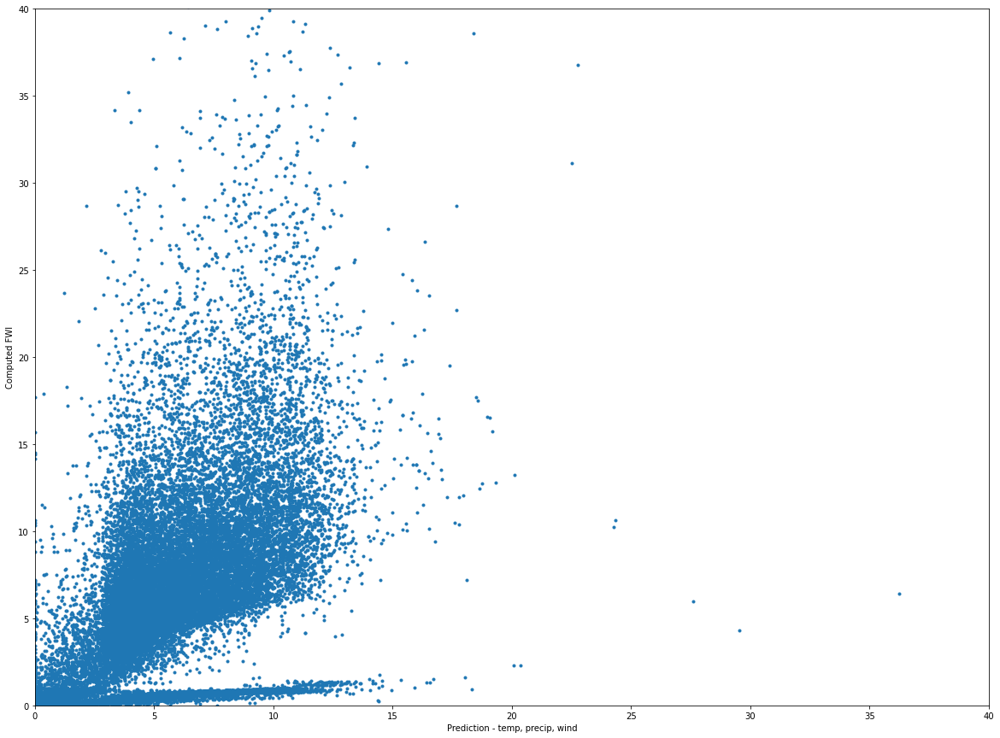

In [45]:
from pylab import *



figure(figsize = (20,15))
plot(model.predict(test_features.reshape(-1,3)), test_labels,".")
xlabel("Prediction - temp, precip, wind")
ylabel("Computed FWI")
ylim(0,40)
xlim(0,40)